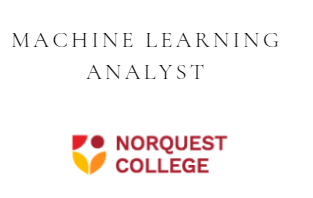

**Understanding**


# **Exploratory Data Analysis (EDA) of NPRI Pollutant Releases**
This exploration data analysis (EDA) project aims to investigate and understand trends in pollution across Canada using the National Pollutant Release Inventory (NPRI). The NPRI dataset tracks pollution emissions from various industries and provides comprehensive data on how companies release pollutants into the environment. For this project, we will analyze three interconnected datasets: Release, Disposal, and Comments. Each of these datasets provides unique insights into the types of pollutants released, their disposal methods, and relevant comments assciated with the data.

**Understanding the Dataset:**

**1. 'Release 2000-2020' Dataset**: The Release Dataset captures the core information about pollutants released by companies into the environment over time. It contains detailed records of emissions into three primary environmental media: air, water, and land. The key features of this dataset include:

**Facility Information:**
- Reporting_Year: The year the release was reported.
- NPRI_ID: The unique ID assigned to each facility.
- Company_Name: Name of the company.
- Facility_Name: Name of the specific facility Multiple facilities may be owned by the same company.
- Number of employees: Employee count, indicating facility size.

**Industry and Location:**
- NAICS_Code: The North American Industry Classification System (NAICS) code,categorizing the industry type.
- NAICS_Title: Description of the NAICS code.
- PROVINCE: Province or territory where the facility is located. This helps with geographic analysis of emissions.
- City: The city of the facility.
- Latitude & Longitude: Geographic coordinates for mapping.

**Substance Information:**
- CAS_Number: Chemical Abstance (CAS) number for each substance.
- Substance_Name_EN: Name of the substance.
- Units: Measurement unit (e.g., tonnes, kilograms, grams, g TEQ).
- Estimation_Method: How the release data was estimated.

**Pollutant Release Pathways:**
- **Release_to_Air**: Including 'Release to Air - Fugitive', 'Release to Air - Other Non-Point', 'Release to Air - Road dust', 'Release to Air - Spills', 'Release to Air - Stack / Point', 'Release to Air - Storage / Handling'.
- **Release_to_Land**: including 'Releases to Land - Leaks', 'Releases to Land - Other', 'Releases to Land - Spills'.
- **Release_to_Water**: including 'Releases to Water Bodies - Direct Discharges', 'Releases to Water Bodies - Leaks', 'Releases to Water Bodies - Spills'

**Sum of release to all media '<'1 tonne**: Total emissions to air, land, and water for substances with less than 1 tonne of release."

**2. 'Disposals and Transfer 00-20' dataset**: constains information related to the off-site disposal and transfer of pollutants, distinct from the release dataset, which focuses on direct emissions to air, land, and water. Here are some key features:
- **Off-site Disposal**: means transporting waste from the facility to another location for safe disposal. Some common methods include: 'Land Treatment', 'Landfill', 'Storage', 'Tailings Management', 'Underground Injection', 'Waste Rock management'.
- **Off-site Transfers for Recycling**: refers to sending waste to recycling facilities where it can be reused. Examples include: 'Energy Recovery', 'Other', 'Recovery of Acids and Bases', 'Recovery of Catalysts', 'Recovery of Inorganic Materials (not metals)', 'Recovery of Metals and Metal Compounds', 'Recovery of Organic Substances (not solvents)', 'Recovery of Pollution Abatement Residues', 'Recovery of Solvents', 'Refining or Re-use of Used Oil'.
- **Off-site Transfers for Treatment Prior to Final Disposal**: before wate is finally disposed of, it may be sent for treatment to make it safer. Examples include: 'Biological Treatment', 'Chemical Treatment', 'Incineration / Thermal', 'Municipal Sewage Treatment Plant', 'Physical Treatment'.
- **On-site Disposal**: refers to waste that is managed directly at the facility where it was generated, without being transported off-site. Common methods include: 'Land Treatment', 'Landfill', 'Tailings Management', 'Underground Injection', 'Waste Rock management'.

**3. 'Comments' dataset**: provides explanations related to pollutant release and waste management reports submitted by facilities. The dataset is essential for understanding the reasons behind certain data trends.
- **Comment_Type_Name**: the type of comment provided, explanations for the release or disposal data.
- **Comment**: the actual comment text, which explains any unusual values, data changes, or other relevant details.



# For the Exploratory Data Analysis (EDA) of this project, the following steps will be taken to better understand the dataset:

**1. Data Cleaning:**
- Renaming Columns: helps make the dataset easier to work with by ensuring column names are consistent, clear, and in a format that's suitable for analysis.
- Dropping Unncessary Columns: Dropping some columns in the dataset that are not relevant to the analysis.
- Combining Columns: Combining or sum multiple columns that represent similar data.
- Handling Missing Data: Identify columns with missing values and decide how to handle them.
- Standardizing Units: Ensure that the pollutant release values across different units (e.g., tonnes, kilograms, grams, g TEQ). Standardizing to a common unit (tonnes) is essential for accurate comparison.


**2. Descriptive Statistics:**
- Summary Statistics: compute basic statistics for the pollution release amounts
- Distribution Analysis: Use visualizations to understand the distribution of the data and identify any outliers.

**3. Trend Analysis:**
- Yearly trends: analyze the year-over-year changes in pollutant releases to identify whether the overall pollution levels are increasing or decreasing over time.

**4. Correlation and Pattern Detection:**
- Correlation Analysis: Examine correlations between different pollutants and pollution levels.

**5. Visualization:**
- Pollution Over Time: Create line  to visualize trends in pollution over the years.

**6. Outlier Detection:**
- Outlier Analysis



In [ ]:
import pandas as pd
import numpy as np

In [ ]:
# loading the  csv data
df_Disposals_2000_2022 = pd.read_csv('Disposals and Transfers 00-20.csv')
df_Release_2000_2022 = pd.read_csv('Releases 2000-2020.csv')
df_Comment = pd.read_csv('Comment.csv')

<ipython-input-2-ca73b1e69727>:2: DtypeWarning: Columns (2) have mixed types. Specify dtype option on import or set low_memory=False.
  df_Disposals_2000_2022 = pd.read_csv('Disposals and Transfers 00-20.csv')
<ipython-input-2-ca73b1e69727>:3: DtypeWarning: Columns (2) have mixed types. Specify dtype option on import or set low_memory=False.
  df_Release_2000_2022 = pd.read_csv('Releases 2000-2020.csv')


In [ ]:
# Check duplicate from df_Disposals_2000_2022 - df_Release_2000_2022 - df_Comment datasets
# Check for duplicate rows
duplicate_rows_Disposal = df_Disposals_2000_2022.duplicated()
duplicate_rows_Release = df_Release_2000_2022.duplicated()
duplicate_rows_Comment = df_Comment.duplicated()

print("Number of duplicate rows:", duplicate_rows_Disposal.sum())
print("Number of duplicate rows:", duplicate_rows_Release.sum())
print("Number of duplicate rows:", duplicate_rows_Comment.sum())


Number of duplicate rows: 0
Number of duplicate rows: 0
Number of duplicate rows: 0


# Cleaning Comment dataset

In [ ]:
# Explore the df_Comment dataset
df_Comment.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 363310 entries, 0 to 363309
Data columns (total 14 columns):
 #   Column                                                     Non-Null Count   Dtype 
---  ------                                                     --------------   ----- 
 0   Reporting_Year / Année                                     363310 non-null  int64 
 1   NPRI_ID / No_INRP                                          363310 non-null  int64 
 2   Company_Name / Dénomination_sociale_de_l'entreprise        363310 non-null  object
 3   Facility_Name / Installation                               359305 non-null  object
 4   NAICS / Code_SCIAN                                         363310 non-null  int64 
 5   NAICS Title EN / Titre Code SCIAN EN                       363294 non-null  object
 6   NAICS Title FR / Titre Code SCIAN FR                       363294 non-null  object
 7   PROVINCE                                                   363310 non-null  object
 8   CAS_

In [ ]:
# Check the columns of the Dataframe
print(df_Comment.columns)

Index(['Reporting_Year / Année', 'NPRI_ID / No_INRP',
       'Company_Name / Dénomination_sociale_de_l'entreprise',
       'Facility_Name / Installation', 'NAICS / Code_SCIAN',
       'NAICS Title EN / Titre Code SCIAN EN',
       'NAICS Title FR / Titre Code SCIAN FR', 'PROVINCE',
       'CAS_Number / No_CAS',
       'Substance Name (English) / Nom de substance (Anglais)',
       'Substance Name (French) / Nom de substance (Français)',
       'Comment_Type_Name (English) Type_de_commentaire (Anglais)',
       'Comment_Type_Name (French) Type_de_commentaire (Français)',
       'Comment / Commentaires'],
      dtype='object')


In [ ]:
# Rename Column in df_Comment
rename_Comment_dict = {
    'Reporting_Year / Année':'Reporting_Year',
    'NPRI_ID / No_INRP':'NPRI_ID',
    "Company_Name / Dénomination_sociale_de_l'entreprise":'Company_Name',
    'Facility_Name / Installation':'Facility_Name',
    'NAICS / Code_SCIAN':'NAICS_Code',
    'NAICS Title EN / Titre Code SCIAN EN':'NAICS_Title_EN',
    'NAICS Title FR / Titre Code SCIAN FR':'NAICS_Title_FR',
    'PROVINCE':'Province',
    'CAS_Number / No_CAS':'CAS_Number',
    'Substance Name (English) / Nom de substance (Anglais)':'Substance_Name_EN',
    'Substance Name (French) / Nom de substance (Français)':'Substance_Name_FR',
    'Comment_Type_Name (English) Type_de_commentaire (Anglais)':'Comment_Type_Name_EN',
    'Comment_Type_Name (French) Type_de_commentaire (Français)':'Comment_Type_Name_FR',
    'Comment / Commentaires':'Comment',
}
# renaming the columns
df_Comment.rename(columns=rename_Comment_dict, inplace=True)
# Check missing values
missing_values_Comment = df_Comment.isnull().sum()
print("missing values in each column:\n",missing_values_Comment)

missing values in each column:
 Reporting_Year             0
NPRI_ID                    0
Company_Name               0
Facility_Name           4005
NAICS_Code                 0
NAICS_Title_EN            16
NAICS_Title_FR            16
Province                   0
CAS_Number                 0
Substance_Name_EN          0
Substance_Name_FR          0
Comment_Type_Name_EN       0
Comment_Type_Name_FR       0
Comment                 4275
dtype: int64


In [ ]:
# update column to categories
df_Comment['Province'] = pd.Categorical(df_Comment['Province'])
df_Comment['NAICS_Code'] = pd.Categorical(df_Comment['NAICS_Code'])
df_Comment['NAICS_Title_EN'] = pd.Categorical(df_Comment['NAICS_Title_EN'])
df_Comment['NAICS_Title_FR'] = pd.Categorical(df_Comment['NAICS_Title_FR'])
df_Comment['Substance_Name_EN'] = pd.Categorical(df_Comment['Substance_Name_EN'])
df_Comment['Substance_Name_FR'] = pd.Categorical(df_Comment['Substance_Name_FR'])
df_Comment['Comment_Type_Name_EN'] = pd.Categorical(df_Comment['Comment_Type_Name_EN'])
df_Comment['Comment_Type_Name_FR'] = pd.Categorical(df_Comment['Comment_Type_Name_FR'])
df_Comment.dtypes

,0
Reporting_Year,int64
NPRI_ID,int64
Company_Name,object
Facility_Name,object
NAICS_Code,category
NAICS_Title_EN,category
NAICS_Title_FR,category
Province,category
CAS_Number,object
Substance_Name_EN,category


# Cleaning Disposal Dataset


In [ ]:
# Explore the df_Disposals_2000_2022 dataset
df_Disposals_2000_2022.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 191645 entries, 0 to 191644
Data columns (total 41 columns):
 #   Column                                                                                       Non-Null Count   Dtype  
---  ------                                                                                       --------------   -----  
 0   Reporting_Year / Année                                                                       191645 non-null  int64  
 1   NPRI_ID / No_INRP                                                                            191645 non-null  int64  
 2   Number of employees                                                                          191551 non-null  object 
 3   Company_Name / Dénomination_sociale_de_l'entreprise                                          191645 non-null  object 
 4   Facility_Name / Installation                                                                 191019 non-null  object 
 5   NAICS / Code_SCIAN     

In [ ]:
# Rename Column in df_Disposals_2000_2022:clarity, realdability, avoid errors in data handling
rename_dict = {
    'Reporting_Year / Année':'Reporting_Year',
    'NPRI_ID / No_INRP':'NPRI_ID',
    'Number of employees':'Number_of_employees',
    "Company_Name / Dénomination_sociale_de_l'entreprise":'Company_Name',
    'Facility_Name / Installation':'Facility_Name',
    'NAICS / Code_SCIAN':'NAICS_Code',
    'NAICS Title / Titre Code_SCIAN':'NAICS_Title',
    'PROVINCE':'Province',
    'CAS_Number / No_CAS':'CAS_Number',
    "Substance Name (English) / Nom de substance (Anglais)":'Substance_Name_EN',
    'Units / Unités':'Units',
    'Estimation_Method / Méthode_d’estimation':'Estimation_Method',
}
# renaming the columns
df_Disposals_2000_2022.rename(columns=rename_dict, inplace=True)
df_Disposals_2000_2022.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 191645 entries, 0 to 191644
Data columns (total 41 columns):
 #   Column                                                                                       Non-Null Count   Dtype  
---  ------                                                                                       --------------   -----  
 0   Reporting_Year                                                                               191645 non-null  int64  
 1   NPRI_ID                                                                                      191645 non-null  int64  
 2   Number_of_employees                                                                          191551 non-null  object 
 3   Company_Name                                                                                 191645 non-null  object 
 4   Facility_Name                                                                                191019 non-null  object 
 5   NAICS_Code             

In [ ]:
# Changing province to categories
df_Disposals_2000_2022['Province'] = pd.Categorical(df_Disposals_2000_2022['Province'])
df_Disposals_2000_2022['Units'] = pd.Categorical(df_Disposals_2000_2022['Units'])
df_Disposals_2000_2022['Estimation_Method'] = pd.Categorical(df_Disposals_2000_2022['Estimation_Method'])
df_Disposals_2000_2022.dtypes

,0
Reporting_Year,int64
NPRI_ID,int64
Number_of_employees,object
Company_Name,object
Facility_Name,object
NAICS_Code,int64
NAICS_Title,object
Province,category
City,object
Latitude,float64


In [ ]:
# Check missing values
missing_values = df_Disposals_2000_2022.isnull().sum()
print("missing values in each column:\n", missing_values)

missing values in each column:
 Reporting_Year                                                                                      0
NPRI_ID                                                                                             0
Number_of_employees                                                                                94
Company_Name                                                                                        0
Facility_Name                                                                                     626
NAICS_Code                                                                                          0
NAICS_Title                                                                                         0
Province                                                                                            0
City                                                                                             3739
Latitude                                          

In [ ]:
# Changing 'Number_of_employees' to numeric type
df_Disposals_2000_2022['Number_of_employees'] = pd.to_numeric(df_Disposals_2000_2022['Number_of_employees'], errors='coerce')


# Filling missing value for 'Number_of_employees' by using mean
df_Disposals_2000_2022['Number_of_employees'].replace(0, np.nan, inplace=True)
missing_employees = df_Disposals_2000_2022['Number_of_employees'].mean()
df_Disposals_2000_2022['Number_of_employees'].fillna(missing_employees, inplace=True)

<ipython-input-329-bd3354caed3d>:6: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_Disposals_2000_2022['Number_of_employees'].replace(0, np.nan, inplace=True)
<ipython-input-329-bd3354caed3d>:8: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method

In [ ]:
df_Disposals_2000_2022['Number_of_employees'] = df_Disposals_2000_2022['Number_of_employees'].astype(int)
df_Disposals_2000_2022.dtypes

,0
Reporting_Year,int64
NPRI_ID,int64
Number_of_employees,int64
Company_Name,object
Facility_Name,object
NAICS_Code,int64
NAICS_Title,object
Province,category
City,object
Latitude,float64


In [ ]:
#Display 'Facility_Name' missing value fill by 'Company_Name'
#Replace the '(blank)' strings with NaN:
df_Disposals_2000_2022['Facility_Name'].replace(('(blank)'), np.nan, inplace=True)
missing_facility = df_Disposals_2000_2022[df_Disposals_2000_2022['Facility_Name'].isnull()]
print(missing_facility[['Facility_Name', 'Company_Name']])
print(df_Disposals_2000_2022[['Facility_Name', 'Company_Name']])

# Filling missing value of 'Facility_Name' - because we can see there are many company have the same Company_Name with Facility_Name
df_Disposals_2000_2022['Facility_Name'].fillna(df_Disposals_2000_2022['Company_Name'], inplace=True)
print(df_Disposals_2000_2022[['Facility_Name', 'Company_Name']])

       Facility_Name                            Company_Name
0                NaN  Alberta-Pacific Forest Industries Inc.
1                NaN  Alberta-Pacific Forest Industries Inc.
48               NaN                    BOMBARDIER TRANSPORT
49               NaN                    BOMBARDIER TRANSPORT
50               NaN                    BOMBARDIER TRANSPORT
...              ...                                     ...
180835           NaN                    DURAPAINT INDUSTRIES
189277           NaN                    DURAPAINT INDUSTRIES
189278           NaN                    DURAPAINT INDUSTRIES
189279           NaN                    DURAPAINT INDUSTRIES
189280           NaN                    DURAPAINT INDUSTRIES

[6190 rows x 2 columns]
               Facility_Name                            Company_Name
0                        NaN  Alberta-Pacific Forest Industries Inc.
1                        NaN  Alberta-Pacific Forest Industries Inc.
2                 Pine Falls        

<ipython-input-331-d795eca36a56>:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_Disposals_2000_2022['Facility_Name'].replace(('(blank)'), np.nan, inplace=True)
<ipython-input-331-d795eca36a56>:9: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].me

In [ ]:
# Dropping columns 'City', 'Latitude', 'Longitude' - due to our group problem, these feature are irrelevant to the problem statement
df_Disposals_2000_2022 = df_Disposals_2000_2022.drop(columns=['City', 'Latitude', 'Longitude'])
# Check columns again after dropping
df_Disposals_2000_2022.isnull().sum()

,0
Reporting_Year,0
NPRI_ID,0
Number_of_employees,0
Company_Name,0
Facility_Name,0
NAICS_Code,0
NAICS_Title,0
Province,0
CAS_Number,0
Substance_Name_EN,0


In [ ]:
# List of columns to sum for different disposals and transfers
Off_site_disposal_columns = [
    'Off-site Disposal - Land Treatment',
    'Off-site Disposal - Landfill',
    'Off-site Disposal - Storage',
    'Off-site Disposal - Tailings Management',
    'Off-site Disposal - Underground Injection',
    'Off-site Disposal - Waste Rock management'
]
Off_site_Transfers_columns = [
    'Off-site Transfers for Recycling - Energy Recovery',
    'Off-site Transfers for Recycling - Other',
    'Off-site Transfers for Recycling - Recovery of Acids and Bases',
    'Off-site Transfers for Recycling - Recovery of Catalysts',
    'Off-site Transfers for Recycling - Recovery of Inorganic Materials (not metals)',
    'Off-site Transfers for Recycling - Recovery of Metals and Metal Compounds',
    'Off-site Transfers for Recycling - Recovery of Organic Substances (not solvents)',
    'Off-site Transfers for Recycling - Recovery of Pollution Abatement Residues',
    'Off-site Transfers for Recycling - Recovery of Solvents',
    'Off-site Transfers for Recycling - Refining or Re-use of Used Oil',
    'Off-site Transfers for Treatment Prior to Final Disposal - Biological Treatment',
    'Off-site Transfers for Treatment Prior to Final Disposal - Chemical Treatment',
    'Off-site Transfers for Treatment Prior to Final Disposal - Incineration / Thermal',
    'Off-site Transfers for Treatment Prior to Final Disposal - Municipal Sewage Treatment Plant',
    'Off-site Transfers for Treatment Prior to Final Disposal - Physical Treatment'
]
On_site_Disposal_columns = [
    'On-site Disposal - Land Treatment',
    'On-site Disposal - Landfill',
    'On-site Disposal - Tailings Management',
    'On-site Disposal - Underground Injection',
    'On-site Disposal - Waste Rock management'
]
# Create new columns for Off-site, On-site, and Total Disposal summing across the respective columns
df_Disposals_2000_2022['Off_site_Disposal'] = df_Disposals_2000_2022[Off_site_disposal_columns].sum(axis=1)
df_Disposals_2000_2022['Off_site_Transfers'] = df_Disposals_2000_2022[Off_site_Transfers_columns].sum(axis=1)
df_Disposals_2000_2022['On_site_Disposal'] = df_Disposals_2000_2022[On_site_Disposal_columns].sum(axis=1)
df_Disposals_2000_2022['Total_Disposal'] = (
    df_Disposals_2000_2022['Off_site_Disposal'] +
    df_Disposals_2000_2022['Off_site_Transfers'] +
    df_Disposals_2000_2022['On_site_Disposal']
)
# Drop the original columns after summation
df_Disposals_2000_2022 = df_Disposals_2000_2022.drop(columns=Off_site_disposal_columns + Off_site_Transfers_columns + On_site_Disposal_columns)

# Show the results to check the update
print(df_Disposals_2000_2022[['Off_site_Disposal', 'Off_site_Transfers', 'On_site_Disposal', 'Total_Disposal','Total_Disposal' ]].head(10))

   Off_site_Disposal  Off_site_Transfers  On_site_Disposal  Total_Disposal  \
0              0.000               0.000              9.07           9.070   
1              0.000               0.000             27.38          27.380   
2              0.000               0.000              2.73           2.730   
3              0.000               0.000              5.70           5.700   
4              0.000               0.000              0.04           0.040   
5              0.001               0.000              0.00           0.001   
6              0.001               0.011              0.00           0.012   
7              2.000               0.011              0.00           2.011   
8              0.014               0.000              0.00           0.014   
9              0.019               0.000              0.00           0.019   

   Total_Disposal  
0           9.070  
1          27.380  
2           2.730  
3           5.700  
4           0.040  
5           0.001  
6

In [ ]:
# Check columns again after dropping
df_Disposals_2000_2022.isnull().sum()

,0
Reporting_Year,0
NPRI_ID,0
Number_of_employees,0
Company_Name,0
Facility_Name,0
NAICS_Code,0
NAICS_Title,0
Province,0
CAS_Number,0
Substance_Name_EN,0


In [ ]:
# Check for missing values
missing_values_Disposal = df_Disposals_2000_2022.isnull().sum()
zero_values_Diposal = (df_Disposals_2000_2022 == 0).sum()

# Combine both results into a DataFrane for easier viewing - Showing the Zero value, this is useful for the fitting model of machine learning
check_values_Disposal = pd.DataFrame({'Missing Values': missing_values_Disposal, 'Zero Values': zero_values_Diposal})
print(check_values_Disposal)

                     Missing Values  Zero Values
Reporting_Year                    0            0
NPRI_ID                           0            0
Number_of_employees               0            0
Company_Name                      0            0
Facility_Name                     0            0
NAICS_Code                        0            0
NAICS_Title                       0            0
Province                          0            0
CAS_Number                        0            0
Substance_Name_EN                 0            0
Units                             0            0
Estimation_Method                 0            0
Off_site_Disposal                 0       122509
Off_site_Transfers                0        81327
On_site_Disposal                  0       147282
Total_Disposal                    0         5608


In [ ]:
df_Disposals_2000_2022.shape

(191645, 16)

In [ ]:
numerical_features = ['Number_of_employees', 'Off_site_Disposal', 'Off_site_Transfers', 'On_site_Disposal', 'Total_Disposal']

for feature in numerical_features:
    # Convert the feature column to numeric, coercing errors to NaN
    df_Disposals_2000_2022[feature] = pd.to_numeric(df_Disposals_2000_2022[feature], errors='coerce')

    # Calculate the upper limit after converting to numeric
    upper_limit = df_Disposals_2000_2022[feature].quantile(0.99)

    # Apply the upper limit to the numeric column
    df_Disposals_2000_2022[feature] = df_Disposals_2000_2022[feature].apply(lambda x: upper_limit if x > upper_limit else x)

    # Count and print the total number of outliers
    num_outliers = len(df_Disposals_2000_2022[df_Disposals_2000_2022[feature] == upper_limit])
    print(f"Total number of outliers for {feature}: {num_outliers}\n")

Total number of outliers for Number_of_employees: 1918

Total number of outliers for Off_site_Disposal: 1917

Total number of outliers for Off_site_Transfers: 1917

Total number of outliers for On_site_Disposal: 1917

Total number of outliers for Total_Disposal: 1917



# Handling Outlier by using Standardization


- Normalization (MinMaxScaler) is useful when you need to bound the features within a specific range, such as when working with algorithms sensitive to feature ranges (e.g., neural networks).
- Standardization (StandardScaler) is useful when you want to ensure features have a similar range of influence and when algorithms rely on the assumption of a normal distribution (e.g., linear regression, logistic regression).

In [ ]:
from sklearn.preprocessing import StandardScaler

# Define the numerical features to be normalized
numerical_features = ['Number_of_employees', 'Off_site_Disposal', 'Off_site_Transfers', 'On_site_Disposal', 'Total_Disposal']

# Initialize MinMaxScaler
scaler = StandardScaler()

# Apply normalization
df_Disposals_2000_2022[numerical_features] = scaler.fit_transform(df_Disposals_2000_2022[numerical_features])

# Print the normalized data summary
print("Standardrization Data Summary:")
print(df_Disposals_2000_2022[numerical_features].describe())


Normalized Data Summary:
       Number_of_employees  Off_site_Disposal  Off_site_Transfers  \
count        191645.000000      191645.000000       191645.000000   
mean              0.078625           0.020528            0.020613   
std               0.166602           0.116706            0.115134   
min               0.000000           0.000000            0.000000   
25%               0.006164           0.000000            0.000000   
50%               0.023930           0.000000            0.000008   
75%               0.074329           0.000101            0.001453   
max               1.000000           1.000000            1.000000   

       On_site_Disposal  Total_Disposal  
count     191645.000000   191645.000000  
mean           0.364620        0.206377  
std            0.072608        0.092869  
min            0.000000        0.000000  
25%            0.353497        0.190331  
50%            0.353497        0.190422  
75%            0.353497        0.191055  
max            1.

In [ ]:
# Visualize after normalization
import matplotlib.pyplot as plt
import seaborn as sns
for feature in numerical_features:
    plt.figure(figsize=(8, 5))
    sns.histplot(df_Disposals_2000_2022[feature], kde=True)
    plt.title(f'Distribution of {feature} after Normalization')
    plt.xlabel(feature)
    plt.ylabel('Frequency')

# Feature Selection

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor
from sklearn.feature_selection import SelectKBest, f_regression

# Define the target variable (e.g., Total_Disposal) and features
target_variable = 'Total_Disposal'  # Replace with your actual target column
X = df_Disposals_2000_2022.drop(columns=[target_variable, 'Company_Name', 'Facility_Name', 'NPRI_ID', 'CAS_Number', 'Substance_Name_EN', 'Estimation_Method'])  # Drop non-numeric/categorical features irrelevant for modeling
y = df_Disposals_2000_2022[target_variable]

# Ensure all columns in X are numeric
X_numeric = X.select_dtypes(include=['float64', 'int64'])

# Step 1: Correlation Analysis (on numeric features only)
correlation_matrix = X_numeric.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title("Feature Correlation Matrix")
plt.show()

# Step 2: Univariate Feature Selection
selector = SelectKBest(score_func=f_regression, k=5)  # Select top 5 features
X_selected = selector.fit_transform(X_numeric, y)

# Get selected feature names
selected_features = X_numeric.columns[selector.get_support()]
print("Selected Features (Univariate):", selected_features)

# Step 3: Feature Importance from Random Forest
model = RandomForestRegressor(random_state=42)
model.fit(X_numeric, y)

# Plot feature importances
importances = pd.DataFrame({'Feature': X_numeric.columns, 'Importance': model.feature_importances_})
importances.sort_values(by='Importance', ascending=False, inplace=True)
sns.barplot(x='Importance', y='Feature', data=importances)
plt.title("Feature Importance (Random Forest)")
plt.show()


In [ ]:
# Explore the df_Release_2000_2022 dataset
df_Release_2000_2022.info()

In [ ]:
# Rename Column in df_Release_2000_2022
rename_Release_dict = {
    'Reporting_Year / Année':'Reporting_Year',
    'NPRI_ID / No_INRP': 'NPRI_ID',
    ' NPRI_ID / No_INRP':'NPRI_ID',
    'Number of employees':'Number_of_employees',
    "Company_Name / Dénomination_sociale_de_l'entreprise":'Company_Name',
    'Facility_Name / Installation':'Facility_Name',
    'NAICS / Code_SCIAN':'NAICS_Code',
    'NAICS Title / Titre Code_SCIAN':'NAICS_Title',
    'PROVINCE':'Province',
    'CAS_Number / No_CAS':'CAS_Number',
    "Substance Name (English) / Nom de substance (Anglais)":'Substance_Name_EN',
    'Units / Unités':'Units',
    'Estimation_Method / Méthode_d’estimation':'Estimation_Method',
}
# renaming the columns
df_Release_2000_2022.rename(columns=rename_Release_dict, inplace=True)
df_Release_2000_2022.info()

In [ ]:
# Changing province to categories
df_Release_2000_2022['Province'] = pd.Categorical(df_Release_2000_2022['Province'])
df_Release_2000_2022['Units'] = pd.Categorical(df_Release_2000_2022['Units'])
df_Release_2000_2022['Estimation_Method'] = pd.Categorical(df_Release_2000_2022['Estimation_Method'])
df_Release_2000_2022['Substance_Name_EN'] = pd.Categorical(df_Release_2000_2022['Substance_Name_EN'])
df_Release_2000_2022.dtypes

In [ ]:
# Changing 'Number_of_employees' to numeric type
df_Release_2000_2022['Number_of_employees'] = pd.to_numeric(df_Release_2000_2022['Number_of_employees'], errors='coerce')
# Filling missing value for 'Number_of_employees' by using mean
df_Release_2000_2022['Number_of_employees'].replace(0, np.nan, inplace=True)
missing_employees_Release = df_Release_2000_2022['Number_of_employees'].mean()
df_Release_2000_2022['Number_of_employees'].fillna(missing_employees_Release, inplace=True)
# Check missing values
missing_values_Release = df_Release_2000_2022.isnull().sum()
print("missing values in each column:\n", missing_values_Release)

In [ ]:
df_Release_2000_2022['Number_of_employees'] = df_Release_2000_2022['Number_of_employees'].astype(int)
df_Release_2000_2022.dtypes

In [ ]:
#Display 'Facility_Name' missing value fill by 'Company_Name'
#Replace the '(blank)' strings with NaN:
df_Release_2000_2022['Facility_Name'].replace(('(blank)'), np.nan, inplace=True)
missing_facility_Release = df_Release_2000_2022[df_Release_2000_2022['Facility_Name'].isnull()]
print(missing_facility_Release[['Facility_Name', 'Company_Name']])
print(df_Release_2000_2022[['Facility_Name', 'Company_Name']])
# Filling missing value of 'Facility_Name'
df_Release_2000_2022['Facility_Name'].fillna(df_Release_2000_2022['Company_Name'], inplace=True)
print(df_Release_2000_2022[['Facility_Name', 'Company_Name']])

In [ ]:
# Dropping columns 'City', 'Latitude', 'Longitude'
df_Release_2000_2022 = df_Release_2000_2022.drop(columns=['City', 'Latitude', 'Longitude'])
# Check columns again after dropping
df_Release_2000_2022.isnull().sum()

In [ ]:
# Check the columns of the Dataframe
print(df_Release_2000_2022.columns.tolist())

In [ ]:
# List of columns for different types of releases
Release_to_Air_columns = [
    'Release to Air - Fugitive',
    'Release to Air - Other Non-Point ',
    'Release to Air - Road dust  ',
    'Release to Air - Spills ',
    'Release to Air - Stack / Point  ',
    'Release to Air - Storage / Handling '
]
Release_to_Land_columns = [
    'Releases to Land - Leaks',
    'Releases to Land - Other ',
    'Releases to Land - Spills '
]
Release_to_Water_columns = [
    'Releases to Water Bodies - Direct Discharges ',
    'Releases to Water Bodies - Leaks',
    'Releases to Water Bodies - Spills '
]
Release_less_1_tonnes_columns = [
    'Sum of release to all media (<1tonne)'
]
# Sum up release values for each type and apply unit conversion
df_Release_2000_2022['Release_to_Air'] = df_Release_2000_2022[Release_to_Air_columns].sum(axis=1)
df_Release_2000_2022['Release_to_Land'] = df_Release_2000_2022[Release_to_Land_columns].sum(axis=1)
df_Release_2000_2022['Release_to_Water'] = df_Release_2000_2022[Release_to_Water_columns].sum(axis=1)
df_Release_2000_2022['Release_less_1_tonnes'] = df_Release_2000_2022[Release_less_1_tonnes_columns].sum(axis=1)
df_Release_2000_2022['Total_Release'] = (
    df_Release_2000_2022['Release_to_Air'] +
    df_Release_2000_2022['Release_to_Land'] +
    df_Release_2000_2022['Release_to_Water'] +
    df_Release_2000_2022['Release_less_1_tonnes']
)
# Drop original release columns after summation and conversion
df_Release_2000_2022 = df_Release_2000_2022.drop(columns=Release_to_Air_columns + Release_to_Land_columns + Release_to_Water_columns + Release_less_1_tonnes_columns)

# Show the final DataFrame with converted release values
print(df_Release_2000_2022[['Release_to_Air', 'Release_to_Land', 'Release_to_Water', 'Release_less_1_tonnes','Total_Release']].head(10))

In [ ]:
# Check columns again after dropping
df_Release_2000_2022.isnull().sum()

In [ ]:
# Check for missing values
missing_values = df_Release_2000_2022.isnull().sum()
zero_values = (df_Release_2000_2022 == 0).sum()

# Combine both results into a DataFrane for easier viewing
check_values = pd.DataFrame({'Missing Values': missing_values, 'Zero Values': zero_values})
print(check_values)

In [ ]:
df_Release_2000_2022.info()

In [ ]:
# Importing the geolocations into a dataframe. Encoding is different so set encoding to ISO to fix it, and low memory to avoid warning about duel datatypes.
Geo = pd.read_csv('NPRI-INRP_Air_OtherAutres_Substances_MediaGroupMilieu_2023.csv', encoding='ISO-8859-1', low_memory=False)

In [ ]:
Geo.head()

,Reporting_Year / Année_Déclaration,NPRI_ID / No_INRP,Company_Name / Dénomination_sociale_de_l'entreprise,Facility_Name / Installation,Address / Adresse,City / Ville,Province / Province,Latitude / Latitude,Longitude / Longitude,Datum / Datum,...,NAICS 4 Sector Name (English) / Nom de secteur SCIAN 4 (Anglais),NAICS 4 Sector Name (French) / Nom de secteur SCIAN 4 (Français),NAICS 6 Code / SCIAN 6 Chiffre,NAICS 6 Sector Name (English) / Nom de secteur SCIAN 6 (Anglais),NAICS 6 Sector Name (French) / Nom de secteur SCIAN 6 (Français),Key Industrial Sector (English),Secteur_Industriel_Clé (French),Units / Unités,TOTAL_ALL_RELEASES / Rejet_Total_Tout,Symbol / Symbole
0,2023,1,Alberta-Pacific Forest Industries Inc.,Alberta-Pacific Forest Industries Inc.,NaN,County of Athabasca,AB,54.923116,-112.861867,1983.0,...,"Pulp, paper and paperboard mills","Usines de pâte à papier, de papier et de carton",322112,Chemical pulp mills,Usines de pâte chimique,Pulp and Paper,Pâte à papier et papier\r\n,Tonnes,469.20416,3
1,2023,11,Hexion Canada Inc.,Hexion Canada Inc.- Edmonton Facility,12621 156th Street,Edmonton,AB,53.582300,-113.588600,1983.0,...,"Resin, synthetic rubber, and artificial and sy...","Fabrication de résines, de caoutchouc synthéti...",325210,Resin and synthetic rubber manufacturing,Fabrication de résines et de caoutchouc synthé...,Chemicals,Produits chimiques\r\n,Tonnes,39.86920,1
2,2023,15,"Dofasco Inc., Stelco Inc.",Baycoat,244 Lanark Street,Hamilton,ON,43.241190,-79.749450,1983.0,...,"Coating, engraving, cold and heat treating and...","Revêtement, gravure, traitement thermique et p...",332810,"Coating, engraving, cold and heat treating and...","Revêtement, gravure, traitement thermique et p...",Other Manufacturing,Autres fabrication\r\n,Tonnes,10.15100,1
3,2023,21,Sunaar Steel Tube and Galvanizing Inc.,Bolton Plant,455 Piercey Road,Bolton,ON,43.866690,-79.731710,1983.0,...,Steel product manufacturing from purchased steel,Fabrication de produits en acier à partir d'ac...,331210,Iron and steel pipes and tubes manufacturing f...,Fabrication de tubes et de tuyaux en fer et en...,Iron and Steel,Fer et acier\r\n,Tonnes,0.17840,1
4,2023,31,BASF Canada Inc.,Windsor Site,845 Wyandotte Street West,Windsor,ON,42.310520,-83.046120,1983.0,...,"Paint, coating and adhesive manufacturing","Fabrication de peintures, de revêtements et d'...",325510,Paint and coating manufacturing,Fabrication de peintures et de revêtements,Chemicals,Produits chimiques\r\n,Tonnes,12.74520,1


In [ ]:
# Check for duplicate rows
Geo.duplicated().sum()

14

In [ ]:
#drop duplicate
Geo.drop_duplicates(inplace=True)

In [ ]:
# Get all column names into a list
Geo_Col_Names = list(Geo.columns.values)

In [ ]:
Geo_Col_Names

['Reporting_Year / Année_Déclaration',
 'NPRI_ID / No_INRP',
 "Company_Name / Dénomination_sociale_de_l'entreprise",
 'Facility_Name / Installation',
 'Address / Adresse',
 'City / Ville',
 'Province / Province',
 'Latitude / Latitude',
 'Longitude / Longitude',
 'Datum / Datum',
 'NAICS 4 Code / SCIAN 4 Chiffre',
 'NAICS 4 Sector Name (English) / Nom de secteur SCIAN 4 (Anglais)',
 'NAICS 4 Sector Name (French) / Nom de secteur SCIAN 4 (Français)',
 'NAICS 6 Code / SCIAN 6 Chiffre',
 'NAICS 6 Sector Name (English) / Nom de secteur SCIAN 6 (Anglais)',
 'NAICS 6 Sector Name (French) / Nom de secteur SCIAN 6 (Français)',
 'Key Industrial Sector (English)',
 'Secteur_Industriel_Clé (French)',
 'Units / Unités',
 'TOTAL_ALL_RELEASES / Rejet_Total_Tout',
 'Symbol / Symbole']

In [ ]:
# Convert column names into only English by getting rid of everything after the /
English_Col_Names = []

for i in range(len(Geo_Col_Names)):
  English_Name = Geo_Col_Names[i].split(' /', 1)[0]
  English_Col_Names.append(English_Name)

In [ ]:
English_Col_Names

['Reporting_Year',
 'NPRI_ID',
 'Company_Name',
 'Facility_Name',
 'Address',
 'City',
 'Province',
 'Latitude',
 'Longitude',
 'Datum',
 'NAICS 4 Code',
 'NAICS 4 Sector Name (English)',
 'NAICS 4 Sector Name (French)',
 'NAICS 6 Code',
 'NAICS 6 Sector Name (English)',
 'NAICS 6 Sector Name (French)',
 'Key Industrial Sector (English)',
 'Secteur_Industriel_Clé (French)',
 'Units',
 'TOTAL_ALL_RELEASES',
 'Symbol']

In [ ]:
# View the nulls
Geo.isnull().sum()

,0
Reporting_Year / Année_Déclaration,0
NPRI_ID / No_INRP,0
Company_Name / Dénomination_sociale_de_l'entreprise,0
Facility_Name / Installation,1
Address / Adresse,200
City / Ville,29
Province / Province,1
Latitude / Latitude,0
Longitude / Longitude,0
Datum / Datum,0


In [ ]:
Geo.columns

Index(['Reporting_Year / Année_Déclaration', 'NPRI_ID / No_INRP',
       'Company_Name / Dénomination_sociale_de_l'entreprise',
       'Facility_Name / Installation', 'Address / Adresse', 'City / Ville',
       'Province / Province', 'Latitude / Latitude', 'Longitude / Longitude',
       'Datum / Datum', 'NAICS 4 Code / SCIAN 4 Chiffre',
       'NAICS 4 Sector Name (English) / Nom de secteur SCIAN 4 (Anglais)',
       'NAICS 4 Sector Name (French) / Nom de secteur SCIAN 4 (Français)',
       'NAICS 6 Code / SCIAN 6 Chiffre',
       'NAICS 6 Sector Name (English) / Nom de secteur SCIAN 6 (Anglais)',
       'NAICS 6 Sector Name (French) / Nom de secteur SCIAN 6 (Français)',
       'Key Industrial Sector (English)', 'Secteur_Industriel_Clé (French)',
       'Units / Unités', 'TOTAL_ALL_RELEASES / Rejet_Total_Tout',
       'Symbol / Symbole'],
      dtype='object')

In [ ]:
# Drop the French specfic columns
df_Geo = Geo.drop(columns= ['Reporting_Year / Année_Déclaration','City / Ville', 'Address / Adresse','Latitude / Latitude', 'Longitude / Longitude',
       'Datum / Datum',
       'NAICS 4 Sector Name (English) / Nom de secteur SCIAN 4 (Anglais)',
       'NAICS 4 Sector Name (French) / Nom de secteur SCIAN 4 (Français)',
       'NAICS 6 Code / SCIAN 6 Chiffre',
       'NAICS 6 Sector Name (English) / Nom de secteur SCIAN 6 (Anglais)',
       'NAICS 6 Sector Name (French) / Nom de secteur SCIAN 6 (Français)',
       'Key Industrial Sector (English)', 'Secteur_Industriel_Clé (French)',
       'Units / Unités','Symbol / Symbole'], axis=1)


In [ ]:
df_Geo.isnull().sum()


,0
NPRI_ID / No_INRP,0
Company_Name / Dénomination_sociale_de_l'entreprise,0
Facility_Name / Installation,1
Province / Province,1
NAICS 4 Code / SCIAN 4 Chiffre,0
TOTAL_ALL_RELEASES / Rejet_Total_Tout,11


In [ ]:
# rename the df_Geo columns
rename_new = {
    'Reporting_Year / Année_Déclaration':'Reporting_Year',
    'NPRI_ID / No_INRP':'NPRI_ID',
    "Company_Name / Dénomination_sociale_de_l'entreprise":'Company_Name',
    'Facility_Name / Installation':'Facility_Name',
    'NAICS 4 Code / SCIAN 4 Chiffre':'NAICS_Code_new',
    'Province / Province':'Province',
    'TOTAL_ALL_RELEASES / Rejet_Total_Tout':'Total_2023_Release',
}
# renaming the columns
df_Geo.rename(columns=rename_new, inplace=True)
df_Geo.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1728 entries, 0 to 1741
Data columns (total 6 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   NPRI_ID             1728 non-null   int64  
 1   Company_Name        1728 non-null   object 
 2   Facility_Name       1727 non-null   object 
 3   Province            1727 non-null   object 
 4   NAICS_Code_new      1728 non-null   int64  
 5   Total_2023_Release  1717 non-null   float64
dtypes: float64(1), int64(2), object(3)
memory usage: 94.5+ KB


In [ ]:
df_Geo.head()

,NPRI_ID,Company_Name,Facility_Name,Province,NAICS_Code_new,Total_2023_Release
0,1,Alberta-Pacific Forest Industries Inc.,Alberta-Pacific Forest Industries Inc.,AB,3221,469.20416
1,11,Hexion Canada Inc.,Hexion Canada Inc.- Edmonton Facility,AB,3252,39.86920
2,15,"Dofasco Inc., Stelco Inc.",Baycoat,ON,3328,10.15100
3,21,Sunaar Steel Tube and Galvanizing Inc.,Bolton Plant,ON,3312,0.17840
4,31,BASF Canada Inc.,Windsor Site,ON,3255,12.74520


In [ ]:
#Ensure data types are consistent
df_Release_2000_2022['NPRI_ID'] = df_Release_2000_2022['NPRI_ID'].astype(str)
df_Geo['NPRI_ID'] = df_Geo['NPRI_ID'].astype(str)

In [ ]:
#Merge datasets on common columns
merged_data = pd.merge(
    df_Release_2000_2022,
    df_Geo,
    on=['NPRI_ID', 'Province','Company_Name'],  # Columns to join on
    how='left'  # Use 'left' join to preserve all rows from df_Release_2000_2022
)

In [ ]:
merged_data.head()

,Reporting_Year,NPRI_ID,Number_of_employees,Company_Name,Facility_Name_x,NAICS_Code,NAICS_Title,Province,CAS_Number,Substance_Name_EN,Units,Estimation_Method,Release_to_Air,Release_to_Land,Release_to_Water,Release_less_1_tonnes,Total_Release,Facility_Name_y,NAICS_Code_new,Total_2023_Release
0,2000,1,440,Alberta-Pacific Forest Industries Inc.,Alberta-Pacific Forest Industries Inc.,322112,Chemical pulp mills,AB,10049-04-4,Chlorine dioxide,tonnes,M - Monitoring or Direct Measurement,5.200,0.0,0.0,0.0,5.200,Alberta-Pacific Forest Industries Inc.,3221.0,469.20416
1,2000,1,440,Alberta-Pacific Forest Industries Inc.,Alberta-Pacific Forest Industries Inc.,322112,Chemical pulp mills,AB,67-56-1,Methanol,tonnes,E - Emission Factor,113.000,0.0,0.0,0.0,113.000,Alberta-Pacific Forest Industries Inc.,3221.0,469.20416
2,2000,1,440,Alberta-Pacific Forest Industries Inc.,Alberta-Pacific Forest Industries Inc.,322112,Chemical pulp mills,AB,67-66-3,Chloroform,tonnes,M - Monitoring or Direct Measurement,0.000,0.0,0.0,0.0,0.000,Alberta-Pacific Forest Industries Inc.,3221.0,469.20416
3,2000,1,440,Alberta-Pacific Forest Industries Inc.,Alberta-Pacific Forest Industries Inc.,322112,Chemical pulp mills,AB,75-07-0,Acetaldehyde,tonnes,E - Emission Factor,7.670,0.0,0.0,0.0,7.670,Alberta-Pacific Forest Industries Inc.,3221.0,469.20416
4,2000,1,440,Alberta-Pacific Forest Industries Inc.,Alberta-Pacific Forest Industries Inc.,322112,Chemical pulp mills,AB,7647-01-0,Hydrochloric acid,tonnes,M - Monitoring or Direct Measurement,0.665,0.0,0.0,0.0,0.665,Alberta-Pacific Forest Industries Inc.,3221.0,469.20416


In [ ]:
merged_data.isnull().sum()

,0
Reporting_Year,0
NPRI_ID,0
Number_of_employees,0
Company_Name,0
Facility_Name_x,0
NAICS_Code,0
NAICS_Title,0
Province,0
CAS_Number,0
Substance_Name_EN,0


In [ ]:
merged_data.shape

(739895, 20)

In [ ]:
merged_data = merged_data.drop(columns= ['NAICS_Code_new'], axis=1)

In [ ]:
# Check for missing values
missing_values_new = merged_data.isnull().sum()
zero_values_new = (merged_data == 0).sum()

# Combine both results into a DataFrane for easier viewing
check_values_new = pd.DataFrame({'Missing Values': missing_values_new, 'Zero Values': zero_values_new})
print(check_values_new)

                       Missing Values  Zero Values
Reporting_Year                      0            0
NPRI_ID                             0            0
Number_of_employees                 0            0
Company_Name                        0            0
Facility_Name                       0            0
NAICS_Code                          0            0
NAICS_Title                         0            0
Province                            0            0
CAS_Number                          0            0
Substance_Name_EN                   0            0
Units                               0            0
Estimation_Method                   0            0
Release_to_Air                      0       117964
Release_to_Land                     0       732372
Release_to_Water                    0       689333
Release_less_1_tonnes               0       695102
Total_Release                       0        34547
Facility_Name_y                588881            0
Total_2023_Release             

In [ ]:
# Rename
rename_dict = {'Facility_Name_x':'Facility_Name'}
# renaming the columns
merged_data.rename(columns=rename_dict, inplace=True)
merged_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 739895 entries, 0 to 739894
Data columns (total 19 columns):
 #   Column                 Non-Null Count   Dtype   
---  ------                 --------------   -----   
 0   Reporting_Year         739895 non-null  int64   
 1   NPRI_ID                739895 non-null  object  
 2   Number_of_employees    739895 non-null  int64   
 3   Company_Name           739895 non-null  object  
 4   Facility_Name          739895 non-null  object  
 5   NAICS_Code             739895 non-null  int64   
 6   NAICS_Title            739895 non-null  object  
 7   Province               739895 non-null  object  
 8   CAS_Number             739895 non-null  object  
 9   Substance_Name_EN      739895 non-null  category
 10  Units                  739895 non-null  category
 11  Estimation_Method      739895 non-null  category
 12  Release_to_Air         739895 non-null  float64 
 13  Release_to_Land        739895 non-null  float64 
 14  Release_to_Water    

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor
from sklearn.feature_selection import SelectKBest, f_regression

# Define the target variable (e.g., Total_Disposal) and features
target_variable = 'Total_Release'  # Replace with your actual target column
X = merged_data.drop(columns=[target_variable,'Company_Name', 'Facility_Name', 'NAICS_Title','Province','CAS_Number','Substance_Name_EN','Units','Estimation_Method'])
y = merged_data[target_variable]

# Ensure all columns in X are numeric
X_numeric = X.select_dtypes(include=['float64', 'int64'])

# Step 1: Correlation Analysis (on numeric features only)
correlation_matrix = X_numeric.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title("Feature Correlation Matrix")
plt.show()

# Step 2: Univariate Feature Selection
selector = SelectKBest(score_func=f_regression, k=5)  # Select top 5 features
X_selected = selector.fit_transform(X_numeric, y)

# Get selected feature names
selected_features = X_numeric.columns[selector.get_support()]
print("Selected Features (Univariate):", selected_features)

# Step 3: Feature Importance from Random Forest
model = RandomForestRegressor(random_state=42)
model.fit(X_numeric, y)

# Plot feature importances
importances = pd.DataFrame({'Feature': X_numeric.columns, 'Importance': model.feature_importances_})
importances.sort_values(by='Importance', ascending=False, inplace=True)
sns.barplot(x='Importance', y='Feature', data=importances)
plt.title("Feature Importance (Random Forest)")
plt.show()


KeyboardInterrupt: 

In [ ]:
# Group by 'Substance_Name_EN' and create separate DataFrames
substance_dataframes = {substance: df for substance, df in merged_data.groupby('Substance_Name_EN')}


<ipython-input-231-062d8a2ae16a>:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  substance_dataframes = {substance: df for substance, df in merged_data.groupby('Substance_Name_EN')}


In [ ]:
# max 5 majority of substance
substance_counts = merged_data['Substance_Name_EN'].value_counts().head(5)
print(substance_counts)

Substance_Name_EN
PM2.5 - Particulate Matter <= 2.5 Micrometers      88737
PM10 - Particulate Matter <= 10 Micrometers        83436
Nitrogen oxides (expressed as nitrogen dioxide)    73435
Carbon monoxide                                    60469
Volatile Organic Compounds (VOCs)                  59162
Name: count, dtype: int64


In [ ]:
# Making 5 dataframe base on the 5 priority substance
PM25_df= substance_dataframes['PM2.5 - Particulate Matter <= 2.5 Micrometers'].copy()
PM10_df= substance_dataframes['PM10 - Particulate Matter <= 10 Micrometers'].copy()
VOCs_df= substance_dataframes['Volatile Organic Compounds (VOCs)'].copy()
NO2_df= substance_dataframes['Nitrogen oxides (expressed as nitrogen dioxide)'].copy()
CO2_df= substance_dataframes['Carbon monoxide'].copy()

In [ ]:
# Check PM25_df Units
print(PM25_df['Units'].value_counts())
print(PM10_df['Units'].value_counts())
print(VOCs_df['Units'].value_counts())
print(NO2_df['Units'].value_counts())
print(CO2_df['Units'].value_counts())

Units
tonnes    88737
g TEQ         0
grams         0
kg            0
Name: count, dtype: int64
Units
tonnes    83436
g TEQ         0
grams         0
kg            0
Name: count, dtype: int64
Units
tonnes    59162
g TEQ         0
grams         0
kg            0
Name: count, dtype: int64
Units
tonnes    73435
g TEQ         0
grams         0
kg            0
Name: count, dtype: int64
Units
tonnes    60469
g TEQ         0
grams         0
kg            0
Name: count, dtype: int64


Visualizing PM2.5...


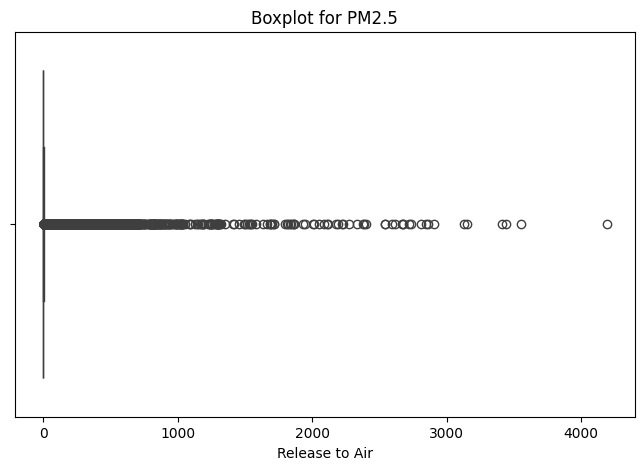

Visualizing PM10...


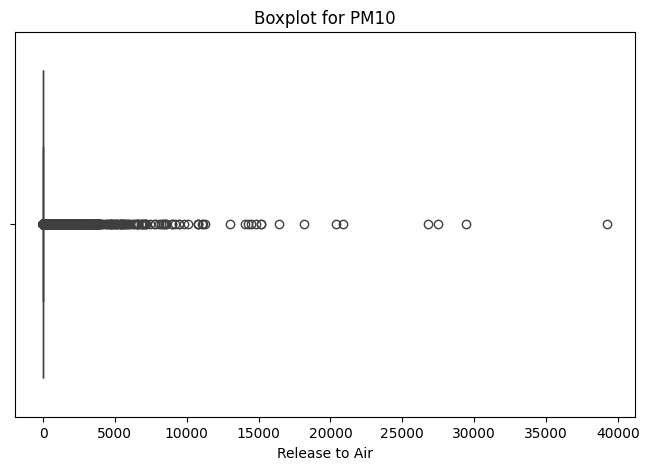

Visualizing VOCs...


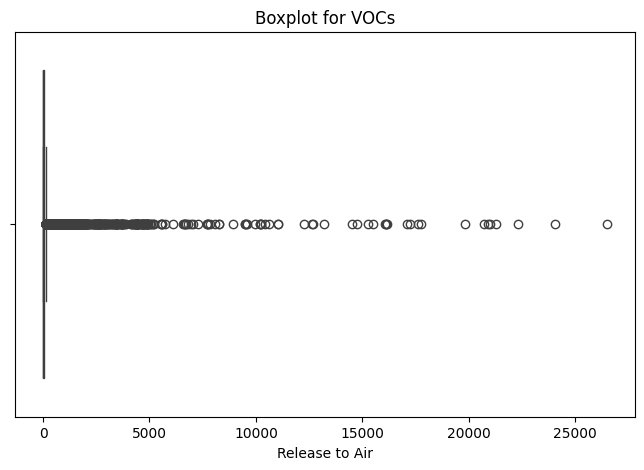

Visualizing NO2...


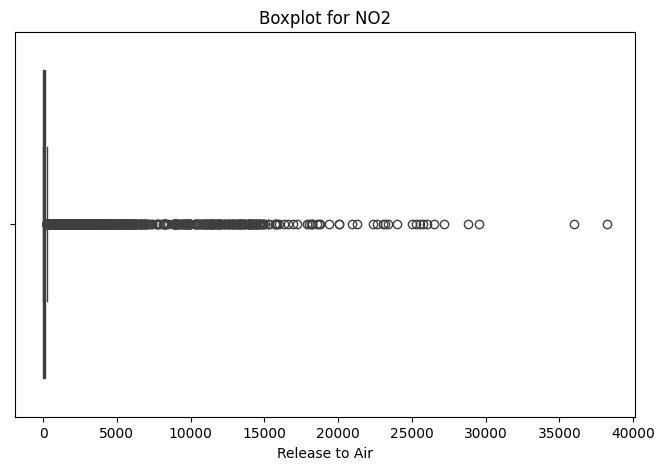

Visualizing CO2...


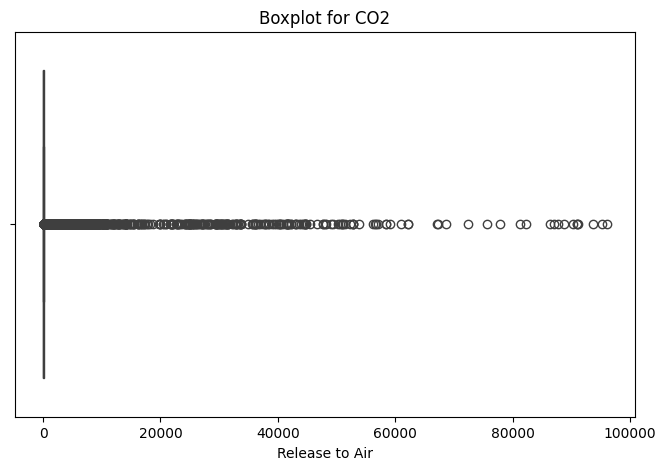

In [ ]:
# visual inspection plot distribution for each substance's release values
import seaborn as sns
import matplotlib.pyplot as plt

# Define a dictionary for easy access to substances and their data
substances = {
    "PM2.5": PM25_df,
    "PM10": PM10_df,
    "VOCs": VOCs_df,
    "NO2": NO2_df,
    "CO2": CO2_df
}

# Visualize each substance's release values
for substance_name, substance_data in substances.items():
    print(f"Visualizing {substance_name}...")

    # Check if the release column exists
    if 'Release_to_Air' not in substance_data.columns:
        print(f"'Release_to_Air' column not found for {substance_name}. Skipping...")
        continue

    # Boxplot for outliers
    plt.figure(figsize=(8, 5))
    sns.boxplot(x=substance_data['Release_to_Air'])
    plt.title(f"Boxplot for {substance_name}")
    plt.xlabel("Release to Air")
    plt.show()


# Winsorization
Winsorization caps outliers to a specified percentile range (e.g., 1st and 99th percentile). Keeps the values in the original scale while reducing the impact of extreme outliers.

In [ ]:
from scipy.stats import mstats

# Apply Winsorization to clip extreme outliers
for substance_name, df in substances.items():
    print(f"Applying Winsorization to {substance_name}...")
    df['Release_to_Air'] = mstats.winsorize(df['Release_to_Air'], limits=[0.01, 0.01])  # Clipping top and bottom 1%


Applying Winsorization to PM2.5...
Applying Winsorization to PM10...
Applying Winsorization to VOCs...
Applying Winsorization to NO2...
Applying Winsorization to CO2...


In [ ]:
# Verify the changes by displaying summary statistics for each substance
for substance_name, df in substances.items():
    print(f"Summary statistics for {substance_name} after Winsorization:")
    print(df['Release_to_Air'].describe())
    print("\n")

Summary statistics for PM2.5 after Winsorization:
count    88737.000000
mean         9.592389
std         34.127275
min          0.001000
25%          0.405000
50%          0.923000
75%          3.173000
max        254.730000
Name: Release_to_Air, dtype: float64


Summary statistics for PM10 after Winsorization:
count    83436.000000
mean        21.874177
std         78.517910
min          0.001050
25%          0.655000
50%          1.700000
75%          7.427250
max        597.000000
Name: Release_to_Air, dtype: float64


Summary statistics for VOCs after Winsorization:
count    59162.000000
mean        61.577872
std        136.361230
min          0.000000
25%          2.353275
50%         15.091456
75%         49.571750
max        907.683000
Name: Release_to_Air, dtype: float64


Summary statistics for NO2 after Winsorization:
count    73435.000000
mean       148.789277
std        326.148608
min          0.140000
25%         25.800000
50%         52.081000
75%        126.698500
max  

/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:4824: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  arr.partition(
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:4824: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  arr.partition(
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:4824: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  arr.partition(
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:4824: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  arr.partition(
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:4824: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  arr.partition(


Visualizing PM2.5...


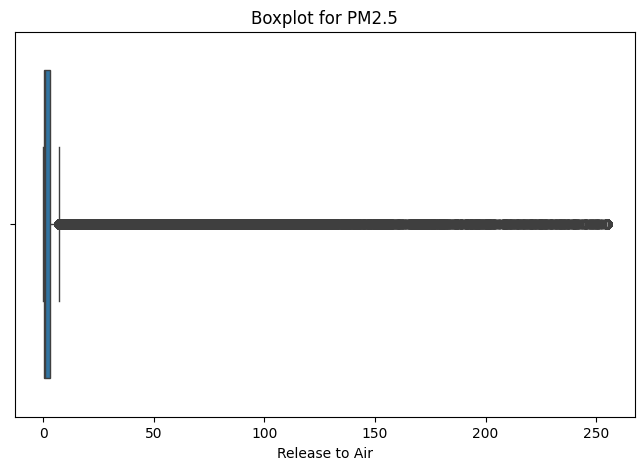

Visualizing PM10...


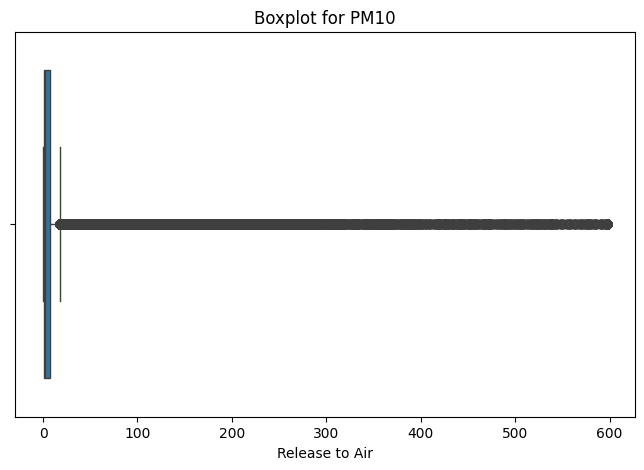

Visualizing VOCs...


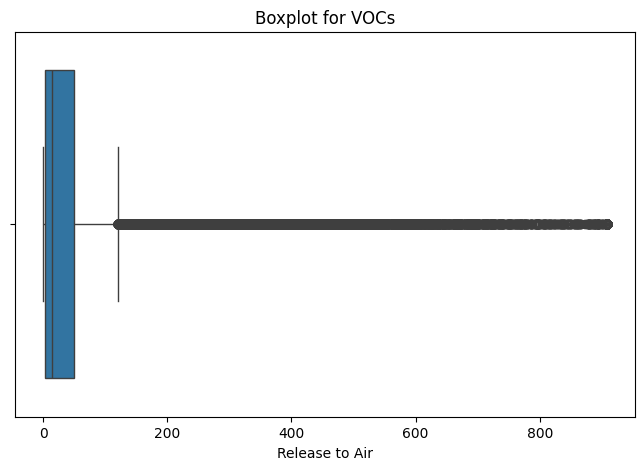

Visualizing NO2...


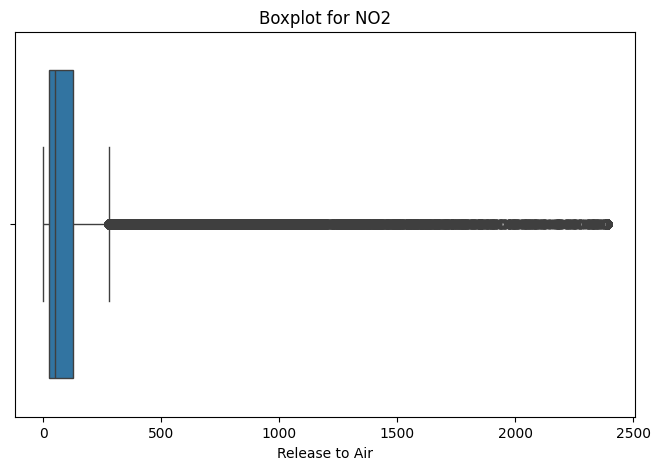

Visualizing CO2...


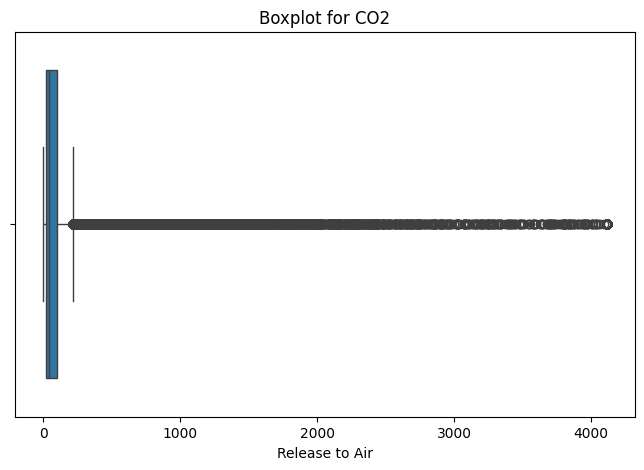

In [ ]:
# Visualize each substance's release values
for substance_name, substance_data in substances.items():
    print(f"Visualizing {substance_name}...")

    # Check if the release column exists
    if 'Release_to_Air' not in substance_data.columns:
        print(f"'Release_to_Air' column not found for {substance_name}. Skipping...")
        continue

    # Boxplot for outliers
    plt.figure(figsize=(8, 5))
    sns.boxplot(x=substance_data['Release_to_Air'])
    plt.title(f"Boxplot for {substance_name}")
    plt.xlabel("Release to Air")
    plt.show()

In [ ]:
import pandas as pd

# Function to analyze non-zero, zero, and missing values for substances
def analyze_substance_data(substances, features):
    analysis_results = []

    # Process each substance
    for substance_name, substance_data in substances.items():
        # Aggregate data by Province and Year
        substance_aggregated = substance_data.groupby(
            ['Province', 'Reporting_Year'], observed=False
        ).agg({
            feature: 'sum' for feature in features
        }).reset_index()

        # Analyze each feature
        for feature in features:
            total_rows = len(substance_aggregated)
            non_zero_count = substance_aggregated[feature].gt(0).sum()
            zero_count = substance_aggregated[feature].eq(0).sum()
            missing_count = substance_aggregated[feature].isnull().sum()

            # Append the results to the list
            analysis_results.append({
                "Substance": substance_name,
                "Feature": feature,
                "Total Rows": total_rows,
                "Non-Zero Values": non_zero_count,
                "Zero Values": zero_count,
                "Missing Values": missing_count
            })

    # Convert results to a DataFrame
    analysis_results_df = pd.DataFrame(analysis_results)

    # Pivot the data for better readability
    reshaped_results_df = analysis_results_df.pivot(index="Substance", columns="Feature", values=["Non-Zero Values", "Zero Values", "Missing Values"])
    reshaped_results_df.columns = ['_'.join(col).strip() for col in reshaped_results_df.columns.values]
    reshaped_results_df.reset_index(inplace=True)

    # Rename columns for clarity
    reshaped_results_df.rename(columns={
        'Substance': 'Substance',
        **{f'Non-Zero Values_{feature}': f'Non-Zero {feature}' for feature in features},
        **{f'Zero Values_{feature}': f'Zero {feature}' for feature in features},
        **{f'Missing Values_{feature}': f'Missing {feature}' for feature in features}
    }, inplace=True)

    return reshaped_results_df

# Define substances and features
top_substances = {
    "PM2.5": PM25_df,
    "PM10": PM10_df,
    "VOCs": VOCs_df,
    "NO2": NO2_df,
    "CO2": CO2_df
}

features_to_check = ['Release_to_Air', 'Release_to_Land', 'Release_to_Water','Total_2023_Release']

# Analyze the data
Missing_results_df = analyze_substance_data(top_substances, features_to_check)
print(Missing_results_df)


  Substance  Non-Zero Release_to_Air  Non-Zero Release_to_Land  \
0       CO2                      265                         0   
1       NO2                      271                         0   
2      PM10                      270                         0   
3     PM2.5                      271                         0   
4      VOCs                      245                         0   

   Non-Zero Release_to_Water  Non-Zero Total_2023_Release  \
0                          0                          214   
1                          0                          224   
2                          0                          228   
3                          0                          229   
4                          0                          212   

   Zero Release_to_Air  Zero Release_to_Land  Zero Release_to_Water  \
0                    0                   265                    265   
1                    0                   271                    271   
2                    0 

# Feature Engineeing

In [ ]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np

def evaluate_model(y_true, y_pred):
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_true, y_pred)
    return {"MAE": mae, "MSE": mse, "RMSE": rmse, "R^2": r2}


In [ ]:
# Combine all DataFrames into a single DataFrame
all_substances_df = pd.concat([PM25_df, PM10_df, VOCs_df, NO2_df, CO2_df], ignore_index=True)

# Reset the index
all_substances_df.reset_index(drop=True, inplace=True)

# Display the combined DataFrame
print("Combined Dataset with All Substances:")
print(all_substances_df.head())

Combined Dataset with All Substances:
   Reporting_Year NPRI_ID  Number_of_employees  \
0            2002       1                  440   
1            2002       4                  450   
2            2002      11                   65   
3            2002      18                  170   
4            2002      21                   72   

                        Company_Name                      Facility_Name  \
0  ALBERTA PACIFIC FOREST INDUSTRIES  ALBERTA PACIFIC FOREST INDUSTRIES   
1                  TEMBEC INDUSTRIES              PINE FALLS OPERATIONS   
2       BORDEN CHEMICAL CANADA, INC.         BORDEN CHEMICAL - EDMONTON   
3                         ALCAN INC.                     Usine Saguenay   
4  BOLTON STEEL TUBE COMPANY LIMITED                       Bolton Plant   

   NAICS_Code                                        NAICS_Title Province  \
0      322112                                Chemical pulp mills       AB   
1      322122                                    Newspri

In [ ]:
from sklearn.preprocessing import LabelEncoder

# Apply LabelEncoder to the Province column
label_encoder = LabelEncoder()
all_substances_df['Province'] = label_encoder.fit_transform(all_substances_df['Province'])

# To see the mapping between original province names and their numerical encoding
province_mapping = dict(zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_)))
print("Province Encoding Mapping:", province_mapping)

Province Encoding Mapping: {'AB': 0, 'BC': 1, 'MB': 2, 'NB': 3, 'NL': 4, 'NS': 5, 'NT': 6, 'NU': 7, 'ON': 8, 'PE': 9, 'QC': 10, 'SK': 11, 'YT': 12}


In [ ]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
import xgboost as xgb
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
import pandas as pd
import numpy as np

# Define a function to evaluate models
def evaluate_model(y_true, y_pred):
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_true, y_pred)
    return {"MAE": mae, "MSE": mse, "RMSE": rmse, "R^2": r2}

# Verify the structure of the combined DataFrame
required_columns = ['Substance_Name_EN', 'Province', 'Reporting_Year', 'Release_to_Air', 'NPRI_ID', 'Number_of_employees', 'Company_Name', 'NAICS_Code']
for column in required_columns:
    if column not in all_substances_df.columns:
        raise ValueError(f"Column '{column}' is missing in the DataFrame.")

# Encode categorical variables
label_encoders = {}
for col in ['Company_Name', 'NAICS_Code']:
    le = LabelEncoder()
    all_substances_df[col] = le.fit_transform(all_substances_df[col])
    label_encoders[col] = le

# Prepare aggregated dataset
all_results = {}

# Group by Substance and process each separately
for substance_name, substance_data in all_substances_df.groupby("Substance_Name_EN"):
    print(f"Processing substance: {substance_name}")

    # Aggregate data by Province and Year
    substance_aggregated = substance_data.groupby(['Province', 'Reporting_Year']).agg({
        'Release_to_Air': 'sum',
        'NPRI_ID': 'first',  # Use the first occurrence for simplicity
        'Number_of_employees': 'mean',  # Use average employees
        'Company_Name': 'first',  # Use the first occurrence
        'NAICS_Code': 'first'  # Use the first occurrence
    }).reset_index()

    # Prepare lagged features
    substance_aggregated['lag_1'] = substance_aggregated['Release_to_Air'].shift(1)
    substance_aggregated['lag_2'] = substance_aggregated['Release_to_Air'].shift(2)
    substance_aggregated = substance_aggregated.dropna()

    # Check for sufficient data
    if substance_aggregated.empty:
        print(f"No sufficient data for substance: {substance_name}. Skipping...")
        continue

    # Define features and target
    X = substance_aggregated[['lag_1', 'lag_2', 'Reporting_Year', 'Number_of_employees', 'Company_Name', 'NAICS_Code']]
    y = substance_aggregated['Release_to_Air']

    # Split into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Initialize models
    models = {
        "Linear Regression": LinearRegression(),
        "Decision Tree": DecisionTreeRegressor(random_state=42),
        "Random Forest": RandomForestRegressor(n_estimators=100, random_state=42),
        "XGBoost": xgb.XGBRegressor(objective="reg:squarederror", n_estimators=100, random_state=42),
        "KNN": KNeighborsRegressor(n_neighbors=5)
    }

    # Train and evaluate each model
    results = {}
    for model_name, model in models.items():
        # Train the model
        model.fit(X_train, y_train)

        # Predict on the test set
        y_pred = model.predict(X_test)

        # Evaluate the model
        results[model_name] = evaluate_model(y_test, y_pred)

    # Store the results for the current substance
    all_results[substance_name] = pd.DataFrame(results).T

# Combine all results into one DataFrame
final_results_df = pd.concat(all_results, names=["Substance_Name_EN", "Model"])

# Display the results
print(final_results_df)



<ipython-input-250-54bd85c39361>:37: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for substance_name, substance_data in all_substances_df.groupby("Substance_Name_EN"):


Processing substance: 1,1,1,2-Tetrachloroethane
No sufficient data for substance: 1,1,1,2-Tetrachloroethane. Skipping...
Processing substance: 1,1,2,2-Tetrachloroethane
No sufficient data for substance: 1,1,2,2-Tetrachloroethane. Skipping...
Processing substance: 1,1,2-Trichloroethane
No sufficient data for substance: 1,1,2-Trichloroethane. Skipping...
Processing substance: 1,1-Methylenebis(4-isocyanatocyclohexane)
No sufficient data for substance: 1,1-Methylenebis(4-isocyanatocyclohexane). Skipping...
Processing substance: 1,2,4-Trichlorobenzene
No sufficient data for substance: 1,2,4-Trichlorobenzene. Skipping...
Processing substance: 1,2,4-Trimethylbenzene
No sufficient data for substance: 1,2,4-Trimethylbenzene. Skipping...
Processing substance: 1,2-Butylene oxide
No sufficient data for substance: 1,2-Butylene oxide. Skipping...
Processing substance: 1,2-Dichloroethane
No sufficient data for substance: 1,2-Dichloroethane. Skipping...
Processing substance: 1,2-Dichloropropane
No suf

# Hyperparameter grids for tuning

In [ ]:
from sklearn.model_selection import GridSearchCV
import pandas as pd
import numpy as np

# Hyperparameter grids for tuning
param_grids = {
    "Linear Regression": {},  # No hyperparameters for Linear Regression
    "Decision Tree": {
        "max_depth": [3, 5, 10, None],
        "min_samples_split": [2, 5, 10],
    },
    "Random Forest": {
        "n_estimators": [50, 100, 200],
        "max_depth": [3, 5, 10, None],
        "min_samples_split": [2, 5, 10],
    },
    "XGBoost": {
        "learning_rate": [0.01, 0.1, 0.2],
        "max_depth": [3, 5, 10],
        "n_estimators": [50, 100, 200],
    },
    "KNN": {
        "n_neighbors": [3, 5, 7, 10],
        "weights": ["uniform", "distance"],
    },
}

In [ ]:
# Best models and results for each substance
best_results = {}
best_models = {}

for substance_name, substance_data in all_substances_df.groupby("Substance_Name_EN"):
    print(f"Processing substance: {substance_name}")

    # Aggregate and prepare data (as done previously)
    substance_aggregated = substance_data.groupby(['Province', 'Reporting_Year']).agg({
        'Release_to_Air': 'sum',
        'NPRI_ID': 'first',
        'Number_of_employees': 'mean',
        'Company_Name': 'first',
        'NAICS_Code': 'first'
    }).reset_index()

    substance_aggregated['lag_1'] = substance_aggregated['Release_to_Air'].shift(1)
    substance_aggregated['lag_2'] = substance_aggregated['Release_to_Air'].shift(2)
    substance_aggregated = substance_aggregated.dropna()

    if substance_aggregated.empty:
        print(f"No sufficient data for substance: {substance_name}. Skipping...")
        continue

    # Features and target
    X = substance_aggregated[['lag_1', 'lag_2', 'Reporting_Year', 'Number_of_employees', 'Company_Name', 'NAICS_Code']]
    y = substance_aggregated['Release_to_Air']

    # Train-test split
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    results = {}
    for model_name, model in models.items():
        print(f"Tuning {model_name} for {substance_name}...")

        # Define and execute GridSearchCV
        grid_search = GridSearchCV(
            estimator=model,
            param_grid=param_grids[model_name],
            scoring='r2',  # Or another suitable scoring metric
            cv=5,  # Number of cross-validation folds
            n_jobs=-1  # Use all available cores
        )
        grid_search.fit(X_train, y_train) # Fit the GridSearchCV object

        # Best model and metrics
        best_model = grid_search.best_estimator_
        y_pred = best_model.predict(X_test)
        metrics = evaluate_model(y_test, y_pred)

        results[model_name] = metrics

        # Store best model and metrics based on R^2
        if model_name not in best_models or metrics["R^2"] > best_models.get(model_name, {}).get("R^2", -np.inf):
            best_models[model_name] = {"model": best_model, "R^2": metrics["R^2"]} # Store model and R^2

    best_results[substance_name] = pd.DataFrame(results).T

# Combine results
final_tuned_results_df = pd.concat(best_results, names=["Substance_Name_EN", "Model"])

<ipython-input-255-e54a1b969502>:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for substance_name, substance_data in all_substances_df.groupby("Substance_Name_EN"):


Processing substance: 1,1,1,2-Tetrachloroethane
No sufficient data for substance: 1,1,1,2-Tetrachloroethane. Skipping...
Processing substance: 1,1,2,2-Tetrachloroethane
No sufficient data for substance: 1,1,2,2-Tetrachloroethane. Skipping...
Processing substance: 1,1,2-Trichloroethane
No sufficient data for substance: 1,1,2-Trichloroethane. Skipping...
Processing substance: 1,1-Methylenebis(4-isocyanatocyclohexane)
No sufficient data for substance: 1,1-Methylenebis(4-isocyanatocyclohexane). Skipping...
Processing substance: 1,2,4-Trichlorobenzene
No sufficient data for substance: 1,2,4-Trichlorobenzene. Skipping...
Processing substance: 1,2,4-Trimethylbenzene
No sufficient data for substance: 1,2,4-Trimethylbenzene. Skipping...
Processing substance: 1,2-Butylene oxide
No sufficient data for substance: 1,2-Butylene oxide. Skipping...
Processing substance: 1,2-Dichloroethane
No sufficient data for substance: 1,2-Dichloroethane. Skipping...
Processing substance: 1,2-Dichloropropane
No suf

In [ ]:
final_tuned_results_df

MAE  \
Substance_Name_EN                               Model                            
Carbon monoxide                                 Linear Regression  7171.870702   
                                                Decision Tree      5874.166428   
                                                Random Forest      6802.404572   
                                                XGBoost            6939.964220   
                                                KNN                6751.529437   
Nitrogen oxides (expressed as nitrogen dioxide) Linear Regression  6199.206385   
                                                Decision Tree      8994.592242   
                                                Random Forest      6584.918469   
                                                XGBoost            5838.444813   
                                                KNN                7449.509895   
PM10 - Particulate Matter <= 10 Micrometers     Linear Regression  1395.624717   
                                                Decision Tree      1561.526335   
                                                Random Forest      1108.318426   
                                                XGBoost            1200.100211   
                                                KNN                1147.568956   
PM2.5 - Particulate Matter <= 2.5 Micrometers   Linear Regression   484.185627   
                                                Decision Tree       364.446699   
                                                Random Forest       406.477212   
                                                XGBoost             308.685620   
                                                KNN                 438.094305   
Volatile Organic Compounds (VOCs)               Linear Regression  3898.746376   
                                                Decision Tree      4051.772165   
                                                Random Forest      3653.460896   
                                                XGBoost            3898.202893   
                                                KNN                4785.792157   

                                                                            MSE  \
Substance_Name_EN                               Model                             
Carbon monoxide                                 Linear Regression  3.022092e+08   
                                                Decision Tree      2.042387e+08   
                                                Random Forest      1.990012e+08   
                                                XGBoost            2.564992e+08   
                                                KNN                2.996893e+08   
Nitrogen oxides (expressed as nitrogen dioxide) Linear Regression  6.843048e+08   
                                                Decision Tree      1.699972e+09   
                                                Random Forest      8.565824e+08   
                                                XGBoost            4.493554e+08   
                                                KNN                7.882313e+08   
PM10 - Particulate Matter <= 10 Micrometers     Linear Regression  7.188311e+06   
                                                Decision Tree      1.164284e+07   
                                                Random Forest      3.881530e+06   
                                                XGBoost            4.998426e+06   
                                                KNN                5.254501e+06   
PM2.5 - Particulate Matter <= 2.5 Micrometers   Linear Regression  5.891412e+05   
                                                Decision Tree      4.427149e+05   
                                                Random Forest      5.585032e+05   
                                                XGBoost            2.634944e+05   
                                                KNN                1.032175e+06   
Volatile Organic Compounds (VOCs) 

In [ ]:
# Store best models for future use
print("Best models for each substance:")
for substance, model in best_models.items():
    print(f"{substance}: {model}")

Best models for each substance:
Linear Regression: {'model': LinearRegression(), 'R^2': 0.9500335422644375}
Decision Tree: {'model': DecisionTreeRegressor(min_samples_split=10, random_state=42), 'R^2': 0.9624523043827303}
Random Forest: {'model': RandomForestRegressor(random_state=42), 'R^2': 0.952632027220007}
XGBoost: {'model': XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.2, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=50, n

In [ ]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression

# Define future years for prediction
future_years = range(2023, 2028)  # Predict for 2023 to 2027

# Dictionary to store predictions for all substances
future_predictions_all = {}  # Initialize as a dictionary

for substance_name, substance_data in substances.items():  # Iterate over substances
    future_predictions = []
    for (province, company_name), province_company_data in substance_data.groupby(['Province', 'Company_Name']):
        # Calculate lag features for each province-company combination
        province_company_data['lag_1'] = province_company_data['Release_to_Air'].shift(1)
        province_company_data['lag_2'] = province_company_data['Release_to_Air'].shift(2)
        province_company_data = province_company_data.dropna()  # Drop rows with NaN due to lag calculation

        if province_company_data.empty:  # Check if DataFrame is empty after dropping NaNs
            print(f"No sufficient data for {substance_name} in {province}, {company_name}. Skipping...")
            continue

        # Features and target
        X = province_company_data[['lag_1', 'lag_2', 'Reporting_Year', 'Number_of_employees']]  # Include all relevant features
        y = province_company_data['Release_to_Air']

        # Train Linear Regression model
        model = LinearRegression()
        model.fit(X, y)

        # Get the last two lag values and other features for prediction
        last_row = province_company_data.tail(1)
        last_lags = last_row[['lag_1', 'lag_2']].values
        reporting_year = last_row['Reporting_Year'].values[0]
        num_employees = last_row['Number_of_employees'].values[0]

        # Predict for future years
        predictions = []
        for year in future_years:
            # Create prediction input with all features
            prediction_input = [[last_lags[0][0], last_lags[0][1], year, num_employees]]

            predicted_value = model.predict(prediction_input)[0]
            predictions.append({
                'Year': year,
                'Province': province,
                'Substance': substance_name,
                'Company_Name': company_name,
                'Number_of_employees': num_employees,
                'Predicted_Release_to_Air': predicted_value
            })

            # Update lags for next year's prediction
            last_lags = [[predicted_value, last_lags[0][0]]]

        future_predictions.extend(predictions)  # Extend with new predictions

    # Store predictions for the current substance in the dictionary
    future_predictions_all[substance_name] = pd.DataFrame(future_predictions)

# Combine predictions into one DataFrame
combined_predictions = pd.concat(future_predictions_all.values()).reset_index(drop=True)

print(combined_predictions)

No sufficient data for PM2.5 in AB, 421 7TH AVENUE SW. Skipping...
No sufficient data for PM2.5 in AB, 543077 Alberta Ltd.. Skipping...
No sufficient data for PM2.5 in AB, ACCLAIM ENERGY INC. Skipping...
No sufficient data for PM2.5 in AB, ACCLAIM ENERGY INC.. Skipping...
No sufficient data for PM2.5 in AB, ACCLAIM ENERGY WEST INC.. Skipping...
No sufficient data for PM2.5 in AB, ADDISON ENERGY INC.. Skipping...
No sufficient data for PM2.5 in AB, ADM Agri-Industies Company. Skipping...
No sufficient data for PM2.5 in AB, ADM Agri-Industries. Skipping...
No sufficient data for PM2.5 in AB, ADVANTAGE ENERGY INCOME FUND. Skipping...
No sufficient data for PM2.5 in AB, ADVANTAGE OIL AND GAS LTD.. Skipping...
No sufficient data for PM2.5 in AB, AEP CANADA. Skipping...
No sufficient data for PM2.5 in AB, AEP CANADA INC. Skipping...
No sufficient data for PM2.5 in AB, AGRICORE UNITED. Skipping...
No sufficient data for PM2.5 in AB, AGRIUM. Skipping...
No sufficient data for PM2.5 in AB, AGRI

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in AB, ARC Resources. Skipping...
No sufficient data for PM2.5 in AB, ARCAN RESOURCES LTD. Skipping...
No sufficient data for PM2.5 in AB, ARCHEAN OIL AND GAS LTD.. Skipping...
No sufficient data for PM2.5 in AB, AT PLASTICS INC.. Skipping...
No sufficient data for PM2.5 in AB, ATCO ELECTRIC. Skipping...
No sufficient data for PM2.5 in AB, ATCO Electric Ltd.. Skipping...
No sufficient data for PM2.5 in AB, ATCO Energy Solutions Ltd.. Skipping...
No sufficient data for PM2.5 in AB, ATCO Energy Soultions Ltd.. Skipping...
No sufficient data for PM2.5 in AB, ATCO GAS. Skipping...
No sufficient data for PM2.5 in AB, ATCO Gas and Pipelines Ltd.. Skipping...
No sufficient data for PM2.5 in AB, ATCO MIDSTREAM. Skipping...
No sufficient data for PM2.5 in AB, ATCO Midstream Ltd.. Skipping...
No sufficient data for PM2.5 in AB, ATCO PIPELINES. Skipping...
No sufficient data for PM2.5 in AB, ATCO POWER ALBERTA LTD.. Skipping...
No sufficient data for PM2.5 in AB, ATCO

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in AB, Alberta Distillers Limited. Skipping...
No sufficient data for PM2.5 in AB, Alberta Distillers Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Alberta Envirofuels. Skipping...
No sufficient data for PM2.5 in AB, Alberta Health Services - Central Zone. Skipping...
No sufficient data for PM2.5 in AB, Alberta Power (2000) Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Alberta Power 2000 Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Alliance Pipeline Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Alliance Pipeline Ltd. Partnership. Skipping...
No sufficient data for PM2.5 in AB, AlphaBow Energy Ltd.. Skipping...
No sufficient data for PM2.5 in AB, AltaSteel Ltd.. Skipping...


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in AB, Anegada Oil Corp.. Skipping...
No sufficient data for PM2.5 in AB, Angle Energy Inc.. Skipping...
No sufficient data for PM2.5 in AB, Apache Canada Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Apogee Petroleum Inc.. Skipping...
No sufficient data for PM2.5 in AB, Arcan Resources Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Archer Exploration Corp.. Skipping...
No sufficient data for PM2.5 in AB, Armor Wood Products Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Arsenal Energy Inc.. Skipping...
No sufficient data for PM2.5 in AB, Artis Exploration Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Ashland Canada Corp.. Skipping...
No sufficient data for PM2.5 in AB, Ashton Oil and Gas Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Aspenleaf Energy Limited. Skipping...
No sufficient data for PM2.5 in AB, Aspenleaf Energy Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Athabasca Minerals Inc.. Skipping...
No suff

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in AB, Bunge Canada . Skipping...
No sufficient data for PM2.5 in AB, Bunge Canada Holdings I ULC. Skipping...
No sufficient data for PM2.5 in AB, Burns & McDonnell Ltd.. Skipping...
No sufficient data for PM2.5 in AB, C Group Energy Inc.. Skipping...
No sufficient data for PM2.5 in AB, C1 ENERGY LTD.. Skipping...
No sufficient data for PM2.5 in AB, CALPINE CANADA. Skipping...
No sufficient data for PM2.5 in AB, CALTEX ENERGY - LIGHT OIL DIVISION. Skipping...
No sufficient data for PM2.5 in AB, CALTEX ENERGY INC.. Skipping...
No sufficient data for PM2.5 in AB, CAN-OAT MILLING. Skipping...
No sufficient data for PM2.5 in AB, CANADA MALTING. Skipping...
No sufficient data for PM2.5 in AB, CANADA MALTING CO. LIMITED. Skipping...
No sufficient data for PM2.5 in AB, CANADIAN FORCES BASE. Skipping...
No sufficient data for PM2.5 in AB, CANADIAN FOREST OIL. Skipping...
No sufficient data for PM2.5 in AB, CANADIAN FOREST OIL LTD. Skipping...
No sufficient data for

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for PM2.5 in AB, CONOCOPHILLIPS CANADA LIMITED. Skipping...
No sufficient data for PM2.5 in AB, CONOCOPHILLIPS CANADA LTD. Skipping...
No sufficient data for PM2.5 in AB, CONOCOPHILLIPS CANADA LTD.. Skipping...
No sufficient data for PM2.5 in AB, CONOCOPHILLIPS CANADA.. Skipping...
No sufficient data for PM2.5 in AB, CONOCOPHILLPS CANADA LTD.. Skipping...
No sufficient data for PM2.5 in AB, COR4 Oil. Skipping...
No sufficient data for PM2.5 in AB, CORDERO ENERGY INC.. Skipping...
No sufficient data for PM2.5 in AB, CORETWO MANUFACTURING LTD. Skipping...
No sufficient data for PM2.5 in AB, CORRECTIONS CANADA. Skipping...
No sufficient data for PM2.5 in AB, CRESCENT POINT ENERGY TRUST. Skipping...
No sufficient data for PM2.5 in AB, CRITERION CATALYSTS & TECHNOLOGIES CANADA. Skipping...
No sufficient data for PM2.5 in AB, CRITERION CATALYSTS & TECHNOLOGIES CANADA INC.. Skipping...
No sufficient data for PM2.5 in AB, CST Canada Coal Limited. Skipping...


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in AB, CYRIES ENERGY INC.. Skipping...
No sufficient data for PM2.5 in AB, Calgary Energy Centre No. 2 Inc.. Skipping...
No sufficient data for PM2.5 in AB, Calgary Health Region. Skipping...
No sufficient data for PM2.5 in AB, Caltex Resources Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Caltrax Inc.. Skipping...
No sufficient data for PM2.5 in AB, Campus Energy Partners Operations Inc.. Skipping...
No sufficient data for PM2.5 in AB, Campus Energy Partners Operations Inc. . Skipping...
No sufficient data for PM2.5 in AB, CanAmera Foods - Fort Saskatchewan. Skipping...
No sufficient data for PM2.5 in AB, Canada Malting Co Ltd.. Skipping...


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in AB, Canadian National Steel Corporation. Skipping...
No sufficient data for PM2.5 in AB, Canamax Energy Ltd. Skipping...
No sufficient data for PM2.5 in AB, Cancarb Limited. Skipping...
No sufficient data for PM2.5 in AB, Canexus Corporation. Skipping...


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in AB, Cardinal Energy Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Cargill Animal Nutrition. Skipping...
No sufficient data for PM2.5 in AB, Cargill Feed & Nutrition Lethbridge. Skipping...
No sufficient data for PM2.5 in AB, Celanese Canada Inc.. Skipping...
No sufficient data for PM2.5 in AB, Celanese EVA Performance Polymers Inc.. Skipping...
No sufficient data for PM2.5 in AB, Celtic Exploration Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Cenovus Energy. Skipping...


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in AB, Cenovus FCCL Ltd., as operator for FCCL Partnership. Skipping...
No sufficient data for PM2.5 in AB, Central Global Resources. Skipping...
No sufficient data for PM2.5 in AB, Cequence Energy Ltd.. Skipping...
No sufficient data for PM2.5 in AB, CertainTeed Canada, Inc.. Skipping...
No sufficient data for PM2.5 in AB, CertainTeed Gypsum Canada, Inc.. Skipping...
No sufficient data for PM2.5 in AB, CertainTeed Insulation Canada. Skipping...
No sufficient data for PM2.5 in AB, Certainteed Corp Insulation Group. Skipping...
No sufficient data for PM2.5 in AB, Certainteed Corp Insulation Group operating as Ottawa Fibre LP. Skipping...
No sufficient data for PM2.5 in AB, Certus Oil and Gas Inc.. Skipping...
No sufficient data for PM2.5 in AB, Champion Technologies Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Chevron Canada Resources. Skipping...
No sufficient data for PM2.5 in AB, Chinook Energy Inc.. Skipping...
No sufficient data for PM2.5 in AB

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in AB, City of Medicine Hat. Skipping...
No sufficient data for PM2.5 in AB, Cleo Energy Corp.. Skipping...
No sufficient data for PM2.5 in AB, Coal Valley Resources Inc.. Skipping...
No sufficient data for PM2.5 in AB, Coalspur Mines (Operations) Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Coastal Resources Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Compton Petroleum Corporation. Skipping...
No sufficient data for PM2.5 in AB, Cona Resources Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Conagra Limited. Skipping...


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in AB, ConocoPhillips Canada (BRC) Partnership. Skipping...
No sufficient data for PM2.5 in AB, ConocoPhillips Canada Energy Partnership. Skipping...
No sufficient data for PM2.5 in AB, ConocoPhillips Canada Operations Ltd.. Skipping...
No sufficient data for PM2.5 in AB, ConocoPhillips Canada Resources Corp.. Skipping...
No sufficient data for PM2.5 in AB, Conserve Oil Corporation. Skipping...
No sufficient data for PM2.5 in AB, Constellation Energy. Skipping...
No sufficient data for PM2.5 in AB, Continental Cylinder Inc.. Skipping...
No sufficient data for PM2.5 in AB, Convega Energy Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Corse Energy Corp. Skipping...
No sufficient data for PM2.5 in AB, Craft Oil Inc.. Skipping...
No sufficient data for PM2.5 in AB, Crescent Point Energy Corp.. Skipping...
No sufficient data for PM2.5 in AB, Crescent Point Resources Partnership. Skipping...
No sufficient data for PM2.5 in AB, Crestwynd Exploration Ltd. Sk

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


No sufficient data for PM2.5 in AB, DEPARTMENT OF NATIONAL DEFENSE. Skipping...
No sufficient data for PM2.5 in AB, DEVON ENERGY CORPORATION. Skipping...
No sufficient data for PM2.5 in AB, DIRECT ENERGY MARKETING. Skipping...
No sufficient data for PM2.5 in AB, DIRECT ENERGY MARKETING LIMITED. Skipping...
No sufficient data for PM2.5 in AB, DND/ MDN. Skipping...
No sufficient data for PM2.5 in AB, DNOW Canada ULC. Skipping...
No sufficient data for PM2.5 in AB, DOMINION EXPLORATION CANADA. Skipping...
No sufficient data for PM2.5 in AB, DOMINION EXPLORATION CANADA LTD.. Skipping...
No sufficient data for PM2.5 in AB, DOW CHEMICAL CANADA INC.. Skipping...
No sufficient data for PM2.5 in AB, DOW CHEMICAL CANADA INCORPORATED. Skipping...
No sufficient data for PM2.5 in AB, DUFFERIN CONSTRUCTION COMPANY. Skipping...
No sufficient data for PM2.5 in AB, DUFFERIN CONSTRUCTION COMPANY A DIVISION OF HOLCIM (CANADA). Skipping...
No sufficient data for PM2.5 in AB, DUKE ENERGY EMPRESS LP. Skippi

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for PM2.5 in AB, E Construction Ltd.. Skipping...
No sufficient data for PM2.5 in AB, E Construction a Division of NPA Ltd.. Skipping...
No sufficient data for PM2.5 in AB, E-ONE CANADA LTD. Skipping...
No sufficient data for PM2.5 in AB, EARTH TECH (CANADA) INC.. Skipping...
No sufficient data for PM2.5 in AB, EDMONTON TRANSIT MIX (ETM). Skipping...
No sufficient data for PM2.5 in AB, ELLISON MILLING. Skipping...
No sufficient data for PM2.5 in AB, ELLISON MILLING CO.. Skipping...
No sufficient data for PM2.5 in AB, EMCO BUILDING PRODUCTS CORP.. Skipping...
No sufficient data for PM2.5 in AB, ENBRIDGE PIPELINES. Skipping...
No sufficient data for PM2.5 in AB, ENCANA. Skipping...
No sufficient data for PM2.5 in AB, ENDEV ENERGY INC.. Skipping...
No sufficient data for PM2.5 in AB, ENERCHEM INTERNATIONAL INC.. Skipping...
No sufficient data for PM2.5 in AB, ENERMARK. Skipping...
No sufficient data for PM2.5 in AB, ENERMARK INC.. Skipping...
No sufficient data for PM2

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in AB, Enerplus Corporation. Skipping...
No sufficient data for PM2.5 in AB, Enfinite Generation Corporation. Skipping...
No sufficient data for PM2.5 in AB, Enhance Energy Inc.. Skipping...
No sufficient data for PM2.5 in AB, Enmax Green Power Inc.. Skipping...
No sufficient data for PM2.5 in AB, Equal Energy Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Evonik Canada Inc.. Skipping...
No sufficient data for PM2.5 in AB, Evonik Degussa Canada Inc.. Skipping...
No sufficient data for PM2.5 in AB, Evraz Recycling. Skipping...
No sufficient data for PM2.5 in AB, Exall Energy Corporation. Skipping...
No sufficient data for PM2.5 in AB, Express Pipeline Limited Partnership. Skipping...
No sufficient data for PM2.5 in AB, ExxonMobil Canada Ltd. Skipping...
No sufficient data for PM2.5 in AB, FAIRBORNE ENERGY. Skipping...
No sufficient data for PM2.5 in AB, FEDERATED CO-OPERATIVES. Skipping...
No sufficient data for PM2.5 in AB, FET RESOURCES. Skipping...

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


No sufficient data for PM2.5 in AB, Fort Hills Energy Limited Partnership. Skipping...
No sufficient data for PM2.5 in AB, G&K Services Canada Inc.. Skipping...
No sufficient data for PM2.5 in AB, G3 Canada Limited. Skipping...
No sufficient data for PM2.5 in AB, GALLEON ENERGY. Skipping...
No sufficient data for PM2.5 in AB, GALLEON ENERGY INC.. Skipping...
No sufficient data for PM2.5 in AB, GENALTA RECYCLING. Skipping...
No sufficient data for PM2.5 in AB, GENTRY RESOURCES LTD.. Skipping...
No sufficient data for PM2.5 in AB, GEORGIA-PACIFIC CANADA. Skipping...
No sufficient data for PM2.5 in AB, GEORGIA-PACIFIC CANADA, INC. Skipping...
No sufficient data for PM2.5 in AB, GEORGIA-PACIFIC CANADA, INC.. Skipping...
No sufficient data for PM2.5 in AB, GFL Environmental Services Inc.. Skipping...
No sufficient data for PM2.5 in AB, GLAMIS RESOURCES LTD.. Skipping...
No sufficient data for PM2.5 in AB, GORDON BUCHANAN ENTERPRISES LIMITED. Skipping...
No sufficient data for PM2.5 in AB, G

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in AB, Granite Oil Corporation. Skipping...
No sufficient data for PM2.5 in AB, Graymont Western Canada Inc.. Skipping...
No sufficient data for PM2.5 in AB, Greenfire Hangingstone Operating Corporation. Skipping...
No sufficient data for PM2.5 in AB, Grizzly Oil Sands ULC. Skipping...
No sufficient data for PM2.5 in AB, Groupe Canam inc. Skipping...
No sufficient data for PM2.5 in AB, Groupe Canam inc.. Skipping...
No sufficient data for PM2.5 in AB, Guide Exploration Ltd.. Skipping...
No sufficient data for PM2.5 in AB, HARVEST OPERATIONS CORP. Skipping...


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


No sufficient data for PM2.5 in AB, HAWORTH. Skipping...
No sufficient data for PM2.5 in AB, HELL'S HALF-ACRE PETROLEUM CORP.. Skipping...
No sufficient data for PM2.5 in AB, HEXION SPECIALTY CHEMICALS CANADA INC.. Skipping...
No sufficient data for PM2.5 in AB, HIGH POINT RESOURCES. Skipping...
No sufficient data for PM2.5 in AB, HIGH POINT RESOURCES INC. Skipping...
No sufficient data for PM2.5 in AB, HIGHPINE OIL & GAS LTD. Skipping...
No sufficient data for PM2.5 in AB, HIGHPINE OIL & GAS LTD.. Skipping...
No sufficient data for PM2.5 in AB, HIGHPINE OIL AND GAS. Skipping...
No sufficient data for PM2.5 in AB, HUNT OIL COMPANY OF CANADA. Skipping...
No sufficient data for PM2.5 in AB, HUNT OIL COMPANY OF CANADA, INC.. Skipping...
No sufficient data for PM2.5 in AB, HUNT OIL OF CANADA. Skipping...
No sufficient data for PM2.5 in AB, HUNT OIL OF CANADA,. Skipping...
No sufficient data for PM2.5 in AB, HUSKY ENERGY. Skipping...
No sufficient data for PM2.5 in AB, HUSKY OIL LIMITED. Sk

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in AB, IKO INDUSTRIES LIMITED. Skipping...
No sufficient data for PM2.5 in AB, IKO INDUSTRIES LTD. Skipping...
No sufficient data for PM2.5 in AB, IKO Industries Ltd.. Skipping...
No sufficient data for PM2.5 in AB, INLAND AGGREGATES A DIVISION OF LEHIGH HANSON MATERIALS LIMI. Skipping...
No sufficient data for PM2.5 in AB, INLAND AGGREGATES LIMITED. Skipping...
No sufficient data for PM2.5 in AB, INNOVENE CANADA PARTNERSHIP. Skipping...
No sufficient data for PM2.5 in AB, IPC Alberta Ltd.. Skipping...
No sufficient data for PM2.5 in AB, IPC Canada Ltd.. Skipping...
No sufficient data for PM2.5 in AB, ISH Energy Ltd.. Skipping...
No sufficient data for PM2.5 in AB, ITERATION ENERGY LTD.. Skipping...
No sufficient data for PM2.5 in AB, Iberdrola Canada Energy Services Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Ikkuma Resources Corp.. Skipping...
No sufficient data for PM2.5 in AB, Imaginea Energy. Skipping...
No sufficient data for PM2.5 in AB, Im

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in AB, Insignia Energy Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Inter Pipeline Extraction Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Inter Pipeline Offgas Ltd. Skipping...
No sufficient data for PM2.5 in AB, Inter Pipeline Propylene Ltd.. Skipping...
No sufficient data for PM2.5 in AB, JAMES RICHARDSON INTERNATIONAL. Skipping...
No sufficient data for PM2.5 in AB, JAPAN CANADA OIL SANDS. Skipping...
No sufficient data for PM2.5 in AB, JBS Food Canada Inc.. Skipping...
No sufficient data for PM2.5 in AB, JOHNS MANVILLE CANADA INC. Skipping...
No sufficient data for PM2.5 in AB, Japan Canada Oil Sands Limited. Skipping...
No sufficient data for PM2.5 in AB, Jayhawk Resources Ltd.. Skipping...


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in AB, Journey Energy Inc.. Skipping...
No sufficient data for PM2.5 in AB, Jupiter Resources Inc.. Skipping...
No sufficient data for PM2.5 in AB, K + S Windsor Salt Ltd.. Skipping...
No sufficient data for PM2.5 in AB, K+S Windsor Salt Ltd.. Skipping...
No sufficient data for PM2.5 in AB, KAISER ENERGY. Skipping...
No sufficient data for PM2.5 in AB, KAISER ENERGY LTD.. Skipping...
No sufficient data for PM2.5 in AB, KERECO ENERGY LTD.. Skipping...
No sufficient data for PM2.5 in AB, KETCH RESOURCES TRUST. Skipping...
No sufficient data for PM2.5 in AB, KEYERA ENERGY ENG.. Skipping...
No sufficient data for PM2.5 in AB, KEYERA ENERGY LTD.. Skipping...
No sufficient data for PM2.5 in AB, KEYSPAN ENERGY CANADA. Skipping...
No sufficient data for PM2.5 in AB, KM Canada Rail Holdings GP Limited. Skipping...
No sufficient data for PM2.5 in AB, KRANG ENERGY INC. Skipping...
No sufficient data for PM2.5 in AB, Kanata Energy Group Ltd.. Skipping...
No sufficient 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


No sufficient data for PM2.5 in AB, Keyera Corp.. Skipping...
No sufficient data for PM2.5 in AB, Kinder Morgan Canada Inc.. Skipping...
No sufficient data for PM2.5 in AB, Kiwetinohk Energy Corp.. Skipping...
No sufficient data for PM2.5 in AB, Kiwetinohk Resources Corp.. Skipping...
No sufficient data for PM2.5 in AB, Koch Oil Sands Operating ULC. Skipping...
No sufficient data for PM2.5 in AB, L-3 COMMUNICATIONS. Skipping...
No sufficient data for PM2.5 in AB, L-3 COMMUNICATIONS, SPAR AEROSPACE LIMITED. Skipping...
No sufficient data for PM2.5 in AB, LA CRETE SAWMILLS. Skipping...
No sufficient data for PM2.5 in AB, LABATT BREWERIES. Skipping...
No sufficient data for PM2.5 in AB, LABATT BREWERIES OF CANADA. Skipping...
No sufficient data for PM2.5 in AB, LAFARGE CANADA INC. Skipping...
No sufficient data for PM2.5 in AB, LAFARGE NORTH AMERICA, A&C DIVISION, WCAN REGION. Skipping...
No sufficient data for PM2.5 in AB, LAFARGE NORTH AMERICA, AC&A DIVISION, WCAN REGION. Skipping...
No

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in AB, Labatt Brewing Company Ltd. Skipping...
No sufficient data for PM2.5 in AB, Labatt Brewing Company of Canada Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Lafarge Canada Inc. - WEST. Skipping...
No sufficient data for PM2.5 in AB, Lafarge North America. Skipping...
No sufficient data for PM2.5 in AB, Lahrmann Construction Inc.. Skipping...
No sufficient data for PM2.5 in AB, Lakeside Feeders Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Lamb Weston Canada ULC. Skipping...
No sufficient data for PM2.5 in AB, Landmark Feeds. Skipping...
No sufficient data for PM2.5 in AB, Laricina Energy Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Legacy Oil + Gas Inc.. Skipping...
No sufficient data for PM2.5 in AB, Legal Alfalfa Products Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Lehigh Cement, a Division of Lehigh Hanson Materials Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Lehigh Hanson Materials Ltd.. Skipping...
No s

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


No sufficient data for PM2.5 in AB, MFC Resource Partnership. Skipping...
No sufficient data for PM2.5 in AB, MGV ENERGY INC.. Skipping...
No sufficient data for PM2.5 in AB, MIDNIGHT OIL & GAS LTD.. Skipping...
No sufficient data for PM2.5 in AB, MIDNIGHT OIL EXPLORATION. Skipping...
No sufficient data for PM2.5 in AB, MIDNIGHT OIL EXPLORATION LTD.. Skipping...
No sufficient data for PM2.5 in AB, MIDWAY ENERGY LTD.. Skipping...
No sufficient data for PM2.5 in AB, MILLAR WESTERN FOREST PRODUCTS. Skipping...
No sufficient data for PM2.5 in AB, MILNER POWER INC.. Skipping...
No sufficient data for PM2.5 in AB, MISSION OIL & GAS INC.. Skipping...
No sufficient data for PM2.5 in AB, MOE'S SANDBLASTING & COATINGS. Skipping...
No sufficient data for PM2.5 in AB, MOE'S SANDBLASTING & COATINGS LTD.. Skipping...
No sufficient data for PM2.5 in AB, MONTEREY EXPLORATION LTD.. Skipping...
No sufficient data for PM2.5 in AB, MOSTOWICH LUMBER. Skipping...
No sufficient data for PM2.5 in AB, MOSTOWIC

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in AB, Millar Western Forest Products Limited. Skipping...
No sufficient data for PM2.5 in AB, Milner Power Limited Partnership by its GP Milner Power Inc.. Skipping...
No sufficient data for PM2.5 in AB, Modern Resources Inc.. Skipping...
No sufficient data for PM2.5 in AB, Mojek Resources Inc. Skipping...
No sufficient data for PM2.5 in AB, Moly-Cop AltaSteel Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Momentive Specialty Chemicals Canada Inc.. Skipping...
No sufficient data for PM2.5 in AB, Mosaic Energy Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Mount Bastion Oil & Gas Corp.. Skipping...
No sufficient data for PM2.5 in AB, Murphy Oil Canada Limited. Skipping...
No sufficient data for PM2.5 in AB, Murphy Oil Company Ltd. Skipping...
No sufficient data for PM2.5 in AB, Murphy Oil Company Ltd.. Skipping...
No sufficient data for PM2.5 in AB, N.P.A. Limited (E Construction) . Skipping...
No sufficient data for PM2.5 in AB, NAL Energy Lt

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for PM2.5 in AB, New Life Feeds Lethbridge. Skipping...
No sufficient data for PM2.5 in AB, New Star Energy Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Newalta Corporation. Skipping...
No sufficient data for PM2.5 in AB, Nexen Energy ULC.. Skipping...
No sufficient data for PM2.5 in AB, Nexen Inc.. Skipping...
No sufficient data for PM2.5 in AB, Nexeo Solutions Canada Corporation. Skipping...
No sufficient data for PM2.5 in AB, North40 Resources Ltd.. Skipping...


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in AB, Northern Pellet Limited Partnership. Skipping...
No sufficient data for PM2.5 in AB, Norwood Foundry Ltd.. Skipping...
No sufficient data for PM2.5 in AB, OLD DUTCH FOODS. Skipping...
No sufficient data for PM2.5 in AB, OLYMPIA ENERGY INC. Skipping...
No sufficient data for PM2.5 in AB, OMERS Energy Inc.. Skipping...
No sufficient data for PM2.5 in AB, OPTI CANADA INC.. Skipping...
No sufficient data for PM2.5 in AB, ORICA CANADA. Skipping...
No sufficient data for PM2.5 in AB, ORICA CANADA INC. Skipping...
No sufficient data for PM2.5 in AB, ORLEN Upstream Canada Ltd.. Skipping...
No sufficient data for PM2.5 in AB, OWENS-CORNING CANADA INC.. Skipping...
No sufficient data for PM2.5 in AB, OXFORD PROPERTIES GROUP. Skipping...
No sufficient data for PM2.5 in AB, OXFORD PROPERTIES GROUP INC.. Skipping...
No sufficient data for PM2.5 in AB, OXY VINYLS CANADA. Skipping...
No sufficient data for PM2.5 in AB, OXY VINYLS CANADA INC.. Skipping...
No suffici

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in AB, Osum Production Corp.. Skipping...
No sufficient data for PM2.5 in AB, Outlier Resources Ltd.. Skipping...
No sufficient data for PM2.5 in AB, P & H Milling Group. Skipping...
No sufficient data for PM2.5 in AB, P & H Milling Group a Division of Parrish & Heimbecker Limited. Skipping...
No sufficient data for PM2.5 in AB, PALLISER LUMBER SALES. Skipping...
No sufficient data for PM2.5 in AB, PALLISER LUMBER SALES LTD.. Skipping...
No sufficient data for PM2.5 in AB, PARAMOUNT ENERGY OPERATING CORP.. Skipping...
No sufficient data for PM2.5 in AB, PARAMOUNT ENERGY OPERATING CORPORATION. Skipping...
No sufficient data for PM2.5 in AB, PARAMOUNT RESOURCES. Skipping...
No sufficient data for PM2.5 in AB, PARK PAVING LTD. Skipping...
No sufficient data for PM2.5 in AB, PARMALAT DAIRY & BAKERY INC.. Skipping...

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(



No sufficient data for PM2.5 in AB, PEARL EXPLORATION AND PRODUCTION LTD.. Skipping...
No sufficient data for PM2.5 in AB, PENGROWTH. Skipping...
No sufficient data for PM2.5 in AB, PENGROWTH  CORPORATION. Skipping...
No sufficient data for PM2.5 in AB, PENGROWTH CORPORATION. Skipping...
No sufficient data for PM2.5 in AB, PENN WEST ENERGY TRUST. Skipping...
No sufficient data for PM2.5 in AB, PENN WEST PETROLEUM. Skipping...
No sufficient data for PM2.5 in AB, PENN WEST PETROLEUM LTD,. Skipping...
No sufficient data for PM2.5 in AB, PERMOLEX. Skipping...
No sufficient data for PM2.5 in AB, PERSIST OIL & GAS INC.. Skipping...
No sufficient data for PM2.5 in AB, PETRO-CANADA. Skipping...
No sufficient data for PM2.5 in AB, PETRO-CANADA OIL AND GAS. Skipping...
No sufficient data for PM2.5 in AB, PETROBAKKEN ENERGY LTD. Skipping...
No sufficient data for PM2.5 in AB, PETROBANK ENERGY. Skipping...
No sufficient data for PM2.5 in AB, PETROFUND CORP. Skipping...
No sufficient data for PM2.

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for PM2.5 in AB, PROFOUND ENERGY INC.. Skipping...
No sufficient data for PM2.5 in AB, PROGRESS ENERGY. Skipping...
No sufficient data for PM2.5 in AB, PROGRESS ENERGY LTD.. Skipping...
No sufficient data for PM2.5 in AB, PROVIDENT ENERGY. Skipping...
No sufficient data for PM2.5 in AB, PROVIDENT ENERGY TRUST. Skipping...
No sufficient data for PM2.5 in AB, PURCELL ENERGY. Skipping...
No sufficient data for PM2.5 in AB, Pace Oil & Gas Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Park Paving Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Pengrowth Energy Corporation. Skipping...
No sufficient data for PM2.5 in AB, Penn West Exploration Ltd. Skipping...
No sufficient data for PM2.5 in AB, Penn West Petroleum Ltd. Skipping...


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in AB, Penn West Petroleum Ltd.. Skipping...
No sufficient data for PM2.5 in AB, PepsiCo Canada. Skipping...
No sufficient data for PM2.5 in AB, PepsiCo Canada ULC. Skipping...
No sufficient data for PM2.5 in AB, PepsiCo Foods Canada. Skipping...
No sufficient data for PM2.5 in AB, Pepsico. Skipping...
No sufficient data for PM2.5 in AB, Permolex Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Perpetual Energy Inc.. Skipping...
No sufficient data for PM2.5 in AB, PetroBakken Energy Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Petrobank Energy and Resources Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Petrus Resources Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Peyto Exploration and Development Corporation. Skipping...
No sufficient data for PM2.5 in AB, Pine Cliff Energy Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Pine Cliff Energy Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Pinnacle Renewable Energy Inc

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in AB, Prairie Provident Resources. Skipping...
No sufficient data for PM2.5 in AB, Prairie Storm Energy Corp.. Skipping...
No sufficient data for PM2.5 in AB, Prairie Thunder Resources Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Pratt & Whitney Canada Inc.. Skipping...
No sufficient data for PM2.5 in AB, Premier Tech Home & Garden.. Skipping...
No sufficient data for PM2.5 in AB, PriceWaterhouseCoopers Inc. in its capacity as court appointed Receiver of Southern Pacific Resource. Skipping...
No sufficient data for PM2.5 in AB, Progress Energy Canada Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Progress Energy Resources Corp.. Skipping...
No sufficient data for PM2.5 in AB, Provident Energy Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Prudential Steel ULC. Skipping...
No sufficient data for PM2.5 in AB, QUARRY OIL & GAS. Skipping...
No sufficient data for PM2.5 in AB, Quattro Exploration & Production Ltd.. Skipping...
No sufficie

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(



No sufficient data for PM2.5 in AB, SAMSON CANADA PRODUCTION LTD.. Skipping...
No sufficient data for PM2.5 in AB, SAMSON CANADA RESOURCES. Skipping...
No sufficient data for PM2.5 in AB, SAMSON CANADA RESOURCES LTD.. Skipping...
No sufficient data for PM2.5 in AB, SAMSON PETROLEUM. Skipping...
No sufficient data for PM2.5 in AB, SAMSON PETROLEUM LTD.. Skipping...
No sufficient data for PM2.5 in AB, SAPUTO DAIRY PRODUCTS CANADA G.P.. Skipping...
No sufficient data for PM2.5 in AB, SAPUTO FOODS LIMITED. Skipping...
No sufficient data for PM2.5 in AB, SEMCAMS. Skipping...
No sufficient data for PM2.5 in AB, SENA Waste Services. Skipping...
No sufficient data for PM2.5 in AB, SEOL Energy Inc. Skipping...
No sufficient data for PM2.5 in AB, SEQUOIA OIL & GAS LTD.. Skipping...
No sufficient data for PM2.5 in AB, SEQUOIA OIL & GAS TRUST LTD.. Skipping...
No sufficient data for PM2.5 in AB, SEVEN GENERATIONS ENERGY LTD. Skipping...
No sufficient data for PM2.5 in AB, SEVERO ENERGY CORP.. Ski

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in AB, SemCams Midstream ULC. Skipping...
No sufficient data for PM2.5 in AB, SemCams ULC. Skipping...
No sufficient data for PM2.5 in AB, Seven Generations Energy Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Shanghai Energy Corporation. Skipping...
No sufficient data for PM2.5 in AB, Shaw Pipe Protection Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Shawcor. Skipping...
No sufficient data for PM2.5 in AB, Sheerness Generating Station. Skipping...
No sufficient data for PM2.5 in AB, Shell Canada Energy. Skipping...
No sufficient data for PM2.5 in AB, Shell Canada Limited-1. Skipping...


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in AB, Shell Canada Products . Skipping...
No sufficient data for PM2.5 in AB, Shell Canada Upstream. Skipping...
No sufficient data for PM2.5 in AB, Shell Chemicals Canada Limited.. Skipping...
No sufficient data for PM2.5 in AB, Shell Chemicals Canada Ltd. Skipping...
No sufficient data for PM2.5 in AB, Shield Energy Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Signalta Resources Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Sinopec Canada. Skipping...
No sufficient data for PM2.5 in AB, Sinopec Daylight Energy Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Sitka Exploration Ltd. Skipping...
No sufficient data for PM2.5 in AB, Sitka Exploration Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Slave Lake Pulp - A Division of West Fraser Mills. Skipping...
No sufficient data for PM2.5 in AB, Sonde Resources Corp.. Skipping...
No sufficient data for PM2.5 in AB, South Rock Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Sou

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in AB, Spartan Energy Corp.. Skipping...
No sufficient data for PM2.5 in AB, Specialty Vermiculite Canada Corp.. Skipping...
No sufficient data for PM2.5 in AB, Spectra Energy Empress LP. Skipping...
No sufficient data for PM2.5 in AB, Spectra Energy Midstream Corporation. Skipping...
No sufficient data for PM2.5 in AB, Spoke Resources Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Spur Petroleum Ltd. Skipping...
No sufficient data for PM2.5 in AB, Spur Petroleum Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Spyglass Resources Corp.. Skipping...
No sufficient data for PM2.5 in AB, Standard General Inc.. Skipping...
No sufficient data for PM2.5 in AB, Statoil Canada Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Steen River Oil & Gas Ltd.. Skipping...


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in AB, Stella-Jones Inc.. Skipping...
No sufficient data for PM2.5 in AB, Strath Resources Ltd. Skipping...
No sufficient data for PM2.5 in AB, Strath Resources Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Sulzer Metco (Canada) Inc.. Skipping...
No sufficient data for PM2.5 in AB, Sun Century Petroleum Corporation. Skipping...
No sufficient data for PM2.5 in AB, Suncor Energy (Syncrude) Operating Inc. Skipping...
No sufficient data for PM2.5 in AB, Suncor Energy E&P Partnership. Skipping...
No sufficient data for PM2.5 in AB, Suncor Energy Inc.. Skipping...
No sufficient data for PM2.5 in AB, Suncor Energy Oil Sands Limited Partnership . Skipping...
No sufficient data for PM2.5 in AB, Suncor Energy Oil and Gas Partnership. Skipping...


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in AB, Suncor Energy Products Partnership . Skipping...
No sufficient data for PM2.5 in AB, Suncor Energy Resources Partnership. Skipping...
No sufficient data for PM2.5 in AB, Suncor Enery Products Partenership . Skipping...
No sufficient data for PM2.5 in AB, Sundance Forest Industries Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Sunshine Oil Sands Ltd. Skipping...
No sufficient data for PM2.5 in AB, Sure Energy Inc.. Skipping...
No sufficient data for PM2.5 in AB, Surge Energy Inc.. Skipping...
No sufficient data for PM2.5 in AB, Sword Energy Inc.. Skipping...
No sufficient data for PM2.5 in AB, Sydco Energy Inc.. Skipping...


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


No sufficient data for PM2.5 in AB, TALISMAN ENERGY INC.. Skipping...
No sufficient data for PM2.5 in AB, TAQA NORTH LTD. Skipping...
No sufficient data for PM2.5 in AB, TAYLOR MANAGEMENT INC.. Skipping...
No sufficient data for PM2.5 in AB, TAYLOR OPERATIONS COMPANY INC.. Skipping...
No sufficient data for PM2.5 in AB, TEKNION ALBERTA LTD.. Skipping...
No sufficient data for PM2.5 in AB, TERRA ENERGY. Skipping...
No sufficient data for PM2.5 in AB, THE CITY OF CALGARY. Skipping...
No sufficient data for PM2.5 in AB, THE CITY OF CALGARY - WASTE & RECYCLING SERVICES. Skipping...
No sufficient data for PM2.5 in AB, THE WESTAIM CORPORATION. Skipping...
No sufficient data for PM2.5 in AB, THUNDER ENERGY. Skipping...
No sufficient data for PM2.5 in AB, THUNDER ENERGY INC.. Skipping...
No sufficient data for PM2.5 in AB, TOLKO. Skipping...
No sufficient data for PM2.5 in AB, TORC Oil & Gas Ltd.. Skipping...
No sufficient data for PM2.5 in AB, TOTAL E&P CANADA LTD.. Skipping...
No sufficient 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in AB, Teine Energy Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Terra Energy Corporation. Skipping...
No sufficient data for PM2.5 in AB, Tervita Corp.. Skipping...
No sufficient data for PM2.5 in AB, The Black Velvet Distilling Co.. Skipping...
No sufficient data for PM2.5 in AB, The Calgary Airport Authority. Skipping...
No sufficient data for PM2.5 in AB, The Canadian Salt Company Limited. Skipping...
No sufficient data for PM2.5 in AB, The Pepsi Bottling Group. Skipping...
No sufficient data for PM2.5 in AB, Tiger Calcium Services Inc. Skipping...
No sufficient data for PM2.5 in AB, Torxen Energy Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Torxen Resources Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Tourmaline Oil Corp. Skipping...
No sufficient data for PM2.5 in AB, Trans Mountain Canada Inc.. Skipping...
No sufficient data for PM2.5 in AB, TransAlta Corporation. Skipping...
No sufficient data for PM2.5 in AB, TransCanada 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in AB, Trident Exploration Corp.. Skipping...
No sufficient data for PM2.5 in AB, Trilogy Energy Corp.. Skipping...
No sufficient data for PM2.5 in AB, Trilogy Resources Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Trouw Nutrition Canada Inc. . Skipping...
No sufficient data for PM2.5 in AB, Trouw Nutrition Canada Inc. (HP). Skipping...
No sufficient data for PM2.5 in AB, Tuboscope Canada. Skipping...
No sufficient data for PM2.5 in AB, Tuboscope Vetco Canada ULC. Skipping...
No sufficient data for PM2.5 in AB, ULTIMA ENERGY TRUST. Skipping...
No sufficient data for PM2.5 in AB, UMICORE CANADA. Skipping...
No sufficient data for PM2.5 in AB, UNIFEED. Skipping...
No sufficient data for PM2.5 in AB, UNIFEED LIMITED EDMONTON. Skipping...
No sufficient data for PM2.5 in AB, UNIFEED LIMITED LETHBRIDGE. Skipping...
No sufficient data for PM2.5 in AB, UNIFEED LIMITED OLDS. Skipping...
No sufficient data for PM2.5 in AB, UNIVERSITY OF ALBERTA. Skipping...


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in AB, West Lake Energy Corp. Skipping...
No sufficient data for PM2.5 in AB, Westbrick Energy Ltd (1). Skipping...
No sufficient data for PM2.5 in AB, Westbrick Energy Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Whitecourt Power Partnership. Skipping...
No sufficient data for PM2.5 in AB, Williams Energy. Skipping...
No sufficient data for PM2.5 in AB, Windsor Salt Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Winslow Resources Inc. Skipping...
No sufficient data for PM2.5 in AB, Wolf Coulee Resources. Skipping...
No sufficient data for PM2.5 in AB, XL FOODS INC.. Skipping...
No sufficient data for PM2.5 in AB, XL Foods Inc. - Lakeside Packers. Skipping...
No sufficient data for PM2.5 in AB, XTO Energy Canada ULC. Skipping...
No sufficient data for PM2.5 in AB, ZARGON ENERGY TRUST. Skipping...
No sufficient data for PM2.5 in AB, ZARGON OIL & GAS LTD. Skipping...
No sufficient data for PM2.5 in AB, ZARGON OIL & GAS LTD.. Skipping...
No suf

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in BC, APOLLO FOREST PRODUCTS LTD. Skipping...
No sufficient data for PM2.5 in BC, ARC Resources. Skipping...
No sufficient data for PM2.5 in BC, ARMTEC. Skipping...
No sufficient data for PM2.5 in BC, ASH GROVE CEMENT COMPANY. Skipping...
No sufficient data for PM2.5 in BC, AUX SABLE CANADA LP. Skipping...
No sufficient data for PM2.5 in BC, Acorn Forest Products Ltd.. Skipping...
No sufficient data for PM2.5 in BC, Aduro Resources Ltd.. Skipping...
No sufficient data for PM2.5 in BC, Advantage Oil & Gas Ltd.. Skipping...
No sufficient data for PM2.5 in BC, Ainsworth Lumber Co. Ltd.. Skipping...
No sufficient data for PM2.5 in BC, Air Liquide Canada Inc.. Skipping...
No sufficient data for PM2.5 in BC, Airfoam Industries Ltd.. Skipping...
No sufficient data for PM2.5 in BC, Akzo Nobel Canada Inc.. Skipping...
No sufficient data for PM2.5 in BC, Alliance Grain Terminal Ltd. Skipping...
No sufficient data for PM2.5 in BC, Alliance Pipeline Ltd.. Skipping...


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in BC, Apollo Forest Products Ltd.. Skipping...
No sufficient data for PM2.5 in BC, Armtec LP. Skipping...
No sufficient data for PM2.5 in BC, Arsenal Energy Inc.. Skipping...
No sufficient data for PM2.5 in BC, Artek Exploration Ltd.. Skipping...
No sufficient data for PM2.5 in BC, AuRico Metals Incorporated. Skipping...
No sufficient data for PM2.5 in BC, Aurico Gold Incorporated. Skipping...
No sufficient data for PM2.5 in BC, Aux Sable Canada L.P.. Skipping...
No sufficient data for PM2.5 in BC, B W CREATIVE WOOD INDUSTRIES LTD.. Skipping...
No sufficient data for PM2.5 in BC, B.C. HYDRO. Skipping...
No sufficient data for PM2.5 in BC, B.W. CREATIVE WOOD INDUSTRIES LTD. Skipping...
No sufficient data for PM2.5 in BC, B.W. CREATIVE WOOD INDUSTRIES LTD.. Skipping...
No sufficient data for PM2.5 in BC, BA BLACKTOP LTD. Skipping...
No sufficient data for PM2.5 in BC, BA BLACKTOP LTD.. Skipping...
No sufficient data for PM2.5 in BC, BABINE FOREST PRODUCTS LT

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in BC, Canbriam Energy Inc.. Skipping...
No sufficient data for PM2.5 in BC, Canexus Chemicals Canada Limited Partnership. Skipping...
No sufficient data for PM2.5 in BC, Canexus Corporation. Skipping...
No sufficient data for PM2.5 in BC, Canexus Corporation - Brandon. Skipping...
No sufficient data for PM2.5 in BC, Canfor Energy North Limited Partnership. Skipping...
No sufficient data for PM2.5 in BC, Canfor Pulp Limited Partnership. Skipping...
No sufficient data for PM2.5 in BC, Canlin Energy Corporation. Skipping...
No sufficient data for PM2.5 in BC, Canoe Forest Products. Skipping...
No sufficient data for PM2.5 in BC, Canoe Forest Products . Skipping...
No sufficient data for PM2.5 in BC, Cenovus Energy Inc.. Skipping...
No sufficient data for PM2.5 in BC, Centerra Gold Inc.. Skipping...
No sufficient data for PM2.5 in BC, Central Global Resources. Skipping...
No sufficient data for PM2.5 in BC, Cequence Energy Ltd.. Skipping...
No sufficient data 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in BC, Coast Spas Manufacturing Inc.. Skipping...
No sufficient data for PM2.5 in BC, Coastland Wood Industries Ltd.. Skipping...
No sufficient data for PM2.5 in BC, Coeur Mining Inc.. Skipping...
No sufficient data for PM2.5 in BC, Cona Resources Ltd.. Skipping...
No sufficient data for PM2.5 in BC, Conifex Inc.. Skipping...
No sufficient data for PM2.5 in BC, ConocoPhillips Canada Resources Corp.. Skipping...
No sufficient data for PM2.5 in BC, Conuma Coal Resources Limited. Skipping...
No sufficient data for PM2.5 in BC, Conuma Coal Resources Ltd.. Skipping...
No sufficient data for PM2.5 in BC, Coquitlam Concrete 1993 Ltd.. Skipping...
No sufficient data for PM2.5 in BC, Crescent Point Energy Corp.. Skipping...
No sufficient data for PM2.5 in BC, Crescent Point Resources Partnership. Skipping...
No sufficient data for PM2.5 in BC, Crew Energy Inc.. Skipping...
No sufficient data for PM2.5 in BC, Crocotta Energy Inc.. Skipping...
No sufficient data for P

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in BC, EAGLE RIVER INDUSTRIES INC. Skipping...
No sufficient data for PM2.5 in BC, EL PASO OIL & GAS CANADA, INC.. Skipping...
No sufficient data for PM2.5 in BC, ELK VALLEY COAL CORPORATION. Skipping...
No sufficient data for PM2.5 in BC, ELKVIEW COAL CORPORATION. Skipping...
No sufficient data for PM2.5 in BC, ENCANA. Skipping...
No sufficient data for PM2.5 in BC, ENCO GAS LTD. Skipping...
No sufficient data for PM2.5 in BC, ENERMARK. Skipping...
No sufficient data for PM2.5 in BC, ENERPLUS RESOURCES. Skipping...
No sufficient data for PM2.5 in BC, ENERPLUS RESOURCES CORPORATION. Skipping...
No sufficient data for PM2.5 in BC, ENTERRA ENERGY TRUST. Skipping...
No sufficient data for PM2.5 in BC, EOG Canada Oil & Gas Inc.. Skipping...
No sufficient data for PM2.5 in BC, EOG Resources Canada Inc.. Skipping...
No sufficient data for PM2.5 in BC, ERCO WORLDWIDE. Skipping...
No sufficient data for PM2.5 in BC, ERCO WORLDWIDE, A DIVISION OF SUPERIOR PLUS INC..

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in BC, Graymont Western Canada Inc.. Skipping...
No sufficient data for PM2.5 in BC, Greater Vancouver Regional District. Skipping...
No sufficient data for PM2.5 in BC, Greenwood Forest Products (1983) Ltd.. Skipping...
No sufficient data for PM2.5 in BC, H&R REIT. Skipping...
No sufficient data for PM2.5 in BC, HAIDA FOREST PRODUCTS LTD. Skipping...
No sufficient data for PM2.5 in BC, HARVEST OPERATIONS CORP.. Skipping...
No sufficient data for PM2.5 in BC, HAYLOCK BROS. PAVING LTD. Skipping...
No sufficient data for PM2.5 in BC, HIGHLAND FOUNDRY LTD. Skipping...
No sufficient data for PM2.5 in BC, HIGHLAND VALLEY COPPER CORPORATION. Skipping...
No sufficient data for PM2.5 in BC, HIGHWEST WASTE RECYCLER LTD. Skipping...
No sufficient data for PM2.5 in BC, HNL BRADNER NURSERIES LTD.. Skipping...
No sufficient data for PM2.5 in BC, HOT HOUSE GROWERS INC.. Skipping...
No sufficient data for PM2.5 in BC, HOUSTON FOREST PRODUCTS LTD. Skipping...
No sufficient

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in BC, International Forest Products Ltd.. Skipping...
No sufficient data for PM2.5 in BC, Island Asphalt Co.. Skipping...
No sufficient data for PM2.5 in BC, J.H. Huscroft Ltd.. Skipping...
No sufficient data for PM2.5 in BC, JACKPINE ENGINEERED WOOD PRODUCTS INC. Skipping...
No sufficient data for PM2.5 in BC, JACKPINE ENGINEERED WOOD PRODUCTS INC.. Skipping...
No sufficient data for PM2.5 in BC, JACKPINE FOREST PRODUCTS LTD. Skipping...
No sufficient data for PM2.5 in BC, JACKPINE FOREST PRODUCTS LTD.. Skipping...
No sufficient data for PM2.5 in BC, JAMES RICHARDSON INTERNATIONAL. Skipping...
No sufficient data for PM2.5 in BC, JAMES RICHARDSON INTERNATIONAL LIMITED. Skipping...
No sufficient data for PM2.5 in BC, Jack Cewe Ltd.. Skipping...
No sufficient data for PM2.5 in BC, Journey Energy Inc.. Skipping...
No sufficient data for PM2.5 in BC, KELSON CANADA INC.. Skipping...
No sufficient data for PM2.5 in BC, KETCH RESOURCES TRUST. Skipping...
No suffi

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in BC, Lehigh Materials, A Division of Lehigh Hanson Materials Ltd.. Skipping...
No sufficient data for PM2.5 in BC, Lightstream  Resources Ltd.. Skipping...
No sufficient data for PM2.5 in BC, Lightstream Resources Ltd.. Skipping...
No sufficient data for PM2.5 in BC, Lone Pine Resources Canada Inc.. Skipping...
No sufficient data for PM2.5 in BC, Lone Pine Resources Canada Ltd.. Skipping...
No sufficient data for PM2.5 in BC, Longshore Resources Ltd.. Skipping...
No sufficient data for PM2.5 in BC, Louis Dreyfus Canada Ltd. Skipping...
No sufficient data for PM2.5 in BC, Louis Dreyfus Commodities Canada Ltd. Skipping...
No sufficient data for PM2.5 in BC, Louisiana-Pacific Canada Ltd.. Skipping...
No sufficient data for PM2.5 in BC, MACKENZIE SAWMILL LIMITED. Skipping...
No sufficient data for PM2.5 in BC, MARTENS ASPHALT LTD. Skipping...
No sufficient data for PM2.5 in BC, MARTENS ASPHALT LTD.. Skipping...
No sufficient data for PM2.5 in BC, MASONITE INT

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in BC, PROGRESS ENERERGY. Skipping...
No sufficient data for PM2.5 in BC, PROGRESS ENERGY. Skipping...
No sufficient data for PM2.5 in BC, PROGRESS ENERGY LTD.. Skipping...
No sufficient data for PM2.5 in BC, PTPC Corrugated Co.. Skipping...
No sufficient data for PM2.5 in BC, Pacific Ammonia Inc.. Skipping...
No sufficient data for PM2.5 in BC, Pacific BioEnergy Prince George Limited Partnership. Skipping...
No sufficient data for PM2.5 in BC, Pacific Inland Resources. Skipping...
No sufficient data for PM2.5 in BC, Pacific Inland Resources, a division of West Fraser Mills Ltd.. Skipping...
No sufficient data for PM2.5 in BC, Pacific Northern Gas Ltd.. Skipping...
No sufficient data for PM2.5 in BC, Pacific Woodtech Canada Holdings Ltd. Skipping...
No sufficient data for PM2.5 in BC, Painted Pony Energy Ltd.. Skipping...
No sufficient data for PM2.5 in BC, Painted Pony Petroleum Ltd.. Skipping...
No sufficient data for PM2.5 in BC, Paramount Resources Ltd.

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in BC, ROGERS SUGAR LTD. Skipping...
No sufficient data for PM2.5 in BC, ROXUL WEST INC.. Skipping...
No sufficient data for PM2.5 in BC, Ramshorn Canada Investments limited. Skipping...
No sufficient data for PM2.5 in BC, Ramshorn Canada a division of Nabors Drilling Canada Limited. Skipping...
No sufficient data for PM2.5 in BC, Richardson International Ltd.. Skipping...
No sufficient data for PM2.5 in BC, Ridgeback Resources Inc.. Skipping...
No sufficient data for PM2.5 in BC, Ridley Terminals Inc.. Skipping...
No sufficient data for PM2.5 in BC, Rio Tinto Alcan. Skipping...
No sufficient data for PM2.5 in BC, Ritchie-Smith Feeds Inc.. Skipping...
No sufficient data for PM2.5 in BC, Ropak Canada Inc.. Skipping...
No sufficient data for PM2.5 in BC, SAMSON CANADA RESOURCES. Skipping...
No sufficient data for PM2.5 in BC, SAMSON PETROLEUM. Skipping...
No sufficient data for PM2.5 in BC, SAPUTO DAIRY PRODUCTS CANADA G.P.. Skipping...
No sufficient data for

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in BC, Suncor Energy E&P Partnership. Skipping...
No sufficient data for PM2.5 in BC, Suncor Energy Oil and Gas Partnership. Skipping...
No sufficient data for PM2.5 in BC, Suncor Energy Resources Partnership. Skipping...
No sufficient data for PM2.5 in BC, Sure Crop Feeds, Inc.. Skipping...
No sufficient data for PM2.5 in BC, Sword Energy Inc.. Skipping...
No sufficient data for PM2.5 in BC, TALISMAN ENERGY INC.. Skipping...
No sufficient data for PM2.5 in BC, TAYCO PAVING COMAPNY. Skipping...
No sufficient data for PM2.5 in BC, TECK COMINCO. Skipping...
No sufficient data for PM2.5 in BC, TECK COMINCO METALS LTD.. Skipping...
No sufficient data for PM2.5 in BC, TEMBEC INC. Skipping...
No sufficient data for PM2.5 in BC, TEMBEC INDUSTIRES INC.. Skipping...
No sufficient data for PM2.5 in BC, TEMBEC INDUSTRIES INC.. Skipping...
No sufficient data for PM2.5 in BC, TEMBEC INDUSTRIES INC., GROUPE DES PRODUITS FORESTIERS. Skipping...
No sufficient data for PM2.

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in BC, Trigon Pacific Terminals Limited. Skipping...
No sufficient data for PM2.5 in BC, Trouw Nutrition Canada Inc.. Skipping...
No sufficient data for PM2.5 in BC, Trouw Nutrition Canada Inc. . Skipping...
No sufficient data for PM2.5 in BC, UNEEDA WOOD PRODUCTS. Skipping...
No sufficient data for PM2.5 in BC, UNIFEED. Skipping...
No sufficient data for PM2.5 in BC, UNIFEED LIMITED. Skipping...
No sufficient data for PM2.5 in BC, UNIFEED LIMITED CHILLIWACK. Skipping...
No sufficient data for PM2.5 in BC, UNOCAL CANADA LIMITED. Skipping...
No sufficient data for PM2.5 in BC, UNOCAL CANADA LTD.. Skipping...
No sufficient data for PM2.5 in BC, United Initiators Canada Ltd.. Skipping...
No sufficient data for PM2.5 in BC, University of British Columbia. Skipping...
No sufficient data for PM2.5 in BC, V.I. Power LP. Skipping...
No sufficient data for PM2.5 in BC, VANCOUVER INTERNATIONAL AIRPORT AUTHORITY. Skipping...
No sufficient data for PM2.5 in BC, VANCOUV

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for PM2.5 in BC, ZELLSTOFF CELGAR LTD PARTNERSHIP. Skipping...
No sufficient data for PM2.5 in BC, Zargon Oil and Gas Ltd.. Skipping...
No sufficient data for PM2.5 in BC, Zellstoff Celgar Limited Partnership. Skipping...
No sufficient data for PM2.5 in MB, 1126774 ONTARIO. Skipping...
No sufficient data for PM2.5 in MB, 1911 Gold Corporation. Skipping...
No sufficient data for PM2.5 in MB, ADM Agri-Industies Company. Skipping...
No sufficient data for PM2.5 in MB, ADM Agri-Industries. Skipping...
No sufficient data for PM2.5 in MB, ADM Agri-Industries Company. Skipping...
No sufficient data for PM2.5 in MB, AGRICORE UNITED. Skipping...
No sufficient data for PM2.5 in MB, AGRICOREUNITED. Skipping...
No sufficient data for PM2.5 in MB, AGRIUM. Skipping...
No sufficient data for PM2.5 in MB, ALFALFA PRODUCTS. Skipping...
No sufficient data for PM2.5 in MB, ALFALFA PRODUCTS LTD.. Skipping...
No sufficient data for PM2.5 in MB, AMERICAN BIAXIS INC.. Skipping...
No suffi

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in MB, CertainTeed Gypsum Canada, Inc.. Skipping...
No sufficient data for PM2.5 in MB, Champ Industries. Skipping...
No sufficient data for PM2.5 in MB, Cloverdale Paint Inc.. Skipping...
No sufficient data for PM2.5 in MB, Crescent Point Energy Corp.. Skipping...
No sufficient data for PM2.5 in MB, Crescent Point Resources Partnership. Skipping...
No sufficient data for PM2.5 in MB, DEFEHR FURNITURE LTD. Skipping...
No sufficient data for PM2.5 in MB, DEPARTMENT OF NATIONAL DEFENCE (use this one). Skipping...
No sufficient data for PM2.5 in MB, DIAGEO CANADA LTD.. Skipping...
No sufficient data for PM2.5 in MB, DOW BIOPRODUCTS LTD.. Skipping...
No sufficient data for PM2.5 in MB, DRUMMOND MCCALL. Skipping...
No sufficient data for PM2.5 in MB, Darling International Canada Inc.. Skipping...
No sufficient data for PM2.5 in MB, DeFehr Furniture Ltd.. Skipping...
No sufficient data for PM2.5 in MB, Diageo Canada Inc.. Skipping...
No sufficient data for PM2.5 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in MB, Hudbay Minerals Inc.. Skipping...
No sufficient data for PM2.5 in MB, Hudson Bay Mining & Smelting Co., Limited. Skipping...
No sufficient data for PM2.5 in MB, Hudson Bay Mining and Smelting Co., Limited. Skipping...
No sufficient data for PM2.5 in MB, Husky Oil Operations Limited. Skipping...
No sufficient data for PM2.5 in MB, IKO INDUSTRIES LIMITED. Skipping...
No sufficient data for PM2.5 in MB, INCO. Skipping...
No sufficient data for PM2.5 in MB, INCO LIMITED. Skipping...
No sufficient data for PM2.5 in MB, INLAND AGGREGATES A DIVISION OF LEHIGH HANSON MATERIALS LIMI. Skipping...
No sufficient data for PM2.5 in MB, INTERNATIONAL MALTING COMPANY CANADA LTD.. Skipping...
No sufficient data for PM2.5 in MB, JAMES RICHARDSON INTERNATIONAL. Skipping...
No sufficient data for PM2.5 in MB, KOCH FERTILIZER CANADA, LTD.. Skipping...
No sufficient data for PM2.5 in MB, Klondex Canada Ltd.. Skipping...
No sufficient data for PM2.5 in MB, LAFARGE NORTH AM

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in NB, BOWATER MARITIMES INCORPORATED. Skipping...
No sufficient data for PM2.5 in NB, BPB CANADA INC. Skipping...
No sufficient data for PM2.5 in NB, BPB CANADA INC.. Skipping...
No sufficient data for PM2.5 in NB, BPB CANADA INCORPORATED. Skipping...
No sufficient data for PM2.5 in NB, Bayside Power L.P.. Skipping...
No sufficient data for PM2.5 in NB, Boise Cascade AllJoist Ltd.. Skipping...
No sufficient data for PM2.5 in NB, Bowater Maritimes Inc.. Skipping...
No sufficient data for PM2.5 in NB, CERTAINTEED GYPSUM CANADA. Skipping...
No sufficient data for PM2.5 in NB, CERTAINTEED GYPSUM CANADA INC.. Skipping...
No sufficient data for PM2.5 in NB, CFB/BFC GAGETOWN. Skipping...
No sufficient data for PM2.5 in NB, CFM CUSTOM FABRICATORS & MACHINISTS. Skipping...
No sufficient data for PM2.5 in NB, CONNORS BROS. CLOVER LEAF SEAFOODS COMPANY. Skipping...
No sufficient data for PM2.5 in NB, CONNORS BROS., A DIVISION OF CLOVERLEAF SEAFOODS. Skipping...
No su

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for PM2.5 in NB, MARITIME PAPER PRODUCTS LIMITED. Skipping...
No sufficient data for PM2.5 in NB, MARITIME PAPER PRODUCTS LTD.. Skipping...
No sufficient data for PM2.5 in NB, MCCAIN FOODS (CANADA). Skipping...
No sufficient data for PM2.5 in NB, MCCAIN FOODS (CANADA) LTD.. Skipping...
No sufficient data for PM2.5 in NB, MODERN CONSTRUCTION (1983). Skipping...
No sufficient data for PM2.5 in NB, MODERN CONSTRUCTION (1983) LIMITED. Skipping...
No sufficient data for PM2.5 in NB, Maple Lodge Farms Ltd.. Skipping...
No sufficient data for PM2.5 in NB, McCain Foods Canada a Division of McCain Foods Limited. Skipping...
No sufficient data for PM2.5 in NB, McCain Foods Canada a Division of McCain Foods Ltd.. Skipping...
No sufficient data for PM2.5 in NB, McCain Foods Ltd.. Skipping...
No sufficient data for PM2.5 in NB, Mount Allison University. Skipping...
No sufficient data for PM2.5 in NB, NB Power Generation Corporation. Skipping...
No sufficient data for PM2.5 in NB

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in NB, Vitalité Health Network. Skipping...
No sufficient data for PM2.5 in NB, Weyerhaeuser Company Limited. Skipping...
No sufficient data for PM2.5 in NB, Wholesome Harvest Bakery. Skipping...
No sufficient data for PM2.5 in NB, Xstrata Canada Corporation. Skipping...
No sufficient data for PM2.5 in NB, Xstrata Canada Corporation - Duplicate. Skipping...
No sufficient data for PM2.5 in NL, ABITIBI CONSOLIDATED COMPANY OF CANADA. Skipping...
No sufficient data for PM2.5 in NL, ABITIBI CONSOLIDATED OF CANADA. Skipping...
No sufficient data for PM2.5 in NL, ABITIBI-CONSOLIDATED COMPANY OF CANADA. Skipping...
No sufficient data for PM2.5 in NL, AVALON HEALTH CARE CENTRE. Skipping...
No sufficient data for PM2.5 in NL, AVALON HEALTH CARE INSTITUTIONS BOARD. Skipping...
No sufficient data for PM2.5 in NL, Atlantic Minerals Limited. Skipping...
No sufficient data for PM2.5 in NL, Braya Renewable Fuels (Newfoundland) LP. Skipping...
No sufficient data for PM2.5 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in NL, Tata Steel Minerals Canada. Skipping...
No sufficient data for PM2.5 in NL, Tata Steel Minerals Canada Ltd. Skipping...
No sufficient data for PM2.5 in NL, Tata steel canada. Skipping...
No sufficient data for PM2.5 in NL, Teck Resources Limited. Skipping...
No sufficient data for PM2.5 in NL, Town of Burgeo. Skipping...
No sufficient data for PM2.5 in NL, Town of Change Islands. Skipping...
No sufficient data for PM2.5 in NL, Town of Channel - Port aux Basques. Skipping...
No sufficient data for PM2.5 in NL, Town of Francois. Skipping...
No sufficient data for PM2.5 in NL, Town of Lourdes. Skipping...
No sufficient data for PM2.5 in NL, Town of Ramea. Skipping...
No sufficient data for PM2.5 in NL, Town of Twillingate. Skipping...
No sufficient data for PM2.5 in NL, VALE NEWFOUNDLAND AND LABRADOR. Skipping...
No sufficient data for PM2.5 in NL, VOISEY'S BAY NICKEL CO. LTD.. Skipping...
No sufficient data for PM2.5 in NL, VOISEY'S BAY NICKEL COMPANY 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in NS, Halifax International Airport Authority. Skipping...
No sufficient data for PM2.5 in NS, High Liner Foods Inc.. Skipping...
No sufficient data for PM2.5 in NS, Hillaton Foods Ltd.. Skipping...
No sufficient data for PM2.5 in NS, Imperial Oil. Skipping...
No sufficient data for PM2.5 in NS, J.D. IRVING. Skipping...
No sufficient data for PM2.5 in NS, J.D. IRVING LIMITED. Skipping...
No sufficient data for PM2.5 in NS, J.D. IRVING, LIMITED. Skipping...
No sufficient data for PM2.5 in NS, J.D.IRVING, LIMITED. Skipping...
No sufficient data for PM2.5 in NS, K + S Windsor Salt Ltd.. Skipping...
No sufficient data for PM2.5 in NS, K+S Windsor Salt Ltd.. Skipping...
No sufficient data for PM2.5 in NS, KIMBERLEY-CLARK INCORPORATED. Skipping...
No sufficient data for PM2.5 in NS, Kimberly-Clark Inc.. Skipping...
No sufficient data for PM2.5 in NS, LITTLE NARROWS GYPSUM. Skipping...
No sufficient data for PM2.5 in NS, LOUISIANA PACIFIC CANADA LIMITED. Skipping

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in NS, SIFTO CANADA. Skipping...
No sufficient data for PM2.5 in NS, SIFTO CANADA INC.. Skipping...
No sufficient data for PM2.5 in NS, ST.F.X. UNIVERSITY. Skipping...
No sufficient data for PM2.5 in NS, ST.FRANCIS XAVIER UNIVERSITY. Skipping...
No sufficient data for PM2.5 in NS, STANFIELD'S LIMITED. Skipping...
No sufficient data for PM2.5 in NS, STANFIELD'S LTD.. Skipping...
No sufficient data for PM2.5 in NS, STORA ENSO. Skipping...
No sufficient data for PM2.5 in NS, Saint Mary's University. Skipping...
No sufficient data for PM2.5 in NS, Scotia Atlantic Biomass Company. Skipping...
No sufficient data for PM2.5 in NS, Sollio Groupe Coopératif. Skipping...
No sufficient data for PM2.5 in NS, Stanfields Limited. Skipping...
No sufficient data for PM2.5 in NS, Stanfields Ltd.. Skipping...
No sufficient data for PM2.5 in NS, THE SHAW GROUP LIMITED. Skipping...
No sufficient data for PM2.5 in NS, TRENTONWORKS LIMITED. Skipping...
No sufficient data for PM2.

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in NU, Agnico Eagle Mines Ltd Meliadine Division. Skipping...
No sufficient data for PM2.5 in NU, Agnico Eagle Mines Ltd. . Skipping...
No sufficient data for PM2.5 in NU, Agnico-Eagle Meadowbank. Skipping...
No sufficient data for PM2.5 in NU, B2Gold Back River Corporation. Skipping...
No sufficient data for PM2.5 in NU, Baffinland Iron Mines Corporation. Skipping...
No sufficient data for PM2.5 in NU, CANZINCO. Skipping...
No sufficient data for PM2.5 in NU, CANZINCO LTD.. Skipping...
No sufficient data for PM2.5 in NU, COMINCO MINING PARTNERSHIP. Skipping...
No sufficient data for PM2.5 in NU, DEPARTMENT OF NATIONAL DEFENCE. Skipping...
No sufficient data for PM2.5 in NU, DEPARTMENT OF NATIONAL DEFENCE (use this one). Skipping...
No sufficient data for PM2.5 in NU, DND/ MDN. Skipping...
No sufficient data for PM2.5 in NU, ECHO BAY MINES LTD.. Skipping...
No sufficient data for PM2.5 in NU, Environment Canada. Skipping...
No sufficient data for PM2.5 in N

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for PM2.5 in ON, ABS Friction Inc.. Skipping...
No sufficient data for PM2.5 in ON, ACCURIDE. Skipping...
No sufficient data for PM2.5 in ON, ACCURIDE CORPORATION. Skipping...
No sufficient data for PM2.5 in ON, ACLO COMPOUNDERS. Skipping...
No sufficient data for PM2.5 in ON, ACORN PACKAGING. Skipping...
No sufficient data for PM2.5 in ON, ACORN PACKAGING INCORPORATED. Skipping...
No sufficient data for PM2.5 in ON, ACSYS AUTOMOTIVE COMPONENT SYSTEMS OF CANADA. Skipping...
No sufficient data for PM2.5 in ON, ACSYS AUTOMOTIVE COMPONENTS SYSTEMS OF CANADA. Skipping...
No sufficient data for PM2.5 in ON, ADM Agri-Industies Company. Skipping...
No sufficient data for PM2.5 in ON, ADM Agri-Industries. Skipping...
No sufficient data for PM2.5 in ON, ADVANCED CAR SPECIALTIES LTD .. Skipping...
No sufficient data for PM2.5 in ON, ADVANCED CAR SPECIALTIES LTD.. Skipping...
No sufficient data for PM2.5 in ON, AECON CONSTRUCTION & MATERIALS. Skipping...
No sufficient data for

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in ON, ARADCO MANAGEMENT LIMITED. Skipping...
No sufficient data for PM2.5 in ON, ARAMCO MANAGEMENT LTD.. Skipping...
No sufficient data for PM2.5 in ON, ARCELORMITTAL TUBULAR PRODUCTS INC.. Skipping...
No sufficient data for PM2.5 in ON, ARCELORMITTAL TUBULAR PRODUCTS INC. LONDON. Skipping...
No sufficient data for PM2.5 in ON, ARCELORMITTAL WINDSOR A DIVISION OF ARCELORMITTAL DOFASCO G.P.. Skipping...
No sufficient data for PM2.5 in ON, ARCELORMITTAL-DOFASCO INC.. Skipping...
No sufficient data for PM2.5 in ON, ARCHIE MCCOY HAMILTON LTD.. Skipping...
No sufficient data for PM2.5 in ON, ARCLIN CANADA. Skipping...
No sufficient data for PM2.5 in ON, ARCON METAL INC.. Skipping...
No sufficient data for PM2.5 in ON, ARRISCRAFT INTERNATIONAL. Skipping...
No sufficient data for PM2.5 in ON, ARTISAN CABINETS. Skipping...
No sufficient data for PM2.5 in ON, ARVIN MERITOR. Skipping...
No sufficient data for PM2.5 in ON, ARVIN MERITOR CANADA. Skipping...
No suffici

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in ON, Algonquin Power Energy From Waste Inc.. Skipping...
No sufficient data for PM2.5 in ON, Allcolour Paint Limited. Skipping...
No sufficient data for PM2.5 in ON, Alltech Inc.. Skipping...
No sufficient data for PM2.5 in ON, Alumabrite Anodizing. Skipping...
No sufficient data for PM2.5 in ON, Alumicast Technologies. Skipping...
No sufficient data for PM2.5 in ON, Amaizeingly Green Products LP. Skipping...
No sufficient data for PM2.5 in ON, Amazon Canada Fulfillment Services, ULC. Skipping...
No sufficient data for PM2.5 in ON, Anchor Danly Co.. Skipping...
No sufficient data for PM2.5 in ON, Anthony Forest Products Company. Skipping...
No sufficient data for PM2.5 in ON, ArcelorMittal Dofasco G.P.. Skipping...
No sufficient data for PM2.5 in ON, ArcelorMittal Dofasco Inc.. Skipping...
No sufficient data for PM2.5 in ON, ArcelorMittal Dofasco MP Inc. and ArcelorMittal Canada Inc. partners in ArcelorMittal Dofasco G.P.. Skipping...
No sufficient data f

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in ON, BRAMPTON BRICK. Skipping...
No sufficient data for PM2.5 in ON, BRAMPTON FOUNDRIES LIMITED. Skipping...
No sufficient data for PM2.5 in ON, BRANT CORROSION CONTROL INC. Skipping...
No sufficient data for PM2.5 in ON, BRANT CORROSION CONTROL INC.. Skipping...
No sufficient data for PM2.5 in ON, BRAZILIAN CANADIAN COFFEE. Skipping...
No sufficient data for PM2.5 in ON, BREYER CASTING TECHNOLOGIES INC.. Skipping...
No sufficient data for PM2.5 in ON, BRIGHTON BEACH POWER. Skipping...
No sufficient data for PM2.5 in ON, BROOKFIELD POWER. Skipping...
No sufficient data for PM2.5 in ON, BRUCE POWER INC. Skipping...
No sufficient data for PM2.5 in ON, BRUCE POWER LIMITED PARTNERSHIP. Skipping...
No sufficient data for PM2.5 in ON, BUCHANAN NORTHERN HARDWOODS. Skipping...
No sufficient data for PM2.5 in ON, BULL MOOSE TUBE LIMITED. Skipping...
No sufficient data for PM2.5 in ON, BURLINGTON TECHNOLOGIES INC.. Skipping...
No sufficient data for PM2.5 in ON, BU

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in ON, CADBURY TREBOR ALLAN INC.. Skipping...
No sufficient data for PM2.5 in ON, CAMECO. Skipping...
No sufficient data for PM2.5 in ON, CAMECO CORPORATION - PORT HOPE FACILITY. Skipping...
No sufficient data for PM2.5 in ON, CAMERON ASHLEY CANADA INC-GAURDIAN FIBREGLASS. Skipping...
No sufficient data for PM2.5 in ON, CAMI AUTOMOTIVE. Skipping...
No sufficient data for PM2.5 in ON, CAMI AUTOMOTIVE INC.. Skipping...
No sufficient data for PM2.5 in ON, CAMPBELL COMPANY OF CANADA. Skipping...
No sufficient data for PM2.5 in ON, CAMPBELL COMPANY OF CANADA -TORONTO. Skipping...
No sufficient data for PM2.5 in ON, CAMPBELL SOUP COMPANY LIMITED. Skipping...
No sufficient data for PM2.5 in ON, CAMPBELL SOUP COMPANY LTD.. Skipping...
No sufficient data for PM2.5 in ON, CAN MAR MANUFACTURING. Skipping...
No sufficient data for PM2.5 in ON, CANADA BUILDING MATERIALS. Skipping...
No sufficient data for PM2.5 in ON, CANADA COMMERCIAL SERVICES L.P.. Skipping...
No suff

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in ON, CGL MANUFACTURING. Skipping...
No sufficient data for PM2.5 in ON, CHEMCRAFT INTERNATIONAL INC.. Skipping...
No sufficient data for PM2.5 in ON, CHEMTURA CANADA. Skipping...
No sufficient data for PM2.5 in ON, CHEMTURA CANADA CO./CIE. Skipping...
No sufficient data for PM2.5 in ON, CHEMTURA CANADA CO/CIE. Skipping...
No sufficient data for PM2.5 in ON, CHINOOK GLOBAL LIMITED. Skipping...
No sufficient data for PM2.5 in ON, CHRYSLER CANADA CORPORATION. Skipping...
No sufficient data for PM2.5 in ON, CITY OF BRANTFORD. Skipping...
No sufficient data for PM2.5 in ON, CITY OF CORNWALL. Skipping...
No sufficient data for PM2.5 in ON, CITY OF GUELPH. Skipping...
No sufficient data for PM2.5 in ON, CITY OF LONDON. Skipping...
No sufficient data for PM2.5 in ON, CITY OF TORONTO - WORKS AND EMERGENCY SERVICES. Skipping...
No sufficient data for PM2.5 in ON, CLEAN HARBORS. Skipping...
No sufficient data for PM2.5 in ON, CLEAN HARBORS CANADA. Skipping...
No suf

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in ON, Cabot Canada Ltd.. Skipping...
No sufficient data for PM2.5 in ON, Caledon Tubing. Skipping...
No sufficient data for PM2.5 in ON, Campbell Co. of Canada. Skipping...
No sufficient data for PM2.5 in ON, Camtac Manufacturing. Skipping...
No sufficient data for PM2.5 in ON, Can Art Aluminum Extrusion Inc.. Skipping...
No sufficient data for PM2.5 in ON, CanAmera Foods - Hamilton. Skipping...
No sufficient data for PM2.5 in ON, CanAmera Foods - Toronto. Skipping...
No sufficient data for PM2.5 in ON, Canada Alloy Castings. Skipping...
No sufficient data for PM2.5 in ON, Canada Bread Co. Ltd.. Skipping...
No sufficient data for PM2.5 in ON, Canada Bread Company Ltd.. Skipping...
No sufficient data for PM2.5 in ON, Canada Building Materials Co.. Skipping...
No sufficient data for PM2.5 in ON, Canada Forgings Inc.. Skipping...
No sufficient data for PM2.5 in ON, Canada Malting Co Ltd.. Skipping...
No sufficient data for PM2.5 in ON, Canada Starch Operating

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in ON, Cintas Canada Limited. Skipping...
No sufficient data for PM2.5 in ON, City of Brockville. Skipping...
No sufficient data for PM2.5 in ON, City of Greater Sudbury. Skipping...
No sufficient data for PM2.5 in ON, City of Hamilton. Skipping...
No sufficient data for PM2.5 in ON, City of Kawartha Lakes. Skipping...
No sufficient data for PM2.5 in ON, City of Kingston. Skipping...
No sufficient data for PM2.5 in ON, City of North Bay. Skipping...
No sufficient data for PM2.5 in ON, City of Ottawa, Environmental Services Department. Skipping...
No sufficient data for PM2.5 in ON, City of Peterborough. Skipping...
No sufficient data for PM2.5 in ON, City of Sarnia. Skipping...
No sufficient data for PM2.5 in ON, City of Sault Ste. Marie. Skipping...
No sufficient data for PM2.5 in ON, City of Thunder Bay. Skipping...
No sufficient data for PM2.5 in ON, Clean Harbors Canada, Inc. [principal]. Skipping...
No sufficient data for PM2.5 in ON, Clemmer SteelCraf

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in ON, Crompton Co.. Skipping...
No sufficient data for PM2.5 in ON, D. CRUPI & SONS. Skipping...
No sufficient data for PM2.5 in ON, D. CRUPI & SONS LIMITED. Skipping...
No sufficient data for PM2.5 in ON, DAIMLER BUSES NORTH AMERICA. Skipping...
No sufficient data for PM2.5 in ON, DAIMLERCHRYSLER. Skipping...
No sufficient data for PM2.5 in ON, DAIMLERCHRYSLER CANADA, INC.. Skipping...
No sufficient data for PM2.5 in ON, DAIMLERCHRYSLER CORPORATION. Skipping...
No sufficient data for PM2.5 in ON, DANA. Skipping...
No sufficient data for PM2.5 in ON, DANA BRAKE PARTS CANADA. Skipping...
No sufficient data for PM2.5 in ON, DANA CANADA INC.. Skipping...
No sufficient data for PM2.5 in ON, DART Canada Inc.. Skipping...
No sufficient data for PM2.5 in ON, DASHWOOD INDUSTRIES LIMITED. Skipping...
No sufficient data for PM2.5 in ON, DAYMOND ALUMINUM. Skipping...
No sufficient data for PM2.5 in ON, DB Operating Corporation. Skipping...
No sufficient data for PM2.

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in ON, Dynamic Suspensions, Division of Multimatic. Skipping...
No sufficient data for PM2.5 in ON, Dyno Nobel Canada Inc.. Skipping...
No sufficient data for PM2.5 in ON, Dyno Nobel Nitrogen Inc.. Skipping...
No sufficient data for PM2.5 in ON, E.D. SMITH & SONS. Skipping...
No sufficient data for PM2.5 in ON, E.D. SMITH & SONS LTD.. Skipping...
No sufficient data for PM2.5 in ON, E.D. SMITH FOODS LTD.. Skipping...
No sufficient data for PM2.5 in ON, E.I duPont Canada Company. Skipping...
No sufficient data for PM2.5 in ON, E.I. DU PONT CANADA COMPANY. Skipping...
No sufficient data for PM2.5 in ON, EACOM TIMBER CORP.. Skipping...
No sufficient data for PM2.5 in ON, EAST WINDSOR COGENERATION LIMITED PARTNERSHIP. Skipping...
No sufficient data for PM2.5 in ON, EASTERN POWER. Skipping...
No sufficient data for PM2.5 in ON, ED Smith Foods Ltd.. Skipping...
No sufficient data for PM2.5 in ON, EFFEM. Skipping...
No sufficient data for PM2.5 in ON, EFFEM INC.. S

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in ON, Enwave Energy Corporation. Skipping...
No sufficient data for PM2.5 in ON, Essar Power Canada Ltd.. Skipping...
No sufficient data for PM2.5 in ON, Essar Steel Algoma Inc.. Skipping...
No sufficient data for PM2.5 in ON, Essex Manufacturing. Skipping...
No sufficient data for PM2.5 in ON, Essex-Windsor Solid Waste Authority. Skipping...
No sufficient data for PM2.5 in ON, Essroc Canada Inc.. Skipping...
No sufficient data for PM2.5 in ON, Eurocopter Canada Limited. Skipping...
No sufficient data for PM2.5 in ON, Evolution Mining Gold Operations Ltd. Skipping...
No sufficient data for PM2.5 in ON, Evonik Oil Additives Canada Inc.. Skipping...
No sufficient data for PM2.5 in ON, Exopack Performance Films Inc.. Skipping...
No sufficient data for PM2.5 in ON, Extrudex Aluminum. Skipping...
No sufficient data for PM2.5 in ON, ExxonMobil Chemical Films Canada Ltd.. Skipping...
No sufficient data for PM2.5 in ON, F & P MFG., INC.. Skipping...
No sufficient 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in ON, FORMGLAS INC.. Skipping...
No sufficient data for PM2.5 in ON, FORTISONTARIO INC. Skipping...
No sufficient data for PM2.5 in ON, FOWLER CONSTRUCTION. Skipping...
No sufficient data for PM2.5 in ON, FOWLER CONSTRUCTION COMPANY LIMITED. Skipping...
No sufficient data for PM2.5 in ON, FRAM Group Canada Inc. Skipping...
No sufficient data for PM2.5 in ON, FRANCESCHINI BROS. AGGREGATES. Skipping...
No sufficient data for PM2.5 in ON, FRANKE KINDRED CANADA LIMITED. Skipping...
No sufficient data for PM2.5 in ON, FRITO LAY CANADA. Skipping...
No sufficient data for PM2.5 in ON, FRITO-LAY CANADA. Skipping...
No sufficient data for PM2.5 in ON, FRITOLAY CANADA. Skipping...
No sufficient data for PM2.5 in ON, FS Partners, a division of Growmark. Skipping...
No sufficient data for PM2.5 in ON, Fabrene Inc. Skipping...
No sufficient data for PM2.5 in ON, Fanshawe College of Applied Arts and Technology. Skipping...
No sufficient data for PM2.5 in ON, Faurecia Au

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in ON, GOODYEAR CANADA. Skipping...
No sufficient data for PM2.5 in ON, GOODYEAR TIRE & RUBBER COMPANY. Skipping...
No sufficient data for PM2.5 in ON, GOURMET BAKER INC.. Skipping...
No sufficient data for PM2.5 in ON, GRACE CANADA. Skipping...
No sufficient data for PM2.5 in ON, GRACE CANADA, INC.. Skipping...
No sufficient data for PM2.5 in ON, GRAHAM BROS CONSTRUCTION LTD.. Skipping...
No sufficient data for PM2.5 in ON, GRAHAM BROS. CONSTRUCTION. Skipping...
No sufficient data for PM2.5 in ON, GRANT FOREST PRODUCTS. Skipping...
No sufficient data for PM2.5 in ON, GRANT FOREST PRODUCTS INC.. Skipping...
No sufficient data for PM2.5 in ON, GREAT PACIFIC ENTERPRISES INC.. Skipping...
No sufficient data for PM2.5 in ON, GREAT WEST TIMBER INC. Skipping...
No sufficient data for PM2.5 in ON, GREAT WEST TIMBER INC.. Skipping...
No sufficient data for PM2.5 in ON, GREATER TORONTO AIRPORTS AUTHORITY (GTAA). Skipping...
No sufficient data for PM2.5 in ON, GREATE

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in ON, Glaxosmithkline Inc.. Skipping...
No sufficient data for PM2.5 in ON, Glen White Industries Ltd.. Skipping...
No sufficient data for PM2.5 in ON, Glencore Canada Corporation DUPLICATE???. Skipping...
No sufficient data for PM2.5 in ON, Global Contract Inc.. Skipping...
No sufficient data for PM2.5 in ON, Global Egg Corporation. Skipping...
No sufficient data for PM2.5 in ON, Global Electric Electronic Processing Inc.. Skipping...
No sufficient data for PM2.5 in ON, Goldcorp Canada Limited - Red Lake Gold Mines. Skipping...
No sufficient data for PM2.5 in ON, Goldcorp Inc.. Skipping...
No sufficient data for PM2.5 in ON, Good Humor-Breyers, Division of Unilever Canada Inc.. Skipping...
No sufficient data for PM2.5 in ON, Gowest Gold Ltd.. Skipping...
No sufficient data for PM2.5 in ON, Grace Canada Inc.. Skipping...
No sufficient data for PM2.5 in ON, Great Lakes Copper Inc.. Skipping...
No sufficient data for PM2.5 in ON, Greater Toronto Airports Aut

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in ON, Hogg Fuel & Supply Ltd.. Skipping...
No sufficient data for PM2.5 in ON, Holcim (Canada) inc.. Skipping...
No sufficient data for PM2.5 in ON, Holding GMCR Canada Inc. Usine Toronto. Skipping...
No sufficient data for PM2.5 in ON, Honda of Canada Mfg., A Div. of Honda    Canada Inc.. Skipping...
No sufficient data for PM2.5 in ON, Honeywell ASCa Inc.. Skipping...
No sufficient data for PM2.5 in ON, Horizon Furniture Distributors Inc.. Skipping...
No sufficient data for PM2.5 in ON, Horizon Plastics International. Skipping...
No sufficient data for PM2.5 in ON, Hostmann-Steinberg Ltd.. Skipping...
No sufficient data for PM2.5 in ON, Howson & Howson. Skipping...
No sufficient data for PM2.5 in ON, Hudson Bay Mining & Smelting Co., Limited. Skipping...
No sufficient data for PM2.5 in ON, Huntsman International (Canada) Corp.. Skipping...
No sufficient data for PM2.5 in ON, Hydro One Remote Communities Inc.. Skipping...
No sufficient data for PM2.5 in ON

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in ON, INOVATECH EGG PRODUCTS, A DIVISION OF MICHAEL FOODS CANADA. Skipping...
No sufficient data for PM2.5 in ON, INTERNATIONAL TRUCK & ENGINE CORPORATION CANADA. Skipping...
No sufficient data for PM2.5 in ON, IOGEN. Skipping...
No sufficient data for PM2.5 in ON, IPEX Inc.. Skipping...
No sufficient data for PM2.5 in ON, IROQUOIS FALLS POWER. Skipping...
No sufficient data for PM2.5 in ON, IRVING TISSUE CORPORATION. Skipping...
No sufficient data for PM2.5 in ON, IRWIN SEATIN LIMITED. Skipping...
No sufficient data for PM2.5 in ON, ISC Universal Drum Reconditioning Ltd. Partnership. Skipping...
No sufficient data for PM2.5 in ON, ITT INDUSTRIES OF CANADA LTD. Skipping...
No sufficient data for PM2.5 in ON, IVACO ROLLING MILLS LIMITED PARTNERSHIP. Skipping...
No sufficient data for PM2.5 in ON, IVACO ROLLING MILLS PARTNERSHIP. Skipping...
No sufficient data for PM2.5 in ON, Iamgold Corporation. Skipping...
No sufficient data for PM2.5 in ON, Imerys Talc C

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in ON, J. CHEFERO SAND & GRAVEL LTD.. Skipping...
No sufficient data for PM2.5 in ON, J. Chefero Sand and Gravel Ltd.. Skipping...
No sufficient data for PM2.5 in ON, J. M. SCHNEIDER INC.. Skipping...
No sufficient data for PM2.5 in ON, J.C. DUFF LTD.. Skipping...
No sufficient data for PM2.5 in ON, J.D.J. TRAILER MANUFACTURERS INC.. Skipping...
No sufficient data for PM2.5 in ON, J.E.T. CONTRACTING LTD.. Skipping...
No sufficient data for PM2.5 in ON, J.M. SCHNEIDER INC. Skipping...
No sufficient data for PM2.5 in ON, J.T.BAKERIES INC.. Skipping...
No sufficient data for PM2.5 in ON, JAMES RICHARDSON INTERNATIONAL LIMITED. Skipping...
No sufficient data for PM2.5 in ON, JD Sweid Foods (2013) Ltd.. Skipping...
No sufficient data for PM2.5 in ON, JD Sweid Foods (2013) Ltd. . Skipping...
No sufficient data for PM2.5 in ON, JEMPAK CANADA. Skipping...
No sufficient data for PM2.5 in ON, JEMS COATING LTD.. Skipping...
No sufficient data for PM2.5 in ON, JET MOUL

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in ON, Koch Heat Transfer Canada LP. Skipping...
No sufficient data for PM2.5 in ON, Koch-Glitsch Canada LP. Skipping...
No sufficient data for PM2.5 in ON, Kodak Canada Inc.. Skipping...
No sufficient data for PM2.5 in ON, Kraft Canada Inc.. Skipping...
No sufficient data for PM2.5 in ON, Kraft Heinz Canada ULC. Skipping...
No sufficient data for PM2.5 in ON, Kromet International Inc.. Skipping...
No sufficient data for PM2.5 in ON, Kubota Metal Corp. Skipping...
No sufficient data for PM2.5 in ON, Kubota Metal Corporation. Skipping...
No sufficient data for PM2.5 in ON, LA CIE MCCORMICK CANADA. Skipping...
No sufficient data for PM2.5 in ON, LA CIE MCCORMICK CANADA CO.. Skipping...
No sufficient data for PM2.5 in ON, LA COMPAGNIE COMMONWEALTH PLYWOOD LTÉE. Skipping...
No sufficient data for PM2.5 in ON, LABATT BREWERIES OF CANADA. Skipping...
No sufficient data for PM2.5 in ON, LABATT BREWERIES ONTARIO. Skipping...
No sufficient data for PM2.5 in ON, LAFA

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in ON, London District Energy LP. Skipping...
No sufficient data for PM2.5 in ON, London Machinery Inc.. Skipping...
No sufficient data for PM2.5 in ON, Longlac Lumber Inc.. Skipping...
No sufficient data for PM2.5 in ON, Longlac Wood Industries Inc.. Skipping...
No sufficient data for PM2.5 in ON, Lubrizol Canada Limited. Skipping...
No sufficient data for PM2.5 in ON, M & P Tool Products Inc.. Skipping...
No sufficient data for PM2.5 in ON, M CON PRODUCTS INC.. Skipping...
No sufficient data for PM2.5 in ON, M-CON PRODUCTS. Skipping...
No sufficient data for PM2.5 in ON, M-CON PRODUCTS INC. Skipping...
No sufficient data for PM2.5 in ON, MACDONALD DETTWILER SPACE AND ADVANCED ROBOTICS. Skipping...
No sufficient data for PM2.5 in ON, MAGELLAN AEROSPACE. Skipping...
No sufficient data for PM2.5 in ON, MAGELLAN AEROSPACE CORPORATION. Skipping...
No sufficient data for PM2.5 in ON, MAGNA EXTERIORS AND INTERIORS. Skipping...
No sufficient data for PM2.5 in ON,

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for PM2.5 in ON, Masterfeeds Inc.. Skipping...
No sufficient data for PM2.5 in ON, Matalco Inc.. Skipping...
No sufficient data for PM2.5 in ON, Matcor Metal Fabribrication Inc.. Skipping...
No sufficient data for PM2.5 in ON, Max Aicher (North America) Limited. Skipping...
No sufficient data for PM2.5 in ON, McEwen Mining. Skipping...
No sufficient data for PM2.5 in ON, McKenzie Lumber Inc.. Skipping...
No sufficient data for PM2.5 in ON, McLean Foundry Ltd.. Skipping...
No sufficient data for PM2.5 in ON, McMaster University. Skipping...
No sufficient data for PM2.5 in ON, Meridian Technologies Inc.. Skipping...
No sufficient data for PM2.5 in ON, Messier-Dowty Inc. Skipping...
No sufficient data for PM2.5 in ON, Michelin North America (Canada). Skipping...
No sufficient data for PM2.5 in ON, Millworks Custom Manufacturing (2001) Inc.. Skipping...
No sufficient data for PM2.5 in ON, Mines Richmont inc. Skipping...
No sufficient data for PM2.5 in ON, Minute Maid Co

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in ON, NEENAH PAPER. Skipping...
No sufficient data for PM2.5 in ON, NELSON AGGREGATE. Skipping...
No sufficient data for PM2.5 in ON, NELSON AGGREGATE CO.. Skipping...
No sufficient data for PM2.5 in ON, NELSON STEEL INC.. Skipping...
No sufficient data for PM2.5 in ON, NELSON STEEL, DIV OF SAMUEL MANU-TECH INC.. Skipping...
No sufficient data for PM2.5 in ON, NEMAK OF CANADA CORPORATION. Skipping...
No sufficient data for PM2.5 in ON, NESTLE PURINA PETCARE CANADA INC.. Skipping...
No sufficient data for PM2.5 in ON, NEW TORO PLATING & POLISHING CO LTD. Skipping...
No sufficient data for PM2.5 in ON, NEW-LIFE MILLS. Skipping...
No sufficient data for PM2.5 in ON, NEW-LIFE MILLS LIMITED. Skipping...
No sufficient data for PM2.5 in ON, NEWALTA INDUSTRIAL SERVICES  INC.. Skipping...
No sufficient data for PM2.5 in ON, NEWALTA INDUSTRIAL SERVICES INC.. Skipping...
No sufficient data for PM2.5 in ON, NEWMONT CANADA LIMITED. Skipping...
No sufficient data for PM

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for PM2.5 in ON, Nestle Canada Inc.. Skipping...
No sufficient data for PM2.5 in ON, Nestle Purina Petcare. Skipping...
No sufficient data for PM2.5 in ON, New Forest Paper Mills LP. Skipping...
No sufficient data for PM2.5 in ON, New Gold. Skipping...
No sufficient data for PM2.5 in ON, New Gold Inc.. Skipping...
No sufficient data for PM2.5 in ON, New Gold Inc. . Skipping...
No sufficient data for PM2.5 in ON, New-Life Mills, a division of Parrish & Heimbecker Limited. Skipping...
No sufficient data for PM2.5 in ON, Newalta Corporation. Skipping...
No sufficient data for PM2.5 in ON, Newmont Canada Corporation. Skipping...
No sufficient data for PM2.5 in ON, Nexcycle Industries Ltd. Skipping...
No sufficient data for PM2.5 in ON, Niagara Energy Products. Skipping...
No sufficient data for PM2.5 in ON, Niagara Investment Castings . Skipping...
No sufficient data for PM2.5 in ON, Niagara Investment Castings (division of Asahi Refining Canada). Skipping...
No suffici

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in ON, OAKS CONCRETE PRODUCTS. Skipping...
No sufficient data for PM2.5 in ON, OFFICE SPECIALTIES LTD.. Skipping...
No sufficient data for PM2.5 in ON, OMYA (CANADA) LIMITED. Skipping...
No sufficient data for PM2.5 in ON, OMYA CANADA INC.. Skipping...
No sufficient data for PM2.5 in ON, ONTARIO MINISTRY OF TRANSPORTATION. Skipping...
No sufficient data for PM2.5 in ON, ONTARIO POWER GENERATION. Skipping...
No sufficient data for PM2.5 in ON, ONTARIO REDIMIX LTD. Skipping...
No sufficient data for PM2.5 in ON, ONTARIO REDIMIX LTD.. Skipping...
No sufficient data for PM2.5 in ON, ORENDA AEROSPACE. Skipping...
No sufficient data for PM2.5 in ON, ORION BUS INDUSTRIES. Skipping...
No sufficient data for PM2.5 in ON, ORION BUS INDUTRIES. Skipping...
No sufficient data for PM2.5 in ON, ORLICK INDUSTRIES. Skipping...
No sufficient data for PM2.5 in ON, ORLICK INDUSTRIES LIMITED. Skipping...
No sufficient data for PM2.5 in ON, ORNAMENTAL MOULDINGS LTD.. Skipping...

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in ON, P & H Milling Group. Skipping...
No sufficient data for PM2.5 in ON, P & H Milling Group a Division of Parrish & Heimbecker Limited. Skipping...
No sufficient data for PM2.5 in ON, P&F TOOL AND DIE. Skipping...
No sufficient data for PM2.5 in ON, PARKWAY PLACE HOLDINGS. Skipping...
No sufficient data for PM2.5 in ON, PARMALAT  FOOD INC.. Skipping...
No sufficient data for PM2.5 in ON, PARMALAT CANADA. Skipping...
No sufficient data for PM2.5 in ON, PARMALAT DAIRY & BAKERY INC.. Skipping...
No sufficient data for PM2.5 in ON, PARMALAT FOOD INC.. Skipping...
No sufficient data for PM2.5 in ON, PARMALAT FOODS INC.. Skipping...
No sufficient data for PM2.5 in ON, PARON INDUSTRIES INC.. Skipping...
No sufficient data for PM2.5 in ON, PASTWAY PLANING LIMITED. Skipping...
No sufficient data for PM2.5 in ON, PATRIOT FORGE. Skipping...
No sufficient data for PM2.5 in ON, PAVE-AL. Skipping...
No sufficient data for PM2.5 in ON, PAVE-AL LIMITED. Skipping...
No 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in ON, Prodigy Gold Inc.. Skipping...
No sufficient data for PM2.5 in ON, Produits Forestiers GreenFirst (QC) Inc. / GreenFirst Forest Products (QC) Inc.. Skipping...
No sufficient data for PM2.5 in ON, Progressive Recycling Inc.. Skipping...
No sufficient data for PM2.5 in ON, Progressive Waste Solutions. Skipping...
No sufficient data for PM2.5 in ON, Progressive Waste Solutions Canada Inc.. Skipping...
No sufficient data for PM2.5 in ON, Provident Energy Ltd.. Skipping...
No sufficient data for PM2.5 in ON, Public Works and Government Services Canada. Skipping...
No sufficient data for PM2.5 in ON, Puregold Mine Inc. Skipping...
No sufficient data for PM2.5 in ON, QUADRAD MANUFACTURING LTD. Skipping...
No sufficient data for PM2.5 in ON, QUALITY MEAT PACKERS LTD. Skipping...
No sufficient data for PM2.5 in ON, QUALITY MEAT PACKERS LTD.. Skipping...
No sufficient data for PM2.5 in ON, QUEBECOR WORLD INC.. Skipping...
No sufficient data for PM2.5 in ON, Qu

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in ON, Resolute FP Canada Inc.. Skipping...
No sufficient data for PM2.5 in ON, Revolution Landfill Acquisition GP Inc. Skipping...
No sufficient data for PM2.5 in ON, Revolution VSC Acquisition GP. Skipping...
No sufficient data for PM2.5 in ON, Richardson International Ltd.. Skipping...
No sufficient data for PM2.5 in ON, Ridgewood Industries Ltd.. Skipping...
No sufficient data for PM2.5 in ON, Rieter Automotive Mastico Ltd.. Skipping...
No sufficient data for PM2.5 in ON, Rio Tinto Alcan. Skipping...
No sufficient data for PM2.5 in ON, Riverside Brass & Aluminum Foundry Ltd.. Skipping...
No sufficient data for PM2.5 in ON, RockTenn - Container Canada, L.P.. Skipping...
No sufficient data for PM2.5 in ON, Ropak Canada Inc.. Skipping...
No sufficient data for PM2.5 in ON, Rothmans, Benson & Hedges Inc.. Skipping...
No sufficient data for PM2.5 in ON, Rothsay. Skipping...
No sufficient data for PM2.5 in ON, Rothsay a division of Darling International Canad

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


No sufficient data for PM2.5 in ON, SIFTO CANADA. Skipping...
No sufficient data for PM2.5 in ON, SIFTO CANADA CORP. Skipping...
No sufficient data for PM2.5 in ON, SIFTO CANADA CORP.. Skipping...
No sufficient data for PM2.5 in ON, SIFTO CANADA INC. Skipping...
No sufficient data for PM2.5 in ON, SIFTO CANADA INC.. Skipping...
No sufficient data for PM2.5 in ON, SIMCOE LEAF TOBACCO. Skipping...
No sufficient data for PM2.5 in ON, SKYJACK. Skipping...
No sufficient data for PM2.5 in ON, SLATER STAINLESS CORP.. Skipping...
No sufficient data for PM2.5 in ON, SLATER STEELS INC. Skipping...
No sufficient data for PM2.5 in ON, SLEEMAN BREWING & MALTING. Skipping...
No sufficient data for PM2.5 in ON, SLEEMAN BREWING & MALTING CO.. Skipping...
No sufficient data for PM2.5 in ON, SLIDE-MASTER. Skipping...
No sufficient data for PM2.5 in ON, SMUCKER FOODS OF CANADA CO.. Skipping...
No sufficient data for PM2.5 in ON, SMUCKERS FOOS OF CANADA CO.. Skipping...
No sufficient data for PM2.5 in ON,

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in ON, Skara Metal Foundry Ltd.. Skipping...
No sufficient data for PM2.5 in ON, Sofina Foods Inc./Aliments Sofina Inc.. Skipping...
No sufficient data for PM2.5 in ON, Solo Cup Canada Inc.. Skipping...
No sufficient data for PM2.5 in ON, Sonoco Canada Corporation. Skipping...
No sufficient data for PM2.5 in ON, Sonoco Flexible Packaging Canada Corp.. Skipping...
No sufficient data for PM2.5 in ON, Sonoco Plastics Canada ULC. Skipping...
No sufficient data for PM2.5 in ON, South West AG Partners Ltd.. Skipping...
No sufficient data for PM2.5 in ON, Southwire Canada Co.. Skipping...
No sufficient data for PM2.5 in ON, Spartech Color. Skipping...
No sufficient data for PM2.5 in ON, Spinrite Inc. . Skipping...
No sufficient data for PM2.5 in ON, Spinrite LP. Skipping...
No sufficient data for PM2.5 in ON, St Andrew Goldfields Ltd. /Kirkland Lake Gold Ltd. Skipping...
No sufficient data for PM2.5 in ON, St. Andrew Goldfields Ltd.. Skipping...
No sufficient data

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in ON, Suncor Energy Products Inc.. Skipping...
No sufficient data for PM2.5 in ON, Suncor Energy Products Partnership . Skipping...
No sufficient data for PM2.5 in ON, Suncor Enery Products Partenership . Skipping...
No sufficient data for PM2.5 in ON, Superior Glove Works Ltd.. Skipping...
No sufficient data for PM2.5 in ON, Sylvite Group of Companies. Skipping...
No sufficient data for PM2.5 in ON, Synagro Hamilton Operating LP. Skipping...
No sufficient data for PM2.5 in ON, TALISMAN ENERGY INC.. Skipping...
No sufficient data for PM2.5 in ON, TATE & LYLE CANADA (FORMER REDPATH SUGARS). Skipping...
No sufficient data for PM2.5 in ON, TCG ASPHALT & CONSTRUCTION INC.. Skipping...
No sufficient data for PM2.5 in ON, TCG ASPHALT & CONSTRUCTION, A DIVISION OF HOLCIM (CANADA) IN. Skipping...
No sufficient data for PM2.5 in ON, TCG ASPHALT A DIVISION OF HOLCIM (CANADA) INC.. Skipping...
No sufficient data for PM2.5 in ON, TCG ASPHALT A DIVISION OF HOLCIM(CANAD

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in ON, The Sarjeant Co. Ltd.. Skipping...
No sufficient data for PM2.5 in ON, The Stresscrete Group. Skipping...
No sufficient data for PM2.5 in ON, The University of Western Ontario. Skipping...
No sufficient data for PM2.5 in ON, The Waterford Group. Skipping...
No sufficient data for PM2.5 in ON, Thompsons Ltd.. Skipping...
No sufficient data for PM2.5 in ON, Tiffany Metal-Casting Ltd.. Skipping...
No sufficient data for PM2.5 in ON, Tomlinson Waste Management Inc.. Skipping...
No sufficient data for PM2.5 in ON, Tonolli Canada. Skipping...
No sufficient data for PM2.5 in ON, Toromont Energy Ltd.. Skipping...
No sufficient data for PM2.5 in ON, TransAlta Cogeneration L.P.. Skipping...
No sufficient data for PM2.5 in ON, TransAlta Corporation. Skipping...
No sufficient data for PM2.5 in ON, TransAlta Generation Partnership. Skipping...
No sufficient data for PM2.5 in ON, TransCanada Energy Ltd.. Skipping...
No sufficient data for PM2.5 in ON, TransCanada 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in ON, UNIMIN CANADA. Skipping...
No sufficient data for PM2.5 in ON, UNIMIN CANADA LTD. Skipping...
No sufficient data for PM2.5 in ON, UNIMIN CANADA LTD. /UNIMIN CANADA LTEE.. Skipping...
No sufficient data for PM2.5 in ON, UNIMOTION GEAR. Skipping...
No sufficient data for PM2.5 in ON, UNION GAS. Skipping...
No sufficient data for PM2.5 in ON, UNIVERSAL DRUM RECONDITIONING. Skipping...
No sufficient data for PM2.5 in ON, UNIVERSAL DRUM RECONDITIONING COMPANY LTD.. Skipping...
No sufficient data for PM2.5 in ON, UNIVERSITY OF OTTAWA. Skipping...
No sufficient data for PM2.5 in ON, UNIVERSITY OF TORONTO. Skipping...
No sufficient data for PM2.5 in ON, Ultra Manufacturing Ltd.. Skipping...
No sufficient data for PM2.5 in ON, Umicore Autocat Corp. Skipping...
No sufficient data for PM2.5 in ON, Unilever Canada. Skipping...
No sufficient data for PM2.5 in ON, Unilever Canada Inc. Skipping...
No sufficient data for PM2.5 in ON, Unilock Ltd.. Skipping...
No suf

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in ON, Vi-Lux Building Products Inc. . Skipping...
No sufficient data for PM2.5 in ON, Vineland Manufacturing Ltd.. Skipping...
No sufficient data for PM2.5 in ON, Vision Extrusions Ltd.. Skipping...
No sufficient data for PM2.5 in ON, Vistaprint North American Services Corp.. Skipping...
No sufficient data for PM2.5 in ON, Viterra Inc.. Skipping...
No sufficient data for PM2.5 in ON, W.R. Meadows of Canada Ltd.. Skipping...
No sufficient data for PM2.5 in ON, WABASH ALLOYS. Skipping...
No sufficient data for PM2.5 in ON, WABI IRON & STEEL CORP.. Skipping...
No sufficient data for PM2.5 in ON, WABTEC FOUNDRY. Skipping...
No sufficient data for PM2.5 in ON, WABTEC FOUNDRY LIMITED. Skipping...
No sufficient data for PM2.5 in ON, WALKER AGGREGATES INC. Skipping...
No sufficient data for PM2.5 in ON, WALKER BROTHERS QUARRIES & WALKER BROTHERS ASPHALT. Skipping...
No sufficient data for PM2.5 in ON, WALMSLEY BROS LTD. Skipping...
No sufficient data for PM2.5 in 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in ON, Whitecap Resources Inc.. Skipping...
No sufficient data for PM2.5 in ON, Windsor Salt Ltd.. Skipping...
No sufficient data for PM2.5 in ON, Winoa Canada Inc.. Skipping...
No sufficient data for PM2.5 in ON, Winpak Portion Packaging Ltd.. Skipping...
No sufficient data for PM2.5 in ON, Wonder Brands Inc.. Skipping...
No sufficient data for PM2.5 in ON, Woodbridge Foam Corp.. Skipping...
No sufficient data for PM2.5 in ON, Wrigley Canada. Skipping...
No sufficient data for PM2.5 in ON, XEROX CANADA INC.. Skipping...
No sufficient data for PM2.5 in ON, XSTRATA CANADA CORPORATION INC.. Skipping...
No sufficient data for PM2.5 in ON, XSTRATA NICKEL. Skipping...
No sufficient data for PM2.5 in ON, Xstrata Canada Corporation. Skipping...
No sufficient data for PM2.5 in ON, Xstrata Canada Corporation - Duplicate. Skipping...
No sufficient data for PM2.5 in ON, YACHIYO OF ONTARIO MANUFACTURING. Skipping...
No sufficient data for PM2.5 in ON, YARMOUTH METAL FA

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in QC, ABITIBIBOWATER. Skipping...
No sufficient data for PM2.5 in QC, ACE AVIATION HOLDINGS. Skipping...
No sufficient data for PM2.5 in QC, ACIER INOXYDABLE SLATER INCORPORÉE. Skipping...
No sufficient data for PM2.5 in QC, ADM AGRI-INDUSTRIES COMPAGNIE. Skipping...
No sufficient data for PM2.5 in QC, ADM AGRI-INDUSTRIES LTÉE. Skipping...
No sufficient data for PM2.5 in QC, ADM Agri-Industies Company. Skipping...
No sufficient data for PM2.5 in QC, ADM Agri-Industries. Skipping...
No sufficient data for PM2.5 in QC, ADM Agri-Industries Company. Skipping...
No sufficient data for PM2.5 in QC, AGROPUR COOPÉRATIVE. Skipping...
No sufficient data for PM2.5 in QC, AIR LIQUIDE CANADA. Skipping...
No sufficient data for PM2.5 in QC, AIRBOSS. Skipping...
No sufficient data for PM2.5 in QC, ALCAN. Skipping...
No sufficient data for PM2.5 in QC, ALCAN GROUPE MÉTAL PRIMAIRE. Skipping...
No sufficient data for PM2.5 in QC, ALCAN INC.. Skipping...
No sufficient data f

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in QC, ArcelorMittal Infrastructure Canada. Skipping...
No sufficient data for PM2.5 in QC, ArcelorMittal Infrastructure Canada s.e.n.c.. Skipping...
No sufficient data for PM2.5 in QC, ArcelorMittal Mines Canada. Skipping...
No sufficient data for PM2.5 in QC, ArcelorMittal Montréal Inc.. Skipping...
No sufficient data for PM2.5 in QC, Arclin Canada Holdings Ltd.. Skipping...
No sufficient data for PM2.5 in QC, Arclin Canada Ltd.. Skipping...
No sufficient data for PM2.5 in QC, Ardent Mills ULC. Skipping...
No sufficient data for PM2.5 in QC, Armtec Limited Partnership. Skipping...
No sufficient data for PM2.5 in QC, Ashland Canada Corp.. Skipping...
No sufficient data for PM2.5 in QC, Avantis coopérative. Skipping...
No sufficient data for PM2.5 in QC, Axiall Canada Inc.. Skipping...
No sufficient data for PM2.5 in QC, AÉROPORTS DE MONTRÉAL. Skipping...
No sufficient data for PM2.5 in QC, BALL ADVANCED ALUMINUM TECHNOLOGIES CANADA INC.. Skipping...
No suf

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in QC, Bombardier Produits Récréatifs Inc.. Skipping...
No sufficient data for PM2.5 in QC, Bunge Canada. Skipping...
No sufficient data for PM2.5 in QC, Bunge Canada Holdings I ULC. Skipping...
No sufficient data for PM2.5 in QC, Busque & Laflamme Inc. Skipping...
No sufficient data for PM2.5 in QC, Busque Laflamme Inc.. Skipping...
No sufficient data for PM2.5 in QC, C Series Aircraft Limited Partnership. Skipping...
No sufficient data for PM2.5 in QC, C.S.BROOKS. Skipping...
No sufficient data for PM2.5 in QC, CANADA MALTING. Skipping...
No sufficient data for PM2.5 in QC, CANADA MALTING CO. LIMITED. Skipping...
No sufficient data for PM2.5 in QC, CANADA PIPE. Skipping...
No sufficient data for PM2.5 in QC, CANADA PIPE COMPANY LTD. Skipping...
No sufficient data for PM2.5 in QC, CANAM Ponts Canada inc.. Skipping...
No sufficient data for PM2.5 in QC, CARRIER & BÉGIN. Skipping...
No sufficient data for PM2.5 in QC, CASCADES CANADA. Skipping...
No sufficie

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in QC, Canadian Malartic GP. Skipping...
No sufficient data for PM2.5 in QC, Canadian Natural Resources Limited. Skipping...
No sufficient data for PM2.5 in QC, Canadian Nuclear Laboratories. Skipping...
No sufficient data for PM2.5 in QC, Canadian Royalties inc.. Skipping...
No sufficient data for PM2.5 in QC, Canadian Waste Services Inc.. Skipping...
No sufficient data for PM2.5 in QC, Canbo inc.. Skipping...
No sufficient data for PM2.5 in QC, Canexus Corporation. Skipping...
No sufficient data for PM2.5 in QC, Canexus Corporation - Brandon. Skipping...
No sufficient data for PM2.5 in QC, Carrier & Bégin Inc.. Skipping...
No sufficient data for PM2.5 in QC, Carrier et Bégin inc.. Skipping...
No sufficient data for PM2.5 in QC, Cascades Canada ULC.. Skipping...
No sufficient data for PM2.5 in QC, Cascades Carton Plat Inc.. Skipping...
No sufficient data for PM2.5 in QC, Cascades Groupe Tissu inc. - Kingsey Falls. Skipping...
No sufficient data for PM2.5 i

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in QC, Complexe Enviro Connexions. Skipping...
No sufficient data for PM2.5 in QC, Complexe Enviro Progressive. Skipping...
No sufficient data for PM2.5 in QC, Complexe environnemental de la Rouge. Skipping...
No sufficient data for PM2.5 in QC, Comptoir agricole - CASH. Skipping...
No sufficient data for PM2.5 in QC, ConAgra DMAT ULC. Skipping...
No sufficient data for PM2.5 in QC, Constructions Proco inc.. Skipping...
No sufficient data for PM2.5 in QC, Corporation Aurifère Monarques. Skipping...
No sufficient data for PM2.5 in QC, Corporation Minière Inmet. Skipping...
No sufficient data for PM2.5 in QC, Corporation minière Alexis. Skipping...
No sufficient data for PM2.5 in QC, Corporation minière Osisko. Skipping...
No sufficient data for PM2.5 in QC, Crescent Point Energy Corp.. Skipping...
No sufficient data for PM2.5 in QC, DEMIX AGRÉATS, DIVISION DE CIMENT ST-LAURENT INC.. Skipping...
No sufficient data for PM2.5 in QC, DEMIX AGRÉGATS. Skipping...


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in QC, EKA CHIMIE CANADA INC.. Skipping...
No sufficient data for PM2.5 in QC, EKA Chemicals Canada Inc.. Skipping...
No sufficient data for PM2.5 in QC, ELKEM METAL CANADA INC. Skipping...
No sufficient data for PM2.5 in QC, EMBALLAGES SMURFIT-STONE CANADA. Skipping...
No sufficient data for PM2.5 in QC, EMBALLAGES SMURFIT-STONE CANADA INC.. Skipping...
No sufficient data for PM2.5 in QC, EMBALLAGES SMURFIT-STONE INC.. Skipping...
No sufficient data for PM2.5 in QC, EMCO MATÉRIAUX DE CONSTRUCTION CIE. Skipping...
No sufficient data for PM2.5 in QC, EMCO MATÉRIAUX DE CONSTRUCTION CIE.. Skipping...
No sufficient data for PM2.5 in QC, EMCO MATÉRIAUX DE CONSTRUCTION, CIE. Skipping...
No sufficient data for PM2.5 in QC, ENEL NORTH AMERICA. Skipping...
No sufficient data for PM2.5 in QC, ERCO WORLDWIDE, A DIVISION OF SUPERIOR PLUS INC.. Skipping...
No sufficient data for PM2.5 in QC, ERCO Worldwide LP. Skipping...
No sufficient data for PM2.5 in QC, ERCO Worldwi

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in QC, Fournitures Funéraires Victoriaville Inc.. Skipping...
No sufficient data for PM2.5 in QC, G&K Services Canada Inc.. Skipping...
No sufficient data for PM2.5 in QC, G.D.S. Valoribois Inc.. Skipping...
No sufficient data for PM2.5 in QC, G3 Canada Limited. Skipping...
No sufficient data for PM2.5 in QC, GDS VALORIBOIS. Skipping...
No sufficient data for PM2.5 in QC, GDS VALORIBOIS INC.. Skipping...
No sufficient data for PM2.5 in QC, GDX AUTOMOTIVE QUÉBEC. Skipping...
No sufficient data for PM2.5 in QC, GENERAL WOOD AND VENEER LTD. Skipping...
No sufficient data for PM2.5 in QC, GERARD CRETE ET FILS. Skipping...
No sufficient data for PM2.5 in QC, GERARD CRETE ET FILS INC.. Skipping...
No sufficient data for PM2.5 in QC, GESTION IAMGOLD-QUÉBEC INC.. Skipping...
No sufficient data for PM2.5 in QC, GESTOFOR. Skipping...
No sufficient data for PM2.5 in QC, GFL Environmental Inc.. Skipping...
No sufficient data for PM2.5 in QC, GFL Environmental Services 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for PM2.5 in QC, HANSON BRICK LTD.. Skipping...
No sufficient data for PM2.5 in QC, HANSON PIPE AND PRODUCTS CANADA. Skipping...
No sufficient data for PM2.5 in QC, HUNTSMAN CHEMICAL COMPANY OF CANADA INC.. Skipping...
No sufficient data for PM2.5 in QC, HUNTSMAN CHEMICAL OF CANADA. Skipping...
No sufficient data for PM2.5 in QC, HYDROGENAL II. Skipping...
No sufficient data for PM2.5 in QC, Hanson Brick. Skipping...
No sufficient data for PM2.5 in QC, Hanson Pipe & Precast Ltd.. Skipping...
No sufficient data for PM2.5 in QC, Hanson Pressure Pipes. Skipping...
No sufficient data for PM2.5 in QC, Hecla Québec Inc.. Skipping...
No sufficient data for PM2.5 in QC, Heroux-Devtek Inc.. Skipping...
No sufficient data for PM2.5 in QC, Holcim (Canada) inc.. Skipping...
No sufficient data for PM2.5 in QC, Horizon Milling GP. Skipping...
No sufficient data for PM2.5 in QC, Hydro Extrusion. Skipping...
No sufficient data for PM2.5 in QC, Hydro Extrusion Canada, Inc.. Skipping

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in QC, LOUISIANA-PACIFIC  CANADA LTD. Skipping...
No sufficient data for PM2.5 in QC, LOUISIANA-PACIFIC CANADA LTD. Skipping...
No sufficient data for PM2.5 in QC, LVL GLOBAL INC. Skipping...
No sufficient data for PM2.5 in QC, La Cie Matériaux de Construction BP Canada. Skipping...
No sufficient data for PM2.5 in QC, La Coop Comax. Skipping...
No sufficient data for PM2.5 in QC, La Coop Comax- CASH. Skipping...
No sufficient data for PM2.5 in QC, La Coop des Bois-Francs. Skipping...
No sufficient data for PM2.5 in QC, La Coop des Montérégiennes. Skipping...
No sufficient data for PM2.5 in QC, La Coop fédérée. Skipping...
No sufficient data for PM2.5 in QC, Labatt Breweries of Canada LP. Skipping...
No sufficient data for PM2.5 in QC, Lactalis Canada Inc.. Skipping...
No sufficient data for PM2.5 in QC, Lafarge Canada Inc. - EAST. Skipping...
No sufficient data for PM2.5 in QC, Lafarge Construction & Materials. Skipping...
No sufficient data for PM2.5 in QC

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in QC, Lehigh Hanson Materials Ltd.. Skipping...
No sufficient data for PM2.5 in QC, Les Chantiers de Chibougamau ltee. Skipping...
No sufficient data for PM2.5 in QC, Les Diamants Stornoway (Canada) inc. (Martin Boucher). Skipping...
No sufficient data for PM2.5 in QC, Les Entreprises P.E.B. Ltée.. Skipping...
No sufficient data for PM2.5 in QC, Les Forges de Sorel Inc.. Skipping...
No sufficient data for PM2.5 in QC, Les Industries A.P. inc.. Skipping...
No sufficient data for PM2.5 in QC, Les Industries Daveluyville Inc.. Skipping...
No sufficient data for PM2.5 in QC, Les Industries Flexipak Inc.. Skipping...
No sufficient data for PM2.5 in QC, Les Manufacturiers Warwick Ltée.. Skipping...


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in QC, Les Mines Agnico-Eagle. Skipping...
No sufficient data for PM2.5 in QC, Les Planchers Mercier (Drummondville) Inc.. Skipping...
No sufficient data for PM2.5 in QC, Les Planchers Mercier inc.. Skipping...
No sufficient data for PM2.5 in QC, Les Produits forestiers D&G Ltée.. Skipping...
No sufficient data for PM2.5 in QC, Les Silos Port Cartier div. Louis Dreyfus Canada Ltd.. Skipping...
No sufficient data for PM2.5 in QC, Les Silos Port Cartier div. Louis Dreyfus Company Canada ULC. Skipping...
No sufficient data for PM2.5 in QC, Les industries Polykar inc.. Skipping...
No sufficient data for PM2.5 in QC, Les industries de la Rive-Sud Ltée.. Skipping...
No sufficient data for PM2.5 in QC, Les mines Opinaca ltée. Skipping...
No sufficient data for PM2.5 in QC, Les parquets Dubeau ltd.. Skipping...
No sufficient data for PM2.5 in QC, Les produits laminés Sural Canada inc.. Skipping...
No sufficient data for PM2.5 in QC, Lidya Énergie, s.e.c.. Skipping.

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in QC, MACCO ORGANIQUES. Skipping...
No sufficient data for PM2.5 in QC, MAGOTTEAUX. Skipping...
No sufficient data for PM2.5 in QC, MAGOTTEAUX LTÉE. Skipping...
No sufficient data for PM2.5 in QC, MARSULEX INC.. Skipping...
No sufficient data for PM2.5 in QC, MASONITE INTERNATIONAL CORP.. Skipping...
No sufficient data for PM2.5 in QC, MASONITE INTERNATIONAL CORPORATION - MASONITE CORP. DIVISION. Skipping...
No sufficient data for PM2.5 in QC, MASONITE INTERNATIONAL CORPORATION - MASONITE INT. DIVISION. Skipping...
No sufficient data for PM2.5 in QC, MASONITE INTERNATIONAL CORPORATION - STEEL DOOR DIVISION. Skipping...
No sufficient data for PM2.5 in QC, MASONITE INTERNATIONAL CORPORATION-CUTSTOCK DIVISION. Skipping...
No sufficient data for PM2.5 in QC, MASONITE INTERNATIONAL CORPORATION_LOUVER DOOR DIVISION. Skipping...
No sufficient data for PM2.5 in QC, MATÉRIAUX BLANCHET. Skipping...
No sufficient data for PM2.5 in QC, MCGILL UNIVERSITY. Skipping...
N

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in QC, Magris Ressources. Skipping...
No sufficient data for PM2.5 in QC, Maibec Inc.. Skipping...
No sufficient data for PM2.5 in QC, Matériaux Blanchet Inc.. Skipping...
No sufficient data for PM2.5 in QC, Matériaux Blanchet Inc. . Skipping...
No sufficient data for PM2.5 in QC, Messier-Bugatti-Dowty. Skipping...
No sufficient data for PM2.5 in QC, Messier-Dowty inc.. Skipping...
No sufficient data for PM2.5 in QC, Metso Minerals Canada Inc.. Skipping...
No sufficient data for PM2.5 in QC, Meubles Canadel Inc.. Skipping...
No sufficient data for PM2.5 in QC, Meubles Foliot Inc.. Skipping...
No sufficient data for PM2.5 in QC, Mines Agnico Eagle Limitée. Skipping...
No sufficient data for PM2.5 in QC, Mines Aurizon ltée.. Skipping...
No sufficient data for PM2.5 in QC, Mines Richmont inc. Skipping...
No sufficient data for PM2.5 in QC, Mines Seleine Inc.. Skipping...
No sufficient data for PM2.5 in QC, Mines Wabush. Skipping...
No sufficient data for PM2.5

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in QC, Nexeo Solutions Canada Corporation. Skipping...
No sufficient data for PM2.5 in QC, Norbord inc. Skipping...
No sufficient data for PM2.5 in QC, Norbord inc (West Fraser). Skipping...
No sufficient data for PM2.5 in QC, Norbord inc La Sarre. Skipping...
No sufficient data for PM2.5 in QC, Norcast Castings company. Skipping...
No sufficient data for PM2.5 in QC, North American Lithium. Skipping...
No sufficient data for PM2.5 in QC, North American Lithium inc.. Skipping...
No sufficient data for PM2.5 in QC, Nouryon Pâte et performance Canada inc.. Skipping...
No sufficient data for PM2.5 in QC, Nova Tube inc.. Skipping...
No sufficient data for PM2.5 in QC, Novelis Inc.. Skipping...
No sufficient data for PM2.5 in QC, ORICA CANADA. Skipping...
No sufficient data for PM2.5 in QC, OWENS-CORNING CANADA INC.. Skipping...
No sufficient data for PM2.5 in QC, OXFORD PROPERTIES GROUP INC.. Skipping...
No sufficient data for PM2.5 in QC, Omya Canada inc. Skip

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in QC, Papiers de publication Kruger inc.. Skipping...
No sufficient data for PM2.5 in QC, Parmalat Canada Inc.. Skipping...
No sufficient data for PM2.5 in QC, PepsiCo Canada ULC. Skipping...
No sufficient data for PM2.5 in QC, PepsiCo Foods Canada. Skipping...
No sufficient data for PM2.5 in QC, Plastique Reinier  Inc. Skipping...
No sufficient data for PM2.5 in QC, Potters Canada. Skipping...
No sufficient data for PM2.5 in QC, Poudres Métalliques du Québec Ltée.. Skipping...
No sufficient data for PM2.5 in QC, Produits Forestiers GreenFirst (QC) Inc. / GreenFirst Forest Products (QC) Inc.. Skipping...
No sufficient data for PM2.5 in QC, Produits Kruger Ltée. Skipping...
No sufficient data for PM2.5 in QC, Produits Kruger Sherbrooke Inc. Skipping...
No sufficient data for PM2.5 in QC, Produits forestiers Arbec s.e.n.c.. Skipping...
No sufficient data for PM2.5 in QC, Produits forestiers D&G Ltée.. Skipping...
No sufficient data for PM2.5 in QC, Produits 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in QC, Scepter Inc.. Skipping...
No sufficient data for PM2.5 in QC, Schering-Plough Canada inc.. Skipping...
No sufficient data for PM2.5 in QC, Scierie Clermond Hamel Ltée.. Skipping...
No sufficient data for PM2.5 in QC, Scierie Landrienne Inc.. Skipping...
No sufficient data for PM2.5 in QC, Selenis Canada Inc.. Skipping...
No sufficient data for PM2.5 in QC, Services Matrec Inc. Skipping...
No sufficient data for PM2.5 in QC, Services Matrec inc.. Skipping...
No sufficient data for PM2.5 in QC, Services de Transformation Bécancour Inc. Skipping...
No sufficient data for PM2.5 in QC, Shell Canada Products. Skipping...
No sufficient data for PM2.5 in QC, Shur Gain. Skipping...
No sufficient data for PM2.5 in QC, Sika Canada Inc.. Skipping...
No sufficient data for PM2.5 in QC, Silicium Bécancour inc.. Skipping...
No sufficient data for PM2.5 in QC, Sintra inc.. Skipping...
No sufficient data for PM2.5 in QC, Société Coopérative Agricole de St-Damase. Ski

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for PM2.5 in QC, SÉCHOIRS AUBÉ (2001) INC.. Skipping...
No sufficient data for PM2.5 in QC, TECHNOLOGIES VEYANCES CANADA INC.. Skipping...
No sufficient data for PM2.5 in QC, TEMBEC  , GROUPE DES PRODUITS FORESTIERS. Skipping...
No sufficient data for PM2.5 in QC, TEMBEC GPF , DIVISION  ABITIBI TÉMISCAMINGUE. Skipping...
No sufficient data for PM2.5 in QC, TEMBEC INC. Skipping...
No sufficient data for PM2.5 in QC, TEMBEC INC.. Skipping...
No sufficient data for PM2.5 in QC, TEMBEC INC. TÉMISCAMING. Skipping...
No sufficient data for PM2.5 in QC, TEMBEC INDUSTRIE INC.. Skipping...
No sufficient data for PM2.5 in QC, TEMBEC INDUSTRIES INC.. Skipping...
No sufficient data for PM2.5 in QC, TEMBEC INDUSTRIES INC., GROUPE DES PRODUITS FORESTIERS. Skipping...
No sufficient data for PM2.5 in QC, TEMLAM INC.. Skipping...
No sufficient data for PM2.5 in QC, TRANSCANADA ENERGY. Skipping...
No sufficient data for PM2.5 in QC, TRANSCANADA PIPELINES. Skipping...
No sufficient da

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in QC, Vivaco groupe coopératif. Skipping...
No sufficient data for PM2.5 in QC, WASTE MANAGEMENT OF CANADA. Skipping...
No sufficient data for PM2.5 in QC, WHIRLPOOL CANADA INC     ( INGLIS LIMITÉE ). Skipping...
No sufficient data for PM2.5 in QC, WILFRID PAQUET & FILS LTÉE. Skipping...
No sufficient data for PM2.5 in QC, WORLD COLOR PRESS INC.. Skipping...
No sufficient data for PM2.5 in QC, WestRock Canada. Skipping...
No sufficient data for PM2.5 in QC, WestRock Canada . Skipping...
No sufficient data for PM2.5 in QC, Wholesome Harvest Bakery. Skipping...
No sufficient data for PM2.5 in QC, Windsor Salt Ltd.. Skipping...
No sufficient data for PM2.5 in QC, XSTRATA COPPER CANADA. Skipping...
No sufficient data for PM2.5 in QC, XSTRATA ZINC CANADA. Skipping...
No sufficient data for PM2.5 in QC, Xstrata Canada Corporation. Skipping...
No sufficient data for PM2.5 in QC, Xstrata Canada Corporation - Duplicate. Skipping...
No sufficient data for PM2.5 in Q

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in SK, Baytex Energy Ltd.. Skipping...
No sufficient data for PM2.5 in SK, Beaumont Energy Inc.. Skipping...
No sufficient data for PM2.5 in SK, Bellatrix Exploration Ltd.. Skipping...
No sufficient data for PM2.5 in SK, BlackPearl Resources Inc.. Skipping...
No sufficient data for PM2.5 in SK, Bonavista Energy Corporation. Skipping...
No sufficient data for PM2.5 in SK, Bow River Energy Ltd.. Skipping...
No sufficient data for PM2.5 in SK, Bunge Canada . Skipping...
No sufficient data for PM2.5 in SK, Bunge Canada Holdings I ULC. Skipping...
No sufficient data for PM2.5 in SK, Burgess Creek Exploration Inc.. Skipping...
No sufficient data for PM2.5 in SK, CALTEX ENERGY INC.. Skipping...
No sufficient data for PM2.5 in SK, CAMECO. Skipping...
No sufficient data for PM2.5 in SK, CAMECO CORPORATION LTD.. Skipping...
No sufficient data for PM2.5 in SK, CAN-OAT MILLING. Skipping...
No sufficient data for PM2.5 in SK, CAN-OAT MILLING INC.. Skipping...
No suffici

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in SK, Compass Minerals Wynyard Inc.. Skipping...
No sufficient data for PM2.5 in SK, Cona Resources Ltd.. Skipping...
No sufficient data for PM2.5 in SK, ConocoPhillips Canada Resources Corp.. Skipping...
No sufficient data for PM2.5 in SK, Crescent Point Energy Corp.. Skipping...
No sufficient data for PM2.5 in SK, Crescent Point Resources Partnership. Skipping...
No sufficient data for PM2.5 in SK, DAIRYLAND FLUID DIVISION LIMITED. Skipping...
No sufficient data for PM2.5 in SK, DEBEERS CANADA INC.. Skipping...
No sufficient data for PM2.5 in SK, DOMTAR PULP AND PAPER PRODUCTS INC. Skipping...
No sufficient data for PM2.5 in SK, DOVER INDUSTRIES LTD.. Skipping...
No sufficient data for PM2.5 in SK, DUFFERIN CONSTRUCTION COMPANY. Skipping...
No sufficient data for PM2.5 in SK, DUFFERIN CONSTRUCTION COMPANY A DIVISION OF HOLCIM (CANADA). Skipping...
No sufficient data for PM2.5 in SK, Daam Galvanizing Ltd. Skipping...
No sufficient data for PM2.5 in SK, De

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in SK, NAL Resources Management. Skipping...
No sufficient data for PM2.5 in SK, NAV ENERGY TRUST. Skipping...
No sufficient data for PM2.5 in SK, NAVIGO ENERGY INC.. Skipping...
No sufficient data for PM2.5 in SK, NEXANS CANADA INC. Skipping...
No sufficient data for PM2.5 in SK, NEXEN CANADA LTD.. Skipping...
No sufficient data for PM2.5 in SK, NEXEN Energy ULC. Skipping...
No sufficient data for PM2.5 in SK, NEXEN INC. Skipping...
No sufficient data for PM2.5 in SK, NORAMERA BIOENERGY CORPORATION. Skipping...
No sufficient data for PM2.5 in SK, NORTHROCK RESOURCES. Skipping...
No sufficient data for PM2.5 in SK, NORTHROCK RESOURCES LTD.. Skipping...
No sufficient data for PM2.5 in SK, Nexans Canada Inc.. Skipping...
No sufficient data for PM2.5 in SK, Nexen Inc.. Skipping...
No sufficient data for PM2.5 in SK, NorAmera BioEnergy Corp.. Skipping...
No sufficient data for PM2.5 in SK, Northern Blizzard Resources Inc.. Skipping...
No sufficient data for PM2

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in SK, RICHARDSON PIONEER LIMITED. Skipping...
No sufficient data for PM2.5 in SK, RIFE RESOURCES. Skipping...
No sufficient data for PM2.5 in SK, ROBIN HOOD MULTIFOODS INC.. Skipping...
No sufficient data for PM2.5 in SK, ROK Resources Inc.. Skipping...
No sufficient data for PM2.5 in SK, Raging River Exploration Inc.. Skipping...
No sufficient data for PM2.5 in SK, Renegade Petroleum Ltd.. Skipping...
No sufficient data for PM2.5 in SK, Repsol Oil & Gas Canada Inc.. Skipping...
No sufficient data for PM2.5 in SK, Richardson Milling Ltd.. Skipping...
No sufficient data for PM2.5 in SK, Richardson Pioneer Ltd.. Skipping...
No sufficient data for PM2.5 in SK, Ridgeback Resources Inc.. Skipping...
No sufficient data for PM2.5 in SK, Rife Resources Ltd.. Skipping...
No sufficient data for PM2.5 in SK, SAPUTO DAIRY PRODUCTS CANADA G.P.. Skipping...
No sufficient data for PM2.5 in SK, SASKATCHEWAN WHEAT POOL. Skipping...
No sufficient data for PM2.5 in SK, SASKA

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in SK, Teine Energy Ltd.. Skipping...
No sufficient data for PM2.5 in SK, Terra Grain Fuels Inc. Skipping...
No sufficient data for PM2.5 in SK, Tervita Corp.. Skipping...
No sufficient data for PM2.5 in SK, The Canadian Salt Company Limited. Skipping...
No sufficient data for PM2.5 in SK, Torxen Energy Ltd.. Skipping...
No sufficient data for PM2.5 in SK, Touchstone Exploration Inc.. Skipping...
No sufficient data for PM2.5 in SK, Tourmaline Oil Corp. Skipping...
No sufficient data for PM2.5 in SK, TransAlta Corporation. Skipping...
No sufficient data for PM2.5 in SK, TransAlta Generation Partnership. Skipping...
No sufficient data for PM2.5 in SK, TransCanada PipeLines Limited. Skipping...
No sufficient data for PM2.5 in SK, TransCanada PipeLines Ltd.. Skipping...
No sufficient data for PM2.5 in SK, TransGas Limited. Skipping...
No sufficient data for PM2.5 in SK, ULTIMA ENERGY TRUST. Skipping...
No sufficient data for PM2.5 in SK, University of Saskatche

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in AB, 421 7TH AVENUE SW. Skipping...
No sufficient data for PM10 in AB, 543077 Alberta Ltd.. Skipping...
No sufficient data for PM10 in AB, ACCLAIM ENERGY INC. Skipping...
No sufficient data for PM10 in AB, ACCLAIM ENERGY INC.. Skipping...
No sufficient data for PM10 in AB, ACCLAIM ENERGY WEST INC.. Skipping...
No sufficient data for PM10 in AB, ADDISON ENERGY INC.. Skipping...
No sufficient data for PM10 in AB, ADM Agri-Industies Company. Skipping...
No sufficient data for PM10 in AB, ADM Agri-Industries. Skipping...
No sufficient data for PM10 in AB, ADVANTAGE ENERGY INCOME FUND. Skipping...
No sufficient data for PM10 in AB, ADVANTAGE OIL AND GAS LTD.. Skipping...
No sufficient data for PM10 in AB, AECOM CANADA LTD.. Skipping...
No sufficient data for PM10 in AB, AEP CANADA. Skipping...
No sufficient data for PM10 in AB, AEP CANADA INC. Skipping...
No sufficient data for PM10 in AB, AGRICORE UNITED. Skipping...
No sufficient data for PM10 in AB, AGRIUM. 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in AB, ATCO Midstream Ltd.. Skipping...
No sufficient data for PM10 in AB, ATCO PIPELINES. Skipping...
No sufficient data for PM10 in AB, ATCO POWER ALBERTA LTD.. Skipping...
No sufficient data for PM10 in AB, ATCO Power. Skipping...
No sufficient data for PM10 in AB, ATCO Power Canada Ltd.. Skipping...
No sufficient data for PM10 in AB, ATLAS ENERGY LTD. Skipping...
No sufficient data for PM10 in AB, Accel Canada Holdings Limited. Skipping...
No sufficient data for PM10 in AB, Accel Energy Canada Limited. Skipping...
No sufficient data for PM10 in AB, Acquisition Oil Corp. Skipping...
No sufficient data for PM10 in AB, Advantage Energy Ltd.. Skipping...
No sufficient data for PM10 in AB, Advantage Oil & Gas Ltd. Skipping...
No sufficient data for PM10 in AB, Advantage Oil and Gas Ltd. . Skipping...
No sufficient data for PM10 in AB, Aecon Transportation West. Skipping...
No sufficient data for PM10 in AB, Aecon Transportation West Ltd.. Skipping...
No suffi

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in AB, BAYTEX ENERGY TRUST. Skipping...
No sufficient data for PM10 in AB, BDJ Energy Inc.. Skipping...
No sufficient data for PM10 in AB, BEARSPAW PETROLEUM. Skipping...
No sufficient data for PM10 in AB, BELL POLE. Skipping...
No sufficient data for PM10 in AB, BFI Canada Inc.. Skipping...
No sufficient data for PM10 in AB, BIRCHCLIFF ENERGY. Skipping...
No sufficient data for PM10 in AB, BLACK VELVET DISTILLING. Skipping...
No sufficient data for PM10 in AB, BLACK VELVET DISTILLING COMPANY. Skipping...
No sufficient data for PM10 in AB, BLACKROCK VENTURES INC.. Skipping...
No sufficient data for PM10 in AB, BONAVISTA PETROLEUM. Skipping...
No sufficient data for PM10 in AB, BONAVISTA PETROLEUM LTD.. Skipping...
No sufficient data for PM10 in AB, BORDEN CHEMICAL CANADA, INC.. Skipping...
No sufficient data for PM10 in AB, BORDER MIDSTREAM SERVICES LTD.. Skipping...
No sufficient data for PM10 in AB, BORDER PAVING. Skipping...
No sufficient data for PM10 in

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in AB, CANADA MALTING CO. LIMITED. Skipping...
No sufficient data for PM10 in AB, CANADIAN FORCES BASE. Skipping...
No sufficient data for PM10 in AB, CANADIAN FOREST OIL. Skipping...
No sufficient data for PM10 in AB, CANADIAN FOREST OIL LTD.. Skipping...
No sufficient data for PM10 in AB, CANADIAN HYDO DEVELOPERS INC.. Skipping...
No sufficient data for PM10 in AB, CANADIAN NATURAL RESORCES LIMITED. Skipping...
No sufficient data for PM10 in AB, CANADIAN NATURAL RESOURCES. Skipping...
No sufficient data for PM10 in AB, CANADIAN NATURAL RESOURCES LTD.. Skipping...
No sufficient data for PM10 in AB, CANAM Bâtiments et Structures inc.. Skipping...
No sufficient data for PM10 in AB, CANETIC RESOURCES TRUST. Skipping...
No sufficient data for PM10 in AB, CAPITAL POWER GENERATING SERVICES INC.. Skipping...
No sufficient data for PM10 in AB, CAPITOL ENERGY RESOURCESLTD.. Skipping...
No sufficient data for PM10 in AB, CARDINAL RIVER COALS LTD.. Skipping...
No suff

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in AB, Canadian National Steel Corporation. Skipping...
No sufficient data for PM10 in AB, Canamax Energy Ltd. Skipping...
No sufficient data for PM10 in AB, Cancarb Limited. Skipping...
No sufficient data for PM10 in AB, Canexus Corporation. Skipping...
No sufficient data for PM10 in AB, Cardinal Energy Ltd.. Skipping...
No sufficient data for PM10 in AB, Cargill Animal Nutrition. Skipping...
No sufficient data for PM10 in AB, Cargill Feed & Nutrition Lethbridge. Skipping...
No sufficient data for PM10 in AB, Celanese Canada Inc.. Skipping...
No sufficient data for PM10 in AB, Celanese EVA Performance Polymers Inc.. Skipping...
No sufficient data for PM10 in AB, Celtic Exploration Ltd.. Skipping...
No sufficient data for PM10 in AB, Cenovus Energy. Skipping...
No sufficient data for PM10 in AB, Cenovus FCCL Ltd., as operator for FCCL Partnership. Skipping...
No sufficient data for PM10 in AB, Cequence Energy Ltd.. Skipping...
No sufficient data for PM10 in 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in AB, Cleo Energy Corp.. Skipping...
No sufficient data for PM10 in AB, Coal Valley Resources Inc.. Skipping...
No sufficient data for PM10 in AB, Coalspur Mines (Operations) Ltd.. Skipping...
No sufficient data for PM10 in AB, Coastal Resources Ltd.. Skipping...
No sufficient data for PM10 in AB, Compton Petroleum Corporation. Skipping...
No sufficient data for PM10 in AB, Cona Resources Ltd.. Skipping...
No sufficient data for PM10 in AB, Conagra Limited. Skipping...
No sufficient data for PM10 in AB, ConocoPhillips Canada (BRC) Partnership. Skipping...
No sufficient data for PM10 in AB, ConocoPhillips Canada Energy Partnership. Skipping...
No sufficient data for PM10 in AB, ConocoPhillips Canada Operations Ltd.. Skipping...
No sufficient data for PM10 in AB, ConocoPhillips Canada Resources Corp.. Skipping...
No sufficient data for PM10 in AB, Conserve Oil Corporation. Skipping...
No sufficient data for PM10 in AB, Constellation Energy. Skipping...
No suf

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in AB, Daam Galvanizing Ltd. Skipping...
No sufficient data for PM10 in AB, Daishowa-Marubeni International Ltd-Peace River Pulp. Skipping...
No sufficient data for PM10 in AB, DeeThree Exploration Ltd.. Skipping...
No sufficient data for PM10 in AB, Deltastream Energy Corporation. Skipping...
No sufficient data for PM10 in AB, Devon Canada Corporation. Skipping...
No sufficient data for PM10 in AB, Dienerian Resources Inc.. Skipping...
No sufficient data for PM10 in AB, Direct Energy Marketing Ltd.. Skipping...
No sufficient data for PM10 in AB, Distinction Energy Corp.. Skipping...
No sufficient data for PM10 in AB, Dreco Energy Services ULC. Skipping...
No sufficient data for PM10 in AB, Dufferin Construction Company A division of CRH Canada Group Inc.. Skipping...
No sufficient data for PM10 in AB, Dufferin Construction Company A division of Holcim (Canada) Inc.. Skipping...
No sufficient data for PM10 in AB, E Construction Ltd.. Skipping...
No sufficien

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in AB, Enerchem International. Skipping...
No sufficient data for PM10 in AB, Energy Transfer Canada. Skipping...
No sufficient data for PM10 in AB, Enerkem Alberta Biofuels. Skipping...
No sufficient data for PM10 in AB, Enerplus Corporation. Skipping...
No sufficient data for PM10 in AB, Enfinite Generation Corporation. Skipping...
No sufficient data for PM10 in AB, Enhance Energy Inc.. Skipping...
No sufficient data for PM10 in AB, Enmax Green Power Inc.. Skipping...
No sufficient data for PM10 in AB, Equal Energy Ltd.. Skipping...
No sufficient data for PM10 in AB, Evonik Canada Inc.. Skipping...
No sufficient data for PM10 in AB, Evonik Degussa Canada Inc.. Skipping...
No sufficient data for PM10 in AB, Evraz Recycling. Skipping...
No sufficient data for PM10 in AB, Exall Energy Corporation. Skipping...
No sufficient data for PM10 in AB, Express Pipeline Limited Partnership. Skipping...
No sufficient data for PM10 in AB, ExxonMobil Canada Ltd. Skipping.

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in AB, Grizzly Oil Sands ULC. Skipping...
No sufficient data for PM10 in AB, Groupe Canam inc. Skipping...
No sufficient data for PM10 in AB, Groupe Canam inc.. Skipping...
No sufficient data for PM10 in AB, Guide Exploration Ltd.. Skipping...
No sufficient data for PM10 in AB, HAWORTH. Skipping...
No sufficient data for PM10 in AB, HELL'S HALF-ACRE PETROLEUM CORP.. Skipping...
No sufficient data for PM10 in AB, HEXION SPECIALTY CHEMICALS CANADA INC.. Skipping...
No sufficient data for PM10 in AB, HIGH POINT RESOURCES. Skipping...
No sufficient data for PM10 in AB, HIGHPINE OIL & GAS LTD. Skipping...
No sufficient data for PM10 in AB, HIGHPINE OIL AND GAS. Skipping...
No sufficient data for PM10 in AB, HUNT OIL COMPANY OF CANADA, INC.. Skipping...
No sufficient data for PM10 in AB, HUNT OIL OF CANADA. Skipping...
No sufficient data for PM10 in AB, HUNT OIL OF CANADA,. Skipping...
No sufficient data for PM10 in AB, HUNT OIL OF COMPANY OF CANADA INC.. Skipping

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in AB, Insignia Energy Ltd.. Skipping...
No sufficient data for PM10 in AB, Inter Pipeline Extraction Ltd.. Skipping...
No sufficient data for PM10 in AB, Inter Pipeline Offgas Ltd. Skipping...
No sufficient data for PM10 in AB, Inter Pipeline Propylene Ltd.. Skipping...
No sufficient data for PM10 in AB, JAMES RICHARDSON INTERNATIONAL. Skipping...
No sufficient data for PM10 in AB, JAPAN CANADA OIL SANDS. Skipping...
No sufficient data for PM10 in AB, JBS Food Canada Inc.. Skipping...
No sufficient data for PM10 in AB, JOHNS MANVILLE CANADA INC. Skipping...
No sufficient data for PM10 in AB, Japan Canada Oil Sands Limited. Skipping...
No sufficient data for PM10 in AB, Jayhawk Resources Ltd.. Skipping...
No sufficient data for PM10 in AB, Journey Energy Inc.. Skipping...
No sufficient data for PM10 in AB, Jupiter Resources Inc.. Skipping...
No sufficient data for PM10 in AB, K + S Windsor Salt Ltd.. Skipping...
No sufficient data for PM10 in AB, K+S Windsor

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in AB, Labatt Breweries of Canada LP. Skipping...
No sufficient data for PM10 in AB, Labatt Brewing Company Ltd. Skipping...
No sufficient data for PM10 in AB, Labatt Brewing Company of Canada Ltd.. Skipping...
No sufficient data for PM10 in AB, Lafarge Canada Inc. - WEST. Skipping...
No sufficient data for PM10 in AB, Lafarge North America. Skipping...
No sufficient data for PM10 in AB, Lahrmann Construction Inc.. Skipping...
No sufficient data for PM10 in AB, Lakeside Feeders Ltd.. Skipping...
No sufficient data for PM10 in AB, Lamb Weston Canada ULC. Skipping...
No sufficient data for PM10 in AB, Landmark Feeds. Skipping...
No sufficient data for PM10 in AB, Laricina Energy Ltd.. Skipping...
No sufficient data for PM10 in AB, Legacy Oil + Gas Inc.. Skipping...
No sufficient data for PM10 in AB, Legal Alfalfa Products Ltd.. Skipping...
No sufficient data for PM10 in AB, Lehigh Cement, a Division of Lehigh Hanson Materials Ltd.. Skipping...
No sufficient da

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in AB, Nexen Energy ULC.. Skipping...
No sufficient data for PM10 in AB, Nexen Inc.. Skipping...
No sufficient data for PM10 in AB, North40 Resources Ltd.. Skipping...
No sufficient data for PM10 in AB, Northern Pellet Limited Partnership. Skipping...
No sufficient data for PM10 in AB, Norwood Foundry Ltd.. Skipping...
No sufficient data for PM10 in AB, Nose Creek Forest Products Corp.. Skipping...
No sufficient data for PM10 in AB, OLD DUTCH FOODS. Skipping...
No sufficient data for PM10 in AB, OMERS Energy Inc.. Skipping...
No sufficient data for PM10 in AB, ORICA CANADA. Skipping...
No sufficient data for PM10 in AB, ORICA CANADA INC. Skipping...
No sufficient data for PM10 in AB, ORLEN Upstream Canada Ltd.. Skipping...
No sufficient data for PM10 in AB, OWENS-CORNING CANADA INC.. Skipping...
No sufficient data for PM10 in AB, OXFORD PROPERTIES GROUP. Skipping...
No sufficient data for PM10 in AB, OXFORD PROPERTIES GROUP INC.. Skipping...
No sufficient da

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in AB, PETRO-CANADA OIL AND GAS. Skipping...
No sufficient data for PM10 in AB, PETROBAKKEN ENERGY LTD. Skipping...
No sufficient data for PM10 in AB, PETROBANK ENERGY. Skipping...
No sufficient data for PM10 in AB, PETROFUND CORP. Skipping...
No sufficient data for PM10 in AB, PETROFUND CORP.. Skipping...
No sufficient data for PM10 in AB, PEYTO EXPLORATION & DEVELOPMENT COORPORATION. Skipping...
No sufficient data for PM10 in AB, PIONEER NATURAL RESOURCES. Skipping...
No sufficient data for PM10 in AB, PIONEER NATURAL RESOURCES CANADA. Skipping...
No sufficient data for PM10 in AB, PIONEER NATURAL RESOURCES INC. Skipping...
No sufficient data for PM10 in AB, POLAR STAR. Skipping...
No sufficient data for PM10 in AB, PRAIRIE MINES & ROYALTY LTD.. Skipping...
No sufficient data for PM10 in AB, PRAIRIE MINES AND ROYALTY LTD.. Skipping...
No sufficient data for PM10 in AB, PRIMEWEST ENERGY. Skipping...
No sufficient data for PM10 in AB, PRIMEWEST ENERGY INC.. 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in AB, Prairie Mines & Royality Ltd. Skipping...
No sufficient data for PM10 in AB, Prairie Mines & Royality ULC. Skipping...
No sufficient data for PM10 in AB, Prairie Mines & Royalty ULC. Skipping...
No sufficient data for PM10 in AB, Prairie Provident Resources. Skipping...
No sufficient data for PM10 in AB, Prairie Storm Energy Corp.. Skipping...
No sufficient data for PM10 in AB, Prairie Thunder Resources Ltd.. Skipping...
No sufficient data for PM10 in AB, Pratt & Whitney Canada Inc.. Skipping...
No sufficient data for PM10 in AB, Premier Tech Home & Garden.. Skipping...
No sufficient data for PM10 in AB, PriceWaterhouseCoopers Inc. in its capacity as court appointed Receiver of Southern Pacific Resource. Skipping...
No sufficient data for PM10 in AB, Progress Energy Canada Ltd.. Skipping...
No sufficient data for PM10 in AB, Progressive Waste Solutions Canada Inc.. Skipping...
No sufficient data for PM10 in AB, Provident Energy Ltd.. Skipping...
No su

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in AB, SHELL CHEMICALS CANADA LTD.. Skipping...
No sufficient data for PM10 in AB, SHELL ENERGY. Skipping...
No sufficient data for PM10 in AB, SHININGBANK ENERGY. Skipping...
No sufficient data for PM10 in AB, SHININGBANK ENERGY INC.. Skipping...
No sufficient data for PM10 in AB, SIFTON ENERGY INC.. Skipping...
No sufficient data for PM10 in AB, SIGNALTA RESOURCES. Skipping...
No sufficient data for PM10 in AB, SIGNALTA RESOURCES LIMITED. Skipping...
No sufficient data for PM10 in AB, SLAVE LAKE PULP. Skipping...
No sufficient data for PM10 in AB, SMED INTERNATIONAL. Skipping...
No sufficient data for PM10 in AB, SMURFIT-MBI. Skipping...
No sufficient data for PM10 in AB, SOLEX GAS PROCESSING CORP. Skipping...
No sufficient data for PM10 in AB, SOLOMON COATINGS. Skipping...
No sufficient data for PM10 in AB, SOUND ENERGY TRUST. Skipping...
No sufficient data for PM10 in AB, SOUTH ROCK LTD. Skipping...
No sufficient data for PM10 in AB, SOVEREIGN CASTINGS. 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for PM10 in AB, Slave Lake Pulp - A Division of West Fraser Mills. Skipping...
No sufficient data for PM10 in AB, South Rock Ltd.. Skipping...
No sufficient data for PM10 in AB, Southern Pacific Resource Corp.. Skipping...
No sufficient data for PM10 in AB, Southern Pacific Resource Partnership. Skipping...
No sufficient data for PM10 in AB, Spark Infrastructure Corp.. Skipping...
No sufficient data for PM10 in AB, Spartan Energy Corp.. Skipping...
No sufficient data for PM10 in AB, Specialty Vermiculite Canada Corp.. Skipping...
No sufficient data for PM10 in AB, Spectra Energy Empress LP. Skipping...
No sufficient data for PM10 in AB, Spectra Energy Midstream Corporation. Skipping...
No sufficient data for PM10 in AB, Spoke Resources Ltd.. Skipping...
No sufficient data for PM10 in AB, Spur Petroleum Ltd. Skipping...
No sufficient data for PM10 in AB, Spur Petroleum Ltd.. Skipping...
No sufficient data for PM10 in AB, Spyglass Resources Corp.. Skipping...
No suffi

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in AB, Sunshine Oil Sands Ltd. Skipping...
No sufficient data for PM10 in AB, Sure Energy Inc.. Skipping...
No sufficient data for PM10 in AB, Surge Energy Inc.. Skipping...
No sufficient data for PM10 in AB, Sword Energy Inc.. Skipping...
No sufficient data for PM10 in AB, Sydco Energy Inc.. Skipping...
No sufficient data for PM10 in AB, TALISMAN ENERGY INC.. Skipping...
No sufficient data for PM10 in AB, TAQA NORTH LTD. Skipping...
No sufficient data for PM10 in AB, TAYLOR MANAGEMENT INC.. Skipping...
No sufficient data for PM10 in AB, TAYLOR OPERATIONS COMPANY INC.. Skipping...
No sufficient data for PM10 in AB, TEKNION ALBERTA LTD.. Skipping...
No sufficient data for PM10 in AB, TERRA ENERGY. Skipping...
No sufficient data for PM10 in AB, THE CITY OF CALGARY. Skipping...
No sufficient data for PM10 in AB, THE CITY OF CALGARY - WASTE & RECYCLING SERVICES. Skipping...
No sufficient data for PM10 in AB, THE WESTAIM CORPORATION. Skipping...
No sufficient dat

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for PM10 in AB, The Canadian Salt Company Limited. Skipping...
No sufficient data for PM10 in AB, The Pepsi Bottling Group. Skipping...
No sufficient data for PM10 in AB, Tiger Calcium Services Inc. Skipping...
No sufficient data for PM10 in AB, Torxen Energy Ltd.. Skipping...
No sufficient data for PM10 in AB, Tourmaline Oil Corp. Skipping...
No sufficient data for PM10 in AB, Trans Mountain Canada Inc.. Skipping...
No sufficient data for PM10 in AB, TransAlta Corporation. Skipping...
No sufficient data for PM10 in AB, TransCanada Energy Ltd.. Skipping...
No sufficient data for PM10 in AB, TransCanada PipeLines Limited. Skipping...
No sufficient data for PM10 in AB, TransCanada PipeLines Ltd.. Skipping...
No sufficient data for PM10 in AB, TransGlobe Energy Corporation. Skipping...
No sufficient data for PM10 in AB, TriOil Resources Ltd.. Skipping...
No sufficient data for PM10 in AB, Trident Exploration Corp. Skipping...
No sufficient data for PM10 in AB, Trident 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in AB, Whitecourt Power Partnership. Skipping...
No sufficient data for PM10 in AB, Williams Energy. Skipping...
No sufficient data for PM10 in AB, Windsor Salt Ltd.. Skipping...
No sufficient data for PM10 in AB, Winslow Resources Inc. Skipping...
No sufficient data for PM10 in AB, Wolf Coulee Resources. Skipping...
No sufficient data for PM10 in AB, XL FOODS INC.. Skipping...
No sufficient data for PM10 in AB, XL Foods Inc. - Lakeside Packers. Skipping...
No sufficient data for PM10 in AB, XTO Energy Canada ULC. Skipping...
No sufficient data for PM10 in AB, ZARGON ENERGY TRUST. Skipping...
No sufficient data for PM10 in AB, ZARGON OIL & GAS LTD. Skipping...
No sufficient data for PM10 in AB, ZARGON OIL & GAS LTD.. Skipping...
No sufficient data for PM10 in AB, Zargon Oil and Gas Ltd.. Skipping...
No sufficient data for PM10 in AB, i3 Energy Canada Ltd.. Skipping...
No sufficient data for PM10 in BC, 10768499 Canada Inc. Skipping...
No sufficient data for 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in BC, AuRico Metals Incorporated. Skipping...
No sufficient data for PM10 in BC, Aurico Gold Incorporated. Skipping...
No sufficient data for PM10 in BC, Aux Sable Canada L.P.. Skipping...
No sufficient data for PM10 in BC, B W CREATIVE WOOD INDUSTRIES LTD.. Skipping...
No sufficient data for PM10 in BC, B.C. HYDRO. Skipping...
No sufficient data for PM10 in BC, B.W. CREATIVE WOOD INDUSTRIES LTD. Skipping...
No sufficient data for PM10 in BC, B.W. CREATIVE WOOD INDUSTRIES LTD.. Skipping...
No sufficient data for PM10 in BC, BA BLACKTOP LTD. Skipping...
No sufficient data for PM10 in BC, BA BLACKTOP LTD.. Skipping...
No sufficient data for PM10 in BC, BABINE FOREST PRODUCTS LTD. Skipping...
No sufficient data for PM10 in BC, BARRICK GOLD INC.. Skipping...
No sufficient data for PM10 in BC, BARRICK GOLD INCORPORATED. Skipping...
No sufficient data for PM10 in BC, BAYTEX ENERGY TRUST. Skipping...
No sufficient data for PM10 in BC, BC HYDRO AND POWER AUTHORITY.

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in BC, Canlin Energy Corporation. Skipping...
No sufficient data for PM10 in BC, Canoe Forest Products. Skipping...
No sufficient data for PM10 in BC, Canoe Forest Products . Skipping...
No sufficient data for PM10 in BC, Cenovus Energy Inc.. Skipping...
No sufficient data for PM10 in BC, Centerra Gold Inc.. Skipping...
No sufficient data for PM10 in BC, Central Global Resources. Skipping...
No sufficient data for PM10 in BC, Cequence Energy Ltd.. Skipping...
No sufficient data for PM10 in BC, CertainTeed Canada, Inc.. Skipping...
No sufficient data for PM10 in BC, CertainTeed Gypsum Canada Inc. Skipping...
No sufficient data for PM10 in BC, CertainTeed Gypsum Canada, Inc.. Skipping...
No sufficient data for PM10 in BC, Chemtrade Logistics Inc.. Skipping...
No sufficient data for PM10 in BC, Chevron Canada Limited. Skipping...
No sufficient data for PM10 in BC, Chevron Canada Resources. Skipping...
No sufficient data for PM10 in BC, Chinook Energy (2010) Inc

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for PM10 in BC, Coquitlam Concrete 1993 Ltd.. Skipping...
No sufficient data for PM10 in BC, Crescent Point Energy Corp.. Skipping...
No sufficient data for PM10 in BC, Crescent Point Resources Partnership. Skipping...
No sufficient data for PM10 in BC, Crew Energy Inc.. Skipping...
No sufficient data for PM10 in BC, Crocotta Energy Inc.. Skipping...
No sufficient data for PM10 in BC, DECKER LAKE FOREST PRODUCTS  LTD.. Skipping...
No sufficient data for PM10 in BC, DEGT MIDSTREAM CANADA INC.. Skipping...
No sufficient data for PM10 in BC, DEGT WESTCOAST GAS SERVICES INC.. Skipping...
No sufficient data for PM10 in BC, DOMAN - WESTERN LUMBER. Skipping...
No sufficient data for PM10 in BC, DOMAN FOREST PRODUCTS LTD.. Skipping...
No sufficient data for PM10 in BC, DOMINION EXPLORATION CANADA LTD.. Skipping...
No sufficient data for PM10 in BC, DOMTAR INC. Skipping...
No sufficient data for PM10 in BC, DOMTAR PULP AND PAPER PRODUCTS INC. Skipping...
No sufficient data f

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in BC, HOWE SOUND PULP & PAPER LIMITED PARTNERSHIP. Skipping...
No sufficient data for PM10 in BC, HOWE SOUND PULP AND PAPER LIMITED PARTNERSHIP. Skipping...
No sufficient data for PM10 in BC, HUNT OIL COMPANY OF CANADA, INC.. Skipping...
No sufficient data for PM10 in BC, HUNT OIL OF CANADA. Skipping...
No sufficient data for PM10 in BC, HUSBY FOREST PRODUCTS LTD. Skipping...
No sufficient data for PM10 in BC, HUSBY FOREST PRODUCTS LTD.. Skipping...
No sufficient data for PM10 in BC, HUSKY OIL LIMITED. Skipping...
No sufficient data for PM10 in BC, Haida Forest Products Ltd.. Skipping...
No sufficient data for PM10 in BC, Harvest Fraser Richmond Organics Ltd.. Skipping...
No sufficient data for PM10 in BC, Haylock Bros. Paving Ltd.. Skipping...
No sufficient data for PM10 in BC, Hi-Pro Feeds. Skipping...
No sufficient data for PM10 in BC, Highland Foundry Ltd.. Skipping...
No sufficient data for PM10 in BC, Highland Valley Copper. Skipping...
No sufficient 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for PM10 in BC, JAMES RICHARDSON INTERNATIONAL. Skipping...
No sufficient data for PM10 in BC, JAMES RICHARDSON INTERNATIONAL LIMITED. Skipping...
No sufficient data for PM10 in BC, JOE KOZEK SAWMILLS LTD. Skipping...
No sufficient data for PM10 in BC, Jack Cewe Ltd.. Skipping...
No sufficient data for PM10 in BC, Journey Energy Inc.. Skipping...
No sufficient data for PM10 in BC, KAMLOOPS FOREST PRODUCTS LTD. Skipping...
No sufficient data for PM10 in BC, KELOWNA READY - MIX INC.. Skipping...
No sufficient data for PM10 in BC, KELSON CANADA INC.. Skipping...
No sufficient data for PM10 in BC, KEYERA  ENERGY LTD.. Skipping...
No sufficient data for PM10 in BC, KEYSPAN ENERGY CANADA. Skipping...
No sufficient data for PM10 in BC, KINDER MORGAN CANADA TERMINALS, LTD. PARTNERSHIP. Skipping...
No sufficient data for PM10 in BC, KM Canada Marine Terminal Limited Partnership. Skipping...
No sufficient data for PM10 in BC, KRUGER PRODUCTS LIMITED. Skipping...
No sufficient

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in BC, Lafarge Construction & Materials. Skipping...
No sufficient data for PM10 in BC, Lafarge North America. Skipping...
No sufficient data for PM10 in BC, Lakeland Mills Ltd.. Skipping...
No sufficient data for PM10 in BC, Landmark Feeds. Skipping...
No sufficient data for PM10 in BC, Lantic Inc. - Vancouver Refinery. Skipping...
No sufficient data for PM10 in BC, Lavington Pellet Limited Partnership. Skipping...
No sufficient data for PM10 in BC, Lehigh Cement, a Division of Lehigh Hanson Materials Ltd.. Skipping...
No sufficient data for PM10 in BC, Lehigh Materials, A Division of Lehigh Hanson Materials Ltd.. Skipping...
No sufficient data for PM10 in BC, Lightstream  Resources Ltd.. Skipping...
No sufficient data for PM10 in BC, Lightstream Resources Ltd.. Skipping...
No sufficient data for PM10 in BC, Lone Pine Resources Canada Inc.. Skipping...
No sufficient data for PM10 in BC, Lone Pine Resources Canada Ltd.. Skipping...
No sufficient data for PM1

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for PM10 in BC, Newalta Corporation. Skipping...
No sufficient data for PM10 in BC, Nexen Energy ULC.. Skipping...
No sufficient data for PM10 in BC, Nexen Inc.. Skipping...
No sufficient data for PM10 in BC, Nicola Clean Power Ltd.. Skipping...
No sufficient data for PM10 in BC, Norbord Inc.. Skipping...
No sufficient data for PM10 in BC, Norbord Industries. Skipping...
No sufficient data for PM10 in BC, North Enderby Timber Ltd.. Skipping...
No sufficient data for PM10 in BC, Northern Engineered Wood Products Inc.. Skipping...
No sufficient data for PM10 in BC, Northgate Minerals Corporation. Skipping...
No sufficient data for PM10 in BC, Northwest Wood Treaters LP. Skipping...
No sufficient data for PM10 in BC, NuVista Energy Ltd.. Skipping...
No sufficient data for PM10 in BC, Nyrstar Myra Falls. Skipping...
No sufficient data for PM10 in BC, O-I Canada Corp.. Skipping...
No sufficient data for PM10 in BC, O.K. PAVING COMMPANY (DIVISION OF O.K. INDUSTRIES). Skip

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in BC, PIONEER NATURAL RESOURCES INC. Skipping...
No sufficient data for PM10 in BC, POLAR STAR. Skipping...
No sufficient data for PM10 in BC, POPE & TALBOT LTD. Skipping...
No sufficient data for PM10 in BC, POPE & TALBOT LTD.. Skipping...
No sufficient data for PM10 in BC, PORT ALICE SPECIALTY CELLULOSE INCORPORATED. Skipping...
No sufficient data for PM10 in BC, PPG Architectural Coatings Canada Inc.. Skipping...
No sufficient data for PM10 in BC, PPG Revêtements Architecturaux Canada Inc.. Skipping...
No sufficient data for PM10 in BC, PRIMEWEST. Skipping...
No sufficient data for PM10 in BC, PRIMEWEST ENERGY. Skipping...
No sufficient data for PM10 in BC, PRIMEWEST ENERGY INC.. Skipping...
No sufficient data for PM10 in BC, PRINCE RUPERT GRAIN LTD. Skipping...
No sufficient data for PM10 in BC, PRINCETON CO-GENERATION CORP.. Skipping...
No sufficient data for PM10 in BC, PRODUCERS PIT. Skipping...
No sufficient data for PM10 in BC, PROEX ENERGY. Skippi

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for PM10 in BC, Premier Tech Home & Garden.. Skipping...
No sufficient data for PM10 in BC, Premium Pellet Ltd.. Skipping...
No sufficient data for PM10 in BC, Premium Pellet Ltd. . Skipping...
No sufficient data for PM10 in BC, Prince Rupert Grain Ltd.. Skipping...
No sufficient data for PM10 in BC, Progress Energy Canada Ltd.. Skipping...
No sufficient data for PM10 in BC, Progress Energy Resources Corp.. Skipping...
No sufficient data for PM10 in BC, QUESNEL RIVER PULP A DIVISION OF WEST FRASER MILLS LTD.. Skipping...
No sufficient data for PM10 in BC, QUESNEL RIVER PULP CO.. Skipping...
No sufficient data for PM10 in BC, Quad/Graphics Vancouver Corp.. Skipping...
No sufficient data for PM10 in BC, Quattro Exploration & Production Ltd.. Skipping...
No sufficient data for PM10 in BC, Quicksilver Resources Canada Inc.. Skipping...
No sufficient data for PM10 in BC, R.P. Richmond Industrial Contractors Ltd.. Skipping...
No sufficient data for PM10 in BC, RE-CON BUIL

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in BC, SELKIRK RECOVERY INC.. Skipping...
No sufficient data for PM10 in BC, SENSIENT FLAVORS CANADA. Skipping...
No sufficient data for PM10 in BC, SENSIENT FLAVORS CANADA INC. Skipping...
No sufficient data for PM10 in BC, SHELL CANADA LIMITED. Skipping...
No sufficient data for PM10 in BC, SHELL ENERGY. Skipping...
No sufficient data for PM10 in BC, SHININGBANK ENERGY. Skipping...
No sufficient data for PM10 in BC, SHININGBANK ENERGY INC.. Skipping...
No sufficient data for PM10 in BC, SIGNALTA RESOURCES. Skipping...
No sufficient data for PM10 in BC, SLOCAN FOREST PRODUCTS. Skipping...
No sufficient data for PM10 in BC, SLOCAN FOREST PRODUCTS LTD. Skipping...
No sufficient data for PM10 in BC, SLOCAN FOREST PRODUCTS LTD.. Skipping...
No sufficient data for PM10 in BC, SLOCAN GROUP. Skipping...
No sufficient data for PM10 in BC, SMURFIT-MBI. Skipping...
No sufficient data for PM10 in BC, STAVE LAKE CEDAR MILLS (1992) INC. Skipping...
No sufficient data fo

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in BC, Spectra Energy Transmission. Skipping...
No sufficient data for PM10 in BC, Springer Creek Forest Products Ltd.. Skipping...
No sufficient data for PM10 in BC, Storm Resources. Skipping...
No sufficient data for PM10 in BC, Storm Resources Ltd. Skipping...
No sufficient data for PM10 in BC, Strathcona Resources Ltd.. Skipping...
No sufficient data for PM10 in BC, Suncor Energy E&P Partnership. Skipping...
No sufficient data for PM10 in BC, Suncor Energy Oil and Gas Partnership. Skipping...
No sufficient data for PM10 in BC, Suncor Energy Resources Partnership. Skipping...
No sufficient data for PM10 in BC, Sure Crop Feeds, Inc.. Skipping...
No sufficient data for PM10 in BC, Sword Energy Inc.. Skipping...
No sufficient data for PM10 in BC, TALISMAN ENERGY INC.. Skipping...
No sufficient data for PM10 in BC, TAYCO PAVING COMAPNY. Skipping...
No sufficient data for PM10 in BC, TAYCO PAVING COMPANAY. Skipping...
No sufficient data for PM10 in BC, TECK CO

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in BC, Tembec. Skipping...
No sufficient data for PM10 in BC, Terminal Forest Products Ltd.. Skipping...
No sufficient data for PM10 in BC, Terra Energy Corporation. Skipping...
No sufficient data for PM10 in BC, Terrane Metals Corp.. Skipping...
No sufficient data for PM10 in BC, Terus Construction Ltd.. Skipping...
No sufficient data for PM10 in BC, Tervita Corp.. Skipping...
No sufficient data for PM10 in BC, The Teal-Jones Group Ltd.. Skipping...
No sufficient data for PM10 in BC, Thompson Creek Metals Company Inc.. Skipping...
No sufficient data for PM10 in BC, Thompson Creek Metals Inc.. Skipping...
No sufficient data for PM10 in BC, Tolko Industries Ltd.. Skipping...
No sufficient data for PM10 in BC, Top Shelf Feeds Inc.. Skipping...
No sufficient data for PM10 in BC, Tourmaline Oil Corp. Skipping...
No sufficient data for PM10 in BC, Trans Mountain Canada Inc.. Skipping...
No sufficient data for PM10 in BC, TransCanada PipeLines Limited. Skipping...

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in BC, WEST CHILCOTIN FOREST PRODUCTS LTD.. Skipping...
No sufficient data for PM10 in BC, WEST HILL LUMBER (1988 LTD.). Skipping...
No sufficient data for PM10 in BC, WESTERN CANADIAN COAL CORP. Skipping...
No sufficient data for PM10 in BC, WESTERN CANADIAN COAL CORP.. Skipping...
No sufficient data for PM10 in BC, WESTERN PULP LIMITED PARTNERSHIP. Skipping...
No sufficient data for PM10 in BC, WESTLAKE PAVING & AGGREGATES. Skipping...
No sufficient data for PM10 in BC, WESTSHORE TERMINALS LIMITED PARTNERSHIP. Skipping...
No sufficient data for PM10 in BC, WEYERHAEUSER. Skipping...
No sufficient data for PM10 in BC, WILLIAMS ENERGY (CANADA), INC.. Skipping...
No sufficient data for PM10 in BC, WINDSET GREENHOUSE (LADNER) LTD.. Skipping...
No sufficient data for PM10 in BC, WINDSET GREENHOUSES. Skipping...
No sufficient data for PM10 in BC, WINDSET GREENHOUSES LTD.. Skipping...
No sufficient data for PM10 in BC, WINTON GLOBAL LUMBER LTD.. Skipping...
No suf

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in MB, Cloverdale Paint Inc.. Skipping...
No sufficient data for PM10 in MB, Crescent Point Energy Corp.. Skipping...
No sufficient data for PM10 in MB, Crescent Point Resources Partnership. Skipping...
No sufficient data for PM10 in MB, DEFEHR FURNITURE LTD. Skipping...
No sufficient data for PM10 in MB, DEPARTMENT OF NATIONAL DEFENCE (use this one). Skipping...
No sufficient data for PM10 in MB, DIAGEO CANADA LTD.. Skipping...
No sufficient data for PM10 in MB, DOW BIOPRODUCTS LTD.. Skipping...
No sufficient data for PM10 in MB, DRUMMOND MCCALL. Skipping...
No sufficient data for PM10 in MB, Darling International Canada Inc.. Skipping...
No sufficient data for PM10 in MB, DeFehr Furniture Ltd.. Skipping...
No sufficient data for PM10 in MB, Diageo Canada Inc.. Skipping...
No sufficient data for PM10 in MB, ENBRIDGE PIPELINES. Skipping...
No sufficient data for PM10 in MB, ENERPLUS COMMERCIAL TRUST. Skipping...
No sufficient data for PM10 in MB, EOG RESOURC

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for PM10 in MB, Grace Canada Inc.. Skipping...
No sufficient data for PM10 in MB, Graymont Western Canada Inc.. Skipping...
No sufficient data for PM10 in MB, Griffin Canada Inc.. Skipping...
No sufficient data for PM10 in MB, HART FEEDS. Skipping...
No sufficient data for PM10 in MB, HUSKY ENERGY. Skipping...
No sufficient data for PM10 in MB, HUSKY OIL LIMITED. Skipping...
No sufficient data for PM10 in MB, Havilah Mining Canada. Skipping...
No sufficient data for PM10 in MB, Heidelberg Materials Canada Limited. Skipping...
No sufficient data for PM10 in MB, Hi-Pro Feeds. Skipping...
No sufficient data for PM10 in MB, Howden Alphair Ventilating Systems Inc.. Skipping...
No sufficient data for PM10 in MB, Hudbay Minerals. Skipping...
No sufficient data for PM10 in MB, Hudbay Minerals Inc.. Skipping...
No sufficient data for PM10 in MB, Hudson Bay Mining & Smelting Co., Limited. Skipping...
No sufficient data for PM10 in MB, Hudson Bay Mining and Smelting Co., Limit

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in MB, Louisiana-Pacific Canada Ltd.. Skipping...
No sufficient data for PM10 in MB, MALTEUROP CANADA LIMITED. Skipping...
No sufficient data for PM10 in MB, MAPLE LEAF FOODS. Skipping...
No sufficient data for PM10 in MB, MCCAIN FOODS (CANADA). Skipping...
No sufficient data for PM10 in MB, MCCAIN FOODS CANADA. Skipping...
No sufficient data for PM10 in MB, MID CANADA MILLWORK. Skipping...
No sufficient data for PM10 in MB, MOTOR COACH INDUSTRIES LIMITED. Skipping...
No sufficient data for PM10 in MB, Magellan Aerospace, Winnipeg. Skipping...
No sufficient data for PM10 in MB, Malteurop Canada Ltd.. Skipping...
No sufficient data for PM10 in MB, Manitoba Hydro. Skipping...
No sufficient data for PM10 in MB, Maple Leaf Agri-Farms Inc.. Skipping...
No sufficient data for PM10 in MB, Maple Leaf Consumer Foods Inc.. Skipping...
No sufficient data for PM10 in MB, Masterfeeds Inc.. Skipping...
No sufficient data for PM10 in MB, McCain Foods Canada a Division of M

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for PM10 in MB, Roquette Canada Ltd.. Skipping...
No sufficient data for PM10 in MB, Rothsay a division of Darling International Canada. Skipping...
No sufficient data for PM10 in MB, Russel Metals Inc.. Skipping...
No sufficient data for PM10 in MB, SAPUTO DAIRY PRODUCTS CANADA G.P.. Skipping...
No sufficient data for PM10 in MB, SAPUTO FODDS LTD.. Skipping...
No sufficient data for PM10 in MB, SASKATCHEWAN WHEAT POOL. Skipping...
No sufficient data for PM10 in MB, SIMPLOT CANADA. Skipping...
No sufficient data for PM10 in MB, SIMPLOT CANADA LIMITED. Skipping...
No sufficient data for PM10 in MB, SMURFIT-MBI. Skipping...
No sufficient data for PM10 in MB, SPECTIS MOULDERS INC.. Skipping...
No sufficient data for PM10 in MB, Sangold Corporation. Skipping...
No sufficient data for PM10 in MB, Saputo Foods Ltd.. Skipping...
No sufficient data for PM10 in MB, Snow Lake Mine. Skipping...
No sufficient data for PM10 in MB, Sollio Groupe Coopératif. Skipping...
No suffici

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in MB, Waste Connections of Canada Inc.. Skipping...
No sufficient data for PM10 in MB, Winnipeg Airports Authority Inc.. Skipping...
No sufficient data for PM10 in NB, 9300-1618 Québec inc. - Scierie Port-Cartier. Skipping...
No sufficient data for PM10 in NB, ACADIE-BATHURST HEALTH AUTHORITY. Skipping...
No sufficient data for PM10 in NB, ACOTT CONSTRUCTION LIMITED. Skipping...
No sufficient data for PM10 in NB, AV CELL INC. Skipping...
No sufficient data for PM10 in NB, AV Cell Inc.. Skipping...
No sufficient data for PM10 in NB, AV Group NB Inc.. Skipping...
No sufficient data for PM10 in NB, AV Group NB Inc. - Atholville Mill. Skipping...
No sufficient data for PM10 in NB, AV Group NB Inc. - Nackawic Mill. Skipping...
No sufficient data for PM10 in NB, AV Nackawic Inc.. Skipping...
No sufficient data for PM10 in NB, BAXTER FOODS. Skipping...
No sufficient data for PM10 in NB, BEAUSEJOUR REGIONAL HEALTH AUTHORITY. Skipping...
No sufficient data for PM10 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in NB, FLEETWAY FACILITY SERVICES INC. Skipping...
No sufficient data for PM10 in NB, FORNEBU LUMBER COMPANY. Skipping...
No sufficient data for PM10 in NB, FRASER PAPERS. Skipping...
No sufficient data for PM10 in NB, FRASER PAPERS INC.. Skipping...
No sufficient data for PM10 in NB, Flakeboard Company Limited. Skipping...
No sufficient data for PM10 in NB, Fornebu Lumber Co.. Skipping...
No sufficient data for PM10 in NB, Glencore Canada Corporation. Skipping...
No sufficient data for PM10 in NB, Glencore Canada Corporation DUPLICATE???. Skipping...
No sufficient data for PM10 in NB, Graymont (NB) Inc.. Skipping...
No sufficient data for PM10 in NB, Greater Moncton Sewerage Commission. Skipping...
No sufficient data for PM10 in NB, Gulf Operators Ltd.. Skipping...
No sufficient data for PM10 in NB, H.A. FAWCETT & SON LIMITED. Skipping...
No sufficient data for PM10 in NB, H.A. FAWCETT & SON LTD. Skipping...
No sufficient data for PM10 in NB, H.A.FAWCETT & 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in NB, M.L. WILKINS & SON LTD.. Skipping...
No sufficient data for PM10 in NB, MAPLE LODGE FARMS. Skipping...
No sufficient data for PM10 in NB, MARITIME PAPER PRODUCTS LIMITED. Skipping...
No sufficient data for PM10 in NB, MARITIME PAPER PRODUCTS LTD.. Skipping...
No sufficient data for PM10 in NB, MCCAIN FOODS (CANADA). Skipping...
No sufficient data for PM10 in NB, MCCAIN FOODS (CANADA) LTD.. Skipping...
No sufficient data for PM10 in NB, MODERN CONSTRUCTION (1983). Skipping...
No sufficient data for PM10 in NB, MODERN CONSTRUCTION (1983) LIMITED. Skipping...
No sufficient data for PM10 in NB, Maple Lodge Farms Ltd.. Skipping...
No sufficient data for PM10 in NB, McCain Foods Canada a Division of McCain Foods Limited. Skipping...
No sufficient data for PM10 in NB, McCain Foods Canada a Division of McCain Foods Ltd.. Skipping...
No sufficient data for PM10 in NB, McCain Foods Ltd.. Skipping...
No sufficient data for PM10 in NB, Mount Allison University. S

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in NB, SMURFIT STONE CONTAINER. Skipping...
No sufficient data for PM10 in NB, SMURFIT-STONE CONTAINER CANADA INCORPORATED. Skipping...
No sufficient data for PM10 in NB, SOUTH EAST REGIONAL HEALTH AUTHORITY. Skipping...
No sufficient data for PM10 in NB, ST. ANNE-NACKAWIC COMPANY LIMITED. Skipping...
No sufficient data for PM10 in NB, Saint John LNG Limited Partnership. Skipping...
No sufficient data for PM10 in NB, Saputo Foods Ltd.. Skipping...
No sufficient data for PM10 in NB, Shur Gain. Skipping...
No sufficient data for PM10 in NB, Smurfit-Stone Container (Canada) Inc.. Skipping...
No sufficient data for PM10 in NB, Sollio Groupe Coopératif. Skipping...
No sufficient data for PM10 in NB, Southeast Regional Service Comission. Skipping...
No sufficient data for PM10 in NB, Springhill Construction Limited. Skipping...
No sufficient data for PM10 in NB, St. Anne-Nackawic Company Ltd.. Skipping...
No sufficient data for PM10 in NB, T. P. DOWNEY & SONS. Ski

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for PM10 in NL, Grey River. Skipping...
No sufficient data for PM10 in NL, HIBERNIA MANAGEMENT & DEVELOPMENT. Skipping...
No sufficient data for PM10 in NL, HIBERNIA MANAGEMENT & DEVELOPMENT COMPANY LIMITED. Skipping...
No sufficient data for PM10 in NL, HUSKY ENERGY. Skipping...
No sufficient data for PM10 in NL, Hibernia Management and Development Company Limited. Skipping...
No sufficient data for PM10 in NL, Husky Oil Operations Limited. Skipping...
No sufficient data for PM10 in NL, LABATT BREWERIES OF CANADA. Skipping...
No sufficient data for PM10 in NL, LAFARGE GYPSUM CANADA. Skipping...
No sufficient data for PM10 in NL, LAFARGE GYPSUM CANADA INC.. Skipping...
No sufficient data for PM10 in NL, La Poile Local Service District. Skipping...
No sufficient data for PM10 in NL, Labrador Iron Mines. Skipping...
No sufficient data for PM10 in NL, MOLSON CANADA. Skipping...
No sufficient data for PM10 in NL, MUNICIPALITY OF TRINITY BAY NORTH. Skipping...
No suffici

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in NS, GATEWAY MATERIALS LIMITED. Skipping...
No sufficient data for PM10 in NS, GATEWAY MATERIALS LTD.. Skipping...
No sufficient data for PM10 in NS, GEORGIA-PACIFIC CANADA. Skipping...
No sufficient data for PM10 in NS, GEORGIA-PACIFIC CANADA, INC.. Skipping...
No sufficient data for PM10 in NS, GFL Environmental Inc.. Skipping...
No sufficient data for PM10 in NS, Georgia-Pacific Canada LP. Skipping...
No sufficient data for PM10 in NS, Gold Bond Canada Ltd.. Skipping...
No sufficient data for PM10 in NS, Governors of St. Francis Xavier University. Skipping...
No sufficient data for PM10 in NS, HALIFAX SHIPYARD LIMITED. Skipping...
No sufficient data for PM10 in NS, HIGH LINER FOODS INCORPORATED. Skipping...
No sufficient data for PM10 in NS, HILLATON FOODS. Skipping...
No sufficient data for PM10 in NS, Halifax International Airport Authority. Skipping...
No sufficient data for PM10 in NS, High Liner Foods Inc.. Skipping...
No sufficient data for PM10 i

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in NS, NuStar Terminals Canada Partnership. Skipping...
No sufficient data for PM10 in NS, Oland Brewery. Skipping...
No sufficient data for PM10 in NS, Ovintiv Canada ULC. Skipping...
No sufficient data for PM10 in NS, Oxford Frozen Foods. Skipping...
No sufficient data for PM10 in NS, P & H Milling Group. Skipping...
No sufficient data for PM10 in NS, P & H Milling Group a Division of Parrish & Heimbecker Limited. Skipping...
No sufficient data for PM10 in NS, PepsiCo Canada ULC. Skipping...
No sufficient data for PM10 in NS, PepsiCo Foods Canada. Skipping...
No sufficient data for PM10 in NS, Pepsico. Skipping...
No sufficient data for PM10 in NS, Port Hawkesbury Paper LP. Skipping...
No sufficient data for PM10 in NS, Resolute FP Canada Inc.. Skipping...
No sufficient data for PM10 in NS, Ropak Canada Inc.. Skipping...
No sufficient data for PM10 in NS, Rothsay. Skipping...
No sufficient data for PM10 in NS, Rothsay a division of Darling International Ca

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in NT, NORTHWEST TERRITORIES POWER CORPORATION. Skipping...
No sufficient data for PM10 in NT, NPA Ltd.. Skipping...
No sufficient data for PM10 in NT, North American Tungsten Corporation Ltd. Skipping...
No sufficient data for PM10 in NT, Northland Utilities (NWT) Limited. Skipping...
No sufficient data for PM10 in NT, Paramount Resources Ltd.. Skipping...
No sufficient data for PM10 in NU, Agnico Eagle Meadowbank. Skipping...
No sufficient data for PM10 in NU, Agnico Eagle Mines Ltd Meliadine Division. Skipping...
No sufficient data for PM10 in NU, Agnico Eagle Mines Ltd. . Skipping...
No sufficient data for PM10 in NU, Agnico-Eagle Meadowbank. Skipping...
No sufficient data for PM10 in NU, B2Gold Back River Corporation. Skipping...
No sufficient data for PM10 in NU, Baffinland Iron Mines Corporation. Skipping...
No sufficient data for PM10 in NU, CANZINCO. Skipping...
No sufficient data for PM10 in NU, CANZINCO LTD.. Skipping...
No sufficient data for PM1

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for PM10 in ON, ABC Technologies Inc.. Skipping...
No sufficient data for PM10 in ON, ABIBOW CANADA INC.. Skipping...
No sufficient data for PM10 in ON, ABITIBI CONSOLIDATED COMPANY OF CANADA. Skipping...
No sufficient data for PM10 in ON, ABITIBI CONSOLIDATED OF CANADA. Skipping...
No sufficient data for PM10 in ON, ABITIBI-CONSOLIDATED COMPANY OF CANADA. Skipping...
No sufficient data for PM10 in ON, ABS FRICTION. Skipping...
No sufficient data for PM10 in ON, ABS FRICTION CORP.. Skipping...
No sufficient data for PM10 in ON, ABS Friction Inc.. Skipping...
No sufficient data for PM10 in ON, ACCURIDE. Skipping...
No sufficient data for PM10 in ON, ACCURIDE CORPORATION. Skipping...
No sufficient data for PM10 in ON, ACLO COMPOUNDERS. Skipping...
No sufficient data for PM10 in ON, ACORN PACKAGING. Skipping...
No sufficient data for PM10 in ON, ACORN PACKAGING INCORPORATED. Skipping...
No sufficient data for PM10 in ON, ACSYS AUTOMOTIVE COMPONENT SYSTEMS OF CANADA. Sk

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in ON, AP PLASMAN CORPORATION. Skipping...
No sufficient data for PM10 in ON, APOLLO GOLD CORPORATION. Skipping...
No sufficient data for PM10 in ON, ARAMCO MANAGEMENT LTD.. Skipping...
No sufficient data for PM10 in ON, ARCELORMITTAL TUBULAR PRODUCTS INC.. Skipping...
No sufficient data for PM10 in ON, ARCELORMITTAL TUBULAR PRODUCTS INC. LONDON. Skipping...
No sufficient data for PM10 in ON, ARCELORMITTAL WINDSOR A DIVISION OF ARCELORMITTAL DOFASCO G.P.. Skipping...
No sufficient data for PM10 in ON, ARCELORMITTAL-DOFASCO INC.. Skipping...
No sufficient data for PM10 in ON, ARCHIE MCCOY HAMILTON LTD.. Skipping...
No sufficient data for PM10 in ON, ARCLIN CANADA. Skipping...
No sufficient data for PM10 in ON, ARCON METAL INC.. Skipping...
No sufficient data for PM10 in ON, ARRISCRAFT INTERNATIONAL. Skipping...
No sufficient data for PM10 in ON, ARTISAN CABINETS. Skipping...
No sufficient data for PM10 in ON, ARVIN MERITOR. Skipping...
No sufficient data for 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in ON, Alcarb Resources Inc.. Skipping...
No sufficient data for PM10 in ON, Aleris Specification Alloy Products. Skipping...
No sufficient data for PM10 in ON, Algoma Steel Inc. Skipping...
No sufficient data for PM10 in ON, Algoma Steel Inc. . Skipping...
No sufficient data for PM10 in ON, Algonquin Power Energy From Waste Inc.. Skipping...
No sufficient data for PM10 in ON, Allcolour Paint Limited. Skipping...
No sufficient data for PM10 in ON, Allmix Concrete Inc.. Skipping...
No sufficient data for PM10 in ON, Alltech Inc.. Skipping...
No sufficient data for PM10 in ON, Allwood Products Ltd.. Skipping...
No sufficient data for PM10 in ON, Alumabrite Anodizing. Skipping...
No sufficient data for PM10 in ON, Alumicast Technologies. Skipping...
No sufficient data for PM10 in ON, Amaizeingly Green Products LP. Skipping...
No sufficient data for PM10 in ON, Amazon Canada Fulfillment Services, ULC. Skipping...
No sufficient data for PM10 in ON, Anchor Danly C

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in ON, Autoneum Canada Ltd. Skipping...
No sufficient data for PM10 in ON, Autoneum Canada Ltd. (Formerly Rieter Automotive Mastico Ltd.). Skipping...
No sufficient data for PM10 in ON, Axens Canada Specialty Aluminas Inc.. Skipping...
No sufficient data for PM10 in ON, Aya Kitchens & Baths Ltd.. Skipping...
No sufficient data for PM10 in ON, BARNES GROUP CANADA. Skipping...
No sufficient data for PM10 in ON, BARNES GROUP CANADA CORP.. Skipping...
No sufficient data for PM10 in ON, BARNES GROUP CANADA CORPORATION. Skipping...
No sufficient data for PM10 in ON, BARON METAL INDUSTRIES INC.. Skipping...
No sufficient data for PM10 in ON, BARRICK GOLD CORPORATION. Skipping...
No sufficient data for PM10 in ON, BARTEK INGREDIENTS. Skipping...
No sufficient data for PM10 in ON, BASELL CANADA. Skipping...
No sufficient data for PM10 in ON, BASELL CANADA INC.. Skipping...
No sufficient data for PM10 in ON, BASF CANADA. Skipping...
No sufficient data for PM10 in ON, 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in ON, CAMECO CORPORATION - PORT HOPE FACILITY. Skipping...
No sufficient data for PM10 in ON, CAMERON ASHLEY CANADA INC-GAURDIAN FIBREGLASS. Skipping...
No sufficient data for PM10 in ON, CAMI AUTOMOTIVE. Skipping...
No sufficient data for PM10 in ON, CAMI AUTOMOTIVE INC.. Skipping...
No sufficient data for PM10 in ON, CAMPBELL COMPANY OF CANADA. Skipping...
No sufficient data for PM10 in ON, CAMPBELL COMPANY OF CANADA -TORONTO. Skipping...
No sufficient data for PM10 in ON, CAMPBELL SOUP COMPANY LIMITED. Skipping...
No sufficient data for PM10 in ON, CAMPBELL SOUP COMPANY LTD.. Skipping...
No sufficient data for PM10 in ON, CAN MAR MANUFACTURING. Skipping...
No sufficient data for PM10 in ON, CANADA BUILDING MATERIALS. Skipping...
No sufficient data for PM10 in ON, CANADA COMMERCIAL SERVICES L.P.. Skipping...
No sufficient data for PM10 in ON, CANADA FORGINGS. Skipping...
No sufficient data for PM10 in ON, CANADA MALTING. Skipping...
No sufficient data for

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for PM10 in ON, CHEMCRAFT INTERNATIONAL INC.. Skipping...
No sufficient data for PM10 in ON, CHEMTURA CANADA. Skipping...
No sufficient data for PM10 in ON, CHEMTURA CANADA CO./CIE. Skipping...
No sufficient data for PM10 in ON, CHEMTURA CANADA CO/CIE. Skipping...
No sufficient data for PM10 in ON, CHINOOK GLOBAL LIMITED. Skipping...
No sufficient data for PM10 in ON, CHRYSLER CANADA CORPORATION. Skipping...
No sufficient data for PM10 in ON, CITY OF BARRIE. Skipping...
No sufficient data for PM10 in ON, CITY OF BRANTFORD. Skipping...
No sufficient data for PM10 in ON, CITY OF CORNWALL. Skipping...
No sufficient data for PM10 in ON, CITY OF GUELPH. Skipping...
No sufficient data for PM10 in ON, CITY OF LONDON. Skipping...
No sufficient data for PM10 in ON, CITY OF TORONTO - WORKS AND EMERGENCY SERVICES. Skipping...
No sufficient data for PM10 in ON, CLEAN HARBORS. Skipping...
No sufficient data for PM10 in ON, CLEAN HARBORS CANADA. Skipping...
No sufficient data for

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in ON, Chemtura Canada Co. Cie.. Skipping...
No sufficient data for PM10 in ON, Chrysler Canada Inc.. Skipping...
No sufficient data for PM10 in ON, Cintas Canada Limited. Skipping...
No sufficient data for PM10 in ON, City of Greater Sudbury. Skipping...
No sufficient data for PM10 in ON, City of Hamilton. Skipping...
No sufficient data for PM10 in ON, City of Kingston. Skipping...
No sufficient data for PM10 in ON, City of Ottawa, Environmental Services Department. Skipping...
No sufficient data for PM10 in ON, City of Peterborough. Skipping...
No sufficient data for PM10 in ON, City of Sault Ste. Marie. Skipping...
No sufficient data for PM10 in ON, City of Thunder Bay. Skipping...
No sufficient data for PM10 in ON, Clean Harbors Canada, Inc. [principal]. Skipping...
No sufficient data for PM10 in ON, Clemmer SteelCraft Technologies Inc.. Skipping...
No sufficient data for PM10 in ON, Closure Metal Products. Skipping...
No sufficient data for PM10 in ON, 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in ON, Crompton Co.. Skipping...
No sufficient data for PM10 in ON, Custom Foam Systems Ltd.. Skipping...
No sufficient data for PM10 in ON, D.  CRUPI & SONS LIMITED. Skipping...
No sufficient data for PM10 in ON, D. CRUPI & SONS. Skipping...
No sufficient data for PM10 in ON, D. CRUPI & SONS LIMITED. Skipping...
No sufficient data for PM10 in ON, DAIMLER BUSES NORTH AMERICA. Skipping...
No sufficient data for PM10 in ON, DAIMLERCHRYSLER. Skipping...
No sufficient data for PM10 in ON, DAIMLERCHRYSLER CANADA, INC.. Skipping...
No sufficient data for PM10 in ON, DAIMLERCHRYSLER CORPORATION. Skipping...
No sufficient data for PM10 in ON, DANA. Skipping...
No sufficient data for PM10 in ON, DANA BRAKE PARTS CANADA. Skipping...
No sufficient data for PM10 in ON, DANA CANADA INC.. Skipping...
No sufficient data for PM10 in ON, DART Canada Inc.. Skipping...
No sufficient data for PM10 in ON, DASHWOOD INDUSTRIES LIMITED. Skipping...
No sufficient data for PM10 in ON

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for PM10 in ON, DUFFERIN CONSTRUCTION COMPANY A DIVISION OF HOLCIM (CANADA). Skipping...
No sufficient data for PM10 in ON, DUFFERIN CUSTOM CONCRETE GROUP. Skipping...
No sufficient data for PM10 in ON, DUNN PAVING. Skipping...
No sufficient data for PM10 in ON, DUNN PAVING LIMITED. Skipping...
No sufficient data for PM10 in ON, DUPONT CANADA INC.. Skipping...
No sufficient data for PM10 in ON, DURA AUTOMOTIVE SYSTEMS. Skipping...
No sufficient data for PM10 in ON, DURA AUTOMOTIVE SYSTEMS, INC.. Skipping...
No sufficient data for PM10 in ON, DURA CHROME LTD.. Skipping...
No sufficient data for PM10 in ON, DURA-CHROME LIMITED. Skipping...
No sufficient data for PM10 in ON, DURABLA CANADA. Skipping...
No sufficient data for PM10 in ON, DUREZ CANADA. Skipping...
No sufficient data for PM10 in ON, DUREZ CANADA CO LTD.. Skipping...
No sufficient data for PM10 in ON, DUREZ CANADA COMPANY LTD.. Skipping...
No sufficient data for PM10 in ON, DURHAM FURNITURE. Skipping...
No

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in ON, EACOM TIMBER CORP.. Skipping...
No sufficient data for PM10 in ON, EAST WINDSOR COGENERATION LIMITED PARTNERSHIP. Skipping...
No sufficient data for PM10 in ON, EASTERN POWER. Skipping...
No sufficient data for PM10 in ON, ECOLAB LTD.. Skipping...
No sufficient data for PM10 in ON, ED Smith Foods Ltd.. Skipping...
No sufficient data for PM10 in ON, EFFEM. Skipping...
No sufficient data for PM10 in ON, EFFEM INC.. Skipping...
No sufficient data for PM10 in ON, ELECTRO MOTIVE CANADA CO.. Skipping...
No sufficient data for PM10 in ON, ELK LAKE PLANING MILL. Skipping...
No sufficient data for PM10 in ON, ELLWOOD ROBINSON. Skipping...
No sufficient data for PM10 in ON, ELLWOOD ROBINSON LIMITED. Skipping...
No sufficient data for PM10 in ON, ELMIRA PET PRODUCTS LIMITED. Skipping...
No sufficient data for PM10 in ON, ELRING KLINGER SEALING SYSTEMS. Skipping...
No sufficient data for PM10 in ON, EMERSON ELECTRIC. Skipping...
No sufficient data for PM10 in ON,

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in ON, Essar Steel Algoma Inc.. Skipping...
No sufficient data for PM10 in ON, Essex Manufacturing. Skipping...
No sufficient data for PM10 in ON, Essex-Windsor Solid Waste Authority. Skipping...
No sufficient data for PM10 in ON, Essroc Canada Inc.. Skipping...
No sufficient data for PM10 in ON, Eurocopter Canada Limited. Skipping...
No sufficient data for PM10 in ON, Evolution Mining Gold Operations Ltd. Skipping...
No sufficient data for PM10 in ON, Evonik Oil Additives Canada Inc.. Skipping...
No sufficient data for PM10 in ON, Exopack Performance Films Inc.. Skipping...
No sufficient data for PM10 in ON, Extrudex Aluminum. Skipping...
No sufficient data for PM10 in ON, ExxonMobil Chemical Films Canada Ltd.. Skipping...
No sufficient data for PM10 in ON, F & P MFG., INC.. Skipping...
No sufficient data for PM10 in ON, FAG Aerospace Inc.. Skipping...
No sufficient data for PM10 in ON, FAG BEARINGS. Skipping...
No sufficient data for PM10 in ON, FAG BEARIN

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in ON, FS Partners, a division of Growmark. Skipping...
No sufficient data for PM10 in ON, Fabrene Inc. Skipping...
No sufficient data for PM10 in ON, Fanshawe College of Applied Arts and Technology. Skipping...
No sufficient data for PM10 in ON, Faurecia Automotive Seating Canada Ltd.. Skipping...
No sufficient data for PM10 in ON, Federal White Cement Ltd.. Skipping...
No sufficient data for PM10 in ON, Fenner Dunlop Inc.. Skipping...
No sufficient data for PM10 in ON, Ferrero Canada Limited. Skipping...
No sufficient data for PM10 in ON, Fiera Foods Co.. Skipping...
No sufficient data for PM10 in ON, Filamat Composites Inc.. Skipping...
No sufficient data for PM10 in ON, Firestone Textiles. Skipping...
No sufficient data for PM10 in ON, First Nickel Inc.. Skipping...
No sufficient data for PM10 in ON, Fisher & Ludlow, a division of Harris Steel ULC. Skipping...
No sufficient data for PM10 in ON, Fisher Gauge Limited. Skipping...
No sufficient data for PM1

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in ON, General Electric Canada Co.. Skipping...
No sufficient data for PM10 in ON, General Motors of Canada. Skipping...
No sufficient data for PM10 in ON, General Motors of Canada Limited. Skipping...
No sufficient data for PM10 in ON, General Paint Corp.. Skipping...
No sufficient data for PM10 in ON, General Scrap Partnership. Skipping...
No sufficient data for PM10 in ON, Genfast Manufacturing Company. Skipping...
No sufficient data for PM10 in ON, Genpak LP. Skipping...
No sufficient data for PM10 in ON, Genpak, Division of Great Pacific Enterprises LP. Skipping...
No sufficient data for PM10 in ON, Georgia-Pacific Canada Consumer Products LP. Skipping...
No sufficient data for PM10 in ON, Georgia-Pacific Canada LP. Skipping...
No sufficient data for PM10 in ON, Glaxosmithkline Inc.. Skipping...
No sufficient data for PM10 in ON, Glen White Industries Ltd.. Skipping...
No sufficient data for PM10 in ON, Glencore Canada Corporation DUPLICATE???. Skipping

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in ON, Groupe Canam inc.. Skipping...
No sufficient data for PM10 in ON, H & S HEAT TREATING. Skipping...
No sufficient data for PM10 in ON, H&S Heat Treating. Skipping...
No sufficient data for PM10 in ON, H. C. STARCK CANADA INC.. Skipping...
No sufficient data for PM10 in ON, H. J. HEINZ COMPANY OF CANADA. Skipping...
No sufficient data for PM10 in ON, H. J. HEINZ OF CANADA. Skipping...
No sufficient data for PM10 in ON, H.C. Starck Canada Inc.. Skipping...
No sufficient data for PM10 in ON, H.J. Heinz Co. of Canada Ltd.. Skipping...
No sufficient data for PM10 in ON, HALTON CRUSHED STONE LTD. Skipping...
No sufficient data for PM10 in ON, HAMILTON SPECIALTY BAR. Skipping...
No sufficient data for PM10 in ON, HAMILTON SPECIALTY BAR (2007) INC.. Skipping...
No sufficient data for PM10 in ON, HAMMOND MANUFACTURING CO. LTD.. Skipping...
No sufficient data for PM10 in ON, HANSON BRICK LTD.. Skipping...
No sufficient data for PM10 in ON, HANSON CANADA LTD.. Sk

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in ON, Heroux Devtek Landing Gear Division. Skipping...
No sufficient data for PM10 in ON, Highbury Canco Corporation. Skipping...
No sufficient data for PM10 in ON, Hiram Walker & Sons Ltd.. Skipping...
No sufficient data for PM10 in ON, Hitachi Construction Truck Manufacturing Ltd.. Skipping...
No sufficient data for PM10 in ON, Hobart Brothers of Canada. Skipping...
No sufficient data for PM10 in ON, Hoerbiger Finestamping Inc.. Skipping...
No sufficient data for PM10 in ON, Hogg Fuel & Supply Ltd.. Skipping...
No sufficient data for PM10 in ON, Holcim (Canada) inc.. Skipping...
No sufficient data for PM10 in ON, Holding GMCR Canada Inc. Usine Toronto. Skipping...
No sufficient data for PM10 in ON, Honda of Canada Mfg., A Div. of Honda    Canada Inc.. Skipping...
No sufficient data for PM10 in ON, Honeywell ASCa Inc.. Skipping...
No sufficient data for PM10 in ON, Hood Packaging Corporation. Skipping...
No sufficient data for PM10 in ON, Horizon Furniture

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in ON, INFASCO NUT DIVISION OF IFASTGROUPE 2004 L.P.-A HEICO. Skipping...
No sufficient data for PM10 in ON, INFASCO NUT DIVISION OF IFASTGROUPE AND COMPANY LIMITED PART. Skipping...
No sufficient data for PM10 in ON, INGOT METAL. Skipping...
No sufficient data for PM10 in ON, INGOT METAL COMPANY LIMITED. Skipping...
No sufficient data for PM10 in ON, INMET A DIVISION OF MULTIMATIC INC. Skipping...
No sufficient data for PM10 in ON, INOVATECH EGG PRODUCTS, A DIVISION OF MICHAEL FOODS CANADA. Skipping...
No sufficient data for PM10 in ON, INTERCONTINENTAL HOTELS GROUP. Skipping...
No sufficient data for PM10 in ON, INTERNATIONAL TRUCK & ENGINE CORPORATION CANADA. Skipping...
No sufficient data for PM10 in ON, IOGEN. Skipping...
No sufficient data for PM10 in ON, IOGEN CORPORATION. Skipping...
No sufficient data for PM10 in ON, IPEX Inc.. Skipping...
No sufficient data for PM10 in ON, IROQUOIS FALLS POWER. Skipping...
No sufficient data for PM10 in ON, IRVING 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for PM10 in ON, J. CHEFERO SAND & GRAVEL LTD. Skipping...
No sufficient data for PM10 in ON, J. CHEFERO SAND & GRAVEL LTD.. Skipping...
No sufficient data for PM10 in ON, J. Chefero Sand and Gravel Ltd.. Skipping...
No sufficient data for PM10 in ON, J. M. SCHNEIDER INC.. Skipping...
No sufficient data for PM10 in ON, J.C. DUFF LTD.. Skipping...
No sufficient data for PM10 in ON, J.D.J. TRAILER MANUFACTURERS INC.. Skipping...
No sufficient data for PM10 in ON, J.M. SCHNEIDER INC. Skipping...
No sufficient data for PM10 in ON, J.T.BAKERIES INC.. Skipping...
No sufficient data for PM10 in ON, JACUZZI LEISURE PRODUCTS. Skipping...
No sufficient data for PM10 in ON, JAMES RICHARDSON INTERNATIONAL LIMITED. Skipping...
No sufficient data for PM10 in ON, JD Sweid Foods (2013) Ltd.. Skipping...
No sufficient data for PM10 in ON, JD Sweid Foods (2013) Ltd. . Skipping...
No sufficient data for PM10 in ON, JEMPAK CANADA. Skipping...
No sufficient data for PM10 in ON, JET MOULD

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in ON, LABATT BREWERIES OF CANADA. Skipping...
No sufficient data for PM10 in ON, LABATT BREWERIES ONTARIO. Skipping...
No sufficient data for PM10 in ON, LAFARGE ASPHALT ENGINEERING. Skipping...
No sufficient data for PM10 in ON, LAFARGE CANADA INC. Skipping...
No sufficient data for PM10 in ON, LAFARGE CONSTRUCTION & MATERIALS INC.. Skipping...
No sufficient data for PM10 in ON, LAFARGE MATERIALS & CONSTRUCTION INC.. Skipping...
No sufficient data for PM10 in ON, LAKE SUPERIOR POWER INC.. Skipping...
No sufficient data for PM10 in ON, LAKEHEAD SCRAP METALS. Skipping...
No sufficient data for PM10 in ON, LAKEPORT BREWING. Skipping...
No sufficient data for PM10 in ON, LAKEPORT BREWING LP. Skipping...
No sufficient data for PM10 in ON, LANGS DEHY. Skipping...
No sufficient data for PM10 in ON, LANXESS Inc.. Skipping...
No sufficient data for PM10 in ON, LAUREL STEEL A DIVISION OF HARRIS STEEL ULC. Skipping...
No sufficient data for PM10 in ON, LAUREL STEEL, 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in ON, Langs Dehy Ltd.. Skipping...
No sufficient data for PM10 in ON, Laurentide Manufacturing. Skipping...
No sufficient data for PM10 in ON, Laurysen Kitchens. Skipping...
No sufficient data for PM10 in ON, Laurysen Kitchens Ltd.. Skipping...
No sufficient data for PM10 in ON, Lavis Contracting Co. Ltd.. Skipping...
No sufficient data for PM10 in ON, Leamington Pollution Control Centre. Skipping...
No sufficient data for PM10 in ON, Lear Corp.. Skipping...
No sufficient data for PM10 in ON, Lebel Cambium Inc. - Bancroft. Skipping...
No sufficient data for PM10 in ON, Les Aliments Dainty Foods Inc.. Skipping...
No sufficient data for PM10 in ON, Les Ateliers Beau-Roc Inc.. Skipping...
No sufficient data for PM10 in ON, Levesque Plywood Limited. Skipping...
No sufficient data for PM10 in ON, Liberty Mines Inc. Skipping...
No sufficient data for PM10 in ON, Linamar Corp.. Skipping...
No sufficient data for PM10 in ON, Linergy Manufacturing Inc.. Skipping...


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in ON, McEwen Mining. Skipping...
No sufficient data for PM10 in ON, McKenzie Lumber Inc.. Skipping...
No sufficient data for PM10 in ON, McLean Foundry Ltd.. Skipping...
No sufficient data for PM10 in ON, McMaster University. Skipping...
No sufficient data for PM10 in ON, Meridian Technologies Inc.. Skipping...
No sufficient data for PM10 in ON, Messier-Dowty Inc. Skipping...
No sufficient data for PM10 in ON, Michelin North America (Canada). Skipping...
No sufficient data for PM10 in ON, Millworks Custom Manufacturing (2001) Inc.. Skipping...
No sufficient data for PM10 in ON, Mines Richmont inc. Skipping...
No sufficient data for PM10 in ON, Minute Maid Co. of Canada Inc.. Skipping...
No sufficient data for PM10 in ON, Mittal Canada Hamilton Inc.. Skipping...
No sufficient data for PM10 in ON, Molesworth Farm Supply Ltd.. Skipping...
No sufficient data for PM10 in ON, Molson Canada 2005. Skipping...
No sufficient data for PM10 in ON, Molson Coors Canada. 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in ON, NORDIC FURNITURE INDUSTRIES. Skipping...
No sufficient data for PM10 in ON, NORFOLK CO-OPERATIVE CO., LTD. Skipping...
No sufficient data for PM10 in ON, NORFOLK CO-OPERATIVE CO., LTD.. Skipping...
No sufficient data for PM10 in ON, NORTEL NETWORKS. Skipping...
No sufficient data for PM10 in ON, NORTH AMERICAN PALLADIUM LTD. Skipping...
No sufficient data for PM10 in ON, NORTH AMERICAN TILLAGE TOOLS COMPANY. Skipping...
No sufficient data for PM10 in ON, NORTHAM REALTY ADVISORS LIMITED. Skipping...
No sufficient data for PM10 in ON, NORTHERN SAWMILLS. Skipping...
No sufficient data for PM10 in ON, NORTHERN SAWMILLS INC.. Skipping...
No sufficient data for PM10 in ON, NORTHLAND BITULITHIC LIMITED. Skipping...
No sufficient data for PM10 in ON, NORTHWIND WINDSOR. Skipping...
No sufficient data for PM10 in ON, NORTHWIND WINDSOR DISTRICT ENERGY. Skipping...
No sufficient data for PM10 in ON, NORWAY ASPHALT LIMITED. Skipping...
No sufficient data for PM10 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in ON, Novelis Foil Products Canada. Skipping...
No sufficient data for PM10 in ON, Novelis Inc. Skipping...
No sufficient data for PM10 in ON, Novelis Inc.. Skipping...
No sufficient data for PM10 in ON, Nu-Gro Ltd.. Skipping...
No sufficient data for PM10 in ON, Nutreco Canada Inc.. Skipping...
No sufficient data for PM10 in ON, OAKS CONCRETE PRODUCTS. Skipping...
No sufficient data for PM10 in ON, OFFICE SPECIALTIES LTD.. Skipping...
No sufficient data for PM10 in ON, OMYA (CANADA) LIMITED. Skipping...
No sufficient data for PM10 in ON, OMYA CANADA INC.. Skipping...
No sufficient data for PM10 in ON, ONTARIO MINISTRY OF TRANSPORTATION. Skipping...
No sufficient data for PM10 in ON, ONTARIO POWER GENERATION. Skipping...
No sufficient data for PM10 in ON, ONTARIO REDIMIX LTD. Skipping...
No sufficient data for PM10 in ON, ONTARIO REDIMIX LTD.. Skipping...
No sufficient data for PM10 in ON, ORENDA AEROSPACE. Skipping...
No sufficient data for PM10 in ON, ORF

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in ON, Oxford Automotive Products. Skipping...
No sufficient data for PM10 in ON, P & H Milling Group. Skipping...
No sufficient data for PM10 in ON, P & H Milling Group a Division of Parrish & Heimbecker Limited. Skipping...
No sufficient data for PM10 in ON, P&F TOOL AND DIE. Skipping...
No sufficient data for PM10 in ON, P&F TOOL AND DIE II. Skipping...
No sufficient data for PM10 in ON, PACKALL PACKAGING. Skipping...
No sufficient data for PM10 in ON, PARKWAY PLACE HOLDINGS. Skipping...
No sufficient data for PM10 in ON, PARMALAT  FOOD INC.. Skipping...
No sufficient data for PM10 in ON, PARMALAT CANADA. Skipping...
No sufficient data for PM10 in ON, PARMALAT DAIRY & BAKERY INC.. Skipping...
No sufficient data for PM10 in ON, PARMALAT FOOD INC.. Skipping...
No sufficient data for PM10 in ON, PARMALAT FOODS INC.. Skipping...
No sufficient data for PM10 in ON, PARON INDUSTRIES INC.. Skipping...
No sufficient data for PM10 in ON, PARRISH & HEIMBECKER,. Skip

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for PM10 in ON, Quebecor Media Inc.. Skipping...
No sufficient data for PM10 in ON, Queen's University. Skipping...
No sufficient data for PM10 in ON, Queen's University at Kingston. Skipping...
No sufficient data for PM10 in ON, Quikrete Toronto Inc.. Skipping...
No sufficient data for PM10 in ON, R.W. TOMLINSON LIMITED. Skipping...
No sufficient data for PM10 in ON, RAMSDEN INDUSTRIES LIMITED. Skipping...
No sufficient data for PM10 in ON, RANGER METAL PRODUCTS. Skipping...
No sufficient data for PM10 in ON, RANGER METAL PRODUCTS LIMITED. Skipping...
No sufficient data for PM10 in ON, RANKIN CONSTRUCTION. Skipping...
No sufficient data for PM10 in ON, RAUSCHER PLATING LTD. Skipping...
No sufficient data for PM10 in ON, RAYMOND INDUSTIRAL EQUIPMENT LIMITED. Skipping...
No sufficient data for PM10 in ON, RAYMOND INDUSTRIAL EQUIPMENT. Skipping...
No sufficient data for PM10 in ON, REAGENS CANADA. Skipping...
No sufficient data for PM10 in ON, REAGENS CANADA LTD.. Ski

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in ON, Ranger Metal Products Ltd.. Skipping...
No sufficient data for PM10 in ON, Rankin Construction Inc.. Skipping...
No sufficient data for PM10 in ON, Rayonier A.M. Canada G.P.. Skipping...
No sufficient data for PM10 in ON, Ready Bake Foods Inc.. Skipping...
No sufficient data for PM10 in ON, Region Municipality of Halton. Skipping...
No sufficient data for PM10 in ON, Region of Peel. Skipping...
No sufficient data for PM10 in ON, Region of Waterloo. Skipping...
No sufficient data for PM10 in ON, Region of Waterloo, Waste Management Division. Skipping...
No sufficient data for PM10 in ON, Regional Municipality of Halton. Skipping...
No sufficient data for PM10 in ON, Regional Municipality of Niagara. Skipping...
No sufficient data for PM10 in ON, Resolute FP Canada Inc.. Skipping...
No sufficient data for PM10 in ON, Revolution Landfill Acquisition GP Inc. Skipping...
No sufficient data for PM10 in ON, Revolution VSC Acquisition GP. Skipping...
No suffi

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in ON, Standard Brass & Aluminum Foundry Ltd.. Skipping...
No sufficient data for PM10 in ON, Stanley Knight Ltd.. Skipping...
No sufficient data for PM10 in ON, Starplex Scientific Inc.. Skipping...
No sufficient data for PM10 in ON, Steed and Evans Limited. Skipping...
No sufficient data for PM10 in ON, SteelCraft Inc.. Skipping...
No sufficient data for PM10 in ON, Stepan Canada. Skipping...
No sufficient data for PM10 in ON, Stericycle, ULC. Skipping...
No sufficient data for PM10 in ON, Stericycle, ULC . Skipping...
No sufficient data for PM10 in ON, Steve's Castings Ltd.. Skipping...
No sufficient data for PM10 in ON, Strabag Inc.. Skipping...
No sufficient data for PM10 in ON, Strada Aggregates Inc.. Skipping...
No sufficient data for PM10 in ON, Strathcona Paper GP Inc.. Skipping...
No sufficient data for PM10 in ON, Strudex Fibres Ltd.. Skipping...
No sufficient data for PM10 in ON, Styrolution Canada Ltd.. Skipping...
No sufficient data for PM10 in

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in ON, Trillium Health Partners. Skipping...
No sufficient data for PM10 in ON, U. S. STEEL CANADA. Skipping...
No sufficient data for PM10 in ON, U.S. STEEL CANADA. Skipping...
No sufficient data for PM10 in ON, U.S. Steel Canada Inc.. Skipping...
No sufficient data for PM10 in ON, UBE AUTOMOTIVE. Skipping...
No sufficient data for PM10 in ON, UBE AUTOMOTIVE NORTH AMERICA - SARNIA PLANT. Skipping...
No sufficient data for PM10 in ON, UBF FOOD SOLUTIONS INC.  A DIVISION OF UNILEVER CANADA INC.. Skipping...
No sufficient data for PM10 in ON, UNIBOARD CANADA. Skipping...
No sufficient data for PM10 in ON, UNIBOARD CANADA INC.. Skipping...
No sufficient data for PM10 in ON, UNIFIN INTERNATIONAL INC.. Skipping...
No sufficient data for PM10 in ON, UNILEVER BESTFOODS FOODSERVICE CANADA, A DIVISION OF UL CAN. Skipping...
No sufficient data for PM10 in ON, UNILEVER CANADA, A DIVISION OF UNILEVER CANADA INC.. Skipping...
No sufficient data for PM10 in ON, UNILOCK. S

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in ON, VITERRA INC. Skipping...
No sufficient data for PM10 in ON, VIVA MAGNETICS (CANADA) LIMITED. Skipping...
No sufficient data for PM10 in ON, VOLVO MOTOR GRADERS. Skipping...
No sufficient data for PM10 in ON, VOLVO ROAD MACHINERY LTD. Skipping...
No sufficient data for PM10 in ON, VOYAGEUR PANEL LIMITED. Skipping...
No sufficient data for PM10 in ON, VYTEC. Skipping...
No sufficient data for PM10 in ON, VYTEC CORPORATION. Skipping...
No sufficient data for PM10 in ON, Valco Manufacturing Inc.. Skipping...
No sufficient data for PM10 in ON, Validus Power Corp. Skipping...
No sufficient data for PM10 in ON, Valspar Inc.. Skipping...
No sufficient data for PM10 in ON, Van-Rob Inc.. Skipping...
No sufficient data for PM10 in ON, Vari-Form. Skipping...
No sufficient data for PM10 in ON, Veltri Canada Ltd.. Skipping...
No sufficient data for PM10 in ON, Ventra Group Co.. Skipping...
No sufficient data for PM10 in ON, Veresen Energy Infrastructure Inc.. Skipp

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in ON, Walmsley Bros Ltd.. Skipping...
No sufficient data for PM10 in ON, Washington Mills. Skipping...
No sufficient data for PM10 in ON, Waste Connections of Canada Inc.. Skipping...
No sufficient data for PM10 in ON, Waste Management of Canada Corporation. Skipping...
No sufficient data for PM10 in ON, Waterford Sand & Gravel Limited. Skipping...
No sufficient data for PM10 in ON, Waterloo Furniture Components Ltd.. Skipping...
No sufficient data for PM10 in ON, Weir Canada Inc.. Skipping...
No sufficient data for PM10 in ON, Welded Tube of Canada. Skipping...
No sufficient data for PM10 in ON, Wellburn Agromart ltd.. Skipping...
No sufficient data for PM10 in ON, Wescast Industries Inc.. Skipping...
No sufficient data for PM10 in ON, West Carleton Sand & Gravel Inc.. Skipping...
No sufficient data for PM10 in ON, West Furniture Co. Inc.. Skipping...
No sufficient data for PM10 in ON, West-Tech Finishing Inc.. Skipping...
No sufficient data for PM10 in ON

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in PE, MCCAIN FOODS(CANADA). Skipping...
No sufficient data for PM10 in PE, Maritime Electric. Skipping...
No sufficient data for PM10 in PE, Maritime Electric Co. Ltd.. Skipping...
No sufficient data for PM10 in PE, Maritime Electric Company, Limited. Skipping...
No sufficient data for PM10 in PE, McCain Foods Canada Ltd.. Skipping...
No sufficient data for PM10 in PE, PEI Energy Systems. Skipping...
No sufficient data for PM10 in PE, Veresen Energy Infrastructure Inc.. Skipping...
No sufficient data for PM10 in PE, Veresen Energy Infrasture Inc.. Skipping...
No sufficient data for PM10 in QC,  Les Planchers Mercier inc.. Skipping...
No sufficient data for PM10 in QC,  Nouryon Pâte et performance Canada inc.. Skipping...
No sufficient data for PM10 in QC, 3313045 NOVA SCOTIA COMPANY. Skipping...
No sufficient data for PM10 in QC, 3IO CORP. Skipping...
No sufficient data for PM10 in QC, 8439117 Canada Inc. Skipping...
No sufficient data for PM10 in QC, 84391

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in QC, AkzoNobel Pâte et Performance Canada inc.. Skipping...
No sufficient data for PM10 in QC, AkzoNobel Pâte et performance Canada inc. Skipping...
No sufficient data for PM10 in QC, Alcan, Bauxite et Alumine. Skipping...
No sufficient data for PM10 in QC, Alcoa Aluminereie de Deschambault Ltée. Skipping...
No sufficient data for PM10 in QC, Alcoa Canada Co.. Skipping...
No sufficient data for PM10 in QC, Alcoa Deschambault Limitée. Skipping...
No sufficient data for PM10 in QC, Alcoa Limitée. Skipping...
No sufficient data for PM10 in QC, Alcoa Ltée. Skipping...
No sufficient data for PM10 in QC, Alphacasting inc.. Skipping...
No sufficient data for PM10 in QC, Alstom Transportation Canada Inc.. Skipping...
No sufficient data for PM10 in QC, Alubar Métaux Inc.. Skipping...
No sufficient data for PM10 in QC, American Iron & Metal LP. Skipping...
No sufficient data for PM10 in QC, Arbec, Bois d'Oeuvre inc., Usine Dolbeau. Skipping...
No sufficient data for

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in QC, BOMBARDIER AÉRONAUTIQUE. Skipping...
No sufficient data for PM10 in QC, BOWATER. Skipping...
No sufficient data for PM10 in QC, BOWATER INC.. Skipping...
No sufficient data for PM10 in QC, BOWATER MITIS INC.. Skipping...
No sufficient data for PM10 in QC, BOWATER PRODUITS FORESTIERS DU CANADA INC.. Skipping...
No sufficient data for PM10 in QC, BPB CANADA INC. Skipping...
No sufficient data for PM10 in QC, BRAKE PARTS CANADA INC. Skipping...
No sufficient data for PM10 in QC, BRIDGESTONE FIRESTONE CANADA. Skipping...
No sufficient data for PM10 in QC, BRIDGESTONE FIRESTONE CANADA INC.. Skipping...
No sufficient data for PM10 in QC, Ball Advanced Aluminum Technologies Holding Canada Inc.. Skipping...
No sufficient data for PM10 in QC, BarretteBois inc. Skipping...
No sufficient data for PM10 in QC, Barry Callebaut. Skipping...
No sufficient data for PM10 in QC, Barry-Callebaut. Skipping...
No sufficient data for PM10 in QC, Bayer Inc.. Skipping...
No s

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in QC, CASCADES GROUPE CARTON PLAT (UNE DIVISION DE CASCADES CANADA. Skipping...
No sufficient data for PM10 in QC, CASCADES GROUPE PAPIERS FINS. Skipping...
No sufficient data for PM10 in QC, CASCADES GROUPE TISSU INC. Skipping...
No sufficient data for PM10 in QC, CASCADES INC.. Skipping...
No sufficient data for PM10 in QC, CASCADES LUPEL INC.. Skipping...
No sufficient data for PM10 in QC, CASCADES LUPEL, UNE DIVISION DE CASCADES CANADA INC.. Skipping...
No sufficient data for PM10 in QC, CBM READY MIX. Skipping...
No sufficient data for PM10 in QC, CENTURY MINING CORPORATION (ANCIENNEMENT LES MINES MCWATTERS. Skipping...
No sufficient data for PM10 in QC, CEPSA Chimie Montréal, s.e.c.. Skipping...
No sufficient data for PM10 in QC, CERTAINTEED GYPSUM CANADA. Skipping...
No sufficient data for PM10 in QC, CERTAINTEED GYPSUM CANADA INC.. Skipping...
No sufficient data for PM10 in QC, CIMENT QUÉBEC. Skipping...
No sufficient data for PM10 in QC, CIMENT ST-

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in QC, Cascades Groupe Tissu inc. - Kingsey Falls. Skipping...
No sufficient data for PM10 in QC, CertainTeed Canada, Inc.. Skipping...
No sufficient data for PM10 in QC, CertainTeed Gypsum Canada, Inc.. Skipping...
No sufficient data for PM10 in QC, Chantier Maritime Verreault inc.. Skipping...
No sufficient data for PM10 in QC, Chapais Energie. Skipping...
No sufficient data for PM10 in QC, Charbon de bois feuille d'érable . Skipping...
No sufficient data for PM10 in QC, Chemtrade Electrochem. Skipping...
No sufficient data for PM10 in QC, Cie d'Arrimage de Québec Ltée. Skipping...
No sufficient data for PM10 in QC, Ciment McInnis Inc.. Skipping...
No sufficient data for PM10 in QC, Cintas Canada Limited. Skipping...
No sufficient data for PM10 in QC, Clermond Hamel Ltée. Skipping...
No sufficient data for PM10 in QC, Cliffs Québec Mine de Fer Limitée. Skipping...
No sufficient data for PM10 in QC, Clifss Natural Resources - SEC Mine de Fer du Lac Bloom. S

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in QC, Crescent Point Energy Corp.. Skipping...
No sufficient data for PM10 in QC, DEMIX AGRÉATS, DIVISION DE CIMENT ST-LAURENT INC.. Skipping...
No sufficient data for PM10 in QC, DEMIX AGRÉGATS. Skipping...
No sufficient data for PM10 in QC, DEMIX AGRÉGATS, DIVISION DE CIMENT ST-LAURENT INC.. Skipping...
No sufficient data for PM10 in QC, DEMIX BÉTON. Skipping...
No sufficient data for PM10 in QC, DEPARTMENT OF NATIONAL DEFENCE (use this one). Skipping...
No sufficient data for PM10 in QC, DIAGEO APPROVISIONNEMENT MONDIAL. Skipping...
No sufficient data for PM10 in QC, DOMFER POUDRES METALLIQUES LTEE. Skipping...
No sufficient data for PM10 in QC, DOMTAR. Skipping...
No sufficient data for PM10 in QC, DOMTAR INC. Skipping...
No sufficient data for PM10 in QC, DOVER INDUSTRIES LTD.. Skipping...
No sufficient data for PM10 in QC, DOW CHEMICAL CANADA INC.. Skipping...
No sufficient data for PM10 in QC, Darling International Canada Inc.. Skipping...
No suffici

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in QC, ELKEM MÉTAL CANADA INC.. Skipping...
No sufficient data for PM10 in QC, EMBALLAGES SMURFIT-STONE CANADA. Skipping...
No sufficient data for PM10 in QC, EMBALLAGES SMURFIT-STONE CANADA INC.. Skipping...
No sufficient data for PM10 in QC, EMBALLAGES SMURFIT-STONE INC.. Skipping...
No sufficient data for PM10 in QC, EMCO MATÉRIAUX DE CONSTRUCTION CIE. Skipping...
No sufficient data for PM10 in QC, EMCO MATÉRIAUX DE CONSTRUCTION CIE.. Skipping...
No sufficient data for PM10 in QC, EMCO MATÉRIAUX DE CONSTRUCTION, CIE. Skipping...
No sufficient data for PM10 in QC, ENEL NORTH AMERICA. Skipping...
No sufficient data for PM10 in QC, ERCO WORLDWIDE, A DIVISION OF SUPERIOR PLUS INC.. Skipping...
No sufficient data for PM10 in QC, ERCO Worldwide LP. Skipping...
No sufficient data for PM10 in QC, ERCO Worldwide, A division of Superior Plus LP. Skipping...
No sufficient data for PM10 in QC, Eacom Timber Corporation. Skipping...
No sufficient data for PM10 in QC, E

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in QC, Fonderie Saguenay Ltée. Skipping...
No sufficient data for PM10 in QC, Fontaine Inc. Skipping...
No sufficient data for PM10 in QC, Forex Amos Inc.. Skipping...
No sufficient data for PM10 in QC, Formica Canada Inc.. Skipping...
No sufficient data for PM10 in QC, Forterra Brick. Skipping...
No sufficient data for PM10 in QC, Forterra Pressure Pipe Inc.. Skipping...
No sufficient data for PM10 in QC, Fournitures Funéraires Victoriaville Inc.. Skipping...
No sufficient data for PM10 in QC, G&K Services Canada Inc.. Skipping...
No sufficient data for PM10 in QC, G.D.S. Valoribois Inc.. Skipping...
No sufficient data for PM10 in QC, G3 Canada Limited. Skipping...
No sufficient data for PM10 in QC, GDS VALORIBOIS. Skipping...
No sufficient data for PM10 in QC, GDS VALORIBOIS INC.. Skipping...
No sufficient data for PM10 in QC, GDX AUTOMOTIVE QUÉBEC. Skipping...
No sufficient data for PM10 in QC, GE Canada. Skipping...
No sufficient data for PM10 in QC, GEN

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in QC, Graphic Packaging International Canada Corportation. Skipping...
No sufficient data for PM10 in QC, Graphic Packaging International Canada ULC. Skipping...
No sufficient data for PM10 in QC, Graphite Nordique Inc.. Skipping...
No sufficient data for PM10 in QC, GreenField Specialty Alcohols Inc.. Skipping...
No sufficient data for PM10 in QC, Greenfield Ethanol Inc.. Skipping...
No sufficient data for PM10 in QC, Groupe CRH Canada inc.. Skipping...
No sufficient data for PM10 in QC, Groupe Canam inc. Skipping...
No sufficient data for PM10 in QC, Groupe Canam inc.. Skipping...
No sufficient data for PM10 in QC, Groupe Dynaco Cooperative Agroalimentaire. Skipping...
No sufficient data for PM10 in QC, Groupe GMCR Canada S.E.C.. Skipping...
No sufficient data for PM10 in QC, Groupe Lebel (2004) Inc.. Skipping...
No sufficient data for PM10 in QC, Groupe Lebel 2004 Inc.. Skipping...
No sufficient data for PM10 in QC, Groupe Lebel Inc.. Skipping...
No suff

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in QC, IBM Canada. Skipping...
No sufficient data for PM10 in QC, IFASTGROUPE 2004 L.P.. Skipping...
No sufficient data for PM10 in QC, IFASTGROUPE INC.. Skipping...
No sufficient data for PM10 in QC, INDUSTRIES A.P. INC.. Skipping...
No sufficient data for PM10 in QC, INDUSTRIES DAVIDSON. Skipping...
No sufficient data for PM10 in QC, INDUSTRIES JOHN LEWIS LTÉE. Skipping...
No sufficient data for PM10 in QC, INDUSTRIES MAIBEC INC.. Skipping...
No sufficient data for PM10 in QC, INDUSTRIES NORBORD. Skipping...
No sufficient data for PM10 in QC, INDUSTRIES NORBORD INC.. Skipping...
No sufficient data for PM10 in QC, INMET MINING CORPORATION. Skipping...
No sufficient data for PM10 in QC, INTER-CITÉ CONSTRUCTION LTÉE. Skipping...
No sufficient data for PM10 in QC, INTERQUISA CANADA S.E.C.. Skipping...
No sufficient data for PM10 in QC, IRON ORE OF CANADA. Skipping...
No sufficient data for PM10 in QC, ISPAT SIDBEC INC.. Skipping...
No sufficient data for PM10 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for PM10 in QC, KRUGER PRODUCTS LP. Skipping...
No sufficient data for PM10 in QC, KRUGER WAYAGAMACK. Skipping...
No sufficient data for PM10 in QC, Keurig Canada Inc.  Usine Montreal. Skipping...
No sufficient data for PM10 in QC, King Packaged Materials Co.. Skipping...
No sufficient data for PM10 in QC, Kraft Canada Inc.. Skipping...
No sufficient data for PM10 in QC, Kraft Foods Inc.. Skipping...
No sufficient data for PM10 in QC, Kruger Products L.P.. Skipping...
No sufficient data for PM10 in QC, Kruger Wayagamack inc.. Skipping...
No sufficient data for PM10 in QC, LA BRASSERIE LABATT LIMITÉE. Skipping...
No sufficient data for PM10 in QC, LA CIE MATÉRIAUX DE CONSTRUCTION  BP CANADA. Skipping...
No sufficient data for PM10 in QC, LA COMPAGNIE ABITIBI CONSOLIDATED DU CANADA. Skipping...
No sufficient data for PM10 in QC, LA COMPAGNIE COMMONWEALTH PLYWOOD LTÉE. Skipping...
No sufficient data for PM10 in QC, LA COMPAGNIE J. FORD LTÉE. Skipping...
No sufficient d

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in QC, Les Produits forestiers D&G Ltée.. Skipping...
No sufficient data for PM10 in QC, Les Silos Port Cartier div. Louis Dreyfus Canada Ltd.. Skipping...
No sufficient data for PM10 in QC, Les Silos Port Cartier div. Louis Dreyfus Company Canada ULC. Skipping...
No sufficient data for PM10 in QC, Les entreprises Rolland inc Usine de St-Jérôme. Skipping...
No sufficient data for PM10 in QC, Les industries Polykar inc.. Skipping...
No sufficient data for PM10 in QC, Les industries de la Rive-Sud Ltée.. Skipping...
No sufficient data for PM10 in QC, Les mines Opinaca ltée. Skipping...
No sufficient data for PM10 in QC, Les parquets Dubeau ltd.. Skipping...
No sufficient data for PM10 in QC, Les produits laminés Sural Canada inc.. Skipping...
No sufficient data for PM10 in QC, Lidya Énergie, s.e.c.. Skipping...
No sufficient data for PM10 in QC, Locweld Inc.. Skipping...
No sufficient data for PM10 in QC, Logistec Arrimage Inc. Skipping...
No sufficient data f

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in QC, Matériaux Blanchet Inc.. Skipping...
No sufficient data for PM10 in QC, Matériaux Blanchet Inc. . Skipping...
No sufficient data for PM10 in QC, Messier-Bugatti-Dowty. Skipping...
No sufficient data for PM10 in QC, Messier-Dowty inc.. Skipping...
No sufficient data for PM10 in QC, Metso Minerals Canada Inc.. Skipping...
No sufficient data for PM10 in QC, Meubles Canadel Inc.. Skipping...
No sufficient data for PM10 in QC, Meubles Foliot Inc.. Skipping...
No sufficient data for PM10 in QC, Mines Agnico Eagle Limitée. Skipping...
No sufficient data for PM10 in QC, Mines Aurizon ltée.. Skipping...
No sufficient data for PM10 in QC, Mines Richmont inc. Skipping...
No sufficient data for PM10 in QC, Mines Seleine Inc.. Skipping...
No sufficient data for PM10 in QC, Mines Wabush. Skipping...
No sufficient data for PM10 in QC, Ministère de la Défense Nationale. Skipping...
No sufficient data for PM10 in QC, Mintech Canada Ltd.. Skipping...
No sufficient data

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in QC, OPINACA MINES LTEE. Skipping...
No sufficient data for PM10 in QC, ORICA CANADA. Skipping...
No sufficient data for PM10 in QC, OWENS-CORNING CANADA INC.. Skipping...
No sufficient data for PM10 in QC, OXFORD PROPERTIES GROUP INC.. Skipping...
No sufficient data for PM10 in QC, Omya Canada inc. Skipping...
No sufficient data for PM10 in QC, Osisko Mining inc. Skipping...
No sufficient data for PM10 in QC, Owens Corning Insulating Systems Canada LP. Skipping...
No sufficient data for PM10 in QC, P & H Milling Group. Skipping...
No sufficient data for PM10 in QC, P & H Milling Group a Division of Parrish & Heimbecker Limited. Skipping...
No sufficient data for PM10 in QC, PACCAR DU CANADA LTÉE. Skipping...
No sufficient data for PM10 in QC, PAPIER DE COMMUNICATION DOMTAR. Skipping...
No sufficient data for PM10 in QC, PAPIER MASSON LTÉE. Skipping...
No sufficient data for PM10 in QC, PAPIER STADACONA LTEE. Skipping...
No sufficient data for PM10 in QC, 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in QC, Plastique Reinier  Inc. Skipping...
No sufficient data for PM10 in QC, Potters Canada. Skipping...
No sufficient data for PM10 in QC, Poudres Métalliques du Québec Ltée.. Skipping...
No sufficient data for PM10 in QC, Produits Forestiers GreenFirst (QC) Inc. / GreenFirst Forest Products (QC) Inc.. Skipping...
No sufficient data for PM10 in QC, Produits Kruger Ltée. Skipping...
No sufficient data for PM10 in QC, Produits Kruger Sherbrooke Inc. Skipping...
No sufficient data for PM10 in QC, Produits forestiers Arbec s.e.n.c.. Skipping...
No sufficient data for PM10 in QC, Produits forestiers D&G Ltée.. Skipping...
No sufficient data for PM10 in QC, Produits forestiers DG Ltée.. Skipping...
No sufficient data for PM10 in QC, Produits forestiers Petit Paris. Skipping...
No sufficient data for PM10 in QC, Produits forestiers Résolu Inc.. Skipping...
No sufficient data for PM10 in QC, Produits forestiers Temrex. Skipping...
No sufficient data for PM10 in QC

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for PM10 in QC, SCIERIE LANDRIENNE INC. Skipping...
No sufficient data for PM10 in QC, SCIERIE LEMAY INC.. Skipping...
No sufficient data for PM10 in QC, SCIERIES SAGUENAY LTÉE. Skipping...
No sufficient data for PM10 in QC, SEC Mine de Fer du Lac Bloom. Skipping...
No sufficient data for PM10 in QC, SFK PÂTE S.E.N.C. Skipping...
No sufficient data for PM10 in QC, SGL CARBON GROUP. Skipping...
No sufficient data for PM10 in QC, SGL Canada Inc.. Skipping...
No sufficient data for PM10 in QC, SGL Group - The Carbon Company. Skipping...
No sufficient data for PM10 in QC, SICO. Skipping...
No sufficient data for PM10 in QC, SILICIUM BÉCANCOUR. Skipping...
No sufficient data for PM10 in QC, SILICIUM BÉCANCOUR INC. Skipping...
No sufficient data for PM10 in QC, SINTRA INC,. Skipping...
No sufficient data for PM10 in QC, SLATER STAINLESS CORP.. Skipping...
No sufficient data for PM10 in QC, SMUCKER FOODS OF CANADA CO.. Skipping...
No sufficient data for PM10 in QC, SMURFIT

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in QC, Scierie Clermond Hamel Ltée.. Skipping...
No sufficient data for PM10 in QC, Scierie Landrienne Inc.. Skipping...
No sufficient data for PM10 in QC, Selenis Canada Inc.. Skipping...
No sufficient data for PM10 in QC, Services Matrec Inc. Skipping...
No sufficient data for PM10 in QC, Services Matrec inc.. Skipping...
No sufficient data for PM10 in QC, Services de Transformation Bécancour Inc. Skipping...
No sufficient data for PM10 in QC, Shell Canada Products. Skipping...
No sufficient data for PM10 in QC, Shur Gain. Skipping...
No sufficient data for PM10 in QC, Sika Canada Inc.. Skipping...
No sufficient data for PM10 in QC, Silicium Bécancour inc.. Skipping...
No sufficient data for PM10 in QC, Sintra inc.. Skipping...
No sufficient data for PM10 in QC, Société Coopérative Agricole de St-Damase. Skipping...
No sufficient data for PM10 in QC, Société Ferroviaire et Portuaire de Pointe-Noire, s.e.c.. Skipping...
No sufficient data for PM10 in QC, So

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in QC, Stadacona inc.. Skipping...
No sufficient data for PM10 in QC, Suite 400. Skipping...
No sufficient data for PM10 in QC, Suncor Energy Inc.. Skipping...
No sufficient data for PM10 in QC, Suncor Energy Products Partnership . Skipping...
No sufficient data for PM10 in QC, Sural Québec inc.. Skipping...
No sufficient data for PM10 in QC, SÉCHOIRS AUBÉ (2001) INC.. Skipping...
No sufficient data for PM10 in QC, TECHNOLOGIES VEYANCES CANADA INC.. Skipping...
No sufficient data for PM10 in QC, TEMBEC  , GROUPE DES PRODUITS FORESTIERS. Skipping...
No sufficient data for PM10 in QC, TEMBEC GPF , DIVISION  ABITIBI TÉMISCAMINGUE. Skipping...
No sufficient data for PM10 in QC, TEMBEC INC. Skipping...
No sufficient data for PM10 in QC, TEMBEC INC.. Skipping...
No sufficient data for PM10 in QC, TEMBEC INC. TÉMISCAMING. Skipping...
No sufficient data for PM10 in QC, TEMBEC INDUSTRIE INC.. Skipping...
No sufficient data for PM10 in QC, TEMBEC INDUSTRIES INC.. Skip

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in QC, ULTRAMAR. Skipping...
No sufficient data for PM10 in QC, ULTRAMAR LIMITED. Skipping...
No sufficient data for PM10 in QC, ULTRAMAR LTÉE. Skipping...
No sufficient data for PM10 in QC, UNIBOARD CANADA. Skipping...
No sufficient data for PM10 in QC, UNIBOARD CANADA INC.. Skipping...
No sufficient data for PM10 in QC, UNIBÉTON. Skipping...
No sufficient data for PM10 in QC, UNICOOP, COOPÉRATIVE AGRICOLE. Skipping...
No sufficient data for PM10 in QC, UNIFIX. Skipping...
No sufficient data for PM10 in QC, UNIFORET INC.. Skipping...
No sufficient data for PM10 in QC, UNIFORÊT SCIERIE PÂTE INC. Skipping...
No sufficient data for PM10 in QC, UNIMIN CANADA LTD. Skipping...
No sufficient data for PM10 in QC, UNIMIN CANADA LTD. /UNIMIN CANADA LTEE.. Skipping...
No sufficient data for PM10 in QC, UNIVERSITE MCGILL. Skipping...
No sufficient data for PM10 in QC, Ultramar limitée. Skipping...
No sufficient data for PM10 in QC, Uniboard Sayabec. Skipping...
No suff

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in QC, Vivaco groupe coopératif. Skipping...
No sufficient data for PM10 in QC, WASTE MANAGEMENT OF CANADA. Skipping...
No sufficient data for PM10 in QC, WHIRLPOOL CANADA INC     ( INGLIS LIMITÉE ). Skipping...
No sufficient data for PM10 in QC, WILFRID PAQUET & FILS LTÉE. Skipping...
No sufficient data for PM10 in QC, WestRock Canada. Skipping...
No sufficient data for PM10 in QC, WestRock Canada . Skipping...
No sufficient data for PM10 in QC, Wholesome Harvest Bakery. Skipping...
No sufficient data for PM10 in QC, Windsor Salt Ltd.. Skipping...
No sufficient data for PM10 in QC, XSTRATA COPPER CANADA. Skipping...
No sufficient data for PM10 in QC, XSTRATA ZINC CANADA. Skipping...
No sufficient data for PM10 in QC, Xstrata Canada Corporation. Skipping...
No sufficient data for PM10 in QC, Xstrata Canada Corporation - Duplicate. Skipping...
No sufficient data for PM10 in QC, c.r.i. environnement. Skipping...
No sufficient data for PM10 in QC, nyrstar. Skip

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in SK, Campus Energy Partners Operations Inc.. Skipping...
No sufficient data for PM10 in SK, Campus Energy Partners Operations Inc. . Skipping...
No sufficient data for PM10 in SK, Can Pro Ingredients Ltd.. Skipping...
No sufficient data for PM10 in SK, CanAmera Foods - Nipawin. Skipping...
No sufficient data for PM10 in SK, Canadian Linen & Uniform Service. Skipping...
No sufficient data for PM10 in SK, Canlin Energy Corporation. Skipping...
No sufficient data for PM10 in SK, Cardinal Energy Ltd.. Skipping...
No sufficient data for PM10 in SK, Carrier Forest Products Ltd.. Skipping...
No sufficient data for PM10 in SK, Cenovus Energy. Skipping...
No sufficient data for PM10 in SK, Central Global Resources. Skipping...
No sufficient data for PM10 in SK, City of Medicine Hat. Skipping...
No sufficient data for PM10 in SK, Claude Resources Inc.. Skipping...
No sufficient data for PM10 in SK, Compass Minerals Wynyard Inc.. Skipping...
No sufficient data for PM

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in SK, DUFFERIN CONSTRUCTION COMPANY A DIVISION OF HOLCIM (CANADA). Skipping...
No sufficient data for PM10 in SK, Daam Galvanizing Ltd. Skipping...
No sufficient data for PM10 in SK, Devon Canada Corporation. Skipping...
No sufficient data for PM10 in SK, Domtar Inc.. Skipping...
No sufficient data for PM10 in SK, Dufferin Construction Company A division of CRH Canada Group Inc.. Skipping...
No sufficient data for PM10 in SK, Dufferin Construction Company A division of Holcim (Canada) Inc.. Skipping...
No sufficient data for PM10 in SK, EACOM TIMBER CORP.. Skipping...
No sufficient data for PM10 in SK, ENBRIDGE PIPELINES. Skipping...
No sufficient data for PM10 in SK, ENCANA. Skipping...
No sufficient data for PM10 in SK, ENERMARK. Skipping...
No sufficient data for PM10 in SK, ENERMARK INC.. Skipping...
No sufficient data for PM10 in SK, ENERPLUS OIL AND GAS. Skipping...
No sufficient data for PM10 in SK, ENERPLUS RESOURCES. Skipping...
No sufficient data 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in SK, HUSKY OIL LIMITED. Skipping...
No sufficient data for PM10 in SK, HUSKY OIL OPERATIONS. Skipping...
No sufficient data for PM10 in SK, Handy & Harman of Canada, Ltd.. Skipping...
No sufficient data for PM10 in SK, Harvard Resources Inc. Skipping...
No sufficient data for PM10 in SK, Horizon Milling GP. Skipping...
No sufficient data for PM10 in SK, IMC ESTERHAZY CANADA LIMITED PARTNERSHIP. Skipping...
No sufficient data for PM10 in SK, IMC GLOBAL INC.. Skipping...
No sufficient data for PM10 in SK, IMC GLOBAL INC.  (OLD NAME WAS IMC KALIUM CANADA LTD.). Skipping...
No sufficient data for PM10 in SK, IPC Canada Ltd.. Skipping...
No sufficient data for PM10 in SK, IPSCO SASKATCHEWAN INC.. Skipping...
No sufficient data for PM10 in SK, ISH ENERGY. Skipping...
No sufficient data for PM10 in SK, ISH Energy Ltd.. Skipping...
No sufficient data for PM10 in SK, Independent Energy Corp.. Skipping...
No sufficient data for PM10 in SK, Independent Renewable Reso

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in SK, MAPLE LEAF FOODS. Skipping...
No sufficient data for PM10 in SK, MARSULEX. Skipping...
No sufficient data for PM10 in SK, MARSULEX INC.. Skipping...
No sufficient data for PM10 in SK, MASTERFEEDS INC. Skipping...
No sufficient data for PM10 in SK, MASTERFEEDS, INC.. Skipping...
No sufficient data for PM10 in SK, MEADOW LAKE MECHANICAL PULP INC. Skipping...
No sufficient data for PM10 in SK, MEADOW LAKE PULP LTD.. Skipping...
No sufficient data for PM10 in SK, MILLAR WESTERN PULP (MEADOW LAKE) LTD.. Skipping...
No sufficient data for PM10 in SK, MISSION OIL & GAS INC.. Skipping...
No sufficient data for PM10 in SK, MITCHELL'S GOURMET FOODS. Skipping...
No sufficient data for PM10 in SK, MOOSE JAW ASPHALT. Skipping...
No sufficient data for PM10 in SK, MOOSE JAW REFINERY INC.. Skipping...
No sufficient data for PM10 in SK, MOSAIC. Skipping...
No sufficient data for PM10 in SK, Maple Leaf Consumer Foods Inc.. Skipping...
No sufficient data for PM10 in SK

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in SK, PCS INC., LANIGAN DIVISION. Skipping...
No sufficient data for PM10 in SK, PCS POTASH. Skipping...
No sufficient data for PM10 in SK, PENGROWTH CORPORATION. Skipping...
No sufficient data for PM10 in SK, PENN WEST ENERGY TRUST. Skipping...
No sufficient data for PM10 in SK, PENN WEST PETROLEUM. Skipping...
No sufficient data for PM10 in SK, PETRO-CANADA OIL AND GAS. Skipping...
No sufficient data for PM10 in SK, PETROBAKKEN ENERGY LTD. Skipping...
No sufficient data for PM10 in SK, PETROBANK ENERGY. Skipping...
No sufficient data for PM10 in SK, PETROBANK ENERGY AND RESOURCES LTD. Skipping...
No sufficient data for PM10 in SK, PETROFUND CORP.. Skipping...
No sufficient data for PM10 in SK, PETROVERA RESOURCES LTD.. Skipping...
No sufficient data for PM10 in SK, PNA Partnership. Skipping...
No sufficient data for PM10 in SK, PNA Partnership o/a Potters Canada. Skipping...
No sufficient data for PM10 in SK, POTASH CORP. Skipping...
No sufficient data fo

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in SK, Talisman Energy. Skipping...
No sufficient data for PM10 in SK, Tamarack Acquisition Corp.. Skipping...
No sufficient data for PM10 in SK, Taqa North Ltd.. Skipping...
No sufficient data for PM10 in SK, Teine Energy Ltd.. Skipping...
No sufficient data for PM10 in SK, Terra Grain Fuels Inc. Skipping...
No sufficient data for PM10 in SK, The Canadian Salt Company Limited. Skipping...
No sufficient data for PM10 in SK, Torxen Energy Ltd.. Skipping...
No sufficient data for PM10 in SK, Touchstone Exploration Inc.. Skipping...
No sufficient data for PM10 in SK, Tourmaline Oil Corp. Skipping...
No sufficient data for PM10 in SK, TransAlta Corporation. Skipping...
No sufficient data for PM10 in SK, TransAlta Generation Partnership. Skipping...
No sufficient data for PM10 in SK, TransCanada PipeLines Limited. Skipping...
No sufficient data for PM10 in SK, TransCanada PipeLines Ltd.. Skipping...
No sufficient data for PM10 in SK, TransGas Limited. Skipping...

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in AB, 543077 Alberta Ltd.. Skipping...
No sufficient data for VOCs in AB, AB MAURI (CANADA) LIMITED. Skipping...
No sufficient data for VOCs in AB, ACCEL Energy Canada Ltd.. Skipping...
No sufficient data for VOCs in AB, ACCLAIM ENERGY INC.. Skipping...
No sufficient data for VOCs in AB, ADDISON ENERGY INC.. Skipping...
No sufficient data for VOCs in AB, ADM Agri-Industies Company. Skipping...
No sufficient data for VOCs in AB, ADM Agri-Industries. Skipping...
No sufficient data for VOCs in AB, ADVANTAGE OIL AND GAS LTD.. Skipping...
No sufficient data for VOCs in AB, AECOM CANADA LTD.. Skipping...
No sufficient data for VOCs in AB, AEP CANADA. Skipping...
No sufficient data for VOCs in AB, AEP CANADA INC. Skipping...
No sufficient data for VOCs in AB, AGRIUM. Skipping...
No sufficient data for VOCs in AB, AGRIUM INC. Skipping...
No sufficient data for VOCs in AB, AGRIUM PRODUCTS INC.. Skipping...
No sufficient data for VOCs in AB, AIR LIQUIDE CANADA. Skipp

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in AB, ATCO GAS. Skipping...
No sufficient data for VOCs in AB, ATCO Gas and Pipelines Ltd.. Skipping...
No sufficient data for VOCs in AB, ATCO MIDSTREAM. Skipping...
No sufficient data for VOCs in AB, ATCO Midstream Ltd.. Skipping...
No sufficient data for VOCs in AB, ATCO PIPELINES. Skipping...
No sufficient data for VOCs in AB, ATCO Power. Skipping...
No sufficient data for VOCs in AB, Accel Canada Holdings Limited. Skipping...
No sufficient data for VOCs in AB, Accel Energy Canada Limited. Skipping...
No sufficient data for VOCs in AB, Acquisition Oil Corp. Skipping...
No sufficient data for VOCs in AB, Advantage Oil & Gas Ltd. Skipping...
No sufficient data for VOCs in AB, Advantage Oil and Gas Ltd. . Skipping...
No sufficient data for VOCs in AB, Aecon Transportation West. Skipping...
No sufficient data for VOCs in AB, Agrium Inc.. Skipping...
No sufficient data for VOCs in AB, Ainsworth  Engineered Canada Lp. Skipping...
No sufficient data for VOCs i

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in AB, Aspenleaf Energy Ltd.. Skipping...
No sufficient data for VOCs in AB, Athabasca Oil Corporation. Skipping...
No sufficient data for VOCs in AB, Aux Sable Canada Ltd.. Skipping...
No sufficient data for VOCs in AB, Axiom Oil and Gas Inc.. Skipping...
No sufficient data for VOCs in AB, BAKER PETROLITE. Skipping...
No sufficient data for VOCs in AB, BAKER PETROLITE CORPORATION. Skipping...
No sufficient data for VOCs in AB, BAYTEX ENERGY TRUST. Skipping...
No sufficient data for VOCs in AB, BDJ Energy Inc.. Skipping...
No sufficient data for VOCs in AB, BEAVER PLASTICS. Skipping...
No sufficient data for VOCs in AB, BG CANADA EXPLORATION AND PRODUCTION, INC.. Skipping...
No sufficient data for VOCs in AB, BLACK VELVET DISTILLING. Skipping...
No sufficient data for VOCs in AB, BLACK VELVET DISTILLING COMPANY. Skipping...
No sufficient data for VOCs in AB, BLACKROCK VENTURES INC.. Skipping...
No sufficient data for VOCs in AB, BONAVISTA PETROLEUM. Skipping

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in AB, BlackPearl Resources Inc.. Skipping...
No sufficient data for VOCs in AB, Blaze Energy Ltd.. Skipping...
No sufficient data for VOCs in AB, Blue Sky Resources Ltd.. Skipping...
No sufficient data for VOCs in AB, Bonavista Energy Corporation. Skipping...
No sufficient data for VOCs in AB, Boulder Energy Ltd.. Skipping...
No sufficient data for VOCs in AB, Briko Energy Corp. Skipping...
No sufficient data for VOCs in AB, Bruderheim Energy Terminal Limited. Skipping...
No sufficient data for VOCs in AB, Bunge Canada . Skipping...
No sufficient data for VOCs in AB, Bunge Canada Holdings I ULC. Skipping...
No sufficient data for VOCs in AB, C Group Energy Inc.. Skipping...
No sufficient data for VOCs in AB, CANADA BREAD. Skipping...
No sufficient data for VOCs in AB, CANADA MALTING. Skipping...
No sufficient data for VOCs in AB, CANADIAN FOREST OIL. Skipping...
No sufficient data for VOCs in AB, CANADIAN NATURAL RESOURCES. Skipping...
No sufficient data fo

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in AB, Canamax Energy Ltd. Skipping...
No sufficient data for VOCs in AB, Cancarb Limited. Skipping...
No sufficient data for VOCs in AB, Canexus Corporation. Skipping...
No sufficient data for VOCs in AB, Capital Power (Alberta) Limited Partnership. Skipping...
No sufficient data for VOCs in AB, Cardinal Energy Ltd.. Skipping...
No sufficient data for VOCs in AB, Celanese Canada Inc.. Skipping...
No sufficient data for VOCs in AB, Celanese EVA Performance Polymers Inc.. Skipping...
No sufficient data for VOCs in AB, Celtic Exploration Ltd.. Skipping...
No sufficient data for VOCs in AB, Cenovus Energy. Skipping...
No sufficient data for VOCs in AB, Cenovus FCCL Ltd., as operator for FCCL Partnership. Skipping...
No sufficient data for VOCs in AB, Cequence Energy Ltd.. Skipping...
No sufficient data for VOCs in AB, Certus Oil and Gas Inc.. Skipping...
No sufficient data for VOCs in AB, Champion Technologies Ltd.. Skipping...
No sufficient data for VOCs in AB

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in AB, ConocoPhillips Canada (BRC) Partnership. Skipping...
No sufficient data for VOCs in AB, ConocoPhillips Canada Energy Partnership. Skipping...
No sufficient data for VOCs in AB, ConocoPhillips Canada Operations Ltd.. Skipping...
No sufficient data for VOCs in AB, ConocoPhillips Canada Resources Corp.. Skipping...
No sufficient data for VOCs in AB, Convega Energy Ltd.. Skipping...
No sufficient data for VOCs in AB, Corse Energy Corp. Skipping...
No sufficient data for VOCs in AB, Crescent Point Energy Corp.. Skipping...
No sufficient data for VOCs in AB, Crestwynd Exploration Ltd. Skipping...
No sufficient data for VOCs in AB, Crew Energy Inc.. Skipping...
No sufficient data for VOCs in AB, Crocotta Energy Inc.. Skipping...
No sufficient data for VOCs in AB, Crocotta Energy Inc. 2012. Skipping...
No sufficient data for VOCs in AB, Crown Cork & Seal Canada Inc.. Skipping...
No sufficient data for VOCs in AB, Cuda Energy Inc.. Skipping...
No sufficient da

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for VOCs in AB, ENERPRO MIDSTREAM COMPANY. Skipping...
No sufficient data for VOCs in AB, ENTERRA ENERGY TRUST. Skipping...
No sufficient data for VOCs in AB, EOG RESOURCES CANADA. Skipping...
No sufficient data for VOCs in AB, EOG Resources Canada Inc.. Skipping...
No sufficient data for VOCs in AB, EPCOR. Skipping...
No sufficient data for VOCs in AB, EPCOR GENERATION. Skipping...
No sufficient data for VOCs in AB, EPCOR UTILITIES INC.. Skipping...
No sufficient data for VOCs in AB, EPCOR WATER SERVICES. Skipping...
No sufficient data for VOCs in AB, ESCO Limited. Skipping...
No sufficient data for VOCs in AB, ESPRIT EXPLORATION LTD.. Skipping...
No sufficient data for VOCs in AB, EVONIK DEGUSSA CANADA INC. Skipping...
No sufficient data for VOCs in AB, EVRAZ Inc NA Canada. Skipping...
No sufficient data for VOCs in AB, EXXON MOBIL. Skipping...
No sufficient data for VOCs in AB, EXXON MOBIL CANADA. Skipping...
No sufficient data for VOCs in AB, EXXONMOBIL CANADA. 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in AB, GEORGIA-PACIFIC CANADA, INC.. Skipping...
No sufficient data for VOCs in AB, GOODYEAR CANADA INC. Skipping...
No sufficient data for VOCs in AB, GORDON BUCHANAN ENTERPRISES LIMITED. Skipping...
No sufficient data for VOCs in AB, GREAT WESTERN CONTAINERS. Skipping...
No sufficient data for VOCs in AB, GREAT WESTERN CONTAINERS INC. Skipping...
No sufficient data for VOCs in AB, GREAT WESTERN CONTAINERS LTD. Skipping...
No sufficient data for VOCs in AB, GREAT WESTERN CONTAINERS, INC.. Skipping...
No sufficient data for VOCs in AB, GREIF BROS. CANADA INC.. Skipping...
No sufficient data for VOCs in AB, Gain Energy Ltd.. Skipping...
No sufficient data for VOCs in AB, Gamet Resources Ltd.. Skipping...
No sufficient data for VOCs in AB, Gear Energy Ltd.. Skipping...
No sufficient data for VOCs in AB, Gibson Energy Ltd.. Skipping...
No sufficient data for VOCs in AB, Gordon Buchanan Enterprises. Skipping...
No sufficient data for VOCs in AB, Grande Cache Coa

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in AB, HWN Energy Ltd.. Skipping...
No sufficient data for VOCs in AB, Halo Exploration Ltd.. Skipping...
No sufficient data for VOCs in AB, Hammerhead Resources Inc. Skipping...
No sufficient data for VOCs in AB, Headwater Exploration Incorporated. Skipping...
No sufficient data for VOCs in AB, Heaven Hill Distilling Canada Inc.. Skipping...
No sufficient data for VOCs in AB, High Ground Energy Inc.. Skipping...
No sufficient data for VOCs in AB, Hood Packaging Corporation. Skipping...
No sufficient data for VOCs in AB, Houston Oil & Gas Ltd.. Skipping...
No sufficient data for VOCs in AB, Husky Oil Operations Limited. Skipping...
No sufficient data for VOCs in AB, Husky Oil Operations Ltd.. Skipping...
No sufficient data for VOCs in AB, ICS Great Western LP. Skipping...
No sufficient data for VOCs in AB, IKO INDUSTRIES. Skipping...
No sufficient data for VOCs in AB, IKO INDUSTRIES LIMITED. Skipping...
No sufficient data for VOCs in AB, IKO INDUSTRIES LTD. 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in AB, JAMES RICHARDSON INTERNATIONAL. Skipping...
No sufficient data for VOCs in AB, JBS Food Canada Inc.. Skipping...
No sufficient data for VOCs in AB, JOHNS MANVILLE CANADA INC. Skipping...
No sufficient data for VOCs in AB, Japan Canada Oil Sands Limited. Skipping...
No sufficient data for VOCs in AB, Jayhawk Resources Ltd.. Skipping...
No sufficient data for VOCs in AB, Journey Energy Inc.. Skipping...
No sufficient data for VOCs in AB, Jupiter Resources Inc.. Skipping...
No sufficient data for VOCs in AB, KAWNEER CANADA. Skipping...
No sufficient data for VOCs in AB, KAWNEER COMPANY CANADA LIMITED. Skipping...
No sufficient data for VOCs in AB, KERECO ENERGY LTD.. Skipping...
No sufficient data for VOCs in AB, KETCH RESOURCES TRUST. Skipping...
No sufficient data for VOCs in AB, KETCH RESOURCS LTD.. Skipping...
No sufficient data for VOCs in AB, KEYERA ENERGY LTD.. Skipping...
No sufficient data for VOCs in AB, KEYSPAN ENERGY CANADA. Skipping...
No su

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in AB, Lightstream  Resources Ltd.. Skipping...
No sufficient data for VOCs in AB, Lightstream Resources Ltd.. Skipping...
No sufficient data for VOCs in AB, Linde Canada Inc.. Skipping...
No sufficient data for VOCs in AB, Little Rock Resources Ltd.. Skipping...
No sufficient data for VOCs in AB, Logic Energy Ltd.. Skipping...
No sufficient data for VOCs in AB, Lone Pine Resources Canada Inc.. Skipping...
No sufficient data for VOCs in AB, Lone Pine Resources Canada Ltd.. Skipping...
No sufficient data for VOCs in AB, Long Run Exploration Ltd. Skipping...
No sufficient data for VOCs in AB, Longshore Resources Ltd.. Skipping...
No sufficient data for VOCs in AB, Loyal Energy (Canada) Operating Ltd.. Skipping...
No sufficient data for VOCs in AB, Lynx Energy ULC. Skipping...
No sufficient data for VOCs in AB, M.I. Cable Technologies Inc.. Skipping...
No sufficient data for VOCs in AB, MAAX Bath Inc.. Skipping...
No sufficient data for VOCs in AB, MAAX CANADA 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in AB, NOV Enerflow ULC. Skipping...
No sufficient data for VOCs in AB, NOVA CHEMICALS CORPORATION / ATCO POWER / EPCOR. Skipping...
No sufficient data for VOCs in AB, NPS Industrial Power Corp.. Skipping...
No sufficient data for VOCs in AB, NTE Energy Canada Ltd. Skipping...
No sufficient data for VOCs in AB, National Oilwell Varco. Skipping...
No sufficient data for VOCs in AB, New Star Energy Ltd.. Skipping...
No sufficient data for VOCs in AB, Newalta Corporation. Skipping...
No sufficient data for VOCs in AB, Nexen Energy ULC.. Skipping...
No sufficient data for VOCs in AB, Nexen Inc.. Skipping...
No sufficient data for VOCs in AB, Nexeo Solutions Canada Corporation. Skipping...
No sufficient data for VOCs in AB, North40 Resources Ltd.. Skipping...
No sufficient data for VOCs in AB, Northern Courier Pipeline Limited Partnership. Skipping...
No sufficient data for VOCs in AB, Northern Pellet Limited Partnership. Skipping...
No sufficient data for VOCs i

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in AB, PKM Canada Rail Holdings GP Limited. Skipping...
No sufficient data for VOCs in AB, PKM Canada Terminals GP ULC. Skipping...
No sufficient data for VOCs in AB, PLASTI-FAB. Skipping...
No sufficient data for VOCs in AB, PMC (NOVA SCOTIA) COMPANY. Skipping...
No sufficient data for VOCs in AB, PRATT & WHINEY CANADA CIE, ÉTABLISSEMENT 32. Skipping...
No sufficient data for VOCs in AB, PRATT & WHITNEY CANADA. Skipping...
No sufficient data for VOCs in AB, PRATT & WHITNEY CANADA CIE. Skipping...
No sufficient data for VOCs in AB, PRIMEWEST ENERGY. Skipping...
No sufficient data for VOCs in AB, PRIMEWEST ENERGY INC.. Skipping...
No sufficient data for VOCs in AB, PROCOR LIMITED. Skipping...
No sufficient data for VOCs in AB, PROGRESS ENERGY LTD.. Skipping...
No sufficient data for VOCs in AB, PROVIDENT ENERGY TRUST. Skipping...
No sufficient data for VOCs in AB, Pace Oil & Gas Ltd.. Skipping...
No sufficient data for VOCs in AB, Parkland Refining Ltd.. Skip

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in AB, Repsol Oil & Gas Canada Inc.. Skipping...
No sufficient data for VOCs in AB, Resourceful Petroleum Canada Limited. Skipping...
No sufficient data for VOCs in AB, Response Energy Corp.. Skipping...
No sufficient data for VOCs in AB, Ricochet Oil Corp.. Skipping...
No sufficient data for VOCs in AB, Ridgeback Resources Inc.. Skipping...
No sufficient data for VOCs in AB, Rife Resources Ltd.. Skipping...
No sufficient data for VOCs in AB, Rio Tinto Alcan. Skipping...
No sufficient data for VOCs in AB, Rio Tinto Alcan Inc. Skipping...
No sufficient data for VOCs in AB, Rising Star Resources Ltd.. Skipping...
No sufficient data for VOCs in AB, SAFEWAY CANADA. Skipping...
No sufficient data for VOCs in AB, SAFEWAY CANADA LTD. Skipping...
No sufficient data for VOCs in AB, SAMSON CANADA RESOURCES. Skipping...
No sufficient data for VOCs in AB, SAMSON CANADA RESOURCES LTD.. Skipping...
No sufficient data for VOCs in AB, SEEHTA FOREST PRODUCTS LTD.. Skipping..

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in AB, Sinopec Canada. Skipping...
No sufficient data for VOCs in AB, Sitka Exploration Ltd. Skipping...
No sufficient data for VOCs in AB, Sitka Exploration Ltd.. Skipping...
No sufficient data for VOCs in AB, Slave Lake Pulp - A Division of West Fraser Mills. Skipping...
No sufficient data for VOCs in AB, Sobeys West Inc- Lucerne. Skipping...
No sufficient data for VOCs in AB, South Rock Ltd.. Skipping...
No sufficient data for VOCs in AB, Spartan Energy Corp.. Skipping...
No sufficient data for VOCs in AB, Spectra Energy Empress LP. Skipping...
No sufficient data for VOCs in AB, Spectra Energy Midstream Corporation. Skipping...
No sufficient data for VOCs in AB, Spoke Resources Ltd.. Skipping...
No sufficient data for VOCs in AB, Spur Petroleum Ltd. Skipping...
No sufficient data for VOCs in AB, Spur Petroleum Ltd.. Skipping...
No sufficient data for VOCs in AB, Spyglass Resources Corp.. Skipping...
No sufficient data for VOCs in AB, Statoil Canada Ltd.. 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in AB, TRANSALTA UTILITIES CORPORATION. Skipping...
No sufficient data for VOCs in AB, TRANSCANADA ENERGY. Skipping...
No sufficient data for VOCs in AB, TRANSCANADA PIPELINES. Skipping...
No sufficient data for VOCs in AB, TRANSCONTINENTAL. Skipping...
No sufficient data for VOCs in AB, TRILOGY ENERGY LP. Skipping...
No sufficient data for VOCs in AB, TRILOGY ENERGY TRUST LP. Skipping...
No sufficient data for VOCs in AB, TRISTAR OIL AND GAS LTD.. Skipping...
No sufficient data for VOCs in AB, TRUE ENERGY INC.. Skipping...
No sufficient data for VOCs in AB, TUBOSCOPE. Skipping...
No sufficient data for VOCs in AB, Tahoe Energy Ltd.. Skipping...
No sufficient data for VOCs in AB, Talisman Energy. Skipping...
No sufficient data for VOCs in AB, Tamarack Acquisition Corp.. Skipping...
No sufficient data for VOCs in AB, Tangle Creek Energy Ltd.. Skipping...
No sufficient data for VOCs in AB, Taylor Processing Inc.. Skipping...
No sufficient data for VOCs in AB, 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in AB, WHITESANDS INSITU PARTNERSHIP. Skipping...
No sufficient data for VOCs in AB, WILLIAMS ENERGY (CANADA), INC.. Skipping...
No sufficient data for VOCs in AB, WINGENBACK INC. Skipping...
No sufficient data for VOCs in AB, WINGENBACK INC.. Skipping...
No sufficient data for VOCs in AB, WORLD COLOR PRESS INC.. Skipping...
No sufficient data for VOCs in AB, Warwick Gas Storage LP. Skipping...
No sufficient data for VOCs in AB, Waste Management of Canada Corporation. Skipping...
No sufficient data for VOCs in AB, West 5 Resources Inc.. Skipping...
No sufficient data for VOCs in AB, West Fraser Mills Ltd., Operating as Slave Lake Pulp. Skipping...
No sufficient data for VOCs in AB, West Lake Energy Corp. Skipping...
No sufficient data for VOCs in AB, Westbrick Energy Ltd (1). Skipping...
No sufficient data for VOCs in AB, Westbrick Energy Ltd.. Skipping...
No sufficient data for VOCs in AB, Weston Bakeries. Skipping...
No sufficient data for VOCs in AB, West

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in BC, ARC Resources. Skipping...
No sufficient data for VOCs in BC, ATCO LUMBER LTD. Skipping...
No sufficient data for VOCs in BC, ATCO WOOD PRODUCTS LTD.. Skipping...
No sufficient data for VOCs in BC, Aduro Resources Ltd.. Skipping...
No sufficient data for VOCs in BC, Ainsworth Lumber Co. Ltd.. Skipping...
No sufficient data for VOCs in BC, Air Canada. Skipping...
No sufficient data for VOCs in BC, Air Liquide Canada Inc.. Skipping...
No sufficient data for VOCs in BC, Airfoam Industries Ltd.. Skipping...
No sufficient data for VOCs in BC, Apache Canada Ltd.. Skipping...
No sufficient data for VOCs in BC, Apollo Forest Products Ltd.. Skipping...
No sufficient data for VOCs in BC, Aqua-Pak Industries Ltd.. Skipping...
No sufficient data for VOCs in BC, Aqua-Pak Styro Containers Ltd.. Skipping...
No sufficient data for VOCs in BC, Arsenal Energy Inc.. Skipping...
No sufficient data for VOCs in BC, Artek Exploration Ltd.. Skipping...
No sufficient data for

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in BC, CertainTeed Canada, Inc.. Skipping...
No sufficient data for VOCs in BC, CertainTeed Gypsum Canada Inc. Skipping...
No sufficient data for VOCs in BC, CertainTeed Gypsum Canada, Inc.. Skipping...
No sufficient data for VOCs in BC, Chemtrade Logistics Inc.. Skipping...
No sufficient data for VOCs in BC, Chevron Canada Limited. Skipping...
No sufficient data for VOCs in BC, Chevron Canada Resources. Skipping...
No sufficient data for VOCs in BC, Chinook Energy (2010) Inc.. Skipping...
No sufficient data for VOCs in BC, Coast Spas Manufacturing Inc.. Skipping...
No sufficient data for VOCs in BC, Coastland Wood Industries Ltd.. Skipping...
No sufficient data for VOCs in BC, Cona Resources Ltd.. Skipping...
No sufficient data for VOCs in BC, Conifex Inc.. Skipping...
No sufficient data for VOCs in BC, ConocoPhillips Canada Resources Corp.. Skipping...
No sufficient data for VOCs in BC, Conuma Coal Resources Limited. Skipping...
No sufficient data for VOCs

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in BC, E-ONE MOLI EENERGY (CANADA) LIMITED. Skipping...
No sufficient data for VOCs in BC, E-ONE MOLI ENERGY (CANADA) LIMITED. Skipping...
No sufficient data for VOCs in BC, E-Z-RECT MANUFACTURING LTD. Skipping...
No sufficient data for VOCs in BC, EL PASO OIL & GAS CANADA, INC.. Skipping...
No sufficient data for VOCs in BC, ELKVIEW COAL CORPORATION. Skipping...
No sufficient data for VOCs in BC, ENCANA. Skipping...
No sufficient data for VOCs in BC, ENCO GAS LTD. Skipping...
No sufficient data for VOCs in BC, ENTERRA ENERGY TRUST. Skipping...
No sufficient data for VOCs in BC, EOG Canada Oil & Gas Inc.. Skipping...
No sufficient data for VOCs in BC, EOG Resources Canada Inc.. Skipping...
No sufficient data for VOCs in BC, ESCO Limited. Skipping...
No sufficient data for VOCs in BC, EUROCAN PULP & PAPER COMPANY. Skipping...
No sufficient data for VOCs in BC, EUROCAN PULP AND PAPER COMPANY. Skipping...
No sufficient data for VOCs in BC, EXXONMOBIL CANADA. Sk

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in BC, Lakeland Mills Ltd.. Skipping...
No sufficient data for VOCs in BC, Lantic Inc. - Vancouver Refinery. Skipping...
No sufficient data for VOCs in BC, Lavington Pellet Limited Partnership. Skipping...
No sufficient data for VOCs in BC, Layfield Poly Films Ltd. Skipping...
No sufficient data for VOCs in BC, Layfield Vision Packaging. Skipping...
No sufficient data for VOCs in BC, Lee Lynn Wood Products. Skipping...
No sufficient data for VOCs in BC, Lehigh Cement, a Division of Lehigh Hanson Materials Ltd.. Skipping...
No sufficient data for VOCs in BC, Lightstream Resources Ltd.. Skipping...
No sufficient data for VOCs in BC, Louisiana-Pacific Canada Ltd.. Skipping...
No sufficient data for VOCs in BC, MAAX CANADA INC.. Skipping...
No sufficient data for VOCs in BC, MAAX SPAS BC INC.. Skipping...
No sufficient data for VOCs in BC, MACKENZIE SAWMILL LIMITED. Skipping...
No sufficient data for VOCs in BC, MARINE PLASTICS LTD. Skipping...
No sufficient dat

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in BC, Pinnacle Renewable Energy Inc.- Quesnel. Skipping...
No sufficient data for VOCs in BC, Plasti-Fab Ltd.. Skipping...
No sufficient data for VOCs in BC, Polar Star Canadian Oil and Gas Inc.. Skipping...
No sufficient data for VOCs in BC, Predator Oil BC Ltd.. Skipping...
No sufficient data for VOCs in BC, Premium Pellet Ltd.. Skipping...
No sufficient data for VOCs in BC, Premium Pellet Ltd. . Skipping...
No sufficient data for VOCs in BC, Progress Energy Canada Ltd.. Skipping...
No sufficient data for VOCs in BC, Progress Energy Resources Corp.. Skipping...
No sufficient data for VOCs in BC, QUEBECOR WORLD INC.. Skipping...
No sufficient data for VOCs in BC, QUESNEL RIVER PULP A DIVISION OF WEST FRASER MILLS LTD.. Skipping...
No sufficient data for VOCs in BC, QUESNEL RIVER PULP CO.. Skipping...
No sufficient data for VOCs in BC, QUESNEL WASTE DISPOSAL. Skipping...
No sufficient data for VOCs in BC, Quad/Graphics Canada, Inc.. Skipping...
No sufficien

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in BC, Secure Energy Services Inc.. Skipping...
No sufficient data for VOCs in BC, Selkirk Forest Products. Skipping...
No sufficient data for VOCs in BC, Shanghai Energy Corporation. Skipping...
No sufficient data for VOCs in BC, Shell Canada Energy. Skipping...
No sufficient data for VOCs in BC, Shell Canada Products. Skipping...
No sufficient data for VOCs in BC, Shell Canada Products . Skipping...
No sufficient data for VOCs in BC, Shell Canada Upstream. Skipping...
No sufficient data for VOCs in BC, Sherwin-Williams Canada. Skipping...
No sufficient data for VOCs in BC, Skookumchuck Pulp Inc.. Skipping...
No sufficient data for VOCs in BC, Smithers Pellet Limited Partnership. Skipping...
No sufficient data for VOCs in BC, Spectra Energy Midstream Corporation. Skipping...
No sufficient data for VOCs in BC, Spectra Energy Transmission. Skipping...
No sufficient data for VOCs in BC, Springer Creek Forest Products Ltd.. Skipping...
No sufficient data for VO

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in BC, Tolko Industries Ltd.. Skipping...
No sufficient data for VOCs in BC, Tourmaline Oil Corp. Skipping...
No sufficient data for VOCs in BC, Toxco Waste Management Ltd.. Skipping...
No sufficient data for VOCs in BC, Toxco Waste Management Ltd. d/b/a/ Retriev Technologies. Skipping...
No sufficient data for VOCs in BC, Trans Mountain Canada Inc.. Skipping...
No sufficient data for VOCs in BC, Transcontinental Inc. Skipping...
No sufficient data for VOCs in BC, Transcontinental Printing. Skipping...
No sufficient data for VOCs in BC, UNOCAL CANADA LIMITED. Skipping...
No sufficient data for VOCs in BC, UNOCAL CANADA LTD.. Skipping...
No sufficient data for VOCs in BC, United Initiators Canada Ltd.. Skipping...
No sufficient data for VOCs in BC, Univar Canada Ltd.. Skipping...
No sufficient data for VOCs in BC, University of British Columbia. Skipping...
No sufficient data for VOCs in BC, V.I. Power LP. Skipping...
No sufficient data for VOCs in BC, VANDER

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in MB, ELIAS WOODWORKING AND MANUFACTURING. Skipping...
No sufficient data for VOCs in MB, ELIAS WOODWORKING AND MANUFACTURING LTD. Skipping...
No sufficient data for VOCs in MB, ENBRIDGE PIPELINES. Skipping...
No sufficient data for VOCs in MB, EOG Resources Canada Inc.. Skipping...
No sufficient data for VOCs in MB, Emergent BioSolutions Canada Inc.. Skipping...
No sufficient data for VOCs in MB, FAROEX. Skipping...
No sufficient data for VOCs in MB, FIAT PRODUCTS LTD.. Skipping...
No sufficient data for VOCs in MB, FRANK FAIR INDUSTRIES. Skipping...
No sufficient data for VOCs in MB, FRANK FAIR INDUSTRIES LIMITED. Skipping...
No sufficient data for VOCs in MB, Faroex Ltd.. Skipping...
No sufficient data for VOCs in MB, Fiat Products. Skipping...
No sufficient data for VOCs in MB, Foampak Inc.. Skipping...
No sufficient data for VOCs in MB, GENMAR BOATS CANADA INC.. Skipping...
No sufficient data for VOCs in MB, GERDAU AMERISTEEL. Skipping...
No sufficient

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in MB, PARMALAT CANADA. Skipping...
No sufficient data for VOCs in MB, PARMALAT DAIRY & BAKERY INC.. Skipping...
No sufficient data for VOCs in MB, PAUWELS. Skipping...
No sufficient data for VOCs in MB, PENN WEST PETROLEUM. Skipping...
No sufficient data for VOCs in MB, PFB Corporation. Skipping...
No sufficient data for VOCs in MB, PGS Brandon, a Division of Pfizer Canada Inc.. Skipping...
No sufficient data for VOCs in MB, PLASTI-FAB. Skipping...
No sufficient data for VOCs in MB, PMC (NOVA SCOTIA) COMPANY. Skipping...
No sufficient data for VOCs in MB, POLLARD BANKNOTE LIMITED. Skipping...
No sufficient data for VOCs in MB, PPG PHILLIPS INDUSTRIAL COATINGS. Skipping...
No sufficient data for VOCs in MB, PPG Phillips Industrial Coatings Inc. Skipping...
No sufficient data for VOCs in MB, Penn West Petroleum Ltd. Skipping...
No sufficient data for VOCs in MB, Penn West Petroleum Ltd.. Skipping...
No sufficient data for VOCs in MB, Pfizer Canada ULC. Skippi

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in NB, 9300-1618 Québec inc. - Scierie Port-Cartier. Skipping...
No sufficient data for VOCs in NB, AV CELL INC. Skipping...
No sufficient data for VOCs in NB, AV Cell Inc.. Skipping...
No sufficient data for VOCs in NB, AV Group NB Inc.. Skipping...
No sufficient data for VOCs in NB, AV Group NB Inc. - Atholville Mill. Skipping...
No sufficient data for VOCs in NB, AV Nackawic Inc.. Skipping...
No sufficient data for VOCs in NB, BEAUSEJOUR REGIONAL HEALTH AUTHORITY. Skipping...
No sufficient data for VOCs in NB, BOWATER INC. Skipping...
No sufficient data for VOCs in NB, BOWATER MARITIMES INCORPORATED. Skipping...
No sufficient data for VOCs in NB, Bayside Power L.P.. Skipping...
No sufficient data for VOCs in NB, Bowater Maritimes Inc.. Skipping...
No sufficient data for VOCs in NB, CANADA BREAD. Skipping...
No sufficient data for VOCs in NB, CANADA BREAD ATLANTIC. Skipping...
No sufficient data for VOCs in NB, CANADA BREAD ATLANTIC LTD.. Skipping...
No su

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in NB, JD Irving. Skipping...
No sufficient data for VOCs in NB, M.L. WILKINS & SON LTD.. Skipping...
No sufficient data for VOCs in NB, NB Power Generation Corporation. Skipping...
No sufficient data for VOCs in NB, NB Power Nuclear Corporation. Skipping...
No sufficient data for VOCs in NB, NEW BRUNSWICK POWER COLESON COVE CORPORATION. Skipping...
No sufficient data for VOCs in NB, NEW BRUNSWICK POWER CORPORATED. Skipping...
No sufficient data for VOCs in NB, NEW BRUNSWICK POWER GENERATION CORP.. Skipping...
No sufficient data for VOCs in NB, NEW BRUNSWICK POWER GENERATION CORPORATION. Skipping...
No sufficient data for VOCs in NB, NEXFOR - NORBORD. Skipping...
No sufficient data for VOCs in NB, NEXFOR FRASER PAPERS. Skipping...
No sufficient data for VOCs in NB, NEXFOR FRASER PAPERS INC.. Skipping...
No sufficient data for VOCs in NB, NEXFOR FRASER PAPERS INCORPORATED. Skipping...
No sufficient data for VOCs in NB, NORANDA INC. Skipping...
No sufficient d

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in NL, North Atlantic Refinery. Skipping...
No sufficient data for VOCs in NL, North Atlantic Refining LP. Skipping...
No sufficient data for VOCs in NL, North Atlantic Refining Ltd. Skipping...
No sufficient data for VOCs in NL, PETRO-CANADA. Skipping...
No sufficient data for VOCs in NL, PETRO-CANADA OIL AND GAS. Skipping...
No sufficient data for VOCs in NL, Sexton Lumber Co Limited. Skipping...
No sufficient data for VOCs in NL, Shell Canada Products. Skipping...
No sufficient data for VOCs in NL, Suncor Energy Inc.. Skipping...
No sufficient data for VOCs in NL, TOWN OF BAY ST. GEORGE SOUTH. Skipping...
No sufficient data for VOCs in NL, TOWN OF BONAVISTA. Skipping...
No sufficient data for VOCs in NL, TOWN OF CATALINA. Skipping...
No sufficient data for VOCs in NL, TOWN OF CLARENVILLE. Skipping...
No sufficient data for VOCs in NL, TOWN OF DANIEL'S HARBOUR. Skipping...
No sufficient data for VOCs in NL, TOWN OF DEER LAKE. Skipping...
No sufficient data

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in NS, FARNELL PACKAGING LIMITED. Skipping...
No sufficient data for VOCs in NS, HALIFAX SHIPYARD LIMITED. Skipping...
No sufficient data for VOCs in NS, High Liner Foods Inc.. Skipping...
No sufficient data for VOCs in NS, IMP AEROSPACE COMPONENTS - A DIVISION OF IMP GROUP LTD.. Skipping...
No sufficient data for VOCs in NS, IMP GROUP. Skipping...
No sufficient data for VOCs in NS, IMP GROUP LIMITED AEROSPACE DIVISION. Skipping...
No sufficient data for VOCs in NS, IMP GROUP LTD. AEROSPACE DIVISION. Skipping...
No sufficient data for VOCs in NS, IMPERIAL OIL LIMITED. Skipping...
No sufficient data for VOCs in NS, INTERTAPE POLYMER GROUP. Skipping...
No sufficient data for VOCs in NS, IRVING OIL. Skipping...
No sufficient data for VOCs in NS, IRVING SHIPBUILDING INC. Skipping...
No sufficient data for VOCs in NS, Imperial Oil. Skipping...
No sufficient data for VOCs in NS, Irving Oil Commercial G.P.. Skipping...
No sufficient data for VOCs in NS, Irving Oil 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in NS, Saint Mary's University. Skipping...
No sufficient data for VOCs in NS, Scotia Atlantic Biomass Company. Skipping...
No sufficient data for VOCs in NS, Sepracor Canada. Skipping...
No sufficient data for VOCs in NS, TRENTONWORKS LIMITED. Skipping...
No sufficient data for VOCs in NS, TRENTONWORKS LTD.. Skipping...
No sufficient data for VOCs in NS, WESTON BAKERIES LIMITED. Skipping...
No sufficient data for VOCs in NS, Weston Bakeries. Skipping...
No sufficient data for VOCs in NS, Weston Bakeries Ltd.. Skipping...
No sufficient data for VOCs in NT, Arctic Canadian Diamond Company Ltd.. Skipping...
No sufficient data for VOCs in NT, BHP BILLITON DIAMONDS. Skipping...
No sufficient data for VOCs in NT, BHP BILLITON DIAMONDS INC. Skipping...
No sufficient data for VOCs in NT, BHP Billiton Canada Inc.. Skipping...
No sufficient data for VOCs in NT, De Beers Canada Inc.. Skipping...
No sufficient data for VOCs in NT, De Beers Canada Incorporated. Skipping

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in ON, 5274398 MANITOBA LTD>. Skipping...
No sufficient data for VOCs in ON, 597401 ONTARIO. Skipping...
No sufficient data for VOCs in ON, A LINAMAR COMPANY. Skipping...
No sufficient data for VOCs in ON, A&M Heat Treating Ltd.. Skipping...
No sufficient data for VOCs in ON, A. BERGER PRECISION. Skipping...
No sufficient data for VOCs in ON, A. Berger Precision Ltd.. Skipping...
No sufficient data for VOCs in ON, A. Potvin Construction Ltd.. Skipping...
No sufficient data for VOCs in ON, A.G.SIMPSON AUTOMOTIVE. Skipping...
No sufficient data for VOCs in ON, A.P. Plasman Corporation. Skipping...
No sufficient data for VOCs in ON, A.P. Plasman Inc.. Skipping...
No sufficient data for VOCs in ON, A.POTVIN CONSTRUCTION LIMITED. Skipping...
No sufficient data for VOCs in ON, ABBOTT POINT OF CARE CANDA LIMITED. Skipping...
No sufficient data for VOCs in ON, ABC Group Inc.. Skipping...
No sufficient data for VOCs in ON, ABCGROUP INC.. Skipping...
No sufficient dat

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in ON, AbibowCanada Inc.. Skipping...
No sufficient data for VOCs in ON, Ace Bakery Limited. Skipping...
No sufficient data for VOCs in ON, Acorn Packaging Inc.. Skipping...
No sufficient data for VOCs in ON, Adient US LLC. Skipping...
No sufficient data for VOCs in ON, Advanced Processing Inc.. Skipping...
No sufficient data for VOCs in ON, Advantage Engineering Inc. Skipping...
No sufficient data for VOCs in ON, Aecon Industrial. Skipping...
No sufficient data for VOCs in ON, Ainsworth Engineered Corp.. Skipping...
No sufficient data for VOCs in ON, Air Canada. Skipping...
No sufficient data for VOCs in ON, Air Products Canada Ltd.. Skipping...
No sufficient data for VOCs in ON, Akzo Nobel Canada Inc.. Skipping...
No sufficient data for VOCs in ON, Alamos Gold Incorporated. Skipping...
No sufficient data for VOCs in ON, Alcot Plastics Ltd.. Skipping...
No sufficient data for VOCs in ON, Algoma Steel Inc. Skipping...
No sufficient data for VOCs in ON, Algom

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in ON, Atlas Roofing Corp.. Skipping...
No sufficient data for VOCs in ON, Atlas Roofing Corporation. Skipping...
No sufficient data for VOCs in ON, Aya Kitchens & Baths Ltd.. Skipping...
No sufficient data for VOCs in ON, BA BANKNOTE INC.. Skipping...
No sufficient data for VOCs in ON, BA INTERNATIONAL. Skipping...
No sufficient data for VOCs in ON, BABCOCK & WILCOX CANADA. Skipping...
No sufficient data for VOCs in ON, BAKER GRAPHICS INC.. Skipping...
No sufficient data for VOCs in ON, BALE-EZE IND.. Skipping...
No sufficient data for VOCs in ON, BARNES GROUP CANADA. Skipping...
No sufficient data for VOCs in ON, BARNES GROUP CANADA CORP.. Skipping...
No sufficient data for VOCs in ON, BARNES GROUP CANADA CORPORATION. Skipping...
No sufficient data for VOCs in ON, BARRDAY. Skipping...
No sufficient data for VOCs in ON, BARRICK GOLD CORPORATION. Skipping...
No sufficient data for VOCs in ON, BARTEK INGREDIENTS. Skipping...
No sufficient data for VOCs in ON,

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in ON, BP Canada Energy Company. Skipping...
No sufficient data for VOCs in ON, BPB CANADA INC. Skipping...
No sufficient data for VOCs in ON, BPB CANADA INC.. Skipping...
No sufficient data for VOCs in ON, BRAKE PARTS CANADA INC.. Skipping...
No sufficient data for VOCs in ON, BRAKE PARTS INC.. Skipping...
No sufficient data for VOCs in ON, BRAMPTON BRICK. Skipping...
No sufficient data for VOCs in ON, BRANT CORROSION CONTROL INC. Skipping...
No sufficient data for VOCs in ON, BRANT CORROSION CONTROL INC.. Skipping...
No sufficient data for VOCs in ON, BRANT SCREEN CRAFT. Skipping...
No sufficient data for VOCs in ON, BRANT SCREEN CRAFT INC. Skipping...
No sufficient data for VOCs in ON, BRANT SCREEN CRAFT ULC. Skipping...
No sufficient data for VOCs in ON, BRANTFORD CHEMICALS INC.. Skipping...
No sufficient data for VOCs in ON, BRAZILIAN CANADIAN COFFEE. Skipping...
No sufficient data for VOCs in ON, BUCHANAN NORTHERN HARDWOODS. Skipping...
No sufficient d

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in ON, CAMERON ASHLEY CANADA INC-GAURDIAN FIBREGLASS. Skipping...
No sufficient data for VOCs in ON, CAMI AUTOMOTIVE. Skipping...
No sufficient data for VOCs in ON, CAMI AUTOMOTIVE INC.. Skipping...
No sufficient data for VOCs in ON, CAMPBELL COMPANY OF CANADA -TORONTO. Skipping...
No sufficient data for VOCs in ON, CANAC KITCHENS LIMITED. Skipping...
No sufficient data for VOCs in ON, CANADA BREAD. Skipping...
No sufficient data for VOCs in ON, CANADA BREAD (NORTHERN) LIMITED. Skipping...
No sufficient data for VOCs in ON, CANADA BREAD LIMITED. Skipping...
No sufficient data for VOCs in ON, CANADA COMMERCIAL SERVICES L.P.. Skipping...
No sufficient data for VOCs in ON, CANADA FORGINGS. Skipping...
No sufficient data for VOCs in ON, CANADA MALTING. Skipping...
No sufficient data for VOCs in ON, CANADA MALTING CO.. Skipping...
No sufficient data for VOCs in ON, CANADIAN BANK NOTE COMPANY, LIMITED. Skipping...
No sufficient data for VOCs in ON, CANADIAN BANK N

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


No sufficient data for VOCs in ON, CHARLOTTE PRODUCTS LIMITED. Skipping...
No sufficient data for VOCs in ON, CHEMCRAFT INTERNATIONAL INC.. Skipping...
No sufficient data for VOCs in ON, CHEMFIL CANADA LTD. Skipping...
No sufficient data for VOCs in ON, CHEMTURA CANADA. Skipping...
No sufficient data for VOCs in ON, CHEMTURA CANADA CO./CIE. Skipping...
No sufficient data for VOCs in ON, CHEMTURA CANADA CO/CIE. Skipping...
No sufficient data for VOCs in ON, CHINOOK GLOBAL LIMITED. Skipping...
No sufficient data for VOCs in ON, CHINOOK GROUP LIMITED PARTNERSHIP. Skipping...
No sufficient data for VOCs in ON, CHROMESHIELD. Skipping...
No sufficient data for VOCs in ON, CHROMESHIELD CO.. Skipping...
No sufficient data for VOCs in ON, CHRYSLER CANADA CORPORATION. Skipping...
No sufficient data for VOCs in ON, CIF Lab Solutions LP. Skipping...
No sufficient data for VOCs in ON, CITY OF BARRIE. Skipping...
No sufficient data for VOCs in ON, CITY OF BRANTFORD. Skipping...
No sufficient data fo

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in ON, CROMPTON CO./CIE. Skipping...
No sufficient data for VOCs in ON, CROMPTON COMPANY/CIE. Skipping...
No sufficient data for VOCs in ON, CROWE FOUNDRY LIMITED. Skipping...
No sufficient data for VOCs in ON, CROWN RISDON CANADA. Skipping...
No sufficient data for VOCs in ON, CS Wind Canada Inc.. Skipping...
No sufficient data for VOCs in ON, CSA GROUP. Skipping...
No sufficient data for VOCs in ON, CURWOOD PACKAGING (CANADA) LIMITED. Skipping...
No sufficient data for VOCs in ON, CURWOOD PACKAGING (CANADA) LTD. Skipping...
No sufficient data for VOCs in ON, CURWOOD, INC. Skipping...
No sufficient data for VOCs in ON, CUSTOM FOAM SYSTEMS. Skipping...
No sufficient data for VOCs in ON, CUSTOM MEDALLION INCORPORATED. Skipping...
No sufficient data for VOCs in ON, CYTEC CANADA. Skipping...
No sufficient data for VOCs in ON, Cabot Canada Ltd.. Skipping...
No sufficient data for VOCs in ON, Caledon Tubing. Skipping...
No sufficient data for VOCs in ON, Calstone

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in ON, DANA. Skipping...
No sufficient data for VOCs in ON, DANA BRAKE PARTS CANADA. Skipping...
No sufficient data for VOCs in ON, DANA CANADA INC.. Skipping...
No sufficient data for VOCs in ON, DANA,CANADA. Skipping...
No sufficient data for VOCs in ON, DART CUP LIMITED. Skipping...
No sufficient data for VOCs in ON, DART Canada Inc.. Skipping...
No sufficient data for VOCs in ON, DASHWOOD INDUSTRIES LIMITED. Skipping...
No sufficient data for VOCs in ON, DATA BUSINESS FORMS. Skipping...
No sufficient data for VOCs in ON, DAY SPECIALTIES CORPORATION. Skipping...
No sufficient data for VOCs in ON, DAY SPECILTIES CORPORATION. Skipping...
No sufficient data for VOCs in ON, DDM PLASTICS COMPANY. Skipping...
No sufficient data for VOCs in ON, DE LUXE PAPER PRODUCTS INC. Skipping...
No sufficient data for VOCs in ON, DECOMA EXTERIOR TRIM. Skipping...
No sufficient data for VOCs in ON, DECOMA/POLYRIM. Skipping...
No sufficient data for VOCs in ON, DECOR-REST FUR

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in ON, Daimler Buses North America Ltd.. Skipping...
No sufficient data for VOCs in ON, Dana Canada Corp.. Skipping...
No sufficient data for VOCs in ON, Dare Foods Ltd.. Skipping...
No sufficient data for VOCs in ON, Dart Cup Ltd.. Skipping...
No sufficient data for VOCs in ON, De Luxe Produits de Papier Inc. Skipping...
No sufficient data for VOCs in ON, Deca Cables Inc.. Skipping...
No sufficient data for VOCs in ON, Decoustics Saint-Gobain. Skipping...
No sufficient data for VOCs in ON, Deloro Stellite Inc.. Skipping...
No sufficient data for VOCs in ON, Descor Industries Inc.. Skipping...
No sufficient data for VOCs in ON, Devtek Aerospace Inc.. Skipping...
No sufficient data for VOCs in ON, Diageo Canada Inc.. Skipping...
No sufficient data for VOCs in ON, Digital Specialty Chemicals Ltd.. Skipping...
No sufficient data for VOCs in ON, Dimpflmeier Bakery. Skipping...
No sufficient data for VOCs in ON, Distributed Power Company Canada Limited. Skipping.

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in ON, EGAN VISUAN INC. Skipping...
No sufficient data for VOCs in ON, ELECTRO MOTIVE CANADA CO.. Skipping...
No sufficient data for VOCs in ON, ELK LAKE PLANING MILL. Skipping...
No sufficient data for VOCs in ON, ELRING KLINGER SEALING SYSTEMS. Skipping...
No sufficient data for VOCs in ON, EMERSON ELECTRIC. Skipping...
No sufficient data for VOCs in ON, EMERSON ELECTRIC CANADA LIMITED. Skipping...
No sufficient data for VOCs in ON, EMERY  OLEOCHEMICALS CANADA LIMITED. Skipping...
No sufficient data for VOCs in ON, EMI RFI SHIELD PLATING INC.. Skipping...
No sufficient data for VOCs in ON, ENBRIDGE GAS DISTIBUTION INC.. Skipping...
No sufficient data for VOCs in ON, ENBRIDGE GAS DISTRIBUTION INC. Skipping...
No sufficient data for VOCs in ON, ENBRIDGE PIPELINES. Skipping...
No sufficient data for VOCs in ON, ENERGY PLUS 2000 LIMITED. Skipping...
No sufficient data for VOCs in ON, ENGEL CANADA INC. Skipping...
No sufficient data for VOCs in ON, ENGEL CANADA

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in ON, Evonik Degussa Canada Inc.. Skipping...
No sufficient data for VOCs in ON, Evonik Oil Additives Canada Inc.. Skipping...
No sufficient data for VOCs in ON, Exopack Performance Films Inc.. Skipping...
No sufficient data for VOCs in ON, Exopack-Newmarket Ltd.. Skipping...
No sufficient data for VOCs in ON, ExxonMobil Chemical Films Canada Ltd.. Skipping...
No sufficient data for VOCs in ON, FABRICATED PLASTICS. Skipping...
No sufficient data for VOCs in ON, FABRICATED PLASTICS LIMITED. Skipping...
No sufficient data for VOCs in ON, FAG Aerospace Inc.. Skipping...
No sufficient data for VOCs in ON, FAG BEARINGS. Skipping...
No sufficient data for VOCs in ON, FAG BEARINGS LIMITED. Skipping...
No sufficient data for VOCs in ON, FAG BEARINGS LTD. AEROSPACE DIVISION. Skipping...
No sufficient data for VOCs in ON, FALCONBRIDGE LIMITED. Skipping...
No sufficient data for VOCs in ON, FEDERAL WHITE CEMENT. Skipping...
No sufficient data for VOCs in ON, FENNER DU

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in ON, Frendel Kitchens Limited. Skipping...
No sufficient data for VOCs in ON, Frendel Kitchens Ltd.. Skipping...
No sufficient data for VOCs in ON, Furlanis Food Corporation. Skipping...
No sufficient data for VOCs in ON, G & K SERVICES CANADA INC. Skipping...
No sufficient data for VOCs in ON, G&K Services Canada Inc.. Skipping...
No sufficient data for VOCs in ON, G&P Millwork Ltd.. Skipping...
No sufficient data for VOCs in ON, G&W Canada Corporation. Skipping...
No sufficient data for VOCs in ON, G-P FLAKEBOARD. Skipping...
No sufficient data for VOCs in ON, G-P Flakeboard Company. Skipping...
No sufficient data for VOCs in ON, G. BRANDT MEAT PACKERS. Skipping...
No sufficient data for VOCs in ON, G. BRANDT MEAT PACKERS LIMITED. Skipping...
No sufficient data for VOCs in ON, GALBOCCA FIXTURES INC.. Skipping...
No sufficient data for VOCs in ON, GAMMA FOUNDRIES. Skipping...
No sufficient data for VOCs in ON, GAMMA FOUNDRIES COMPANY. Skipping...
No suffi

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in ON, GRAFIKOM. Skipping...
No sufficient data for VOCs in ON, GRAHAM BROS CONSTRUCTION LTD.. Skipping...
No sufficient data for VOCs in ON, GRAHAM BROS. CONSTRUCTION. Skipping...
No sufficient data for VOCs in ON, GRANT FOREST PRODUCTS. Skipping...
No sufficient data for VOCs in ON, GRANT FOREST PRODUCTS INC.. Skipping...
No sufficient data for VOCs in ON, GRAPHIC PACKAGING FLEXIBLE CANADA INC.. Skipping...
No sufficient data for VOCs in ON, GREAT PACIFIC ENTERPRISES. Skipping...
No sufficient data for VOCs in ON, GREAT PACIFIC ENTERPRISES INC.. Skipping...
No sufficient data for VOCs in ON, GREAT WEST TIMBER INC. Skipping...
No sufficient data for VOCs in ON, GREEN BELTING INDUSTRIES. Skipping...
No sufficient data for VOCs in ON, GREENFIELD ENERGY CENTRE LP. Skipping...
No sufficient data for VOCs in ON, GREENFIELD ETHANOL INC. Skipping...
No sufficient data for VOCs in ON, GREIF. Skipping...
No sufficient data for VOCs in ON, GREIF BROS. CANADA. Skippin

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in ON, Great Pacific Enterprises LP. Skipping...
No sufficient data for VOCs in ON, Greater Toronto Airports Authority. Skipping...
No sufficient data for VOCs in ON, Green Belting Industries Limited. Skipping...
No sufficient data for VOCs in ON, GreenField Johnstown Limited Partnership. Skipping...
No sufficient data for VOCs in ON, GreenField Specialty Alcohols Inc.. Skipping...
No sufficient data for VOCs in ON, GreenMantra Technologies. Skipping...
No sufficient data for VOCs in ON, Greenfield Ethanol Inc.. Skipping...
No sufficient data for VOCs in ON, Greenfield South Power Corporation. Skipping...
No sufficient data for VOCs in ON, Greif Bros Canada Inc.. Skipping...
No sufficient data for VOCs in ON, Grenhall Industries Inc.. Skipping...
No sufficient data for VOCs in ON, Griffith Foods Limited. Skipping...
No sufficient data for VOCs in ON, Groupe Canam inc. Skipping...
No sufficient data for VOCs in ON, Groupe Canam inc.. Skipping...
No sufficient

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in ON, Hammond Power Solutions. Skipping...
No sufficient data for VOCs in ON, Hanwha L&C Canada Inc.. Skipping...
No sufficient data for VOCs in ON, Hendrickson Springs. Skipping...
No sufficient data for VOCs in ON, Heroux Devtek Landing Gear Division. Skipping...
No sufficient data for VOCs in ON, Hino Motors Canada, Ltd.. Skipping...
No sufficient data for VOCs in ON, Hiram Walker & Sons Ltd.. Skipping...
No sufficient data for VOCs in ON, Hitachi Astemo Canada, Inc. . Skipping...
No sufficient data for VOCs in ON, Hitachi Construction Truck Manufacturing Ltd.. Skipping...
No sufficient data for VOCs in ON, Holcim (Canada) inc.. Skipping...
No sufficient data for VOCs in ON, Honda of Canada Mfg., A Div. of Honda    Canada Inc.. Skipping...
No sufficient data for VOCs in ON, Honeywell ASCa Inc.. Skipping...
No sufficient data for VOCs in ON, Honeywell ASCa Inc. (Formerly AlliedSignal Canada Inc.). Skipping...
No sufficient data for VOCs in ON, Hood Packag

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in ON, INSCAPE. Skipping...
No sufficient data for VOCs in ON, INSCAPE LTD. Skipping...
No sufficient data for VOCs in ON, INTERNATIONAL MARINE SALVAGE. Skipping...
No sufficient data for VOCs in ON, INTERNATIONAL MARINE SALVAGE INC.. Skipping...
No sufficient data for VOCs in ON, INTERNATIONAL PAPER CANADA INC. Skipping...
No sufficient data for VOCs in ON, INTERNATIONAL PAPER CANADA INC.. Skipping...
No sufficient data for VOCs in ON, INTERNATIONAL TRUCK & ENGINE CORPORATION CANADA. Skipping...
No sufficient data for VOCs in ON, INTERNATIONAL WALLCOVERINGS COMPANY. Skipping...
No sufficient data for VOCs in ON, INTIER AUTOMOTIVE. Skipping...
No sufficient data for VOCs in ON, INTIER AUTOMOTIVE INC.. Skipping...
No sufficient data for VOCs in ON, IPEX Inc.. Skipping...
No sufficient data for VOCs in ON, IROQUOIS FALLS POWER. Skipping...
No sufficient data for VOCs in ON, IRVING TISSUE CORPORATION. Skipping...
No sufficient data for VOCs in ON, IRWIN SEATIN 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in ON, KRUG INC.. Skipping...
No sufficient data for VOCs in ON, KS CENTOCO WHEEL CORPORATION. Skipping...
No sufficient data for VOCs in ON, KWH PIPE (CANADA). Skipping...
No sufficient data for VOCs in ON, KWH PIPE (CANADA) LTD.. Skipping...
No sufficient data for VOCs in ON, Kellogg Canada Inc.. Skipping...
No sufficient data for VOCs in ON, Kelsey-Hayes Canada. Skipping...
No sufficient data for VOCs in ON, Kemira Chemicals Canada Inc.. Skipping...
No sufficient data for VOCs in ON, Kingspan Insulated Panels Ltd.. Skipping...
No sufficient data for VOCs in ON, Kingston CoGen Limited Partnership. Skipping...
No sufficient data for VOCs in ON, Kirkland Lake Gold Inc . Skipping...
No sufficient data for VOCs in ON, Kirkland Lake Power Corp.. Skipping...
No sufficient data for VOCs in ON, Knoll North America Corp.. Skipping...
No sufficient data for VOCs in ON, Kodak Canada Inc.. Skipping...
No sufficient data for VOCs in ON, Kohler Canada Co.. Skipping...
N

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in ON, Lafarge North America. Skipping...
No sufficient data for VOCs in ON, Lakeridge Health Corporation. Skipping...
No sufficient data for VOCs in ON, Lakeside Steel Corporation. Skipping...
No sufficient data for VOCs in ON, Langs Dehy Ltd.. Skipping...
No sufficient data for VOCs in ON, Latham Pool Products Inc.. Skipping...
No sufficient data for VOCs in ON, Latham Splash Canada Inc.. Skipping...
No sufficient data for VOCs in ON, Laurentide Manufacturing. Skipping...
No sufficient data for VOCs in ON, Laurysen Kitchens. Skipping...
No sufficient data for VOCs in ON, Lebel Cambium Inc. - Bancroft. Skipping...
No sufficient data for VOCs in ON, Les Ateliers Beau-Roc Inc.. Skipping...
No sufficient data for VOCs in ON, Levesque Plywood Limited. Skipping...
No sufficient data for VOCs in ON, Linamar Corp.. Skipping...
No sufficient data for VOCs in ON, Linergy Manufacturing Inc.. Skipping...
No sufficient data for VOCs in ON, London Hospital Linen Service

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in ON, MAUSER CANADA LIMITED. Skipping...
No sufficient data for VOCs in ON, MCASPHALT INDUSTRIES LIMITED. Skipping...
No sufficient data for VOCs in ON, MCKENZIE FOREST PRODUCTS. Skipping...
No sufficient data for VOCs in ON, MCLAREN MORRIS & TODD COMPANY. Skipping...
No sufficient data for VOCs in ON, MCLEAN FOUNDRY. Skipping...
No sufficient data for VOCs in ON, MCLEAN FOUNDRY LIMITED. Skipping...
No sufficient data for VOCs in ON, MERITOR AUTOMOTIVE CANADA INC.. Skipping...
No sufficient data for VOCs in ON, MESSIER - DOWTY INC.. Skipping...
No sufficient data for VOCs in ON, MESSIER-DOWTY SAFRAN GROUP. Skipping...
No sufficient data for VOCs in ON, MESSIER-DOWTY SAFRON GROUP. Skipping...
No sufficient data for VOCs in ON, METAL IMPROVEMENT COMPANY, LLC. Skipping...
No sufficient data for VOCs in ON, METAL POWDER PRODUCTS CANADA. Skipping...
No sufficient data for VOCs in ON, METAL TECHNOLOGIES. Skipping...
No sufficient data for VOCs in ON, METALDYNE. S

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for VOCs in ON, Magna International Inc.. Skipping...
No sufficient data for VOCs in ON, Magna Seating Inc.. Skipping...
No sufficient data for VOCs in ON, Magna Structural Systems Inc.. Skipping...
No sufficient data for VOCs in ON, Magris Talc Canada Inc.. Skipping...
No sufficient data for VOCs in ON, Maidstone Bakeries. Skipping...
No sufficient data for VOCs in ON, Malpack Ltd.. Skipping...
No sufficient data for VOCs in ON, Mancor Canada. Skipping...
No sufficient data for VOCs in ON, Mancor Industrie. Skipping...
No sufficient data for VOCs in ON, Mancor Industries. Skipping...
No sufficient data for VOCs in ON, Mapei Inc.. Skipping...
No sufficient data for VOCs in ON, Maple Leaf Foods Inc.. Skipping...
No sufficient data for VOCs in ON, Maple Lodge Farms Ltd.. Skipping...
No sufficient data for VOCs in ON, Markham District Energy Inc.. Skipping...
No sufficient data for VOCs in ON, Mars Canada Inc.. Skipping...
No sufficient data for VOCs in ON, Martinrea I

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in ON, Mueller Canada. Skipping...
No sufficient data for VOCs in ON, Multipak Ltd.. Skipping...
No sufficient data for VOCs in ON, Mundet Canada. Skipping...
No sufficient data for VOCs in ON, Murray Brothers Lumber. Skipping...
No sufficient data for VOCs in ON, Mylan Pharmaceuticals ULC. Skipping...
No sufficient data for VOCs in ON, NAKINA FOREST PRODUCTS. Skipping...
No sufficient data for VOCs in ON, NALCO CANADA. Skipping...
No sufficient data for VOCs in ON, NATT Tools Group Inc.. Skipping...
No sufficient data for VOCs in ON, NAVISTAR CANADA, INC.. Skipping...
No sufficient data for VOCs in ON, NAZDAR COMPANY. Skipping...
No sufficient data for VOCs in ON, NCR. Skipping...
No sufficient data for VOCs in ON, NEENAH PAPER. Skipping...
No sufficient data for VOCs in ON, NEFF KITCHEN MANUFACTURERS. Skipping...
No sufficient data for VOCs in ON, NEFF KITCHENS. Skipping...
No sufficient data for VOCs in ON, NEILSON DAIRY. Skipping...
No sufficient data fo

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in ON, NOVOPHARM LIMITED. Skipping...
No sufficient data for VOCs in ON, NRI INDUSTRIES INC.. Skipping...
No sufficient data for VOCs in ON, NTN BEARING MFG CANADA. Skipping...
No sufficient data for VOCs in ON, NTN Bearing Canada. Skipping...
No sufficient data for VOCs in ON, Nakina Lumber Inc.. Skipping...
No sufficient data for VOCs in ON, Narellan Pools (Canada) Ltd.. Skipping...
No sufficient data for VOCs in ON, National Refrigeration and Air Conditioning Canada Corp. Skipping...
No sufficient data for VOCs in ON, National Rubber Technologies Corp.. Skipping...
No sufficient data for VOCs in ON, National Silicates Partnership. Skipping...
No sufficient data for VOCs in ON, Neff Kitchen Manufacturers Ltd.. Skipping...
No sufficient data for VOCs in ON, Nemak of Canada Corp.. Skipping...
No sufficient data for VOCs in ON, Nemato Corp.. Skipping...
No sufficient data for VOCs in ON, Nestle Canada Inc.. Skipping...
No sufficient data for VOCs in ON, Newal

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in ON, PEPSI QTG. Skipping...
No sufficient data for VOCs in ON, PEPSI-QTG CANADA, A DIVISION OF PEPSICO CANADA ULC. Skipping...
No sufficient data for VOCs in ON, PEPSICO FOODS CANADA INC.. Skipping...
No sufficient data for VOCs in ON, PERTH SOAP MANUFACTURING INC.. Skipping...
No sufficient data for VOCs in ON, PETER ANTHONY DESIGNS INC.. Skipping...
No sufficient data for VOCs in ON, PETER ANTHONY DESIGNS LIMITED. Skipping...
No sufficient data for VOCs in ON, PETRO-CANADA. Skipping...
No sufficient data for VOCs in ON, PFB Corporation. Skipping...
No sufficient data for VOCs in ON, PFIZER CANADA. Skipping...
No sufficient data for VOCs in ON, PFIZER CANADA INC.. Skipping...
No sufficient data for VOCs in ON, PHARMETICS INC.. Skipping...
No sufficient data for VOCs in ON, PHILIP SERVICES INC.. Skipping...
No sufficient data for VOCs in ON, PILKINGTON CANADA LTD. Skipping...
No sufficient data for VOCs in ON, PILKINGTON GLASS OF CANADA LTD.. Skipping...
N

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in ON, Produits Forestiers GreenFirst (QC) Inc. / GreenFirst Forest Products (QC) Inc.. Skipping...
No sufficient data for VOCs in ON, Profile Industries Inc.. Skipping...
No sufficient data for VOCs in ON, Profile Industries Ltd.. Skipping...
No sufficient data for VOCs in ON, Progressive Waste Solutions. Skipping...
No sufficient data for VOCs in ON, Public Works and Government Services Canada. Skipping...
No sufficient data for VOCs in ON, QUADRAD MANUFACTURING LTD. Skipping...
No sufficient data for VOCs in ON, QUEBECOR MEDIA. Skipping...
No sufficient data for VOCs in ON, QUEBECOR WORLD. Skipping...
No sufficient data for VOCs in ON, QUEBECOR WORLD INC.. Skipping...
No sufficient data for VOCs in ON, Quad/Graphics Canada, Inc.. Skipping...
No sufficient data for VOCs in ON, Quebecor Media Inc.. Skipping...
No sufficient data for VOCs in ON, R.E. GILMORE INVESTMENTS CORPORATION. Skipping...
No sufficient data for VOCs in ON, RANGER METAL PRODUCTS LIMITED

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for VOCs in ON, RUETGERS CANADA INC. Skipping...
No sufficient data for VOCs in ON, Ram Forest Products Inc.. Skipping...
No sufficient data for VOCs in ON, Rankin Construction Inc.. Skipping...
No sufficient data for VOCs in ON, Rayonier A.M. Canada G.P.. Skipping...
No sufficient data for VOCs in ON, Ready Bake Foods Inc.. Skipping...
No sufficient data for VOCs in ON, Region Municipality of Halton. Skipping...
No sufficient data for VOCs in ON, Region of Peel. Skipping...
No sufficient data for VOCs in ON, Regional Municipality of Halton. Skipping...
No sufficient data for VOCs in ON, Resolute FP Canada Inc. Skipping...
No sufficient data for VOCs in ON, Resolute FP Canada Inc.. Skipping...
No sufficient data for VOCs in ON, Revolution Landfill Acquisition GP Inc. Skipping...
No sufficient data for VOCs in ON, Revolution VSC Acquisition GP. Skipping...
No sufficient data for VOCs in ON, Roberts Company Canada Ltd.. Skipping...
No sufficient data for VOCs in ON, R

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in ON, SFL Canusa Canada Ltd.. Skipping...
No sufficient data for VOCs in ON, SHAW PIPE PROTECTION LIMITED. Skipping...
No sufficient data for VOCs in ON, SHAWCOR LIMITED. Skipping...
No sufficient data for VOCs in ON, SHAWCOR LTD. Skipping...
No sufficient data for VOCs in ON, SHELL CANADA. Skipping...
No sufficient data for VOCs in ON, SHELL CHEMICALS CANADA LTD.. Skipping...
No sufficient data for VOCs in ON, SHOREWOOD   CORPORATION OF CANADA. Skipping...
No sufficient data for VOCs in ON, SHOREWOOD CARTON CORPORATION  OF CANADA LTD.. Skipping...
No sufficient data for VOCs in ON, SHOREWOOD OF CANADA. Skipping...
No sufficient data for VOCs in ON, SHOREWOOD PACKAGING. Skipping...
No sufficient data for VOCs in ON, SHOREWOOD PACKAGING CORP. OF CANADA. Skipping...
No sufficient data for VOCs in ON, SICO. Skipping...
No sufficient data for VOCs in ON, SICO INC.. Skipping...
No sufficient data for VOCs in ON, SICPA NORTH AMERICA. Skipping...
No sufficient dat

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in ON, Shell Canada Products . Skipping...
No sufficient data for VOCs in ON, Shell Chemicals Canada. Skipping...
No sufficient data for VOCs in ON, Sherwin-Williams Canada. Skipping...
No sufficient data for VOCs in ON, Shorewood  Packaging of Canada. Skipping...
No sufficient data for VOCs in ON, Showa Canada Inc.. Skipping...
No sufficient data for VOCs in ON, Siltech Corporation. Skipping...
No sufficient data for VOCs in ON, Snap-on Tools of Canada Ltd.. Skipping...
No sufficient data for VOCs in ON, Solo Cup Canada Inc.. Skipping...
No sufficient data for VOCs in ON, Sonoco Canada Corporation. Skipping...
No sufficient data for VOCs in ON, Southern Graphic Systems inc. of Canada. Skipping...
No sufficient data for VOCs in ON, Southwest United Canada Inc.. Skipping...
No sufficient data for VOCs in ON, Splitcraft. Skipping...
No sufficient data for VOCs in ON, St. Joseph Printing. Skipping...
No sufficient data for VOCs in ON, St. Marys Cement Inc.. Ski

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in ON, Suncor Energy Products Partnership . Skipping...
No sufficient data for VOCs in ON, Superior Glove Works Ltd.. Skipping...
No sufficient data for VOCs in ON, TALISMAN ENERGY INC.. Skipping...
No sufficient data for VOCs in ON, TALMOLDER. Skipping...
No sufficient data for VOCs in ON, TATE & LYLE CANADA (FORMER REDPATH SUGARS). Skipping...
No sufficient data for VOCs in ON, TC Transcontinental Packaging. Skipping...
No sufficient data for VOCs in ON, TEAMIMAGE INC.. Skipping...
No sufficient data for VOCs in ON, TECHNICAL COATINGS CO. LIMITED. Skipping...
No sufficient data for VOCs in ON, TECHNICAN PACIFIC INDUSTRIES. Skipping...
No sufficient data for VOCs in ON, TEKNAFORM.COM. Skipping...
No sufficient data for VOCs in ON, TEKNION. Skipping...
No sufficient data for VOCs in ON, TEKNION CANADA LIMITED. Skipping...
No sufficient data for VOCs in ON, TEKNION FURNITURE SYSTEMS LTD.. Skipping...
No sufficient data for VOCs in ON, TEKSIGN INC.. Skipping..

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in ON, Tiffany Metal-Casting Ltd.. Skipping...
No sufficient data for VOCs in ON, Tonolli Canada. Skipping...
No sufficient data for VOCs in ON, Toromont Energy Ltd.. Skipping...
No sufficient data for VOCs in ON, Toronto Star Newspapers Ltd.. Skipping...
No sufficient data for VOCs in ON, Toronto Transit Commission. Skipping...
No sufficient data for VOCs in ON, Total Forest Industries. Skipping...
No sufficient data for VOCs in ON, TransAlta Corporation. Skipping...
No sufficient data for VOCs in ON, TransAlta Generation Partnership. Skipping...
No sufficient data for VOCs in ON, TransCanada Energy Ltd.. Skipping...
No sufficient data for VOCs in ON, TransCanada PipeLines Limited. Skipping...
No sufficient data for VOCs in ON, Transcontinental Inc. Skipping...
No sufficient data for VOCs in ON, Transcontinental Inc.. Skipping...
No sufficient data for VOCs in ON, Transcontinental Printing. Skipping...
No sufficient data for VOCs in ON, Trench Ltd.. Skippin

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in ON, UMICORE AUTOCAT CANADA CORP.. Skipping...
No sufficient data for VOCs in ON, UNIBOARD CANADA. Skipping...
No sufficient data for VOCs in ON, UNIBOARD CANADA INC.. Skipping...
No sufficient data for VOCs in ON, UNICELL LIMITED. Skipping...
No sufficient data for VOCs in ON, UNILEVER BESTFOODS FOODSERVICE CANADA, A DIVISION OF UL CAN. Skipping...
No sufficient data for VOCs in ON, UNILEVER CANADA, A DIVISION OF UNILEVER CANADA INC.. Skipping...
No sufficient data for VOCs in ON, UNION GAS. Skipping...
No sufficient data for VOCs in ON, UNITED STATES ALUMINUM OF CANADA-ONTARIO LTD.. Skipping...
No sufficient data for VOCs in ON, UNIVERSAL DRUM RECONDITIONING. Skipping...
No sufficient data for VOCs in ON, UNIVERSAL DRUM RECONDITIONING COMPANY LTD.. Skipping...
No sufficient data for VOCs in ON, UNIVERSITY OF OTTAWA. Skipping...
No sufficient data for VOCs in ON, UNIVERSITY OF TORONTO. Skipping...
No sufficient data for VOCs in ON, UNIVERSITY OF TORONTO P

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in ON, VINS PLASTICS LIMITED. Skipping...
No sufficient data for VOCs in ON, VINTEX. Skipping...
No sufficient data for VOCs in ON, VINTEX INC.. Skipping...
No sufficient data for VOCs in ON, VIVA MAGNETICS (CANADA) LIMITED. Skipping...
No sufficient data for VOCs in ON, VOLVO MOTOR GRADERS. Skipping...
No sufficient data for VOCs in ON, VOLVO ROAD MACHINERY LTD. Skipping...
No sufficient data for VOCs in ON, VOPLEX OF CANADA. Skipping...
No sufficient data for VOCs in ON, VOPLEX OF CANADA, INC. D.B.A MERIDIAN AUTOMOTIVE SYSTEMS. Skipping...
No sufficient data for VOCs in ON, VOYAGEUR PANEL LIMITED. Skipping...
No sufficient data for VOCs in ON, VULCAN CONTAINERS. Skipping...
No sufficient data for VOCs in ON, VULCAN CONTAINERS LTD. Skipping...
No sufficient data for VOCs in ON, VYTEC. Skipping...
No sufficient data for VOCs in ON, VYTEC CORPORATION. Skipping...
No sufficient data for VOCs in ON, Valle Foam Industries. Skipping...
No sufficient data for VOCs

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in ON, W. R. MEADOWS. Skipping...
No sufficient data for VOCs in ON, W.R. KEY LIMITED. Skipping...
No sufficient data for VOCs in ON, W.R. MEADOWS INC.. Skipping...
No sufficient data for VOCs in ON, W.R.KEY LIMITED. Skipping...
No sufficient data for VOCs in ON, WABI IRON & STEEL CORP.. Skipping...
No sufficient data for VOCs in ON, WABTEC FOUNDRY. Skipping...
No sufficient data for VOCs in ON, WABTEC FOUNDRY LIMITED. Skipping...
No sufficient data for VOCs in ON, WALLCROWN LIMITED. Skipping...
No sufficient data for VOCs in ON, WALTERS. Skipping...
No sufficient data for VOCs in ON, WASTE MANAGEMENT OF CANADA. Skipping...
No sufficient data for VOCs in ON, WASTE SERVICES (CA) INC.. Skipping...
No sufficient data for VOCs in ON, WASTEQUIP MANUFACTURING. Skipping...
No sufficient data for VOCs in ON, WATERVILLE TG INC. Skipping...
No sufficient data for VOCs in ON, WEATHERSTRONG BUILDING PRODUCTS. Skipping...
No sufficient data for VOCs in ON, WEB OFFSET PUB

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in ON, Zochem Inc.. Skipping...
No sufficient data for VOCs in ON, crystal claire cosmetics inc.. Skipping...
No sufficient data for VOCs in ON, Énergie Valero Inc. Skipping...
No sufficient data for VOCs in ON, Énergie Valero Inc.. Skipping...
No sufficient data for VOCs in PE, BIOVECTRA INC. Skipping...
No sufficient data for VOCs in PE, Cavendish Farms Corporation. Skipping...
No sufficient data for VOCs in PE, DIAGNOSTIC CHEMICALS LIMITED. Skipping...
No sufficient data for VOCs in PE, DIAGNOSTIC CHEMICALS LTD.. Skipping...
No sufficient data for VOCs in PE, IRVING OIL. Skipping...
No sufficient data for VOCs in PE, Irving Oil Comercial G.P.. Skipping...
No sufficient data for VOCs in PE, Irving Oil Commercial G.P.. Skipping...
No sufficient data for VOCs in PE, Irving Oil Limited. Skipping...
No sufficient data for VOCs in PE, Irving Oil Refining G.P.. Skipping...
No sufficient data for VOCs in PE, Irving Shipbuilding Inc.. Skipping...
No sufficient dat

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in QC, ARMSTRONG WORLD INDUSTRIES CANADA. Skipping...
No sufficient data for VOCs in QC, ARMSTRONG WORLD INDUSTRIES CANADA LIMITED. Skipping...
No sufficient data for VOCs in QC, ARSHINOFF & COMPANY LIMITED. Skipping...
No sufficient data for VOCs in QC, ATC POLYMÈRES FORMULÉS INC.. Skipping...
No sufficient data for VOCs in QC, ATOFINA CANADA INC.. Skipping...
No sufficient data for VOCs in QC, AVERY DENNISON. Skipping...
No sufficient data for VOCs in QC, AbiBow Canada Inc. - Empty. Skipping...
No sufficient data for VOCs in QC, AbibowCanada Inc.. Skipping...
No sufficient data for VOCs in QC, Acrylique Weedon (1995) Inc.. Skipping...
No sufficient data for VOCs in QC, Air Liquide Canada Inc.. Skipping...
No sufficient data for VOCs in QC, AirBoss Produits d’Ingénierie Inc.. Skipping...
No sufficient data for VOCs in QC, AirBoss of America Corp.. Skipping...
No sufficient data for VOCs in QC, Akzo Nobel Canada Inc.. Skipping...
No sufficient data for VOCs 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in QC, BARRETTE-CHAPAIS. Skipping...
No sufficient data for VOCs in QC, BARRETTEWOOD INC.. Skipping...
No sufficient data for VOCs in QC, BASELL CANADA. Skipping...
No sufficient data for VOCs in QC, BASELL CANADA INC. Skipping...
No sufficient data for VOCs in QC, BECANCOUR SILICON INC. Skipping...
No sufficient data for VOCs in QC, BECKWITH-BEMIS. Skipping...
No sufficient data for VOCs in QC, BECKWITH-BEMIS INC. Skipping...
No sufficient data for VOCs in QC, BELDEN CDT CANADA INC.. Skipping...
No sufficient data for VOCs in QC, BELL HELICOPTER TEXTRON CANADA. Skipping...
No sufficient data for VOCs in QC, BELL HELICOPTER TEXTRON CANADA LIMITÉE. Skipping...
No sufficient data for VOCs in QC, BENJAMIN MOORE. Skipping...
No sufficient data for VOCs in QC, BFI USINE DE TRIAGE LACHENAIE. Skipping...
No sufficient data for VOCs in QC, BFI Usine de triage Lachenaie Ltée.. Skipping...
No sufficient data for VOCs in QC, BIG RIVER SAWMILL. Skipping...
No sufficient

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in QC, Bombardier Produits Récréatifs Inc.. Skipping...
No sufficient data for VOCs in QC, Busque & Laflamme Inc. Skipping...
No sufficient data for VOCs in QC, Busque Laflamme Inc.. Skipping...
No sufficient data for VOCs in QC, BÉTONEL. Skipping...
No sufficient data for VOCs in QC, BÉTONEL LTÉE. Skipping...
No sufficient data for VOCs in QC, C Series Aircraft Limited Partnership. Skipping...
No sufficient data for VOCs in QC, C.R.I. ENVIRONMENT INC.. Skipping...
No sufficient data for VOCs in QC, C.R.I. Environnement Inc.. Skipping...
No sufficient data for VOCs in QC, CAE Inc.. Skipping...
No sufficient data for VOCs in QC, CAMCO. Skipping...
No sufficient data for VOCs in QC, CAMOPLAST. Skipping...
No sufficient data for VOCs in QC, CAMOPLAST INC. Skipping...
No sufficient data for VOCs in QC, CANADA BREAD. Skipping...
No sufficient data for VOCs in QC, CANADA BREAD FROZEN BAKERY. Skipping...
No sufficient data for VOCs in QC, CANADA BREAD FROZEN BAKERY

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in QC, Chantier Davie Canada Inc. Skipping...
No sufficient data for VOCs in QC, Chapais Energie. Skipping...
No sufficient data for VOCs in QC, Charbon de bois feuille d'érable . Skipping...
No sufficient data for VOCs in QC, Cintas Canada Limited. Skipping...
No sufficient data for VOCs in QC, Clean Harbors Canada, Inc.. Skipping...
No sufficient data for VOCs in QC, Clermond Hamel Ltée. Skipping...
No sufficient data for VOCs in QC, Colacem Canada inc. Skipping...
No sufficient data for VOCs in QC, Compagnie RockTenn Canada Inc.. Skipping...
No sufficient data for VOCs in QC, Compagnie WestRock du Canada Inc.. Skipping...
No sufficient data for VOCs in QC, Composites VCI Inc.. Skipping...
No sufficient data for VOCs in QC, Concept JRC Inc.. Skipping...
No sufficient data for VOCs in QC, ContiTech Canada Inc.. Skipping...
No sufficient data for VOCs in QC, Cooper Standard Automotive Canada Ltd.. Skipping...
No sufficient data for VOCs in QC, Corporation ID

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in QC, Diageo Canada Inc.. Skipping...
No sufficient data for VOCs in QC, Dow Chemical Canada ULC. Skipping...
No sufficient data for VOCs in QC, Dural, a Division of Multibond Inc. Skipping...
No sufficient data for VOCs in QC, Duro-Lak inc. Skipping...
No sufficient data for VOCs in QC, Dutailier. Skipping...
No sufficient data for VOCs in QC, Dyne-a-pak. Skipping...
No sufficient data for VOCs in QC, Dynea Canada Ltée. Skipping...
No sufficient data for VOCs in QC, E.QU.I.P. INTERNATIONAL INC.. Skipping...
No sufficient data for VOCs in QC, EACOM TIMBER CORP.. Skipping...
No sufficient data for VOCs in QC, EBI Énergie Inc.. Skipping...
No sufficient data for VOCs in QC, ELKEM METAL CANADA INC. Skipping...
No sufficient data for VOCs in QC, ELKEM MÉTAL CANADA. Skipping...
No sufficient data for VOCs in QC, ELKEM MÉTAL CANADA INC.. Skipping...
No sufficient data for VOCs in QC, EMBALLAGE JT. Skipping...
No sufficient data for VOCs in QC, EMBALLAGE ST-JEAN. 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in QC, Epsilyte Canada, ULC. Skipping...
No sufficient data for VOCs in QC, Excelitas Canada Inc.. Skipping...
No sufficient data for VOCs in QC, F.F. SOUCY. Skipping...
No sufficient data for VOCs in QC, F.F. Soucy Inc.. Skipping...
No sufficient data for VOCs in QC, F.F.SOUCY INC.. Skipping...
No sufficient data for VOCs in QC, FABRICATION DE BOÎTES PLIANTES. Skipping...
No sufficient data for VOCs in QC, FIBRE DE VERRE SHERBROOKE INC.. Skipping...
No sufficient data for VOCs in QC, FIBREK GENERAL PARTNERSHIP. Skipping...
No sufficient data for VOCs in QC, FIBROCAP. Skipping...
No sufficient data for VOCs in QC, FIBROCAP INC.. Skipping...
No sufficient data for VOCs in QC, FIDUCIE BORALEX ÉNERGIE. Skipping...
No sufficient data for VOCs in QC, FLINT GROUP CANADA LIMITED. Skipping...
No sufficient data for VOCs in QC, FORMICA CANADA. Skipping...
No sufficient data for VOCs in QC, FORMICA CANADA INC. Skipping...
No sufficient data for VOCs in QC, FORTRESS SP

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in QC, General Dynamics OTS- Canada Valleyfield Inc.. Skipping...
No sufficient data for VOCs in QC, General Motors of Canada Limited. Skipping...
No sufficient data for VOCs in QC, General Paint Corp.. Skipping...
No sufficient data for VOCs in QC, Gerard Crete & Fils Inc.. Skipping...
No sufficient data for VOCs in QC, Giltek Canada inc.. Skipping...
No sufficient data for VOCs in QC, Glencore Canada Corporation DUPLICATE???. Skipping...
No sufficient data for VOCs in QC, Graphic Packaging International Canada Corportation. Skipping...
No sufficient data for VOCs in QC, Graphic Packaging International Canada ULC. Skipping...
No sufficient data for VOCs in QC, GreenField Specialty Alcohols Inc.. Skipping...
No sufficient data for VOCs in QC, Greenfield Ethanol Inc.. Skipping...
No sufficient data for VOCs in QC, Groupe BSM INC. Skipping...
No sufficient data for VOCs in QC, Groupe CRH Canada inc.. Skipping...
No sufficient data for VOCs in QC, Groupe Canam 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in QC, INDUSTRIES NORBORD INC.. Skipping...
No sufficient data for VOCs in QC, INDUSTRIES REHAU,. Skipping...
No sufficient data for VOCs in QC, INFASCO. Skipping...
No sufficient data for VOCs in QC, INTERQUISA CANADA S.E.C.. Skipping...
No sufficient data for VOCs in QC, INTERTAPE POLYMER GROUP. Skipping...
No sufficient data for VOCs in QC, IRVING OIL. Skipping...
No sufficient data for VOCs in QC, ISOLATION MANSON. Skipping...
No sufficient data for VOCs in QC, ISOLATION MANSON INC.. Skipping...
No sufficient data for VOCs in QC, ISPAT SIDBEC INC.. Skipping...
No sufficient data for VOCs in QC, Imperial Oil. Skipping...
No sufficient data for VOCs in QC, Imprimeries Transcontinental Inc.. Skipping...
No sufficient data for VOCs in QC, Industries Tanguay. Skipping...
No sufficient data for VOCs in QC, Industries Technopaint Inc.. Skipping...
No sufficient data for VOCs in QC, Institution royale pour l'avancement des sciences. Skipping...
No sufficient dat

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in QC, L.F.P./ FABRICANT DE MEUBLES EN BOIS. Skipping...
No sufficient data for VOCs in QC, LA BAGUETTERIE. Skipping...
No sufficient data for VOCs in QC, LA BRASSERIE LABATT LIMITÉE. Skipping...
No sufficient data for VOCs in QC, LA CIE MATÉRIAUX DE CONSTRUCTION  BP CANADA. Skipping...
No sufficient data for VOCs in QC, LA COMPAGNIE ABITIBI CONSOLIDATED DU CANADA. Skipping...
No sufficient data for VOCs in QC, LA COMPAGNIE ABITIBI-CONSOLIDATED DU CANADA. Skipping...
No sufficient data for VOCs in QC, LA COMPAGNIE ABITIBI-CONSOLIDATED DU CANNADA. Skipping...
No sufficient data for VOCs in QC, LA COMPAGNIE J. FORD LTÉE. Skipping...
No sufficient data for VOCs in QC, LA COMPAGNIE MINIÈRE QUÉBEC CARTIER. Skipping...
No sufficient data for VOCs in QC, LA COMPAGNIE MINÈRE QUÉBEC CARTIER. Skipping...
No sufficient data for VOCs in QC, LA VERRERIE WALKER LTÉE. Skipping...
No sufficient data for VOCs in QC, LABATT BREWERIES OF CANADA. Skipping...
No sufficient data 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in QC, La Cie Matériaux de Construction BP Canada. Skipping...
No sufficient data for VOCs in QC, Labatt Breweries of Canada LP. Skipping...
No sufficient data for VOCs in QC, Lafarge Canada Inc.. Skipping...
No sufficient data for VOCs in QC, Lallemand Inc.. Skipping...
No sufficient data for VOCs in QC, Le Groupe Luxorama Ltée.. Skipping...
No sufficient data for VOCs in QC, Le Groupe de Décoration Domiciliaire Imperial (Canada) ULC. Skipping...
No sufficient data for VOCs in QC, Les Armoires Fabritec Ltée. Skipping...
No sufficient data for VOCs in QC, Les Boulangeries Gadoua Ltée.. Skipping...
No sufficient data for VOCs in QC, Les Boulangeries Weston Québec Ltée.. Skipping...
No sufficient data for VOCs in QC, Les Diamants Stornoway (Canada) Inc.. Skipping...
No sufficient data for VOCs in QC, Les Diamants Stornoway (Canada) inc. (Martin Boucher). Skipping...
No sufficient data for VOCs in QC, Les Entreprises P.E.B. Ltée.. Skipping...
No sufficient data

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in QC, Les terminaux canadiens Canterm. Skipping...
No sufficient data for VOCs in QC, Linde Canada Inc.. Skipping...
No sufficient data for VOCs in QC, Louisiana-Pacific Canada Ltd.. Skipping...
No sufficient data for VOCs in QC, MAAX. Skipping...
No sufficient data for VOCs in QC, MAAX CANADA INC.. Skipping...
No sufficient data for VOCs in QC, MAAX INC.. Skipping...
No sufficient data for VOCs in QC, MABE CANADA INC.. Skipping...
No sufficient data for VOCs in QC, MACCO ORGANIQUES. Skipping...
No sufficient data for VOCs in QC, MAGOTTEAUX. Skipping...
No sufficient data for VOCs in QC, MAGOTTEAUX LTÉE. Skipping...
No sufficient data for VOCs in QC, MAISON COUSIN. Skipping...
No sufficient data for VOCs in QC, MANAC. Skipping...
No sufficient data for VOCs in QC, MANAC / TROIS-RIVIÈRES / LE GROUPE CANAM MANAC INC.. Skipping...
No sufficient data for VOCs in QC, MASONITE INTERNATIONAL CORP.. Skipping...
No sufficient data for VOCs in QC, MASONITE INTERNATIO

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in QC, Manufacturier Sandoz Inc.. Skipping...
No sufficient data for VOCs in QC, Matériaux Blanchet Inc.. Skipping...
No sufficient data for VOCs in QC, Matériaux Blanchet Inc. . Skipping...
No sufficient data for VOCs in QC, Messier-Bugatti-Dowty. Skipping...
No sufficient data for VOCs in QC, Meuble EG /Fabricant de meuble en bois. Skipping...
No sufficient data for VOCs in QC, Meubles Canadel Inc.. Skipping...
No sufficient data for VOCs in QC, Meubles Foliot Inc.. Skipping...
No sufficient data for VOCs in QC, Mines Wabush. Skipping...
No sufficient data for VOCs in QC, Miroirs Laurier Ltée.. Skipping...
No sufficient data for VOCs in QC, Molson Canada 2005. Skipping...
No sufficient data for VOCs in QC, Molson Coors Canada. Skipping...
No sufficient data for VOCs in QC, Momentive Specialty Chemicals Canada Inc.. Skipping...
No sufficient data for VOCs in QC, Mondelez Canada Inc. Skipping...
No sufficient data for VOCs in QC, Mondo America Inc.. Skipping

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in QC, Nexeo Solutions Canada Corporation. Skipping...
No sufficient data for VOCs in QC, Norbord inc. Skipping...
No sufficient data for VOCs in QC, Norbord inc (West Fraser). Skipping...
No sufficient data for VOCs in QC, Norbord inc La Sarre. Skipping...
No sufficient data for VOCs in QC, Norcast Castings company. Skipping...
No sufficient data for VOCs in QC, Nova Bus Co.. Skipping...
No sufficient data for VOCs in QC, Nova Tube inc.. Skipping...
No sufficient data for VOCs in QC, Nudura. Skipping...
No sufficient data for VOCs in QC, OBERTHUR JEUX ET TECHNOLOGIES. Skipping...
No sufficient data for VOCs in QC, OWENS-CORNING CANADA INC.. Skipping...
No sufficient data for VOCs in QC, Osisko Mining inc. Skipping...
No sufficient data for VOCs in QC, Osram Sylvania. Skipping...
No sufficient data for VOCs in QC, Owens Corning Insulating Systems Canada LP. Skipping...
No sufficient data for VOCs in QC, PACCAR DU CANADA LTÉE. Skipping...
No sufficient data f

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in QC, Plasticon Canada. Skipping...
No sufficient data for VOCs in QC, Plastique Reinier  Inc. Skipping...
No sufficient data for VOCs in QC, Polymos Inc.. Skipping...
No sufficient data for VOCs in QC, Polypack. Skipping...
No sufficient data for VOCs in QC, Praxair Canada Inc. Skipping...
No sufficient data for VOCs in QC, Praxair Canada Inc.. Skipping...
No sufficient data for VOCs in QC, Premier Tech Industriel Ltd.. Skipping...
No sufficient data for VOCs in QC, Premier Tech Technologies Ltd.. Skipping...
No sufficient data for VOCs in QC, Prinoth Ltée.. Skipping...
No sufficient data for VOCs in QC, Produits Forestiers GreenFirst (QC) Inc. / GreenFirst Forest Products (QC) Inc.. Skipping...
No sufficient data for VOCs in QC, Produits Kruger Ltée. Skipping...
No sufficient data for VOCs in QC, Produits Kruger Sherbrooke Inc. Skipping...
No sufficient data for VOCs in QC, Produits Pétroliers Norcan SENC. Skipping...
No sufficient data for VOCs in QC, Pr

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for VOCs in QC, REDLINE CAPITAL. Skipping...
No sufficient data for VOCs in QC, RENÉ MATÉRIAUX COMPOSITES. Skipping...
No sufficient data for VOCs in QC, RENÉ MATÉRIAUX COMPOSITES LTÉE. Skipping...
No sufficient data for VOCs in QC, RHI CANADA INC. Skipping...
No sufficient data for VOCs in QC, RHI CANADA INC.. Skipping...
No sufficient data for VOCs in QC, RIGMRBM. Skipping...
No sufficient data for VOCs in QC, RIO TINTO ALCAN - GROUPE MÉTAL PRIMAIRE. Skipping...
No sufficient data for VOCs in QC, RIO-TINTO-ALCAN MÉTAL PRIMAIRE. Skipping...
No sufficient data for VOCs in QC, RIOTINTOALCAN. Skipping...
No sufficient data for VOCs in QC, ROBIN HOOD MULTIFOODS INC.. Skipping...
No sufficient data for VOCs in QC, ROCK-TENN. Skipping...
No sufficient data for VOCs in QC, ROLLS-ROYCE CANADA LTD.. Skipping...
No sufficient data for VOCs in QC, ROUSSEAU MÉTAL. Skipping...
No sufficient data for VOCs in QC, ROUSSEAU MÉTAL INC. Skipping...
No sufficient data for VOCs in QC, 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in QC, RockTenn. Skipping...
No sufficient data for VOCs in QC, Roland Boulanger et Cie Ltée. Skipping...
No sufficient data for VOCs in QC, Rothsay. Skipping...
No sufficient data for VOCs in QC, Rothsay a division of Darling International Canada. Skipping...
No sufficient data for VOCs in QC, Rothsay, a Division of Darling International Canada Inc.. Skipping...
No sufficient data for VOCs in QC, Rousseau Métal Inc.. Skipping...
No sufficient data for VOCs in QC, Régie d'Assainissement des eaux de la Vallé du Richelieu. Skipping...
No sufficient data for VOCs in QC, Régie d'Assainissement des eaux de la Vallée du Richelieu. Skipping...
No sufficient data for VOCs in QC, Régie d'asssainissement Sainte-Thérèse-Blainville. Skipping...
No sufficient data for VOCs in QC, Régie d'asssainissement St-Basile-St-Bruno. Skipping...
No sufficient data for VOCs in QC, Régie de gestion des matières résiduelles de la Mauricie. Skipping...
No sufficient data for VOCs in QC

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for VOCs in QC, SGL Canada Inc.. Skipping...
No sufficient data for VOCs in QC, SHERMAG. Skipping...
No sufficient data for VOCs in QC, SHERMAG INC.. Skipping...
No sufficient data for VOCs in QC, SHINEI METALTEK MONTRÉAL. Skipping...
No sufficient data for VOCs in QC, SHINEI METALTEK MONTRÉAL INC.. Skipping...
No sufficient data for VOCs in QC, SICO. Skipping...
No sufficient data for VOCs in QC, SICO INC.. Skipping...
No sufficient data for VOCs in QC, SILICIUM BÉCANCOUR. Skipping...
No sufficient data for VOCs in QC, SILICIUM BÉCANCOUR INC. Skipping...
No sufficient data for VOCs in QC, SLATER STAINLESS CORP.. Skipping...
No sufficient data for VOCs in QC, SMUCKER FOODS OF CANADA CO.. Skipping...
No sufficient data for VOCs in QC, SMURFIT-MBI. Skipping...
No sufficient data for VOCs in QC, SMURFIT-STONE CONTAINER CANADA, L.P.. Skipping...
No sufficient data for VOCs in QC, SNC TECHNOLOGIES INC.. Skipping...
No sufficient data for VOCs in QC, SOCIETE LAURENTIDE. S

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in QC, Services Matrec Inc. Skipping...
No sufficient data for VOCs in QC, Services Matrec inc.. Skipping...
No sufficient data for VOCs in QC, Services de Transformation Bécancour Inc. Skipping...
No sufficient data for VOCs in QC, Servichem Inc.. Skipping...
No sufficient data for VOCs in QC, Shell Canada Products . Skipping...
No sufficient data for VOCs in QC, Signature Aluminum Canada Inc.. Skipping...
No sufficient data for VOCs in QC, Societe en commandite produits de batiment Gentek. Skipping...
No sufficient data for VOCs in QC, Société Laurentide. Skipping...
No sufficient data for VOCs in QC, Société en commandite Boralex Énergie. Skipping...
No sufficient data for VOCs in QC, Société en commandite Papier Masson WB. Skipping...
No sufficient data for VOCs in QC, Solaris Québec Portes et Fenêtres inc.. Skipping...
No sufficient data for VOCs in QC, Sonoco Flexible Packaging Canada Corp.. Skipping...
No sufficient data for VOCs in QC, Soprema Canada

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in QC, Styrochem Canada Ltd. Skipping...
No sufficient data for VOCs in QC, Suite 400. Skipping...
No sufficient data for VOCs in QC, Suncor Energy Inc.. Skipping...
No sufficient data for VOCs in QC, Suncor Energy Products Partnership . Skipping...
No sufficient data for VOCs in QC, Suncor Enery Products Partenership . Skipping...
No sufficient data for VOCs in QC, Supermetal Structures inc.. Skipping...
No sufficient data for VOCs in QC, TECHNOCELL. Skipping...
No sufficient data for VOCs in QC, TEMBEC INC. Skipping...
No sufficient data for VOCs in QC, TEMBEC INC.. Skipping...
No sufficient data for VOCs in QC, TEMBEC INC. TÉMISCAMING. Skipping...
No sufficient data for VOCs in QC, TEMBEC INDUSTRIE INC.. Skipping...
No sufficient data for VOCs in QC, TEMBEC INDUSTRIES INC.. Skipping...
No sufficient data for VOCs in QC, TEMBEC INDUSTRIES INC., GROUPE DES PRODUITS FORESTIERS. Skipping...
No sufficient data for VOCs in QC, TEMLAM INC.. Skipping...
No suffic

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in QC, Unifix Inc.. Skipping...
No sufficient data for VOCs in QC, Usine d’Acton Vale. Skipping...
No sufficient data for VOCs in QC, VIBAC CANADA INCORPORÉ. Skipping...
No sufficient data for VOCs in QC, VIBAC CANADAORPORÉ. Skipping...
No sufficient data for VOCs in QC, Valero Energie. Skipping...
No sufficient data for VOCs in QC, Valero Energy Inc. Skipping...
No sufficient data for VOCs in QC, Vanico-Maronyx inc.. Skipping...
No sufficient data for VOCs in QC, Veolia ES Canada Services Industriels Inc.. Skipping...
No sufficient data for VOCs in QC, Verreault Navigation inc.. Skipping...
No sufficient data for VOCs in QC, Vibac Canada Inc.. Skipping...
No sufficient data for VOCs in QC, Victoriaville & Co., Inc.. Skipping...
No sufficient data for VOCs in QC, Vopak Terminals of Canada Inc.. Skipping...
No sufficient data for VOCs in QC, Vopak Terminals of Eastern Canada Inc.. Skipping...
No sufficient data for VOCs in QC, WASTE MANAGEMENT OF CANADA. Skip

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in SK, Campus Energy Partners Operations Inc. . Skipping...
No sufficient data for VOCs in SK, CanAmera Foods - Nipawin. Skipping...
No sufficient data for VOCs in SK, Canlin Energy Corporation. Skipping...
No sufficient data for VOCs in SK, Cardinal Energy Ltd.. Skipping...
No sufficient data for VOCs in SK, Carrier Forest Products Ltd.. Skipping...
No sufficient data for VOCs in SK, Cenovus Energy Inc.. Skipping...
No sufficient data for VOCs in SK, City of Medicine Hat. Skipping...
No sufficient data for VOCs in SK, Cona Resources Ltd.. Skipping...
No sufficient data for VOCs in SK, Consumers' Co-operative Refineries Ltd./NewGrade Energy Inc.. Skipping...
No sufficient data for VOCs in SK, Crescent Point Energy Corp.. Skipping...
No sufficient data for VOCs in SK, Crescent Point Resources Partnership. Skipping...
No sufficient data for VOCs in SK, Crew Energy Inc.. Skipping...
No sufficient data for VOCs in SK, DOMTAR PULP AND PAPER PRODUCTS INC. Skipping

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in SK, IMC GLOBAL INC.  (OLD NAME WAS IMC KALIUM CANADA LTD.). Skipping...
No sufficient data for VOCs in SK, IMPERIAL OIL LIMITED. Skipping...
No sufficient data for VOCs in SK, IPC Canada Ltd.. Skipping...
No sufficient data for VOCs in SK, IPSCO SASKATCHEWAN INC.. Skipping...
No sufficient data for VOCs in SK, Imperial Oil. Skipping...
No sufficient data for VOCs in SK, Innovation Place. Skipping...
No sufficient data for VOCs in SK, K + S Windsor Salt Ltd.. Skipping...
No sufficient data for VOCs in SK, K+S Windsor Salt Ltd.. Skipping...
No sufficient data for VOCs in SK, Karve Energy Inc.. Skipping...
No sufficient data for VOCs in SK, Kelt Exploration. Skipping...
No sufficient data for VOCs in SK, Kingston Midstream Westspur Limited. Skipping...
No sufficient data for VOCs in SK, Kingston Midstream Weyburn Limited. Skipping...
No sufficient data for VOCs in SK, LDC Foods Yorkton Processing GP. Skipping...
No sufficient data for VOCs in SK, LDM Foods Y

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in SK, PCS INC., LANIGAN DIVISION. Skipping...
No sufficient data for VOCs in SK, PENN WEST ENERGY TRUST. Skipping...
No sufficient data for VOCs in SK, PENN WEST PETROLEUM. Skipping...
No sufficient data for VOCs in SK, PETRO-CANADA. Skipping...
No sufficient data for VOCs in SK, PETROBAKKEN ENERGY LTD. Skipping...
No sufficient data for VOCs in SK, PETROBANK ENERGY. Skipping...
No sufficient data for VOCs in SK, PFB Corporation. Skipping...
No sufficient data for VOCs in SK, PLASTI-FAB. Skipping...
No sufficient data for VOCs in SK, PMC (NOVA SCOTIA) COMPANY. Skipping...
No sufficient data for VOCs in SK, POS Management CORP.. Skipping...
No sufficient data for VOCs in SK, POS PILOT PLANT CORPORATION. Skipping...
No sufficient data for VOCs in SK, POS Pilot Plant Corp.. Skipping...
No sufficient data for VOCs in SK, POTASH CORP. Skipping...
No sufficient data for VOCs in SK, PROVIDENT ENERGY TRUST. Skipping...
No sufficient data for VOCs in SK, Pembina Pip

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in SK, Supreme Steel Ltd.. Skipping...
No sufficient data for VOCs in SK, Surge Energy Inc.. Skipping...
No sufficient data for VOCs in SK, TEML Saskatchewan Pipelines Limited. Skipping...
No sufficient data for VOCs in SK, TEML Westspur Pipelines Limited. Skipping...
No sufficient data for VOCs in SK, TEML Weyburn Pipelines Limited. Skipping...
No sufficient data for VOCs in SK, TORC Oil & Gas Ltd.. Skipping...
No sufficient data for VOCs in SK, TRANSALTA COGENERATION LP. Skipping...
No sufficient data for VOCs in SK, TRANSALTA ENERGY CORPORATION. Skipping...
No sufficient data for VOCs in SK, TRANSGAS. Skipping...
No sufficient data for VOCs in SK, Tamarack Acquisition Corp.. Skipping...
No sufficient data for VOCs in SK, Taqa North Ltd.. Skipping...
No sufficient data for VOCs in SK, Teine Energy Ltd.. Skipping...
No sufficient data for VOCs in SK, Terra Grain Fuels Inc. Skipping...
No sufficient data for VOCs in SK, Tervita Corp.. Skipping...
No sufficie

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in AB, 543077 Alberta Ltd.. Skipping...
No sufficient data for NO2 in AB, ACCEL Energy Canada Ltd.. Skipping...
No sufficient data for NO2 in AB, ACCLAIM ENERGY. Skipping...
No sufficient data for NO2 in AB, ACCLAIM ENERGY INC.. Skipping...
No sufficient data for NO2 in AB, ACCLAIM ENERGY WEST INC.. Skipping...
No sufficient data for NO2 in AB, ADAMANT ENERGY INC.. Skipping...
No sufficient data for NO2 in AB, ADDISON ENERGY INC.. Skipping...
No sufficient data for NO2 in AB, ADM Agri-Industies Company. Skipping...
No sufficient data for NO2 in AB, ADM Agri-Industries. Skipping...
No sufficient data for NO2 in AB, ADVANTAGE ENERGY INCOME FUND. Skipping...
No sufficient data for NO2 in AB, ADVANTAGE OIL AND GAS LTD.. Skipping...
No sufficient data for NO2 in AB, AECOM CANADA LTD.. Skipping...
No sufficient data for NO2 in AB, AEP CANADA. Skipping...
No sufficient data for NO2 in AB, AEP CANADA INC. Skipping...
No sufficient data for NO2 in AB, AGRIUM. Skipping

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in AB, ARC Resources. Skipping...
No sufficient data for NO2 in AB, ARCAN RESOURCES LTD. Skipping...
No sufficient data for NO2 in AB, ARCHEAN OIL AND GAS LTD.. Skipping...
No sufficient data for NO2 in AB, AT PLASTICS INC.. Skipping...
No sufficient data for NO2 in AB, ATCO ELECTRIC. Skipping...
No sufficient data for NO2 in AB, ATCO Electric Ltd.. Skipping...
No sufficient data for NO2 in AB, ATCO Energy Solutions Ltd.. Skipping...
No sufficient data for NO2 in AB, ATCO Energy Soultions Ltd.. Skipping...
No sufficient data for NO2 in AB, ATCO GAS. Skipping...
No sufficient data for NO2 in AB, ATCO Gas and Pipelines Ltd.. Skipping...
No sufficient data for NO2 in AB, ATCO MIDSTREAM. Skipping...
No sufficient data for NO2 in AB, ATCO Midstream Ltd.. Skipping...
No sufficient data for NO2 in AB, ATCO PIPELINES. Skipping...
No sufficient data for NO2 in AB, ATCO PIPIELINES. Skipping...
No sufficient data for NO2 in AB, ATCO POWER ALBERTA LTD.. Skipping...
No su

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in AB, Angle Energy Inc.. Skipping...
No sufficient data for NO2 in AB, Apache Canada Ltd.. Skipping...
No sufficient data for NO2 in AB, Apogee Petroleum Inc.. Skipping...
No sufficient data for NO2 in AB, Arcan Resources Ltd.. Skipping...
No sufficient data for NO2 in AB, Archer Exploration Corp.. Skipping...
No sufficient data for NO2 in AB, Armor Wood Products Ltd.. Skipping...
No sufficient data for NO2 in AB, Arriva Energy Inc.. Skipping...
No sufficient data for NO2 in AB, Arrow Point Oil and Gas. Skipping...
No sufficient data for NO2 in AB, Arsenal Energy Inc.. Skipping...
No sufficient data for NO2 in AB, Artis Exploration Ltd.. Skipping...
No sufficient data for NO2 in AB, Ashland Canada Corp.. Skipping...
No sufficient data for NO2 in AB, Ashton Oil and Gas Ltd.. Skipping...
No sufficient data for NO2 in AB, Aspenleaf Energy Limited. Skipping...
No sufficient data for NO2 in AB, Aspenleaf Energy Ltd.. Skipping...
No sufficient data for NO2 in AB, 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in AB, BlackPearl Resources Inc.. Skipping...
No sufficient data for NO2 in AB, Blaze Energy Ltd.. Skipping...
No sufficient data for NO2 in AB, Blue Sky Resources Ltd.. Skipping...
No sufficient data for NO2 in AB, Bonavista Energy Corporation. Skipping...
No sufficient data for NO2 in AB, Boulder Energy Ltd.. Skipping...
No sufficient data for NO2 in AB, Bow River Energy Ltd.. Skipping...
No sufficient data for NO2 in AB, Briko Energy Corp. Skipping...
No sufficient data for NO2 in AB, Brion Energy Corporation. Skipping...
No sufficient data for NO2 in AB, Bumper Development Corporation Ltd.. Skipping...
No sufficient data for NO2 in AB, Bunge Canada Holdings I ULC. Skipping...
No sufficient data for NO2 in AB, C 1 ENERGY LTD.. Skipping...
No sufficient data for NO2 in AB, C Group Energy Inc.. Skipping...
No sufficient data for NO2 in AB, C1 ENERGY LTD.. Skipping...
No sufficient data for NO2 in AB, CABRERRA RESOURCES LTD.. Skipping...
No sufficient data fo

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in AB, Canamax Energy Ltd. Skipping...
No sufficient data for NO2 in AB, Cancarb Limited. Skipping...
No sufficient data for NO2 in AB, Canstone Energy Ltd. Skipping...
No sufficient data for NO2 in AB, Cardinal Energy Ltd.. Skipping...
No sufficient data for NO2 in AB, Cavendish Farms Corporation. Skipping...
No sufficient data for NO2 in AB, Celanese Canada Inc.. Skipping...
No sufficient data for NO2 in AB, Celanese EVA Performance Polymers Inc.. Skipping...
No sufficient data for NO2 in AB, Celtic Exploration Ltd.. Skipping...
No sufficient data for NO2 in AB, Cenovus Energy. Skipping...
No sufficient data for NO2 in AB, Cenovus FCCL Ltd., as operator for FCCL Partnership. Skipping...
No sufficient data for NO2 in AB, Central Global Resources. Skipping...
No sufficient data for NO2 in AB, Cequence Energy Ltd.. Skipping...
No sufficient data for NO2 in AB, CertainTeed Canada, Inc.. Skipping...
No sufficient data for NO2 in AB, CertainTeed Gypsum Canada, In

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in AB, Cona Resources Ltd.. Skipping...
No sufficient data for NO2 in AB, Conagra Limited. Skipping...
No sufficient data for NO2 in AB, ConocoPhillips Canada (BRC) Partnership. Skipping...
No sufficient data for NO2 in AB, ConocoPhillips Canada Energy Partnership. Skipping...
No sufficient data for NO2 in AB, ConocoPhillips Canada Operations Ltd.. Skipping...
No sufficient data for NO2 in AB, ConocoPhillips Canada Resources Corp.. Skipping...
No sufficient data for NO2 in AB, Conserve Oil Corporation. Skipping...
No sufficient data for NO2 in AB, Constellation Energy. Skipping...
No sufficient data for NO2 in AB, Convega Energy Ltd.. Skipping...
No sufficient data for NO2 in AB, Corinthian Oil Corp.. Skipping...
No sufficient data for NO2 in AB, Corse Energy Corp. Skipping...
No sufficient data for NO2 in AB, Craft Oil Inc.. Skipping...
No sufficient data for NO2 in AB, Crescent Point Energy Corp.. Skipping...
No sufficient data for NO2 in AB, Crescent Point

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in AB, Devon Canada Corporation. Skipping...
No sufficient data for NO2 in AB, Dienerian Resources Inc.. Skipping...
No sufficient data for NO2 in AB, Direct Energy Marketing Ltd.. Skipping...
No sufficient data for NO2 in AB, Distinction Energy Corp.. Skipping...
No sufficient data for NO2 in AB, EARTH TECH (CANADA) INC.. Skipping...
No sufficient data for NO2 in AB, ELK VALLEY COAL CORPORATION. Skipping...
No sufficient data for NO2 in AB, EMCO BUILDING PRODUCTS CORP.. Skipping...
No sufficient data for NO2 in AB, ENCANA. Skipping...
No sufficient data for NO2 in AB, ENCO GAS LTD. Skipping...
No sufficient data for NO2 in AB, ENDEV ENERGY INC.. Skipping...
No sufficient data for NO2 in AB, ENERCHEM INTERNATIONAL INC.. Skipping...
No sufficient data for NO2 in AB, ENERMARK. Skipping...
No sufficient data for NO2 in AB, ENERMARK INC.. Skipping...
No sufficient data for NO2 in AB, ENERPLUS. Skipping...
No sufficient data for NO2 in AB, ENERPLUS COMMERCIAL TRUS

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in AB, FOOTNER FOREST PRODUCTS. Skipping...
No sufficient data for NO2 in AB, FOOTNER FOREST PRODUCTS LTD.. Skipping...
No sufficient data for NO2 in AB, Fairborne Energy Ltd.. Skipping...
No sufficient data for NO2 in AB, Foothills Pipe Lines Ltd. Skipping...
No sufficient data for NO2 in AB, Foothills Pipe Lines Ltd.. Skipping...
No sufficient data for NO2 in AB, Forden Energy Inc.. Skipping...
No sufficient data for NO2 in AB, Fort Hills Energy Limited Partnership. Skipping...
No sufficient data for NO2 in AB, GALLEON ENERGY INC.. Skipping...
No sufficient data for NO2 in AB, GENALTA RECYCLING. Skipping...
No sufficient data for NO2 in AB, GENTRY RESOURCES LTD.. Skipping...
No sufficient data for NO2 in AB, GLAMIS RESOURCES LTD.. Skipping...
No sufficient data for NO2 in AB, GORDON BUCHANAN ENTERPRISES LIMITED. Skipping...
No sufficient data for NO2 in AB, GORDON BUCHANAN ENTERPRISES LTD.. Skipping...
No sufficient data for NO2 in AB, GRAYMONT WESTERN CANA

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in AB, Husky Oil Operations Limited. Skipping...
No sufficient data for NO2 in AB, Husky Oil Operations Ltd.. Skipping...
No sufficient data for NO2 in AB, IKO INDUSTRIES. Skipping...
No sufficient data for NO2 in AB, IKO INDUSTRIES LIMITED. Skipping...
No sufficient data for NO2 in AB, INLAND AGGREGATES A DIVISION OF LEHIGH HANSON MATERIALS LIMI. Skipping...
No sufficient data for NO2 in AB, INNOVENE CANADA PARTNERSHIP. Skipping...
No sufficient data for NO2 in AB, IPC Alberta Ltd.. Skipping...
No sufficient data for NO2 in AB, IPC Canada Ltd.. Skipping...
No sufficient data for NO2 in AB, ISH ENERGY. Skipping...
No sufficient data for NO2 in AB, ISH Energy Ltd.. Skipping...
No sufficient data for NO2 in AB, ITERATION ENERGY LTD. Skipping...
No sufficient data for NO2 in AB, ITERATION ENERGY LTD.. Skipping...
No sufficient data for NO2 in AB, ITERATION ENERGY LTD... Skipping...
No sufficient data for NO2 in AB, Iberdrola Canada Energy Services Ltd.. Skipping

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in AB, KETCH RESOURCES LTD.. Skipping...
No sufficient data for NO2 in AB, KETCH RESOURCES TRUST. Skipping...
No sufficient data for NO2 in AB, KETCH RESOURCS LTD.. Skipping...
No sufficient data for NO2 in AB, KEYERA ENERGY. Skipping...
No sufficient data for NO2 in AB, KEYERA ENERGY ENG.. Skipping...
No sufficient data for NO2 in AB, KEYERA ENERGY LTD.. Skipping...
No sufficient data for NO2 in AB, KEYSPAN ENERGY CANADA. Skipping...
No sufficient data for NO2 in AB, Kanata Energy Group Ltd.. Skipping...
No sufficient data for NO2 in AB, Karve Energy Inc.. Skipping...
No sufficient data for NO2 in AB, Kelt Exploration. Skipping...
No sufficient data for NO2 in AB, Keyera Corp.. Skipping...
No sufficient data for NO2 in AB, Kiwetinohk Energy Corp.. Skipping...
No sufficient data for NO2 in AB, Kiwetinohk Resources Corp.. Skipping...
No sufficient data for NO2 in AB, LA CRETE SAWMILLS. Skipping...
No sufficient data for NO2 in AB, LAFARGE CANADA INC. Skipping.

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in AB, Lycos Energy Inc.. Skipping...
No sufficient data for NO2 in AB, Lynx Energy ULC. Skipping...
No sufficient data for NO2 in AB, MANNING DIVERSIFIED FOREST PRODUCTS. Skipping...
No sufficient data for NO2 in AB, MARBLE POINT ENERGY. Skipping...
No sufficient data for NO2 in AB, MARSULEX. Skipping...
No sufficient data for NO2 in AB, MARSULEX INC.. Skipping...
No sufficient data for NO2 in AB, MAXIM ENERGY GROUP. Skipping...
No sufficient data for NO2 in AB, MAZEPPA PROCESSING PARTNERSHIP. Skipping...
No sufficient data for NO2 in AB, MEC OPERATING CO.. Skipping...
No sufficient data for NO2 in AB, MEC OPERATING COMPANY. Skipping...
No sufficient data for NO2 in AB, MEG Energy Corp.. Skipping...
No sufficient data for NO2 in AB, MEGLOBAL CANADA INCORPORATED. Skipping...
No sufficient data for NO2 in AB, MEGlobal Canada Inc.. Skipping...
No sufficient data for NO2 in AB, MEGlobal Canada ULC.. Skipping...
No sufficient data for NO2 in AB, MFC Energy Corpor

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in AB, Mosaic Energy Ltd.. Skipping...
No sufficient data for NO2 in AB, Mount Bastion Oil & Gas Corp.. Skipping...
No sufficient data for NO2 in AB, Murphy Oil Canada Limited. Skipping...
No sufficient data for NO2 in AB, Murphy Oil Company Ltd. Skipping...
No sufficient data for NO2 in AB, Murphy Oil Company Ltd.. Skipping...
No sufficient data for NO2 in AB, NAL Energy Ltd.. Skipping...
No sufficient data for NO2 in AB, NAL Resources Ltd.. Skipping...
No sufficient data for NO2 in AB, NAL Resources Management. Skipping...
No sufficient data for NO2 in AB, NATIONAL SILICATES. Skipping...
No sufficient data for NO2 in AB, NAV ENERGY TRUST. Skipping...
No sufficient data for NO2 in AB, NAVAJO METALS. Skipping...
No sufficient data for NO2 in AB, NAVIGO ENERGY INC.. Skipping...
No sufficient data for NO2 in AB, NEP Canada ULC. Skipping...
No sufficient data for NO2 in AB, NEXEN CANADA LTD.. Skipping...
No sufficient data for NO2 in AB, NEXEN CHEMICALS CANADA L

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in AB, PROFOUND ENERGY INC.. Skipping...
No sufficient data for NO2 in AB, PROGRESS ENERGY. Skipping...
No sufficient data for NO2 in AB, PROGRESS ENERGY LTD.. Skipping...
No sufficient data for NO2 in AB, PROSPEC CHEMICALS. Skipping...
No sufficient data for NO2 in AB, PROVIDENT ENERGY TRUST. Skipping...
No sufficient data for NO2 in AB, PURCELL ENERGY. Skipping...
No sufficient data for NO2 in AB, Pace Oil & Gas Ltd.. Skipping...
No sufficient data for NO2 in AB, Pengrowth Energy Corporation. Skipping...
No sufficient data for NO2 in AB, Penn West Exploration Ltd. Skipping...
No sufficient data for NO2 in AB, Penn West Petroleum Ltd. Skipping...
No sufficient data for NO2 in AB, Penn West Petroleum Ltd.. Skipping...
No sufficient data for NO2 in AB, Permolex Ltd.. Skipping...
No sufficient data for NO2 in AB, Perpetual Energy Inc.. Skipping...
No sufficient data for NO2 in AB, PetroBakken Energy Ltd.. Skipping...
No sufficient data for NO2 in AB, Petrobank 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in AB, RIFE RESOURCES. Skipping...
No sufficient data for NO2 in AB, RIFE RESOURCES LIMITED. Skipping...
No sufficient data for NO2 in AB, RMP Energy Inc.. Skipping...
No sufficient data for NO2 in AB, ROCKYVIEW ENERGY INC.. Skipping...
No sufficient data for NO2 in AB, ROGERS SUGAR LTD. Skipping...
No sufficient data for NO2 in AB, ROK Resources Inc.. Skipping...
No sufficient data for NO2 in AB, Raging River Exploration Inc.. Skipping...
No sufficient data for NO2 in AB, Rampart Oil Inc.. Skipping...
No sufficient data for NO2 in AB, Ravenwood Energy Corp.. Skipping...
No sufficient data for NO2 in AB, Razor Energy Corp.. Skipping...
No sufficient data for NO2 in AB, Regent Resources Ltd.. Skipping...
No sufficient data for NO2 in AB, Repsol Oil & Gas Canada Inc.. Skipping...
No sufficient data for NO2 in AB, Resourceful Petroleum Canada Limited. Skipping...
No sufficient data for NO2 in AB, Response Energy Corp.. Skipping...
No sufficient data for NO2 in A

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


No sufficient data for NO2 in AB, SUNCOR ENERGY OIL & GAS PARTNERSHIP. Skipping...
No sufficient data for NO2 in AB, SUNDRE FOREST PRODUCTS-A DIVISION OF WEST FRASER MILLS LTD.. Skipping...
No sufficient data for NO2 in AB, SW Resources ULC. Skipping...
No sufficient data for NO2 in AB, SWORD ENERGY INC. Skipping...
No sufficient data for NO2 in AB, SYNCRUDE CANADA. Skipping...
No sufficient data for NO2 in AB, Sabre Energy Ltd.. Skipping...
No sufficient data for NO2 in AB, SanLing Energy Ltd.. Skipping...
No sufficient data for NO2 in AB, Santonia Energy Inc.. Skipping...
No sufficient data for NO2 in AB, Scollard Energy Inc.. Skipping...
No sufficient data for NO2 in AB, Scollard Energy Ltd.. Skipping...
No sufficient data for NO2 in AB, SemCams Midstream ULC. Skipping...
No sufficient data for NO2 in AB, SemCams ULC. Skipping...
No sufficient data for NO2 in AB, Seven Generations Energy Ltd.. Skipping...
No sufficient data for NO2 in AB, Shaman Energy Corp.. Skipping...
No sufficie

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in AB, Steen River Oil & Gas Ltd.. Skipping...
No sufficient data for NO2 in AB, Storm Resources Ltd. Skipping...
No sufficient data for NO2 in AB, Strategic Oil & Gas Ltd.. Skipping...
No sufficient data for NO2 in AB, Strath Resources Ltd. Skipping...
No sufficient data for NO2 in AB, Strath Resources Ltd.. Skipping...
No sufficient data for NO2 in AB, Sun Century Petroleum Corporation. Skipping...
No sufficient data for NO2 in AB, Suncor Energy (Syncrude) Operating Inc. Skipping...
No sufficient data for NO2 in AB, Suncor Energy E&P Partnership. Skipping...
No sufficient data for NO2 in AB, Suncor Energy Inc.. Skipping...
No sufficient data for NO2 in AB, Suncor Energy Oil Sands Limited Partnership . Skipping...
No sufficient data for NO2 in AB, Suncor Energy Oil and Gas Partnership. Skipping...
No sufficient data for NO2 in AB, Suncor Energy Products Partnership . Skipping...
No sufficient data for NO2 in AB, Suncor Energy Resources Partnership. Skipping.

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in AB, Talisman Energy. Skipping...
No sufficient data for NO2 in AB, Tallahassee Exploration Inc.. Skipping...
No sufficient data for NO2 in AB, Tamarack Acquisition Corp.. Skipping...
No sufficient data for NO2 in AB, Tangle Creek Energy Ltd.. Skipping...
No sufficient data for NO2 in AB, Taylor Processing Inc.. Skipping...
No sufficient data for NO2 in AB, Teck Coal Limited. Skipping...
No sufficient data for NO2 in AB, Teine Energy Ltd.. Skipping...
No sufficient data for NO2 in AB, Terra Energy Corporation. Skipping...
No sufficient data for NO2 in AB, Tervita Corp.. Skipping...
No sufficient data for NO2 in AB, Tervita Corporation. Skipping...
No sufficient data for NO2 in AB, Tervita Corporation, Waste Management Division. Skipping...
No sufficient data for NO2 in AB, The Black Velvet Distilling Co.. Skipping...
No sufficient data for NO2 in AB, The Calgary Airport Authority. Skipping...
No sufficient data for NO2 in AB, The Canadian Salt Company Limit

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in AB, Vero Energy Inc.. Skipping...
No sufficient data for NO2 in AB, Vesta Energy Ltd.. Skipping...
No sufficient data for NO2 in AB, Viterra Inc.. Skipping...
No sufficient data for NO2 in AB, WCSB Power Alberta LP. Skipping...
No sufficient data for NO2 in AB, WELDWOOD OF CANADA. Skipping...
No sufficient data for NO2 in AB, WELDWOOD OF CANADA LTD. Skipping...
No sufficient data for NO2 in AB, WELDWOOD OF CANADA LTD.. Skipping...
No sufficient data for NO2 in AB, WELTON ENERGY. Skipping...
No sufficient data for NO2 in AB, WEST ENERGY PARTNERSHIP. Skipping...
No sufficient data for NO2 in AB, WEST FRASER MILLS. Skipping...
No sufficient data for NO2 in AB, WESTERRA 2000. Skipping...
No sufficient data for NO2 in AB, WESTERRA 2000 INC.. Skipping...
No sufficient data for NO2 in AB, WEYERHAEUSER COMPANY LTD.. Skipping...
No sufficient data for NO2 in AB, WHITECAP. Skipping...
No sufficient data for NO2 in AB, WHITESANDS INSITU PARTNERSHIP. Skipping...
No su

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in BC, AINSWORTH LUMBER COMPANY. Skipping...
No sufficient data for NO2 in BC, ALCAN PRIMARY METAL - BRITISH COLUMBIA. Skipping...
No sufficient data for NO2 in BC, ALLCAREPET SERVCIES LTD.. Skipping...
No sufficient data for NO2 in BC, ALS CHEMEX. Skipping...
No sufficient data for NO2 in BC, AMPACET CANADA. Skipping...
No sufficient data for NO2 in BC, AMPACET CANADA COMPANY. Skipping...
No sufficient data for NO2 in BC, ANADARKO CANADA CORPORATION. Skipping...
No sufficient data for NO2 in BC, ANADARKO CANADA RESOURCES. Skipping...
No sufficient data for NO2 in BC, APACHE CANADA. Skipping...
No sufficient data for NO2 in BC, APF ENERGY. Skipping...
No sufficient data for NO2 in BC, APOLLO FOREST PRODUCTS LTD. Skipping...
No sufficient data for NO2 in BC, ARC Resources. Skipping...
No sufficient data for NO2 in BC, AUX SABLE CANADA LP. Skipping...
No sufficient data for NO2 in BC, Aduro Resources Ltd.. Skipping...
No sufficient data for NO2 in BC, Advantage

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in BC, Black Swan Energy. Skipping...
No sufficient data for NO2 in BC, Black Swan Energy Ltd.. Skipping...
No sufficient data for NO2 in BC, Bonavista Energy Corporation. Skipping...
No sufficient data for NO2 in BC, British Columbia Hydro and Power Authority. Skipping...
No sufficient data for NO2 in BC, CALPINE CANADA. Skipping...
No sufficient data for NO2 in BC, CALPINE CANADA LTD. Skipping...
No sufficient data for NO2 in BC, CANADIAN AUTOPARTS TOYOTA INC. Skipping...
No sufficient data for NO2 in BC, CANADIAN AUTOPARTS TOYOTA, INC. Skipping...
No sufficient data for NO2 in BC, CANADIAN FOREST OIL. Skipping...
No sufficient data for NO2 in BC, CANADIAN FOREST OIL LTD.. Skipping...
No sufficient data for NO2 in BC, CANAGRO PRODUCE LTD. Skipping...
No sufficient data for NO2 in BC, CANETIC RESOURCES TRUST. Skipping...
No sufficient data for NO2 in BC, CANEXUS CHEMICAL CANADA LIMITED PARTNERSHIP. Skipping...
No sufficient data for NO2 in BC, CANFOR. Skippi

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in BC, Celgar Pulp Co. (In Bankruptcy). Skipping...
No sufficient data for NO2 in BC, Cenovus Energy Inc.. Skipping...
No sufficient data for NO2 in BC, Centerra Gold Inc.. Skipping...
No sufficient data for NO2 in BC, Central Global Resources. Skipping...
No sufficient data for NO2 in BC, Cequence Energy Ltd.. Skipping...
No sufficient data for NO2 in BC, CertainTeed Canada, Inc.. Skipping...
No sufficient data for NO2 in BC, CertainTeed Gypsum Canada Inc. Skipping...
No sufficient data for NO2 in BC, CertainTeed Gypsum Canada, Inc.. Skipping...
No sufficient data for NO2 in BC, Chemtrade Logistics Inc.. Skipping...
No sufficient data for NO2 in BC, Chevron Canada Limited. Skipping...
No sufficient data for NO2 in BC, Chevron Canada Resources. Skipping...
No sufficient data for NO2 in BC, Chinook Energy (2010) Inc.. Skipping...
No sufficient data for NO2 in BC, Chinook Energy Inc.. Skipping...
No sufficient data for NO2 in BC, City of Vancouver. Skipping...


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in BC, EL PASO OIL & GAS CANADA, INC.. Skipping...
No sufficient data for NO2 in BC, ELK VALLEY COAL CORPORATION. Skipping...
No sufficient data for NO2 in BC, ELKVIEW COAL CORPORATION. Skipping...
No sufficient data for NO2 in BC, ENCANA. Skipping...
No sufficient data for NO2 in BC, ENCO GAS LTD. Skipping...
No sufficient data for NO2 in BC, ENERMARK. Skipping...
No sufficient data for NO2 in BC, ENERMARK INC.. Skipping...
No sufficient data for NO2 in BC, ENERPLUS RESOURCES. Skipping...
No sufficient data for NO2 in BC, ENERPLUS RESOURCES CORPORATION. Skipping...
No sufficient data for NO2 in BC, ENTERRA ENERGY TRUST. Skipping...
No sufficient data for NO2 in BC, EOG Canada Oil & Gas Inc.. Skipping...
No sufficient data for NO2 in BC, EOG Resources Canada Inc.. Skipping...
No sufficient data for NO2 in BC, EUROCAN PULP & PAPER COMPANY. Skipping...
No sufficient data for NO2 in BC, EUROCAN PULP AND PAPER COMPANY. Skipping...
No sufficient data for NO2 in BC

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in BC, Lafarge Canada Inc. - WEST. Skipping...
No sufficient data for NO2 in BC, Lafarge North America. Skipping...
No sufficient data for NO2 in BC, Lakeland Mills Ltd.. Skipping...
No sufficient data for NO2 in BC, Lantic Inc. - Vancouver Refinery. Skipping...
No sufficient data for NO2 in BC, Lavington Pellet Limited Partnership. Skipping...
No sufficient data for NO2 in BC, Lehigh Cement, a Division of Lehigh Hanson Materials Ltd.. Skipping...
No sufficient data for NO2 in BC, Leucrotta Energy Inc.. Skipping...
No sufficient data for NO2 in BC, Lightstream  Resources Ltd.. Skipping...
No sufficient data for NO2 in BC, Lightstream Resources Ltd.. Skipping...
No sufficient data for NO2 in BC, Lone Pine Resources Canada Inc.. Skipping...
No sufficient data for NO2 in BC, Lone Pine Resources Canada Ltd.. Skipping...
No sufficient data for NO2 in BC, Longshore Resources Ltd.. Skipping...
No sufficient data for NO2 in BC, Louisiana-Pacific Canada Ltd.. Skipping

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in BC, National Silicates Partnership. Skipping...
No sufficient data for NO2 in BC, Nechako Lumber Company Ltd.. Skipping...
No sufficient data for NO2 in BC, Neucel Specialty Cellulose. Skipping...
No sufficient data for NO2 in BC, Nexen Energy ULC.. Skipping...
No sufficient data for NO2 in BC, Nexen Inc.. Skipping...
No sufficient data for NO2 in BC, Nicola Clean Power Ltd.. Skipping...
No sufficient data for NO2 in BC, Norbord Inc.. Skipping...
No sufficient data for NO2 in BC, Norbord Industries. Skipping...
No sufficient data for NO2 in BC, North Enderby Timber Ltd.. Skipping...
No sufficient data for NO2 in BC, Northern Engineered Wood Products Inc.. Skipping...
No sufficient data for NO2 in BC, Northgate Minerals Corporation. Skipping...
No sufficient data for NO2 in BC, Nova Gas Transmission Ltd.. Skipping...
No sufficient data for NO2 in BC, NuVista Energy Ltd.. Skipping...
No sufficient data for NO2 in BC, Nyrstar Myra Falls. Skipping...
No suffic

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in BC, Pacific Inland Resources. Skipping...
No sufficient data for NO2 in BC, Pacific Inland Resources, a division of West Fraser Mills Ltd.. Skipping...
No sufficient data for NO2 in BC, Pacific Northern Gas Ltd.. Skipping...
No sufficient data for NO2 in BC, Pacific Woodtech Canada Holdings Ltd. Skipping...
No sufficient data for NO2 in BC, Painted Pony Energy Ltd.. Skipping...
No sufficient data for NO2 in BC, Painted Pony Petroleum Ltd.. Skipping...
No sufficient data for NO2 in BC, Paramount Resources Ltd.. Skipping...
No sufficient data for NO2 in BC, Pengrowth Energy Corporation. Skipping...
No sufficient data for NO2 in BC, Penn West Exploration Ltd. Skipping...
No sufficient data for NO2 in BC, Penn West Petroleum Ltd. Skipping...
No sufficient data for NO2 in BC, Penn West Petroleum Ltd.. Skipping...
No sufficient data for NO2 in BC, PetroBakken Energy Ltd.. Skipping...
No sufficient data for NO2 in BC, Pinnacle Renewable Energy - Burns Lake. Skipp

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in BC, Tembec. Skipping...
No sufficient data for NO2 in BC, Terra Energy Corporation. Skipping...
No sufficient data for NO2 in BC, Terrane Metals Corp.. Skipping...
No sufficient data for NO2 in BC, Tervita Corp.. Skipping...
No sufficient data for NO2 in BC, The Teal-Jones Group Ltd.. Skipping...
No sufficient data for NO2 in BC, Thompson Creek Metals Inc.. Skipping...
No sufficient data for NO2 in BC, Thompson River Veneer Products LP. Skipping...
No sufficient data for NO2 in BC, Tolko Industries Ltd.. Skipping...
No sufficient data for NO2 in BC, Tourmaline Oil Corp. Skipping...
No sufficient data for NO2 in BC, Trans Mountain Canada Inc.. Skipping...
No sufficient data for NO2 in BC, TransCanada PipeLines Limited. Skipping...
No sufficient data for NO2 in BC, Tree Island Industries Ltd. Skipping...
No sufficient data for NO2 in BC, Trouw Nutrition Canada Inc. . Skipping...
No sufficient data for NO2 in BC, UNOCAL CANADA LIMITED. Skipping...
No sufficie

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in MB, ALFALFA PRODUCTS. Skipping...
No sufficient data for NO2 in MB, ALFALFA PRODUCTS LTD.. Skipping...
No sufficient data for NO2 in MB, AMERICAN BIAXIS INC.. Skipping...
No sufficient data for NO2 in MB, BAYTEX ENERGY TRUST. Skipping...
No sufficient data for NO2 in MB, Boland Construction. Skipping...
No sufficient data for NO2 in MB, Borland Construction. Skipping...
No sufficient data for NO2 in MB, Bunge Canada . Skipping...
No sufficient data for NO2 in MB, Bunge Canada Holdings I ULC. Skipping...
No sufficient data for NO2 in MB, CANADIAN PACIFIC RAILWAY. Skipping...
No sufficient data for NO2 in MB, CanAmera Foods - Altona. Skipping...
No sufficient data for NO2 in MB, CanAmera Foods - Harrowby. Skipping...
No sufficient data for NO2 in MB, Canadian Natural Resources Limited. Skipping...
No sufficient data for NO2 in MB, Canexus Chemicals Canada Limited Partnership. Skipping...
No sufficient data for NO2 in MB, Canexus Corporation. Skipping...
No s

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in MB, McCain Foods Canada a Division of McCain Foods Limited. Skipping...
No sufficient data for NO2 in MB, NEXEN CHEMICALS CANADA LIMITED PARTNERSHIP. Skipping...
No sufficient data for NO2 in MB, NORTH AMERICAN LUMBER. Skipping...
No sufficient data for NO2 in MB, PARMALAT CANADA. Skipping...
No sufficient data for NO2 in MB, PARMALAT DAIRY & BAKERY INC.. Skipping...
No sufficient data for NO2 in MB, Penn West Petroleum Ltd. Skipping...
No sufficient data for NO2 in MB, Penn West Petroleum Ltd.. Skipping...
No sufficient data for NO2 in MB, Pfizer Canada ULC. Skipping...
No sufficient data for NO2 in MB, Roquette Canada Ltd.. Skipping...
No sufficient data for NO2 in MB, SIMPLOT CANADA. Skipping...
No sufficient data for NO2 in MB, SIMPLOT CANADA LIMITED. Skipping...
No sufficient data for NO2 in MB, SMURFIT-MBI. Skipping...
No sufficient data for NO2 in MB, TEMBEC INC., GROUPE DES PRODUITS FORESTIERS. Skipping...
No sufficient data for NO2 in MB, TEMBEC I

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in NB, Chaleur Forest Products Inc.. Skipping...
No sufficient data for NO2 in NB, Connors Bros. Clover Leaf Seafoods Co. Skipping...
No sufficient data for NO2 in NB, DEPARTMENT OF NATIONAL DEFENCE. Skipping...
No sufficient data for NO2 in NB, FALCONBRIDGE LIMITED. Skipping...
No sufficient data for NO2 in NB, FLAKEBOARD COMPANY LTD.. Skipping...
No sufficient data for NO2 in NB, FORNEBU LUMBER COMPANY. Skipping...
No sufficient data for NO2 in NB, FRASER PAPERS. Skipping...
No sufficient data for NO2 in NB, FRASER PAPERS INC.. Skipping...
No sufficient data for NO2 in NB, Flakeboard Company Limited. Skipping...
No sufficient data for NO2 in NB, Fornebu Lumber Co.. Skipping...
No sufficient data for NO2 in NB, Glencore Canada Corporation. Skipping...
No sufficient data for NO2 in NB, Glencore Canada Corporation DUPLICATE???. Skipping...
No sufficient data for NO2 in NB, Graymont (NB) Inc.. Skipping...
No sufficient data for NO2 in NB, H.A. FAWCETT & SON LIM

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in NB, NEW BRUNSWICK POWER GENERATION CORP.. Skipping...
No sufficient data for NO2 in NB, NEW BRUNSWICK POWER GENERATION CORPORATION. Skipping...
No sufficient data for NO2 in NB, NEXFOR - NORBORD. Skipping...
No sufficient data for NO2 in NB, NEXFOR FRASER PAPERS. Skipping...
No sufficient data for NO2 in NB, NEXFOR FRASER PAPERS INC.. Skipping...
No sufficient data for NO2 in NB, NEXFOR FRASER PAPERS INCORPORATED. Skipping...
No sufficient data for NO2 in NB, NORANDA INC. Skipping...
No sufficient data for NO2 in NB, NORANDA INC.. Skipping...
No sufficient data for NO2 in NB, NORANDA INCORPORATED. Skipping...
No sufficient data for NO2 in NB, New Brunswick Power. Skipping...
No sufficient data for NO2 in NB, O-I Canada Corp.. Skipping...
No sufficient data for NO2 in NB, POTASH CORP. Skipping...
No sufficient data for NO2 in NB, POTASH CORPORATION OF SASKATCHEWAN. Skipping...
No sufficient data for NO2 in NB, Plaster Rock Lumber Corporation. Skipping...
No

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in NL, Hibernia Management and Development Company Limited. Skipping...
No sufficient data for NO2 in NL, Husky Oil Operations Limited. Skipping...
No sufficient data for NO2 in NL, Labrador Iron Mines. Skipping...
No sufficient data for NO2 in NL, MOLSON CANADA. Skipping...
No sufficient data for NO2 in NL, Memorial University of Newfoundland. Skipping...
No sufficient data for NO2 in NL, Mines Wabush. Skipping...
No sufficient data for NO2 in NL, North Atlantic Refinery. Skipping...
No sufficient data for NO2 in NL, North Atlantic Refining LP. Skipping...
No sufficient data for NO2 in NL, North Atlantic Refining Ltd. Skipping...
No sufficient data for NO2 in NL, PETRO-CANADA. Skipping...
No sufficient data for NO2 in NL, PETRO-CANADA OIL AND GAS. Skipping...
No sufficient data for NO2 in NL, Sexton Lumber Co Limited. Skipping...
No sufficient data for NO2 in NL, Suncor Energy Inc.. Skipping...
No sufficient data for NO2 in NL, TOWN OF GRAND FALLS-WINDSOR. S

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in NS, KIMBERLEY-CLARK INCORPORATED. Skipping...
No sufficient data for NO2 in NS, Kimberly-Clark Inc.. Skipping...
No sufficient data for NO2 in NS, LOUISIANA PACIFIC CANADA LIMITED. Skipping...
No sufficient data for NO2 in NS, Louisiana Pacific Canada Ltd.. Skipping...
No sufficient data for NO2 in NS, Louisiana-Pacific Canada Ltd.. Skipping...
No sufficient data for NO2 in NS, MACTARA LIMITED. Skipping...
No sufficient data for NO2 in NS, MARITIME PAPER PRODUCTS LIMITED. Skipping...
No sufficient data for NO2 in NS, MARITIME PAPER PRODUCTS LTD.. Skipping...
No sufficient data for NO2 in NS, MARITIME STEEL AND FOUNDRIES LIMITED. Skipping...
No sufficient data for NO2 in NS, MARTELLS CONTRACTING. Skipping...
No sufficient data for NO2 in NS, MARTELLS CONTRACTING LIMITED. Skipping...
No sufficient data for NO2 in NS, MICHELIN NORTH AMERICA (CANADA) INC.. Skipping...
No sufficient data for NO2 in NS, MICHELIN NORTH AMERICA (CANADA) INCORPORATED. Skipping...
N

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in NT, BHP BILLITON DIAMONDS INC. Skipping...
No sufficient data for NO2 in NT, BHP Billiton Canada Inc.. Skipping...
No sufficient data for NO2 in NT, Chevron Canada Resources. Skipping...
No sufficient data for NO2 in NT, DEPARTMENT OF NATIONAL DEFENCE. Skipping...
No sufficient data for NO2 in NT, De Beers Canada Inc.. Skipping...
No sufficient data for NO2 in NT, De Beers Canada Incorporated. Skipping...
No sufficient data for NO2 in NT, Diavik Diamond Mines Inc.. Skipping...
No sufficient data for NO2 in NT, Dominion Diamond Ekati Corporation. Skipping...
No sufficient data for NO2 in NT, Dominion Diamond Ekati ULC. Skipping...
No sufficient data for NO2 in NT, Dominion Diamond Mines ULC. Skipping...
No sufficient data for NO2 in NT, ENBRIDGE PIPELINES. Skipping...
No sufficient data for NO2 in NT, Enbridge Pipelines Inc.. Skipping...
No sufficient data for NO2 in NT, Imperial Oil. Skipping...
No sufficient data for NO2 in NT, Imperial Oil Resources. Ski

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for NO2 in ON, Air Products Canada Ltd.. Skipping...
No sufficient data for NO2 in ON, Algoma Steel Inc. Skipping...
No sufficient data for NO2 in ON, Algoma Steel Inc. . Skipping...
No sufficient data for NO2 in ON, Algonquin Power Energy From Waste Inc.. Skipping...
No sufficient data for NO2 in ON, Alumicast Technologies. Skipping...
No sufficient data for NO2 in ON, Amaizeingly Green Products LP. Skipping...
No sufficient data for NO2 in ON, Anthony Forest Products Company. Skipping...
No sufficient data for NO2 in ON, Apotex Inc.. Skipping...
No sufficient data for NO2 in ON, Aqua Bond Inc.. Skipping...
No sufficient data for NO2 in ON, ArcelorMittal Dofasco G.P.. Skipping...
No sufficient data for NO2 in ON, ArcelorMittal Dofasco Inc.. Skipping...
No sufficient data for NO2 in ON, ArcelorMittal Dofasco MP Inc. and ArcelorMittal Canada Inc. partners in ArcelorMittal Dofasco G.P.. Skipping...
No sufficient data for NO2 in ON, ArcelorMittal Hamilton East. Skippin

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in ON, BOWATER CANADIAN FOREST PRODUCTS INC.. Skipping...
No sufficient data for NO2 in ON, BP CANADA. Skipping...
No sufficient data for NO2 in ON, BP Canada Energy Company. Skipping...
No sufficient data for NO2 in ON, BPB CANADA INC. Skipping...
No sufficient data for NO2 in ON, BPB CANADA INC.. Skipping...
No sufficient data for NO2 in ON, BRAKE PARTS CANADA INC.. Skipping...
No sufficient data for NO2 in ON, BRAMPTON BRICK. Skipping...
No sufficient data for NO2 in ON, BRIGHTON BEACH POWER. Skipping...
No sufficient data for NO2 in ON, BROOKFIELD POWER. Skipping...
No sufficient data for NO2 in ON, BRUCE POWER INC. Skipping...
No sufficient data for NO2 in ON, BRUCE POWER LIMITED PARTNERSHIP. Skipping...
No sufficient data for NO2 in ON, BUCHANAN NORTHERN HARDWOODS. Skipping...
No sufficient data for NO2 in ON, BURLINGTON TECHNOLOGIES INC.. Skipping...
No sufficient data for NO2 in ON, Baycoat Ltd.. Skipping...
No sufficient data for NO2 in ON, Bitumar I

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in ON, CATELECTRIC-DIP. Skipping...
No sufficient data for NO2 in ON, CBM Aggregates. Skipping...
No sufficient data for NO2 in ON, CERTAINTEED GYPSUM CANADA. Skipping...
No sufficient data for NO2 in ON, CERTAINTEED GYPSUM CANADA INC.. Skipping...
No sufficient data for NO2 in ON, CERTAINTEED INSULATIONS. Skipping...
No sufficient data for NO2 in ON, CGL MANUFACTURING. Skipping...
No sufficient data for NO2 in ON, CHEMCRAFT INTERNATIONAL INC.. Skipping...
No sufficient data for NO2 in ON, CHEMTURA CANADA. Skipping...
No sufficient data for NO2 in ON, CHEMTURA CANADA CO./CIE. Skipping...
No sufficient data for NO2 in ON, CHEMTURA CANADA CO/CIE. Skipping...
No sufficient data for NO2 in ON, CHINOOK GLOBAL LIMITED. Skipping...
No sufficient data for NO2 in ON, CHRYSLER CANADA CORPORATION. Skipping...
No sufficient data for NO2 in ON, CITY OF CORNWALL. Skipping...
No sufficient data for NO2 in ON, CITY OF GUELPH. Skipping...
No sufficient data for NO2 in ON, CIT

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in ON, CRUICKSHANK CONSTRUCTION. Skipping...
No sufficient data for NO2 in ON, CYTEC CANADA. Skipping...
No sufficient data for NO2 in ON, Cabot Canada Ltd.. Skipping...
No sufficient data for NO2 in ON, Campbell Co. of Canada. Skipping...
No sufficient data for NO2 in ON, CanAmera Foods - Hamilton. Skipping...
No sufficient data for NO2 in ON, Canada Alloy Castings. Skipping...
No sufficient data for NO2 in ON, Canada Forgings Inc.. Skipping...
No sufficient data for NO2 in ON, Canada Malting Co Ltd.. Skipping...
No sufficient data for NO2 in ON, Canada Starch Operating Company Inc.. Skipping...
No sufficient data for NO2 in ON, Canadian Food Inspection Agency. Skipping...
No sufficient data for NO2 in ON, Canadian Gypsum Company. Skipping...
No sufficient data for NO2 in ON, Canadian Technical Tape Ltd.. Skipping...
No sufficient data for NO2 in ON, Canadian Tire Corporation. Skipping...
No sufficient data for NO2 in ON, Capital Paving Inc.. Skipping...
No 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in ON, Clean Harbors Canada, Inc. [principal]. Skipping...
No sufficient data for NO2 in ON, Cochrane Power Corp.. Skipping...
No sufficient data for NO2 in ON, Columbia Forest Products Ltd.. Skipping...
No sufficient data for NO2 in ON, Columbian Chemicals Canada Ltd.. Skipping...
No sufficient data for NO2 in ON, Corporation of the City of Cornwall. Skipping...
No sufficient data for NO2 in ON, Crown Cork & Seal Canada. Skipping...
No sufficient data for NO2 in ON, Cyclone Manufacturing Inc.. Skipping...
No sufficient data for NO2 in ON, DAIMLERCHRYSLER. Skipping...
No sufficient data for NO2 in ON, DAIMLERCHRYSLER CANADA, INC.. Skipping...
No sufficient data for NO2 in ON, DAIMLERCHRYSLER CORPORATION. Skipping...
No sufficient data for NO2 in ON, DANA. Skipping...
No sufficient data for NO2 in ON, DASHWOOD INDUSTRIES LIMITED. Skipping...
No sufficient data for NO2 in ON, DAYMOND ALUMINUM. Skipping...
No sufficient data for NO2 in ON, DE BEERS CANADA INC. S

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for NO2 in ON, ELK LAKE PLANING MILL. Skipping...
No sufficient data for NO2 in ON, ELRING KLINGER SEALING SYSTEMS. Skipping...
No sufficient data for NO2 in ON, EMERY  OLEOCHEMICALS CANADA LIMITED. Skipping...
No sufficient data for NO2 in ON, EMIRFI SHIELD PLATING INC.. Skipping...
No sufficient data for NO2 in ON, ENBRIDGE GAS DISTIBUTION INC.. Skipping...
No sufficient data for NO2 in ON, ENBRIDGE GAS DISTRIBUTION INC. Skipping...
No sufficient data for NO2 in ON, ENERGY PLUS 2000 LIMITED. Skipping...
No sufficient data for NO2 in ON, ENGINE CONTROL SYSTEMS. Skipping...
No sufficient data for NO2 in ON, ENWAVE DISTRICT ENERGY. Skipping...
No sufficient data for NO2 in ON, ENWAVE DISTRICT ENERGY LIMITED. Skipping...
No sufficient data for NO2 in ON, EPCOR POWER L.P.. Skipping...
No sufficient data for NO2 in ON, ERCO WORLDWIDE. Skipping...
No sufficient data for NO2 in ON, ERCO Worldwide, A division of Superior Plus LP. Skipping...
No sufficient data for NO2 in O

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in ON, Essroc Canada Inc.. Skipping...
No sufficient data for NO2 in ON, Ethyl Canada Inc.. Skipping...
No sufficient data for NO2 in ON, Evonik Oil Additives Canada Inc.. Skipping...
No sufficient data for NO2 in ON, Extrudex Aluminum. Skipping...
No sufficient data for NO2 in ON, FAG Aerospace Inc.. Skipping...
No sufficient data for NO2 in ON, FAG BEARINGS. Skipping...
No sufficient data for NO2 in ON, FAG BEARINGS LIMITED. Skipping...
No sufficient data for NO2 in ON, FAG BEARINGS LTD. AEROSPACE DIVISION. Skipping...
No sufficient data for NO2 in ON, FALCONBRIDGE. Skipping...
No sufficient data for NO2 in ON, FALCONBRIDGE LIMITED. Skipping...
No sufficient data for NO2 in ON, FALCONBRIDGE LTD-KIDD METALLURGICAL DIV.. Skipping...
No sufficient data for NO2 in ON, FEDERAL WHITE CEMENT. Skipping...
No sufficient data for NO2 in ON, FIBRATECH. Skipping...
No sufficient data for NO2 in ON, FIBREX INSULATIONS. Skipping...
No sufficient data for NO2 in ON, FIBRE

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in ON, GEORGIA-PACIFIC CANADA, INC.. Skipping...
No sufficient data for NO2 in ON, GERDAU AMERISTEEL. Skipping...
No sufficient data for NO2 in ON, GERDAU AMERISTEEL CAMBRIDGE INC.. Skipping...
No sufficient data for NO2 in ON, GFL Environmental Inc.. Skipping...
No sufficient data for NO2 in ON, GKN SINTER METALS. Skipping...
No sufficient data for NO2 in ON, GLAXOSMITHKLINE. Skipping...
No sufficient data for NO2 in ON, GLOBAL UPHOLSTERY. Skipping...
No sufficient data for NO2 in ON, GLOBAL-GIX CANADA ( HARBISON WALKER REFRACTORIES ). Skipping...
No sufficient data for NO2 in ON, GOLDCORP CANADA LIMITED. Skipping...
No sufficient data for NO2 in ON, GOLDCORP CANADA LTD FORMERLY PLACER DOME (CLA) LTD. Skipping...
No sufficient data for NO2 in ON, GOOD HUMOR-BREYERS. Skipping...
No sufficient data for NO2 in ON, GOOD HUMOR-BREYERS, DIV OF UNILEVER CANADA INC.. Skipping...
No sufficient data for NO2 in ON, GRANT FOREST PRODUCTS. Skipping...
No sufficient data 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for NO2 in ON, Glencore Canada Corporation DUPLICATE???. Skipping...
No sufficient data for NO2 in ON, Goldcorp Canada Limited - Red Lake Gold Mines. Skipping...
No sufficient data for NO2 in ON, Good Humor-Breyers, Division of Unilever Canada Inc.. Skipping...
No sufficient data for NO2 in ON, Gowest Gold Ltd.. Skipping...
No sufficient data for NO2 in ON, Greater Toronto Airports Authority. Skipping...
No sufficient data for NO2 in ON, GreenField Johnstown Limited Partnership. Skipping...
No sufficient data for NO2 in ON, GreenField Specialty Alcohols Inc.. Skipping...
No sufficient data for NO2 in ON, Greenfield Ethanol Inc.. Skipping...
No sufficient data for NO2 in ON, Greenfield South Power Corporation. Skipping...
No sufficient data for NO2 in ON, H. J. HEINZ COMPANY OF CANADA. Skipping...
No sufficient data for NO2 in ON, H. J. HEINZ OF CANADA. Skipping...
No sufficient data for NO2 in ON, H.J. Heinz Co. of Canada Ltd.. Skipping...
No sufficient data for NO2

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in ON, INOVATECH EGG PRODUCTS, A DIVISION OF MICHAEL FOODS CANADA. Skipping...
No sufficient data for NO2 in ON, INTERNATIONAL TRUCK & ENGINE CORPORATION CANADA. Skipping...
No sufficient data for NO2 in ON, IROQUOIS FALLS POWER. Skipping...
No sufficient data for NO2 in ON, IRVING TISSUE CORPORATION. Skipping...
No sufficient data for NO2 in ON, IRWIN SEATIN LIMITED. Skipping...
No sufficient data for NO2 in ON, IVACO ROLLING MILLS LIMITED PARTNERSHIP. Skipping...
No sufficient data for NO2 in ON, IVACO ROLLING MILLS PARTNERSHIP. Skipping...
No sufficient data for NO2 in ON, Iamgold Corporation. Skipping...
No sufficient data for NO2 in ON, Imerys Talc Canada Inc.. Skipping...
No sufficient data for NO2 in ON, Index Energy Ajax Corporation. Skipping...
No sufficient data for NO2 in ON, Index Energy Mills Road Corp.. Skipping...
No sufficient data for NO2 in ON, Ingredion Canada Incorporated. Skipping...
No sufficient data for NO2 in ON, Innophos Canada Inc..

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in ON, Johnson Controls. Skipping...
No sufficient data for NO2 in ON, K + S Windsor Salt Ltd.. Skipping...
No sufficient data for NO2 in ON, K+S Windsor Salt Ltd.. Skipping...
No sufficient data for NO2 in ON, KAISER ALUMINUM & CHEMICAL CANADA LIMITED. Skipping...
No sufficient data for NO2 in ON, KAISER ALUMINUM & CHEMICAL OF CANADA LTD.. Skipping...
No sufficient data for NO2 in ON, KARL SCHMIDT UNISIA, INC. Skipping...
No sufficient data for NO2 in ON, KEL-GOR. Skipping...
No sufficient data for NO2 in ON, KELLOGG. Skipping...
No sufficient data for NO2 in ON, KELLOGG CANADA. Skipping...
No sufficient data for NO2 in ON, KENRON ENTERPRISES INC.. Skipping...
No sufficient data for NO2 in ON, KESTER. Skipping...
No sufficient data for NO2 in ON, KESTER CANADA INC.. Skipping...
No sufficient data for NO2 in ON, KIMBERLY CLARK INC.. Skipping...
No sufficient data for NO2 in ON, KIMBERLY-CLARK CORPORATION. Skipping...
No sufficient data for NO2 in ON, KINGSTON

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in ON, LINAMAR CORPOARATION. Skipping...
No sufficient data for NO2 in ON, LIQUI-BOX CANADA INC. Skipping...
No sufficient data for NO2 in ON, LONG LAKE FOREST PRODUCTS. Skipping...
No sufficient data for NO2 in ON, LONGLAC WOOD INDUSTRIES. Skipping...
No sufficient data for NO2 in ON, LUZENAC INC.. Skipping...
No sufficient data for NO2 in ON, Labatt Breweries of Canada LP. Skipping...
No sufficient data for NO2 in ON, Labatt Brewing Company Limited. Skipping...
No sufficient data for NO2 in ON, Labatt Brewing Company Ltd. Skipping...
No sufficient data for NO2 in ON, Lafarge Canada Inc. - EAST. Skipping...
No sufficient data for NO2 in ON, Lafarge Construction & Materials. Skipping...
No sufficient data for NO2 in ON, Lafarge North America. Skipping...
No sufficient data for NO2 in ON, Lafleche Environmental Inc. Skipping...
No sufficient data for NO2 in ON, Lake Superior Power. Skipping...
No sufficient data for NO2 in ON, Lakeridge Health. Skipping...
No 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in ON, Magris Talc Canada Inc.. Skipping...
No sufficient data for NO2 in ON, Mancor Industries. Skipping...
No sufficient data for NO2 in ON, Maple Lodge Farms Ltd.. Skipping...
No sufficient data for NO2 in ON, Markham District Energy Inc.. Skipping...
No sufficient data for NO2 in ON, Martinrea Fabco Metallic Canada Inc.. Skipping...
No sufficient data for NO2 in ON, Massilly North America Inc.. Skipping...
No sufficient data for NO2 in ON, Master Builders Solutions Canada, Inc.. Skipping...
No sufficient data for NO2 in ON, Matalco Inc.. Skipping...
No sufficient data for NO2 in ON, Max Aicher (North America) Limited. Skipping...
No sufficient data for NO2 in ON, Mayflower Properties (Guelph) Inc.. Skipping...
No sufficient data for NO2 in ON, McEwen Mining. Skipping...
No sufficient data for NO2 in ON, McEwen Ontario. Skipping...
No sufficient data for NO2 in ON, McMaster University. Skipping...
No sufficient data for NO2 in ON, Metso Minerals Canada Inc

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for NO2 in ON, OWENS-CORNING CANADA INC.. Skipping...
No sufficient data for NO2 in ON, OXFORD AUTOMOTIVE CANADA LTD.. Skipping...
No sufficient data for NO2 in ON, OXY VINYLS CANADA. Skipping...
No sufficient data for NO2 in ON, OXY VINYLS CANADA INC.. Skipping...
No sufficient data for NO2 in ON, Oakville Hydro Energy Services Inc.. Skipping...
No sufficient data for NO2 in ON, Omya Canada inc. Skipping...
No sufficient data for NO2 in ON, Ontario Power Generation Inc. Skipping...
No sufficient data for NO2 in ON, PARMALAT  FOOD INC.. Skipping...
No sufficient data for NO2 in ON, PARMALAT CANADA. Skipping...
No sufficient data for NO2 in ON, PARMALAT DAIRY & BAKERY INC.. Skipping...
No sufficient data for NO2 in ON, PARMALAT FOOD INC.. Skipping...
No sufficient data for NO2 in ON, PARMALAT FOODS INC.. Skipping...
No sufficient data for NO2 in ON, PARON INDUSTRIES INC.. Skipping...
No sufficient data for NO2 in ON, PASTWAY PLANING LIMITED. Skipping...
No sufficient

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for NO2 in ON, PSC INDUSTRIAL SERVICES CANADA INC.. Skipping...
No sufficient data for NO2 in ON, PUBLIC WORKS AND GOVERNEMENT SERVICES CANADA. Skipping...
No sufficient data for NO2 in ON, Pastway Planing Ltd.. Skipping...
No sufficient data for NO2 in ON, Patriot Forge Inc.. Skipping...
No sufficient data for NO2 in ON, Pembroke MDF Inc.. Skipping...
No sufficient data for NO2 in ON, Peterson Spring. Skipping...
No sufficient data for NO2 in ON, Pioneer Construction Inc.. Skipping...
No sufficient data for NO2 in ON, Plains Midstream Canada. Skipping...
No sufficient data for NO2 in ON, Plains Midstream Canada ULC. Skipping...
No sufficient data for NO2 in ON, Polyson Polyethylene Products (1986) Ltd.. Skipping...
No sufficient data for NO2 in ON, Portlands Energy Centre LP. Skipping...
No sufficient data for NO2 in ON, Post Foods Canada. Skipping...
No sufficient data for NO2 in ON, Postmedia Network Inc.. Skipping...
No sufficient data for NO2 in ON, Pratt & Whi

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in ON, REDPATH SUGARS, DIV OF TATE & LYLE NORTH AMERICA SUGARS LTD. Skipping...
No sufficient data for NO2 in ON, REGIS RESOURCES, INC.. Skipping...
No sufficient data for NO2 in ON, REINHART FOODS ALIMENTS REINHART. Skipping...
No sufficient data for NO2 in ON, REINHART FOODS LIMITED ALIMENTS REINHART LIMITEE. Skipping...
No sufficient data for NO2 in ON, RELIANCE STEEL FABRICATORS LTD.. Skipping...
No sufficient data for NO2 in ON, RHODIA CANADA. Skipping...
No sufficient data for NO2 in ON, RHODIA CANADA INC.. Skipping...
No sufficient data for NO2 in ON, RICHLORE CONSTRUCTION LIMITED. Skipping...
No sufficient data for NO2 in ON, RIETER AUTOMOTIVE MASTICO LIMITED. Skipping...
No sufficient data for NO2 in ON, RIETER AUTOMOTIVE MASTICO LTD. Skipping...
No sufficient data for NO2 in ON, RIVER GOLD MINES LTD.. Skipping...
No sufficient data for NO2 in ON, ROBERTSON BUILDING SYSTEMS. Skipping...
No sufficient data for NO2 in ON, ROHMAX CANADA INC. Skipping...

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in ON, Rubicon Minerals Corporation. Skipping...
No sufficient data for NO2 in ON, Ruetgers Canada Inc.. Skipping...
No sufficient data for NO2 in ON, SABIC INNOVATIVE PLASTICS. Skipping...
No sufficient data for NO2 in ON, SETEX CANADA. Skipping...
No sufficient data for NO2 in ON, SHELL CANADA. Skipping...
No sufficient data for NO2 in ON, SHELL CHEMICALS CANADA LTD.. Skipping...
No sufficient data for NO2 in ON, SHERIDAN INSTITUTE OF TECHNOLOGY & ADVANCED LEARNING. Skipping...
No sufficient data for NO2 in ON, SHININGBANK ENERGY. Skipping...
No sufficient data for NO2 in ON, SIEGWERK CANADA, INC.. Skipping...
No sufficient data for NO2 in ON, SIFTO CANADA CORP. Skipping...
No sufficient data for NO2 in ON, SLATER STAINLESS CORP.. Skipping...
No sufficient data for NO2 in ON, SLATER STEELS INC. Skipping...
No sufficient data for NO2 in ON, SMURFIT STONE. Skipping...
No sufficient data for NO2 in ON, SMURFIT-IMAGE PAC. Skipping...
No sufficient data for NO2 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for NO2 in ON, Suncor Energy Products Partnership . Skipping...
No sufficient data for NO2 in ON, Suncor Enery Products Partenership . Skipping...
No sufficient data for NO2 in ON, Superior Glove Works Ltd.. Skipping...
No sufficient data for NO2 in ON, TALISMAN ENERGY INC.. Skipping...
No sufficient data for NO2 in ON, TARO PHARMACEUTICALS. Skipping...
No sufficient data for NO2 in ON, TARXIEN AUTOMOTIVE GROUP (2002) INC. Skipping...
No sufficient data for NO2 in ON, TATE & LYLE CANADA (FORMER REDPATH SUGARS). Skipping...
No sufficient data for NO2 in ON, TEMBEC INC., GROUPE DES PRODUITS FORESTIERS. Skipping...
No sufficient data for NO2 in ON, TEMBEC INDUSTRIES INC., GROUPES DES PRODUITS FORESTIERS. Skipping...
No sufficient data for NO2 in ON, TEMBEC INDUSTRIES INC., SMOOTH ROCK FALLS DIVISION. Skipping...
No sufficient data for NO2 in ON, TEMPLE PEMBROKE INC.. Skipping...
No sufficient data for NO2 in ON, TEMPLE-INLAND FOREST PRODUCTS. Skipping...
No sufficient 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in ON, U. S. STEEL CANADA. Skipping...
No sufficient data for NO2 in ON, U.S. STEEL CANADA. Skipping...
No sufficient data for NO2 in ON, U.S. Steel Canada Inc.. Skipping...
No sufficient data for NO2 in ON, UBF FOOD SOLUTIONS INC.  A DIVISION OF UNILEVER CANADA INC.. Skipping...
No sufficient data for NO2 in ON, UMICORE AUTOCAT CANADA CORP. Skipping...
No sufficient data for NO2 in ON, UMICORE AUTOCAT CANADA CORP.. Skipping...
No sufficient data for NO2 in ON, UNIBOARD CANADA. Skipping...
No sufficient data for NO2 in ON, UNIBOARD CANADA INC.. Skipping...
No sufficient data for NO2 in ON, UNILEVER BESTFOODS FOODSERVICE CANADA, A DIVISION OF UL CAN. Skipping...
No sufficient data for NO2 in ON, UNILEVER CANADA, A DIVISION OF UNILEVER CANADA INC.. Skipping...
No sufficient data for NO2 in ON, UNION GAS. Skipping...
No sufficient data for NO2 in ON, UNION GAS LIMITED INC.. Skipping...
No sufficient data for NO2 in ON, UNIVERSITY OF OTTAWA. Skipping...
No suffic

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


No sufficient data for NO2 in ON, Validus Power Corp. Skipping...
No sufficient data for NO2 in ON, Van-Rob Inc.. Skipping...
No sufficient data for NO2 in ON, Veresen Energy Infrastructure Inc.. Skipping...
No sufficient data for NO2 in ON, W. C. WOOD CO. Skipping...
No sufficient data for NO2 in ON, W. C. WOOD CORPORATION, LTD.. Skipping...
No sufficient data for NO2 in ON, WABASH ALLOYS. Skipping...
No sufficient data for NO2 in ON, WABI IRON & STEEL CORP.. Skipping...
No sufficient data for NO2 in ON, WESCAM INC. Skipping...
No sufficient data for NO2 in ON, WEYERHAEUSER. Skipping...
No sufficient data for NO2 in ON, WILFRID LAURIER UNIVERSITY. Skipping...
No sufficient data for NO2 in ON, WILTECH WELDING. Skipping...
No sufficient data for NO2 in ON, WILTECH WELIDING LTD.. Skipping...
No sufficient data for NO2 in ON, WINDO-MOTION. Skipping...
No sufficient data for NO2 in ON, WINDO-MOTION II. Skipping...
No sufficient data for NO2 in ON, WINPAK TECHNOLOGIES INC. Skipping...
No su

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in ON, Whitecap Resources Inc.. Skipping...
No sufficient data for NO2 in ON, Windsor Salt Ltd.. Skipping...
No sufficient data for NO2 in ON, XSTRATA CANADA CORPORATION INC.. Skipping...
No sufficient data for NO2 in ON, XSTRATA NICKEL. Skipping...
No sufficient data for NO2 in ON, Xstrata Canada Corporation. Skipping...
No sufficient data for NO2 in ON, Xstrata Canada Corporation - Duplicate. Skipping...
No sufficient data for NO2 in ON, York Energy Centre LP. Skipping...
No sufficient data for NO2 in ON, York University. Skipping...
No sufficient data for NO2 in ON, Zalev Brothers Co.. Skipping...
No sufficient data for NO2 in ON, Zochem Inc.. Skipping...
No sufficient data for NO2 in ON, •	Emboutissage Takumi Canada Inc./Takumi Stamping Canada Inc. Skipping...

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(



No sufficient data for NO2 in PE, CAVENDISH FARMS. Skipping...
No sufficient data for NO2 in PE, Cavendish Farms Corporation. Skipping...
No sufficient data for NO2 in PE, GEORGETOWN TIMBER LTD.. Skipping...
No sufficient data for NO2 in PE, MARITIME ELECTRIC COMPANY, LTD. Skipping...
No sufficient data for NO2 in PE, MCCAIN FOODS (CANADA). Skipping...
No sufficient data for NO2 in PE, MCCAIN FOODS(CANADA). Skipping...
No sufficient data for NO2 in PE, Maritime Electric. Skipping...
No sufficient data for NO2 in PE, Maritime Electric Co. Ltd.. Skipping...
No sufficient data for NO2 in PE, Maritime Electric Company, Limited. Skipping...
No sufficient data for NO2 in PE, McCain Foods Canada Ltd.. Skipping...
No sufficient data for NO2 in PE, PEI Energy Systems. Skipping...


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


No sufficient data for NO2 in PE, Veresen Energy Infrastructure Inc.. Skipping...
No sufficient data for NO2 in PE, Veresen Energy Infrasture Inc.. Skipping...
No sufficient data for NO2 in QC,  Les Planchers Mercier inc.. Skipping...
No sufficient data for NO2 in QC, 3313045 NOVA SCOTIA COMPANY. Skipping...
No sufficient data for NO2 in QC, 8439117 Canada Inc. / RSI Environmental. Skipping...
No sufficient data for NO2 in QC, 9300-1600 Québec inc. - Scierie L'Ascension. Skipping...
No sufficient data for NO2 in QC, 9300-1618 Québec inc. - Scierie Port-Cartier. Skipping...
No sufficient data for NO2 in QC, ABIBOW CANADA INC.. Skipping...
No sufficient data for NO2 in QC, ABITIBI CONSOLIDATED  DU CANADA. Skipping...
No sufficient data for NO2 in QC, ABITIBI CONSOLIDATED DU CANADA. Skipping...
No sufficient data for NO2 in QC, ABITIBI CONSOLIDATED OF CANADA. Skipping...
No sufficient data for NO2 in QC, ABITIBI CONSOLIDATED-LP II INC.. Skipping...
No sufficient data for NO2 in QC, ABITIB

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in QC, ArcelorMittal Exploitation minière Canada. Skipping...
No sufficient data for NO2 in QC, ArcelorMittal Infrastructure Canada. Skipping...
No sufficient data for NO2 in QC, ArcelorMittal Infrastructure Canada s.e.n.c.. Skipping...
No sufficient data for NO2 in QC, ArcelorMittal Mines Canada. Skipping...
No sufficient data for NO2 in QC, ArcelorMittal Montréal Inc.. Skipping...
No sufficient data for NO2 in QC, Arclin Canada Holdings Ltd.. Skipping...
No sufficient data for NO2 in QC, Arclin Canada Ltd.. Skipping...
No sufficient data for NO2 in QC, Ardent Mills ULC. Skipping...
No sufficient data for NO2 in QC, Ashland Canada Corp.. Skipping...
No sufficient data for NO2 in QC, Axiall Canada Inc.. Skipping...
No sufficient data for NO2 in QC, AÉROPORTS DE MONTRÉAL. Skipping...
No sufficient data for NO2 in QC, BARRETTE-CHAPAIS. Skipping...
No sufficient data for NO2 in QC, BECANCOUR SILICON INC. Skipping...
No sufficient data for NO2 in QC, BFI USINE DE

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in QC, Busque & Laflamme Inc. Skipping...
No sufficient data for NO2 in QC, Busque Laflamme Inc.. Skipping...
No sufficient data for NO2 in QC, C.S.BROOKS. Skipping...
No sufficient data for NO2 in QC, CARRIER & BÉGIN. Skipping...
No sufficient data for NO2 in QC, CASCADES CANADA. Skipping...
No sufficient data for NO2 in QC, CASCADES CANADA INC.. Skipping...
No sufficient data for NO2 in QC, CASCADES GPF INC.. Skipping...
No sufficient data for NO2 in QC, CASCADES GROUPE CARTON PLAT. Skipping...
No sufficient data for NO2 in QC, CASCADES GROUPE CARTON PLAT (UNE DIVISION DE CASCADES CANADA. Skipping...
No sufficient data for NO2 in QC, CASCADES GROUPE PAPIERS FINS. Skipping...
No sufficient data for NO2 in QC, CASCADES INC.. Skipping...
No sufficient data for NO2 in QC, CASCADES LUPEL INC.. Skipping...
No sufficient data for NO2 in QC, CASCADES LUPEL, UNE DIVISION DE CASCADES CANADA INC.. Skipping...
No sufficient data for NO2 in QC, CELANESE EMULSIONS. Skipp

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in QC, CHAPAIS ÉNERGIE. Skipping...
No sufficient data for NO2 in QC, CIMENT CEMCO INC. Skipping...
No sufficient data for NO2 in QC, CIMENT QUÉBEC. Skipping...
No sufficient data for NO2 in QC, CIMENT ST-LAURENT. Skipping...
No sufficient data for NO2 in QC, CLAUDE FORGET INC. Skipping...
No sufficient data for NO2 in QC, CLEAN HARBORS. Skipping...
No sufficient data for NO2 in QC, CLEAN HARBORS INC.. Skipping...
No sufficient data for NO2 in QC, CLIMATISATION ET CHAUFFAGE URBAINS DE MONTRÉAL  S.E.C.. Skipping...
No sufficient data for NO2 in QC, CLIMATISATION ET CHAUFFAGE URBAINS DE MONTRÉAL S.E.C.. Skipping...
No sufficient data for NO2 in QC, COMMANDITÉ STADACONA INC. ( SITE QUEBEC ). Skipping...
No sufficient data for NO2 in QC, COMMONWEALTH PLYWOOD LTÉE. Skipping...
No sufficient data for NO2 in QC, COMPAGNIE ABITIBI BOWATER. Skipping...
No sufficient data for NO2 in QC, COMPAGNIE ABITIBI CONSOLIDATED DU CANADA. Skipping...
No sufficient data for NO2 in

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for NO2 in QC, Canadian Natural Resources Limited. Skipping...
No sufficient data for NO2 in QC, Canadian Royalties inc.. Skipping...
No sufficient data for NO2 in QC, Canbo inc.. Skipping...
No sufficient data for NO2 in QC, Cascades Canada ULC.. Skipping...
No sufficient data for NO2 in QC, Cascades Carton Plat Inc.. Skipping...
No sufficient data for NO2 in QC, Cascades Groupe Papiers Fins Inc.. Skipping...
No sufficient data for NO2 in QC, CertainTeed Canada, Inc.. Skipping...
No sufficient data for NO2 in QC, CertainTeed Gypsum Canada, Inc.. Skipping...
No sufficient data for NO2 in QC, Chapais Energie. Skipping...
No sufficient data for NO2 in QC, Charbon de bois feuille d'érable . Skipping...
No sufficient data for NO2 in QC, Chemtrade Logistics Inc.. Skipping...
No sufficient data for NO2 in QC, Ciment McInnis Inc.. Skipping...
No sufficient data for NO2 in QC, Clean Harbors Canada, Inc.. Skipping...


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in QC, Clermond Hamel Ltée. Skipping...
No sufficient data for NO2 in QC, Clifss Natural Resources - SEC Mine de Fer du Lac Bloom. Skipping...
No sufficient data for NO2 in QC, Climatisation et Chauffage Urbains de Montréal SEC. Skipping...
No sufficient data for NO2 in QC, Colacem Canada inc. Skipping...
No sufficient data for NO2 in QC, Commonwealth Plywood Co. Ltd.. Skipping...
No sufficient data for NO2 in QC, Compagnie Alpek Polyester Canada inc.. Skipping...
No sufficient data for NO2 in QC, Compagnie RockTenn Canada Inc.. Skipping...
No sufficient data for NO2 in QC, Compagnie Selenis Canada Inc.. Skipping...
No sufficient data for NO2 in QC, Compagnie WestRock du Canada Inc.. Skipping...
No sufficient data for NO2 in QC, Complexe Enviro Connexions. Skipping...
No sufficient data for NO2 in QC, Complexe Enviro Progressive. Skipping...
No sufficient data for NO2 in QC, Corporation minière Osisko. Skipping...
No sufficient data for NO2 in QC, Crescent Po

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in QC, DIAGEO APPROVISIONNEMENT MONDIAL. Skipping...
No sufficient data for NO2 in QC, DOMTAR. Skipping...
No sufficient data for NO2 in QC, DOMTAR INC. Skipping...
No sufficient data for NO2 in QC, DOW CHEMICAL CANADA INC.. Skipping...
No sufficient data for NO2 in QC, Darling International Canada Inc.. Skipping...
No sufficient data for NO2 in QC, Devon Canada Corporation. Skipping...
No sufficient data for NO2 in QC, Diageo Canada Inc.. Skipping...
No sufficient data for NO2 in QC, Dow Chemical Canada ULC. Skipping...
No sufficient data for NO2 in QC, EBI Énergie Inc.. Skipping...
No sufficient data for NO2 in QC, ELECTROLUX CANADA CORPORATION. Skipping...
No sufficient data for NO2 in QC, ELKEM METAL CANADA INC. Skipping...
No sufficient data for NO2 in QC, ELKEM MÉTAL CANADA. Skipping...
No sufficient data for NO2 in QC, ELKEM MÉTAL CANADA INC.. Skipping...
No sufficient data for NO2 in QC, EMBALLAGES SMURFIT-STONE CANADA. Skipping...
No sufficient data 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in QC, GOLDCORP CANADA LTD. Skipping...
No sufficient data for NO2 in QC, GRACE CANADA. Skipping...
No sufficient data for NO2 in QC, GRACE CANADA, INC.. Skipping...
No sufficient data for NO2 in QC, GROUP PERMACON. Skipping...
No sufficient data for NO2 in QC, GROUP PERMACON, DIV OF OLDCASTLE CAN. Skipping...
No sufficient data for NO2 in QC, GROUPE LEBEL(2004) INC.. Skipping...
No sufficient data for NO2 in QC, GROUPE LEBEL(2004)INC.. Skipping...
No sufficient data for NO2 in QC, General Motors of Canada Limited. Skipping...
No sufficient data for NO2 in QC, Gerard Crete & Fils Inc.. Skipping...
No sufficient data for NO2 in QC, Glencore Canada Corporation DUPLICATE???. Skipping...
No sufficient data for NO2 in QC, Grace Canada Inc.. Skipping...
No sufficient data for NO2 in QC, Graphic Packaging International Canada Corportation. Skipping...


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in QC, Graphic Packaging International Canada ULC. Skipping...
No sufficient data for NO2 in QC, GreenField Specialty Alcohols Inc.. Skipping...
No sufficient data for NO2 in QC, Greenfield Ethanol Inc.. Skipping...
No sufficient data for NO2 in QC, Groupe CRH Canada inc.. Skipping...
No sufficient data for NO2 in QC, Groupe Canam inc.. Skipping...
No sufficient data for NO2 in QC, Groupe Lebel (2004) Inc.. Skipping...
No sufficient data for NO2 in QC, Groupe Lebel 2004 Inc.. Skipping...
No sufficient data for NO2 in QC, Groupe Lebel Inc.. Skipping...
No sufficient data for NO2 in QC, HUNTSMAN CHEMICAL COMPANY OF CANADA INC.. Skipping...
No sufficient data for NO2 in QC, HUNTSMAN CHEMICAL OF CANADA. Skipping...
No sufficient data for NO2 in QC, HYDROGENAL II. Skipping...
No sufficient data for NO2 in QC, Holcim (Canada) inc.. Skipping...
No sufficient data for NO2 in QC, Horizon Milling GP. Skipping...
No sufficient data for NO2 in QC, Hôpital Notre-Dame du C

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for NO2 in QC, IFASTGROUPE LP. Skipping...
No sufficient data for NO2 in QC, IMPRIMERIE TRANSCONTINENTAL INC.. Skipping...
No sufficient data for NO2 in QC, INDUSTRIAL CONTAINERS LIMITED. Skipping...
No sufficient data for NO2 in QC, INDUSTRIES DAVIDSON. Skipping...
No sufficient data for NO2 in QC, INDUSTRIES MAIBEC INC.. Skipping...
No sufficient data for NO2 in QC, INDUSTRIES NORBORD. Skipping...
No sufficient data for NO2 in QC, INDUSTRIES NORBORD INC.. Skipping...
No sufficient data for NO2 in QC, INTERQUISA CANADA S.E.C.. Skipping...
No sufficient data for NO2 in QC, ISPAT SIDBEC INC.. Skipping...
No sufficient data for NO2 in QC, Institution royale pour l'avancement des sciences. Skipping...
No sufficient data for NO2 in QC, Inter-Cité construction Ltée.. Skipping...
No sufficient data for NO2 in QC, KATAHDIN PULP QUÉBEC. Skipping...
No sufficient data for NO2 in QC, KILDAIR SERVICES. Skipping...
No sufficient data for NO2 in QC, KRAFT FOODS GLOBAL INC.. Skip

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in QC, LA COMPAGNIE ABITIBI-CONSOLIDATED DU CANADA. Skipping...
No sufficient data for NO2 in QC, LA COMPAGNIE ABITIBI-CONSOLIDATED DU CANNADA. Skipping...
No sufficient data for NO2 in QC, LA COMPAGNIE J. FORD LTÉE. Skipping...
No sufficient data for NO2 in QC, LA COMPAGNIE MINIÈRE QUÉBEC CARTIER. Skipping...
No sufficient data for NO2 in QC, LA COMPAGNIE MINÈRE QUÉBEC CARTIER. Skipping...
No sufficient data for NO2 in QC, LAB CHRYSOTILE. Skipping...
No sufficient data for NO2 in QC, LAB CHRYSOTILE INC. Skipping...
No sufficient data for NO2 in QC, LABATT BREWERIES OF CANADA. Skipping...
No sufficient data for NO2 in QC, LANTIC INC.. Skipping...
No sufficient data for NO2 in QC, LES DISTILLERIES SCHENLEY INC.. Skipping...
No sufficient data for NO2 in QC, LES ENTREPRISES P.E.B. LTÉE. Skipping...
No sufficient data for NO2 in QC, LES FROMAGES SAPUTO LIMITÉE. Skipping...
No sufficient data for NO2 in QC, LES INDUSTRIES DE LA RIVE-SUD. Skipping...
No sufficient

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in QC, Les Forges de Sorel Inc.. Skipping...
No sufficient data for NO2 in QC, Les Industries Flexipak Inc.. Skipping...
No sufficient data for NO2 in QC, Les Mines Agnico-Eagle. Skipping...
No sufficient data for NO2 in QC, Les Planchers Mercier (Drummondville) Inc.. Skipping...
No sufficient data for NO2 in QC, Les Planchers Mercier inc.. Skipping...
No sufficient data for NO2 in QC, Les Produits forestiers D&G Ltée.. Skipping...
No sufficient data for NO2 in QC, Les entreprises Rolland inc Usine de St-Jérôme. Skipping...
No sufficient data for NO2 in QC, Les industries de la Rive-Sud Ltée.. Skipping...
No sufficient data for NO2 in QC, Les mines Opinaca ltée. Skipping...
No sufficient data for NO2 in QC, Les parquets Dubeau ltd.. Skipping...
No sufficient data for NO2 in QC, Lidya Énergie, s.e.c.. Skipping...
No sufficient data for NO2 in QC, Louisiana-Pacific Canada Ltd.. Skipping...
No sufficient data for NO2 in QC, MACCO ORGANIQUES. Skipping...
No suffi

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for NO2 in QC, MINE JEFFREY INC.. Skipping...
No sufficient data for NO2 in QC, MINTECH CANADA. Skipping...
No sufficient data for NO2 in QC, MINTECH CANADA INC.. Skipping...
No sufficient data for NO2 in QC, MOLSON CANADA. Skipping...
No sufficient data for NO2 in QC, MOLSON CANADA, RÉGION QUÉBEC-ATLANTIQUE. Skipping...
No sufficient data for NO2 in QC, MPI MOULIN À PAPIER DE PORTNEUF. Skipping...
No sufficient data for NO2 in QC, MPI MOULIN À PAPIER DE PORTNEUF INC.. Skipping...
No sufficient data for NO2 in QC, Macco Organicques Inc.. Skipping...
No sufficient data for NO2 in QC, Macco Organiques Inc.. Skipping...
No sufficient data for NO2 in QC, Magotteaux Ltée.. Skipping...
No sufficient data for NO2 in QC, Maibec Inc.. Skipping...
No sufficient data for NO2 in QC, Master Builders Solutions Canada Inc., Admixture Systems. Skipping...
No sufficient data for NO2 in QC, Matériaux Blanchet Inc.. Skipping...
No sufficient data for NO2 in QC, Matériaux Blanchet Inc.

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for NO2 in QC, NACAN PRODUCTS. Skipping...
No sufficient data for NO2 in QC, NACAN PRODUCTS LIMITED. Skipping...
No sufficient data for NO2 in QC, NAPIERVILLE REFINERIES. Skipping...
No sufficient data for NO2 in QC, NAPIERVILLE REFINERIES INC. Skipping...
No sufficient data for NO2 in QC, NATIONAL SILICATES. Skipping...
No sufficient data for NO2 in QC, NORAL ALLOYS. Skipping...
No sufficient data for NO2 in QC, NORAL ALLOYS INC.. Skipping...
No sufficient data for NO2 in QC, NORAMBAR INC. (ANCIENNEMENT STELCO MCMASTER LTÉE). Skipping...
No sufficient data for NO2 in QC, NORAMPAC - CABANO. Skipping...
No sufficient data for NO2 in QC, NORAMPAC CABANO. Skipping...
No sufficient data for NO2 in QC, NORANDA INC. Skipping...
No sufficient data for NO2 in QC, NORANDA INC.. Skipping...
No sufficient data for NO2 in QC, NORSK HYDRO CANADA INC.. Skipping...
No sufficient data for NO2 in QC, NOVA PB INC.. Skipping...
No sufficient data for NO2 in QC, National Silicates Part

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in QC, PAPIERS FRASER INC.. Skipping...
No sufficient data for NO2 in QC, PAPIERS SCOTT LIMITÉE. Skipping...
No sufficient data for NO2 in QC, PARACHEM CHEMICALS L.P. Skipping...
No sufficient data for NO2 in QC, PARMALAT CANADA. Skipping...
No sufficient data for NO2 in QC, PARMALAT DAIRY & BAKERY INC.. Skipping...
No sufficient data for NO2 in QC, PARMALAT FOOD INC.. Skipping...
No sufficient data for NO2 in QC, PARMALAT FOODS INC.. Skipping...
No sufficient data for NO2 in QC, PCAS Canada. Skipping...
No sufficient data for NO2 in QC, PETRESA CANADA. Skipping...
No sufficient data for NO2 in QC, PETRO-CANADA. Skipping...
No sufficient data for NO2 in QC, PPG CANADA  INC.. Skipping...
No sufficient data for NO2 in QC, PPG Canada Inc.. Skipping...
No sufficient data for NO2 in QC, PRATT & WHITNEY CANADA. Skipping...
No sufficient data for NO2 in QC, PRATT & WHITNEY CANADA CIE. Skipping...
No sufficient data for NO2 in QC, PRODUITS FORESTIERS ARBEC SENC. Skip

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in QC, Papiers de publication Kruger inc.. Skipping...
No sufficient data for NO2 in QC, Pharmascience Inc.. Skipping...
No sufficient data for NO2 in QC, Potters Canada. Skipping...
No sufficient data for NO2 in QC, Poudres Métalliques du Québec Ltée.. Skipping...
No sufficient data for NO2 in QC, Pratt & Whitney Canada Inc.. Skipping...
No sufficient data for NO2 in QC, Produits Kruger Ltée. Skipping...
No sufficient data for NO2 in QC, Produits forestiers Arbec s.e.n.c.. Skipping...
No sufficient data for NO2 in QC, Produits forestiers D&G Ltée.. Skipping...
No sufficient data for NO2 in QC, Produits forestiers DG Ltée.. Skipping...
No sufficient data for NO2 in QC, Produits forestiers Petit Paris. Skipping...
No sufficient data for NO2 in QC, Produits forestiers Résolu Inc.. Skipping...


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in QC, PÉTROCHIMIE COASTAL S.E.C. Skipping...
No sufficient data for NO2 in QC, PÉTROMONT. Skipping...
No sufficient data for NO2 in QC, PÉTROMONT, SOCIÉTÉ EN COMMANDITE. Skipping...
No sufficient data for NO2 in QC, QIT - FER ET TITANE. Skipping...
No sufficient data for NO2 in QC, QIT-FER ET TITANE INC.. Skipping...
No sufficient data for NO2 in QC, QIT-Fer et Titane Inc. Skipping...
No sufficient data for NO2 in QC, QUEBEC SILICON LP. Skipping...
No sufficient data for NO2 in QC, RECOCHEM. Skipping...
No sufficient data for NO2 in QC, RECYCLAGE D'ALUMINIUM QUEBEC INC.. Skipping...
No sufficient data for NO2 in QC, RECYCLAGE D'ALUMINIUM QUEBEC INC.R. Skipping...
No sufficient data for NO2 in QC, RIO TINTO ALCAN - GROUPE MÉTAL PRIMAIRE. Skipping...
No sufficient data for NO2 in QC, RIO-TINTO-ALCAN MÉTAL PRIMAIRE. Skipping...
No sufficient data for NO2 in QC, RIOTINTOALCAN. Skipping...
No sufficient data for NO2 in QC, ROLLS-ROYCE CANADA LTD.. Skipping...
No 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in QC, SAFRAN HELICOPTER ENGINES CANADA Inc. Skipping...
No sufficient data for NO2 in QC, SCIERIE CLERMOND HAMEL LTÉE. Skipping...
No sufficient data for NO2 in QC, SEC Mine de Fer du Lac Bloom. Skipping...
No sufficient data for NO2 in QC, SFK PÂTE S.E.N.C. Skipping...
No sufficient data for NO2 in QC, SILICIUM BÉCANCOUR. Skipping...
No sufficient data for NO2 in QC, SLATER STAINLESS CORP.. Skipping...
No sufficient data for NO2 in QC, SMURFIT-MBI. Skipping...
No sufficient data for NO2 in QC, SMURFIT-STONE CONTAINER CANADA, L.P.. Skipping...
No sufficient data for NO2 in QC, SOCIÉTÉ EN COMMANDITE TAFISA CANADA. Skipping...
No sufficient data for NO2 in QC, SOCIÉTÉ MINIÈRE RAGLAN DU QUÉBEC LTÉE.. Skipping...
No sufficient data for NO2 in QC, SOCIÉTÉ PCI CHIMIE CANADA. Skipping...
No sufficient data for NO2 in QC, SOLUTIA CANADA. Skipping...
No sufficient data for NO2 in QC, SOLUTIA CANADA INC.. Skipping...
No sufficient data for NO2 in QC, SPEXEL INC.. Skip

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in QC, Société en commandite Papier Masson WB. Skipping...
No sufficient data for NO2 in QC, Sonoco Flexible Packaging Canada Corp.. Skipping...
No sufficient data for NO2 in QC, Spruce Falls Inc., Division Tembec Matane. Skipping...
No sufficient data for NO2 in QC, St Marys Cement Inc, Usine McInnis. Skipping...
No sufficient data for NO2 in QC, Stadacona inc.. Skipping...
No sufficient data for NO2 in QC, Suite 400. Skipping...
No sufficient data for NO2 in QC, Suncor Energy Inc.. Skipping...
No sufficient data for NO2 in QC, Suncor Energy Products Partnership . Skipping...
No sufficient data for NO2 in QC, Suncor Enery Products Partenership . Skipping...
No sufficient data for NO2 in QC, TECHNOCELL. Skipping...
No sufficient data for NO2 in QC, TEMBEC INC. Skipping...
No sufficient data for NO2 in QC, TEMBEC INC.. Skipping...
No sufficient data for NO2 in QC, TEMBEC INC. TÉMISCAMING. Skipping...
No sufficient data for NO2 in QC, TEMBEC INDUSTRIES INC., GR

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in QC, TRANSCANADA PIPELINES. Skipping...
No sufficient data for NO2 in QC, TRT ETGO du Québec. Skipping...
No sufficient data for NO2 in QC, Technocell Inc.. Skipping...
No sufficient data for NO2 in QC, Tembec. Skipping...
No sufficient data for NO2 in QC, Tembec - Usine Matane. Skipping...
No sufficient data for NO2 in QC, TransCanada Energy Ltd.. Skipping...
No sufficient data for NO2 in QC, TransCanada PipeLines Limited. Skipping...
No sufficient data for NO2 in QC, TransCanada PipeLines Ltd.. Skipping...
No sufficient data for NO2 in QC, ULTRAMAR. Skipping...
No sufficient data for NO2 in QC, ULTRAMAR LTÉE. Skipping...


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in QC, UNIBOARD CANADA. Skipping...
No sufficient data for NO2 in QC, UNIBOARD CANADA INC.. Skipping...
No sufficient data for NO2 in QC, UNIFORET INC.. Skipping...
No sufficient data for NO2 in QC, UNIVERSITE MCGILL. Skipping...
No sufficient data for NO2 in QC, USINE D'ÉPURATION DE VAUDREUIL-DORION. Skipping...
No sufficient data for NO2 in QC, Ultramar limitée. Skipping...
No sufficient data for NO2 in QC, Uniboard Sayabec. Skipping...
No sufficient data for NO2 in QC, Unifix Inc.. Skipping...
No sufficient data for NO2 in QC, Université Laval. Skipping...
No sufficient data for NO2 in QC, Valero Energy Inc. Skipping...


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in QC, Verreault Navigation inc.. Skipping...
No sufficient data for NO2 in QC, Ville de Vaudreuil-Dorion. Skipping...
No sufficient data for NO2 in QC, WASTE MANAGEMENT OF CANADA. Skipping...
No sufficient data for NO2 in QC, XSTRATA COPPER CANADA. Skipping...
No sufficient data for NO2 in QC, Xstrata Canada Corporation. Skipping...
No sufficient data for NO2 in QC, Xstrata Canada Corporation - Duplicate. Skipping...
No sufficient data for NO2 in QC, Énergie Valero Inc.. Skipping...
No sufficient data for NO2 in QC, Énergir, chaleur et climatisation urbaines S.E.C.. Skipping...
No sufficient data for NO2 in SK, 102078290 Saskatchewan Ltd.. Skipping...
No sufficient data for NO2 in SK, AGRIUM. Skipping...
No sufficient data for NO2 in SK, AKZO NOBEL CHEMICALS. Skipping...
No sufficient data for NO2 in SK, ALLIANCE PIPELINE. Skipping...
No sufficient data for NO2 in SK, ALTAGAS OPERATING PARTNERSHIP. Skipping...
No sufficient data for NO2 in SK, ALTAGAS SERVIC

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in SK, ANADARKO CANADA CORPORATION. Skipping...
No sufficient data for NO2 in SK, ANADARKO CANADA RESOURCES. Skipping...
No sufficient data for NO2 in SK, APACHE CANADA. Skipping...
No sufficient data for NO2 in SK, APACHE CANADA LIMITED. Skipping...
No sufficient data for NO2 in SK, APF ENERGY. Skipping...
No sufficient data for NO2 in SK, ARC RESOURCES LTD.. Skipping...
No sufficient data for NO2 in SK, ARC Resources. Skipping...
No sufficient data for NO2 in SK, AREVA Resources Canada Inc.. Skipping...
No sufficient data for NO2 in SK, ATCO Energy Solutions Ltd.. Skipping...
No sufficient data for NO2 in SK, ATCO MIDSTREAM. Skipping...
No sufficient data for NO2 in SK, ATCO Midstream Ltd.. Skipping...
No sufficient data for NO2 in SK, ATCO Power Canada Ltd.. Skipping...
No sufficient data for NO2 in SK, ATLAS ENERGY LTD. Skipping...
No sufficient data for NO2 in SK, Abbey Resources. Skipping...
No sufficient data for NO2 in SK, Aecon Transportation West. S

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


No sufficient data for NO2 in SK, Burgess Creek Exploration Inc.. Skipping...
No sufficient data for NO2 in SK, CALTEX ENERGY -HEAVY OIL DIVISION. Skipping...
No sufficient data for NO2 in SK, CALTEX ENERGY INC.. Skipping...
No sufficient data for NO2 in SK, CAMECO. Skipping...
No sufficient data for NO2 in SK, CAMECO CORPORATION LTD.. Skipping...
No sufficient data for NO2 in SK, CANADIAN NATURAL RESOURCES. Skipping...
No sufficient data for NO2 in SK, CARGILL INC.. Skipping...
No sufficient data for NO2 in SK, CAVELL ENERGY CORPORATION. Skipping...
No sufficient data for NO2 in SK, CITY OF MEDICINE HAT - GAS UTILITY. Skipping...
No sufficient data for NO2 in SK, CITY OF SASKATOON / WWTP. Skipping...
No sufficient data for NO2 in SK, CLEARTECH INDUSTRIES. Skipping...
No sufficient data for NO2 in SK, COGEMA RESOURCES. Skipping...
No sufficient data for NO2 in SK, COGEMA RESOURCES INC.. Skipping...
No sufficient data for NO2 in SK, CONOCO PHILLIPS. Skipping...
No sufficient data for NO

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in SK, Carrier Forest Products Ltd.. Skipping...
No sufficient data for NO2 in SK, Cenovus Energy. Skipping...
No sufficient data for NO2 in SK, City of Medicine Hat. Skipping...
No sufficient data for NO2 in SK, City of Regina. Skipping...
No sufficient data for NO2 in SK, Claude Resources Inc.. Skipping...
No sufficient data for NO2 in SK, Cona Resources Ltd.. Skipping...
No sufficient data for NO2 in SK, ConocoPhillips Canada Resources Corp.. Skipping...


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in SK, Consumers' Co-operative Refineries Ltd./NewGrade Energy Inc.. Skipping...
No sufficient data for NO2 in SK, Crescent Point Energy Corp.. Skipping...
No sufficient data for NO2 in SK, Crescent Point Resources Partnership. Skipping...
No sufficient data for NO2 in SK, DOMTAR PULP AND PAPER PRODUCTS INC. Skipping...
No sufficient data for NO2 in SK, DUFFERIN CONSTRUCTION COMPANY. Skipping...
No sufficient data for NO2 in SK, Direct Energy Marketing Ltd.. Skipping...
No sufficient data for NO2 in SK, ENCANA. Skipping...
No sufficient data for NO2 in SK, ENERMARK. Skipping...
No sufficient data for NO2 in SK, ENERPLUS RESOURCES. Skipping...
No sufficient data for NO2 in SK, ENERPLUS RESOURCES CORPORATION. Skipping...
No sufficient data for NO2 in SK, EOG RESOURCES CANADA. Skipping...
No sufficient data for NO2 in SK, EOG RESOURCES CANADA INC. Skipping...
No sufficient data for NO2 in SK, EOG Resources Canada Inc.. Skipping...
No sufficient data for NO2 in S

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in SK, EXXONMOBIL CANADA LTD.. Skipping...
No sufficient data for NO2 in SK, EnCana Corporation. Skipping...
No sufficient data for NO2 in SK, Enerplus Corporation. Skipping...
No sufficient data for NO2 in SK, FET RESOURCES. Skipping...
No sufficient data for NO2 in SK, FET RESOURCES LTD.. Skipping...
No sufficient data for NO2 in SK, FIND ENERGY LTD.. Skipping...
No sufficient data for NO2 in SK, FOOTHILLS PIPE LINES. Skipping...
No sufficient data for NO2 in SK, FOOTHILLS PIPELINES. Skipping...
No sufficient data for NO2 in SK, Foothills Pipe Lines (Sask.) Ltd.. Skipping...
No sufficient data for NO2 in SK, Foothills Pipe Lines Ltd. Skipping...
No sufficient data for NO2 in SK, Foothills Pipe Lines Ltd.. Skipping...
No sufficient data for NO2 in SK, GFL Environmental Inc.. Skipping...
No sufficient data for NO2 in SK, GREAT NORTHERN EXPLORATION LTD.. Skipping...
No sufficient data for NO2 in SK, General Scrap Partnership. Skipping...
No sufficient data for

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in SK, MARBLE POINT ENERGY. Skipping...
No sufficient data for NO2 in SK, MARSULEX. Skipping...
No sufficient data for NO2 in SK, MARSULEX INC.. Skipping...
No sufficient data for NO2 in SK, MEADOW LAKE MECHANICAL PULP INC. Skipping...
No sufficient data for NO2 in SK, MEADOW LAKE PULP LTD.. Skipping...
No sufficient data for NO2 in SK, MILLAR WESTERN PULP (MEADOW LAKE) LTD.. Skipping...
No sufficient data for NO2 in SK, MITCHELL'S GOURMET FOODS. Skipping...
No sufficient data for NO2 in SK, MOOSE JAW ASPHALT. Skipping...
No sufficient data for NO2 in SK, MOOSE JAW ASPHALT INC.. Skipping...
No sufficient data for NO2 in SK, MOOSE JAW REFINERY INC.. Skipping...
No sufficient data for NO2 in SK, MOSAIC. Skipping...
No sufficient data for NO2 in SK, Mancal Energy Inc.. Skipping...
No sufficient data for NO2 in SK, Meridian Limited Partnership. Skipping...
No sufficient data for NO2 in SK, Mosaic Canada ULC. Skipping...
No sufficient data for NO2 in SK, Mosaic Po

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in SK, NEXEN CANADA LTD.. Skipping...
No sufficient data for NO2 in SK, NEXEN Energy ULC. Skipping...
No sufficient data for NO2 in SK, Nexen Inc.. Skipping...
No sufficient data for NO2 in SK, NorAmera BioEnergy Corp.. Skipping...
No sufficient data for NO2 in SK, Northern Blizzard Resources Inc.. Skipping...
No sufficient data for NO2 in SK, Northwest Bioenergy Ltd. Skipping...
No sufficient data for NO2 in SK, NuVista Energy Ltd.. Skipping...
No sufficient data for NO2 in SK, PARAMOUNT ENERGY OPERATING. Skipping...
No sufficient data for NO2 in SK, PARAMOUNT ENERGY OPERATING CORP.. Skipping...
No sufficient data for NO2 in SK, PARAMOUNT ENERGY OPERATING CORPORATION. Skipping...
No sufficient data for NO2 in SK, PCS INC., LANIGAN DIVISION. Skipping...
No sufficient data for NO2 in SK, PCS POTASH. Skipping...
No sufficient data for NO2 in SK, PEARL EXPLORATION AND PRODUCTION LTD.. Skipping...
No sufficient data for NO2 in SK, PENGROWTH CORPORATION. Skipping.

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


No sufficient data for NO2 in SK, PENN WEST PETROLEUM. Skipping...
No sufficient data for NO2 in SK, PETRO-CANADA. Skipping...
No sufficient data for NO2 in SK, PETRO-CANADA OIL AND GAS. Skipping...
No sufficient data for NO2 in SK, PETROBAKKEN ENERGY LTD. Skipping...
No sufficient data for NO2 in SK, PETROBANK ENERGY. Skipping...
No sufficient data for NO2 in SK, PETROFUND CORP.. Skipping...
No sufficient data for NO2 in SK, PETROVERA RESOURCES LTD.. Skipping...
No sufficient data for NO2 in SK, POS PILOT PLANT CORPORATION. Skipping...
No sufficient data for NO2 in SK, POTASH CORP. Skipping...
No sufficient data for NO2 in SK, PRIMEWEST ENERGY INC.. Skipping...
No sufficient data for NO2 in SK, PROGRESS ENERGY. Skipping...
No sufficient data for NO2 in SK, PROVIDENT ENERGY TRUST. Skipping...
No sufficient data for NO2 in SK, Pembina Pipeline Corporation. Skipping...
No sufficient data for NO2 in SK, Pengrowth Energy Corporation. Skipping...
No sufficient data for NO2 in SK, Penn West 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in SK, PotashCorp. Skipping...
No sufficient data for NO2 in SK, Potters Canada. Skipping...
No sufficient data for NO2 in SK, Prairie Malt ULC. Skipping...
No sufficient data for NO2 in SK, Prairie Mines & Royality Ltd. Skipping...
No sufficient data for NO2 in SK, Prairie Mines & Royality ULC. Skipping...
No sufficient data for NO2 in SK, Prairie Mines & Royalty ULC. Skipping...
No sufficient data for NO2 in SK, Prairie Thunder Resources Ltd.. Skipping...
No sufficient data for NO2 in SK, Prince Albert Pulp Inc.. Skipping...
No sufficient data for NO2 in SK, Quattro Exploration & Production Ltd.. Skipping...
No sufficient data for NO2 in SK, RIFE RESOURCES. Skipping...
No sufficient data for NO2 in SK, RIFE RESOURCES LIMITED. Skipping...
No sufficient data for NO2 in SK, ROK Resources Inc.. Skipping...
No sufficient data for NO2 in SK, Raging River Exploration Inc.. Skipping...
No sufficient data for NO2 in SK, Renegade Petroleum Ltd.. Skipping...
No suffic

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in SK, Tourmaline Oil Corp. Skipping...
No sufficient data for NO2 in SK, TransAlta Corporation. Skipping...
No sufficient data for NO2 in SK, TransAlta Generation Partnership. Skipping...
No sufficient data for NO2 in SK, TransCanada PipeLines Limited. Skipping...
No sufficient data for NO2 in SK, TransCanada PipeLines Ltd.. Skipping...
No sufficient data for NO2 in SK, TransGas Limited. Skipping...
No sufficient data for NO2 in SK, ULTIMA ENERGY TRUST. Skipping...
No sufficient data for NO2 in SK, University of Saskatchewan. Skipping...
No sufficient data for NO2 in SK, Velvet Energy Ltd.. Skipping...
No sufficient data for NO2 in SK, Vermilion Energy Inc.. Skipping...
No sufficient data for NO2 in SK, WEYERHAEUSER SASKATCHEWAN LIMITED. Skipping...
No sufficient data for NO2 in SK, WEYERHAEUSER SASKATCHEWAN LTD. Skipping...
No sufficient data for NO2 in SK, WHEAT CITY METALS. Skipping...
No sufficient data for NO2 in SK, Windsor Salt Ltd.. Skipping...
No su

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in AB, 543077 Alberta Ltd.. Skipping...
No sufficient data for CO2 in AB, ACCEL Energy Canada Ltd.. Skipping...
No sufficient data for CO2 in AB, ACCLAIM ENERGY INC.. Skipping...
No sufficient data for CO2 in AB, ACCLAIM ENERGY WEST INC.. Skipping...
No sufficient data for CO2 in AB, ADAMANT ENERGY INC.. Skipping...
No sufficient data for CO2 in AB, ADDISON ENERGY INC.. Skipping...
No sufficient data for CO2 in AB, ADM Agri-Industies Company. Skipping...
No sufficient data for CO2 in AB, ADM Agri-Industries. Skipping...
No sufficient data for CO2 in AB, ADVANTAGE ENERGY INCOME FUND. Skipping...
No sufficient data for CO2 in AB, ADVANTAGE OIL AND GAS LTD.. Skipping...
No sufficient data for CO2 in AB, AEP CANADA. Skipping...
No sufficient data for CO2 in AB, AEP CANADA INC. Skipping...
No sufficient data for CO2 in AB, AGRIUM. Skipping...
No sufficient data for CO2 in AB, AGRIUM INC. Skipping...
No sufficient data for CO2 in AB, AGRIUM PRODUCTS INC.. Skipping.

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in AB, ALBERTA ENVIROFUELS INC.. Skipping...
No sufficient data for CO2 in AB, ALBERTA NEWSPRINT COMPANY. Skipping...
No sufficient data for CO2 in AB, ALBERTA PACIFIC FOREST INDUSTRIES. Skipping...
No sufficient data for CO2 in AB, ALBERTA PLYWOOD - A DIVISION OF WEST FRASER MILLS LTD.. Skipping...
No sufficient data for CO2 in AB, ALBERTA PLYWOOD LTD - A DIVISION OF WEST FRASER MILLS. Skipping...
No sufficient data for CO2 in AB, ALBIAN SANDS ENERGY. Skipping...
No sufficient data for CO2 in AB, ALBIAN SANDS ENERGY INC.. Skipping...
No sufficient data for CO2 in AB, ALIMENT JBS CANADA INC. / JBS FOOD CANADA INC.. Skipping...
No sufficient data for CO2 in AB, ALLIANCE PIPELINE. Skipping...


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


No sufficient data for CO2 in AB, ALTAGAS OPERATING PARTNERSHIP. Skipping...
No sufficient data for CO2 in AB, ALTAGAS SERVICES. Skipping...
No sufficient data for CO2 in AB, ALTAGAS SERVICES INC.. Skipping...
No sufficient data for CO2 in AB, ALTASTEEL. Skipping...
No sufficient data for CO2 in AB, ANADARKO CANADA CORPORATION. Skipping...
No sufficient data for CO2 in AB, ANADARKO CANADA RESOURCES. Skipping...
No sufficient data for CO2 in AB, ANDERSON ENERGY LTD. Skipping...
No sufficient data for CO2 in AB, APACHE CANADA. Skipping...
No sufficient data for CO2 in AB, APACHE CANADA LIMITED. Skipping...
No sufficient data for CO2 in AB, APEL EXTRUSIONS LIMITED. Skipping...
No sufficient data for CO2 in AB, APF ENERGY. Skipping...
No sufficient data for CO2 in AB, APF ENERGY INC.. Skipping...
No sufficient data for CO2 in AB, AQUEST ENERGY LTD.. Skipping...
No sufficient data for CO2 in AB, ARC Resources. Skipping...
No sufficient data for CO2 in AB, ARCHEAN OIL AND GAS LTD.. Skipping.

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in AB, ATCO Electric Ltd.. Skipping...
No sufficient data for CO2 in AB, ATCO Energy Solutions Ltd.. Skipping...
No sufficient data for CO2 in AB, ATCO GAS. Skipping...
No sufficient data for CO2 in AB, ATCO Gas and Pipelines Ltd.. Skipping...
No sufficient data for CO2 in AB, ATCO MIDSTREAM. Skipping...
No sufficient data for CO2 in AB, ATCO Midstream Ltd.. Skipping...
No sufficient data for CO2 in AB, ATCO PIPELINES. Skipping...
No sufficient data for CO2 in AB, ATCO POWER ALBERTA LTD.. Skipping...
No sufficient data for CO2 in AB, ATCO Power. Skipping...
No sufficient data for CO2 in AB, ATCO Power Canada Ltd.. Skipping...
No sufficient data for CO2 in AB, ATLAS ENERGY LTD. Skipping...
No sufficient data for CO2 in AB, Accel Canada Holdings Limited. Skipping...
No sufficient data for CO2 in AB, Accel Energy Canada Limited. Skipping...
No sufficient data for CO2 in AB, Acquisition Oil Corp. Skipping...
No sufficient data for CO2 in AB, Advantage Energy Ltd.

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in AB, Anderson Energy Inc.. Skipping...
No sufficient data for CO2 in AB, Anderson Energy Ltd.. Skipping...
No sufficient data for CO2 in AB, Anegada Oil Corp.. Skipping...
No sufficient data for CO2 in AB, Angle Energy Inc.. Skipping...
No sufficient data for CO2 in AB, Apache Canada Ltd.. Skipping...
No sufficient data for CO2 in AB, Apogee Petroleum Inc.. Skipping...
No sufficient data for CO2 in AB, Arcan Resources Ltd.. Skipping...
No sufficient data for CO2 in AB, Archer Exploration Corp.. Skipping...
No sufficient data for CO2 in AB, Armor Wood Products Ltd.. Skipping...
No sufficient data for CO2 in AB, Arriva Energy Inc.. Skipping...
No sufficient data for CO2 in AB, Arsenal Energy Inc.. Skipping...
No sufficient data for CO2 in AB, Artek Exploration Ltd.. Skipping...
No sufficient data for CO2 in AB, Artis Exploration Ltd.. Skipping...
No sufficient data for CO2 in AB, Ashland Canada Corp.. Skipping...
No sufficient data for CO2 in AB, Aspenleaf En

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for CO2 in AB, Bellatrix Exploration Ltd.. Skipping...
No sufficient data for CO2 in AB, Birchill Exploration. Skipping...
No sufficient data for CO2 in AB, BlackPearl Resources Inc.. Skipping...
No sufficient data for CO2 in AB, Blaze Energy Ltd.. Skipping...
No sufficient data for CO2 in AB, Blue Sky Resources Ltd.. Skipping...
No sufficient data for CO2 in AB, Bonavista Energy Corporation. Skipping...
No sufficient data for CO2 in AB, Boulder Energy Ltd.. Skipping...
No sufficient data for CO2 in AB, Bow River Energy Ltd.. Skipping...
No sufficient data for CO2 in AB, Briko Energy Corp. Skipping...
No sufficient data for CO2 in AB, Brion Energy Corporation. Skipping...
No sufficient data for CO2 in AB, Bunge Canada Holdings I ULC. Skipping...
No sufficient data for CO2 in AB, C Group Energy Inc.. Skipping...
No sufficient data for CO2 in AB, C1 ENERGY LTD.. Skipping...
No sufficient data for CO2 in AB, CALGARY AIRPORT AUTHORITY. Skipping...
No sufficient data for

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for CO2 in AB, CONOCOPHILLIPS CANADA LIMITED. Skipping...
No sufficient data for CO2 in AB, CONOCOPHILLIPS CANADA LTD. Skipping...
No sufficient data for CO2 in AB, CONOCOPHILLIPS CANADA LTD.. Skipping...
No sufficient data for CO2 in AB, CONOCOPHILLIPS CANADA.. Skipping...
No sufficient data for CO2 in AB, CONOCOPHILLPS CANADA LTD.. Skipping...
No sufficient data for CO2 in AB, COR4 Oil. Skipping...
No sufficient data for CO2 in AB, CORDERO ENERGY INC.. Skipping...
No sufficient data for CO2 in AB, CRESCENT POINT ENERGY TRUST. Skipping...
No sufficient data for CO2 in AB, CRESCENTPOINT ENERGY TRUST. Skipping...
No sufficient data for CO2 in AB, CRITERION CATALYSTS & TECHNOLOGIES CANADA. Skipping...
No sufficient data for CO2 in AB, CRITERION CATALYSTS & TECHNOLOGIES CANADA INC.. Skipping...
No sufficient data for CO2 in AB, CST Canada Coal Limited. Skipping...
No sufficient data for CO2 in AB, CYRIES ENERGY INC.. Skipping...
No sufficient data for CO2 in AB, Calgar

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in AB, DAISHOWA MARUBENI INTERNATIONAL. Skipping...
No sufficient data for CO2 in AB, DAISHOWA-MARUBENI INTERNATIONAL. Skipping...
No sufficient data for CO2 in AB, DAPP Power LP. Skipping...
No sufficient data for CO2 in AB, DAVID THOMPSON HEALTH REGION. Skipping...
No sufficient data for CO2 in AB, DAYLIGHT ENERGY LTD.. Skipping...
No sufficient data for CO2 in AB, DAYLIGHT ENERGY TRUST. Skipping...
No sufficient data for CO2 in AB, DAYLIGHT RESOURCES TRUST. Skipping...
No sufficient data for CO2 in AB, DEFIANT ENERGY CORPORATION. Skipping...
No sufficient data for CO2 in AB, DEGUSSA CANADA. Skipping...
No sufficient data for CO2 in AB, DEGUSSA CANADA INC.. Skipping...
No sufficient data for CO2 in AB, DEL Canada GP Ltd.. Skipping...
No sufficient data for CO2 in AB, DEPARTMENT OF NATIONAL DEFENCE. Skipping...
No sufficient data for CO2 in AB, DEPARTMENT OF NATIONAL DEFENCE (use this one). Skipping...
No sufficient data for CO2 in AB, DEVON ENERGY CORPORATI

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in AB, Ember Resources Inc.. Skipping...
No sufficient data for CO2 in AB, EnCana Corporation. Skipping...
No sufficient data for CO2 in AB, Endurance Energy Ltd.. Skipping...
No sufficient data for CO2 in AB, Enercapita Energy Ltd.. Skipping...
No sufficient data for CO2 in AB, Enerchem International. Skipping...
No sufficient data for CO2 in AB, Energy Transfer Canada. Skipping...
No sufficient data for CO2 in AB, Enerkem Alberta Biofuels. Skipping...
No sufficient data for CO2 in AB, Enerplus Corporation. Skipping...
No sufficient data for CO2 in AB, Enfinite Generation Corporation. Skipping...
No sufficient data for CO2 in AB, Enhance Energy Inc.. Skipping...
No sufficient data for CO2 in AB, Enmax Green Power Inc.. Skipping...
No sufficient data for CO2 in AB, Evonik Canada Inc.. Skipping...
No sufficient data for CO2 in AB, Evonik Degussa Canada Inc.. Skipping...
No sufficient data for CO2 in AB, Evraz Recycling. Skipping...
No sufficient data for CO2 i

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in AB, Grande Prairie Generation, Inc.. Skipping...
No sufficient data for CO2 in AB, Granite Oil Corporation. Skipping...
No sufficient data for CO2 in AB, Graymont Western Canada Inc.. Skipping...
No sufficient data for CO2 in AB, Greenfire Hangingstone Operating Corporation. Skipping...
No sufficient data for CO2 in AB, Grizzly Oil Sands ULC. Skipping...
No sufficient data for CO2 in AB, Guide Exploration Ltd.. Skipping...
No sufficient data for CO2 in AB, HARVEST OPERATIONS CORP. Skipping...
No sufficient data for CO2 in AB, HAWKER RESOURCES INC.. Skipping...
No sufficient data for CO2 in AB, HELL'S HALF-ACRE PETROLEUM CORP.. Skipping...
No sufficient data for CO2 in AB, HEXION SPECIALTY CHEMICALS CANADA INC.. Skipping...
No sufficient data for CO2 in AB, HIGH POINT RESOURCES. Skipping...
No sufficient data for CO2 in AB, HIGH POINT RESOURCES INC. Skipping...
No sufficient data for CO2 in AB, HIGHPINE OIL AND GAS. Skipping...
No sufficient data for CO2 in

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in AB, Imperial Oil Resources. Skipping...
No sufficient data for CO2 in AB, Insignia Energy Ltd.. Skipping...
No sufficient data for CO2 in AB, Inter Pipeline Extraction Ltd.. Skipping...
No sufficient data for CO2 in AB, Inter Pipeline Offgas Ltd. Skipping...
No sufficient data for CO2 in AB, Inter Pipeline Propylene Ltd.. Skipping...
No sufficient data for CO2 in AB, JAPAN CANADA OIL SANDS. Skipping...
No sufficient data for CO2 in AB, JBS Food Canada Inc.. Skipping...
No sufficient data for CO2 in AB, JOHNS MANVILLE CANADA INC. Skipping...
No sufficient data for CO2 in AB, Japan Canada Oil Sands Limited. Skipping...
No sufficient data for CO2 in AB, Jayhawk Resources Ltd.. Skipping...
No sufficient data for CO2 in AB, Journey Energy Inc.. Skipping...
No sufficient data for CO2 in AB, Jupiter Resources Inc.. Skipping...
No sufficient data for CO2 in AB, K + S Windsor Salt Ltd.. Skipping...
No sufficient data for CO2 in AB, K+S Windsor Salt Ltd.. Skipping..

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in AB, LEHIGH CEMENT. Skipping...
No sufficient data for CO2 in AB, LEHIGH INLAND CEMENT. Skipping...
No sufficient data for CO2 in AB, LEHIGH INLAND CEMENT LIMITED. Skipping...
No sufficient data for CO2 in AB, La Cie Matériaux de Construction BP Canada. Skipping...
No sufficient data for CO2 in AB, Lafarge Canada Inc. - WEST. Skipping...
No sufficient data for CO2 in AB, Lafarge North America. Skipping...
No sufficient data for CO2 in AB, Lahrmann Construction Inc.. Skipping...
No sufficient data for CO2 in AB, Lakeside Feeders Ltd.. Skipping...
No sufficient data for CO2 in AB, Laricina Energy Ltd.. Skipping...
No sufficient data for CO2 in AB, Legacy Oil + Gas Inc.. Skipping...
No sufficient data for CO2 in AB, Lehigh Cement, a Division of Lehigh Hanson Materials Ltd.. Skipping...
No sufficient data for CO2 in AB, Lehigh Hanson Materials Ltd.. Skipping...
No sufficient data for CO2 in AB, Lethbridge Biogas LP. Skipping...
No sufficient data for CO2 in AB,

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in AB, Nexen Inc.. Skipping...
No sufficient data for CO2 in AB, Nexeo Solutions Canada Corporation. Skipping...
No sufficient data for CO2 in AB, North40 Resources Ltd.. Skipping...
No sufficient data for CO2 in AB, Northstone Power Corp. Skipping...
No sufficient data for CO2 in AB, OMERS Energy Inc.. Skipping...
No sufficient data for CO2 in AB, OPEN RANGE ENERGY CORPORA. Skipping...
No sufficient data for CO2 in AB, OPEN RANGE ENERGY CORPORATION. Skipping...
No sufficient data for CO2 in AB, ORLEN Upstream Canada Ltd.. Skipping...
No sufficient data for CO2 in AB, Obsidian Energy Ltd.. Skipping...
No sufficient data for CO2 in AB, Open Range Energy Corp.. Skipping...
No sufficient data for CO2 in AB, Osum Production Corp.. Skipping...
No sufficient data for CO2 in AB, Outlier Resources Ltd.. Skipping...
No sufficient data for CO2 in AB, PARAMOUNT ENERGY OPERATING. Skipping...
No sufficient data for CO2 in AB, PARAMOUNT ENERGY OPERATING CORP.. Skipping...


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in AB, PIONEER NATURAL RESOURCES. Skipping...
No sufficient data for CO2 in AB, PIONEER NATURAL RESOURCES CANADA. Skipping...
No sufficient data for CO2 in AB, PIONEER NATURAL RESOURCES INC. Skipping...
No sufficient data for CO2 in AB, PKM Canada Rail Holdings GP Limited. Skipping...
No sufficient data for CO2 in AB, PRATT & WHITNEY CANADA. Skipping...
No sufficient data for CO2 in AB, PRIMEWEST. Skipping...
No sufficient data for CO2 in AB, PRIMEWEST ENERGY. Skipping...
No sufficient data for CO2 in AB, PRIMEWEST ENERGY INC.. Skipping...
No sufficient data for CO2 in AB, PROFOUND ENERGY INC.. Skipping...
No sufficient data for CO2 in AB, PROGRESS ENERGY. Skipping...
No sufficient data for CO2 in AB, PROGRESS ENERGY LTD.. Skipping...
No sufficient data for CO2 in AB, PROSPEC CHEMICALS. Skipping...
No sufficient data for CO2 in AB, PROVIDENT ENERGY TRUST. Skipping...
No sufficient data for CO2 in AB, PURCELL ENERGY. Skipping...
No sufficient data for CO2 in A

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for CO2 in AB, RIDER RESOURCES LTD. Skipping...
No sufficient data for CO2 in AB, RIDER RESOURCES LTD.. Skipping...
No sufficient data for CO2 in AB, RIFE RESOURCES. Skipping...
No sufficient data for CO2 in AB, RIFE RESOURCES LIMITED. Skipping...
No sufficient data for CO2 in AB, RMP Energy Inc.. Skipping...
No sufficient data for CO2 in AB, ROCKYVIEW ENERGY INC.. Skipping...
No sufficient data for CO2 in AB, ROGERS SUGAR LTD. Skipping...
No sufficient data for CO2 in AB, ROK Resources Inc.. Skipping...
No sufficient data for CO2 in AB, Raging River Exploration Inc.. Skipping...
No sufficient data for CO2 in AB, Rampart Oil Inc.. Skipping...
No sufficient data for CO2 in AB, Ravenwood Energy Corp.. Skipping...
No sufficient data for CO2 in AB, Razor Energy Corp.. Skipping...
No sufficient data for CO2 in AB, Regent Resources Ltd.. Skipping...
No sufficient data for CO2 in AB, Repsol Oil & Gas Canada Inc.. Skipping...
No sufficient data for CO2 in AB, Resourceful Pe

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


No sufficient data for CO2 in AB, SOUND ENERGY TRUST. Skipping...
No sufficient data for CO2 in AB, SOVEREIGN CASTINGS LTD.. Skipping...
No sufficient data for CO2 in AB, SPRAY LAKE SAWMILLS (1980). Skipping...
No sufficient data for CO2 in AB, SPRAY LAKE SAWMILLS (1980) LTD. Skipping...
No sufficient data for CO2 in AB, SUNCOR ENERGY. Skipping...
No sufficient data for CO2 in AB, SUNCOR ENERGY CANADIAN PIPELINE LIMITED PARTNERSHIP. Skipping...
No sufficient data for CO2 in AB, SUNCOR ENERGY CANADIAN PIPELINE LP. Skipping...
No sufficient data for CO2 in AB, SUNCOR ENERGY MARKETING INC.. Skipping...
No sufficient data for CO2 in AB, SUNCOR ENERGY OIL & GAS PARTNERSHIP. Skipping...
No sufficient data for CO2 in AB, SUNDRE FOREST PRODUCTS-A DIVISION OF WEST FRASER MILLS LTD.. Skipping...
No sufficient data for CO2 in AB, SW Resources ULC. Skipping...
No sufficient data for CO2 in AB, SYNCRUDE CANADA. Skipping...
No sufficient data for CO2 in AB, Sabre Energy Ltd.. Skipping...
No sufficie

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in AB, Spur Petroleum Ltd. Skipping...
No sufficient data for CO2 in AB, Spur Petroleum Ltd.. Skipping...
No sufficient data for CO2 in AB, Spyglass Resources Corp.. Skipping...
No sufficient data for CO2 in AB, Standard General Inc.. Skipping...
No sufficient data for CO2 in AB, Statoil Canada Ltd.. Skipping...
No sufficient data for CO2 in AB, Steen River Oil & Gas Ltd.. Skipping...
No sufficient data for CO2 in AB, Strategic Oil & Gas Ltd.. Skipping...
No sufficient data for CO2 in AB, Strath Resources Ltd. Skipping...
No sufficient data for CO2 in AB, Strath Resources Ltd.. Skipping...
No sufficient data for CO2 in AB, Sun Century Petroleum Corporation. Skipping...
No sufficient data for CO2 in AB, Suncor Energy (Syncrude) Operating Inc. Skipping...
No sufficient data for CO2 in AB, Suncor Energy E&P Partnership. Skipping...
No sufficient data for CO2 in AB, Suncor Energy Inc.. Skipping...
No sufficient data for CO2 in AB, Suncor Energy Oil Sands Limited 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in AB, TRILOGY ENERGY TRUST LP. Skipping...
No sufficient data for CO2 in AB, TRISTAR OIL AND GAS LTD.. Skipping...
No sufficient data for CO2 in AB, TRUE ENERGY. Skipping...
No sufficient data for CO2 in AB, TRUE ENERGY INC.. Skipping...
No sufficient data for CO2 in AB, TRUE ENERGY TRUST. Skipping...
No sufficient data for CO2 in AB, TUSK ENERGY. Skipping...
No sufficient data for CO2 in AB, TUSK ENERGY INC.. Skipping...
No sufficient data for CO2 in AB, Tahoe Energy Ltd.. Skipping...
No sufficient data for CO2 in AB, Talisman Energy. Skipping...
No sufficient data for CO2 in AB, Tall Pine Timber Co. Ltd.. Skipping...
No sufficient data for CO2 in AB, Tamarack Acquisition Corp.. Skipping...
No sufficient data for CO2 in AB, Tangle Creek Energy Ltd.. Skipping...
No sufficient data for CO2 in AB, Taylor Processing Inc.. Skipping...
No sufficient data for CO2 in AB, Teck Coal Limited. Skipping...
No sufficient data for CO2 in AB, Teine Energy Ltd.. Skipping...

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for CO2 in AB, VIKING ENERGY ACQUISITIONS LTD.. Skipping...
No sufficient data for CO2 in AB, VIKING ENERGY LIMITED. Skipping...
No sufficient data for CO2 in AB, VIKING HOLDINGS INC.. Skipping...
No sufficient data for CO2 in AB, VINTAGE PETROLEUM CANADA. Skipping...
No sufficient data for CO2 in AB, VOLKER STEVIN CONTRACTING LTD.. Skipping...
No sufficient data for CO2 in AB, Valley Power LP. Skipping...
No sufficient data for CO2 in AB, Velvet Energy Ltd.. Skipping...
No sufficient data for CO2 in AB, Veresen Energy Infrastructure Inc.. Skipping...
No sufficient data for CO2 in AB, Verity Energy Ltd.. Skipping...
No sufficient data for CO2 in AB, Vermilion Energy Inc.. Skipping...
No sufficient data for CO2 in AB, Vero Energy Inc.. Skipping...
No sufficient data for CO2 in AB, Vesta Energy Ltd.. Skipping...
No sufficient data for CO2 in AB, Viterra Inc.. Skipping...
No sufficient data for CO2 in AB, WASTE MANAGEMENT OF CANADA. Skipping...
No sufficient data for C

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in AB, Whitecourt Power Partnership. Skipping...
No sufficient data for CO2 in AB, Williams Energy. Skipping...
No sufficient data for CO2 in AB, Winslow Resources Inc. Skipping...
No sufficient data for CO2 in AB, XL FOODS INC.. Skipping...
No sufficient data for CO2 in AB, XL Foods Inc. - Lakeside Packers. Skipping...
No sufficient data for CO2 in AB, XTO Energy Canada ULC. Skipping...
No sufficient data for CO2 in AB, ZARGON ENERGY TRUST. Skipping...
No sufficient data for CO2 in AB, ZARGON OIL & GAS LTD. Skipping...
No sufficient data for CO2 in AB, Zargon Oil and Gas Ltd.. Skipping...
No sufficient data for CO2 in AB, i3 Energy Canada Ltd.. Skipping...
No sufficient data for CO2 in BC, (391605 LTD). Skipping...
No sufficient data for CO2 in BC, 391605 LTD. Skipping...
No sufficient data for CO2 in BC, 391605 LTD.. Skipping...
No sufficient data for CO2 in BC, ABITIBI CONSOLIDATED COMPANY OF CANADA. Skipping...
No sufficient data for CO2 in BC, ABITIBI CO

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in BC, Apache Canada Ltd.. Skipping...
No sufficient data for CO2 in BC, Apollo Forest Products Ltd.. Skipping...
No sufficient data for CO2 in BC, Arsenal Energy Inc.. Skipping...
No sufficient data for CO2 in BC, Artek Exploration Ltd.. Skipping...
No sufficient data for CO2 in BC, AuRico Metals Incorporated. Skipping...
No sufficient data for CO2 in BC, Aurico Gold Incorporated. Skipping...
No sufficient data for CO2 in BC, Aux Sable Canada L.P.. Skipping...
No sufficient data for CO2 in BC, B.C. HYDRO. Skipping...
No sufficient data for CO2 in BC, BABINE FOREST PRODUCTS LTD. Skipping...
No sufficient data for CO2 in BC, BARRICK GOLD INC.. Skipping...
No sufficient data for CO2 in BC, BARRICK GOLD INCORPORATED. Skipping...
No sufficient data for CO2 in BC, BAYTEX ENERGY TRUST. Skipping...
No sufficient data for CO2 in BC, BC HYDRO AND POWER AUTHORITY. Skipping...
No sufficient data for CO2 in BC, BG CANADA EXPLORATION AND PRODUCTION INC.. Skipping...
No su

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in BC, Canlin Energy Corporation. Skipping...
No sufficient data for CO2 in BC, Canoe Forest Products. Skipping...
No sufficient data for CO2 in BC, Cargill Limited. Skipping...
No sufficient data for CO2 in BC, Celgar Pulp Co. (In Bankruptcy). Skipping...
No sufficient data for CO2 in BC, Cenovus Energy Inc.. Skipping...
No sufficient data for CO2 in BC, Centerra Gold Inc.. Skipping...
No sufficient data for CO2 in BC, Central Global Resources. Skipping...
No sufficient data for CO2 in BC, Cequence Energy Ltd.. Skipping...
No sufficient data for CO2 in BC, CertainTeed Canada, Inc.. Skipping...
No sufficient data for CO2 in BC, CertainTeed Gypsum Canada Inc. Skipping...
No sufficient data for CO2 in BC, CertainTeed Gypsum Canada, Inc.. Skipping...
No sufficient data for CO2 in BC, Chemtrade Logistics Inc.. Skipping...
No sufficient data for CO2 in BC, Chevron Canada Limited. Skipping...
No sufficient data for CO2 in BC, Chevron Canada Resources. Skipping...
N

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in BC, GOURMET BAKER INC/. Skipping...
No sufficient data for CO2 in BC, GRAYMONT WESTERN CANADA INC. Skipping...
No sufficient data for CO2 in BC, Graymont Western Canada Inc.. Skipping...
No sufficient data for CO2 in BC, Greater Vancouver Regional District. Skipping...
No sufficient data for CO2 in BC, H&R REIT. Skipping...
No sufficient data for CO2 in BC, HAIDA FOREST PRODUCTS LTD. Skipping...
No sufficient data for CO2 in BC, HARVEST OPERATIONS CORP.. Skipping...
No sufficient data for CO2 in BC, HAUER BROS. LUMBER LTD. Skipping...
No sufficient data for CO2 in BC, HAUER BROS. LUMBER LTD.. Skipping...
No sufficient data for CO2 in BC, HAUER BROS. LUMBER. LTD.. Skipping...
No sufficient data for CO2 in BC, HAWKER RESOURCES INC.. Skipping...
No sufficient data for CO2 in BC, HIGH POINT RESOURCES INC. Skipping...
No sufficient data for CO2 in BC, HIGHLAND VALLEY COPPER CORPORATION. Skipping...
No sufficient data for CO2 in BC, HIGHWEST WASTE RECYCLER LTD. 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in BC, Imperial Oil. Skipping...
No sufficient data for CO2 in BC, Imperial Oil Resources. Skipping...
No sufficient data for CO2 in BC, Imperial Oil Resources Limited. Skipping...
No sufficient data for CO2 in BC, International Forest Products Limited. Skipping...
No sufficient data for CO2 in BC, International Forest Products Ltd.. Skipping...
No sufficient data for CO2 in BC, J. H. HUSCROFT LTD.. Skipping...
No sufficient data for CO2 in BC, J.H. HUSCROFT. Skipping...
No sufficient data for CO2 in BC, J.H. HUSCROFT LTD. Skipping...
No sufficient data for CO2 in BC, J.H. Huscroft Ltd.. Skipping...
No sufficient data for CO2 in BC, JOE KOZEK SAWMILLS LTD. Skipping...
No sufficient data for CO2 in BC, JOE KOZEK SAWMILLS LTD.. Skipping...
No sufficient data for CO2 in BC, KAISER ENERGY LTD.. Skipping...
No sufficient data for CO2 in BC, KELSON CANADA INC.. Skipping...
No sufficient data for CO2 in BC, KETCH RESOURCES TRUST. Skipping...
No sufficient data for C

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in BC, Louisiana-Pacific Canada Ltd.. Skipping...
No sufficient data for CO2 in BC, MAXIM POWER. Skipping...
No sufficient data for CO2 in BC, MAXIM POWER (B.C.) INC.. Skipping...
No sufficient data for CO2 in BC, MCBRIDE FOREST INDUSTRIES LTD.. Skipping...
No sufficient data for CO2 in BC, MISSION OIL & GAS INC.. Skipping...
No sufficient data for CO2 in BC, MONTEREY EXPLORATION LTD.. Skipping...
No sufficient data for CO2 in BC, MURPHY OIL COMPANY LTD. - CANADA. Skipping...
No sufficient data for CO2 in BC, Mackenzie Pulp Mill Corporation. Skipping...
No sufficient data for CO2 in BC, Mainland Construction Materials ULC. Skipping...
No sufficient data for CO2 in BC, Mainland Sand & Gravel. Skipping...
No sufficient data for CO2 in BC, Maxim Power Corp. Skipping...
No sufficient data for CO2 in BC, Merritt Green Energy General Partner Ltd.. Skipping...
No sufficient data for CO2 in BC, Methanex Corporation. Skipping...
No sufficient data for CO2 in BC, Mill 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in BC, North Enderby Timber Ltd.. Skipping...
No sufficient data for CO2 in BC, Northern Engineered Wood Products Inc.. Skipping...
No sufficient data for CO2 in BC, Northgate Minerals Corporation. Skipping...
No sufficient data for CO2 in BC, Nova Gas Transmission Ltd.. Skipping...
No sufficient data for CO2 in BC, NuVista Energy Ltd.. Skipping...
No sufficient data for CO2 in BC, Nyrstar Myra Falls. Skipping...
No sufficient data for CO2 in BC, O-I Canada Corp.. Skipping...
No sufficient data for CO2 in BC, Orica Canada Inc.. Skipping...
No sufficient data for CO2 in BC, Osisko Developement Corp.. Skipping...
No sufficient data for CO2 in BC, Otter Farm & Home Co-Operative. Skipping...
No sufficient data for CO2 in BC, Ovintiv Canada ULC. Skipping...
No sufficient data for CO2 in BC, PACIFIC INLAND RESOURCES - A DIVISION OF WEST FRASER MILLS L. Skipping...
No sufficient data for CO2 in BC, PAULCAN ENTERPRISES LTD.. Skipping...
No sufficient data for CO2 in 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in BC, Pacific Inland Resources, a division of West Fraser Mills Ltd.. Skipping...
No sufficient data for CO2 in BC, Pacific Northern Gas Ltd.. Skipping...
No sufficient data for CO2 in BC, Pacific Woodtech Canada Holdings Ltd. Skipping...
No sufficient data for CO2 in BC, Painted Pony Energy Ltd.. Skipping...
No sufficient data for CO2 in BC, Painted Pony Petroleum Ltd.. Skipping...
No sufficient data for CO2 in BC, Pengrowth Energy Corporation. Skipping...
No sufficient data for CO2 in BC, Penn West Exploration Ltd. Skipping...
No sufficient data for CO2 in BC, Penn West Petroleum Ltd. Skipping...
No sufficient data for CO2 in BC, Penn West Petroleum Ltd.. Skipping...
No sufficient data for CO2 in BC, PeroxyChem Canada LTD. Skipping...
No sufficient data for CO2 in BC, PeroxyChem Canada Ltd.. Skipping...
No sufficient data for CO2 in BC, PetroBakken Energy Ltd.. Skipping...
No sufficient data for CO2 in BC, Pinnacle Renewable Energy - Burns Lake. Skipping..

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in BC, Shell Canada Upstream. Skipping...
No sufficient data for CO2 in BC, Signalta Resources Ltd.. Skipping...
No sufficient data for CO2 in BC, Skookumchuck Pulp Inc.. Skipping...
No sufficient data for CO2 in BC, Spectra Energy Midstream Corporation. Skipping...
No sufficient data for CO2 in BC, Spectra Energy Transmission. Skipping...
No sufficient data for CO2 in BC, Springer Creek Forest Products Ltd.. Skipping...
No sufficient data for CO2 in BC, Storm Resources. Skipping...
No sufficient data for CO2 in BC, Storm Resources Ltd. Skipping...
No sufficient data for CO2 in BC, Strathcona Resources Ltd.. Skipping...
No sufficient data for CO2 in BC, Suncor Energy Oil and Gas Partnership. Skipping...
No sufficient data for CO2 in BC, Suncor Energy Resources Partnership. Skipping...
No sufficient data for CO2 in BC, Superior Animal Control. Skipping...
No sufficient data for CO2 in BC, Sword Energy Inc.. Skipping...
No sufficient data for CO2 in BC, TALISMA

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in BC, Tembec. Skipping...
No sufficient data for CO2 in BC, Terra Energy Corporation. Skipping...
No sufficient data for CO2 in BC, Terrane Metals Corp.. Skipping...
No sufficient data for CO2 in BC, Thompson Creek Metals Inc.. Skipping...
No sufficient data for CO2 in BC, Thompson River Veneer Products LP. Skipping...
No sufficient data for CO2 in BC, Tolko Industries Ltd.. Skipping...
No sufficient data for CO2 in BC, Tourmaline Oil Corp. Skipping...
No sufficient data for CO2 in BC, Trans Mountain Canada Inc.. Skipping...
No sufficient data for CO2 in BC, TransCanada PipeLines Limited. Skipping...
No sufficient data for CO2 in BC, Tree Island Industries Ltd. Skipping...
No sufficient data for CO2 in BC, Trouw Nutrition Canada Inc. . Skipping...
No sufficient data for CO2 in BC, UNEEDA WOOD PRODUCTS. Skipping...
No sufficient data for CO2 in BC, UNOCAL CANADA LIMITED. Skipping...
No sufficient data for CO2 in BC, UNOCAL CANADA LTD.. Skipping...
No sufficie

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for CO2 in BC, Walter Canadian Coal Partnership. Skipping...
No sufficient data for CO2 in BC, Wastech Services Ltd.. Skipping...
No sufficient data for CO2 in BC, Weir Canada Inc.. Skipping...
No sufficient data for CO2 in BC, West Coast Reduction Ltd.. Skipping...
No sufficient data for CO2 in BC, Westcoast Energy Inc.. Skipping...
No sufficient data for CO2 in BC, Western Coal Corp. Skipping...
No sufficient data for CO2 in BC, Western Forest Products Inc.. Skipping...
No sufficient data for CO2 in BC, Whitecap Resources Inc.. Skipping...
No sufficient data for CO2 in BC, Williams Lake Lumber (Div of West Fraser Mills Ltd.). Skipping...
No sufficient data for CO2 in BC, Windset Farms (Canada) Inc.. Skipping...
No sufficient data for CO2 in BC, Windset Farms (Canada) Ltd.. Skipping...
No sufficient data for CO2 in BC, Windset Farms Inc.. Skipping...
No sufficient data for CO2 in BC, Yoho Resources Inc.. Skipping...
No sufficient data for CO2 in BC, ZELLSTOFF CELGA

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in MB, Canadian Natural Resources Limited. Skipping...
No sufficient data for CO2 in MB, Canexus Chemicals Canada Limited Partnership. Skipping...
No sufficient data for CO2 in MB, Canexus Corporation - Brandon. Skipping...
No sufficient data for CO2 in MB, Cenovus Energy Inc.. Skipping...
No sufficient data for CO2 in MB, Crescent Point Energy Corp.. Skipping...
No sufficient data for CO2 in MB, DEPARTMENT OF NATIONAL DEFENCE. Skipping...
No sufficient data for CO2 in MB, DIAGEO CANADA LTD.. Skipping...
No sufficient data for CO2 in MB, DOW BIOPRODUCTS. Skipping...
No sufficient data for CO2 in MB, DOW BIOPRODUCTS LTD.. Skipping...
No sufficient data for CO2 in MB, Diageo Canada Inc.. Skipping...
No sufficient data for CO2 in MB, EOG Resources Canada Inc.. Skipping...
No sufficient data for CO2 in MB, GENERAL SCRAP. Skipping...
No sufficient data for CO2 in MB, GERDAU AMERISTEEL. Skipping...
No sufficient data for CO2 in MB, GOURMET BAKER INC. Skipping...
No

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in MB, MCCAIN FOODS (CANADA). Skipping...
No sufficient data for CO2 in MB, MCCAIN FOODS CANADA. Skipping...
No sufficient data for CO2 in MB, MID WEST FOOD PRODUCTS INC.. Skipping...
No sufficient data for CO2 in MB, MIDWEST FOOD PRODUCTS -MCCAIN FOODS CANADA. Skipping...
No sufficient data for CO2 in MB, Manitoba Hydro. Skipping...
No sufficient data for CO2 in MB, McCain Foods Canada a Division of McCain Foods Limited. Skipping...
No sufficient data for CO2 in MB, NEXEN CHEMICALS CANADA LIMITED PARTNERSHIP. Skipping...
No sufficient data for CO2 in MB, NORTH AMERICAN LUMBER. Skipping...
No sufficient data for CO2 in MB, PARMALAT CANADA. Skipping...
No sufficient data for CO2 in MB, PARMALAT DAIRY & BAKERY INC.. Skipping...
No sufficient data for CO2 in MB, Penn West Petroleum Ltd. Skipping...
No sufficient data for CO2 in MB, Penn West Petroleum Ltd.. Skipping...
No sufficient data for CO2 in MB, Pfizer Canada ULC. Skipping...
No sufficient data for CO2 in

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for CO2 in NB, Atlantic Wallboard LP. Skipping...
No sufficient data for CO2 in NB, Atlantic Wallboard Limited. Skipping...
No sufficient data for CO2 in NB, Atlantic Wallboard Limited Partnership. Skipping...
No sufficient data for CO2 in NB, BEAUSEJOUR REGIONAL HEALTH AUTHORITY. Skipping...
No sufficient data for CO2 in NB, BOWATER INC. Skipping...
No sufficient data for CO2 in NB, BOWATER MARITIMES INCORPORATED. Skipping...
No sufficient data for CO2 in NB, Bayside Power L.P.. Skipping...
No sufficient data for CO2 in NB, Bowater Maritimes Inc.. Skipping...
No sufficient data for CO2 in NB, CERTAINTEED GYPSUM CANADA. Skipping...
No sufficient data for CO2 in NB, CERTAINTEED GYPSUM CANADA INC.. Skipping...
No sufficient data for CO2 in NB, Canaport LNG Limited Partnership. Skipping...
No sufficient data for CO2 in NB, CertainTeed Gypsum Canada, Inc.. Skipping...
No sufficient data for CO2 in NB, DEPARTMENT OF NATIONAL DEFENCE (use this one). Skipping...
No suffici

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in NB, Irving Tissue. Skipping...
No sufficient data for CO2 in NB, J. D. IRVING LTD.. Skipping...
No sufficient data for CO2 in NB, J.D. IRVING. Skipping...
No sufficient data for CO2 in NB, J.D. IRVING LIMITED. Skipping...
No sufficient data for CO2 in NB, J.D. IRVING, LIMITED. Skipping...
No sufficient data for CO2 in NB, JD Irving. Skipping...
No sufficient data for CO2 in NB, MODERN CONSTRUCTION (1983). Skipping...
No sufficient data for CO2 in NB, McCain Foods Canada a Division of McCain Foods Limited. Skipping...
No sufficient data for CO2 in NB, NB Power Generation Corporation. Skipping...
No sufficient data for CO2 in NB, NB Power Nuclear Corporation. Skipping...
No sufficient data for CO2 in NB, NEW BRUNSWICK POWER COLESON COVE CORPORATION. Skipping...
No sufficient data for CO2 in NB, NEW BRUNSWICK POWER CORPORATED. Skipping...
No sufficient data for CO2 in NB, NEW BRUNSWICK POWER GENERATION CORP.. Skipping...
No sufficient data for CO2 in NB, NEW 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for CO2 in NL, MUNICIPALITY OF TRINITY BAY NORTH. Skipping...
No sufficient data for CO2 in NL, Mines Wabush. Skipping...
No sufficient data for CO2 in NL, North Atlantic Refinery. Skipping...
No sufficient data for CO2 in NL, North Atlantic Refining LP. Skipping...
No sufficient data for CO2 in NL, North Atlantic Refining Ltd. Skipping...
No sufficient data for CO2 in NL, PETRO-CANADA. Skipping...
No sufficient data for CO2 in NL, PETRO-CANADA OIL AND GAS. Skipping...
No sufficient data for CO2 in NL, Sexton Lumber Co Limited. Skipping...
No sufficient data for CO2 in NL, Suncor Energy Inc.. Skipping...
No sufficient data for CO2 in NL, TOWN OF BAY ST. GEORGE SOUTH. Skipping...
No sufficient data for CO2 in NL, TOWN OF BONAVISTA. Skipping...
No sufficient data for CO2 in NL, TOWN OF CATALINA. Skipping...
No sufficient data for CO2 in NL, TOWN OF CLARENVILLE. Skipping...
No sufficient data for CO2 in NL, TOWN OF DANIEL'S HARBOUR. Skipping...
No sufficient data for C

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in NL, VALE NEWFOUNDLAND AND LABRADOR. Skipping...
No sufficient data for CO2 in NL, VOISEY'S BAY NICKEL CO. LTD.. Skipping...
No sufficient data for CO2 in NL, WABANA TOWN COUNCIL. Skipping...
No sufficient data for CO2 in NL, WABUSH MINES. Skipping...
No sufficient data for CO2 in NS, Atlantic Mining NS Corp. Skipping...
No sufficient data for CO2 in NS, BROOKLYN POWER. Skipping...
No sufficient data for CO2 in NS, Brooklyn Power Corporation. Skipping...
No sufficient data for CO2 in NS, CKF Inc.. Skipping...
No sufficient data for CO2 in NS, Cape Breton University. Skipping...
No sufficient data for CO2 in NS, Capital Health. Skipping...
No sufficient data for CO2 in NS, DEXTER CONSTRUCTION COMPANY LIMITED. Skipping...
No sufficient data for CO2 in NS, Dalhousie University. Skipping...
No sufficient data for CO2 in NS, ENLIGNA CANADA INC.. Skipping...
No sufficient data for CO2 in NS, EnCana Corporation. Skipping...
No sufficient data for CO2 in NS, ExxonM

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for CO2 in NS, MICHELIN NORTH AMERICA (CANADA) INC.. Skipping...
No sufficient data for CO2 in NS, MICHELIN NORTH AMERICA (CANADA) INCORPORATED. Skipping...
No sufficient data for CO2 in NS, Martells Contracting Ltd.. Skipping...
No sufficient data for CO2 in NS, Mount Saint Vincent University. Skipping...
No sufficient data for CO2 in NS, NATIONAL GYPSUM CANADA LTD.. Skipping...
No sufficient data for CO2 in NS, NEENAH PAPER. Skipping...
No sufficient data for CO2 in NS, NOVA SCOTIA POWER. Skipping...
No sufficient data for CO2 in NS, NewPage. Skipping...
No sufficient data for CO2 in NS, Northern Pulp Nova Scotia Corporation. Skipping...
No sufficient data for CO2 in NS, Ovintiv Canada ULC. Skipping...
No sufficient data for CO2 in NS, POLYCELLO. Skipping...
No sufficient data for CO2 in NS, PolyCello Inc.. Skipping...
No sufficient data for CO2 in NS, Port Hawkesbury Paper LP. Skipping...
No sufficient data for CO2 in NS, SIFTO CANADA. Skipping...
No sufficient d

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in NT, De Beers Canada Incorporated. Skipping...
No sufficient data for CO2 in NT, Diavik Diamond Mines Inc.. Skipping...
No sufficient data for CO2 in NT, Dominion Diamond Ekati Corporation. Skipping...
No sufficient data for CO2 in NT, Dominion Diamond Ekati ULC. Skipping...
No sufficient data for CO2 in NT, Dominion Diamond Mines ULC. Skipping...
No sufficient data for CO2 in NT, Imperial Oil. Skipping...
No sufficient data for CO2 in NT, Imperial Oil Resources. Skipping...
No sufficient data for CO2 in NT, Imperial Oil Resources Limited. Skipping...
No sufficient data for CO2 in NT, NORTHWEST TERRITORIES POWER. Skipping...
No sufficient data for CO2 in NT, NORTHWEST TERRITORIES POWER CORPORATION. Skipping...
No sufficient data for CO2 in NT, North American Tungsten Corporation Ltd. Skipping...
No sufficient data for CO2 in NT, Paramount Resources Ltd.. Skipping...
No sufficient data for CO2 in NU, Agnico Eagle Meadowbank. Skipping...
No sufficient data fo

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in NU, DEPARTMENT OF NATIONAL DEFENCE (use this one). Skipping...
No sufficient data for CO2 in NU, ECHO BAY MINES LTD.. Skipping...
No sufficient data for CO2 in NU, Hope Bay Mining Ltd.. Skipping...
No sufficient data for CO2 in NU, KINROSS GOLD CORPORATION. Skipping...
No sufficient data for CO2 in NU, NUNAVUT POWER. Skipping...
No sufficient data for CO2 in NU, NUNAVUT POWER CORP.. Skipping...
No sufficient data for CO2 in NU, NUNAVUT POWER CORPORATION. Skipping...
No sufficient data for CO2 in NU, Qulliq Energy Corporation. Skipping...
No sufficient data for CO2 in NU, TMAC Resources Inc.. Skipping...
No sufficient data for CO2 in ON, 100 WYNFORD REIT. Skipping...
No sufficient data for CO2 in ON, 1260269 ONTARIO INC.. Skipping...
No sufficient data for CO2 in ON, 1392275 ONTARIO INC. Skipping...
No sufficient data for CO2 in ON, 1721027 Ontario Inc.. Skipping...
No sufficient data for CO2 in ON, 2047330 ONTARIO LIMITED. Skipping...
No sufficient data fo

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


No sufficient data for CO2 in ON, AFFINIA CANADA CORP. Skipping...
No sufficient data for CO2 in ON, AFFINIA CANADA CORP.. Skipping...
No sufficient data for CO2 in ON, AGC AUTOMOTIVE CANADA. Skipping...
No sufficient data for CO2 in ON, AGS AUTOMOTIVE. Skipping...
No sufficient data for CO2 in ON, AIMCO SOLREC. Skipping...
No sufficient data for CO2 in ON, AINSWORTH ENGINEERED. Skipping...
No sufficient data for CO2 in ON, AIR PRODUCTS CANADA, LTD.. Skipping...
No sufficient data for CO2 in ON, AIRBOSS OF AMERICA. Skipping...
No sufficient data for CO2 in ON, AKZO NOBEL. Skipping...
No sufficient data for CO2 in ON, ALCAN INC.. Skipping...
No sufficient data for CO2 in ON, ALERIS SPECIFICATION ALLOY PRODUCTS CANADA COMPANY. Skipping...
No sufficient data for CO2 in ON, ALGONQUIN POWER. Skipping...
No sufficient data for CO2 in ON, ALUMINUM COMPANY OF AMERICA. Skipping...
No sufficient data for CO2 in ON, AMCAN CASTINGS. Skipping...
No sufficient data for CO2 in ON, AMCAN CASTINGS LIMI

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for CO2 in ON, Acorn Packaging Inc.. Skipping...
No sufficient data for CO2 in ON, Aecon Construction & Materials Ltd.. Skipping...
No sufficient data for CO2 in ON, Aecon Industrial. Skipping...
No sufficient data for CO2 in ON, Agnico Eagle Mines. Skipping...
No sufficient data for CO2 in ON, Agrium Inc.. Skipping...
No sufficient data for CO2 in ON, Ainsworth Engineered Corp.. Skipping...
No sufficient data for CO2 in ON, Air Products Canada Ltd.. Skipping...
No sufficient data for CO2 in ON, Algoma Steel Inc. Skipping...
No sufficient data for CO2 in ON, Algoma Steel Inc. . Skipping...
No sufficient data for CO2 in ON, Algonquin Power Energy From Waste Inc.. Skipping...
No sufficient data for CO2 in ON, Alumicast Technologies. Skipping...
No sufficient data for CO2 in ON, Anthony Forest Products Company. Skipping...
No sufficient data for CO2 in ON, Apotex Inc.. Skipping...
No sufficient data for CO2 in ON, Aqua Bond Inc.. Skipping...
No sufficient data for CO2 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in ON, Atlas Roofing Corporation. Skipping...
No sufficient data for CO2 in ON, Aurico Gold Incorporated. Skipping...
No sufficient data for CO2 in ON, BARNES GROUP CANADA. Skipping...
No sufficient data for CO2 in ON, BARNES GROUP CANADA CORPORATION. Skipping...
No sufficient data for CO2 in ON, BASELL CANADA. Skipping...
No sufficient data for CO2 in ON, BASELL CANADA INC.. Skipping...
No sufficient data for CO2 in ON, BASF CANADA. Skipping...
No sufficient data for CO2 in ON, BASF Metasheen. Skipping...
No sufficient data for CO2 in ON, BATTENFELD GREASE CANADA. Skipping...
No sufficient data for CO2 in ON, BAUER INDUSTRIES LTD. Skipping...
No sufficient data for CO2 in ON, BECKER ACROMA. Skipping...
No sufficient data for CO2 in ON, BELDEN CDT (CANADA). Skipping...
No sufficient data for CO2 in ON, BENNETT PAVING & MATERIALS LTD.. Skipping...
No sufficient data for CO2 in ON, BERTRAND CONSTRUCTION L'ORIGNAL INC.. Skipping...
No sufficient data for CO2 in 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in ON, Brampton Brick Ltd.. Skipping...
No sufficient data for CO2 in ON, Brantford Generation Inc.. Skipping...
No sufficient data for CO2 in ON, Brighton Beach Power L.P.. Skipping...
No sufficient data for CO2 in ON, Brigus Gold. Skipping...
No sufficient data for CO2 in ON, Brock University. Skipping...
No sufficient data for CO2 in ON, Bunge Canada . Skipping...
No sufficient data for CO2 in ON, Bunge Canada Holdings I ULC. Skipping...
No sufficient data for CO2 in ON, CABOT CANADA. Skipping...
No sufficient data for CO2 in ON, CADBURY ADAMS CANADA INC.. Skipping...
No sufficient data for CO2 in ON, CAMERON ASHLEY CANADA INC-GAURDIAN FIBREGLASS. Skipping...
No sufficient data for CO2 in ON, CAMI AUTOMOTIVE. Skipping...
No sufficient data for CO2 in ON, CAMI AUTOMOTIVE INC.. Skipping...
No sufficient data for CO2 in ON, CAMPBELL COMPANY OF CANADA -TORONTO. Skipping...
No sufficient data for CO2 in ON, CANAC KITCHENS LIMITED. Skipping...
No sufficient data

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


No sufficient data for CO2 in ON, CITY OF GUELPH. Skipping...
No sufficient data for CO2 in ON, CITY OF LONDON. Skipping...
No sufficient data for CO2 in ON, CITY OF TORONTO - WORKS AND EMERGENCY SERVICES. Skipping...
No sufficient data for CO2 in ON, CLEAN HARBORS. Skipping...
No sufficient data for CO2 in ON, CLEAN HARBORS CANADA. Skipping...
No sufficient data for CO2 in ON, CLEAN HARBORS CANADA INC.. Skipping...
No sufficient data for CO2 in ON, CLEAN HARBORS CANADA, INC. Skipping...
No sufficient data for CO2 in ON, CLEAN HARBORS INC.. Skipping...
No sufficient data for CO2 in ON, COCHRANE POWER. Skipping...
No sufficient data for CO2 in ON, COGNIS CANADA CORPORATION. Skipping...
No sufficient data for CO2 in ON, COGNIS OLEOCHEMICALS CANADA LIMITED. Skipping...
No sufficient data for CO2 in ON, COLD SPRINGS FARM. Skipping...
No sufficient data for CO2 in ON, COLLINGWOOD ETHANOL LP. Skipping...
No sufficient data for CO2 in ON, COLLINGWOOD ETHANOL, L.P.. Skipping...
No sufficient d

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in ON, Canada Malting Co Ltd.. Skipping...
No sufficient data for CO2 in ON, Canada Starch Operating Company Inc.. Skipping...
No sufficient data for CO2 in ON, Canadian Gypsum Company. Skipping...
No sufficient data for CO2 in ON, Canadian Nuclear Laboratories. Skipping...
No sufficient data for CO2 in ON, Canadian Technical Tape Ltd.. Skipping...
No sufficient data for CO2 in ON, Canadian Waste Services Inc.. Skipping...
No sufficient data for CO2 in ON, Canroof Corporation Inc.. Skipping...
No sufficient data for CO2 in ON, Capital Paving Inc.. Skipping...
No sufficient data for CO2 in ON, Cardinal Power of Canada, L.P.. Skipping...
No sufficient data for CO2 in ON, Carmeuse Lime Canada. Skipping...
No sufficient data for CO2 in ON, Carmeuse Lime Canada Limited. Skipping...
No sufficient data for CO2 in ON, Carpenter Canada Co.. Skipping...
No sufficient data for CO2 in ON, Cascades Canada ULC.. Skipping...
No sufficient data for CO2 in ON, Celestica Inter

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in ON, Crompton Co.. Skipping...
No sufficient data for CO2 in ON, D. CRUPI & SONS. Skipping...
No sufficient data for CO2 in ON, D. CRUPI & SONS LIMITED. Skipping...
No sufficient data for CO2 in ON, D.A. STUART. Skipping...
No sufficient data for CO2 in ON, D.A. STUART INC.. Skipping...
No sufficient data for CO2 in ON, DAIMLERCHRYSLER. Skipping...
No sufficient data for CO2 in ON, DAIMLERCHRYSLER CANADA, INC.. Skipping...
No sufficient data for CO2 in ON, DAIMLERCHRYSLER CORPORATION. Skipping...
No sufficient data for CO2 in ON, DANA. Skipping...
No sufficient data for CO2 in ON, DANA BRAKE PARTS CANADA. Skipping...
No sufficient data for CO2 in ON, DASHWOOD INDUSTRIES LIMITED. Skipping...
No sufficient data for CO2 in ON, DDM PLASTICS COMPANY. Skipping...
No sufficient data for CO2 in ON, DE BEERS CANADA INC. Skipping...
No sufficient data for CO2 in ON, DECOR. Skipping...
No sufficient data for CO2 in ON, DEPARTMENT OF NATIONAL DEFENCE (use this one). Sk

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in ON, EASTERN POWER LIMITED. Skipping...
No sufficient data for CO2 in ON, ECOLAB LTD.. Skipping...
No sufficient data for CO2 in ON, EFFEM INC.. Skipping...
No sufficient data for CO2 in ON, ELK LAKE PLANING MILL. Skipping...
No sufficient data for CO2 in ON, EMERSON ELECTRIC. Skipping...
No sufficient data for CO2 in ON, EMERSON ELECTRIC CANADA LIMITED. Skipping...
No sufficient data for CO2 in ON, EMERY  OLEOCHEMICALS CANADA LIMITED. Skipping...
No sufficient data for CO2 in ON, EMI RFI SHIELD PLATING INC.. Skipping...
No sufficient data for CO2 in ON, EMIRFI SHIELD PLATING INC.. Skipping...
No sufficient data for CO2 in ON, ENBRIDGE GAS DISTIBUTION INC.. Skipping...
No sufficient data for CO2 in ON, ENBRIDGE GAS DISTRIBUTION INC. Skipping...
No sufficient data for CO2 in ON, ENERGY PLUS 2000 LIMITED. Skipping...
No sufficient data for CO2 in ON, ENGINE CONTROL SYSTEMS. Skipping...
No sufficient data for CO2 in ON, ENWAVE DISTRICT ENERGY. Skipping...
No s

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in ON, Essar Power Canada Ltd.. Skipping...
No sufficient data for CO2 in ON, Essar Steel Algoma Inc.. Skipping...
No sufficient data for CO2 in ON, Essex Manufacturing. Skipping...
No sufficient data for CO2 in ON, Essex-Windsor Solid Waste Authority. Skipping...
No sufficient data for CO2 in ON, Essroc Canada Inc.. Skipping...
No sufficient data for CO2 in ON, Evonik Oil Additives Canada Inc.. Skipping...
No sufficient data for CO2 in ON, Extrudex Aluminum. Skipping...
No sufficient data for CO2 in ON, FAG Aerospace Inc.. Skipping...
No sufficient data for CO2 in ON, FAG BEARINGS. Skipping...
No sufficient data for CO2 in ON, FAG BEARINGS LIMITED. Skipping...
No sufficient data for CO2 in ON, FAG BEARINGS LTD. AEROSPACE DIVISION. Skipping...
No sufficient data for CO2 in ON, FALCONBRIDGE. Skipping...
No sufficient data for CO2 in ON, FALCONBRIDGE LIMITED. Skipping...
No sufficient data for CO2 in ON, FALCONBRIDGE LTD-KIDD METALLURGICAL DIV.. Skipping...
No 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for CO2 in ON, First Nickel Inc.. Skipping...
No sufficient data for CO2 in ON, Fisher Gauge Limited. Skipping...
No sufficient data for CO2 in ON, Flakeboard Company Limited. Skipping...
No sufficient data for CO2 in ON, Flextile Ltd.. Skipping...
No sufficient data for CO2 in ON, Formet Industries. Skipping...
No sufficient data for CO2 in ON, Fort Chicago District Energy Ltd.. Skipping...
No sufficient data for CO2 in ON, Forterra Brick. Skipping...
No sufficient data for CO2 in ON, FortisOntario Inc.. Skipping...
No sufficient data for CO2 in ON, Fowler Construction Company Ltd.. Skipping...
No sufficient data for CO2 in ON, G-P FLAKEBOARD. Skipping...
No sufficient data for CO2 in ON, G-P Flakeboard Company. Skipping...
No sufficient data for CO2 in ON, GALBOCCA FIXTURES INC.. Skipping...
No sufficient data for CO2 in ON, GATES - LONDON OPERATIONS. Skipping...
No sufficient data for CO2 in ON, GAZZOLA PAVING LIMITED. Skipping...
No sufficient data for CO2 in ON

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in ON, GOURMET BAKER INC.. Skipping...
No sufficient data for CO2 in ON, GRACE CANADA. Skipping...
No sufficient data for CO2 in ON, GRACE CANADA, INC.. Skipping...
No sufficient data for CO2 in ON, GRAHAM BROS CONSTRUCTION LTD.. Skipping...
No sufficient data for CO2 in ON, GRAHAM BROS. CONSTRUCTION. Skipping...
No sufficient data for CO2 in ON, GRANT FOREST PRODUCTS. Skipping...
No sufficient data for CO2 in ON, GRANT FOREST PRODUCTS INC.. Skipping...
No sufficient data for CO2 in ON, GREAT PACIFIC ENTERPRISES INC.. Skipping...
No sufficient data for CO2 in ON, GREAT WEST TIMBER INC. Skipping...
No sufficient data for CO2 in ON, GREAT WEST TIMBER INC.. Skipping...
No sufficient data for CO2 in ON, GREATER TORONTO AIRPORTS AUTHORITY (GTAA). Skipping...
No sufficient data for CO2 in ON, GREENFIELD ENERGY CENTRE LP. Skipping...
No sufficient data for CO2 in ON, GREENFIELD ETHANOL INC. Skipping...
No sufficient data for CO2 in ON, GREENWAY INDUSTRIES. Skipping.

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in ON, GreenField Specialty Alcohols Inc.. Skipping...
No sufficient data for CO2 in ON, Greenfield Ethanol Inc.. Skipping...
No sufficient data for CO2 in ON, Greenfield South Power Corporation. Skipping...
No sufficient data for CO2 in ON, H. J. HEINZ COMPANY OF CANADA. Skipping...
No sufficient data for CO2 in ON, H. J. HEINZ OF CANADA. Skipping...
No sufficient data for CO2 in ON, H.J. Heinz Co. of Canada Ltd.. Skipping...
No sufficient data for CO2 in ON, HALLA CLIMATE CONTROL CANADA. Skipping...
No sufficient data for CO2 in ON, HAMILTON COMMUNITY ENERGY. Skipping...
No sufficient data for CO2 in ON, HAMILTON SPECIALTY BAR. Skipping...
No sufficient data for CO2 in ON, HAMILTON SPECIALTY BAR (2007) INC.. Skipping...
No sufficient data for CO2 in ON, HANSON BRICK LTD. Skipping...
No sufficient data for CO2 in ON, HANSON BRICK LTD.. Skipping...
No sufficient data for CO2 in ON, HARNDEN & KING CONSTRUCTION INC. Skipping...
No sufficient data for CO2 in ON,

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in ON, Ingredion Canada Incorporated. Skipping...
No sufficient data for CO2 in ON, Innocon Inc.. Skipping...
No sufficient data for CO2 in ON, Integrated Gas Recovery Services Inc.. Skipping...
No sufficient data for CO2 in ON, Integrated Grain Processors Co-operative Incorporated. Skipping...
No sufficient data for CO2 in ON, Interforest Ltd.. Skipping...
No sufficient data for CO2 in ON, Interlake Acquisition Corporation Limited. Skipping...
No sufficient data for CO2 in ON, Interlake Paper. Skipping...
No sufficient data for CO2 in ON, Iroquois Falls Power Corp.. Skipping...
No sufficient data for CO2 in ON, Irving Consumer Products. Skipping...
No sufficient data for CO2 in ON, Irving Consumer Products Limited. Skipping...
No sufficient data for CO2 in ON, Irving Tissue. Skipping...
No sufficient data for CO2 in ON, Island Gold Mines (a subsidiary company of Alamos Gold Incorporated). Skipping...
No sufficient data for CO2 in ON, Ivaco Rolling Mills 2004

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for CO2 in ON, KOREX. Skipping...
No sufficient data for CO2 in ON, KOREX DON VALLEY ULC. Skipping...
No sufficient data for CO2 in ON, KOSA CANADA. Skipping...
No sufficient data for CO2 in ON, KOSA CANADA COMPANY. Skipping...
No sufficient data for CO2 in ON, KP BRONZE. Skipping...
No sufficient data for CO2 in ON, KP Bronze Ltd.. Skipping...
No sufficient data for CO2 in ON, KRAFT CANADA. Skipping...
No sufficient data for CO2 in ON, KRAFT CANADA INC. Skipping...
No sufficient data for CO2 in ON, KRAUS CARPET MILLS. Skipping...
No sufficient data for CO2 in ON, KRAUS CARPET MILLS LTD.. Skipping...
No sufficient data for CO2 in ON, KUNTZ ELECTROPLATING. Skipping...
No sufficient data for CO2 in ON, KWH PIPE (CANADA). Skipping...
No sufficient data for CO2 in ON, KWH PIPE (CANADA) LTD.. Skipping...
No sufficient data for CO2 in ON, Kellogg Canada Inc.. Skipping...
No sufficient data for CO2 in ON, Kerry (Canada) Inc. Skipping...
No sufficient data for CO2 in ON, Ki

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in ON, LINAMAR CORPOARATION. Skipping...
No sufficient data for CO2 in ON, LINAMAR CORPORATION. Skipping...
No sufficient data for CO2 in ON, LIQUI-BOX CANADA INC. Skipping...
No sufficient data for CO2 in ON, LIQUI-BOX CANADA INC., AN E.I. DUPONT COMPANY. Skipping...
No sufficient data for CO2 in ON, LISBON ASPHALT PRODUCTS LIMITED. Skipping...
No sufficient data for CO2 in ON, LOCWELD INC. Skipping...
No sufficient data for CO2 in ON, LOFTHOUSE BRASS MANUFACTURING LIMITED. Skipping...
No sufficient data for CO2 in ON, LONG LAKE FOREST PRODUCTS. Skipping...
No sufficient data for CO2 in ON, LONGLAC WOOD INDUSTRIES. Skipping...
No sufficient data for CO2 in ON, LUZENAC INC.. Skipping...
No sufficient data for CO2 in ON, Lafarge Canada Inc. - EAST. Skipping...
No sufficient data for CO2 in ON, Lafarge North America. Skipping...
No sufficient data for CO2 in ON, Lafleche Environmental Inc. Skipping...
No sufficient data for CO2 in ON, Lake Foundry (2020) Ltd.. 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in ON, MARK IV INDUSTRIES LIMITED. Skipping...
No sufficient data for CO2 in ON, MARTINREA FABCO METALLIC CANADA INC. Skipping...
No sufficient data for CO2 in ON, MARTINREA INTERNATIONAL INC. Skipping...
No sufficient data for CO2 in ON, MASSILLY NORTH AMERICA CAP PLANT. Skipping...
No sufficient data for CO2 in ON, MCKENZIE FOREST PRODUCTS. Skipping...
No sufficient data for CO2 in ON, MEDICAL WASTE MANAGEMENT INC.. Skipping...
No sufficient data for CO2 in ON, MESSIER - DOWTY INC.. Skipping...
No sufficient data for CO2 in ON, MESSIER-DOWTY SAFRAN GROUP. Skipping...
No sufficient data for CO2 in ON, MESSIER-DOWTY SAFRON GROUP. Skipping...
No sufficient data for CO2 in ON, METAL POWDER PRODUCTS CANADA. Skipping...
No sufficient data for CO2 in ON, METAL TECHNOLOGIES. Skipping...
No sufficient data for CO2 in ON, METALDYNE. Skipping...
No sufficient data for CO2 in ON, METALDYNE MACHINING AND ASSEMBLY MFG. CO. (CANADA) LIMITED. Skipping...
No sufficient data

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in ON, McKenzie Lumber Inc.. Skipping...
No sufficient data for CO2 in ON, McMaster University. Skipping...
No sufficient data for CO2 in ON, Metso Minerals Canada Inc.. Skipping...
No sufficient data for CO2 in ON, Michelin North America (Canada). Skipping...
No sufficient data for CO2 in ON, Mines Richmont inc. Skipping...
No sufficient data for CO2 in ON, Molson Coors Canada. Skipping...
No sufficient data for CO2 in ON, Mueller Canada. Skipping...
No sufficient data for CO2 in ON, Murray Brothers Lumber. Skipping...
No sufficient data for CO2 in ON, Mylan Pharmaceuticals ULC. Skipping...
No sufficient data for CO2 in ON, NACAN PRODUCTS LIMITED. Skipping...
No sufficient data for CO2 in ON, NAKINA FOREST PRODUCTS. Skipping...
No sufficient data for CO2 in ON, NATIONAL SILICATES. Skipping...
No sufficient data for CO2 in ON, NAZDAR COMPANY. Skipping...
No sufficient data for CO2 in ON, NEENAH PAPER. Skipping...
No sufficient data for CO2 in ON, NELSON AGGRE

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in ON, NYLENE CANADA INC.. Skipping...
No sufficient data for CO2 in ON, Nakina Lumber Inc.. Skipping...
No sufficient data for CO2 in ON, National Research Council Canada. Skipping...
No sufficient data for CO2 in ON, National Silicates Partnership. Skipping...
No sufficient data for CO2 in ON, Nemak of Canada Corp.. Skipping...
No sufficient data for CO2 in ON, New Forest Paper Mills LP. Skipping...
No sufficient data for CO2 in ON, New Gold. Skipping...
No sufficient data for CO2 in ON, New Gold Inc.. Skipping...
No sufficient data for CO2 in ON, New Gold Inc. . Skipping...
No sufficient data for CO2 in ON, Newalta Corporation. Skipping...
No sufficient data for CO2 in ON, Niagara Waste Systems Limited. Skipping...
No sufficient data for CO2 in ON, Nitta Gelatin Canada, Inc.. Skipping...
No sufficient data for CO2 in ON, Nordstrong Equipment Limited. Skipping...
No sufficient data for CO2 in ON, North American Palladium Limited. Skipping...
No sufficient d

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in ON, PARMALAT  FOOD INC.. Skipping...
No sufficient data for CO2 in ON, PARMALAT CANADA. Skipping...
No sufficient data for CO2 in ON, PARMALAT DAIRY & BAKERY INC.. Skipping...
No sufficient data for CO2 in ON, PARMALAT FOOD INC.. Skipping...
No sufficient data for CO2 in ON, PARMALAT FOODS INC.. Skipping...
No sufficient data for CO2 in ON, PARON INDUSTRIES INC.. Skipping...
No sufficient data for CO2 in ON, PASTWAY PLANING LIMITED. Skipping...
No sufficient data for CO2 in ON, PAVE-AL. Skipping...
No sufficient data for CO2 in ON, PAVE-AL LIMITED. Skipping...
No sufficient data for CO2 in ON, PAVE-AL Ltd.. Skipping...
No sufficient data for CO2 in ON, PEEL PLASTIC PRODUCTS LTD. Skipping...
No sufficient data for CO2 in ON, PEMCO INC. Skipping...
No sufficient data for CO2 in ON, PERTH SOAP MANUFACTURING INC.. Skipping...
No sufficient data for CO2 in ON, PETRO-CANADA. Skipping...
No sufficient data for CO2 in ON, PFIZER CANADA. Skipping...
No sufficient d

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in ON, Produits Forestiers GreenFirst (QC) Inc. / GreenFirst Forest Products (QC) Inc.. Skipping...
No sufficient data for CO2 in ON, Progressive Waste Solutions Canada Inc.. Skipping...
No sufficient data for CO2 in ON, Public Works and Government Services Canada. Skipping...
No sufficient data for CO2 in ON, Puregold Mine Inc. Skipping...
No sufficient data for CO2 in ON, QUADRAD MANUFACTURING LTD. Skipping...
No sufficient data for CO2 in ON, Queen's University. Skipping...
No sufficient data for CO2 in ON, Queen's University at Kingston. Skipping...
No sufficient data for CO2 in ON, R.W. TOMLINSON LIMITED. Skipping...
No sufficient data for CO2 in ON, RANKIN CONSTRUCTION. Skipping...
No sufficient data for CO2 in ON, REAGENS CANADA. Skipping...
No sufficient data for CO2 in ON, REAGENS CANADA LTD.. Skipping...
No sufficient data for CO2 in ON, RED ROCK MILL INC.. Skipping...
No sufficient data for CO2 in ON, REDPATH SUGARS, DIV OF TATE & LYLE NORTH AMERIC

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in ON, Shell Canada Products . Skipping...
No sufficient data for CO2 in ON, Siltech Corporation. Skipping...
No sufficient data for CO2 in ON, Silver Lake Ontario Inc.. Skipping...
No sufficient data for CO2 in ON, Sonoco Canada Corporation. Skipping...
No sufficient data for CO2 in ON, St. Andrew Goldfields Ltd.. Skipping...
No sufficient data for CO2 in ON, St. Clair Power, LP. Skipping...
No sufficient data for CO2 in ON, St. Marys Cement Inc.. Skipping...
No sufficient data for CO2 in ON, Standard Brass & Aluminum Foundry Ltd.. Skipping...
No sufficient data for CO2 in ON, Starplex Scientific Inc.. Skipping...
No sufficient data for CO2 in ON, Steed and Evans Limited. Skipping...
No sufficient data for CO2 in ON, Stericycle, ULC. Skipping...
No sufficient data for CO2 in ON, Stericycle, ULC . Skipping...
No sufficient data for CO2 in ON, Strathcona Paper GP Inc.. Skipping...
No sufficient data for CO2 in ON, Styrolution Canada Ltd.. Skipping...
No suffic

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in ON, TransCanada Energy Ltd.. Skipping...
No sufficient data for CO2 in ON, TransCanada PipeLines Limited. Skipping...
No sufficient data for CO2 in ON, TransCanada PipeLines Ltd.. Skipping...
No sufficient data for CO2 in ON, Transcontinental Printing. Skipping...
No sufficient data for CO2 in ON, Trench Ltd.. Skipping...
No sufficient data for CO2 in ON, U. S. STEEL CANADA. Skipping...
No sufficient data for CO2 in ON, U.S. STEEL CANADA. Skipping...
No sufficient data for CO2 in ON, U.S. Steel Canada Inc.. Skipping...
No sufficient data for CO2 in ON, UBF FOOD SOLUTIONS INC.  A DIVISION OF UNILEVER CANADA INC.. Skipping...
No sufficient data for CO2 in ON, UMICORE AUTOCAT CANADA CORP. Skipping...
No sufficient data for CO2 in ON, UNIBOARD CANADA. Skipping...
No sufficient data for CO2 in ON, UNIBOARD CANADA INC.. Skipping...
No sufficient data for CO2 in ON, UNIFIN INTERNATIONAL INC.. Skipping...
No sufficient data for CO2 in ON, UNILEVER BESTFOODS FOODSE

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for CO2 in ON, WINDO-MOTION II. Skipping...
No sufficient data for CO2 in ON, WOODBRIDGE FOAM. Skipping...
No sufficient data for CO2 in ON, WOODBRIDGE FOAM CORPORATION. Skipping...
No sufficient data for CO2 in ON, Walker Aggregates Inc.. Skipping...
No sufficient data for CO2 in ON, Walmsley Bros Ltd.. Skipping...
No sufficient data for CO2 in ON, Washington Mills. Skipping...
No sufficient data for CO2 in ON, Waste Connections of Canada Inc.. Skipping...
No sufficient data for CO2 in ON, Waste Management of Canada Corporation. Skipping...
No sufficient data for CO2 in ON, Waterloo Furniture Components Ltd.. Skipping...
No sufficient data for CO2 in ON, Weir Canada Inc.. Skipping...
No sufficient data for CO2 in ON, West Carleton Sand & Gravel Inc.. Skipping...
No sufficient data for CO2 in ON, West-Tech Finishing Inc.. Skipping...
No sufficient data for CO2 in ON, Whitby Cogeneration L.P.. Skipping...
No sufficient data for CO2 in ON, Whitby Cogeneration Limited 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in QC, Arclin Canada Ltd.. Skipping...
No sufficient data for CO2 in QC, Ardent Mills ULC. Skipping...
No sufficient data for CO2 in QC, Armtec Limited Partnership. Skipping...
No sufficient data for CO2 in QC, Ashland Canada Corp.. Skipping...
No sufficient data for CO2 in QC, Axiall Canada Inc.. Skipping...
No sufficient data for CO2 in QC, BARRETTE-CHAPAIS. Skipping...
No sufficient data for CO2 in QC, BECANCOUR SILICON INC. Skipping...
No sufficient data for CO2 in QC, BFI USINE DE TRIAGE LACHENAIE. Skipping...
No sufficient data for CO2 in QC, BFI USINE DE TRIAGE LACHENAIE LTÉE. Skipping...
No sufficient data for CO2 in QC, BFI Usine de triage Lachenaie Ltée.. Skipping...
No sufficient data for CO2 in QC, BHP BILLITON. Skipping...
No sufficient data for CO2 in QC, BIG RIVER SAWMILL. Skipping...
No sufficient data for CO2 in QC, BOIS D'INGÉNIERIE ABITIBI L.P.INC. Skipping...
No sufficient data for CO2 in QC, BOIS D'OEUVRE CEDRICO. Skipping...
No sufficien

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in QC, CHAPAIS ÉNERGIE. Skipping...
No sufficient data for CO2 in QC, CIMENT CEMCO INC. Skipping...
No sufficient data for CO2 in QC, CIMENT QUÉBEC. Skipping...
No sufficient data for CO2 in QC, CIMENT ST-LAURENT. Skipping...
No sufficient data for CO2 in QC, CLAUDE FORGET INC. Skipping...
No sufficient data for CO2 in QC, CLEAN HARBORS INC.. Skipping...
No sufficient data for CO2 in QC, CLIMATISATION ET CHAUFFAGE URBAINS DE MONTRÉAL  S.E.C.. Skipping...
No sufficient data for CO2 in QC, CLIMATISATION ET CHAUFFAGE URBAINS DE MONTRÉAL S.E.C.. Skipping...
No sufficient data for CO2 in QC, COMMANDITÉ STADACONA INC. ( SITE QUEBEC ). Skipping...
No sufficient data for CO2 in QC, COMMONWEALTH PLYWOOD LTÉE. Skipping...
No sufficient data for CO2 in QC, COMPAGNIE ABITIBI BOWATER. Skipping...
No sufficient data for CO2 in QC, COMPAGNIE ABITIBI CONSOLIDATED DU CANADA. Skipping...
No sufficient data for CO2 in QC, COMPAGNIE ABITIBI-CONSOLIDATED DU CANADA. Skipping...
No

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in QC, Clean Harbors Canada, Inc.. Skipping...
No sufficient data for CO2 in QC, Clermond Hamel Ltée. Skipping...
No sufficient data for CO2 in QC, Clifss Natural Resources - SEC Mine de Fer du Lac Bloom. Skipping...
No sufficient data for CO2 in QC, Climatisation et Chauffage Urbains de Montréal SEC. Skipping...
No sufficient data for CO2 in QC, Colacem Canada inc. Skipping...
No sufficient data for CO2 in QC, Commonwealth Plywood Co. Ltd.. Skipping...
No sufficient data for CO2 in QC, Compagnie Alpek Polyester Canada inc.. Skipping...
No sufficient data for CO2 in QC, Compagnie RockTenn Canada Inc.. Skipping...
No sufficient data for CO2 in QC, Compagnie RockTenn du Canada Inc.. Skipping...
No sufficient data for CO2 in QC, Compagnie Selenis Canada Inc.. Skipping...
No sufficient data for CO2 in QC, Compagnie WestRock du Canada Inc.. Skipping...
No sufficient data for CO2 in QC, Complexe Enviro Connexions. Skipping...
No sufficient data for CO2 in QC, Compl

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in QC, Emballages RockTenn-Canada, L.P.. Skipping...
No sufficient data for CO2 in QC, Emballages Smurfit-Stone Canada inc. Skipping...
No sufficient data for CO2 in QC, F.F. SOUCY. Skipping...
No sufficient data for CO2 in QC, F.F. Soucy Inc.. Skipping...
No sufficient data for CO2 in QC, F.F.SOUCY INC.. Skipping...
No sufficient data for CO2 in QC, FALCONBRIDGE LIMITÉE - MINE RAGLAN. Skipping...
No sufficient data for CO2 in QC, FIBREK GENERAL PARTNERSHIP. Skipping...
No sufficient data for CO2 in QC, FIDUCIE BORALEX ÉNERGIE. Skipping...
No sufficient data for CO2 in QC, FONDS DE REVENUS BORALEX ÉNERGIE. Skipping...
No sufficient data for CO2 in QC, FORTRESS SPECIALTY CELLULOSE. Skipping...
No sufficient data for CO2 in QC, Forex Amos Inc.. Skipping...
No sufficient data for CO2 in QC, Forterra Brick. Skipping...
No sufficient data for CO2 in QC, G.D.S. Valoribois Inc.. Skipping...
No sufficient data for CO2 in QC, GDS VALORIBOIS. Skipping...
No sufficient 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for CO2 in QC, Hecla Québec Inc.. Skipping...
No sufficient data for CO2 in QC, Holcim (Canada) inc.. Skipping...
No sufficient data for CO2 in QC, Horizon Milling GP. Skipping...
No sufficient data for CO2 in QC, Hôpital Notre-Dame du CHUM. Skipping...
No sufficient data for CO2 in QC, INDUSTRIAL CONTAINERS LIMITED. Skipping...
No sufficient data for CO2 in QC, INDUSTRIES DAVIDSON. Skipping...
No sufficient data for CO2 in QC, INDUSTRIES MAIBEC INC.. Skipping...
No sufficient data for CO2 in QC, INDUSTRIES NORBORD. Skipping...
No sufficient data for CO2 in QC, INDUSTRIES NORBORD INC.. Skipping...
No sufficient data for CO2 in QC, INTERQUISA CANADA S.E.C.. Skipping...
No sufficient data for CO2 in QC, INTRAGAZ. Skipping...
No sufficient data for CO2 in QC, ISPAT SIDBEC INC.. Skipping...
No sufficient data for CO2 in QC, Institution royale pour l'avancement des sciences. Skipping...
No sufficient data for CO2 in QC, Inter-Cité construction Ltée.. Skipping...
No suffi

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in QC, Macco Organicques Inc.. Skipping...
No sufficient data for CO2 in QC, Macco Organiques Inc.. Skipping...
No sufficient data for CO2 in QC, Maibec Inc.. Skipping...
No sufficient data for CO2 in QC, Master Builders Solutions Canada Inc., Admixture Systems. Skipping...
No sufficient data for CO2 in QC, Matériaux Blanchet Inc.. Skipping...
No sufficient data for CO2 in QC, Matériaux Blanchet Inc. . Skipping...
No sufficient data for CO2 in QC, Messier-Bugatti-Dowty. Skipping...
No sufficient data for CO2 in QC, Mines Agnico Eagle Limitée. Skipping...
No sufficient data for CO2 in QC, Mines Aurizon ltée.. Skipping...
No sufficient data for CO2 in QC, Mines Seleine Inc.. Skipping...
No sufficient data for CO2 in QC, Mines Wabush. Skipping...
No sufficient data for CO2 in QC, Mines d'Or Wesdome limitée. Skipping...
No sufficient data for CO2 in QC, Ministère de la Défense Nationale. Skipping...
No sufficient data for CO2 in QC, Molson Canada 2005. Skipping..

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in QC, Osisko Mining inc. Skipping...
No sufficient data for CO2 in QC, Owens Corning Insulating Systems Canada LP. Skipping...
No sufficient data for CO2 in QC, PAPIER DE COMMUNICATION DOMTAR. Skipping...
No sufficient data for CO2 in QC, PAPIER STADACONA LTEE. Skipping...
No sufficient data for CO2 in QC, PAPIERS FRASER. Skipping...
No sufficient data for CO2 in QC, PAPIERS FRASER INC.. Skipping...
No sufficient data for CO2 in QC, PAPIERS SCOTT LIMITÉE. Skipping...
No sufficient data for CO2 in QC, PARACHEM CHEMICALS L.P. Skipping...
No sufficient data for CO2 in QC, PARMALAT CANADA. Skipping...
No sufficient data for CO2 in QC, PARMALAT DAIRY & BAKERY INC.. Skipping...
No sufficient data for CO2 in QC, PARMALAT FOOD INC.. Skipping...
No sufficient data for CO2 in QC, PARMALAT FOODS INC.. Skipping...
No sufficient data for CO2 in QC, PCAS Canada. Skipping...
No sufficient data for CO2 in QC, PETRO-CANADA. Skipping...
No sufficient data for CO2 in QC, PPG C

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in QC, RHI CANADA INC. Skipping...
No sufficient data for CO2 in QC, RHI CANADA INC.. Skipping...
No sufficient data for CO2 in QC, RIO TINTO ALCAN - GROUPE MÉTAL PRIMAIRE. Skipping...
No sufficient data for CO2 in QC, RIO-TINTO-ALCAN MÉTAL PRIMAIRE. Skipping...
No sufficient data for CO2 in QC, RIOTINTOALCAN. Skipping...
No sufficient data for CO2 in QC, ROBIN HOOD MULTIFOODS INC.. Skipping...
No sufficient data for CO2 in QC, ROLLS-ROYCE CANADA LTD.. Skipping...
No sufficient data for CO2 in QC, ROYAL INSTITUTION FOR THE ADVANCEMENT OF LEARNING. Skipping...
No sufficient data for CO2 in QC, Resolute FP Canada Inc.. Skipping...
No sufficient data for CO2 in QC, Resolute FP Canada Inc. - Empty. Skipping...
No sufficient data for CO2 in QC, Resolute FP Canada Inc. - Laurentide. Skipping...
No sufficient data for CO2 in QC, Ressources Bonterra inc.. Skipping...
No sufficient data for CO2 in QC, Ressources Métanor inc.. Skipping...
No sufficient data for CO2 in 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in QC, Selenis Canada Inc.. Skipping...
No sufficient data for CO2 in QC, Services Matrec Inc. Skipping...
No sufficient data for CO2 in QC, Shell Canada Products. Skipping...
No sufficient data for CO2 in QC, Sintra inc.. Skipping...
No sufficient data for CO2 in QC, Société en commandite Boralex Énergie. Skipping...
No sufficient data for CO2 in QC, St Marys Cement Inc, Usine McInnis. Skipping...
No sufficient data for CO2 in QC, Stadacona inc.. Skipping...
No sufficient data for CO2 in QC, Suite 400. Skipping...
No sufficient data for CO2 in QC, Suncor Energy Inc.. Skipping...
No sufficient data for CO2 in QC, Suncor Energy Products Partnership . Skipping...
No sufficient data for CO2 in QC, TECHNOCELL. Skipping...
No sufficient data for CO2 in QC, TEMBEC  , GROUPE DES PRODUITS FORESTIERS. Skipping...
No sufficient data for CO2 in QC, TEMBEC GPF , DIVISION  ABITIBI TÉMISCAMINGUE. Skipping...
No sufficient data for CO2 in QC, TEMBEC INC. Skipping...
No suff

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in SK, Allied Energy Corporation. Skipping...
No sufficient data for CO2 in SK, AltaGas Ltd.. Skipping...
No sufficient data for CO2 in SK, Apache Canada Ltd.. Skipping...
No sufficient data for CO2 in SK, Ardent Mills ULC. Skipping...
No sufficient data for CO2 in SK, BAYER CROPSCIENCE. Skipping...
No sufficient data for CO2 in SK, BAYER CROPSCIENCE INC.. Skipping...
No sufficient data for CO2 in SK, BAYER CROPSCIENCE INC. CANADA. Skipping...
No sufficient data for CO2 in SK, BAYTEX ENERGY TRUST. Skipping...
No sufficient data for CO2 in SK, BHP Billiton Canada Inc.. Skipping...
No sufficient data for CO2 in SK, BHP Canada Inc.. Skipping...
No sufficient data for CO2 in SK, BONAVISTA PETROLEUM. Skipping...
No sufficient data for CO2 in SK, BONAVISTA PETROLEUM LTD.. Skipping...
No sufficient data for CO2 in SK, BP CANADA. Skipping...
No sufficient data for CO2 in SK, BP Canada Energy Company. Skipping...
No sufficient data for CO2 in SK, BURLINGTON RESOURCES.

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in SK, Cenovus Energy. Skipping...
No sufficient data for CO2 in SK, Chemtrade Logistics Inc.. Skipping...
No sufficient data for CO2 in SK, City of Medicine Hat. Skipping...
No sufficient data for CO2 in SK, City of Regina. Skipping...
No sufficient data for CO2 in SK, City of Saskatoon. Skipping...
No sufficient data for CO2 in SK, Cona Resources Ltd.. Skipping...
No sufficient data for CO2 in SK, ConocoPhillips Canada Resources Corp.. Skipping...
No sufficient data for CO2 in SK, Consumers' Co-operative Refineries Ltd./NewGrade Energy Inc.. Skipping...
No sufficient data for CO2 in SK, Crescent Point Energy Corp.. Skipping...
No sufficient data for CO2 in SK, Crescent Point Resources Partnership. Skipping...
No sufficient data for CO2 in SK, DOMTAR PULP AND PAPER PRODUCTS INC. Skipping...
No sufficient data for CO2 in SK, Direct Energy Marketing Ltd.. Skipping...
No sufficient data for CO2 in SK, ENCANA. Skipping...
No sufficient data for CO2 in SK, ENERMA

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in SK, IMC GLOBAL INC.. Skipping...
No sufficient data for CO2 in SK, IMC GLOBAL INC.  (OLD NAME WAS IMC KALIUM CANADA LTD.). Skipping...
No sufficient data for CO2 in SK, IPC Canada Ltd.. Skipping...
No sufficient data for CO2 in SK, IPSCO SASKATCHEWAN INC.. Skipping...
No sufficient data for CO2 in SK, ISH ENERGY. Skipping...
No sufficient data for CO2 in SK, ISH Energy Ltd.. Skipping...
No sufficient data for CO2 in SK, Independent Energy Corp.. Skipping...
No sufficient data for CO2 in SK, K + S Windsor Salt Ltd.. Skipping...
No sufficient data for CO2 in SK, K+S Windsor Salt Ltd.. Skipping...
No sufficient data for CO2 in SK, KEYERA ENERGY LTD.. Skipping...
No sufficient data for CO2 in SK, KEYSPAN ENERGY CANADA. Skipping...
No sufficient data for CO2 in SK, Karve Energy Inc.. Skipping...
No sufficient data for CO2 in SK, Kelt Exploration. Skipping...
No sufficient data for CO2 in SK, Keyera Corp. Skipping...
No sufficient data for CO2 in SK, LDC Foods Y

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in SK, PETROBANK ENERGY. Skipping...
No sufficient data for CO2 in SK, PETROVERA RESOURCES LTD.. Skipping...
No sufficient data for CO2 in SK, POS PILOT PLANT CORPORATION. Skipping...
No sufficient data for CO2 in SK, POTASH CORP. Skipping...
No sufficient data for CO2 in SK, PRIMEWEST ENERGY INC.. Skipping...
No sufficient data for CO2 in SK, PROVIDENT ENERGY TRUST. Skipping...
No sufficient data for CO2 in SK, Pembina Pipeline Corporation. Skipping...
No sufficient data for CO2 in SK, Pengrowth Energy Corporation. Skipping...
No sufficient data for CO2 in SK, Penn West Petroleum Ltd. Skipping...
No sufficient data for CO2 in SK, Penn West Petroleum Ltd.. Skipping...
No sufficient data for CO2 in SK, PetroBakken Energy Ltd.. Skipping...
No sufficient data for CO2 in SK, Petrobank Energy and Resources Ltd.. Skipping...
No sufficient data for CO2 in SK, Pine Cliff Energy Ltd.. Skipping...
No sufficient data for CO2 in SK, Pine Cliff Energy Ltd.. Skipping...
No

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in SK, TRUE ENERGY INC.. Skipping...
No sufficient data for CO2 in SK, TRUE ENERGY TRUST. Skipping...
No sufficient data for CO2 in SK, Talisman Energy. Skipping...
No sufficient data for CO2 in SK, Tamarack Acquisition Corp.. Skipping...
No sufficient data for CO2 in SK, Teine Energy Ltd.. Skipping...
No sufficient data for CO2 in SK, Terra Grain Fuels Inc. Skipping...
No sufficient data for CO2 in SK, The Canadian Salt Company Limited. Skipping...
No sufficient data for CO2 in SK, Torxen Energy Ltd.. Skipping...
No sufficient data for CO2 in SK, Touchstone Exploration Inc.. Skipping...
No sufficient data for CO2 in SK, Tourmaline Oil Corp. Skipping...
No sufficient data for CO2 in SK, TransAlta Corporation. Skipping...
No sufficient data for CO2 in SK, TransAlta Generation Partnership. Skipping...
No sufficient data for CO2 in SK, TransCanada PipeLines Limited. Skipping...
No sufficient data for CO2 in SK, TransCanada PipeLines Ltd.. Skipping...
No sufficie

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

In [ ]:
print(combined_predictions)

       Year Province Substance              Company_Name  Number_of_employees  \
0      2023       AB     PM2.5  ACCEL Energy Canada Ltd.                   18   
1      2024       AB     PM2.5  ACCEL Energy Canada Ltd.                   18   
2      2025       AB     PM2.5  ACCEL Energy Canada Ltd.                   18   
3      2026       AB     PM2.5  ACCEL Energy Canada Ltd.                   18   
4      2027       AB     PM2.5  ACCEL Energy Canada Ltd.                   18   
...     ...      ...       ...                       ...                  ...   
12325  2023       YT       CO2        Yukon Energy Corp.                   89   
12326  2024       YT       CO2        Yukon Energy Corp.                   89   
12327  2025       YT       CO2        Yukon Energy Corp.                   89   
12328  2026       YT       CO2        Yukon Energy Corp.                   89   
12329  2027       YT       CO2        Yukon Energy Corp.                   89   

       Predicted_Release_to

In [ ]:
import pandas as pd

# Assuming substance_dataframes is your dictionary
all_data = pd.concat(substance_dataframes.values(), ignore_index=True)

# Add a 'Substance' column based on the dictionary keys
all_data['Substance'] = pd.Series(all_data.index).map({i: substance for substance, df in substance_dataframes.items() for i in range(len(df))}).values

# Convert 'Reporting_Year' to numeric
all_data['Reporting_Year'] = pd.to_numeric(all_data['Reporting_Year'], errors='coerce')

print(all_data.head(5))

   Reporting_Year NPRI_ID  Number_of_employees  \
0            2008    5910                  140   
1            2000     280                 1695   
2            2001     280                 1568   
3            2001    7038                   17   
4            2002     280                 1568   

                       Company_Name              Facility_Name  NAICS_Code  \
0           WABI IRON & STEEL CORP.    WABI IRON & STEEL CORP.      331511   
1  DOW CHEMICAL CANADA INCORPORATED  Western Canada Operations      325110   
2  DOW CHEMICAL CANADA INCORPORATED  Western Canada Operations      325110   
3                 CCI Newmarket Ltd          CCI Newmarket Ltd      221119   
4  DOW CHEMICAL CANADA INCORPORATED  Western Canada Operations      325110   

                       NAICS_Title Province CAS_Number  \
0                   Iron foundries       ON   630-20-6   
1      Petrochemical manufacturing       AB    79-34-5   
2      Petrochemical manufacturing       AB    79-34-5  

In [ ]:
from sklearn.preprocessing import LabelEncoder

# Initialize the LabelEncoder
label_encoder = LabelEncoder()

# Encode the 'Substance' column
combined_predictions['Substance_Encoded'] = label_encoder.fit_transform(combined_predictions['Substance'])

# Display the mapping of substances to encoded values
substance_mapping = dict(zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_)))
print("Substance Encoding Mapping:", substance_mapping)

# Display the updated DataFrame with the encoded 'Substance' column
print(combined_predictions.head())


Substance Encoding Mapping: {'CO2': 0, 'NO2': 1, 'PM10': 2, 'PM2.5': 3, 'VOCs': 4}
   Reporting_Year Province Substance              Company_Name  \
0            2023       AB     PM2.5  ACCEL Energy Canada Ltd.   
1            2024       AB     PM2.5  ACCEL Energy Canada Ltd.   
2            2025       AB     PM2.5  ACCEL Energy Canada Ltd.   
3            2026       AB     PM2.5  ACCEL Energy Canada Ltd.   
4            2027       AB     PM2.5  ACCEL Energy Canada Ltd.   

   Number_of_employees  Predicted_Release_to_Air  Substance_Encoded  
0                   18                  2.116039                  3  
1                   18                  2.116039                  3  
2                   18                  2.116039                  3  
3                   18                  2.116039                  3  
4                   18                  2.116039                  3  


In [ ]:
# Filter the dataframe for the year 2023
predictions_2023 = combined_predictions[combined_predictions['Reporting_Year'] == 2023]

# Display the resulting dataframe
print("Predictions for the year 2023:")
print(predictions_2023.head())


Predictions for the year 2023:
    Reporting_Year Province Substance  \
0             2023       AB     PM2.5   
5             2023       AB     PM2.5   
10            2023       AB     PM2.5   
15            2023       AB     PM2.5   
20            2023       AB     PM2.5   

                                   Company_Name  Number_of_employees  \
0                      ACCEL Energy Canada Ltd.                   18   
5                   ADM Agri-Industries Company                   20   
10                 AECO Gas Storage Partnership                   24   
15  ALIMENT JBS CANADA ULC/ JBS FOOD CANADA ULC                 2528   
20                           ARC RESOURCES LTD.                    1   

    Predicted_Release_to_Air  Substance_Encoded  
0                   2.116039                  3  
5                   3.481825                  3  
10                 -2.815759                  3  
15                  6.866822                  3  
20                  6.813470           

In [ ]:
import pandas as pd

# Combine all 5 dataframes into one, adding a 'Substance' column
combined_substances_df = pd.concat([df.assign(Substance=substance)
                                     for substance, df in substance_dataframes.items()],
                                    ignore_index=True)
# Display the combined dataframe
print("Combined Substances DataFrame:")
print(combined_substances_df.head())

# Check the shape to confirm the combination
print("Shape of the Combined DataFrame:", combined_substances_df.shape)


Combined Substances DataFrame:
   Reporting_Year NPRI_ID  Number_of_employees  \
0            2002       1                  440   
1            2002       4                  450   
2            2002      11                   65   
3            2002      18                  170   
4            2002      21                   72   

                        Company_Name                      Facility_Name  \
0  ALBERTA PACIFIC FOREST INDUSTRIES  ALBERTA PACIFIC FOREST INDUSTRIES   
1                  TEMBEC INDUSTRIES              PINE FALLS OPERATIONS   
2       BORDEN CHEMICAL CANADA, INC.         BORDEN CHEMICAL - EDMONTON   
3                         ALCAN INC.                     Usine Saguenay   
4  BOLTON STEEL TUBE COMPANY LIMITED                       Bolton Plant   

   NAICS_Code                                        NAICS_Title Province  \
0      322112                                Chemical pulp mills       AB   
1      322122                                    Newsprint mill

In [ ]:
from sklearn.preprocessing import LabelEncoder

# Initialize the LabelEncoder
label_encoder = LabelEncoder()

# Encode the 'Substance' column in the combined substances dataframe
combined_substances_df['Substance_Encoded'] = label_encoder.fit_transform(combined_substances_df['Substance_Name_EN'])

# Display the mapping of substances to encoded values
substance_mapping = dict(zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_)))
print("Substance Encoding Mapping:", substance_mapping)

# Display the updated combined dataframe
print("Encoded Combined Substances DataFrame:")
print(combined_substances_df.head())

Substance Encoding Mapping: {'Carbon monoxide': 0, 'Nitrogen oxides (expressed as nitrogen dioxide)': 1, 'PM10 - Particulate Matter <= 10 Micrometers': 2, 'PM2.5 - Particulate Matter <= 2.5 Micrometers': 3, 'Volatile Organic Compounds (VOCs)': 4}
Encoded Combined Substances DataFrame:
   Reporting_Year NPRI_ID  Number_of_employees  \
0            2002       1                  440   
1            2002       4                  450   
2            2002      11                   65   
3            2002      18                  170   
4            2002      21                   72   

                        Company_Name                      Facility_Name  \
0  ALBERTA PACIFIC FOREST INDUSTRIES  ALBERTA PACIFIC FOREST INDUSTRIES   
1                  TEMBEC INDUSTRIES              PINE FALLS OPERATIONS   
2       BORDEN CHEMICAL CANADA, INC.         BORDEN CHEMICAL - EDMONTON   
3                         ALCAN INC.                     Usine Saguenay   
4  BOLTON STEEL TUBE COMPANY LIMITED  

In [ ]:
# Display the updated DataFrame with the encoded 'Substance' column
print(predictions_2023.head(3))
print(combined_substances_df.head(3))

    Reporting_Year Province Substance                  Company_Name  \
0             2023       AB     PM2.5      ACCEL Energy Canada Ltd.   
5             2023       AB     PM2.5   ADM Agri-Industries Company   
10            2023       AB     PM2.5  AECO Gas Storage Partnership   

    Number_of_employees  Predicted_Release_to_Air  Substance_Encoded  
0                    18                  2.116039                  3  
5                    20                  3.481825                  3  
10                   24                 -2.815759                  3  
   Reporting_Year NPRI_ID  Number_of_employees  \
0            2002       1                  440   
1            2002       4                  450   
2            2002      11                   65   

                        Company_Name                      Facility_Name  \
0  ALBERTA PACIFIC FOREST INDUSTRIES  ALBERTA PACIFIC FOREST INDUSTRIES   
1                  TEMBEC INDUSTRIES              PINE FALLS OPERATIONS   
2    

In [ ]:
# Merge the datasets on common columns
merged_comparison = pd.merge(
    predictions_2023,
    combined_substances_df,
    on=['Province', 'Company_Name', 'Substance_Encoded'],
    how='inner',  # Use 'inner' to keep only matching rows
    suffixes=('_pred', '_actual')
)

# Display the merged dataset
print("Merged Dataset for Comparison:")
print(merged_comparison.head())


Merged Dataset for Comparison:
   Reporting_Year_pred Province Substance                 Company_Name  \
0                 2023       AB     PM2.5     ACCEL Energy Canada Ltd.   
1                 2023       AB     PM2.5     ACCEL Energy Canada Ltd.   
2                 2023       AB     PM2.5     ACCEL Energy Canada Ltd.   
3                 2023       AB     PM2.5     ACCEL Energy Canada Ltd.   
4                 2023       AB     PM2.5  ADM Agri-Industries Company   

   Number_of_employees_pred  Predicted_Release_to_Air  Substance_Encoded  \
0                        18                  2.116039                  3   
1                        18                  2.116039                  3   
2                        18                  2.116039                  3   
3                        18                  2.116039                  3   
4                        20                  3.481825                  3   

   Reporting_Year_actual NPRI_ID  Number_of_employees_actual  ...  

In [ ]:
# Filter rows with available actual and predicted data for comparison
comparison_df = merged_comparison[
    merged_comparison['Total_2023_Release'].notnull() &
    merged_comparison['Predicted_Release_to_Air'].notnull()
]

# Select relevant columns
comparison_df = comparison_df[[
    'Reporting_Year_pred', 'Province', 'Substance', 'Company_Name',
    'Predicted_Release_to_Air', 'Total_2023_Release'
]]

# Rename columns for clarity
comparison_df.rename(columns={
    'Reporting_Year_pred': 'Year',
    'Predicted_Release_to_Air': 'Predicted',
    'Total_2023_Release': 'Actual'
}, inplace=True)

# Calculate errors
comparison_df['Absolute_Error'] = abs(comparison_df['Predicted'] - comparison_df['Actual'])
comparison_df['Percentage_Error'] = (
    comparison_df['Absolute_Error'] / comparison_df['Actual']
) * 100

# Display the comparison
print("Comparison of Predictions vs Actuals:")
print(comparison_df.head())



Comparison of Predictions vs Actuals:
    Year Province Substance                 Company_Name  Predicted  \
0   2023       AB     PM2.5     ACCEL Energy Canada Ltd.   2.116039   
3   2023       AB     PM2.5     ACCEL Energy Canada Ltd.   2.116039   
4   2023       AB     PM2.5  ADM Agri-Industries Company   3.481825   
7   2023       AB     PM2.5  ADM Agri-Industries Company   3.481825   
10  2023       AB     PM2.5  ADM Agri-Industries Company   3.481825   

       Actual  Absolute_Error  Percentage_Error  
0     0.10795        2.008089       1860.202872  
3     0.10795        2.008089       1860.202872  
4   240.24050      236.758675         98.550692  
7   240.24050      236.758675         98.550692  
10  240.24050      236.758675         98.550692  


In [ ]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression

# Define future years for prediction
future_years = range(2023, 2028)  # Predict for 2023 to 2027

# Dictionary to store predictions for all substances
future_predictions_all = {}

# Predict releases per province for each substance
for substance_name, substance_data in substances.items():  # Iterate over substances
    future_predictions = []
    for (province, company_name), province_company_data in substance_data.groupby(['Province', 'Company_Name']):
        # Calculate lag features for each province-company combination
        province_company_data['lag_1'] = province_company_data['Release_to_Air'].shift(1)
        province_company_data['lag_2'] = province_company_data['Release_to_Air'].shift(2)
        province_company_data = province_company_data.dropna()  # Drop rows with NaN due to lag calculation

        if province_company_data.empty:  # Check if DataFrame is empty after dropping NaNs
            print(f"No sufficient data for {substance_name} in {province}, {company_name}. Skipping...")
            continue

        # Features and target
        X = province_company_data[['lag_1', 'lag_2', 'Reporting_Year', 'Number_of_employees']]  # Include all relevant features
        y = province_company_data['Release_to_Air']

        # Train Linear Regression model
        model = LinearRegression()
        model.fit(X, y)

        # Get the last two lag values and other features for prediction
        last_row = province_company_data.tail(1)
        last_lags = last_row[['lag_1', 'lag_2']].values
        reporting_year = last_row['Reporting_Year'].values[0]
        num_employees = last_row['Number_of_employees'].values[0]

        # Predict for future years
        predictions = []
        for year in future_years:
            # Create prediction input with all features
            prediction_input = [[last_lags[0][0], last_lags[0][1], year, num_employees]]

            predicted_value = model.predict(prediction_input)[0]
            predictions.append({
                'Year': year,
                'Province': province,
                'Substance': substance_name,
                'Company_Name': company_name,
                'Number_of_employees': num_employees,
                'Predicted_Release_to_Air': predicted_value
            })

            # Update lags for next year's prediction
            last_lags = [[predicted_value, last_lags[0][0]]]

        future_predictions.extend(predictions)  # Add predictions for this province to the substance list

    # Store predictions for the current substance
    future_predictions_all[substance_name] = pd.DataFrame(future_predictions)

# Combine predictions into one DataFrame
combined_predictions = pd.concat(future_predictions_all.values()).reset_index(drop=True)

# Aggregate predictions by Province and Year
total_predictions = combined_predictions.groupby(['Province', 'Year']).agg({
    'Predicted_Release_to_Air': 'sum'
}).reset_index()

print(total_predictions)


No sufficient data for PM2.5 in AB, 421 7TH AVENUE SW. Skipping...
No sufficient data for PM2.5 in AB, 543077 Alberta Ltd.. Skipping...
No sufficient data for PM2.5 in AB, ACCLAIM ENERGY INC. Skipping...
No sufficient data for PM2.5 in AB, ACCLAIM ENERGY INC.. Skipping...
No sufficient data for PM2.5 in AB, ACCLAIM ENERGY WEST INC.. Skipping...
No sufficient data for PM2.5 in AB, ADDISON ENERGY INC.. Skipping...
No sufficient data for PM2.5 in AB, ADM Agri-Industies Company. Skipping...
No sufficient data for PM2.5 in AB, ADM Agri-Industries. Skipping...
No sufficient data for PM2.5 in AB, ADVANTAGE ENERGY INCOME FUND. Skipping...
No sufficient data for PM2.5 in AB, ADVANTAGE OIL AND GAS LTD.. Skipping...
No sufficient data for PM2.5 in AB, AEP CANADA. Skipping...
No sufficient data for PM2.5 in AB, AEP CANADA INC. Skipping...
No sufficient data for PM2.5 in AB, AGRICORE UNITED. Skipping...
No sufficient data for PM2.5 in AB, AGRIUM. Skipping...
No sufficient data for PM2.5 in AB, AGRI

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in AB, Accel Energy Canada Limited. Skipping...
No sufficient data for PM2.5 in AB, Acquisition Oil Corp. Skipping...
No sufficient data for PM2.5 in AB, Adanac Oil & Gas Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Advantage Energy Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Advantage Oil & Gas Ltd. Skipping...
No sufficient data for PM2.5 in AB, Advantage Oil and Gas Ltd. . Skipping...
No sufficient data for PM2.5 in AB, Aecon Transportation West. Skipping...
No sufficient data for PM2.5 in AB, Aecon Transportation West Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Agrium Inc.. Skipping...
No sufficient data for PM2.5 in AB, Ainsworth  Engineered Canada Lp. Skipping...
No sufficient data for PM2.5 in AB, Ainsworth Lumber Co. Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Air Liquide Canada Inc.. Skipping...
No sufficient data for PM2.5 in AB, Albchem Industries Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Alberta

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in AB, BASF Canada Inc.. Skipping...
No sufficient data for PM2.5 in AB, BAYTEX ENERGY TRUST. Skipping...
No sufficient data for PM2.5 in AB, BDJ Energy Inc.. Skipping...
No sufficient data for PM2.5 in AB, BEARSPAW PETROLEUM. Skipping...
No sufficient data for PM2.5 in AB, BELL POLE. Skipping...
No sufficient data for PM2.5 in AB, BFI Canada Inc.. Skipping...
No sufficient data for PM2.5 in AB, BIRCHCLIFF ENERGY. Skipping...
No sufficient data for PM2.5 in AB, BLACK VELVET DISTILLING. Skipping...
No sufficient data for PM2.5 in AB, BLACK VELVET DISTILLING COMPANY. Skipping...
No sufficient data for PM2.5 in AB, BLACKROCK VENTURES INC.. Skipping...
No sufficient data for PM2.5 in AB, BONAVISTA PETROLEUM. Skipping...
No sufficient data for PM2.5 in AB, BONAVISTA PETROLEUM LTD.. Skipping...
No sufficient data for PM2.5 in AB, BORDEN CHEMICAL CANADA, INC.. Skipping...
No sufficient data for PM2.5 in AB, BORDER MIDSTREAM SERVICES LTD.. Skipping...
No sufficient

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in AB, CANADIAN FOREST OIL LTD.. Skipping...
No sufficient data for PM2.5 in AB, CANADIAN HYDO DEVELOPERS INC.. Skipping...
No sufficient data for PM2.5 in AB, CANADIAN NATURAL RESORCES LIMITED. Skipping...
No sufficient data for PM2.5 in AB, CANADIAN NATURAL RESOURCES. Skipping...
No sufficient data for PM2.5 in AB, CANADIAN NATURAL RESOURCES LTD.. Skipping...
No sufficient data for PM2.5 in AB, CANAM Bâtiments et Structures inc.. Skipping...
No sufficient data for PM2.5 in AB, CANETIC RESOURCES TRUST. Skipping...
No sufficient data for PM2.5 in AB, CAPITAL POWER GENERATING SERVICES INC.. Skipping...
No sufficient data for PM2.5 in AB, CAPITOL ENERGY RESOURCESLTD.. Skipping...
No sufficient data for PM2.5 in AB, CARDINAL RIVER COALS LTD.. Skipping...
No sufficient data for PM2.5 in AB, CCS. Skipping...
No sufficient data for PM2.5 in AB, CCS CORP.. Skipping...
No sufficient data for PM2.5 in AB, CCS INC.. Skipping...
No sufficient data for PM2.5 in AB, CEL

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in AB, Caltrax Inc.. Skipping...
No sufficient data for PM2.5 in AB, Campus Energy Partners Operations Inc.. Skipping...
No sufficient data for PM2.5 in AB, Campus Energy Partners Operations Inc. . Skipping...
No sufficient data for PM2.5 in AB, CanAmera Foods - Fort Saskatchewan. Skipping...
No sufficient data for PM2.5 in AB, Canada Malting Co Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Canadian National Steel Corporation. Skipping...
No sufficient data for PM2.5 in AB, Canamax Energy Ltd. Skipping...
No sufficient data for PM2.5 in AB, Cancarb Limited. Skipping...
No sufficient data for PM2.5 in AB, Canexus Corporation. Skipping...
No sufficient data for PM2.5 in AB, Cardinal Energy Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Cargill Animal Nutrition. Skipping...
No sufficient data for PM2.5 in AB, Cargill Feed & Nutrition Lethbridge. Skipping...
No sufficient data for PM2.5 in AB, Celanese Canada Inc.. Skipping...
No sufficient data 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in AB, CertainTeed Canada, Inc.. Skipping...
No sufficient data for PM2.5 in AB, CertainTeed Gypsum Canada, Inc.. Skipping...
No sufficient data for PM2.5 in AB, CertainTeed Insulation Canada. Skipping...
No sufficient data for PM2.5 in AB, Certainteed Corp Insulation Group. Skipping...
No sufficient data for PM2.5 in AB, Certainteed Corp Insulation Group operating as Ottawa Fibre LP. Skipping...
No sufficient data for PM2.5 in AB, Certus Oil and Gas Inc.. Skipping...
No sufficient data for PM2.5 in AB, Champion Technologies Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Chevron Canada Resources. Skipping...
No sufficient data for PM2.5 in AB, Chinook Energy Inc.. Skipping...
No sufficient data for PM2.5 in AB, Cintas Canada Limited. Skipping...
No sufficient data for PM2.5 in AB, City of Edmonton - Edmonton Waste Management Centre. Skipping...
No sufficient data for PM2.5 in AB, City of Edmonton - WMC. Skipping...
No sufficient data for PM2.5 in AB,

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in AB, DEFIANT ENERGY CORPORATION. Skipping...
No sufficient data for PM2.5 in AB, DEGUSSA CANADA. Skipping...
No sufficient data for PM2.5 in AB, DEL Canada GP Ltd.. Skipping...
No sufficient data for PM2.5 in AB, DEPARTMENT OF NATIONAL DEFENCE (use this one). Skipping...
No sufficient data for PM2.5 in AB, DEPARTMENT OF NATIONAL DEFENSE. Skipping...
No sufficient data for PM2.5 in AB, DEVON ENERGY CORPORATION. Skipping...
No sufficient data for PM2.5 in AB, DIRECT ENERGY MARKETING. Skipping...
No sufficient data for PM2.5 in AB, DIRECT ENERGY MARKETING LIMITED. Skipping...
No sufficient data for PM2.5 in AB, DND/ MDN. Skipping...
No sufficient data for PM2.5 in AB, DNOW Canada ULC. Skipping...
No sufficient data for PM2.5 in AB, DOMINION EXPLORATION CANADA. Skipping...
No sufficient data for PM2.5 in AB, DOMINION EXPLORATION CANADA LTD.. Skipping...
No sufficient data for PM2.5 in AB, DOW CHEMICAL CANADA INC.. Skipping...
No sufficient data for PM2.5 in A

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in AB, ENDEV ENERGY INC.. Skipping...
No sufficient data for PM2.5 in AB, ENERCHEM INTERNATIONAL INC.. Skipping...
No sufficient data for PM2.5 in AB, ENERMARK. Skipping...
No sufficient data for PM2.5 in AB, ENERMARK INC.. Skipping...
No sufficient data for PM2.5 in AB, ENERPLUS COMMERCIAL TRUST. Skipping...
No sufficient data for PM2.5 in AB, ENERPLUS OIL AND GAS. Skipping...
No sufficient data for PM2.5 in AB, ENERPLUS OIL AND GAS LTD.. Skipping...
No sufficient data for PM2.5 in AB, ENERPLUS RESOURCES. Skipping...
No sufficient data for PM2.5 in AB, ENERPLUS RESOURCES CORPORATION. Skipping...
No sufficient data for PM2.5 in AB, ENERPRO MIDSTREAM COMPANY. Skipping...
No sufficient data for PM2.5 in AB, ENMAX Cavalier GP Inc.. Skipping...
No sufficient data for PM2.5 in AB, ENMAX Cavalier GP Inc.                                                . Skipping...
No sufficient data for PM2.5 in AB, ENTERRA ENERGY TRUST. Skipping...
No sufficient data for PM2.5 i

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in AB, Enmax Green Power Inc.. Skipping...
No sufficient data for PM2.5 in AB, Equal Energy Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Evonik Canada Inc.. Skipping...
No sufficient data for PM2.5 in AB, Evonik Degussa Canada Inc.. Skipping...
No sufficient data for PM2.5 in AB, Evraz Recycling. Skipping...
No sufficient data for PM2.5 in AB, Exall Energy Corporation. Skipping...
No sufficient data for PM2.5 in AB, Express Pipeline Limited Partnership. Skipping...
No sufficient data for PM2.5 in AB, ExxonMobil Canada Ltd. Skipping...
No sufficient data for PM2.5 in AB, FAIRBORNE ENERGY. Skipping...
No sufficient data for PM2.5 in AB, FEDERATED CO-OPERATIVES. Skipping...
No sufficient data for PM2.5 in AB, FET RESOURCES. Skipping...
No sufficient data for PM2.5 in AB, FOOTHILLS FOREST PRODUCTS INC.. Skipping...
No sufficient data for PM2.5 in AB, FOOTHILLS PIPE LINES. Skipping...
No sufficient data for PM2.5 in AB, FOOTHILLS PIPELINES. Skipping...


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in AB, Gordon Buchanan Enterprises. Skipping...
No sufficient data for PM2.5 in AB, Grace Canada Inc.. Skipping...
No sufficient data for PM2.5 in AB, Grande Cache Coal Corporation. Skipping...
No sufficient data for PM2.5 in AB, Grande Prairie Generation, Inc.. Skipping...
No sufficient data for PM2.5 in AB, Granite Oil Corporation. Skipping...
No sufficient data for PM2.5 in AB, Graymont Western Canada Inc.. Skipping...
No sufficient data for PM2.5 in AB, Greenfire Hangingstone Operating Corporation. Skipping...
No sufficient data for PM2.5 in AB, Grizzly Oil Sands ULC. Skipping...
No sufficient data for PM2.5 in AB, Groupe Canam inc. Skipping...
No sufficient data for PM2.5 in AB, Groupe Canam inc.. Skipping...
No sufficient data for PM2.5 in AB, Guide Exploration Ltd.. Skipping...
No sufficient data for PM2.5 in AB, HARVEST OPERATIONS CORP. Skipping...
No sufficient data for PM2.5 in AB, HAWORTH. Skipping...
No sufficient data for PM2.5 in AB, HELL'S HA

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in AB, INLAND AGGREGATES A DIVISION OF LEHIGH HANSON MATERIALS LIMI. Skipping...
No sufficient data for PM2.5 in AB, INLAND AGGREGATES LIMITED. Skipping...
No sufficient data for PM2.5 in AB, INNOVENE CANADA PARTNERSHIP. Skipping...
No sufficient data for PM2.5 in AB, IPC Alberta Ltd.. Skipping...
No sufficient data for PM2.5 in AB, IPC Canada Ltd.. Skipping...
No sufficient data for PM2.5 in AB, ISH Energy Ltd.. Skipping...
No sufficient data for PM2.5 in AB, ITERATION ENERGY LTD.. Skipping...
No sufficient data for PM2.5 in AB, Iberdrola Canada Energy Services Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Ikkuma Resources Corp.. Skipping...
No sufficient data for PM2.5 in AB, Imaginea Energy. Skipping...
No sufficient data for PM2.5 in AB, Imperial Oil Resources. Skipping...
No sufficient data for PM2.5 in AB, Insignia Energy Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Inter Pipeline Extraction Ltd.. Skipping...
No sufficient data for PM

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for PM2.5 in AB, MANNING DIVERSIFIED FOREST PRODUCTS. Skipping...
No sufficient data for PM2.5 in AB, MAPLE LEAF CONSUMER FOODS. Skipping...
No sufficient data for PM2.5 in AB, MARSULEX INC.. Skipping...
No sufficient data for PM2.5 in AB, MASTERFEEDS INC. Skipping...
No sufficient data for PM2.5 in AB, MAXIM ENERGY GROUP. Skipping...
No sufficient data for PM2.5 in AB, MAZEPPA PROCESSING PARTNERSHIP. Skipping...
No sufficient data for PM2.5 in AB, MCCAIN FOODS (CANADA). Skipping...
No sufficient data for PM2.5 in AB, MCNALLY CONTRACTORS LTD. Skipping...
No sufficient data for PM2.5 in AB, MEC OPERATING CO.. Skipping...
No sufficient data for PM2.5 in AB, MEC OPERATING COMPANY. Skipping...
No sufficient data for PM2.5 in AB, MEG Energy Corp.. Skipping...
No sufficient data for PM2.5 in AB, MEGLOBAL CANADA INCORPORATED. Skipping...
No sufficient data for PM2.5 in AB, MEGlobal Canada Inc.. Skipping...
No sufficient data for PM2.5 in AB, MEGlobal Canada ULC.. Skipping.

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in AB, Mosaic Energy Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Mount Bastion Oil & Gas Corp.. Skipping...
No sufficient data for PM2.5 in AB, Murphy Oil Canada Limited. Skipping...
No sufficient data for PM2.5 in AB, Murphy Oil Company Ltd. Skipping...
No sufficient data for PM2.5 in AB, Murphy Oil Company Ltd.. Skipping...
No sufficient data for PM2.5 in AB, N.P.A. Limited (E Construction) . Skipping...
No sufficient data for PM2.5 in AB, NAL Energy Ltd.. Skipping...
No sufficient data for PM2.5 in AB, NAL Resources Ltd.. Skipping...
No sufficient data for PM2.5 in AB, NAL Resources Management. Skipping...
No sufficient data for PM2.5 in AB, NAVAJO METALS. Skipping...
No sufficient data for PM2.5 in AB, NAVIGO ENERGY INC.. Skipping...
No sufficient data for PM2.5 in AB, NEP Canada ULC. Skipping...
No sufficient data for PM2.5 in AB, NESTLE PURINA PETCARE COMPANY. Skipping...
No sufficient data for PM2.5 in AB, NEXEN CANADA LTD.. Skipping...
No 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in AB, Norwood Foundry Ltd.. Skipping...
No sufficient data for PM2.5 in AB, OLD DUTCH FOODS. Skipping...
No sufficient data for PM2.5 in AB, OLYMPIA ENERGY INC. Skipping...
No sufficient data for PM2.5 in AB, OMERS Energy Inc.. Skipping...
No sufficient data for PM2.5 in AB, OPTI CANADA INC.. Skipping...
No sufficient data for PM2.5 in AB, ORICA CANADA. Skipping...
No sufficient data for PM2.5 in AB, ORICA CANADA INC. Skipping...
No sufficient data for PM2.5 in AB, ORLEN Upstream Canada Ltd.. Skipping...
No sufficient data for PM2.5 in AB, OWENS-CORNING CANADA INC.. Skipping...
No sufficient data for PM2.5 in AB, OXFORD PROPERTIES GROUP. Skipping...
No sufficient data for PM2.5 in AB, OXFORD PROPERTIES GROUP INC.. Skipping...
No sufficient data for PM2.5 in AB, OXY VINYLS CANADA. Skipping...
No sufficient data for PM2.5 in AB, OXY VINYLS CANADA INC.. Skipping...
No sufficient data for PM2.5 in AB, Obsidian Energy Ltd.. Skipping...
No sufficient data for PM

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in AB, PARAMOUNT RESOURCES. Skipping...
No sufficient data for PM2.5 in AB, PARK PAVING LTD. Skipping...
No sufficient data for PM2.5 in AB, PARMALAT DAIRY & BAKERY INC.. Skipping...
No sufficient data for PM2.5 in AB, PEARL EXPLORATION AND PRODUCTION LTD.. Skipping...
No sufficient data for PM2.5 in AB, PENGROWTH. Skipping...
No sufficient data for PM2.5 in AB, PENGROWTH  CORPORATION. Skipping...
No sufficient data for PM2.5 in AB, PENGROWTH CORPORATION. Skipping...
No sufficient data for PM2.5 in AB, PENN WEST ENERGY TRUST. Skipping...
No sufficient data for PM2.5 in AB, PENN WEST PETROLEUM. Skipping...
No sufficient data for PM2.5 in AB, PENN WEST PETROLEUM LTD,. Skipping...
No sufficient data for PM2.5 in AB, PERMOLEX. Skipping...
No sufficient data for PM2.5 in AB, PERSIST OIL & GAS INC.. Skipping...
No sufficient data for PM2.5 in AB, PETRO-CANADA. Skipping...
No sufficient data for PM2.5 in AB, PETRO-CANADA OIL AND GAS. Skipping...
No sufficient data

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in AB, Penn West Petroleum Ltd.. Skipping...
No sufficient data for PM2.5 in AB, PepsiCo Canada. Skipping...
No sufficient data for PM2.5 in AB, PepsiCo Canada ULC. Skipping...
No sufficient data for PM2.5 in AB, PepsiCo Foods Canada. Skipping...
No sufficient data for PM2.5 in AB, Pepsico. Skipping...
No sufficient data for PM2.5 in AB, Permolex Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Perpetual Energy Inc.. Skipping...
No sufficient data for PM2.5 in AB, PetroBakken Energy Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Petrobank Energy and Resources Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Petrus Resources Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Peyto Exploration and Development Corporation. Skipping...
No sufficient data for PM2.5 in AB, Pine Cliff Energy Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Pine Cliff Energy Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Pinnacle Renewable Energy Inc

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(



No sufficient data for PM2.5 in AB, SOVEREIGN CASTINGS LTD.. Skipping...
No sufficient data for PM2.5 in AB, SPRAY LAKE SAWMILLS (1980). Skipping...
No sufficient data for PM2.5 in AB, SPRY ENERGY. Skipping...
No sufficient data for PM2.5 in AB, STORM EXPLORATION. Skipping...
No sufficient data for PM2.5 in AB, SUNCOR ENERGY. Skipping...
No sufficient data for PM2.5 in AB, SUNCOR ENERGY CANADIAN PIPELINE LIMITED PARTNERSHIP. Skipping...
No sufficient data for PM2.5 in AB, SUNCOR ENERGY MARKETING INC.. Skipping...
No sufficient data for PM2.5 in AB, SUNCOR ENERGY OIL & GAS PARTNERSHIP. Skipping...
No sufficient data for PM2.5 in AB, SUNDRE FOREST PRODUCTS-A DIVISION OF WEST FRASER MILLS LTD.. Skipping...
No sufficient data for PM2.5 in AB, SW Resources ULC. Skipping...
No sufficient data for PM2.5 in AB, SYNCRUDE CANADA. Skipping...
No sufficient data for PM2.5 in AB, Sabanero Energy Corp.. Skipping...
No sufficient data for PM2.5 in AB, Saipem Canada. Skipping...
No sufficient data fo

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for PM2.5 in AB, Southern Pacific Resource Corp.. Skipping...
No sufficient data for PM2.5 in AB, Southern Pacific Resource Partnership. Skipping...
No sufficient data for PM2.5 in AB, Spark Infrastructure Corp.. Skipping...
No sufficient data for PM2.5 in AB, Spartan Energy Corp.. Skipping...
No sufficient data for PM2.5 in AB, Specialty Vermiculite Canada Corp.. Skipping...
No sufficient data for PM2.5 in AB, Spectra Energy Empress LP. Skipping...
No sufficient data for PM2.5 in AB, Spectra Energy Midstream Corporation. Skipping...
No sufficient data for PM2.5 in AB, Spoke Resources Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Spur Petroleum Ltd. Skipping...
No sufficient data for PM2.5 in AB, Spur Petroleum Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Spyglass Resources Corp.. Skipping...
No sufficient data for PM2.5 in AB, Standard General Inc.. Skipping...
No sufficient data for PM2.5 in AB, Statoil Canada Ltd.. Skipping...
No sufficient data 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in AB, Surge Energy Inc.. Skipping...
No sufficient data for PM2.5 in AB, Sword Energy Inc.. Skipping...
No sufficient data for PM2.5 in AB, Sydco Energy Inc.. Skipping...
No sufficient data for PM2.5 in AB, TALISMAN ENERGY INC.. Skipping...
No sufficient data for PM2.5 in AB, TAQA NORTH LTD. Skipping...
No sufficient data for PM2.5 in AB, TAYLOR MANAGEMENT INC.. Skipping...
No sufficient data for PM2.5 in AB, TAYLOR OPERATIONS COMPANY INC.. Skipping...
No sufficient data for PM2.5 in AB, TEKNION ALBERTA LTD.. Skipping...
No sufficient data for PM2.5 in AB, TERRA ENERGY. Skipping...
No sufficient data for PM2.5 in AB, THE CITY OF CALGARY. Skipping...
No sufficient data for PM2.5 in AB, THE CITY OF CALGARY - WASTE & RECYCLING SERVICES. Skipping...
No sufficient data for PM2.5 in AB, THE WESTAIM CORPORATION. Skipping...
No sufficient data for PM2.5 in AB, THUNDER ENERGY. Skipping...
No sufficient data for PM2.5 in AB, THUNDER ENERGY INC.. Skipping...
No suffi

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in AB, The Pepsi Bottling Group. Skipping...
No sufficient data for PM2.5 in AB, Tiger Calcium Services Inc. Skipping...
No sufficient data for PM2.5 in AB, Torxen Energy Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Torxen Resources Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Tourmaline Oil Corp. Skipping...
No sufficient data for PM2.5 in AB, Trans Mountain Canada Inc.. Skipping...
No sufficient data for PM2.5 in AB, TransAlta Corporation. Skipping...
No sufficient data for PM2.5 in AB, TransCanada Energy Ltd.. Skipping...
No sufficient data for PM2.5 in AB, TransCanada PipeLines Limited. Skipping...
No sufficient data for PM2.5 in AB, TransCanada PipeLines Ltd.. Skipping...
No sufficient data for PM2.5 in AB, TransGlobe Energy Corporation. Skipping...
No sufficient data for PM2.5 in AB, TriOil Resources Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Trident Exploration Corp. Skipping...
No sufficient data for PM2.5 in AB, Trident

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in AB, Valley Power LP. Skipping...
No sufficient data for PM2.5 in AB, Velvet Energy Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Veresen Energy Infrastructure Inc.. Skipping...
No sufficient data for PM2.5 in AB, Vermilion Energy Inc.. Skipping...
No sufficient data for PM2.5 in AB, Vero Energy Inc.. Skipping...
No sufficient data for PM2.5 in AB, Vesta Energy Ltd.. Skipping...
No sufficient data for PM2.5 in AB, Viterra Canada Inc.. Skipping...
No sufficient data for PM2.5 in AB, Viterra Inc.. Skipping...
No sufficient data for PM2.5 in AB, WASTE MANAGEMENT OF CANADA. Skipping...
No sufficient data for PM2.5 in AB, WCSB Power Alberta LP. Skipping...
No sufficient data for PM2.5 in AB, WELDWOOD OF CANADA. Skipping...
No sufficient data for PM2.5 in AB, WELDWOOD OF CANADA LTD. Skipping...
No sufficient data for PM2.5 in AB, WEST ENERGY PARTNERSHIP. Skipping...
No sufficient data for PM2.5 in AB, WEST FRASER MILLS. Skipping...
No sufficient data fo

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in AB, XL FOODS INC.. Skipping...
No sufficient data for PM2.5 in AB, XL Foods Inc. - Lakeside Packers. Skipping...
No sufficient data for PM2.5 in AB, XTO Energy Canada ULC. Skipping...
No sufficient data for PM2.5 in AB, ZARGON ENERGY TRUST. Skipping...
No sufficient data for PM2.5 in AB, ZARGON OIL & GAS LTD. Skipping...
No sufficient data for PM2.5 in AB, ZARGON OIL & GAS LTD.. Skipping...
No sufficient data for PM2.5 in AB, Zargon Oil and Gas Ltd.. Skipping...
No sufficient data for PM2.5 in AB, i3 Energy Canada Ltd.. Skipping...
No sufficient data for PM2.5 in BC, ABITIBI CONSOLIDATED COMPANY OF CANADA. Skipping...
No sufficient data for PM2.5 in BC, ABITIBI CONSOLIDATED OF CANADA. Skipping...
No sufficient data for PM2.5 in BC, ABITIBI-CONSOLIDATED COMPANY OF CANADA. Skipping...
No sufficient data for PM2.5 in BC, ACTIVE CHEMICALS LTD.. Skipping...
No sufficient data for PM2.5 in BC, ADVANTAGE ENERGY INCOME FUND. Skipping...
No sufficient data for PM

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for PM2.5 in BC, Arsenal Energy Inc.. Skipping...
No sufficient data for PM2.5 in BC, Artek Exploration Ltd.. Skipping...
No sufficient data for PM2.5 in BC, AuRico Metals Incorporated. Skipping...
No sufficient data for PM2.5 in BC, Aurico Gold Incorporated. Skipping...
No sufficient data for PM2.5 in BC, Aux Sable Canada L.P.. Skipping...
No sufficient data for PM2.5 in BC, B W CREATIVE WOOD INDUSTRIES LTD.. Skipping...
No sufficient data for PM2.5 in BC, B.C. HYDRO. Skipping...
No sufficient data for PM2.5 in BC, B.W. CREATIVE WOOD INDUSTRIES LTD. Skipping...
No sufficient data for PM2.5 in BC, B.W. CREATIVE WOOD INDUSTRIES LTD.. Skipping...
No sufficient data for PM2.5 in BC, BA BLACKTOP LTD. Skipping...
No sufficient data for PM2.5 in BC, BA BLACKTOP LTD.. Skipping...
No sufficient data for PM2.5 in BC, BABINE FOREST PRODUCTS LTD. Skipping...
No sufficient data for PM2.5 in BC, BARRICK GOLD INC.. Skipping...
No sufficient data for PM2.5 in BC, BARRICK GOLD INCO

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in BC, Chinook Energy (2010) Inc.. Skipping...
No sufficient data for PM2.5 in BC, Chinook Energy Inc.. Skipping...
No sufficient data for PM2.5 in BC, Cintas Canada Limited. Skipping...
No sufficient data for PM2.5 in BC, Coast Spas Manufacturing Inc.. Skipping...
No sufficient data for PM2.5 in BC, Coastland Wood Industries Ltd.. Skipping...
No sufficient data for PM2.5 in BC, Coeur Mining Inc.. Skipping...
No sufficient data for PM2.5 in BC, Cona Resources Ltd.. Skipping...
No sufficient data for PM2.5 in BC, Conifex Inc.. Skipping...
No sufficient data for PM2.5 in BC, ConocoPhillips Canada Resources Corp.. Skipping...
No sufficient data for PM2.5 in BC, Conuma Coal Resources Limited. Skipping...
No sufficient data for PM2.5 in BC, Conuma Coal Resources Ltd.. Skipping...
No sufficient data for PM2.5 in BC, Coquitlam Concrete 1993 Ltd.. Skipping...
No sufficient data for PM2.5 in BC, Crescent Point Energy Corp.. Skipping...
No sufficient data for PM2.5 i

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in BC, Direct Energy Marketing Ltd.. Skipping...
No sufficient data for PM2.5 in BC, Doepker Industries Ltd.. Skipping...
No sufficient data for PM2.5 in BC, Domtar Inc.. Skipping...
No sufficient data for PM2.5 in BC, Downie Timber Ltd.. Skipping...
No sufficient data for PM2.5 in BC, Duke Energy Gas Transmission Canada. Skipping...
No sufficient data for PM2.5 in BC, Duncan Paving Co.. Skipping...
No sufficient data for PM2.5 in BC, EAGLE RIVER INDUSTRIES INC. Skipping...
No sufficient data for PM2.5 in BC, EL PASO OIL & GAS CANADA, INC.. Skipping...
No sufficient data for PM2.5 in BC, ELK VALLEY COAL CORPORATION. Skipping...
No sufficient data for PM2.5 in BC, ELKVIEW COAL CORPORATION. Skipping...
No sufficient data for PM2.5 in BC, ENCANA. Skipping...
No sufficient data for PM2.5 in BC, ENCO GAS LTD. Skipping...
No sufficient data for PM2.5 in BC, ENERMARK. Skipping...
No sufficient data for PM2.5 in BC, ENERPLUS RESOURCES. Skipping...
No sufficient dat

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(



No sufficient data for PM2.5 in BC, GENERAL PAINT. Skipping...
No sufficient data for PM2.5 in BC, GEORGIA-PACIFIC CANADA, INC. Skipping...
No sufficient data for PM2.5 in BC, GEORGIA-PACIFIC CANADA, INC.. Skipping...
No sufficient data for PM2.5 in BC, GIPAANDA GREENHOUSES. Skipping...
No sufficient data for PM2.5 in BC, GORMAN BROS. LUMBER LTD. Skipping...
No sufficient data for PM2.5 in BC, GOURMET BAKER INC.. Skipping...
No sufficient data for PM2.5 in BC, GOURMET BAKER INC/. Skipping...
No sufficient data for PM2.5 in BC, GRAYMONT WESTERN CANADA INC. Skipping...
No sufficient data for PM2.5 in BC, GREENWOOD FOREST PRODUCTS (1983) LTD. Skipping...
No sufficient data for PM2.5 in BC, General Paint Corp.. Skipping...
No sufficient data for PM2.5 in BC, Georgia-Pacific Canada LP. Skipping...
No sufficient data for PM2.5 in BC, Graymont Western Canada Inc.. Skipping...
No sufficient data for PM2.5 in BC, Greater Vancouver Regional District. Skipping...
No sufficient data for PM2.5 in 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in BC, Harvest Fraser Richmond Organics Ltd.. Skipping...
No sufficient data for PM2.5 in BC, Haylock Bros. Paving Ltd.. Skipping...
No sufficient data for PM2.5 in BC, Hi-Pro Feeds. Skipping...
No sufficient data for PM2.5 in BC, Highland Foundry Ltd.. Skipping...
No sufficient data for PM2.5 in BC, Highland Valley Copper. Skipping...
No sufficient data for PM2.5 in BC, Houston Forest Products Ltd.. Skipping...
No sufficient data for PM2.5 in BC, Houston Pellet LP. Skipping...
No sufficient data for PM2.5 in BC, Houston Pellet Limited Partnership. Skipping...
No sufficient data for PM2.5 in BC, Houweling Nurseries Ltd.. Skipping...
No sufficient data for PM2.5 in BC, Husky Oil Operations Limited. Skipping...
No sufficient data for PM2.5 in BC, I.G. MACHINE AND FIBERS. Skipping...
No sufficient data for PM2.5 in BC, IG Ashcroft. Skipping...
No sufficient data for PM2.5 in BC, IKO Industries Ltd.. Skipping...
No sufficient data for PM2.5 in BC, INTERACT WOOD

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in BC, KRUGER PRODUCTS LIMITED. Skipping...
No sufficient data for PM2.5 in BC, Kanata Energy Group Ltd.. Skipping...
No sufficient data for PM2.5 in BC, Kelt Exploration. Skipping...
No sufficient data for PM2.5 in BC, Keyera Corp. Skipping...
No sufficient data for PM2.5 in BC, Kinder Morgan Canada Inc.. Skipping...
No sufficient data for PM2.5 in BC, Kinder Morgan Canada Terminals Limited Partnership. Skipping...
No sufficient data for PM2.5 in BC, Koppers Inc.. Skipping...
No sufficient data for PM2.5 in BC, Kruger Products Inc. Skipping...
No sufficient data for PM2.5 in BC, Kruger Products L.P.. Skipping...
No sufficient data for PM2.5 in BC, Kruger inc. Skipping...
No sufficient data for PM2.5 in BC, L & M Lumber Ltd.. Skipping...
No sufficient data for PM2.5 in BC, LABATT BREWERIES OF CANADA. Skipping...
No sufficient data for PM2.5 in BC, LABATT BREWERIES OF WESTERN CANADA. Skipping...
No sufficient data for PM2.5 in BC, LABATT BREWERIES WESTERN CA

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in BC, Lightstream Resources Ltd.. Skipping...
No sufficient data for PM2.5 in BC, Lone Pine Resources Canada Inc.. Skipping...
No sufficient data for PM2.5 in BC, Lone Pine Resources Canada Ltd.. Skipping...
No sufficient data for PM2.5 in BC, Longshore Resources Ltd.. Skipping...
No sufficient data for PM2.5 in BC, Louis Dreyfus Canada Ltd. Skipping...
No sufficient data for PM2.5 in BC, Louis Dreyfus Commodities Canada Ltd. Skipping...
No sufficient data for PM2.5 in BC, Louisiana-Pacific Canada Ltd.. Skipping...
No sufficient data for PM2.5 in BC, MACKENZIE SAWMILL LIMITED. Skipping...
No sufficient data for PM2.5 in BC, MARTENS ASPHALT LTD. Skipping...
No sufficient data for PM2.5 in BC, MARTENS ASPHALT LTD.. Skipping...
No sufficient data for PM2.5 in BC, MASONITE INTERNATIONAL CORP.. Skipping...
No sufficient data for PM2.5 in BC, MASONITE INTERNATIONAL CORPORATION - FLUSH DOOR DIVISION. Skipping...
No sufficient data for PM2.5 in BC, MASTEFEEDS INC.

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in BC, NAL Energy Ltd.. Skipping...
No sufficient data for PM2.5 in BC, NECHAKO LUMBER COMPANY LTD. Skipping...
No sufficient data for PM2.5 in BC, NEWALTA CORPORTION. Skipping...
No sufficient data for PM2.5 in BC, NEXEN CANADA LTD.. Skipping...
No sufficient data for PM2.5 in BC, NEXEN CHEMICALS CANADA LIMITED PARTNERSHIP. Skipping...
No sufficient data for PM2.5 in BC, NEXEN Energy ULC. Skipping...
No sufficient data for PM2.5 in BC, NORAMPAC INC.. Skipping...
No sufficient data for PM2.5 in BC, NORSKE - SKOG CANADA LIMITED. Skipping...
No sufficient data for PM2.5 in BC, NORSKE SKOG CANADA LIMITED. Skipping...
No sufficient data for PM2.5 in BC, NORSKE SKOG CANADA LIMITED ( DBA NORSKECANADA).. Skipping...
No sufficient data for PM2.5 in BC, NORSKE SKOG CANADA LIMITED (NORSKECANADA).. Skipping...
No sufficient data for PM2.5 in BC, NORSKECANADA. Skipping...
No sufficient data for PM2.5 in BC, NORTH AMERICAN METALS CORP. Skipping...
No sufficient data for

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in BC, OXFORD PROPERTIES GROUP INC.. Skipping...
No sufficient data for PM2.5 in BC, Ocean Concrete, A division of Lehigh Hanson Materials Ltd.. Skipping...
No sufficient data for PM2.5 in BC, Osisko Developement Corp.. Skipping...
No sufficient data for PM2.5 in BC, Otter Farm & Home Co-Operative. Skipping...
No sufficient data for PM2.5 in BC, Ovintiv Canada ULC. Skipping...
No sufficient data for PM2.5 in BC, PACIFIC BIOENERGY CORP.. Skipping...
No sufficient data for PM2.5 in BC, PACIFIC BIOENERGY CORPORATION. Skipping...
No sufficient data for PM2.5 in BC, PACIFIC BIOENERGY CORPORATION.. Skipping...
No sufficient data for PM2.5 in BC, PACIFIC INLAND RESOURCES - A DIVISION OF WEST FRASER MILLS L. Skipping...
No sufficient data for PM2.5 in BC, PARAGON INDUSTRY LTD.. Skipping...
No sufficient data for PM2.5 in BC, PARAGON WOOD PRODUCTS. Skipping...
No sufficient data for PM2.5 in BC, PAULCAN ENTERPRISES LTD.. Skipping...
No sufficient data for PM2.5 in B

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in BC, Pacific Inland Resources. Skipping...
No sufficient data for PM2.5 in BC, Pacific Inland Resources, a division of West Fraser Mills Ltd.. Skipping...
No sufficient data for PM2.5 in BC, Pacific Northern Gas Ltd.. Skipping...
No sufficient data for PM2.5 in BC, Pacific Woodtech Canada Holdings Ltd. Skipping...
No sufficient data for PM2.5 in BC, Painted Pony Energy Ltd.. Skipping...
No sufficient data for PM2.5 in BC, Painted Pony Petroleum Ltd.. Skipping...
No sufficient data for PM2.5 in BC, Paramount Resources Ltd.. Skipping...
No sufficient data for PM2.5 in BC, Pengrowth Energy Corporation. Skipping...
No sufficient data for PM2.5 in BC, Penn West Exploration Ltd. Skipping...
No sufficient data for PM2.5 in BC, Penn West Petroleum Ltd. Skipping...
No sufficient data for PM2.5 in BC, Penn West Petroleum Ltd.. Skipping...
No sufficient data for PM2.5 in BC, PeroxyChem Canada LTD. Skipping...
No sufficient data for PM2.5 in BC, PeroxyChem Canada Ltd

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in BC, ROXUL WEST INC.. Skipping...
No sufficient data for PM2.5 in BC, Ramshorn Canada Investments limited. Skipping...
No sufficient data for PM2.5 in BC, Ramshorn Canada a division of Nabors Drilling Canada Limited. Skipping...
No sufficient data for PM2.5 in BC, Richardson International Ltd.. Skipping...
No sufficient data for PM2.5 in BC, Ridgeback Resources Inc.. Skipping...
No sufficient data for PM2.5 in BC, Ridley Terminals Inc.. Skipping...
No sufficient data for PM2.5 in BC, Rio Tinto Alcan. Skipping...
No sufficient data for PM2.5 in BC, Ritchie-Smith Feeds Inc.. Skipping...
No sufficient data for PM2.5 in BC, Ropak Canada Inc.. Skipping...
No sufficient data for PM2.5 in BC, SAMSON CANADA RESOURCES. Skipping...
No sufficient data for PM2.5 in BC, SAMSON PETROLEUM. Skipping...
No sufficient data for PM2.5 in BC, SAPUTO DAIRY PRODUCTS CANADA G.P.. Skipping...
No sufficient data for PM2.5 in BC, SAPUTO FOODS LIMITED. Skipping...
No sufficient data

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in BC, Suncor Energy Oil and Gas Partnership. Skipping...
No sufficient data for PM2.5 in BC, Suncor Energy Resources Partnership. Skipping...
No sufficient data for PM2.5 in BC, Sure Crop Feeds, Inc.. Skipping...
No sufficient data for PM2.5 in BC, Sword Energy Inc.. Skipping...
No sufficient data for PM2.5 in BC, TALISMAN ENERGY INC.. Skipping...
No sufficient data for PM2.5 in BC, TAYCO PAVING COMAPNY. Skipping...
No sufficient data for PM2.5 in BC, TECK COMINCO. Skipping...
No sufficient data for PM2.5 in BC, TECK COMINCO METALS LTD.. Skipping...
No sufficient data for PM2.5 in BC, TEMBEC INC. Skipping...
No sufficient data for PM2.5 in BC, TEMBEC INDUSTIRES INC.. Skipping...
No sufficient data for PM2.5 in BC, TEMBEC INDUSTRIES INC.. Skipping...
No sufficient data for PM2.5 in BC, TEMBEC INDUSTRIES INC., GROUPE DES PRODUITS FORESTIERS. Skipping...
No sufficient data for PM2.5 in BC, TERASEN GAS (VANCOUVER ISLAND) INC. Skipping...
No sufficient data for

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in MB, AGRICOREUNITED. Skipping...
No sufficient data for PM2.5 in MB, AGRIUM. Skipping...
No sufficient data for PM2.5 in MB, ALFALFA PRODUCTS. Skipping...
No sufficient data for PM2.5 in MB, ALFALFA PRODUCTS LTD.. Skipping...
No sufficient data for PM2.5 in MB, AMERICAN BIAXIS INC.. Skipping...
No sufficient data for PM2.5 in MB, ARC Resources. Skipping...
No sufficient data for PM2.5 in MB, Agrium Inc.. Skipping...
No sufficient data for PM2.5 in MB, Albchem Industries Ltd.. Skipping...
No sufficient data for PM2.5 in MB, Amsted Canada Inc.. Skipping...
No sufficient data for PM2.5 in MB, Ancast Industries Ltd.. Skipping...
No sufficient data for PM2.5 in MB, Atomic Energy Of Canada Limited. Skipping...
No sufficient data for PM2.5 in MB, BAYTEX ENERGY TRUST. Skipping...
No sufficient data for PM2.5 in MB, BFI Canada Inc.. Skipping...
No sufficient data for PM2.5 in MB, BPB CANADA INC. Skipping...
No sufficient data for PM2.5 in MB, BRISTOL AEROSPACE LIM

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in MB, DEPARTMENT OF NATIONAL DEFENCE (use this one). Skipping...
No sufficient data for PM2.5 in MB, DIAGEO CANADA LTD.. Skipping...
No sufficient data for PM2.5 in MB, DOW BIOPRODUCTS LTD.. Skipping...
No sufficient data for PM2.5 in MB, DRUMMOND MCCALL. Skipping...
No sufficient data for PM2.5 in MB, Darling International Canada Inc.. Skipping...
No sufficient data for PM2.5 in MB, DeFehr Furniture Ltd.. Skipping...
No sufficient data for PM2.5 in MB, Diageo Canada Inc.. Skipping...
No sufficient data for PM2.5 in MB, ENBRIDGE PIPELINES. Skipping...
No sufficient data for PM2.5 in MB, ENERPLUS COMMERCIAL TRUST. Skipping...
No sufficient data for PM2.5 in MB, EOG RESOURCES CANADA. Skipping...
No sufficient data for PM2.5 in MB, EOG Resources Canada Inc.. Skipping...
No sufficient data for PM2.5 in MB, ERCO WORLDWIDE. Skipping...
No sufficient data for PM2.5 in MB, ERCO WORLDWIDE,A DIVISION OF SUPERIOR PLUS LP. Skipping...
No sufficient data for PM2.5 in M

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in MB, LAFARGE NORTH AMERICA, AC&A DIVISION, WCAN REGION. Skipping...
No sufficient data for PM2.5 in MB, LANDMARK FEEDS INC. Skipping...
No sufficient data for PM2.5 in MB, LANDMARK FEEDS INC.. Skipping...
No sufficient data for PM2.5 in MB, La Coop fédérée. Skipping...
No sufficient data for PM2.5 in MB, Lactalis Canada Inc.. Skipping...
No sufficient data for PM2.5 in MB, Lafarge Canada Inc. - WEST. Skipping...
No sufficient data for PM2.5 in MB, Lafarge North America. Skipping...
No sufficient data for PM2.5 in MB, Landmark Feeds. Skipping...
No sufficient data for PM2.5 in MB, Legacy Oil + Gas Inc.. Skipping...
No sufficient data for PM2.5 in MB, Lehigh Hanson Materials Ltd.. Skipping...
No sufficient data for PM2.5 in MB, Louis Dreyfus Canada Ltd. Skipping...
No sufficient data for PM2.5 in MB, Louis Dreyfus Commodities Canada Ltd. Skipping...
No sufficient data for PM2.5 in MB, Louisiana-Pacific Canada Ltd.. Skipping...
No sufficient data for PM2.5 i

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in MB, Sangold Corporation. Skipping...
No sufficient data for PM2.5 in MB, Snow Lake Mine. Skipping...
No sufficient data for PM2.5 in MB, Sollio Groupe Coopératif. Skipping...
No sufficient data for PM2.5 in MB, Specialty Vermiculite Canada Corp.. Skipping...
No sufficient data for PM2.5 in MB, Spectis Moulders. Skipping...
No sufficient data for PM2.5 in MB, TANTALUM MINING OF CANADA. Skipping...
No sufficient data for PM2.5 in MB, TEMBEC INC., GROUPE DES PRODUITS FORESTIERS. Skipping...
No sufficient data for PM2.5 in MB, TEMBEC INDUSTRIES. Skipping...
No sufficient data for PM2.5 in MB, TOLKO MANITOBA KRAFT PAPERS. Skipping...
No sufficient data for PM2.5 in MB, TRANSCANADA PIPELINES. Skipping...
No sufficient data for PM2.5 in MB, Tembec. Skipping...
No sufficient data for PM2.5 in MB, Tolko Industries Ltd.. Skipping...
No sufficient data for PM2.5 in MB, TransCanada PipeLines Limited. Skipping...
No sufficient data for PM2.5 in MB, TransCanada PipeLi

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in NB, CertainTeed Gypsum Canada, Inc.. Skipping...
No sufficient data for PM2.5 in NB, Chaleur Forest Products Inc.. Skipping...
No sufficient data for PM2.5 in NB, Connors Bros. Clover Leaf Seafoods Co. Skipping...
No sufficient data for PM2.5 in NB, DEPARTMENT OF NATIONAL DEFENCE (use this one). Skipping...
No sufficient data for PM2.5 in NB, FALCONBRIDGE LIMITED. Skipping...
No sufficient data for PM2.5 in NB, FLAKEBOARD COMPANY LTD.. Skipping...
No sufficient data for PM2.5 in NB, FLEETWAY FACILITY SERVICES INC. Skipping...
No sufficient data for PM2.5 in NB, FORNEBU LUMBER COMPANY. Skipping...
No sufficient data for PM2.5 in NB, FRASER PAPERS. Skipping...
No sufficient data for PM2.5 in NB, FRASER PAPERS INC.. Skipping...
No sufficient data for PM2.5 in NB, Flakeboard Company Limited. Skipping...
No sufficient data for PM2.5 in NB, Fornebu Lumber Co.. Skipping...
No sufficient data for PM2.5 in NB, Glencore Canada Corporation. Skipping...
No sufficien

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in NB, McCain Foods Ltd.. Skipping...
No sufficient data for PM2.5 in NB, Mount Allison University. Skipping...
No sufficient data for PM2.5 in NB, NB Power Generation Corporation. Skipping...
No sufficient data for PM2.5 in NB, NB Power Nuclear Corporation. Skipping...
No sufficient data for PM2.5 in NB, NEW BRUNSWICK POWER COLESON COVE CORPORATION. Skipping...
No sufficient data for PM2.5 in NB, NEW BRUNSWICK POWER CORPORATED. Skipping...
No sufficient data for PM2.5 in NB, NEW BRUNSWICK POWER GENERATION CORP.. Skipping...
No sufficient data for PM2.5 in NB, NEW BRUNSWICK POWER GENERATION CORPORATION. Skipping...
No sufficient data for PM2.5 in NB, NEXFOR - NORBORD. Skipping...
No sufficient data for PM2.5 in NB, NEXFOR FRASER PAPERS. Skipping...
No sufficient data for PM2.5 in NB, NEXFOR FRASER PAPERS INC.. Skipping...
No sufficient data for PM2.5 in NB, NEXFOR FRASER PAPERS INCORPORATED. Skipping...
No sufficient data for PM2.5 in NB, NORAMPAC CANADA IN

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in NL, Town of Change Islands. Skipping...
No sufficient data for PM2.5 in NL, Town of Channel - Port aux Basques. Skipping...
No sufficient data for PM2.5 in NL, Town of Francois. Skipping...
No sufficient data for PM2.5 in NL, Town of Lourdes. Skipping...
No sufficient data for PM2.5 in NL, Town of Ramea. Skipping...
No sufficient data for PM2.5 in NL, Town of Twillingate. Skipping...
No sufficient data for PM2.5 in NL, VALE NEWFOUNDLAND AND LABRADOR. Skipping...
No sufficient data for PM2.5 in NL, VOISEY'S BAY NICKEL CO. LTD.. Skipping...
No sufficient data for PM2.5 in NL, VOISEY'S BAY NICKEL COMPANY LIMITED. Skipping...
No sufficient data for PM2.5 in NL, WABUSH MINES. Skipping...
No sufficient data for PM2.5 in NL, WESTERN HEALTH CARE CORPORATION. Skipping...
No sufficient data for PM2.5 in NS, ABIBOW CANADA INC.. Skipping...
No sufficient data for PM2.5 in NS, AbibowCanada Inc.. Skipping...
No sufficient data for PM2.5 in NS, Acadia University. Skipp

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in NS, Governors of St. Francis Xavier University. Skipping...
No sufficient data for PM2.5 in NS, HALIFAX SHIPYARD LIMITED. Skipping...
No sufficient data for PM2.5 in NS, HIGH LINER FOODS INCORPORATED. Skipping...
No sufficient data for PM2.5 in NS, HILLATON FOODS. Skipping...
No sufficient data for PM2.5 in NS, Halifax International Airport Authority. Skipping...
No sufficient data for PM2.5 in NS, High Liner Foods Inc.. Skipping...
No sufficient data for PM2.5 in NS, Hillaton Foods Ltd.. Skipping...
No sufficient data for PM2.5 in NS, Imperial Oil. Skipping...
No sufficient data for PM2.5 in NS, J.D. IRVING. Skipping...
No sufficient data for PM2.5 in NS, J.D. IRVING LIMITED. Skipping...
No sufficient data for PM2.5 in NS, J.D. IRVING, LIMITED. Skipping...
No sufficient data for PM2.5 in NS, J.D.IRVING, LIMITED. Skipping...
No sufficient data for PM2.5 in NS, K + S Windsor Salt Ltd.. Skipping...
No sufficient data for PM2.5 in NS, K+S Windsor Salt Ltd..

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for PM2.5 in NS, Resolute FP Canada Inc.. Skipping...
No sufficient data for PM2.5 in NS, Ropak Canada Inc.. Skipping...
No sufficient data for PM2.5 in NS, Rothsay. Skipping...
No sufficient data for PM2.5 in NS, Rothsay a division of Darling International Canada. Skipping...
No sufficient data for PM2.5 in NS, SIFTO CANADA. Skipping...
No sufficient data for PM2.5 in NS, SIFTO CANADA INC.. Skipping...
No sufficient data for PM2.5 in NS, ST.F.X. UNIVERSITY. Skipping...
No sufficient data for PM2.5 in NS, ST.FRANCIS XAVIER UNIVERSITY. Skipping...
No sufficient data for PM2.5 in NS, STANFIELD'S LIMITED. Skipping...
No sufficient data for PM2.5 in NS, STANFIELD'S LTD.. Skipping...
No sufficient data for PM2.5 in NS, STORA ENSO. Skipping...
No sufficient data for PM2.5 in NS, Saint Mary's University. Skipping...
No sufficient data for PM2.5 in NS, Scotia Atlantic Biomass Company. Skipping...
No sufficient data for PM2.5 in NS, Sollio Groupe Coopératif. Skipping...
No s

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in NT, North American Tungsten Corporation Ltd. Skipping...
No sufficient data for PM2.5 in NT, Northland Utilities (NWT) Limited. Skipping...
No sufficient data for PM2.5 in NT, Paramount Resources Ltd.. Skipping...
No sufficient data for PM2.5 in NU, Agnico Eagle Meadowbank. Skipping...
No sufficient data for PM2.5 in NU, Agnico Eagle Mines Ltd Meliadine Division. Skipping...
No sufficient data for PM2.5 in NU, Agnico Eagle Mines Ltd. . Skipping...
No sufficient data for PM2.5 in NU, Agnico-Eagle Meadowbank. Skipping...
No sufficient data for PM2.5 in NU, B2Gold Back River Corporation. Skipping...
No sufficient data for PM2.5 in NU, Baffinland Iron Mines Corporation. Skipping...
No sufficient data for PM2.5 in NU, CANZINCO. Skipping...
No sufficient data for PM2.5 in NU, CANZINCO LTD.. Skipping...
No sufficient data for PM2.5 in NU, COMINCO MINING PARTNERSHIP. Skipping...
No sufficient data for PM2.5 in NU, DEPARTMENT OF NATIONAL DEFENCE. Skipping...
No s

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in ON, A.P. Plasman Inc.. Skipping...
No sufficient data for PM2.5 in ON, ABB INC.. Skipping...
No sufficient data for PM2.5 in ON, ABBOTT LABORATORIES. Skipping...
No sufficient data for PM2.5 in ON, ABC Group Inc.. Skipping...
No sufficient data for PM2.5 in ON, ABERFOYLE METAL TREATERS LIMITED. Skipping...
No sufficient data for PM2.5 in ON, ABIBOW CANADA INC.. Skipping...
No sufficient data for PM2.5 in ON, ABITIBI CONSOLIDATED COMPANY OF CANADA. Skipping...
No sufficient data for PM2.5 in ON, ABITIBI CONSOLIDATED OF CANADA. Skipping...
No sufficient data for PM2.5 in ON, ABITIBI-CONSOLIDATED COMPANY OF CANADA. Skipping...
No sufficient data for PM2.5 in ON, ABS FRICTION. Skipping...
No sufficient data for PM2.5 in ON, ABS FRICTION CORP.. Skipping...
No sufficient data for PM2.5 in ON, ABS Friction Inc.. Skipping...
No sufficient data for PM2.5 in ON, ACCURIDE. Skipping...
No sufficient data for PM2.5 in ON, ACCURIDE CORPORATION. Skipping...
No sufficie

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in ON, ANDEROL CANADA. Skipping...
No sufficient data for PM2.5 in ON, ANDEROL CANADA CORP.. Skipping...
No sufficient data for PM2.5 in ON, ANOTECH. Skipping...
No sufficient data for PM2.5 in ON, AOC  Canada Inc. Skipping...
No sufficient data for PM2.5 in ON, AOC CANADA. Skipping...
No sufficient data for PM2.5 in ON, AOC CANADA INC.. Skipping...
No sufficient data for PM2.5 in ON, AOC RESINS AND COATINGS INC.. Skipping...
No sufficient data for PM2.5 in ON, AP PLASMAN CORPORATION. Skipping...
No sufficient data for PM2.5 in ON, APOLLO GOLD CORPORATION. Skipping...
No sufficient data for PM2.5 in ON, APOTEX ETOBICOKE. Skipping...
No sufficient data for PM2.5 in ON, ARADCO MANAGEMENT LIMITED. Skipping...
No sufficient data for PM2.5 in ON, ARAMCO MANAGEMENT LTD.. Skipping...
No sufficient data for PM2.5 in ON, ARCELORMITTAL TUBULAR PRODUCTS INC.. Skipping...
No sufficient data for PM2.5 in ON, ARCELORMITTAL TUBULAR PRODUCTS INC. LONDON. Skipping...
No suf

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in ON, Alcarb Resources Inc.. Skipping...
No sufficient data for PM2.5 in ON, Aleris Specification Alloy Products. Skipping...
No sufficient data for PM2.5 in ON, Algoma Steel Inc. Skipping...
No sufficient data for PM2.5 in ON, Algoma Steel Inc. . Skipping...
No sufficient data for PM2.5 in ON, Algonquin Power Energy From Waste Inc.. Skipping...
No sufficient data for PM2.5 in ON, Allcolour Paint Limited. Skipping...
No sufficient data for PM2.5 in ON, Alltech Inc.. Skipping...
No sufficient data for PM2.5 in ON, Alumabrite Anodizing. Skipping...
No sufficient data for PM2.5 in ON, Alumicast Technologies. Skipping...
No sufficient data for PM2.5 in ON, Amaizeingly Green Products LP. Skipping...
No sufficient data for PM2.5 in ON, Amazon Canada Fulfillment Services, ULC. Skipping...
No sufficient data for PM2.5 in ON, Anchor Danly Co.. Skipping...
No sufficient data for PM2.5 in ON, Anthony Forest Products Company. Skipping...
No sufficient data for PM2.5 i

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in ON, Autoneum Canada Ltd. Skipping...
No sufficient data for PM2.5 in ON, Autoneum Canada Ltd. (Formerly Rieter Automotive Mastico Ltd.). Skipping...
No sufficient data for PM2.5 in ON, Axens Canada Specialty Aluminas Inc.. Skipping...
No sufficient data for PM2.5 in ON, Aya Kitchens & Baths Ltd.. Skipping...
No sufficient data for PM2.5 in ON, B&W HEAT TREATING (1975) LIMITED. Skipping...
No sufficient data for PM2.5 in ON, B&W HEAT TREATING CORP. Skipping...
No sufficient data for PM2.5 in ON, B&W Heat Treating Canada ULC. Skipping...
No sufficient data for PM2.5 in ON, BABCOCK & WILCOX CANADA. Skipping...
No sufficient data for PM2.5 in ON, BARNES GROUP CANADA. Skipping...
No sufficient data for PM2.5 in ON, BARNES GROUP CANADA CORP.. Skipping...
No sufficient data for PM2.5 in ON, BARNES GROUP CANADA CORPORATION. Skipping...
No sufficient data for PM2.5 in ON, BARON METAL INDUSTRIES INC.. Skipping...
No sufficient data for PM2.5 in ON, BARRICK GOLD CO

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in ON, Bunge Canada . Skipping...
No sufficient data for PM2.5 in ON, Bunge Canada Holdings I ULC. Skipping...
No sufficient data for PM2.5 in ON, CABOT CANADA. Skipping...
No sufficient data for PM2.5 in ON, CADBURY ADAMS CANADA INC.. Skipping...
No sufficient data for PM2.5 in ON, CADBURY TREBOR ALLAN INC.. Skipping...
No sufficient data for PM2.5 in ON, CAMECO. Skipping...
No sufficient data for PM2.5 in ON, CAMECO CORPORATION - PORT HOPE FACILITY. Skipping...
No sufficient data for PM2.5 in ON, CAMERON ASHLEY CANADA INC-GAURDIAN FIBREGLASS. Skipping...
No sufficient data for PM2.5 in ON, CAMI AUTOMOTIVE. Skipping...
No sufficient data for PM2.5 in ON, CAMI AUTOMOTIVE INC.. Skipping...
No sufficient data for PM2.5 in ON, CAMPBELL COMPANY OF CANADA. Skipping...
No sufficient data for PM2.5 in ON, CAMPBELL COMPANY OF CANADA -TORONTO. Skipping...
No sufficient data for PM2.5 in ON, CAMPBELL SOUP COMPANY LIMITED. Skipping...
No sufficient data for PM2.5 in O

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in ON, CERTAINTEED GYPSUM CANADA INC.. Skipping...
No sufficient data for PM2.5 in ON, CERTAINTEED INSULATIONS. Skipping...
No sufficient data for PM2.5 in ON, CFM. Skipping...
No sufficient data for PM2.5 in ON, CFM CORPORATION. Skipping...
No sufficient data for PM2.5 in ON, CFM MAJESTIC INC.. Skipping...
No sufficient data for PM2.5 in ON, CGL MANUFACTURING. Skipping...
No sufficient data for PM2.5 in ON, CHEMCRAFT INTERNATIONAL INC.. Skipping...
No sufficient data for PM2.5 in ON, CHEMTURA CANADA. Skipping...
No sufficient data for PM2.5 in ON, CHEMTURA CANADA CO./CIE. Skipping...
No sufficient data for PM2.5 in ON, CHEMTURA CANADA CO/CIE. Skipping...
No sufficient data for PM2.5 in ON, CHINOOK GLOBAL LIMITED. Skipping...
No sufficient data for PM2.5 in ON, CHRYSLER CANADA CORPORATION. Skipping...
No sufficient data for PM2.5 in ON, CITY OF BRANTFORD. Skipping...
No sufficient data for PM2.5 in ON, CITY OF CORNWALL. Skipping...
No sufficient data for PM

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in ON, CROMPTON COMPANY/CIE. Skipping...
No sufficient data for PM2.5 in ON, CROWE FOUNDRY LIMITED. Skipping...
No sufficient data for PM2.5 in ON, CRUICKSHANK CONSTRUCTION. Skipping...
No sufficient data for PM2.5 in ON, CRUICKSHANK CONSTRUCTION LIMITED. Skipping...
No sufficient data for PM2.5 in ON, CS Wind Canada Inc.. Skipping...
No sufficient data for PM2.5 in ON, CTV TELEVISION INC.. Skipping...
No sufficient data for PM2.5 in ON, CUSTOM MEDALLION INCORPORATED. Skipping...
No sufficient data for PM2.5 in ON, CYTEC CANADA. Skipping...
No sufficient data for PM2.5 in ON, Cabot Canada Ltd.. Skipping...
No sufficient data for PM2.5 in ON, Caledon Tubing. Skipping...
No sufficient data for PM2.5 in ON, Campbell Co. of Canada. Skipping...
No sufficient data for PM2.5 in ON, Camtac Manufacturing. Skipping...
No sufficient data for PM2.5 in ON, Can Art Aluminum Extrusion Inc.. Skipping...
No sufficient data for PM2.5 in ON, CanAmera Foods - Hamilton. Skippin

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in ON, CpK Interior Products. Skipping...
No sufficient data for PM2.5 in ON, Crompton Co.. Skipping...
No sufficient data for PM2.5 in ON, D. CRUPI & SONS. Skipping...
No sufficient data for PM2.5 in ON, D. CRUPI & SONS LIMITED. Skipping...
No sufficient data for PM2.5 in ON, DAIMLER BUSES NORTH AMERICA. Skipping...
No sufficient data for PM2.5 in ON, DAIMLERCHRYSLER. Skipping...
No sufficient data for PM2.5 in ON, DAIMLERCHRYSLER CANADA, INC.. Skipping...
No sufficient data for PM2.5 in ON, DAIMLERCHRYSLER CORPORATION. Skipping...
No sufficient data for PM2.5 in ON, DANA. Skipping...
No sufficient data for PM2.5 in ON, DANA BRAKE PARTS CANADA. Skipping...
No sufficient data for PM2.5 in ON, DANA CANADA INC.. Skipping...
No sufficient data for PM2.5 in ON, DART Canada Inc.. Skipping...
No sufficient data for PM2.5 in ON, DASHWOOD INDUSTRIES LIMITED. Skipping...
No sufficient data for PM2.5 in ON, DAYMOND ALUMINUM. Skipping...
No sufficient data for PM2.5 i

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in ON, DUPONT CANADA INC.. Skipping...
No sufficient data for PM2.5 in ON, DURA AUTOMOTIVE SYSTEMS. Skipping...
No sufficient data for PM2.5 in ON, DURA AUTOMOTIVE SYSTEMS, INC.. Skipping...
No sufficient data for PM2.5 in ON, DURA CHROME LTD.. Skipping...
No sufficient data for PM2.5 in ON, DURABLA CANADA. Skipping...
No sufficient data for PM2.5 in ON, DUREZ CANADA. Skipping...
No sufficient data for PM2.5 in ON, DUREZ CANADA CO LTD.. Skipping...
No sufficient data for PM2.5 in ON, DUREZ CANADA COMPANY LTD.. Skipping...
No sufficient data for PM2.5 in ON, DURHAM FURNITURE. Skipping...
No sufficient data for PM2.5 in ON, DYNA-MIG A DIVISION OF F&P MFG., INC.. Skipping...
No sufficient data for PM2.5 in ON, DYNA-MIG MANUFACTURING OF STRATFORD. Skipping...
No sufficient data for PM2.5 in ON, DYNA-MIG MFG OF STRATFORD INC.. Skipping...
No sufficient data for PM2.5 in ON, DYNATEC. Skipping...
No sufficient data for PM2.5 in ON, DYNEA CANADA. Skipping...
No suf

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in ON, Downsview Woodworking Limited. Skipping...
No sufficient data for PM2.5 in ON, Dresden Industrial. Skipping...
No sufficient data for PM2.5 in ON, DuPont Canada Company. Skipping...
No sufficient data for PM2.5 in ON, Dufferin Aggregates, a Division of CRH Canada Group Inc.. Skipping...
No sufficient data for PM2.5 in ON, Dufferin Aggregates, a division of Holcim (Canada) Inc.. Skipping...
No sufficient data for PM2.5 in ON, Dufferin Concrete. Skipping...
No sufficient data for PM2.5 in ON, Dufferin Construction Company  A division of Holcim (Canada) Inc.. Skipping...
No sufficient data for PM2.5 in ON, Dufferin Construction Company A division of CRH Canada Group Inc.. Skipping...
No sufficient data for PM2.5 in ON, Dufferin Construction Company A division of Holcim (Canada) Inc.. Skipping...
No sufficient data for PM2.5 in ON, Dufferin Construction Company, A division of Holcim (Canada) Inc.. Skipping...
No sufficient data for PM2.5 in ON, Dundee En

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in ON, EVONIK ROHMAX CANADA INC.. Skipping...
No sufficient data for PM2.5 in ON, EXCEL FOREST PRODUCTS. Skipping...
No sufficient data for PM2.5 in ON, EXOPACK - NEWMARKET LTD.. Skipping...
No sufficient data for PM2.5 in ON, East Windsor Cogeneration LP. Skipping...
No sufficient data for PM2.5 in ON, Eastern Power Ltd.. Skipping...
No sufficient data for PM2.5 in ON, Eco-Tec Inc.. Skipping...
No sufficient data for PM2.5 in ON, Electro-Motive Canada Co.. Skipping...
No sufficient data for PM2.5 in ON, Elk Lake Planing Mill Ltd.. Skipping...
No sufficient data for PM2.5 in ON, Elmira Pet Products Ltd.. Skipping...
No sufficient data for PM2.5 in ON, Emerald EFW. Skipping...
No sufficient data for PM2.5 in ON, Emery Oleochemicals Canada Ltd.. Skipping...
No sufficient data for PM2.5 in ON, Enbridge Gas Distribution Inc.. Skipping...
No sufficient data for PM2.5 in ON, Enbridge Gas Inc.. Skipping...
No sufficient data for PM2.5 in ON, Enerdry Constructors L

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in ON, FEDERAL WHITE CEMENT. Skipping...
No sufficient data for PM2.5 in ON, FENNER DUNLOP (BRACEBRIDGE). Skipping...
No sufficient data for PM2.5 in ON, FENNER DUNLOP (BRACEBRIDGE) INC.. Skipping...
No sufficient data for PM2.5 in ON, FERMAR ASPHALT LTD. Skipping...
No sufficient data for PM2.5 in ON, FIBRATECH. Skipping...
No sufficient data for PM2.5 in ON, FIBREX INSULATIONS. Skipping...
No sufficient data for PM2.5 in ON, FIBREX INSULATIONS INC.. Skipping...
No sufficient data for PM2.5 in ON, FIELDING CHEMICAL TECHNOLOGIES. Skipping...
No sufficient data for PM2.5 in ON, FIERA FOODS COMPANY. Skipping...
No sufficient data for PM2.5 in ON, FIESTA BARBEQUES LTD./WOLFEDALE ENGINEERING LTD.. Skipping...
No sufficient data for PM2.5 in ON, FILECO A DIVISION OF TK CANADA LTD.. Skipping...
No sufficient data for PM2.5 in ON, FIO AUTOMOTIVE CANADA CORPORATION. Skipping...
No sufficient data for PM2.5 in ON, FIRESTONE TEXTILES COMPANY. Skipping...
No sufficien

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in ON, Formet Industries. Skipping...
No sufficient data for PM2.5 in ON, Formglas Products Ltd.. Skipping...
No sufficient data for PM2.5 in ON, Fort Chicago District Energy Ltd.. Skipping...
No sufficient data for PM2.5 in ON, Forterra Brick. Skipping...
No sufficient data for PM2.5 in ON, Forterra Pipe & Precast Ltd.. Skipping...
No sufficient data for PM2.5 in ON, Forterra Pressure Pipe Inc.. Skipping...
No sufficient data for PM2.5 in ON, FortisOntario Inc.. Skipping...
No sufficient data for PM2.5 in ON, Fowler Construction Company Ltd.. Skipping...
No sufficient data for PM2.5 in ON, Frendel Kitchens Limited. Skipping...
No sufficient data for PM2.5 in ON, Frendel Kitchens Ltd.. Skipping...
No sufficient data for PM2.5 in ON, Furlanis Food Corporation. Skipping...
No sufficient data for PM2.5 in ON, G&K Services Canada Inc.. Skipping...
No sufficient data for PM2.5 in ON, G&P Millwork Ltd.. Skipping...
No sufficient data for PM2.5 in ON, G-P FLAKEBOA

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in ON, GOOD HUMOR-BREYERS. Skipping...
No sufficient data for PM2.5 in ON, GOOD HUMOR-BREYERS, DIV OF UNILEVER CANADA INC.. Skipping...
No sufficient data for PM2.5 in ON, GOODRICH AEROSPACE CANADA. Skipping...
No sufficient data for PM2.5 in ON, GOODYEAR CANADA. Skipping...
No sufficient data for PM2.5 in ON, GOODYEAR TIRE & RUBBER COMPANY. Skipping...
No sufficient data for PM2.5 in ON, GOURMET BAKER INC.. Skipping...
No sufficient data for PM2.5 in ON, GRACE CANADA. Skipping...
No sufficient data for PM2.5 in ON, GRACE CANADA, INC.. Skipping...
No sufficient data for PM2.5 in ON, GRAHAM BROS CONSTRUCTION LTD.. Skipping...
No sufficient data for PM2.5 in ON, GRAHAM BROS. CONSTRUCTION. Skipping...
No sufficient data for PM2.5 in ON, GRANT FOREST PRODUCTS. Skipping...
No sufficient data for PM2.5 in ON, GRANT FOREST PRODUCTS INC.. Skipping...
No sufficient data for PM2.5 in ON, GREAT PACIFIC ENTERPRISES INC.. Skipping...
No sufficient data for PM2.5 in ON, 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in ON, Global Egg Corporation. Skipping...
No sufficient data for PM2.5 in ON, Global Electric Electronic Processing Inc.. Skipping...
No sufficient data for PM2.5 in ON, Goldcorp Canada Limited - Red Lake Gold Mines. Skipping...
No sufficient data for PM2.5 in ON, Goldcorp Inc.. Skipping...
No sufficient data for PM2.5 in ON, Good Humor-Breyers, Division of Unilever Canada Inc.. Skipping...
No sufficient data for PM2.5 in ON, Gowest Gold Ltd.. Skipping...
No sufficient data for PM2.5 in ON, Grace Canada Inc.. Skipping...
No sufficient data for PM2.5 in ON, Great Lakes Copper Inc.. Skipping...
No sufficient data for PM2.5 in ON, Greater Toronto Airports Authority. Skipping...
No sufficient data for PM2.5 in ON, GreenField Johnstown Limited Partnership. Skipping...
No sufficient data for PM2.5 in ON, GreenField Specialty Alcohols Inc.. Skipping...
No sufficient data for PM2.5 in ON, Greenfield Ethanol Inc.. Skipping...
No sufficient data for PM2.5 in ON, Gre

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in ON, IFASTGROUPE INC. (IVACO). Skipping...
No sufficient data for PM2.5 in ON, IG Ashcroft. Skipping...
No sufficient data for PM2.5 in ON, IGPC Ethanol Inc.. Skipping...
No sufficient data for PM2.5 in ON, IKO INDUSTRIES. Skipping...
No sufficient data for PM2.5 in ON, IKO Industries Ltd.. Skipping...
No sufficient data for PM2.5 in ON, IMPERIAL OIL LIMITED. Skipping...
No sufficient data for PM2.5 in ON, IMPERIAL PRECAST CORP.. Skipping...
No sufficient data for PM2.5 in ON, IMPERIAL TOBACCO CANADA. Skipping...
No sufficient data for PM2.5 in ON, IMPERIAL TOBACCO CANADA LIMITED. Skipping...
No sufficient data for PM2.5 in ON, IMPERIAL TOBACCO LEAF. Skipping...
No sufficient data for PM2.5 in ON, IMPERIAL TOBACCO LEAF INC.. Skipping...
No sufficient data for PM2.5 in ON, IMPERIAL TOBACCO LEAF, INC.. Skipping...
No sufficient data for PM2.5 in ON, IMT. Skipping...
No sufficient data for PM2.5 in ON, IMT CORPORATION. Skipping...
No sufficient data for PM2.

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in ON, Innocon Inc.. Skipping...
No sufficient data for PM2.5 in ON, Innophos Canada Inc.. Skipping...
No sufficient data for PM2.5 in ON, Inoac Interior Systems. Skipping...
No sufficient data for PM2.5 in ON, Inossman North American Corp.. Skipping...
No sufficient data for PM2.5 in ON, Integram Windsor Seating. Skipping...
No sufficient data for PM2.5 in ON, Integrated Gas Recovery Services Inc.. Skipping...
No sufficient data for PM2.5 in ON, Integrated Grain Processors Co-operative Incorporated. Skipping...
No sufficient data for PM2.5 in ON, Integrated Municipal Services. Skipping...
No sufficient data for PM2.5 in ON, Inteplast Bags and Film Corp. Skipping...
No sufficient data for PM2.5 in ON, Interforest Ltd.. Skipping...
No sufficient data for PM2.5 in ON, Interlake Acquisition Corporation Limited. Skipping...
No sufficient data for PM2.5 in ON, Interlake Paper. Skipping...
No sufficient data for PM2.5 in ON, Iogen Corp.. Skipping...
No sufficient

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in ON, KARSON ASPHALT PAVING. Skipping...
No sufficient data for PM2.5 in ON, KARSON KARTAGE. Skipping...
No sufficient data for PM2.5 in ON, KAUTEX TEXTRON. Skipping...
No sufficient data for PM2.5 in ON, KEATING GRAVURE CORPORATION. Skipping...
No sufficient data for PM2.5 in ON, KEIPER LIMITED. Skipping...
No sufficient data for PM2.5 in ON, KEL-GOR. Skipping...
No sufficient data for PM2.5 in ON, KELLOGG. Skipping...
No sufficient data for PM2.5 in ON, KELLOGG CANADA. Skipping...
No sufficient data for PM2.5 in ON, KENRON ENTERPRISES INC.. Skipping...
No sufficient data for PM2.5 in ON, KIK Holdco Company Inc.. Skipping...
No sufficient data for PM2.5 in ON, KIK OPERATING PARTNERSHIP D/B/A KIK CANADA. Skipping...
No sufficient data for PM2.5 in ON, KIK Operating Partnership. Skipping...
No sufficient data for PM2.5 in ON, KIMBERLY CLARK INC.. Skipping...
No sufficient data for PM2.5 in ON, KIMBERLY-CLARK CORPORATION. Skipping...
No sufficient data for P

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in ON, Kellogg Canada Inc.. Skipping...
No sufficient data for PM2.5 in ON, Kemira Water Solutions Canada Inc.. Skipping...
No sufficient data for PM2.5 in ON, Kerry (Canada) Inc. Skipping...
No sufficient data for PM2.5 in ON, Kimberly-Clark Inc.. Skipping...
No sufficient data for PM2.5 in ON, King Fabricating Ltd.. Skipping...
No sufficient data for PM2.5 in ON, King Packaged Materials Co.. Skipping...
No sufficient data for PM2.5 in ON, King Paving & Materials Co. Skipping...
No sufficient data for PM2.5 in ON, Kingspan Insulated Panels Ltd.. Skipping...
No sufficient data for PM2.5 in ON, Kingston CoGen Limited Partnership. Skipping...
No sufficient data for PM2.5 in ON, Kirkland Lake Power Corp.. Skipping...
No sufficient data for PM2.5 in ON, Kitchener Fibreglass Products Ltd.. Skipping...
No sufficient data for PM2.5 in ON, Knoll North America Corp.. Skipping...
No sufficient data for PM2.5 in ON, Kobay Enstel Limited. Skipping...
No sufficient data

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in ON, MAGELLAN AEROSPACE. Skipping...
No sufficient data for PM2.5 in ON, MAGELLAN AEROSPACE CORPORATION. Skipping...
No sufficient data for PM2.5 in ON, MAGNA EXTERIORS AND INTERIORS. Skipping...
No sufficient data for PM2.5 in ON, MAGNA INTERNATIONAL. Skipping...
No sufficient data for PM2.5 in ON, MAGNA POWER TRAIN. Skipping...
No sufficient data for PM2.5 in ON, MAGNA POWERTRAIN. Skipping...
No sufficient data for PM2.5 in ON, MAPLE LEAF CONSUMER FOODS. Skipping...
No sufficient data for PM2.5 in ON, MAPLE LODGE FARMS. Skipping...
No sufficient data for PM2.5 in ON, MARATHON PULP INC. Skipping...
No sufficient data for PM2.5 in ON, MARATHON PULP INC.. Skipping...
No sufficient data for PM2.5 in ON, MARK IV INDUSTRIES. Skipping...
No sufficient data for PM2.5 in ON, MARK IV INDUSTRIES LIMITED. Skipping...
No sufficient data for PM2.5 in ON, MARKS LUMBER LTD.. Skipping...
No sufficient data for PM2.5 in ON, MARTINREA FABCO METALLIC CANADA INC. Skipping..

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in ON, Murray Brothers Lumber. Skipping...
No sufficient data for PM2.5 in ON, Musashi Auto Parts Canada Inc.. Skipping...
No sufficient data for PM2.5 in ON, Mylan Pharmaceuticals ULC. Skipping...
No sufficient data for PM2.5 in ON, N-J SPIVAK LIMITED. Skipping...
No sufficient data for PM2.5 in ON, N.S. BAUMAN LTD. Skipping...
No sufficient data for PM2.5 in ON, N.S. Bauman Ltd.. Skipping...
No sufficient data for PM2.5 in ON, NACAN PRODUCTS. Skipping...
No sufficient data for PM2.5 in ON, NACAN PRODUCTS LIMITED. Skipping...
No sufficient data for PM2.5 in ON, NAKINA FOREST PRODUCTS. Skipping...
No sufficient data for PM2.5 in ON, NATIONAL READY MIX LTD.. Skipping...
No sufficient data for PM2.5 in ON, NATIONAL RESEARCH COUNCIL. Skipping...
No sufficient data for PM2.5 in ON, NATIONAL SILICATES. Skipping...
No sufficient data for PM2.5 in ON, NAZDAR COMPANY. Skipping...
No sufficient data for PM2.5 in ON, NEENAH PAPER. Skipping...
No sufficient data for P

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for PM2.5 in ON, OXFORD PROPETIES GROUP INC.. Skipping...
No sufficient data for PM2.5 in ON, OXFORD SAND & GRAVEL LIMITED. Skipping...
No sufficient data for PM2.5 in ON, OXFORD SAND & GRAVEL LTD.. Skipping...
No sufficient data for PM2.5 in ON, OXY VINYLS CANADA. Skipping...
No sufficient data for PM2.5 in ON, OXY VINYLS CANADA INC.. Skipping...
No sufficient data for PM2.5 in ON, Oakrun Farm Bakery Ltd.. Skipping...
No sufficient data for PM2.5 in ON, Oakville Hydro Energy Services Inc.. Skipping...
No sufficient data for PM2.5 in ON, Olam Canada Company. Skipping...
No sufficient data for PM2.5 in ON, Omya Canada inc. Skipping...
No sufficient data for PM2.5 in ON, Ontario Power Generation Inc. Skipping...
No sufficient data for PM2.5 in ON, Ontario Redimix. Skipping...
No sufficient data for PM2.5 in ON, Ontario Trap Rock. Skipping...
No sufficient data for PM2.5 in ON, Opta Inc.. Skipping...
No sufficient data for PM2.5 in ON, Opta Minerals Inc.. Skipping...
N

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in ON, PHILIP SERVICES INC.. Skipping...
No sufficient data for PM2.5 in ON, PILKINGTON CANADA LTD. Skipping...
No sufficient data for PM2.5 in ON, PILKINGTON GLASS OF CANADA LTD.. Skipping...
No sufficient data for PM2.5 in ON, PILLER SAUSAGES & DELICATESSENS. Skipping...
No sufficient data for PM2.5 in ON, PILLER SAUSAGES & DELICATESSENS LTD.. Skipping...
No sufficient data for PM2.5 in ON, PJ WALLBANK MANUFACTURING LTD. Skipping...
No sufficient data for PM2.5 in ON, PLACER DOME (CLA) LIMITED. Skipping...
No sufficient data for PM2.5 in ON, PLACER DOME (CLA) LTD. Skipping...
No sufficient data for PM2.5 in ON, PLACER DOME CLA - PORCUPINE JOINT VENTURE. Skipping...
No sufficient data for PM2.5 in ON, PLASCO TRAIL ROAD INC.. Skipping...
No sufficient data for PM2.5 in ON, PLASTCOAT. Skipping...
No sufficient data for PM2.5 in ON, POLI-TWINE CANADA INC.. Skipping...
No sufficient data for PM2.5 in ON, POLI-TWINE INC. Skipping...
No sufficient data for PM2.5

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in ON, Premier Tech Home & Garden.. Skipping...
No sufficient data for PM2.5 in ON, Prestressed Systems Inc.. Skipping...
No sufficient data for PM2.5 in ON, Pretium Canada Packaging ULC. Skipping...
No sufficient data for PM2.5 in ON, Pretium Packaging LLC. Skipping...
No sufficient data for PM2.5 in ON, Primero Mining Corp.. Skipping...
No sufficient data for PM2.5 in ON, Primo Foods Inc.. Skipping...
No sufficient data for PM2.5 in ON, Prodigy Gold Inc.. Skipping...
No sufficient data for PM2.5 in ON, Produits Forestiers GreenFirst (QC) Inc. / GreenFirst Forest Products (QC) Inc.. Skipping...
No sufficient data for PM2.5 in ON, Progressive Recycling Inc.. Skipping...
No sufficient data for PM2.5 in ON, Progressive Waste Solutions. Skipping...
No sufficient data for PM2.5 in ON, Progressive Waste Solutions Canada Inc.. Skipping...
No sufficient data for PM2.5 in ON, Provident Energy Ltd.. Skipping...
No sufficient data for PM2.5 in ON, Public Works and Go

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in ON, ROYAL PLASTICS CO.. Skipping...
No sufficient data for PM2.5 in ON, ROYAL POLYMERS. Skipping...
No sufficient data for PM2.5 in ON, ROYAL POLYMERS LTD. Skipping...
No sufficient data for PM2.5 in ON, ROYAL READY MIX INC. Skipping...
No sufficient data for PM2.5 in ON, ROYAL WINDOW AND DOOR PROFILES PLANT 1. Skipping...
No sufficient data for PM2.5 in ON, ROYAL WINDOW AND DOOR PROFILES PLANT 2. Skipping...
No sufficient data for PM2.5 in ON, ROYEL PAVING. Skipping...
No sufficient data for PM2.5 in ON, ROYTEC VINYL CO. Skipping...
No sufficient data for PM2.5 in ON, RTK WP Canada ULC. Skipping...
No sufficient data for PM2.5 in ON, RTK WP2 Canada, ULC. Skipping...
No sufficient data for PM2.5 in ON, Rainbow Concrete Industries Inc.. Skipping...
No sufficient data for PM2.5 in ON, Ranger Metal Products Ltd.. Skipping...
No sufficient data for PM2.5 in ON, Rankin Construction Inc.. Skipping...
No sufficient data for PM2.5 in ON, Rayonier A.M. Canada G.P

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in ON, St. Marys Cement Company. Skipping...
No sufficient data for PM2.5 in ON, St. Marys Cement Inc.. Skipping...
No sufficient data for PM2.5 in ON, Stackpole International. Skipping...
No sufficient data for PM2.5 in ON, Stackpole International Powder Metal, Ltd. Skipping...
No sufficient data for PM2.5 in ON, Stackpole Powertrain International. Skipping...
No sufficient data for PM2.5 in ON, Stackpole Powertrain International ULC. Skipping...
No sufficient data for PM2.5 in ON, Standard Brass & Aluminum Foundry Ltd.. Skipping...
No sufficient data for PM2.5 in ON, Stanley Knight Ltd.. Skipping...
No sufficient data for PM2.5 in ON, Starplex Scientific Inc.. Skipping...
No sufficient data for PM2.5 in ON, Steed and Evans Limited. Skipping...
No sufficient data for PM2.5 in ON, SteelCraft Inc.. Skipping...
No sufficient data for PM2.5 in ON, Stepan Canada. Skipping...
No sufficient data for PM2.5 in ON, Stericycle, ULC. Skipping...
No sufficient data for

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in ON, TCG ASPHALT & CONSTRUCTION, A DIVISION OF HOLCIM (CANADA) IN. Skipping...
No sufficient data for PM2.5 in ON, TCG ASPHALT A DIVISION OF HOLCIM (CANADA) INC.. Skipping...
No sufficient data for PM2.5 in ON, TCG ASPHALT A DIVISION OF HOLCIM(CANADA) INC.. Skipping...
No sufficient data for PM2.5 in ON, TCG ASPHALT AND CONSTRUCTION. Skipping...
No sufficient data for PM2.5 in ON, TEKNION CANADA LIMITED. Skipping...
No sufficient data for PM2.5 in ON, TEKNION FURNITURE SYSTEMS. Skipping...
No sufficient data for PM2.5 in ON, TEKNION FURNITURE SYSTEMS LTD.. Skipping...
No sufficient data for PM2.5 in ON, TEMBEC FOREST PRODUCTS GROUP. Skipping...
No sufficient data for PM2.5 in ON, TEMBEC INC., GROUPE DES PRODUITS FORESTIERS. Skipping...
No sufficient data for PM2.5 in ON, TEMBEC INC., GROUPES DES PRODUITS FORESTIERS. Skipping...
No sufficient data for PM2.5 in ON, TEMBEC INDUSTRIES INC.. Skipping...
No sufficient data for PM2.5 in ON, TEMBEC INDUSTRIES INC

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in ON, The Milner-Rigsby Co. Ltd.. Skipping...
No sufficient data for PM2.5 in ON, The NARMCO Group. Skipping...
No sufficient data for PM2.5 in ON, The Original Cakerie Ltd.. Skipping...
No sufficient data for PM2.5 in ON, The Raywal Limited Partnership. Skipping...
No sufficient data for PM2.5 in ON, The Sarjeant Co. Ltd.. Skipping...
No sufficient data for PM2.5 in ON, The Stresscrete Group. Skipping...
No sufficient data for PM2.5 in ON, The University of Western Ontario. Skipping...
No sufficient data for PM2.5 in ON, The Waterford Group. Skipping...
No sufficient data for PM2.5 in ON, Thompsons Ltd.. Skipping...
No sufficient data for PM2.5 in ON, Tiffany Metal-Casting Ltd.. Skipping...
No sufficient data for PM2.5 in ON, Tomlinson Waste Management Inc.. Skipping...
No sufficient data for PM2.5 in ON, Tonolli Canada. Skipping...
No sufficient data for PM2.5 in ON, Toromont Energy Ltd.. Skipping...
No sufficient data for PM2.5 in ON, TransAlta Cogenera

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in ON, U. S. STEEL CANADA. Skipping...
No sufficient data for PM2.5 in ON, U.S. STEEL CANADA. Skipping...
No sufficient data for PM2.5 in ON, U.S. Steel Canada Inc.. Skipping...
No sufficient data for PM2.5 in ON, UBE AUTOMOTIVE. Skipping...
No sufficient data for PM2.5 in ON, UBE AUTOMOTIVE NORTH AMERICA. Skipping...
No sufficient data for PM2.5 in ON, UBE AUTOMOTIVE NORTH AMERICA - SARNIA PLANT. Skipping...
No sufficient data for PM2.5 in ON, UBF FOOD SOLUTIONS INC.  A DIVISION OF UNILEVER CANADA INC.. Skipping...
No sufficient data for PM2.5 in ON, UNIBOARD CANADA. Skipping...
No sufficient data for PM2.5 in ON, UNIBOARD CANADA INC.. Skipping...
No sufficient data for PM2.5 in ON, UNILEVER BESTFOODS FOODSERVICE CANADA, A DIVISION OF UL CAN. Skipping...
No sufficient data for PM2.5 in ON, UNILEVER CANADA, A DIVISION OF UNILEVER CANADA INC.. Skipping...
No sufficient data for PM2.5 in ON, UNILOCK. Skipping...
No sufficient data for PM2.5 in ON, UNIMIN CANA

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in ON, Validus Power Corp. Skipping...
No sufficient data for PM2.5 in ON, Valspar Inc.. Skipping...
No sufficient data for PM2.5 in ON, Van-Rob Inc.. Skipping...
No sufficient data for PM2.5 in ON, Vari-Form. Skipping...
No sufficient data for PM2.5 in ON, Veltri Canada Ltd.. Skipping...
No sufficient data for PM2.5 in ON, Ventra Group Co.. Skipping...
No sufficient data for PM2.5 in ON, Veresen Energy Infrastructure Inc.. Skipping...
No sufficient data for PM2.5 in ON, Vesuvius Canada. Skipping...
No sufficient data for PM2.5 in ON, Vi-Lux Building Products Inc.. Skipping...
No sufficient data for PM2.5 in ON, Vi-Lux Building Products Inc. . Skipping...
No sufficient data for PM2.5 in ON, Vineland Manufacturing Ltd.. Skipping...
No sufficient data for PM2.5 in ON, Vision Extrusions Ltd.. Skipping...
No sufficient data for PM2.5 in ON, Vistaprint North American Services Corp.. Skipping...
No sufficient data for PM2.5 in ON, Viterra Inc.. Skipping...
No suf

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in ON, Walker Aggregates Inc.. Skipping...
No sufficient data for PM2.5 in ON, Walker Environmental Group Inc.  - Compost Site. Skipping...
No sufficient data for PM2.5 in ON, Walmsley Bros Ltd.. Skipping...
No sufficient data for PM2.5 in ON, Washington Mills. Skipping...
No sufficient data for PM2.5 in ON, Waste Connections of Canada Inc.. Skipping...
No sufficient data for PM2.5 in ON, Waste Management of Canada Corporation. Skipping...
No sufficient data for PM2.5 in ON, Waterford Sand & Gravel Limited. Skipping...
No sufficient data for PM2.5 in ON, Waterloo Furniture Components Ltd.. Skipping...
No sufficient data for PM2.5 in ON, Weir Canada Inc.. Skipping...
No sufficient data for PM2.5 in ON, Wells Foundry Limited. Skipping...
No sufficient data for PM2.5 in ON, Wescast Industries Inc.. Skipping...
No sufficient data for PM2.5 in ON, West Carleton Sand & Gravel Inc.. Skipping...
No sufficient data for PM2.5 in ON, West Furniture Co. Inc.. Skipping.

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in QC, ALCOA DESCHAMBAULT LTÉE. Skipping...
No sufficient data for PM2.5 in QC, ALCOA LTD.. Skipping...
No sufficient data for PM2.5 in QC, ALEX COUTURE INC.. Skipping...
No sufficient data for PM2.5 in QC, ALEXIS MINERALS CORP.. Skipping...
No sufficient data for PM2.5 in QC, ALEXIS MINERALS CORPORATION. Skipping...
No sufficient data for PM2.5 in QC, ALSA SERVICES CANADA INC.. Skipping...
No sufficient data for PM2.5 in QC, ALSTOM Énergies Renouvelables Canada Inc. Skipping...
No sufficient data for PM2.5 in QC, ARCELORMITTAL PRODUITS TUBULAIRES MONTRÉAL INC.. Skipping...
No sufficient data for PM2.5 in QC, ARRISCRAFT INTERNATIONAL. Skipping...
No sufficient data for PM2.5 in QC, AURIZON MINES LTD.. Skipping...
No sufficient data for PM2.5 in QC, AbiBow Canada Inc. - Empty. Skipping...
No sufficient data for PM2.5 in QC, AbibowCanada Inc.. Skipping...
No sufficient data for PM2.5 in QC, Agiska Coopérative. Skipping...
No sufficient data for PM2.5 in QC, A

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in QC, ArcelorMittal Exploitation minière Canada. Skipping...
No sufficient data for PM2.5 in QC, ArcelorMittal Infrastructure Canada. Skipping...
No sufficient data for PM2.5 in QC, ArcelorMittal Infrastructure Canada s.e.n.c.. Skipping...
No sufficient data for PM2.5 in QC, ArcelorMittal Mines Canada. Skipping...
No sufficient data for PM2.5 in QC, ArcelorMittal Montréal Inc.. Skipping...
No sufficient data for PM2.5 in QC, Arclin Canada Holdings Ltd.. Skipping...
No sufficient data for PM2.5 in QC, Arclin Canada Ltd.. Skipping...
No sufficient data for PM2.5 in QC, Ardent Mills ULC. Skipping...
No sufficient data for PM2.5 in QC, Armtec Limited Partnership. Skipping...
No sufficient data for PM2.5 in QC, Ashland Canada Corp.. Skipping...
No sufficient data for PM2.5 in QC, Avantis coopérative. Skipping...
No sufficient data for PM2.5 in QC, Axiall Canada Inc.. Skipping...
No sufficient data for PM2.5 in QC, AÉROPORTS DE MONTRÉAL. Skipping...
No sufficien

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in QC, Benev Capital Inc.. Skipping...
No sufficient data for PM2.5 in QC, Benjamin Moore & Co. Ltd.. Skipping...
No sufficient data for PM2.5 in QC, Bennett Environmental Inc.. Skipping...
No sufficient data for PM2.5 in QC, Bestar Inc. Skipping...
No sufficient data for PM2.5 in QC, Bois Daaquam Inc.. Skipping...
No sufficient data for PM2.5 in QC, Bois KMS (GMI) LTEE. Skipping...
No sufficient data for PM2.5 in QC, Bois Kennebec Ltée. Skipping...
No sufficient data for PM2.5 in QC, Bois d'oeuvre Cedrico Inc. Skipping...
No sufficient data for PM2.5 in QC, Bois de Sciage Lafontaine Inc.. Skipping...
No sufficient data for PM2.5 in QC, Boisaco Inc.. Skipping...
No sufficient data for PM2.5 in QC, Bombardier Produits Récréatifs Inc.. Skipping...
No sufficient data for PM2.5 in QC, Bunge Canada. Skipping...
No sufficient data for PM2.5 in QC, Bunge Canada Holdings I ULC. Skipping...
No sufficient data for PM2.5 in QC, Busque & Laflamme Inc. Skipping...
No su

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for PM2.5 in QC, CASCADES LUPEL, UNE DIVISION DE CASCADES CANADA INC.. Skipping...
No sufficient data for PM2.5 in QC, CBM READY MIX. Skipping...
No sufficient data for PM2.5 in QC, CENTURY MINING CORPORATION (ANCIENNEMENT LES MINES MCWATTERS. Skipping...
No sufficient data for PM2.5 in QC, CEPSA Chimie Montréal, s.e.c.. Skipping...
No sufficient data for PM2.5 in QC, CERTAINTEED GYPSUM CANADA. Skipping...
No sufficient data for PM2.5 in QC, CERTAINTEED GYPSUM CANADA INC.. Skipping...
No sufficient data for PM2.5 in QC, CIMENT QUÉBEC. Skipping...
No sufficient data for PM2.5 in QC, CIMENT ST-LAURENT. Skipping...
No sufficient data for PM2.5 in QC, CLAUDE FORGET ICN. Skipping...
No sufficient data for PM2.5 in QC, CLAUDE FORGET INC. Skipping...
No sufficient data for PM2.5 in QC, CLEAN HARBORS. Skipping...
No sufficient data for PM2.5 in QC, CLEAN HARBORS INC.. Skipping...
No sufficient data for PM2.5 in QC, CLIMATISATION ET CHAUFFAGE URBAINS DE MONTRÉAL  S.E.C.. Ski

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in QC, Canadian Waste Services Inc.. Skipping...
No sufficient data for PM2.5 in QC, Canbo inc.. Skipping...
No sufficient data for PM2.5 in QC, Canexus Corporation. Skipping...
No sufficient data for PM2.5 in QC, Canexus Corporation - Brandon. Skipping...
No sufficient data for PM2.5 in QC, Carrier & Bégin Inc.. Skipping...
No sufficient data for PM2.5 in QC, Carrier et Bégin inc.. Skipping...
No sufficient data for PM2.5 in QC, Cascades Canada ULC.. Skipping...
No sufficient data for PM2.5 in QC, Cascades Carton Plat Inc.. Skipping...
No sufficient data for PM2.5 in QC, Cascades Groupe Tissu inc. - Kingsey Falls. Skipping...
No sufficient data for PM2.5 in QC, CertainTeed Canada, Inc.. Skipping...
No sufficient data for PM2.5 in QC, CertainTeed Gypsum Canada, Inc.. Skipping...
No sufficient data for PM2.5 in QC, Chantier Maritime Verreault inc.. Skipping...
No sufficient data for PM2.5 in QC, Chapais Energie. Skipping...
No sufficient data for PM2.5 in QC

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in QC, Complexe Enviro Connexions. Skipping...
No sufficient data for PM2.5 in QC, Complexe Enviro Progressive. Skipping...
No sufficient data for PM2.5 in QC, Complexe environnemental de la Rouge. Skipping...
No sufficient data for PM2.5 in QC, Comptoir agricole - CASH. Skipping...
No sufficient data for PM2.5 in QC, ConAgra DMAT ULC. Skipping...
No sufficient data for PM2.5 in QC, Constructions Proco inc.. Skipping...
No sufficient data for PM2.5 in QC, Corporation Aurifère Monarques. Skipping...
No sufficient data for PM2.5 in QC, Corporation Minière Inmet. Skipping...
No sufficient data for PM2.5 in QC, Corporation minière Alexis. Skipping...
No sufficient data for PM2.5 in QC, Corporation minière Osisko. Skipping...
No sufficient data for PM2.5 in QC, Crescent Point Energy Corp.. Skipping...
No sufficient data for PM2.5 in QC, DEMIX AGRÉATS, DIVISION DE CIMENT ST-LAURENT INC.. Skipping...
No sufficient data for PM2.5 in QC, DEMIX AGRÉGATS. Skipping...


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in QC, Demix Béton, division de Groupe CRH Canada.. Skipping...
No sufficient data for PM2.5 in QC, Demix Béton, division de Holcim (Canada) inc.. Skipping...
No sufficient data for PM2.5 in QC, Diageo Canada Inc.. Skipping...
No sufficient data for PM2.5 in QC, Dow Chemical Canada ULC. Skipping...
No sufficient data for PM2.5 in QC, EACOM TIMBER CORP.. Skipping...
No sufficient data for PM2.5 in QC, EBI Énergie Inc.. Skipping...
No sufficient data for PM2.5 in QC, EKA CHEMICALS CANADA. Skipping...
No sufficient data for PM2.5 in QC, EKA CHIMIE CANADA. Skipping...
No sufficient data for PM2.5 in QC, EKA CHIMIE CANADA INC.. Skipping...
No sufficient data for PM2.5 in QC, EKA Chemicals Canada Inc.. Skipping...
No sufficient data for PM2.5 in QC, ELKEM METAL CANADA INC. Skipping...
No sufficient data for PM2.5 in QC, EMBALLAGES SMURFIT-STONE CANADA. Skipping...
No sufficient data for PM2.5 in QC, EMBALLAGES SMURFIT-STONE CANADA INC.. Skipping...
No sufficient 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in QC, FQM (Akubra) Inc. Skipping...
No sufficient data for PM2.5 in QC, FRITO LAY CANADA. Skipping...
No sufficient data for PM2.5 in QC, FRITO-LAY CANADA. Skipping...
No sufficient data for PM2.5 in QC, FRITOLAY. Skipping...
No sufficient data for PM2.5 in QC, FRITOLAY CANADA. Skipping...
No sufficient data for PM2.5 in QC, Famar Montréal  Inc.. Skipping...
No sufficient data for PM2.5 in QC, Felix Schoeller inc. Skipping...
No sufficient data for PM2.5 in QC, Fonderie Industrielle Laforo Inc.. Skipping...
No sufficient data for PM2.5 in QC, Fonderie Saguenay Ltée. Skipping...
No sufficient data for PM2.5 in QC, Fontaine Inc. Skipping...
No sufficient data for PM2.5 in QC, Forex Amos Inc.. Skipping...
No sufficient data for PM2.5 in QC, Formica Canada Inc.. Skipping...
No sufficient data for PM2.5 in QC, Forterra Brick. Skipping...
No sufficient data for PM2.5 in QC, Forterra Pressure Pipe Inc.. Skipping...
No sufficient data for PM2.5 in QC, Fournitures 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in QC, HANSON BRICK LTD.. Skipping...
No sufficient data for PM2.5 in QC, HANSON PIPE AND PRODUCTS CANADA. Skipping...
No sufficient data for PM2.5 in QC, HUNTSMAN CHEMICAL COMPANY OF CANADA INC.. Skipping...
No sufficient data for PM2.5 in QC, HUNTSMAN CHEMICAL OF CANADA. Skipping...
No sufficient data for PM2.5 in QC, HYDROGENAL II. Skipping...
No sufficient data for PM2.5 in QC, Hanson Brick. Skipping...
No sufficient data for PM2.5 in QC, Hanson Pipe & Precast Ltd.. Skipping...
No sufficient data for PM2.5 in QC, Hanson Pressure Pipes. Skipping...
No sufficient data for PM2.5 in QC, Hecla Québec Inc.. Skipping...
No sufficient data for PM2.5 in QC, Heroux-Devtek Inc.. Skipping...
No sufficient data for PM2.5 in QC, Holcim (Canada) inc.. Skipping...
No sufficient data for PM2.5 in QC, Horizon Milling GP. Skipping...
No sufficient data for PM2.5 in QC, Hydro Extrusion. Skipping...
No sufficient data for PM2.5 in QC, Hydro Extrusion Canada, Inc.. Skipping.

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in QC, J.M. Champeau Inc.. Skipping...
No sufficient data for PM2.5 in QC, JAMES RICHARDSON INTERNATIONAL (QUEBEC) LIMITEE. Skipping...
No sufficient data for PM2.5 in QC, KATAHDIN PULP QUÉBEC. Skipping...
No sufficient data for PM2.5 in QC, KILDAIR SERVICE LIMITÉE. Skipping...
No sufficient data for PM2.5 in QC, KILDAIR SERVICES. Skipping...
No sufficient data for PM2.5 in QC, KILDAIR SERVICES LIMITÉE. Skipping...
No sufficient data for PM2.5 in QC, KING PACKAGED MATERIALS. Skipping...
No sufficient data for PM2.5 in QC, KING PACKAGED MATERIALS COMPANY. Skipping...
No sufficient data for PM2.5 in QC, KRAFT CANADA. Skipping...
No sufficient data for PM2.5 in QC, KRAFT CANADA INC. Skipping...
No sufficient data for PM2.5 in QC, KRAFT FOOD CANADA. Skipping...
No sufficient data for PM2.5 in QC, KRAFT FOODS GLOBAL. Skipping...
No sufficient data for PM2.5 in QC, KRAFT FOODS GLOBAL INC. Skipping...
No sufficient data for PM2.5 in QC, KRAFT FOODS GLOBAL INC.. Sk

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in QC, LAB CHRYSOTILE INC. Skipping...
No sufficient data for PM2.5 in QC, LABATT BREWERIES OF CANADA. Skipping...
No sufficient data for PM2.5 in QC, LAINAGES VICTOR LTÉE. Skipping...
No sufficient data for PM2.5 in QC, LANTIC INC.. Skipping...
No sufficient data for PM2.5 in QC, LAUZON RESSOURCES FORESTIÈRES. Skipping...
No sufficient data for PM2.5 in QC, LE GROUPE CABICO. Skipping...
No sufficient data for PM2.5 in QC, LE GROUPE LUXORAMA LTÉE. Skipping...
No sufficient data for PM2.5 in QC, LEGGETT & PLATT CANADA CO.. Skipping...
No sufficient data for PM2.5 in QC, LES ACIERS CANAM. Skipping...
No sufficient data for PM2.5 in QC, LES ENTREPRISES MICHEL CORBEIL. Skipping...
No sufficient data for PM2.5 in QC, LES ENTREPRISES MICHEL CORBEIL INC.. Skipping...
No sufficient data for PM2.5 in QC, LES FROMAGES SAPUTO LIMITÉE. Skipping...
No sufficient data for PM2.5 in QC, LES INDUSTRIES DAVELUYVILLE INC. Skipping...
No sufficient data for PM2.5 in QC, LES IN

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in QC, Lehigh Hanson Materials Ltd.. Skipping...
No sufficient data for PM2.5 in QC, Les Chantiers de Chibougamau ltee. Skipping...
No sufficient data for PM2.5 in QC, Les Diamants Stornoway (Canada) inc. (Martin Boucher). Skipping...
No sufficient data for PM2.5 in QC, Les Entreprises P.E.B. Ltée.. Skipping...
No sufficient data for PM2.5 in QC, Les Forges de Sorel Inc.. Skipping...
No sufficient data for PM2.5 in QC, Les Industries A.P. inc.. Skipping...
No sufficient data for PM2.5 in QC, Les Industries Daveluyville Inc.. Skipping...
No sufficient data for PM2.5 in QC, Les Industries Flexipak Inc.. Skipping...
No sufficient data for PM2.5 in QC, Les Manufacturiers Warwick Ltée.. Skipping...
No sufficient data for PM2.5 in QC, Les Mines Agnico-Eagle. Skipping...
No sufficient data for PM2.5 in QC, Les Planchers Mercier (Drummondville) Inc.. Skipping...
No sufficient data for PM2.5 in QC, Les Planchers Mercier inc.. Skipping...
No sufficient data for PM2.5

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in QC, MASONITE INTERNATIONAL CORPORATION-CUTSTOCK DIVISION. Skipping...
No sufficient data for PM2.5 in QC, MASONITE INTERNATIONAL CORPORATION_LOUVER DOOR DIVISION. Skipping...
No sufficient data for PM2.5 in QC, MATÉRIAUX BLANCHET. Skipping...
No sufficient data for PM2.5 in QC, MCGILL UNIVERSITY. Skipping...
No sufficient data for PM2.5 in QC, MELOCHE. Skipping...
No sufficient data for PM2.5 in QC, MINE JEFFREY. Skipping...
No sufficient data for PM2.5 in QC, MINE JEFFREY INC.. Skipping...
No sufficient data for PM2.5 in QC, MINES AURIZON. Skipping...
No sufficient data for PM2.5 in QC, MINES SELEINE. Skipping...
No sufficient data for PM2.5 in QC, MINTECH CANADA. Skipping...
No sufficient data for PM2.5 in QC, MINTECH CANADA INC.. Skipping...
No sufficient data for PM2.5 in QC, MOLSON CANADA. Skipping...
No sufficient data for PM2.5 in QC, MOLSON CANADA, RÉGION QUÉBEC-ATLANTIQUE. Skipping...
No sufficient data for PM2.5 in QC, MONTREAL PORT AUTHORITY. 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in QC, Ministère de la Défense Nationale. Skipping...
No sufficient data for PM2.5 in QC, Mintech Canada Ltd.. Skipping...
No sufficient data for PM2.5 in QC, Miralis inc.. Skipping...
No sufficient data for PM2.5 in QC, Molson Canada 2005. Skipping...
No sufficient data for PM2.5 in QC, Molson Coors Canada. Skipping...
No sufficient data for PM2.5 in QC, Mondelez Canada Inc. Skipping...
No sufficient data for PM2.5 in QC, Mueller Canada. Skipping...
No sufficient data for PM2.5 in QC, MÉTALLURGIE MAGNOLA INC.. Skipping...
No sufficient data for PM2.5 in QC, NAPIERVILLE REFINERIES. Skipping...
No sufficient data for PM2.5 in QC, NAPIERVILLE REFINERIES INC. Skipping...
No sufficient data for PM2.5 in QC, NATIONAL SILICATES. Skipping...
No sufficient data for PM2.5 in QC, NEXANS CANADA INC. Skipping...
No sufficient data for PM2.5 in QC, NEXEN CHEMICALS CANADA LIMITED PARTNERSHIP. Skipping...
No sufficient data for PM2.5 in QC, NORAMBAR INC. (ANCIENNEMENT STE

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in QC, OXFORD PROPERTIES GROUP INC.. Skipping...
No sufficient data for PM2.5 in QC, Omya Canada inc. Skipping...
No sufficient data for PM2.5 in QC, Osisko Mining inc. Skipping...
No sufficient data for PM2.5 in QC, Owens Corning Insulating Systems Canada LP. Skipping...
No sufficient data for PM2.5 in QC, P & H Milling Group. Skipping...
No sufficient data for PM2.5 in QC, P & H Milling Group a Division of Parrish & Heimbecker Limited. Skipping...
No sufficient data for PM2.5 in QC, PACCAR DU CANADA LTÉE. Skipping...
No sufficient data for PM2.5 in QC, PAPIER DE COMMUNICATION DOMTAR. Skipping...
No sufficient data for PM2.5 in QC, PAPIER MASSON LTÉE. Skipping...
No sufficient data for PM2.5 in QC, PAPIER STADACONA LTEE. Skipping...
No sufficient data for PM2.5 in QC, PAPIERS FRASER. Skipping...
No sufficient data for PM2.5 in QC, PAPIERS FRASER INC.. Skipping...
No sufficient data for PM2.5 in QC, PAPIERS SCOTT LIMITÉE. Skipping...
No sufficient data for 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in QC, Papier Masson Limitée. Skipping...
No sufficient data for PM2.5 in QC, Papiers de publication Kruger inc.. Skipping...
No sufficient data for PM2.5 in QC, Parmalat Canada Inc.. Skipping...
No sufficient data for PM2.5 in QC, PepsiCo Canada ULC. Skipping...
No sufficient data for PM2.5 in QC, PepsiCo Foods Canada. Skipping...
No sufficient data for PM2.5 in QC, Plastique Reinier  Inc. Skipping...
No sufficient data for PM2.5 in QC, Potters Canada. Skipping...
No sufficient data for PM2.5 in QC, Poudres Métalliques du Québec Ltée.. Skipping...
No sufficient data for PM2.5 in QC, Produits Forestiers GreenFirst (QC) Inc. / GreenFirst Forest Products (QC) Inc.. Skipping...
No sufficient data for PM2.5 in QC, Produits Kruger Ltée. Skipping...
No sufficient data for PM2.5 in QC, Produits Kruger Sherbrooke Inc. Skipping...
No sufficient data for PM2.5 in QC, Produits forestiers Arbec s.e.n.c.. Skipping...
No sufficient data for PM2.5 in QC, Produits forestie

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in QC, Régie de gestion des matières résiduelles de la Mauricie. Skipping...
No sufficient data for PM2.5 in QC, Régie de traitement des eaux usées de Deux-Montagnes. Skipping...
No sufficient data for PM2.5 in QC, Régie régionale de gestion des matières résiduelles de Portneuf. Skipping...
No sufficient data for PM2.5 in QC, SAPUTO BAKERY INC.. Skipping...
No sufficient data for PM2.5 in QC, SC JOHNSON ET FILS LIMITÉE. Skipping...
No sufficient data for PM2.5 in QC, SC Johnson and Son, Limited. Skipping...
No sufficient data for PM2.5 in QC, SC Johnson et fils Ltée.. Skipping...
No sufficient data for PM2.5 in QC, SCIERIE CLAUDE FORGET INC.. Skipping...
No sufficient data for PM2.5 in QC, SCIERIE CLERMOND HAMEL LTÉE. Skipping...
No sufficient data for PM2.5 in QC, SCIERIE LANDRIENNE. Skipping...
No sufficient data for PM2.5 in QC, SCIERIE LANDRIENNE INC. Skipping...
No sufficient data for PM2.5 in QC, SCIERIE LEMAY INC.. Skipping...
No sufficient data for 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in QC, Scepter Inc.. Skipping...
No sufficient data for PM2.5 in QC, Schering-Plough Canada inc.. Skipping...
No sufficient data for PM2.5 in QC, Scierie Clermond Hamel Ltée.. Skipping...
No sufficient data for PM2.5 in QC, Scierie Landrienne Inc.. Skipping...
No sufficient data for PM2.5 in QC, Selenis Canada Inc.. Skipping...
No sufficient data for PM2.5 in QC, Services Matrec Inc. Skipping...
No sufficient data for PM2.5 in QC, Services Matrec inc.. Skipping...
No sufficient data for PM2.5 in QC, Services de Transformation Bécancour Inc. Skipping...
No sufficient data for PM2.5 in QC, Shell Canada Products. Skipping...
No sufficient data for PM2.5 in QC, Shur Gain. Skipping...
No sufficient data for PM2.5 in QC, Sika Canada Inc.. Skipping...
No sufficient data for PM2.5 in QC, Silicium Bécancour inc.. Skipping...
No sufficient data for PM2.5 in QC, Sintra inc.. Skipping...
No sufficient data for PM2.5 in QC, Société Coopérative Agricole de St-Damase. Ski

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in QC, Suite 400. Skipping...
No sufficient data for PM2.5 in QC, Suncor Energy Inc.. Skipping...
No sufficient data for PM2.5 in QC, Suncor Energy Products Partnership . Skipping...
No sufficient data for PM2.5 in QC, Sural Québec inc.. Skipping...
No sufficient data for PM2.5 in QC, SÉCHOIRS AUBÉ (2001) INC.. Skipping...
No sufficient data for PM2.5 in QC, TECHNOLOGIES VEYANCES CANADA INC.. Skipping...
No sufficient data for PM2.5 in QC, TEMBEC  , GROUPE DES PRODUITS FORESTIERS. Skipping...
No sufficient data for PM2.5 in QC, TEMBEC GPF , DIVISION  ABITIBI TÉMISCAMINGUE. Skipping...
No sufficient data for PM2.5 in QC, TEMBEC INC. Skipping...
No sufficient data for PM2.5 in QC, TEMBEC INC.. Skipping...
No sufficient data for PM2.5 in QC, TEMBEC INC. TÉMISCAMING. Skipping...
No sufficient data for PM2.5 in QC, TEMBEC INDUSTRIE INC.. Skipping...
No sufficient data for PM2.5 in QC, TEMBEC INDUSTRIES INC.. Skipping...
No sufficient data for PM2.5 in QC, TEMBEC

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for PM2.5 in QC, Unoria Coopérative. Skipping...
No sufficient data for PM2.5 in QC, Valero Energy Inc. Skipping...
No sufficient data for PM2.5 in QC, Verreault Navigation inc.. Skipping...
No sufficient data for PM2.5 in QC, Veyance Technologies Canada inc.. Skipping...
No sufficient data for PM2.5 in QC, Ville de Gatineau. Skipping...
No sufficient data for PM2.5 in QC, Ville de Longueuil. Skipping...
No sufficient data for PM2.5 in QC, Vivaco groupe coopératif. Skipping...
No sufficient data for PM2.5 in QC, WASTE MANAGEMENT OF CANADA. Skipping...
No sufficient data for PM2.5 in QC, WHIRLPOOL CANADA INC     ( INGLIS LIMITÉE ). Skipping...
No sufficient data for PM2.5 in QC, WILFRID PAQUET & FILS LTÉE. Skipping...
No sufficient data for PM2.5 in QC, WORLD COLOR PRESS INC.. Skipping...
No sufficient data for PM2.5 in QC, WestRock Canada. Skipping...
No sufficient data for PM2.5 in QC, WestRock Canada . Skipping...
No sufficient data for PM2.5 in QC, Wholesome Harv

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in SK, CLEARTECH INDUSTRIES. Skipping...
No sufficient data for PM2.5 in SK, CNH Canada Ltd.. Skipping...
No sufficient data for PM2.5 in SK, CNH Industrial Canada Ltd.. Skipping...
No sufficient data for PM2.5 in SK, CNH-CANADA. Skipping...
No sufficient data for PM2.5 in SK, COGEMA RESOURCES. Skipping...
No sufficient data for PM2.5 in SK, CONOCO PHILLIPS. Skipping...
No sufficient data for PM2.5 in SK, CONOCO PHILLIPS CANADA. Skipping...
No sufficient data for PM2.5 in SK, CONOCOPHILIPS CANADA  LTD.. Skipping...
No sufficient data for PM2.5 in SK, CONOCOPHILLIPS CANADA. Skipping...
No sufficient data for PM2.5 in SK, CONOCOPHILLIPS CANADA.. Skipping...
No sufficient data for PM2.5 in SK, CRESCENT POINT ENERGY TRUST. Skipping...
No sufficient data for PM2.5 in SK, Caltex Resources Ltd.. Skipping...
No sufficient data for PM2.5 in SK, Campus Energy Partners Operations Inc.. Skipping...
No sufficient data for PM2.5 in SK, Campus Energy Partners Operations I

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in SK, DOVER INDUSTRIES LTD.. Skipping...
No sufficient data for PM2.5 in SK, DUFFERIN CONSTRUCTION COMPANY. Skipping...
No sufficient data for PM2.5 in SK, DUFFERIN CONSTRUCTION COMPANY A DIVISION OF HOLCIM (CANADA). Skipping...
No sufficient data for PM2.5 in SK, Daam Galvanizing Ltd. Skipping...
No sufficient data for PM2.5 in SK, Devon Canada Corporation. Skipping...
No sufficient data for PM2.5 in SK, Domtar Inc.. Skipping...
No sufficient data for PM2.5 in SK, Dufferin Construction Company A division of CRH Canada Group Inc.. Skipping...
No sufficient data for PM2.5 in SK, Dufferin Construction Company A division of Holcim (Canada) Inc.. Skipping...
No sufficient data for PM2.5 in SK, EACOM TIMBER CORP.. Skipping...
No sufficient data for PM2.5 in SK, ENBRIDGE PIPELINES. Skipping...
No sufficient data for PM2.5 in SK, ENCANA. Skipping...
No sufficient data for PM2.5 in SK, ENERMARK. Skipping...
No sufficient data for PM2.5 in SK, ENERMARK INC.. Skippi

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in SK, IMC GLOBAL INC.  (OLD NAME WAS IMC KALIUM CANADA LTD.). Skipping...
No sufficient data for PM2.5 in SK, IPC Canada Ltd.. Skipping...
No sufficient data for PM2.5 in SK, IPSCO SASKATCHEWAN INC.. Skipping...
No sufficient data for PM2.5 in SK, ISH Energy Ltd.. Skipping...
No sufficient data for PM2.5 in SK, Independent Energy Corp.. Skipping...
No sufficient data for PM2.5 in SK, Independent Renewable Resources Corp.. Skipping...
No sufficient data for PM2.5 in SK, JAMES RICHARDSON INTERNATIONAL. Skipping...
No sufficient data for PM2.5 in SK, K + S Windsor Salt Ltd.. Skipping...
No sufficient data for PM2.5 in SK, K+S Windsor Salt Ltd.. Skipping...
No sufficient data for PM2.5 in SK, KEYERA ENERGY LTD.. Skipping...
No sufficient data for PM2.5 in SK, KWH PIPE (CANADA). Skipping...
No sufficient data for PM2.5 in SK, KWH PIPE (CANADA) LTD.. Skipping...
No sufficient data for PM2.5 in SK, Karve Energy Inc.. Skipping...
No sufficient data for PM2.5 in SK

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in SK, PotashCorp. Skipping...
No sufficient data for PM2.5 in SK, Potters Canada. Skipping...
No sufficient data for PM2.5 in SK, Prairie Malt ULC. Skipping...
No sufficient data for PM2.5 in SK, Prairie Mines & Royality Ltd. Skipping...
No sufficient data for PM2.5 in SK, Prairie Mines & Royality ULC. Skipping...
No sufficient data for PM2.5 in SK, Prairie Mines & Royalty ULC. Skipping...
No sufficient data for PM2.5 in SK, Prairie Thunder Resources Ltd.. Skipping...
No sufficient data for PM2.5 in SK, Prince Albert Pulp Inc.. Skipping...
No sufficient data for PM2.5 in SK, Provincial Galvanizing Ltd.. Skipping...
No sufficient data for PM2.5 in SK, Quattro Exploration & Production Ltd.. Skipping...
No sufficient data for PM2.5 in SK, RICHARDSON PIONEER LIMITED. Skipping...
No sufficient data for PM2.5 in SK, RIFE RESOURCES. Skipping...
No sufficient data for PM2.5 in SK, ROBIN HOOD MULTIFOODS INC.. Skipping...
No sufficient data for PM2.5 in SK, ROK Reso

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in SK, Surge Energy Inc.. Skipping...
No sufficient data for PM2.5 in SK, Sword Energy Inc.. Skipping...
No sufficient data for PM2.5 in SK, TALISMAN ENERGY INC.. Skipping...
No sufficient data for PM2.5 in SK, TEML Westspur Pipelines Limited. Skipping...
No sufficient data for PM2.5 in SK, THUNDER ENERGY INC.. Skipping...
No sufficient data for PM2.5 in SK, TISDALE ALFALFA DEHY. Skipping...
No sufficient data for PM2.5 in SK, TISDALE ALFALFA DEHY LTD.. Skipping...
No sufficient data for PM2.5 in SK, TORC Oil & Gas Ltd.. Skipping...
No sufficient data for PM2.5 in SK, TRANSALTA COGENERATION LP. Skipping...
No sufficient data for PM2.5 in SK, TRANSALTA ENERGY CORPORATION. Skipping...
No sufficient data for PM2.5 in SK, TRANSCANADA PIPELINES. Skipping...
No sufficient data for PM2.5 in SK, TRANSGAS. Skipping...
No sufficient data for PM2.5 in SK, TRISTAR OIL AND GAS LTD.. Skipping...
No sufficient data for PM2.5 in SK, TRUE ENERGY. Skipping...
No sufficient d

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM2.5 in YT, Yukon Electrical Company Limited. Skipping...
No sufficient data for PM10 in AB, 421 7TH AVENUE SW. Skipping...
No sufficient data for PM10 in AB, 543077 Alberta Ltd.. Skipping...
No sufficient data for PM10 in AB, ACCLAIM ENERGY INC. Skipping...
No sufficient data for PM10 in AB, ACCLAIM ENERGY INC.. Skipping...
No sufficient data for PM10 in AB, ACCLAIM ENERGY WEST INC.. Skipping...
No sufficient data for PM10 in AB, ADDISON ENERGY INC.. Skipping...
No sufficient data for PM10 in AB, ADM Agri-Industies Company. Skipping...
No sufficient data for PM10 in AB, ADM Agri-Industries. Skipping...
No sufficient data for PM10 in AB, ADVANTAGE ENERGY INCOME FUND. Skipping...
No sufficient data for PM10 in AB, ADVANTAGE OIL AND GAS LTD.. Skipping...
No sufficient data for PM10 in AB, AECOM CANADA LTD.. Skipping...
No sufficient data for PM10 in AB, AEP CANADA. Skipping...
No sufficient data for PM10 in AB, AEP CANADA INC. Skipping...
No sufficient data for PM

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in AB, ALBIAN SANDS ENERGY. Skipping...
No sufficient data for PM10 in AB, ALBIAN SANDS ENERGY INC.. Skipping...
No sufficient data for PM10 in AB, ALIMENT JBS CANADA INC. / JBS FOOD CANADA INC.. Skipping...
No sufficient data for PM10 in AB, ALLIANCE PIPELINE. Skipping...
No sufficient data for PM10 in AB, ALTAGAS OPERATING PARTNERSHIP. Skipping...
No sufficient data for PM10 in AB, ALTAGAS SERVICES. Skipping...
No sufficient data for PM10 in AB, ALTAGAS SERVICES INC.. Skipping...
No sufficient data for PM10 in AB, ALTASTEEL. Skipping...
No sufficient data for PM10 in AB, ALTUS ENERGY SERIVES. Skipping...
No sufficient data for PM10 in AB, ANADARKO CANADA CORPORATION. Skipping...
No sufficient data for PM10 in AB, ANADARKO CANADA RESOURCES. Skipping...
No sufficient data for PM10 in AB, APACHE CANADA. Skipping...
No sufficient data for PM10 in AB, APACHE CANADA LIMITED. Skipping...
No sufficient data for PM10 in AB, APEL EXTRUSIONS LIMITED. Skipping...
No s

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in AB, Alberta Power (2000) Ltd.. Skipping...
No sufficient data for PM10 in AB, Alberta Power 2000 Ltd.. Skipping...
No sufficient data for PM10 in AB, Alliance Pipeline Ltd.. Skipping...
No sufficient data for PM10 in AB, AlphaBow Energy Ltd.. Skipping...
No sufficient data for PM10 in AB, AltaSteel Ltd.. Skipping...
No sufficient data for PM10 in AB, Anegada Oil Corp.. Skipping...
No sufficient data for PM10 in AB, Angle Energy Inc.. Skipping...
No sufficient data for PM10 in AB, Apache Canada Ltd.. Skipping...
No sufficient data for PM10 in AB, Apogee Petroleum Inc.. Skipping...
No sufficient data for PM10 in AB, Arcan Resources Ltd.. Skipping...
No sufficient data for PM10 in AB, Archer Exploration Corp.. Skipping...
No sufficient data for PM10 in AB, Armor Wood Products Ltd.. Skipping...
No sufficient data for PM10 in AB, Armstrong Cheese Company Ltd. Skipping...
No sufficient data for PM10 in AB, Arsenal Energy Inc.. Skipping...
No sufficient data for

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in AB, COASTAL RESOURCES LIMITED. Skipping...
No sufficient data for PM10 in AB, COMPTON PETROLEUM. Skipping...
No sufficient data for PM10 in AB, CONAGRA. Skipping...
No sufficient data for PM10 in AB, CONAGRA FOODS CANADA INC.. Skipping...
No sufficient data for PM10 in AB, CONDILLO FOODS. Skipping...
No sufficient data for PM10 in AB, CONDILLO FOODS LTD. Skipping...
No sufficient data for PM10 in AB, CONDILLO FOODS LTD.. Skipping...
No sufficient data for PM10 in AB, CONOCO PHILLIPS. Skipping...
No sufficient data for PM10 in AB, CONOCO PHILLIPS CANADA. Skipping...
No sufficient data for PM10 in AB, CONOCOPHILLIPS CANADA. Skipping...
No sufficient data for PM10 in AB, CONOCOPHILLIPS CANADA LIMITED. Skipping...
No sufficient data for PM10 in AB, CONOCOPHILLIPS CANADA LTD. Skipping...
No sufficient data for PM10 in AB, CONOCOPHILLIPS CANADA LTD.. Skipping...
No sufficient data for PM10 in AB, CONOCOPHILLIPS CANADA.. Skipping...
No sufficient data for PM10 i

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in AB, Cardinal Energy Ltd.. Skipping...
No sufficient data for PM10 in AB, Cargill Animal Nutrition. Skipping...
No sufficient data for PM10 in AB, Cargill Feed & Nutrition Lethbridge. Skipping...
No sufficient data for PM10 in AB, Celanese Canada Inc.. Skipping...
No sufficient data for PM10 in AB, Celanese EVA Performance Polymers Inc.. Skipping...
No sufficient data for PM10 in AB, Celtic Exploration Ltd.. Skipping...
No sufficient data for PM10 in AB, Cenovus Energy. Skipping...
No sufficient data for PM10 in AB, Cenovus FCCL Ltd., as operator for FCCL Partnership. Skipping...
No sufficient data for PM10 in AB, Cequence Energy Ltd.. Skipping...
No sufficient data for PM10 in AB, CertainTeed Canada, Inc.. Skipping...
No sufficient data for PM10 in AB, CertainTeed Gypsum Canada, Inc.. Skipping...
No sufficient data for PM10 in AB, CertainTeed Insulation Canada. Skipping...
No sufficient data for PM10 in AB, Certainteed Corp Insulation Group. Skipping...
N

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in AB, Conserve Oil Corporation. Skipping...
No sufficient data for PM10 in AB, Constellation Energy. Skipping...
No sufficient data for PM10 in AB, Continental Cylinder Inc.. Skipping...
No sufficient data for PM10 in AB, Convega Energy Ltd.. Skipping...
No sufficient data for PM10 in AB, Corse Energy Corp. Skipping...
No sufficient data for PM10 in AB, Craft Oil Inc.. Skipping...
No sufficient data for PM10 in AB, Crescent Point Energy Corp.. Skipping...
No sufficient data for PM10 in AB, Crescent Point Resources Partnership. Skipping...
No sufficient data for PM10 in AB, Crestwynd Exploration Ltd. Skipping...
No sufficient data for PM10 in AB, Crew Energy Inc.. Skipping...
No sufficient data for PM10 in AB, Criterion Catalysts & Technologies Canada, Inc. Skipping...
No sufficient data for PM10 in AB, Crocotta Energy Inc.. Skipping...
No sufficient data for PM10 in AB, Crocotta Energy Inc. 2012. Skipping...
No sufficient data for PM10 in AB, Cuda Energy In

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in AB, Dufferin Construction Company A division of CRH Canada Group Inc.. Skipping...
No sufficient data for PM10 in AB, Dufferin Construction Company A division of Holcim (Canada) Inc.. Skipping...
No sufficient data for PM10 in AB, E Construction Ltd.. Skipping...
No sufficient data for PM10 in AB, E Construction a Division of NPA Ltd.. Skipping...
No sufficient data for PM10 in AB, E-ONE CANADA LTD. Skipping...
No sufficient data for PM10 in AB, EARTH TECH (CANADA) INC.. Skipping...
No sufficient data for PM10 in AB, EDMONTON TRANSIT MIX (ETM). Skipping...
No sufficient data for PM10 in AB, ELLISON MILLING. Skipping...
No sufficient data for PM10 in AB, ELLISON MILLING CO.. Skipping...
No sufficient data for PM10 in AB, ELLISON MILLING COMPANY. Skipping...
No sufficient data for PM10 in AB, EMCO BUILDING PRODUCTS CORP.. Skipping...
No sufficient data for PM10 in AB, ENBRIDGE PIPELINES. Skipping...
No sufficient data for PM10 in AB, ENCANA. Skipping...
No 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in AB, Evonik Canada Inc.. Skipping...
No sufficient data for PM10 in AB, Evonik Degussa Canada Inc.. Skipping...
No sufficient data for PM10 in AB, Evraz Recycling. Skipping...
No sufficient data for PM10 in AB, Exall Energy Corporation. Skipping...
No sufficient data for PM10 in AB, Express Pipeline Limited Partnership. Skipping...
No sufficient data for PM10 in AB, ExxonMobil Canada Ltd. Skipping...
No sufficient data for PM10 in AB, FAIRBORNE ENERGY. Skipping...
No sufficient data for PM10 in AB, FEDERATED CO-OPERATIVES. Skipping...
No sufficient data for PM10 in AB, FET RESOURCES. Skipping...
No sufficient data for PM10 in AB, FOOTHILLS FOREST PRODUCTS INC.. Skipping...
No sufficient data for PM10 in AB, FOOTHILLS PIPE LINES. Skipping...
No sufficient data for PM10 in AB, FOOTHILLS PIPELINES. Skipping...
No sufficient data for PM10 in AB, FOOTHILLS READY MIX INC.. Skipping...
No sufficient data for PM10 in AB, FOOTHILLS STEEL FOUNDRY LTD.. Skipping...
N

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in AB, Groupe Canam inc. Skipping...
No sufficient data for PM10 in AB, Groupe Canam inc.. Skipping...
No sufficient data for PM10 in AB, Guide Exploration Ltd.. Skipping...
No sufficient data for PM10 in AB, HAWORTH. Skipping...
No sufficient data for PM10 in AB, HELL'S HALF-ACRE PETROLEUM CORP.. Skipping...
No sufficient data for PM10 in AB, HEXION SPECIALTY CHEMICALS CANADA INC.. Skipping...
No sufficient data for PM10 in AB, HIGH POINT RESOURCES. Skipping...
No sufficient data for PM10 in AB, HIGHPINE OIL & GAS LTD. Skipping...
No sufficient data for PM10 in AB, HIGHPINE OIL AND GAS. Skipping...
No sufficient data for PM10 in AB, HUNT OIL COMPANY OF CANADA, INC.. Skipping...
No sufficient data for PM10 in AB, HUNT OIL OF CANADA. Skipping...
No sufficient data for PM10 in AB, HUNT OIL OF CANADA,. Skipping...
No sufficient data for PM10 in AB, HUNT OIL OF COMPANY OF CANADA INC.. Skipping...
No sufficient data for PM10 in AB, HUSKY ENERGY. Skipping...
No su

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in AB, Insignia Energy Ltd.. Skipping...
No sufficient data for PM10 in AB, Inter Pipeline Extraction Ltd.. Skipping...
No sufficient data for PM10 in AB, Inter Pipeline Offgas Ltd. Skipping...
No sufficient data for PM10 in AB, Inter Pipeline Propylene Ltd.. Skipping...
No sufficient data for PM10 in AB, JAMES RICHARDSON INTERNATIONAL. Skipping...
No sufficient data for PM10 in AB, JAPAN CANADA OIL SANDS. Skipping...
No sufficient data for PM10 in AB, JBS Food Canada Inc.. Skipping...
No sufficient data for PM10 in AB, JOHNS MANVILLE CANADA INC. Skipping...
No sufficient data for PM10 in AB, Japan Canada Oil Sands Limited. Skipping...
No sufficient data for PM10 in AB, Jayhawk Resources Ltd.. Skipping...
No sufficient data for PM10 in AB, Journey Energy Inc.. Skipping...
No sufficient data for PM10 in AB, Jupiter Resources Inc.. Skipping...
No sufficient data for PM10 in AB, K + S Windsor Salt Ltd.. Skipping...
No sufficient data for PM10 in AB, K+S Windsor

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in AB, Lafarge Canada Inc. - WEST. Skipping...
No sufficient data for PM10 in AB, Lafarge North America. Skipping...
No sufficient data for PM10 in AB, Lahrmann Construction Inc.. Skipping...
No sufficient data for PM10 in AB, Lakeside Feeders Ltd.. Skipping...
No sufficient data for PM10 in AB, Lamb Weston Canada ULC. Skipping...
No sufficient data for PM10 in AB, Landmark Feeds. Skipping...
No sufficient data for PM10 in AB, Laricina Energy Ltd.. Skipping...
No sufficient data for PM10 in AB, Legacy Oil + Gas Inc.. Skipping...
No sufficient data for PM10 in AB, Legal Alfalfa Products Ltd.. Skipping...
No sufficient data for PM10 in AB, Lehigh Cement, a Division of Lehigh Hanson Materials Ltd.. Skipping...
No sufficient data for PM10 in AB, Lehigh Hanson Materials Ltd.. Skipping...
No sufficient data for PM10 in AB, Lethbridge Biogas LP. Skipping...
No sufficient data for PM10 in AB, Lightstream  Resources Ltd.. Skipping...
No sufficient data for PM10 in AB

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in AB, Nexen Inc.. Skipping...
No sufficient data for PM10 in AB, North40 Resources Ltd.. Skipping...
No sufficient data for PM10 in AB, Northern Pellet Limited Partnership. Skipping...
No sufficient data for PM10 in AB, Norwood Foundry Ltd.. Skipping...
No sufficient data for PM10 in AB, Nose Creek Forest Products Corp.. Skipping...
No sufficient data for PM10 in AB, OLD DUTCH FOODS. Skipping...
No sufficient data for PM10 in AB, OMERS Energy Inc.. Skipping...
No sufficient data for PM10 in AB, ORICA CANADA. Skipping...
No sufficient data for PM10 in AB, ORICA CANADA INC. Skipping...
No sufficient data for PM10 in AB, ORLEN Upstream Canada Ltd.. Skipping...
No sufficient data for PM10 in AB, OWENS-CORNING CANADA INC.. Skipping...
No sufficient data for PM10 in AB, OXFORD PROPERTIES GROUP. Skipping...
No sufficient data for PM10 in AB, OXFORD PROPERTIES GROUP INC.. Skipping...
No sufficient data for PM10 in AB, OXY VINYLS CANADA. Skipping...
No sufficient da

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in AB, PENN WEST PETROLEUM. Skipping...
No sufficient data for PM10 in AB, PERMOLEX. Skipping...
No sufficient data for PM10 in AB, PERSIST OIL & GAS INC.. Skipping...
No sufficient data for PM10 in AB, PETRO-CANADA. Skipping...
No sufficient data for PM10 in AB, PETRO-CANADA OIL AND GAS. Skipping...
No sufficient data for PM10 in AB, PETROBAKKEN ENERGY LTD. Skipping...
No sufficient data for PM10 in AB, PETROBANK ENERGY. Skipping...
No sufficient data for PM10 in AB, PETROFUND CORP. Skipping...
No sufficient data for PM10 in AB, PETROFUND CORP.. Skipping...
No sufficient data for PM10 in AB, PEYTO EXPLORATION & DEVELOPMENT COORPORATION. Skipping...
No sufficient data for PM10 in AB, PIONEER NATURAL RESOURCES. Skipping...
No sufficient data for PM10 in AB, PIONEER NATURAL RESOURCES CANADA. Skipping...
No sufficient data for PM10 in AB, PIONEER NATURAL RESOURCES INC. Skipping...
No sufficient data for PM10 in AB, POLAR STAR. Skipping...
No sufficient data for

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in AB, Pinnacle Renewable Energy Inc - Entwistle. Skipping...
No sufficient data for PM10 in AB, Pinnacle Renewable Energy Inc - Entwistle . Skipping...
No sufficient data for PM10 in AB, Pipestone Energy Corp.. Skipping...
No sufficient data for PM10 in AB, Plains Midstream Canada. Skipping...
No sufficient data for PM10 in AB, Plains Midstream Canada ULC. Skipping...
No sufficient data for PM10 in AB, Polar Star Canadian Oil and Gas Inc.. Skipping...
No sufficient data for PM10 in AB, Prairie Mines & Royality Ltd. Skipping...
No sufficient data for PM10 in AB, Prairie Mines & Royality ULC. Skipping...
No sufficient data for PM10 in AB, Prairie Mines & Royalty ULC. Skipping...
No sufficient data for PM10 in AB, Prairie Provident Resources. Skipping...
No sufficient data for PM10 in AB, Prairie Storm Energy Corp.. Skipping...
No sufficient data for PM10 in AB, Prairie Thunder Resources Ltd.. Skipping...
No sufficient data for PM10 in AB, Pratt & Whitney Cana

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in AB, SAPUTO FOODS LIMITED. Skipping...
No sufficient data for PM10 in AB, SAPUTO FOODS LTD. Skipping...
No sufficient data for PM10 in AB, SASKATCHEWAN WHEAT POOL. Skipping...
No sufficient data for PM10 in AB, SEMCAMS. Skipping...
No sufficient data for PM10 in AB, SENA Waste Services. Skipping...
No sufficient data for PM10 in AB, SEOL Energy Inc. Skipping...
No sufficient data for PM10 in AB, SEQUOIA OIL & GAS LTD.. Skipping...
No sufficient data for PM10 in AB, SEQUOIA OIL & GAS TRUST LTD.. Skipping...
No sufficient data for PM10 in AB, SEVEN GENERATIONS ENERGY LTD. Skipping...
No sufficient data for PM10 in AB, SHAW PIPE PROTECTION. Skipping...
No sufficient data for PM10 in AB, SHAW PIPE PROTECTION LIMITED. Skipping...
No sufficient data for PM10 in AB, SHAW PIPE PROTECTION LTD. Skipping...
No sufficient data for PM10 in AB, SHELL CANADA. Skipping...
No sufficient data for PM10 in AB, SHELL CANADA LIMITED. Skipping...
No sufficient data for PM10 in A

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in AB, Shell Canada Limited-1. Skipping...
No sufficient data for PM10 in AB, Shell Canada Products . Skipping...
No sufficient data for PM10 in AB, Shell Canada Upstream. Skipping...
No sufficient data for PM10 in AB, Shell Chemicals Canada Limited.. Skipping...
No sufficient data for PM10 in AB, Shell Chemicals Canada Ltd. Skipping...
No sufficient data for PM10 in AB, Shield Energy Ltd.. Skipping...
No sufficient data for PM10 in AB, Signalta Resources Ltd.. Skipping...
No sufficient data for PM10 in AB, Sinopec Canada. Skipping...
No sufficient data for PM10 in AB, Sinopec Daylight Energy Ltd.. Skipping...
No sufficient data for PM10 in AB, Sitka Exploration Ltd. Skipping...
No sufficient data for PM10 in AB, Sitka Exploration Ltd.. Skipping...
No sufficient data for PM10 in AB, Slave Lake Pulp - A Division of West Fraser Mills. Skipping...
No sufficient data for PM10 in AB, South Rock Ltd.. Skipping...
No sufficient data for PM10 in AB, Southern Pacific

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in AB, Suncor Energy Products Partnership . Skipping...
No sufficient data for PM10 in AB, Suncor Energy Resources Partnership. Skipping...
No sufficient data for PM10 in AB, Suncor Enery Products Partenership . Skipping...
No sufficient data for PM10 in AB, Sundance Forest Industries Ltd.. Skipping...
No sufficient data for PM10 in AB, Sunshine Oil Sands Ltd. Skipping...
No sufficient data for PM10 in AB, Sure Energy Inc.. Skipping...
No sufficient data for PM10 in AB, Surge Energy Inc.. Skipping...
No sufficient data for PM10 in AB, Sword Energy Inc.. Skipping...
No sufficient data for PM10 in AB, Sydco Energy Inc.. Skipping...
No sufficient data for PM10 in AB, TALISMAN ENERGY INC.. Skipping...
No sufficient data for PM10 in AB, TAQA NORTH LTD. Skipping...
No sufficient data for PM10 in AB, TAYLOR MANAGEMENT INC.. Skipping...
No sufficient data for PM10 in AB, TAYLOR OPERATIONS COMPANY INC.. Skipping...
No sufficient data for PM10 in AB, TEKNION ALBERTA L

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in AB, Torxen Energy Ltd.. Skipping...
No sufficient data for PM10 in AB, Tourmaline Oil Corp. Skipping...
No sufficient data for PM10 in AB, Trans Mountain Canada Inc.. Skipping...
No sufficient data for PM10 in AB, TransAlta Corporation. Skipping...
No sufficient data for PM10 in AB, TransCanada Energy Ltd.. Skipping...
No sufficient data for PM10 in AB, TransCanada PipeLines Limited. Skipping...
No sufficient data for PM10 in AB, TransCanada PipeLines Ltd.. Skipping...
No sufficient data for PM10 in AB, TransGlobe Energy Corporation. Skipping...
No sufficient data for PM10 in AB, TriOil Resources Ltd.. Skipping...
No sufficient data for PM10 in AB, Trident Exploration Corp. Skipping...
No sufficient data for PM10 in AB, Trident Exploration Corp.. Skipping...
No sufficient data for PM10 in AB, Trilogy Energy Corp.. Skipping...
No sufficient data for PM10 in AB, Trilogy Resources Ltd.. Skipping...
No sufficient data for PM10 in AB, Trouw Nutrition Canada In

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in AB, WEYERHAEUSER COMPANY LTD.. Skipping...
No sufficient data for PM10 in AB, WHITESANDS INSITU PARTNERSHIP. Skipping...
No sufficient data for PM10 in AB, WILLIAMS ENERGY (CANADA), INC.. Skipping...
No sufficient data for PM10 in AB, WINGENBACK INC. Skipping...
No sufficient data for PM10 in AB, WINGENBACK INC.. Skipping...
No sufficient data for PM10 in AB, Wapiti Gravel Suppliers Ltd.. Skipping...
No sufficient data for PM10 in AB, Wapiti Gravel Suppliers, a Division of NPA Ltd. . Skipping...
No sufficient data for PM10 in AB, Warwick Gas Storage LP. Skipping...
No sufficient data for PM10 in AB, Waste Connections of Canada Inc.. Skipping...
No sufficient data for PM10 in AB, Waste Management of Canada Corporation. Skipping...
No sufficient data for PM10 in AB, West 5 Resources Inc.. Skipping...
No sufficient data for PM10 in AB, West Lake Energy Corp. Skipping...
No sufficient data for PM10 in AB, Westbrick Energy Ltd (1). Skipping...
No sufficient da

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in BC, ASH GROVE CEMENT COMPANY. Skipping...
No sufficient data for PM10 in BC, ATCO LUMBER LTD. Skipping...
No sufficient data for PM10 in BC, AUX SABLE CANADA LP. Skipping...
No sufficient data for PM10 in BC, Absorbent Products Ltd.. Skipping...
No sufficient data for PM10 in BC, Acorn Forest Products Ltd.. Skipping...
No sufficient data for PM10 in BC, Aduro Resources Ltd.. Skipping...
No sufficient data for PM10 in BC, Advantage Oil & Gas Ltd.. Skipping...
No sufficient data for PM10 in BC, Ainsworth Lumber Co. Ltd.. Skipping...
No sufficient data for PM10 in BC, Air Liquide Canada Inc.. Skipping...
No sufficient data for PM10 in BC, Akzo Nobel Canada Inc.. Skipping...
No sufficient data for PM10 in BC, Alliance Grain Terminal Ltd. Skipping...
No sufficient data for PM10 in BC, Andersen Pacific Forest Products Ltd.. Skipping...
No sufficient data for PM10 in BC, Apache Canada Ltd.. Skipping...
No sufficient data for PM10 in BC, Apollo Forest Products Lt

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in BC, Coeur Mining Inc.. Skipping...
No sufficient data for PM10 in BC, Cona Resources Ltd.. Skipping...
No sufficient data for PM10 in BC, Conifex Inc.. Skipping...
No sufficient data for PM10 in BC, ConocoPhillips Canada Resources Corp.. Skipping...
No sufficient data for PM10 in BC, Conuma Coal Resources Limited. Skipping...
No sufficient data for PM10 in BC, Conuma Coal Resources Ltd.. Skipping...
No sufficient data for PM10 in BC, Coquitlam Concrete 1993 Ltd.. Skipping...
No sufficient data for PM10 in BC, Crescent Point Energy Corp.. Skipping...
No sufficient data for PM10 in BC, Crescent Point Resources Partnership. Skipping...
No sufficient data for PM10 in BC, Crew Energy Inc.. Skipping...
No sufficient data for PM10 in BC, Crocotta Energy Inc.. Skipping...
No sufficient data for PM10 in BC, DECKER LAKE FOREST PRODUCTS  LTD.. Skipping...
No sufficient data for PM10 in BC, DEGT MIDSTREAM CANADA INC.. Skipping...
No sufficient data for PM10 in BC, DE

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in BC, EUROCAN PULP & PAPER COMPANY. Skipping...
No sufficient data for PM10 in BC, EUROCAN PULP AND PAPER COMPANY. Skipping...
No sufficient data for PM10 in BC, EXXONMOBIL CANADA. Skipping...
No sufficient data for PM10 in BC, EXXONMOBIL CANADA LTD.. Skipping...
No sufficient data for PM10 in BC, EnCana Corporation. Skipping...
No sufficient data for PM10 in BC, Enbridge G and P Canada Limited Partnership. Skipping...
No sufficient data for PM10 in BC, Endurance Energy Ltd.. Skipping...
No sufficient data for PM10 in BC, Enercapita Energy Ltd.. Skipping...
No sufficient data for PM10 in BC, Enerplus Corporation. Skipping...
No sufficient data for PM10 in BC, Erikson National Energy Inc. Skipping...
No sufficient data for PM10 in BC, ExxonMobil Canada Ltd. Skipping...
No sufficient data for PM10 in BC, FET RESOURCES. Skipping...
No sufficient data for PM10 in BC, FIBRECO EXPORT INC.. Skipping...
No sufficient data for PM10 in BC, FMC of Canada Ltd. Skipping

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for PM10 in BC, HUSKY OIL LIMITED. Skipping...
No sufficient data for PM10 in BC, Haida Forest Products Ltd.. Skipping...
No sufficient data for PM10 in BC, Harvest Fraser Richmond Organics Ltd.. Skipping...
No sufficient data for PM10 in BC, Haylock Bros. Paving Ltd.. Skipping...
No sufficient data for PM10 in BC, Hi-Pro Feeds. Skipping...
No sufficient data for PM10 in BC, Highland Foundry Ltd.. Skipping...
No sufficient data for PM10 in BC, Highland Valley Copper. Skipping...
No sufficient data for PM10 in BC, Houston Forest Products Ltd.. Skipping...
No sufficient data for PM10 in BC, Houston Pellet LP. Skipping...
No sufficient data for PM10 in BC, Houston Pellet Limited Partnership. Skipping...
No sufficient data for PM10 in BC, Houweling Nurseries Ltd.. Skipping...
No sufficient data for PM10 in BC, Husky Oil Operations Limited. Skipping...
No sufficient data for PM10 in BC, I.G. MACHINE AND FIBERS. Skipping...
No sufficient data for PM10 in BC, IG Ashcroft. 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in BC, Louisiana-Pacific Canada Ltd.. Skipping...
No sufficient data for PM10 in BC, MACKENZIE SAWMILL LIMITED. Skipping...
No sufficient data for PM10 in BC, MARTENS ASPHALT LTD. Skipping...
No sufficient data for PM10 in BC, MARTENS ASPHALT LTD.. Skipping...
No sufficient data for PM10 in BC, MASONITE INTERNATIONAL CORP.. Skipping...
No sufficient data for PM10 in BC, MASONITE INTERNATIONAL CORPORATION - FLUSH DOOR DIVISION. Skipping...
No sufficient data for PM10 in BC, MASTEFEEDS INC.. Skipping...
No sufficient data for PM10 in BC, MAXIM POWER. Skipping...
No sufficient data for PM10 in BC, MAXIM POWER (B.C.) INC.. Skipping...
No sufficient data for PM10 in BC, MCBRIDE FOREST INDUSTRIES LTD.. Skipping...
No sufficient data for PM10 in BC, MCLEOD'S BY-PRODUCTS (1978) LTD.. Skipping...
No sufficient data for PM10 in BC, MEADOW CREEK CEDAR LTD. Skipping...
No sufficient data for PM10 in BC, MOLSON CANADA. Skipping...
No sufficient data for PM10 in BC, MURPH

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in BC, NORTH AMERICAN METALS CORP. Skipping...
No sufficient data for PM10 in BC, NORTH ENDERBY TIMBER. Skipping...
No sufficient data for PM10 in BC, NORTH ENDERBY TIMBER LTD. Skipping...
No sufficient data for PM10 in BC, NORTHERN ENGINEERED WOOD PRODUCTS INC. Skipping...
No sufficient data for PM10 in BC, NORTHWEST GROUP. Skipping...
No sufficient data for PM10 in BC, NORTHWEST WOOD PRESERVERS. Skipping...
No sufficient data for PM10 in BC, NTE Energy Canada Ltd. Skipping...
No sufficient data for PM10 in BC, NVI MINING LTD.. Skipping...
No sufficient data for PM10 in BC, NW ENERGY (WILLIAMS LAKE) CORP.. Skipping...
No sufficient data for PM10 in BC, NW ENERGY (WILLIAMS LAKE) LIMITED PARTNERSHIP. Skipping...
No sufficient data for PM10 in BC, National Silicates Partnership. Skipping...
No sufficient data for PM10 in BC, Nechako Lumber Company Ltd.. Skipping...
No sufficient data for PM10 in BC, Neucel Specialty Cellulose. Skipping...
No sufficient data fo

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for PM10 in BC, Progress Energy Canada Ltd.. Skipping...
No sufficient data for PM10 in BC, Progress Energy Resources Corp.. Skipping...
No sufficient data for PM10 in BC, QUESNEL RIVER PULP A DIVISION OF WEST FRASER MILLS LTD.. Skipping...
No sufficient data for PM10 in BC, QUESNEL RIVER PULP CO.. Skipping...
No sufficient data for PM10 in BC, Quad/Graphics Vancouver Corp.. Skipping...
No sufficient data for PM10 in BC, Quattro Exploration & Production Ltd.. Skipping...
No sufficient data for PM10 in BC, Quicksilver Resources Canada Inc.. Skipping...
No sufficient data for PM10 in BC, R.P. Richmond Industrial Contractors Ltd.. Skipping...
No sufficient data for PM10 in BC, RE-CON BUILDING PRODUCTS INC. Skipping...
No sufficient data for PM10 in BC, RELIANCE FOUNDRY CO. LTD. Skipping...
No sufficient data for PM10 in BC, RELIANCE FOUNDRY CO. LTD.. Skipping...
No sufficient data for PM10 in BC, REMPEL BROS. CONCRERE LTD.. Skipping...
No sufficient data for PM10 in BC

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in BC, STUART LAKE LUMBER COMPANY LTD.. Skipping...
No sufficient data for PM10 in BC, SUNCOR ENERGY. Skipping...
No sufficient data for PM10 in BC, Safety-Kleen Canada Inc.. Skipping...
No sufficient data for PM10 in BC, Saguaro Resources Ltd. Skipping...
No sufficient data for PM10 in BC, SanLing Energy Ltd.. Skipping...
No sufficient data for PM10 in BC, Saputo Foods Ltd.. Skipping...
No sufficient data for PM10 in BC, Savona Specialty Plywood Ltd.. Skipping...
No sufficient data for PM10 in BC, Schnitzer Steel Canada Ltd.. Skipping...
No sufficient data for PM10 in BC, Schnitzer Steel Pacific, Inc.. Skipping...
No sufficient data for PM10 in BC, Seaspan Marine Corporation. Skipping...
No sufficient data for PM10 in BC, Secure Energy Services Inc.. Skipping...
No sufficient data for PM10 in BC, Selkirk Forest Products. Skipping...
No sufficient data for PM10 in BC, Sensient Flavors Canada Inc.. Skipping...
No sufficient data for PM10 in BC, Shanghai Energ

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in BC, TRANSCANADA PIPELINES. Skipping...
No sufficient data for PM10 in BC, TREE ISLAND INDUSTRIES LTD.. Skipping...
No sufficient data for PM10 in BC, TYEE TIMBER PRODUCTS LTD. Skipping...
No sufficient data for PM10 in BC, TYEE TIMBER PRODUCTS LTD.. Skipping...
No sufficient data for PM10 in BC, Talisman Energy. Skipping...
No sufficient data for PM10 in BC, Taqa North Ltd.. Skipping...
No sufficient data for PM10 in BC, Target Products Ltd.. Skipping...
No sufficient data for PM10 in BC, Tayco Paving Company. Skipping...
No sufficient data for PM10 in BC, Tembec. Skipping...
No sufficient data for PM10 in BC, Terminal Forest Products Ltd.. Skipping...
No sufficient data for PM10 in BC, Terra Energy Corporation. Skipping...
No sufficient data for PM10 in BC, Terrane Metals Corp.. Skipping...
No sufficient data for PM10 in BC, Terus Construction Ltd.. Skipping...
No sufficient data for PM10 in BC, Tervita Corp.. Skipping...
No sufficient data for PM10 in B

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in BC, Vermilion Energy Inc.. Skipping...
No sufficient data for PM10 in BC, Visscher Lumber Inc.. Skipping...
No sufficient data for PM10 in BC, Viterra Canada Inc.. Skipping...
No sufficient data for PM10 in BC, Viterra Inc.. Skipping...
No sufficient data for PM10 in BC, WASHINGTON MARINE GROUP. Skipping...
No sufficient data for PM10 in BC, WELDWOOD OF CANADA LTD. Skipping...
No sufficient data for PM10 in BC, WEQ Britco. Skipping...
No sufficient data for PM10 in BC, WEST CHILCOTIN FOREST PRODUCTS LTD.. Skipping...
No sufficient data for PM10 in BC, WEST HILL LUMBER (1988 LTD.). Skipping...
No sufficient data for PM10 in BC, WESTERN CANADIAN COAL CORP. Skipping...
No sufficient data for PM10 in BC, WESTERN CANADIAN COAL CORP.. Skipping...
No sufficient data for PM10 in BC, WESTERN PULP LIMITED PARTNERSHIP. Skipping...
No sufficient data for PM10 in BC, WESTLAKE PAVING & AGGREGATES. Skipping...
No sufficient data for PM10 in BC, WESTSHORE TERMINALS LIMIT

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in MB, Ancast Industries Ltd.. Skipping...
No sufficient data for PM10 in MB, Atomic Energy Of Canada Limited. Skipping...
No sufficient data for PM10 in MB, BAYTEX ENERGY TRUST. Skipping...
No sufficient data for PM10 in MB, BFI Canada Inc.. Skipping...
No sufficient data for PM10 in MB, BPB CANADA INC. Skipping...
No sufficient data for PM10 in MB, Boeing Canada Operations Ltd.. Skipping...
No sufficient data for PM10 in MB, Boland Construction. Skipping...
No sufficient data for PM10 in MB, Borland Construction. Skipping...
No sufficient data for PM10 in MB, Bunge Canada . Skipping...
No sufficient data for PM10 in MB, Bunge Canada Holdings I ULC. Skipping...
No sufficient data for PM10 in MB, CAN-OAT MILLING. Skipping...
No sufficient data for PM10 in MB, CAN-OAT MILLING INC.. Skipping...
No sufficient data for PM10 in MB, CANADIAN PACIFIC RAILWAY. Skipping...
No sufficient data for PM10 in MB, CARGILL AGHORIZONS. Skipping...
No sufficient data for PM10 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in MB, Cloverdale Paint Inc.. Skipping...
No sufficient data for PM10 in MB, Crescent Point Energy Corp.. Skipping...
No sufficient data for PM10 in MB, Crescent Point Resources Partnership. Skipping...
No sufficient data for PM10 in MB, DEFEHR FURNITURE LTD. Skipping...
No sufficient data for PM10 in MB, DEPARTMENT OF NATIONAL DEFENCE (use this one). Skipping...
No sufficient data for PM10 in MB, DIAGEO CANADA LTD.. Skipping...
No sufficient data for PM10 in MB, DOW BIOPRODUCTS LTD.. Skipping...
No sufficient data for PM10 in MB, DRUMMOND MCCALL. Skipping...
No sufficient data for PM10 in MB, Darling International Canada Inc.. Skipping...
No sufficient data for PM10 in MB, DeFehr Furniture Ltd.. Skipping...
No sufficient data for PM10 in MB, Diageo Canada Inc.. Skipping...
No sufficient data for PM10 in MB, ENBRIDGE PIPELINES. Skipping...
No sufficient data for PM10 in MB, ENERPLUS COMMERCIAL TRUST. Skipping...
No sufficient data for PM10 in MB, EOG RESOURC

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in MB, IKO INDUSTRIES LIMITED. Skipping...
No sufficient data for PM10 in MB, INCO. Skipping...
No sufficient data for PM10 in MB, INCO LIMITED. Skipping...
No sufficient data for PM10 in MB, INLAND AGGREGATES A DIVISION OF LEHIGH HANSON MATERIALS LIMI. Skipping...
No sufficient data for PM10 in MB, INTERNATIONAL MALTING COMPANY CANADA LTD.. Skipping...
No sufficient data for PM10 in MB, JAMES RICHARDSON INTERNATIONAL. Skipping...
No sufficient data for PM10 in MB, KITCHEN CRAFT. Skipping...
No sufficient data for PM10 in MB, KOCH FERTILIZER CANADA, LTD.. Skipping...
No sufficient data for PM10 in MB, Klondex Canada Ltd.. Skipping...
No sufficient data for PM10 in MB, LAFARGE NORTH AMERICA, AC&A DIVISION, WCAN REGION. Skipping...
No sufficient data for PM10 in MB, LAFARGE NORTH AMERICA, CONSTRUCTION MATERIALS. Skipping...
No sufficient data for PM10 in MB, LANDMARK FEEDS INC. Skipping...
No sufficient data for PM10 in MB, LANDMARK FEEDS INC.. Skipping...
No 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in MB, PALLISER FURNITURE LTD. Skipping...
No sufficient data for PM10 in MB, PARMALAT DAIRY & BAKERY INC.. Skipping...
No sufficient data for PM10 in MB, PARMALAT DIARY & BAKERY INC.. Skipping...
No sufficient data for PM10 in MB, PENN WEST ENERGY TRUST. Skipping...
No sufficient data for PM10 in MB, PENN WEST PETROLEUM. Skipping...
No sufficient data for PM10 in MB, PETROFUND CORP.. Skipping...
No sufficient data for PM10 in MB, Parmalat Canada Inc.. Skipping...
No sufficient data for PM10 in MB, Penn West Petroleum Ltd. Skipping...
No sufficient data for PM10 in MB, Penn West Petroleum Ltd.. Skipping...
No sufficient data for PM10 in MB, Pfizer Canada ULC. Skipping...
No sufficient data for PM10 in MB, Plains Midstream Canada. Skipping...
No sufficient data for PM10 in MB, Plains Midstream Canada ULC. Skipping...
No sufficient data for PM10 in MB, Prairie Forest Products. Skipping...
No sufficient data for PM10 in MB, Premier Tech Home & Garden.. Skipping

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in MB, Tolko Industries Ltd.. Skipping...
No sufficient data for PM10 in MB, TransCanada PipeLines Limited. Skipping...
No sufficient data for PM10 in MB, TransCanada PipeLines Ltd.. Skipping...
No sufficient data for PM10 in MB, Trouw Nutrition Canada Inc. . Skipping...
No sufficient data for PM10 in MB, Trouw Nutrition Canada Inc. (HP). Skipping...
No sufficient data for PM10 in MB, Tundra Energy Marketing Limited. Skipping...
No sufficient data for PM10 in MB, University of Manitoba. Skipping...
No sufficient data for PM10 in MB, VALE INCO. Skipping...
No sufficient data for PM10 in MB, Vale Canada Limited. Skipping...
No sufficient data for PM10 in MB, Vale Canada Ltd. Skipping...
No sufficient data for PM10 in MB, Viterra Inc.. Skipping...
No sufficient data for PM10 in MB, Waste Connections of Canada Inc.. Skipping...
No sufficient data for PM10 in MB, Winnipeg Airports Authority Inc.. Skipping...
No sufficient data for PM10 in NB, 9300-1618 Québec inc

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in NB, DEPARTMENT OF NATIONAL DEFENCE (use this one). Skipping...
No sufficient data for PM10 in NB, DEVON LUMBER CO. LTD.. Skipping...
No sufficient data for PM10 in NB, ELMTREE RESOURCES. Skipping...
No sufficient data for PM10 in NB, ELMTREE RESOURCES LIMITED. Skipping...
No sufficient data for PM10 in NB, FALCONBRIDGE LIMITED. Skipping...
No sufficient data for PM10 in NB, FLAKEBOARD COMPANY LTD.. Skipping...
No sufficient data for PM10 in NB, FLEETWAY FACILITY SERVICES INC. Skipping...
No sufficient data for PM10 in NB, FORNEBU LUMBER COMPANY. Skipping...
No sufficient data for PM10 in NB, FRASER PAPERS. Skipping...
No sufficient data for PM10 in NB, FRASER PAPERS INC.. Skipping...
No sufficient data for PM10 in NB, Flakeboard Company Limited. Skipping...
No sufficient data for PM10 in NB, Fornebu Lumber Co.. Skipping...
No sufficient data for PM10 in NB, Glencore Canada Corporation. Skipping...
No sufficient data for PM10 in NB, Glencore Canada Corpora

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in NB, SMURFIT STONE CONTAINER. Skipping...
No sufficient data for PM10 in NB, SMURFIT-STONE CONTAINER CANADA INCORPORATED. Skipping...
No sufficient data for PM10 in NB, SOUTH EAST REGIONAL HEALTH AUTHORITY. Skipping...
No sufficient data for PM10 in NB, ST. ANNE-NACKAWIC COMPANY LIMITED. Skipping...
No sufficient data for PM10 in NB, Saint John LNG Limited Partnership. Skipping...
No sufficient data for PM10 in NB, Saputo Foods Ltd.. Skipping...
No sufficient data for PM10 in NB, Shur Gain. Skipping...
No sufficient data for PM10 in NB, Smurfit-Stone Container (Canada) Inc.. Skipping...
No sufficient data for PM10 in NB, Sollio Groupe Coopératif. Skipping...
No sufficient data for PM10 in NB, Southeast Regional Service Comission. Skipping...
No sufficient data for PM10 in NB, Springhill Construction Limited. Skipping...
No sufficient data for PM10 in NB, St. Anne-Nackawic Company Ltd.. Skipping...
No sufficient data for PM10 in NB, T. P. DOWNEY & SONS. Ski

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in NL, LABATT BREWERIES OF CANADA. Skipping...
No sufficient data for PM10 in NL, LAFARGE GYPSUM CANADA. Skipping...
No sufficient data for PM10 in NL, LAFARGE GYPSUM CANADA INC.. Skipping...
No sufficient data for PM10 in NL, La Poile Local Service District. Skipping...
No sufficient data for PM10 in NL, Labrador Iron Mines. Skipping...
No sufficient data for PM10 in NL, MOLSON CANADA. Skipping...
No sufficient data for PM10 in NL, MUNICIPALITY OF TRINITY BAY NORTH. Skipping...
No sufficient data for PM10 in NL, Memorial University of Newfoundland. Skipping...
No sufficient data for PM10 in NL, Mines Wabush. Skipping...
No sufficient data for PM10 in NL, North Atlantic Refinery. Skipping...
No sufficient data for PM10 in NL, North Atlantic Refining LP. Skipping...
No sufficient data for PM10 in NL, North Atlantic Refining Ltd. Skipping...
No sufficient data for PM10 in NL, PETRO-CANADA. Skipping...
No sufficient data for PM10 in NL, PETRO-CANADA OIL AND GAS

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in NL, Town of Twillingate. Skipping...
No sufficient data for PM10 in NL, VALE NEWFOUNDLAND AND LABRADOR. Skipping...
No sufficient data for PM10 in NL, VOISEY'S BAY NICKEL CO. LTD.. Skipping...
No sufficient data for PM10 in NL, VOISEY'S BAY NICKEL COMPANY LIMITED. Skipping...
No sufficient data for PM10 in NL, WABUSH MINES. Skipping...
No sufficient data for PM10 in NL, WESTERN HEALTH CARE CORPORATION. Skipping...
No sufficient data for PM10 in NS, ABIBOW CANADA INC.. Skipping...
No sufficient data for PM10 in NS, AbibowCanada Inc.. Skipping...
No sufficient data for PM10 in NS, Acadia University. Skipping...
No sufficient data for PM10 in NS, Atlantic Mining NS Corp. Skipping...
No sufficient data for PM10 in NS, BOWATER INC.. Skipping...
No sufficient data for PM10 in NS, BOWATER MERSEY PAPER COMPANY LIMITED - FOREST PRODUCTS DIV.. Skipping...
No sufficient data for PM10 in NS, BROOKLYN POWER. Skipping...
No sufficient data for PM10 in NS, Brooklyn Powe

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in NS, Mount Saint Vincent University. Skipping...
No sufficient data for PM10 in NS, NATIONAL GYPSUM (CANADA) LIMITED. Skipping...
No sufficient data for PM10 in NS, NATIONAL GYPSUM CANADA LTD.. Skipping...
No sufficient data for PM10 in NS, NEENAH PAPER. Skipping...
No sufficient data for PM10 in NS, NOVA FORGE CORPORATION. Skipping...
No sufficient data for PM10 in NS, NOVA SCOTIA POWER. Skipping...
No sufficient data for PM10 in NS, NewPage. Skipping...
No sufficient data for PM10 in NS, Northern Pulp Nova Scotia Corporation. Skipping...
No sufficient data for PM10 in NS, NuStar Terminals Canada Partnership. Skipping...
No sufficient data for PM10 in NS, Oland Brewery. Skipping...
No sufficient data for PM10 in NS, Ovintiv Canada ULC. Skipping...
No sufficient data for PM10 in NS, Oxford Frozen Foods. Skipping...
No sufficient data for PM10 in NS, P & H Milling Group. Skipping...
No sufficient data for PM10 in NS, P & H Milling Group a Division of Parris

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for PM10 in NT, BHP Billiton Canada Inc.. Skipping...
No sufficient data for PM10 in NT, Chevron Canada Resources. Skipping...
No sufficient data for PM10 in NT, De Beers Canada Inc.. Skipping...
No sufficient data for PM10 in NT, De Beers Canada Incorporated. Skipping...
No sufficient data for PM10 in NT, Diavik Diamond Mines Inc.. Skipping...
No sufficient data for PM10 in NT, Dominion Diamond Ekati Corporation. Skipping...
No sufficient data for PM10 in NT, Dominion Diamond Ekati ULC. Skipping...
No sufficient data for PM10 in NT, Dominion Diamond Mines ULC. Skipping...
No sufficient data for PM10 in NT, E Construction Ltd.. Skipping...
No sufficient data for PM10 in NT, E Construction a Division of NPA Ltd.. Skipping...
No sufficient data for PM10 in NT, ENBRIDGE PIPELINES. Skipping...
No sufficient data for PM10 in NT, Enbridge Pipelines Inc.. Skipping...
No sufficient data for PM10 in NT, Imperial Oil. Skipping...
No sufficient data for PM10 in NT, Imperial Oi

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in NU, KINROSS GOLD CORPORATION. Skipping...
No sufficient data for PM10 in NU, NUNAVUT POWER. Skipping...
No sufficient data for PM10 in NU, NUNAVUT POWER CORP.. Skipping...
No sufficient data for PM10 in NU, NUNAVUT POWER CORPORATION. Skipping...
No sufficient data for PM10 in NU, Qulliq Energy Corporation. Skipping...
No sufficient data for PM10 in NU, TMAC Resources Inc.. Skipping...
No sufficient data for PM10 in ON, 100 WYNFORD REIT. Skipping...
No sufficient data for PM10 in ON, 10768499 Canada Inc. Skipping...
No sufficient data for PM10 in ON, 1392275 ONTARIO INC. Skipping...
No sufficient data for PM10 in ON, 1721027 Ontario Inc.. Skipping...
No sufficient data for PM10 in ON, 2047330 ONTARIO LIMITED. Skipping...
No sufficient data for PM10 in ON, 2168587 Ontario Ltd. O/A Upper Crust. Skipping...
No sufficient data for PM10 in ON, 2725312 CANADA INC. Skipping...
No sufficient data for PM10 in ON, 3M CANADA. Skipping...
No sufficient data for PM10 i

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for PM10 in ON, ABS Friction Inc.. Skipping...
No sufficient data for PM10 in ON, ACCURIDE. Skipping...
No sufficient data for PM10 in ON, ACCURIDE CORPORATION. Skipping...
No sufficient data for PM10 in ON, ACLO COMPOUNDERS. Skipping...
No sufficient data for PM10 in ON, ACORN PACKAGING. Skipping...
No sufficient data for PM10 in ON, ACORN PACKAGING INCORPORATED. Skipping...
No sufficient data for PM10 in ON, ACSYS AUTOMOTIVE COMPONENT SYSTEMS OF CANADA. Skipping...
No sufficient data for PM10 in ON, ACSYS AUTOMOTIVE COMPONENTS SYSTEMS OF CANADA. Skipping...
No sufficient data for PM10 in ON, ADM Agri-Industies Company. Skipping...
No sufficient data for PM10 in ON, ADM Agri-Industries. Skipping...
No sufficient data for PM10 in ON, ADVANCED CAR SPECIALTIES LTD .. Skipping...
No sufficient data for PM10 in ON, ADVANCED CAR SPECIALTIES LTD.. Skipping...
No sufficient data for PM10 in ON, AECON CONSTRUCTION & MATERIALS. Skipping...
No sufficient data for PM10 in ON, 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in ON, ALLTECH, INC.. Skipping...
No sufficient data for PM10 in ON, AMCAN CASTINGS. Skipping...
No sufficient data for PM10 in ON, AMCAN CASTINGS LIMITED. Skipping...
No sufficient data for PM10 in ON, AMCAN CASTINGS LTD.. Skipping...
No sufficient data for PM10 in ON, AMERICAN STANDARD. Skipping...
No sufficient data for PM10 in ON, AMHERST QUARRIES (1969). Skipping...
No sufficient data for PM10 in ON, AMHERST QUARRIES (1969) Ltd. Skipping...
No sufficient data for PM10 in ON, ANCHOR DANLY. Skipping...
No sufficient data for PM10 in ON, ANDEROL CANADA. Skipping...
No sufficient data for PM10 in ON, ANDEROL CANADA CORP.. Skipping...
No sufficient data for PM10 in ON, ANOTECH. Skipping...
No sufficient data for PM10 in ON, AOC  Canada Inc. Skipping...
No sufficient data for PM10 in ON, AOC CANADA. Skipping...
No sufficient data for PM10 in ON, AOC CANADA INC.. Skipping...
No sufficient data for PM10 in ON, AOC RESINS AND COATINGS INC.. Skipping...
No suffic

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in ON, Allmix Concrete Inc.. Skipping...
No sufficient data for PM10 in ON, Alltech Inc.. Skipping...
No sufficient data for PM10 in ON, Allwood Products Ltd.. Skipping...
No sufficient data for PM10 in ON, Alumabrite Anodizing. Skipping...
No sufficient data for PM10 in ON, Alumicast Technologies. Skipping...
No sufficient data for PM10 in ON, Amaizeingly Green Products LP. Skipping...
No sufficient data for PM10 in ON, Amazon Canada Fulfillment Services, ULC. Skipping...
No sufficient data for PM10 in ON, Anchor Danly Co.. Skipping...
No sufficient data for PM10 in ON, Anthony Forest Products Company. Skipping...
No sufficient data for PM10 in ON, ArcelorMittal Dofasco G.P.. Skipping...
No sufficient data for PM10 in ON, ArcelorMittal Dofasco Inc.. Skipping...
No sufficient data for PM10 in ON, ArcelorMittal Dofasco MP Inc. and ArcelorMittal Canada Inc. partners in ArcelorMittal Dofasco G.P.. Skipping...
No sufficient data for PM10 in ON, ArcelorMittal Ham

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in ON, Aurico Gold Incorporated. Skipping...
No sufficient data for PM10 in ON, Autocom Manufacturing. Skipping...
No sufficient data for PM10 in ON, Autoneum Canada Ltd. Skipping...
No sufficient data for PM10 in ON, Autoneum Canada Ltd. (Formerly Rieter Automotive Mastico Ltd.). Skipping...
No sufficient data for PM10 in ON, Axens Canada Specialty Aluminas Inc.. Skipping...
No sufficient data for PM10 in ON, Aya Kitchens & Baths Ltd.. Skipping...
No sufficient data for PM10 in ON, BARNES GROUP CANADA. Skipping...
No sufficient data for PM10 in ON, BARNES GROUP CANADA CORP.. Skipping...
No sufficient data for PM10 in ON, BARNES GROUP CANADA CORPORATION. Skipping...
No sufficient data for PM10 in ON, BARON METAL INDUSTRIES INC.. Skipping...
No sufficient data for PM10 in ON, BARRICK GOLD CORPORATION. Skipping...
No sufficient data for PM10 in ON, BARTEK INGREDIENTS. Skipping...
No sufficient data for PM10 in ON, BASELL CANADA. Skipping...
No sufficient data 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in ON, BILTRITE INDUSTRIES. Skipping...
No sufficient data for PM10 in ON, BIOX Canada Ltd.. Skipping...
No sufficient data for PM10 in ON, BLASTECH CORPORATION. Skipping...
No sufficient data for PM10 in ON, BLOUNT CANADA. Skipping...
No sufficient data for PM10 in ON, BLOUNT CANADA LTD. Skipping...
No sufficient data for PM10 in ON, BLOUNT INTERNATIONAL INC.. Skipping...
No sufficient data for PM10 in ON, BODY BLUE. Skipping...
No sufficient data for PM10 in ON, BOLTON STEEL TUBE. Skipping...
No sufficient data for PM10 in ON, BOLTON STEEL TUBE COMPANY LIMITED. Skipping...
No sufficient data for PM10 in ON, BOMBARDIER. Skipping...
No sufficient data for PM10 in ON, BOMBARDIER AEROSPACE. Skipping...
No sufficient data for PM10 in ON, BOMBARDIER TRANSPORTATION. Skipping...
No sufficient data for PM10 in ON, BON L CANADA. Skipping...
No sufficient data for PM10 in ON, BON L CANADA INC.. Skipping...
No sufficient data for PM10 in ON, BONAR PLASTICS. Skipping..

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in ON, Bayer Inc.. Skipping...
No sufficient data for PM10 in ON, Beaver Machine Corp.. Skipping...
No sufficient data for PM10 in ON, Belden Canada ULC. Skipping...
No sufficient data for PM10 in ON, Bell City Foundry (Brantford) Ltd.. Skipping...
No sufficient data for PM10 in ON, Bemis Flexible Packaging Canada (Limited). Skipping...
No sufficient data for PM10 in ON, Bericap Inc.. Skipping...
No sufficient data for PM10 in ON, Bericap North America Inc.. Skipping...
No sufficient data for PM10 in ON, Berry Plastics Canada Inc.. Skipping...
No sufficient data for PM10 in ON, BioPower Sustainable Energy Corp.. Skipping...
No sufficient data for PM10 in ON, Bitumar Inc.. Skipping...
No sufficient data for PM10 in ON, Blastech - A Div. of TF Warren Group. Skipping...
No sufficient data for PM10 in ON, Blommer Chocolate Company of Canada, inc.. Skipping...
No sufficient data for PM10 in ON, Blount Canada Ltd.. Skipping...
No sufficient data for PM10 in ON, Bo

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in ON, COLUMBIA FOREST PRODUCTS, LEVESQUE DIVISION. Skipping...
No sufficient data for PM10 in ON, COLUMBIA FOREST PRODUCTS, LEVESQUE PLYWOOD LIMITED. Skipping...
No sufficient data for PM10 in ON, COLUMBIA FOREST PRUDUCTS, INC.. Skipping...
No sufficient data for PM10 in ON, COLUMBIAN CHEMICALS CANADA ULC. Skipping...
No sufficient data for PM10 in ON, COMMERCIAL ALCOHOLS. Skipping...
No sufficient data for PM10 in ON, COMMERCIAL ALCOHOLS INC.. Skipping...
No sufficient data for PM10 in ON, COMMONWEALTH PLYWOOD. Skipping...
No sufficient data for PM10 in ON, COMMONWEALTH PLYWOOD LTÉE. Skipping...
No sufficient data for PM10 in ON, CON CAST PIPE. Skipping...
No sufficient data for PM10 in ON, CON-CAST PIPE INC.. Skipping...
No sufficient data for PM10 in ON, CONESTOGO PLASTICS 2800. Skipping...
No sufficient data for PM10 in ON, COOPÉRATIVE FÉDÉRÉE DE QUÉBEC. Skipping...
No sufficient data for PM10 in ON, COPPERWELD AUTOMOTIVE. Skipping...
No sufficient data

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for PM10 in ON, CanAmera Foods - Hamilton. Skipping...
No sufficient data for PM10 in ON, CanAmera Foods - Toronto. Skipping...
No sufficient data for PM10 in ON, Canada Alloy Castings. Skipping...
No sufficient data for PM10 in ON, Canada Building Materials Co.. Skipping...
No sufficient data for PM10 in ON, Canada Forgings Inc.. Skipping...
No sufficient data for PM10 in ON, Canada Malting Co Ltd.. Skipping...
No sufficient data for PM10 in ON, Canada Starch Operating Company Inc.. Skipping...
No sufficient data for PM10 in ON, Canadian Food Inspection Agency. Skipping...
No sufficient data for PM10 in ON, Canadian Gypsum Company. Skipping...
No sufficient data for PM10 in ON, Canadian Liquids Processors Ltd.. Skipping...
No sufficient data for PM10 in ON, Canadian Metal Rolling Mills. Skipping...
No sufficient data for PM10 in ON, Canadian Specialty Castings Inc.. Skipping...
No sufficient data for PM10 in ON, Canadian Technical Tape Ltd.. Skipping...
No sufficie

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in ON, Chemtura Canada Co. Cie.. Skipping...
No sufficient data for PM10 in ON, Chrysler Canada Inc.. Skipping...
No sufficient data for PM10 in ON, Cintas Canada Limited. Skipping...
No sufficient data for PM10 in ON, City of Greater Sudbury. Skipping...
No sufficient data for PM10 in ON, City of Hamilton. Skipping...
No sufficient data for PM10 in ON, City of Kingston. Skipping...
No sufficient data for PM10 in ON, City of Ottawa, Environmental Services Department. Skipping...
No sufficient data for PM10 in ON, City of Peterborough. Skipping...
No sufficient data for PM10 in ON, City of Sault Ste. Marie. Skipping...
No sufficient data for PM10 in ON, City of Thunder Bay. Skipping...
No sufficient data for PM10 in ON, Clean Harbors Canada, Inc. [principal]. Skipping...
No sufficient data for PM10 in ON, Clemmer SteelCraft Technologies Inc.. Skipping...
No sufficient data for PM10 in ON, Closure Metal Products. Skipping...
No sufficient data for PM10 in ON, 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in ON, Cortina Kitchens Inc.. Skipping...
No sufficient data for PM10 in ON, CpK Interior Products. Skipping...
No sufficient data for PM10 in ON, Crompton Co.. Skipping...
No sufficient data for PM10 in ON, Custom Foam Systems Ltd.. Skipping...
No sufficient data for PM10 in ON, D.  CRUPI & SONS LIMITED. Skipping...
No sufficient data for PM10 in ON, D. CRUPI & SONS. Skipping...
No sufficient data for PM10 in ON, D. CRUPI & SONS LIMITED. Skipping...
No sufficient data for PM10 in ON, DAIMLER BUSES NORTH AMERICA. Skipping...
No sufficient data for PM10 in ON, DAIMLERCHRYSLER. Skipping...
No sufficient data for PM10 in ON, DAIMLERCHRYSLER CANADA, INC.. Skipping...
No sufficient data for PM10 in ON, DAIMLERCHRYSLER CORPORATION. Skipping...
No sufficient data for PM10 in ON, DANA. Skipping...
No sufficient data for PM10 in ON, DANA BRAKE PARTS CANADA. Skipping...
No sufficient data for PM10 in ON, DANA CANADA INC.. Skipping...
No sufficient data for PM10 in ON,

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in ON, DEPARTMENT OF NATIONAL DEFENCE (use this one). Skipping...
No sufficient data for PM10 in ON, DIBBLEE CONSTRUCTION. Skipping...
No sufficient data for PM10 in ON, DIBBLEE CONSTRUCTION LTD.. Skipping...
No sufficient data for PM10 in ON, DIBBLEE PAVING & MATERIALS. Skipping...
No sufficient data for PM10 in ON, DIBBLEE PAVING AND MATERIALS LTD.. Skipping...
No sufficient data for PM10 in ON, DIMPFLMEIER BAKERY LIMITED. Skipping...
No sufficient data for PM10 in ON, DJ Galvanizing Corp.. Skipping...
No sufficient data for PM10 in ON, DJ Galvanizing Limited Partnership. Skipping...
No sufficient data for PM10 in ON, DLM FOODS CANADA. Skipping...
No sufficient data for PM10 in ON, DOFASCO. Skipping...
No sufficient data for PM10 in ON, DOFASCO INC.. Skipping...
No sufficient data for PM10 in ON, DOFASCO TUBULAR PRODUCTS INC.. Skipping...
No sufficient data for PM10 in ON, DOMETIC/NORCERAM PRODUCTS INC. Skipping...
No sufficient data for PM10 in ON, DOMINI

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in ON, Durham Furniture Inc.. Skipping...
No sufficient data for PM10 in ON, Dyna-Mig a Division of F&P Mfg. Inc. Skipping...
No sufficient data for PM10 in ON, Dynamic Suspensions, Division of. Skipping...
No sufficient data for PM10 in ON, Dynamic Suspensions, Division of Multimatic. Skipping...
No sufficient data for PM10 in ON, Dyno Nobel Canada Inc.. Skipping...
No sufficient data for PM10 in ON, Dyno Nobel Nitrogen Inc.. Skipping...
No sufficient data for PM10 in ON, E.I. DU PONT CANADA COMPANY. Skipping...
No sufficient data for PM10 in ON, EACOM TIMBER CORP.. Skipping...
No sufficient data for PM10 in ON, EAST WINDSOR COGENERATION LIMITED PARTNERSHIP. Skipping...
No sufficient data for PM10 in ON, EASTERN POWER. Skipping...
No sufficient data for PM10 in ON, ECOLAB LTD.. Skipping...
No sufficient data for PM10 in ON, ED Smith Foods Ltd.. Skipping...
No sufficient data for PM10 in ON, EFFEM. Skipping...
No sufficient data for PM10 in ON, EFFEM INC.. S

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in ON, East Windsor Cogeneration LP. Skipping...
No sufficient data for PM10 in ON, Eastern Power Ltd.. Skipping...
No sufficient data for PM10 in ON, Eco-Tec Inc.. Skipping...
No sufficient data for PM10 in ON, Electro-Motive Canada Co.. Skipping...
No sufficient data for PM10 in ON, Elk Lake Planing Mill Ltd.. Skipping...
No sufficient data for PM10 in ON, Elmira Pet Products Ltd.. Skipping...
No sufficient data for PM10 in ON, Emerald EFW. Skipping...
No sufficient data for PM10 in ON, Emery Oleochemicals Canada Ltd.. Skipping...
No sufficient data for PM10 in ON, Enbridge Gas Distribution Inc.. Skipping...
No sufficient data for PM10 in ON, Enbridge Gas Inc.. Skipping...
No sufficient data for PM10 in ON, Enerdry Constructors Ltd.. Skipping...
No sufficient data for PM10 in ON, Energi Fenestration Solutions, Ltd.. Skipping...
No sufficient data for PM10 in ON, Ensyn Technologies Inc.. Skipping...
No sufficient data for PM10 in ON, Entropex Inc.. Skipping

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in ON, FAG BEARINGS. Skipping...
No sufficient data for PM10 in ON, FAG BEARINGS LIMITED. Skipping...
No sufficient data for PM10 in ON, FAG BEARINGS LTD. AEROSPACE DIVISION. Skipping...
No sufficient data for PM10 in ON, FALCONBRIDGE. Skipping...
No sufficient data for PM10 in ON, FALCONBRIDGE LIMITED. Skipping...
No sufficient data for PM10 in ON, FALCONBRIDGE LTD-KIDD METALLURGICAL DIV.. Skipping...
No sufficient data for PM10 in ON, FAURECIA AUTOMOTIVE  SEATING CANADA LTD.. Skipping...
No sufficient data for PM10 in ON, FAURECIA AUTOMOTIVE SEATING CANADA. Skipping...
No sufficient data for PM10 in ON, FEDERAL WHITE CEMENT. Skipping...
No sufficient data for PM10 in ON, FENNER DUNLOP (BRACEBRIDGE). Skipping...
No sufficient data for PM10 in ON, FENNER DUNLOP (BRACEBRIDGE) INC.. Skipping...
No sufficient data for PM10 in ON, FERMAR ASPHALT. Skipping...
No sufficient data for PM10 in ON, FERMAR ASPHALT LTD. Skipping...
No sufficient data for PM10 in ON, FIB

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in ON, Furlanis Food Corporation. Skipping...
No sufficient data for PM10 in ON, G&K Services Canada Inc.. Skipping...
No sufficient data for PM10 in ON, G&P Millwork Ltd.. Skipping...
No sufficient data for PM10 in ON, G-P FLAKEBOARD. Skipping...
No sufficient data for PM10 in ON, G-P Flakeboard Company. Skipping...
No sufficient data for PM10 in ON, G. BRANDT MEAT PACKERS. Skipping...
No sufficient data for PM10 in ON, G. BRANDT MEAT PACKERS LIMITED. Skipping...
No sufficient data for PM10 in ON, G.TACKABERRY & SONS CONSTRUCTION. Skipping...
No sufficient data for PM10 in ON, G.TACKABERRY & SONS CONSTRUCTION COMPANY LIMITED. Skipping...
No sufficient data for PM10 in ON, G3 Canada Limited. Skipping...
No sufficient data for PM10 in ON, GAMMA FOUNDRIES. Skipping...
No sufficient data for PM10 in ON, GAMMA FOUNDRIES COMPANY. Skipping...
No sufficient data for PM10 in ON, GATES - LONDON OPERATIONS. Skipping...
No sufficient data for PM10 in ON, GATES CANADA I

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in ON, GSW WATER HEATING. Skipping...
No sufficient data for PM10 in ON, GUARDIAN BUILDING PRODUCTS DISTRIBUTION CANADA. Skipping...
No sufficient data for PM10 in ON, GUARDIAN BUILDING PRODUCTS DISTRIBUTION CANADA INC.. Skipping...
No sufficient data for PM10 in ON, Galvcast Manufacturing Inc.. Skipping...
No sufficient data for PM10 in ON, Gamma Foundries Inc.. Skipping...
No sufficient data for PM10 in ON, Gendon Polymer Services. Skipping...
No sufficient data for PM10 in ON, General Chemical Performance Products. Skipping...
No sufficient data for PM10 in ON, General Coach. Skipping...
No sufficient data for PM10 in ON, General Dynamics Land Systems. Skipping...
No sufficient data for PM10 in ON, General Dynamics Land Systems Canada. Skipping...
No sufficient data for PM10 in ON, General Electric Canada Co.. Skipping...
No sufficient data for PM10 in ON, General Motors of Canada. Skipping...
No sufficient data for PM10 in ON, General Motors of Canada Li

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in ON, Goodyear Canada Inc. Napanee Plant. Skipping...
No sufficient data for PM10 in ON, Gowest Gold Ltd.. Skipping...
No sufficient data for PM10 in ON, Grace Canada Inc.. Skipping...
No sufficient data for PM10 in ON, Great Lakes Copper Inc.. Skipping...
No sufficient data for PM10 in ON, Greater Toronto Airports Authority. Skipping...
No sufficient data for PM10 in ON, GreenField Johnstown Limited Partnership. Skipping...
No sufficient data for PM10 in ON, GreenField Specialty Alcohols Inc.. Skipping...
No sufficient data for PM10 in ON, Greenfield Ethanol Inc.. Skipping...
No sufficient data for PM10 in ON, Greenfield South Power Corporation. Skipping...
No sufficient data for PM10 in ON, Greenway Industries Corp.. Skipping...
No sufficient data for PM10 in ON, Grenville Castings (2007) Limited. Skipping...
No sufficient data for PM10 in ON, Griffith Foods Limited. Skipping...
No sufficient data for PM10 in ON, Groupe Canam inc. Skipping...
No sufficien

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in ON, HARNDEN & KING CONSTRUCTION INC.. Skipping...
No sufficient data for PM10 in ON, HAROLD SUTHERLAND CONSTRUCTION. Skipping...
No sufficient data for PM10 in ON, HAROLD SUTHERLAND CONSTRUCTION LTD.. Skipping...
No sufficient data for PM10 in ON, HARTMANN. Skipping...
No sufficient data for PM10 in ON, HARTMANN DOMINION INC.. Skipping...
No sufficient data for PM10 in ON, HAUSER INDUSTRIES INC.. Skipping...
No sufficient data for PM10 in ON, HECKETT MULTISERV CANADA. Skipping...
No sufficient data for PM10 in ON, HENRY COMPANY CANADA INC. Skipping...
No sufficient data for PM10 in ON, HERCULES CANADA. Skipping...
No sufficient data for PM10 in ON, HERCULES CANADA (2002) INC. Skipping...
No sufficient data for PM10 in ON, HIDDEN HITCH OF CANADA. Skipping...
No sufficient data for PM10 in ON, HIRAM WALKER & SONS. Skipping...
No sufficient data for PM10 in ON, HIRAM WALKER & SONS LIMITED. Skipping...
No sufficient data for PM10 in ON, HOBART BROTHERS OF CAN

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in ON, Honda of Canada Mfg., A Div. of Honda    Canada Inc.. Skipping...
No sufficient data for PM10 in ON, Honeywell ASCa Inc.. Skipping...
No sufficient data for PM10 in ON, Hood Packaging Corporation. Skipping...
No sufficient data for PM10 in ON, Horizon Furniture Distributors Inc.. Skipping...
No sufficient data for PM10 in ON, Horizon Plastics International. Skipping...
No sufficient data for PM10 in ON, Hostmann-Steinberg Ltd.. Skipping...
No sufficient data for PM10 in ON, Howson & Howson. Skipping...
No sufficient data for PM10 in ON, Hudson Bay Mining & Smelting Co., Limited. Skipping...
No sufficient data for PM10 in ON, Huntsman International (Canada) Corp.. Skipping...
No sufficient data for PM10 in ON, Hydro One Remote Communities Inc.. Skipping...
No sufficient data for PM10 in ON, Hydroform Solutions Inc.. Skipping...
No sufficient data for PM10 in ON, Hymopack Ltd.. Skipping...
No sufficient data for PM10 in ON, Hyundai L&C Canada Inc.. Skip

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in ON, IOGEN CORPORATION. Skipping...
No sufficient data for PM10 in ON, IPEX Inc.. Skipping...
No sufficient data for PM10 in ON, IROQUOIS FALLS POWER. Skipping...
No sufficient data for PM10 in ON, IRVING TISSUE CORPORATION. Skipping...
No sufficient data for PM10 in ON, IRWIN SEATIN LIMITED. Skipping...
No sufficient data for PM10 in ON, ISC Universal Drum Reconditioning Ltd. Partnership. Skipping...
No sufficient data for PM10 in ON, ITT INDUSTRIES OF CANADA LTD. Skipping...
No sufficient data for PM10 in ON, IVACO ROLLING MILLS LIMITED PARTNERSHIP. Skipping...
No sufficient data for PM10 in ON, IVACO ROLLING MILLS PARTNERSHIP. Skipping...
No sufficient data for PM10 in ON, Iamgold Corporation. Skipping...
No sufficient data for PM10 in ON, Ifastgroupe. Skipping...
No sufficient data for PM10 in ON, Imerys Talc Canada Inc.. Skipping...
No sufficient data for PM10 in ON, Index Energy Ajax Corporation. Skipping...
No sufficient data for PM10 in ON, Index E

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in ON, Ivaco Rolling Mills 2004 Limited Partnership. Skipping...
No sufficient data for PM10 in ON, Ivanhoe Cheese Inc.. Skipping...
No sufficient data for PM10 in ON, J M Schneider Inc. Skipping...
No sufficient data for PM10 in ON, J. CHEFERO SAND & GRAVEL LTD. Skipping...
No sufficient data for PM10 in ON, J. CHEFERO SAND & GRAVEL LTD.. Skipping...
No sufficient data for PM10 in ON, J. Chefero Sand and Gravel Ltd.. Skipping...
No sufficient data for PM10 in ON, J. M. SCHNEIDER INC.. Skipping...
No sufficient data for PM10 in ON, J.C. DUFF LTD.. Skipping...
No sufficient data for PM10 in ON, J.D.J. TRAILER MANUFACTURERS INC.. Skipping...
No sufficient data for PM10 in ON, J.M. SCHNEIDER INC. Skipping...
No sufficient data for PM10 in ON, J.T.BAKERIES INC.. Skipping...
No sufficient data for PM10 in ON, JACUZZI LEISURE PRODUCTS. Skipping...
No sufficient data for PM10 in ON, JAMES RICHARDSON INTERNATIONAL LIMITED. Skipping...
No sufficient data for PM10 in 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for PM10 in ON, Kromet International Inc.. Skipping...
No sufficient data for PM10 in ON, Kubota Metal Corp. Skipping...
No sufficient data for PM10 in ON, Kubota Metal Corporation. Skipping...
No sufficient data for PM10 in ON, LA CIE MCCORMICK CANADA. Skipping...
No sufficient data for PM10 in ON, LA CIE MCCORMICK CANADA CO.. Skipping...
No sufficient data for PM10 in ON, LA CO-OPERATIVE DE POINTE AUX ROCHES. Skipping...
No sufficient data for PM10 in ON, LA COMPAGNIE COMMONWEALTH PLYWOOD LTÉE. Skipping...
No sufficient data for PM10 in ON, LABATT BREWERIES OF CANADA. Skipping...
No sufficient data for PM10 in ON, LABATT BREWERIES ONTARIO. Skipping...
No sufficient data for PM10 in ON, LAFARGE ASPHALT ENGINEERING. Skipping...
No sufficient data for PM10 in ON, LAFARGE CANADA INC. Skipping...
No sufficient data for PM10 in ON, LAFARGE CONSTRUCTION & MATERIALS INC.. Skipping...
No sufficient data for PM10 in ON, LAFARGE MATERIALS & CONSTRUCTION INC.. Skipping...
No 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in ON, Lake Shore Gold Corp.. Skipping...
No sufficient data for PM10 in ON, Lake Superior Power. Skipping...
No sufficient data for PM10 in ON, Lakeridge Health. Skipping...
No sufficient data for PM10 in ON, Lakeridge Health Corporation. Skipping...
No sufficient data for PM10 in ON, Lakeside Grain & Feed Ltd.. Skipping...
No sufficient data for PM10 in ON, Lakeside Steel Corporation. Skipping...
No sufficient data for PM10 in ON, Lallemand Bio-Ingredients Cornwall. Skipping...
No sufficient data for PM10 in ON, Lallemand Inc.. Skipping...
No sufficient data for PM10 in ON, Langs Dehy Ltd.. Skipping...
No sufficient data for PM10 in ON, Laurentide Manufacturing. Skipping...
No sufficient data for PM10 in ON, Laurysen Kitchens. Skipping...
No sufficient data for PM10 in ON, Laurysen Kitchens Ltd.. Skipping...
No sufficient data for PM10 in ON, Lavis Contracting Co. Ltd.. Skipping...
No sufficient data for PM10 in ON, Leamington Pollution Control Centre. Ski

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in ON, Mancor Industries. Skipping...
No sufficient data for PM10 in ON, Mancuso Chemicals Limited. Skipping...
No sufficient data for PM10 in ON, Maple Leaf Consumer Foods Inc.. Skipping...
No sufficient data for PM10 in ON, Maple Lodge Farms Ltd.. Skipping...
No sufficient data for PM10 in ON, Markham District Energy Inc.. Skipping...
No sufficient data for PM10 in ON, Mars Canada Inc.. Skipping...
No sufficient data for PM10 in ON, Martinrea Fabco Metallic Canada Inc.. Skipping...
No sufficient data for PM10 in ON, Martinrea International Inc.. Skipping...
No sufficient data for PM10 in ON, Martinrea International Inc. (Alfield Industries Ltd.). Skipping...
No sufficient data for PM10 in ON, Martinrea Metallic Canada Inc.. Skipping...
No sufficient data for PM10 in ON, Masco Canada Limited. Skipping...
No sufficient data for PM10 in ON, Masonite International Corporation. Skipping...
No sufficient data for PM10 in ON, Masterfeeds Inc.. Skipping...
No suff

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in ON, NELSON STEEL INC.. Skipping...
No sufficient data for PM10 in ON, NELSON STEEL, DIV OF SAMUEL MANU-TECH INC.. Skipping...
No sufficient data for PM10 in ON, NEMAK OF CANADA CORPORATION. Skipping...
No sufficient data for PM10 in ON, NESTLE CANADA INC. Skipping...
No sufficient data for PM10 in ON, NESTLE PURINA PETCARE CANADA INC.. Skipping...
No sufficient data for PM10 in ON, NEW TORO PLATING & POLISHING CO LTD. Skipping...
No sufficient data for PM10 in ON, NEW-LIFE MILLS. Skipping...
No sufficient data for PM10 in ON, NEW-LIFE MILLS LIMITED. Skipping...
No sufficient data for PM10 in ON, NEWALTA INDUSTRIAL SERVICES  INC.. Skipping...
No sufficient data for PM10 in ON, NEWALTA INDUSTRIAL SERVICES INC.. Skipping...
No sufficient data for PM10 in ON, NEWMONT CANADA LIMITED. Skipping...
No sufficient data for PM10 in ON, NEWMONT CANADA LTD. Skipping...
No sufficient data for PM10 in ON, NEXANS CANADA INC. Skipping...
No sufficient data for PM10 in ON,

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in ON, Nexcycle Industries Ltd. Skipping...
No sufficient data for PM10 in ON, Niagara Energy Products. Skipping...
No sufficient data for PM10 in ON, Niagara Investment Castings . Skipping...
No sufficient data for PM10 in ON, Niagara Investment Castings (division of Asahi Refining Canada). Skipping...
No sufficient data for PM10 in ON, Niagara Waste Systems Limited. Skipping...
No sufficient data for PM10 in ON, Nienkamper Furniture & Accessories Inc.. Skipping...
No sufficient data for PM10 in ON, Nitrex Metal Technologies Inc.. Skipping...
No sufficient data for PM10 in ON, Nor-Shore Inc.. Skipping...
No sufficient data for PM10 in ON, Nor-Shore Ready Mix Concrete Products Limited. Skipping...
No sufficient data for PM10 in ON, NorCan Flexible Packaging Inc.. Skipping...
No sufficient data for PM10 in ON, Norampac St. Marys, a Division of Cascades Inc.. Skipping...
No sufficient data for PM10 in ON, Noranco Inc.. Skipping...
No sufficient data for PM10 i

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in ON, PFIZER CANADA. Skipping...
No sufficient data for PM10 in ON, PFIZER CANADA INC.. Skipping...
No sufficient data for PM10 in ON, PHIL DENNIS ENTERPRISES LTD.. Skipping...
No sufficient data for PM10 in ON, PHILIP SERVICES INC.. Skipping...
No sufficient data for PM10 in ON, PILKINGTON CANADA LTD. Skipping...
No sufficient data for PM10 in ON, PILKINGTON GLASS OF CANADA LTD.. Skipping...
No sufficient data for PM10 in ON, PILKINGTON NORTH AMERICA. Skipping...
No sufficient data for PM10 in ON, PILLER SAUSAGES & DELICATESSENS. Skipping...
No sufficient data for PM10 in ON, PILLER SAUSAGES & DELICATESSENS LTD.. Skipping...
No sufficient data for PM10 in ON, PJ WALLBANK MANUFACTURING LTD. Skipping...
No sufficient data for PM10 in ON, PLACER DOME (CLA) LIMITED. Skipping...
No sufficient data for PM10 in ON, PLACER DOME (CLA) LTD. Skipping...
No sufficient data for PM10 in ON, PLACER DOME CLA - PORCUPINE JOINT VENTURE. Skipping...
No sufficient data for PM

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in ON, Plains Midstream Canada. Skipping...
No sufficient data for PM10 in ON, Plains Midstream Canada ULC. Skipping...
No sufficient data for PM10 in ON, Portlands Energy Centre LP. Skipping...
No sufficient data for PM10 in ON, Post Foods Canada. Skipping...
No sufficient data for PM10 in ON, Potters Canada. Skipping...
No sufficient data for PM10 in ON, Premier Tech Home & Garden.. Skipping...
No sufficient data for PM10 in ON, Prestressed Systems Inc.. Skipping...
No sufficient data for PM10 in ON, Pretium Canada Packaging ULC. Skipping...
No sufficient data for PM10 in ON, Pretium Packaging LLC. Skipping...
No sufficient data for PM10 in ON, Primero Mining Corp.. Skipping...
No sufficient data for PM10 in ON, Primo Foods Inc.. Skipping...
No sufficient data for PM10 in ON, Prodigy Gold Inc.. Skipping...
No sufficient data for PM10 in ON, Produits Forestiers GreenFirst (QC) Inc. / GreenFirst Forest Products (QC) Inc.. Skipping...
No sufficient data for P

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in ON, Royal Canin Canada Co.. Skipping...
No sufficient data for PM10 in ON, Royal Group Inc.. Skipping...
No sufficient data for PM10 in ON, Royal Pipe System. Skipping...
No sufficient data for PM10 in ON, Royal Ready Mix Inc.. Skipping...
No sufficient data for PM10 in ON, Roytec Vinyl Co.. Skipping...
No sufficient data for PM10 in ON, Rubicon Minerals Corporation. Skipping...
No sufficient data for PM10 in ON, Ruetgers Canada Inc.. Skipping...
No sufficient data for PM10 in ON, SABIC INNOVATIVE PLASTICS. Skipping...
No sufficient data for PM10 in ON, SABIC Innovative Plastics Canada Inc.. Skipping...
No sufficient data for PM10 in ON, SAINT-GOBAIN. Skipping...
No sufficient data for PM10 in ON, SAINT-GOBAIN ADVANCED CERAMICS HAMILTON LTD.. Skipping...
No sufficient data for PM10 in ON, SAINT-GOBAIN CERAMIC MATERIALS CANADA INC. Skipping...
No sufficient data for PM10 in ON, SAINT-GOBAIN TECHNICAL FABRICS CANADA LTD. Skipping...
No sufficient data for P

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in ON, Silver Lake Ontario Inc.. Skipping...
No sufficient data for PM10 in ON, Solo Cup Canada Inc.. Skipping...
No sufficient data for PM10 in ON, Sonoco Canada Corporation. Skipping...
No sufficient data for PM10 in ON, Sonoco Flexible Packaging Canada Corp.. Skipping...
No sufficient data for PM10 in ON, Sonoco Plastics Canada ULC. Skipping...
No sufficient data for PM10 in ON, South West AG Partners Ltd.. Skipping...
No sufficient data for PM10 in ON, Southwire Canada Co.. Skipping...
No sufficient data for PM10 in ON, Spartech Color. Skipping...
No sufficient data for PM10 in ON, St Andrew Goldfields Ltd. /Kirkland Lake Gold Ltd. Skipping...
No sufficient data for PM10 in ON, St. Andrew Goldfields Ltd.. Skipping...
No sufficient data for PM10 in ON, St. Clair Power, LP. Skipping...
No sufficient data for PM10 in ON, St. Marys Cement Company. Skipping...
No sufficient data for PM10 in ON, St. Marys Cement Inc.. Skipping...
No sufficient data for PM10 in

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


No sufficient data for PM10 in ON, TATE & LYLE CANADA (FORMER REDPATH SUGARS). Skipping...
No sufficient data for PM10 in ON, TCG ASPHALT & CONSTRUCTION INC.. Skipping...
No sufficient data for PM10 in ON, TCG ASPHALT & CONSTRUCTION, A DIVISION OF HOLCIM (CANADA) IN. Skipping...
No sufficient data for PM10 in ON, TCG ASPHALT A DIVISION OF HOLCIM (CANADA) INC.. Skipping...
No sufficient data for PM10 in ON, TCG ASPHALT AND CONSTRUCTION. Skipping...
No sufficient data for PM10 in ON, TECK CORONA OPERATING CORPORATION. Skipping...
No sufficient data for PM10 in ON, TEKNION CANADA LIMITED. Skipping...
No sufficient data for PM10 in ON, TEKNION FURNITURE SYSTEMS. Skipping...
No sufficient data for PM10 in ON, TEMBEC FOREST PRODUCTS GROUP. Skipping...
No sufficient data for PM10 in ON, TEMBEC INC., GROUPE DES PRODUITS FORESTIERS. Skipping...
No sufficient data for PM10 in ON, TEMBEC INC., GROUPES DES PRODUITS FORESTIERS. Skipping...
No sufficient data for PM10 in ON, TEMBEC INDUSTRIES INC.. 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in ON, The Regional Municipality of Halton. Skipping...
No sufficient data for PM10 in ON, The Sarjeant Co. Ltd.. Skipping...
No sufficient data for PM10 in ON, The Stresscrete Group. Skipping...
No sufficient data for PM10 in ON, The University of Western Ontario. Skipping...
No sufficient data for PM10 in ON, The Waterford Group. Skipping...
No sufficient data for PM10 in ON, Thompsons Ltd.. Skipping...
No sufficient data for PM10 in ON, Three H Furniture Systems. Skipping...
No sufficient data for PM10 in ON, Tiffany Metal-Casting Ltd.. Skipping...
No sufficient data for PM10 in ON, Titan Trailers Inc.. Skipping...
No sufficient data for PM10 in ON, Tomlinson Waste Management Inc.. Skipping...
No sufficient data for PM10 in ON, Tonolli Canada. Skipping...
No sufficient data for PM10 in ON, Toromont Energy Ltd.. Skipping...
No sufficient data for PM10 in ON, TransAlta Cogeneration L.P.. Skipping...
No sufficient data for PM10 in ON, TransAlta Corporation. 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in ON, UNION GAS. Skipping...
No sufficient data for PM10 in ON, UNIVERSAL DRUM RECONDITIONING. Skipping...
No sufficient data for PM10 in ON, UNIVERSAL DRUM RECONDITIONING COMPANY LTD.. Skipping...
No sufficient data for PM10 in ON, UNIVERSITY OF OTTAWA. Skipping...
No sufficient data for PM10 in ON, UNIVERSITY OF TORONTO. Skipping...
No sufficient data for PM10 in ON, Unifin International LP. Skipping...
No sufficient data for PM10 in ON, Unilever Canada. Skipping...
No sufficient data for PM10 in ON, Unilever Canada Inc. Skipping...
No sufficient data for PM10 in ON, Unilock Ltd.. Skipping...
No sufficient data for PM10 in ON, Union Gas Limited. Skipping...
No sufficient data for PM10 in ON, Universal Drum Reconditioning Co.. Skipping...
No sufficient data for PM10 in ON, Universal Drum Reconditioning Ltd.. Skipping...
No sufficient data for PM10 in ON, University of Guelph. Skipping...
No sufficient data for PM10 in ON, University of Windsor. Skipping...

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in ON, Van-Rob Inc.. Skipping...
No sufficient data for PM10 in ON, Vari-Form. Skipping...
No sufficient data for PM10 in ON, Veltri Canada Ltd.. Skipping...
No sufficient data for PM10 in ON, Ventra Group Co.. Skipping...
No sufficient data for PM10 in ON, Veresen Energy Infrastructure Inc.. Skipping...
No sufficient data for PM10 in ON, Vi-Lux Building Products Inc.. Skipping...
No sufficient data for PM10 in ON, Vi-Lux Building Products Inc. . Skipping...
No sufficient data for PM10 in ON, Vision Extrusions Ltd.. Skipping...
No sufficient data for PM10 in ON, Viterra Inc.. Skipping...
No sufficient data for PM10 in ON, Viva Healthcare Packaging (Canada) Ltd.. Skipping...
No sufficient data for PM10 in ON, Vuteq Canada Inc.. Skipping...
No sufficient data for PM10 in ON, W.G. THOMPSON & SONS LIMITED. Skipping...
No sufficient data for PM10 in ON, WABASH ALLOYS. Skipping...
No sufficient data for PM10 in ON, WABI IRON & STEEL CORP.. Skipping...
No sufficien

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in ON, West Carleton Sand & Gravel Inc.. Skipping...
No sufficient data for PM10 in ON, West Furniture Co. Inc.. Skipping...
No sufficient data for PM10 in ON, West-Tech Finishing Inc.. Skipping...
No sufficient data for PM10 in ON, Weston Bakeries. Skipping...
No sufficient data for PM10 in ON, Weston Bakeries Ltd.. Skipping...
No sufficient data for PM10 in ON, Whitby Cogeneration L.P.. Skipping...
No sufficient data for PM10 in ON, Whitecap Resources Inc.. Skipping...
No sufficient data for PM10 in ON, Windsor Salt Ltd.. Skipping...
No sufficient data for PM10 in ON, Winoa Canada Inc.. Skipping...
No sufficient data for PM10 in ON, Winpak Portion Packaging Ltd.. Skipping...
No sufficient data for PM10 in ON, Wonder Brands Inc.. Skipping...
No sufficient data for PM10 in ON, Woodbridge Foam Corp.. Skipping...
No sufficient data for PM10 in ON, Wrigley Canada. Skipping...
No sufficient data for PM10 in ON, XEROX CANADA INC.. Skipping...
No sufficient data f

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in QC, Alcoa Canada Co.. Skipping...
No sufficient data for PM10 in QC, Alcoa Deschambault Limitée. Skipping...
No sufficient data for PM10 in QC, Alcoa Limitée. Skipping...
No sufficient data for PM10 in QC, Alcoa Ltée. Skipping...
No sufficient data for PM10 in QC, Alphacasting inc.. Skipping...
No sufficient data for PM10 in QC, Alstom Transportation Canada Inc.. Skipping...
No sufficient data for PM10 in QC, Alubar Métaux Inc.. Skipping...
No sufficient data for PM10 in QC, American Iron & Metal LP. Skipping...
No sufficient data for PM10 in QC, Arbec, Bois d'Oeuvre inc., Usine Dolbeau. Skipping...
No sufficient data for PM10 in QC, Arbec, usine Parent inc.. Skipping...
No sufficient data for PM10 in QC, Arbec, usine St-Roch inc.. Skipping...
No sufficient data for PM10 in QC, Arbec, usine St-Séverin inc.. Skipping...
No sufficient data for PM10 in QC, Arborite, Division Wilsonart Canada ULC. Skipping...
No sufficient data for PM10 in QC, Arborite, Divis

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in QC, BLANCHETTE ET BLANCHETTE INC.. Skipping...
No sufficient data for PM10 in QC, BOIS D'OEUVRE CEDRICO. Skipping...
No sufficient data for PM10 in QC, BOIS D'OEUVRE CEDRICO INC.. Skipping...
No sufficient data for PM10 in QC, BOIS DAAQUAM. Skipping...
No sufficient data for PM10 in QC, BOISACO. Skipping...
No sufficient data for PM10 in QC, BOMBARDIER AÉRONAUTIQUE. Skipping...
No sufficient data for PM10 in QC, BOWATER. Skipping...
No sufficient data for PM10 in QC, BOWATER INC.. Skipping...
No sufficient data for PM10 in QC, BOWATER MITIS INC.. Skipping...
No sufficient data for PM10 in QC, BOWATER PRODUITS FORESTIERS DU CANADA INC.. Skipping...
No sufficient data for PM10 in QC, BPB CANADA INC. Skipping...
No sufficient data for PM10 in QC, BRAKE PARTS CANADA INC. Skipping...
No sufficient data for PM10 in QC, BRIDGESTONE FIRESTONE CANADA. Skipping...
No sufficient data for PM10 in QC, BRIDGESTONE FIRESTONE CANADA INC.. Skipping...
No sufficient data f

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in QC, CARRIER & BÉGIN. Skipping...
No sufficient data for PM10 in QC, CASCADES CANADA. Skipping...
No sufficient data for PM10 in QC, CASCADES CANADA INC.. Skipping...
No sufficient data for PM10 in QC, CASCADES GPF INC.. Skipping...
No sufficient data for PM10 in QC, CASCADES GROUPE CARTON PLAT. Skipping...
No sufficient data for PM10 in QC, CASCADES GROUPE CARTON PLAT (UNE DIVISION DE CASCADES CANADA. Skipping...
No sufficient data for PM10 in QC, CASCADES GROUPE PAPIERS FINS. Skipping...
No sufficient data for PM10 in QC, CASCADES GROUPE TISSU INC. Skipping...
No sufficient data for PM10 in QC, CASCADES INC.. Skipping...
No sufficient data for PM10 in QC, CASCADES LUPEL INC.. Skipping...
No sufficient data for PM10 in QC, CASCADES LUPEL, UNE DIVISION DE CASCADES CANADA INC.. Skipping...
No sufficient data for PM10 in QC, CBM READY MIX. Skipping...
No sufficient data for PM10 in QC, CENTURY MINING CORPORATION (ANCIENNEMENT LES MINES MCWATTERS. Skipping...

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in QC, Carrier et Bégin inc.. Skipping...
No sufficient data for PM10 in QC, Cascades Canada ULC.. Skipping...
No sufficient data for PM10 in QC, Cascades Carton Plat Inc.. Skipping...
No sufficient data for PM10 in QC, Cascades Groupe Tissu inc. - Kingsey Falls. Skipping...
No sufficient data for PM10 in QC, CertainTeed Canada, Inc.. Skipping...
No sufficient data for PM10 in QC, CertainTeed Gypsum Canada, Inc.. Skipping...
No sufficient data for PM10 in QC, Chantier Maritime Verreault inc.. Skipping...
No sufficient data for PM10 in QC, Chapais Energie. Skipping...
No sufficient data for PM10 in QC, Charbon de bois feuille d'érable . Skipping...
No sufficient data for PM10 in QC, Chemtrade Electrochem. Skipping...
No sufficient data for PM10 in QC, Cie d'Arrimage de Québec Ltée. Skipping...
No sufficient data for PM10 in QC, Ciment McInnis Inc.. Skipping...
No sufficient data for PM10 in QC, Cintas Canada Limited. Skipping...
No sufficient data for PM10 in

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in QC, Crescent Point Energy Corp.. Skipping...
No sufficient data for PM10 in QC, DEMIX AGRÉATS, DIVISION DE CIMENT ST-LAURENT INC.. Skipping...
No sufficient data for PM10 in QC, DEMIX AGRÉGATS. Skipping...
No sufficient data for PM10 in QC, DEMIX AGRÉGATS, DIVISION DE CIMENT ST-LAURENT INC.. Skipping...
No sufficient data for PM10 in QC, DEMIX BÉTON. Skipping...
No sufficient data for PM10 in QC, DEPARTMENT OF NATIONAL DEFENCE (use this one). Skipping...
No sufficient data for PM10 in QC, DIAGEO APPROVISIONNEMENT MONDIAL. Skipping...
No sufficient data for PM10 in QC, DOMFER POUDRES METALLIQUES LTEE. Skipping...
No sufficient data for PM10 in QC, DOMTAR. Skipping...
No sufficient data for PM10 in QC, DOMTAR INC. Skipping...
No sufficient data for PM10 in QC, DOVER INDUSTRIES LTD.. Skipping...
No sufficient data for PM10 in QC, DOW CHEMICAL CANADA INC.. Skipping...
No sufficient data for PM10 in QC, Darling International Canada Inc.. Skipping...
No suffici

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in QC, ERCO Worldwide LP. Skipping...
No sufficient data for PM10 in QC, ERCO Worldwide, A division of Superior Plus LP. Skipping...
No sufficient data for PM10 in QC, Eacom Timber Corporation. Skipping...
No sufficient data for PM10 in QC, Eldorado Gold (Québec) Inc.. Skipping...
No sufficient data for PM10 in QC, Electrolux Canada Corp.. Skipping...
No sufficient data for PM10 in QC, Elkem Metal Canada Inc.. Skipping...
No sufficient data for PM10 in QC, Emballages Mitchel-Lincoln Ltée.. Skipping...
No sufficient data for PM10 in QC, Emballages RockTenn-Canada, L.P.. Skipping...
No sufficient data for PM10 in QC, Emballages Smurfit-Stone Canada inc. Skipping...
No sufficient data for PM10 in QC, Essity Canada Inc.. Skipping...
No sufficient data for PM10 in QC, Essroc Canada Inc.. Skipping...
No sufficient data for PM10 in QC, F. Ménard Inc.. Skipping...
No sufficient data for PM10 in QC, F.F. SOUCY. Skipping...
No sufficient data for PM10 in QC, F.F. Souc

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in QC, GDX AUTOMOTIVE QUÉBEC. Skipping...
No sufficient data for PM10 in QC, GE Canada. Skipping...
No sufficient data for PM10 in QC, GENERAL DYNAMIC OTS-CANADA. Skipping...
No sufficient data for PM10 in QC, GENERAL WOOD AND VENEER LTD. Skipping...
No sufficient data for PM10 in QC, GERARD CRETE ET FILS. Skipping...
No sufficient data for PM10 in QC, GERARD CRETE ET FILS INC.. Skipping...
No sufficient data for PM10 in QC, GESTION IAMGOLD-QUÉBEC INC.. Skipping...
No sufficient data for PM10 in QC, GESTOFOR. Skipping...
No sufficient data for PM10 in QC, GFL Environmental Inc.. Skipping...
No sufficient data for PM10 in QC, GFL Environmental Services Inc.. Skipping...
No sufficient data for PM10 in QC, GOLDCORP CANADA LTD. Skipping...
No sufficient data for PM10 in QC, GRACE CANADA. Skipping...
No sufficient data for PM10 in QC, GRACE CANADA, INC.. Skipping...
No sufficient data for PM10 in QC, GRAYMONT (PORTNEUF) INC.. Skipping...
No sufficient data for PM

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in QC, HANSON PIPE AND PRODUCTS CANADA. Skipping...
No sufficient data for PM10 in QC, HECKETT MULTISERV CANADA. Skipping...
No sufficient data for PM10 in QC, HUNTSMAN CHEMICAL COMPANY OF CANADA INC.. Skipping...
No sufficient data for PM10 in QC, HUNTSMAN CHEMICAL OF CANADA. Skipping...
No sufficient data for PM10 in QC, HYDROGENAL II. Skipping...
No sufficient data for PM10 in QC, Hanson Brick. Skipping...
No sufficient data for PM10 in QC, Hanson Pipe & Precast Ltd.. Skipping...
No sufficient data for PM10 in QC, Hanson Pressure Pipes. Skipping...
No sufficient data for PM10 in QC, Hecla Québec Inc.. Skipping...
No sufficient data for PM10 in QC, Heroux-Devtek Inc.. Skipping...
No sufficient data for PM10 in QC, Holcim (Canada) inc.. Skipping...
No sufficient data for PM10 in QC, Holding GMCR Canada Inc.  Usine Montreal. Skipping...
No sufficient data for PM10 in QC, Horizon Milling GP. Skipping...
No sufficient data for PM10 in QC, Hydro Extrusion. Skip

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in QC, KRUGER. Skipping...
No sufficient data for PM10 in QC, KRUGER PRODUCTS LP. Skipping...
No sufficient data for PM10 in QC, KRUGER WAYAGAMACK. Skipping...
No sufficient data for PM10 in QC, Keurig Canada Inc.  Usine Montreal. Skipping...
No sufficient data for PM10 in QC, King Packaged Materials Co.. Skipping...
No sufficient data for PM10 in QC, Kraft Canada Inc.. Skipping...
No sufficient data for PM10 in QC, Kraft Foods Inc.. Skipping...
No sufficient data for PM10 in QC, Kruger Products L.P.. Skipping...
No sufficient data for PM10 in QC, Kruger Wayagamack inc.. Skipping...
No sufficient data for PM10 in QC, LA BRASSERIE LABATT LIMITÉE. Skipping...
No sufficient data for PM10 in QC, LA CIE MATÉRIAUX DE CONSTRUCTION  BP CANADA. Skipping...
No sufficient data for PM10 in QC, LA COMPAGNIE ABITIBI CONSOLIDATED DU CANADA. Skipping...
No sufficient data for PM10 in QC, LA COMPAGNIE COMMONWEALTH PLYWOOD LTÉE. Skipping...
No sufficient data for PM10 in QC, 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in QC, Les mines Opinaca ltée. Skipping...
No sufficient data for PM10 in QC, Les parquets Dubeau ltd.. Skipping...
No sufficient data for PM10 in QC, Les produits laminés Sural Canada inc.. Skipping...
No sufficient data for PM10 in QC, Lidya Énergie, s.e.c.. Skipping...
No sufficient data for PM10 in QC, Locweld Inc.. Skipping...
No sufficient data for PM10 in QC, Logistec Arrimage Inc. Skipping...
No sufficient data for PM10 in QC, Louisiana-Pacific Canada Ltd.. Skipping...
No sufficient data for PM10 in QC, MACCO ORGANIQUES. Skipping...
No sufficient data for PM10 in QC, MAGOTTEAUX. Skipping...
No sufficient data for PM10 in QC, MAGOTTEAUX LTÉE. Skipping...
No sufficient data for PM10 in QC, MARSULEX INC.. Skipping...
No sufficient data for PM10 in QC, MASONITE INTERNATIONAL CORP.. Skipping...
No sufficient data for PM10 in QC, MASONITE INTERNATIONAL CORPORATION - MASONITE CORP. DIVISION. Skipping...
No sufficient data for PM10 in QC, MASONITE INTERNATIO

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in QC, Mines Agnico Eagle Limitée. Skipping...
No sufficient data for PM10 in QC, Mines Aurizon ltée.. Skipping...
No sufficient data for PM10 in QC, Mines Richmont inc. Skipping...
No sufficient data for PM10 in QC, Mines Seleine Inc.. Skipping...
No sufficient data for PM10 in QC, Mines Wabush. Skipping...
No sufficient data for PM10 in QC, Ministère de la Défense Nationale. Skipping...
No sufficient data for PM10 in QC, Mintech Canada Ltd.. Skipping...
No sufficient data for PM10 in QC, Molson Canada 2005. Skipping...
No sufficient data for PM10 in QC, Molson Coors Canada. Skipping...
No sufficient data for PM10 in QC, Mondelez Canada Inc. Skipping...
No sufficient data for PM10 in QC, Mueller Canada. Skipping...
No sufficient data for PM10 in QC, MÉTALLURGIE MAGNOLA INC.. Skipping...
No sufficient data for PM10 in QC, NAPIERVILLE REFINERIES. Skipping...
No sufficient data for PM10 in QC, NAPIERVILLE REFINERIES INC. Skipping...
No sufficient data for PM10

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in QC, Osisko Mining inc. Skipping...
No sufficient data for PM10 in QC, Owens Corning Insulating Systems Canada LP. Skipping...
No sufficient data for PM10 in QC, P & H Milling Group. Skipping...
No sufficient data for PM10 in QC, P & H Milling Group a Division of Parrish & Heimbecker Limited. Skipping...
No sufficient data for PM10 in QC, PACCAR DU CANADA LTÉE. Skipping...
No sufficient data for PM10 in QC, PAPIER DE COMMUNICATION DOMTAR. Skipping...
No sufficient data for PM10 in QC, PAPIER MASSON LTÉE. Skipping...
No sufficient data for PM10 in QC, PAPIER STADACONA LTEE. Skipping...
No sufficient data for PM10 in QC, PAPIERS FRASER. Skipping...
No sufficient data for PM10 in QC, PAPIERS FRASER INC.. Skipping...
No sufficient data for PM10 in QC, PAPIERS SCOTT LIMITÉE. Skipping...
No sufficient data for PM10 in QC, PARMALAT DAIRY & BAKERY INC.. Skipping...
No sufficient data for PM10 in QC, PARMALAT DIARY & BAKERY. Skipping...
No sufficient data for PM10 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in QC, Produits forestiers Arbec s.e.n.c.. Skipping...
No sufficient data for PM10 in QC, Produits forestiers D&G Ltée.. Skipping...
No sufficient data for PM10 in QC, Produits forestiers DG Ltée.. Skipping...
No sufficient data for PM10 in QC, Produits forestiers Petit Paris. Skipping...
No sufficient data for PM10 in QC, Produits forestiers Résolu Inc.. Skipping...
No sufficient data for PM10 in QC, Produits forestiers Temrex. Skipping...
No sufficient data for PM10 in QC, Produits forestiers Temrex s.e.n.c.. Skipping...
No sufficient data for PM10 in QC, Purdel coopérative agro-alimentaire. Skipping...
No sufficient data for PM10 in QC, PÉTROMONT. Skipping...
No sufficient data for PM10 in QC, PÉTROMONT, SOCIÉTÉ EN COMMANDITE. Skipping...
No sufficient data for PM10 in QC, QIT - FER ET TITANE. Skipping...
No sufficient data for PM10 in QC, QIT - FER ET TITANE INC.. Skipping...
No sufficient data for PM10 in QC, QIT-FER ET TITANE INC.. Skipping...
No suffi

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in QC, RockTenn - Container Canada, L.P.. Skipping...
No sufficient data for PM10 in QC, Roland Boulanger et Cie Ltée. Skipping...
No sufficient data for PM10 in QC, Rothmans, Benson & Hedges Inc.. Skipping...
No sufficient data for PM10 in QC, Rothsay. Skipping...
No sufficient data for PM10 in QC, Rothsay a division of Darling International Canada. Skipping...
No sufficient data for PM10 in QC, Rothsay, a Division of Darling International Canada Inc.. Skipping...
No sufficient data for PM10 in QC, Roy & Breton Inc.. Skipping...
No sufficient data for PM10 in QC, RÉCUPÈRE SOL (DIVISION DE BENNETT ENVIRONMENTAL INC.). Skipping...
No sufficient data for PM10 in QC, RÉCUPÈRE SOL INC. Skipping...
No sufficient data for PM10 in QC, Régie de gestion des matières résiduelles de la Mauricie. Skipping...
No sufficient data for PM10 in QC, Régie régionale de gestion des matières résiduelles de Portneuf. Skipping...
No sufficient data for PM10 in QC, SC JOHNSON ET FIL

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in QC, Scepter Inc.. Skipping...
No sufficient data for PM10 in QC, Schering-Plough Canada inc.. Skipping...
No sufficient data for PM10 in QC, Scierie Clermond Hamel Ltée.. Skipping...
No sufficient data for PM10 in QC, Scierie Landrienne Inc.. Skipping...
No sufficient data for PM10 in QC, Selenis Canada Inc.. Skipping...
No sufficient data for PM10 in QC, Services Matrec Inc. Skipping...
No sufficient data for PM10 in QC, Services Matrec inc.. Skipping...
No sufficient data for PM10 in QC, Services de Transformation Bécancour Inc. Skipping...
No sufficient data for PM10 in QC, Shell Canada Products. Skipping...
No sufficient data for PM10 in QC, Shur Gain. Skipping...
No sufficient data for PM10 in QC, Sika Canada Inc.. Skipping...
No sufficient data for PM10 in QC, Silicium Bécancour inc.. Skipping...
No sufficient data for PM10 in QC, Sintra inc.. Skipping...
No sufficient data for PM10 in QC, Société Coopérative Agricole de St-Damase. Skipping...
No su

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in QC, Suncor Energy Products Partnership . Skipping...
No sufficient data for PM10 in QC, Sural Québec inc.. Skipping...
No sufficient data for PM10 in QC, SÉCHOIRS AUBÉ (2001) INC.. Skipping...
No sufficient data for PM10 in QC, TECHNOLOGIES VEYANCES CANADA INC.. Skipping...
No sufficient data for PM10 in QC, TEMBEC  , GROUPE DES PRODUITS FORESTIERS. Skipping...
No sufficient data for PM10 in QC, TEMBEC GPF , DIVISION  ABITIBI TÉMISCAMINGUE. Skipping...
No sufficient data for PM10 in QC, TEMBEC INC. Skipping...
No sufficient data for PM10 in QC, TEMBEC INC.. Skipping...
No sufficient data for PM10 in QC, TEMBEC INC. TÉMISCAMING. Skipping...
No sufficient data for PM10 in QC, TEMBEC INDUSTRIE INC.. Skipping...
No sufficient data for PM10 in QC, TEMBEC INDUSTRIES INC.. Skipping...
No sufficient data for PM10 in QC, TEMBEC INDUSTRIES INC., GROUPE DES PRODUITS FORESTIERS. Skipping...
No sufficient data for PM10 in QC, TEMLAM INC.. Skipping...
No sufficient dat

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in QC, Verreault Navigation inc.. Skipping...
No sufficient data for PM10 in QC, Veyance Technologies Canada inc.. Skipping...
No sufficient data for PM10 in QC, Ville de Gatineau. Skipping...
No sufficient data for PM10 in QC, Ville de Longueuil. Skipping...
No sufficient data for PM10 in QC, Ville de Rivière-du-Loup. Skipping...
No sufficient data for PM10 in QC, Vivaco groupe coopératif. Skipping...
No sufficient data for PM10 in QC, WASTE MANAGEMENT OF CANADA. Skipping...
No sufficient data for PM10 in QC, WHIRLPOOL CANADA INC     ( INGLIS LIMITÉE ). Skipping...
No sufficient data for PM10 in QC, WILFRID PAQUET & FILS LTÉE. Skipping...
No sufficient data for PM10 in QC, WestRock Canada. Skipping...
No sufficient data for PM10 in QC, WestRock Canada . Skipping...
No sufficient data for PM10 in QC, Wholesome Harvest Bakery. Skipping...
No sufficient data for PM10 in QC, Windsor Salt Ltd.. Skipping...
No sufficient data for PM10 in QC, XSTRATA COPPER CANADA

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in SK, CONOCO PHILLIPS CANADA. Skipping...
No sufficient data for PM10 in SK, CONOCOPHILIPS CANADA  LTD.. Skipping...
No sufficient data for PM10 in SK, CONOCOPHILLIPS CANADA. Skipping...
No sufficient data for PM10 in SK, CONOCOPHILLIPS CANADA.. Skipping...
No sufficient data for PM10 in SK, CRESCENT POINT ENERGY TRUST. Skipping...
No sufficient data for PM10 in SK, Caltex Resources Ltd.. Skipping...
No sufficient data for PM10 in SK, Campus Energy Partners Operations Inc.. Skipping...
No sufficient data for PM10 in SK, Campus Energy Partners Operations Inc. . Skipping...
No sufficient data for PM10 in SK, Can Pro Ingredients Ltd.. Skipping...
No sufficient data for PM10 in SK, CanAmera Foods - Nipawin. Skipping...
No sufficient data for PM10 in SK, Canadian Linen & Uniform Service. Skipping...
No sufficient data for PM10 in SK, Canlin Energy Corporation. Skipping...
No sufficient data for PM10 in SK, Cardinal Energy Ltd.. Skipping...
No sufficient data for

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in SK, Domtar Inc.. Skipping...
No sufficient data for PM10 in SK, Dufferin Construction Company A division of CRH Canada Group Inc.. Skipping...
No sufficient data for PM10 in SK, Dufferin Construction Company A division of Holcim (Canada) Inc.. Skipping...
No sufficient data for PM10 in SK, EACOM TIMBER CORP.. Skipping...
No sufficient data for PM10 in SK, ENBRIDGE PIPELINES. Skipping...
No sufficient data for PM10 in SK, ENCANA. Skipping...
No sufficient data for PM10 in SK, ENERMARK. Skipping...
No sufficient data for PM10 in SK, ENERMARK INC.. Skipping...
No sufficient data for PM10 in SK, ENERPLUS OIL AND GAS. Skipping...
No sufficient data for PM10 in SK, ENERPLUS RESOURCES. Skipping...
No sufficient data for PM10 in SK, ENERPLUS RESOURCES CORPORATION. Skipping...
No sufficient data for PM10 in SK, EOG RESOURCES CANADA. Skipping...
No sufficient data for PM10 in SK, EOG Resources Canada Inc.. Skipping...
No sufficient data for PM10 in SK, ERCO WORLDWI

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in SK, KWH PIPE (CANADA). Skipping...
No sufficient data for PM10 in SK, KWH PIPE (CANADA) LTD.. Skipping...
No sufficient data for PM10 in SK, Karve Energy Inc.. Skipping...
No sufficient data for PM10 in SK, Kelt Exploration. Skipping...
No sufficient data for PM10 in SK, Kingston Midstream Westspur Limited. Skipping...
No sufficient data for PM10 in SK, LAFARGE NORTH AMERICA, A&C DIVISION, WCAN REGION. Skipping...
No sufficient data for PM10 in SK, LAFARGE NORTH AMERICA, AC&A DIVISION, WCAN REGION. Skipping...
No sufficient data for PM10 in SK, LAFARGE NORTH AMERICA, CONSTRUCTION MATERIALS. Skipping...
No sufficient data for PM10 in SK, LDC Foods Yorkton Processing GP. Skipping...
No sufficient data for PM10 in SK, LDM Foods Yorkton Processing GP. Skipping...
No sufficient data for PM10 in SK, LUSCAR. Skipping...
No sufficient data for PM10 in SK, LUSCAR LTD. - BIENFAIT MINE. Skipping...
No sufficient data for PM10 in SK, Lafarge Canada Inc. - WEST. Skipp

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for PM10 in SK, Prairie Mines & Royality Ltd. Skipping...
No sufficient data for PM10 in SK, Prairie Mines & Royality ULC. Skipping...
No sufficient data for PM10 in SK, Prairie Mines & Royalty ULC. Skipping...
No sufficient data for PM10 in SK, Prairie Thunder Resources Ltd.. Skipping...
No sufficient data for PM10 in SK, Prince Albert Pulp Inc.. Skipping...
No sufficient data for PM10 in SK, Provincial Galvanizing Ltd.. Skipping...
No sufficient data for PM10 in SK, Quattro Exploration & Production Ltd.. Skipping...
No sufficient data for PM10 in SK, RICHARDSON PIONEER LIMITED. Skipping...
No sufficient data for PM10 in SK, RIFE RESOURCES. Skipping...
No sufficient data for PM10 in SK, ROBIN HOOD MULTIFOODS INC.. Skipping...
No sufficient data for PM10 in SK, ROK Resources Inc.. Skipping...
No sufficient data for PM10 in SK, Raging River Exploration Inc.. Skipping...
No sufficient data for PM10 in SK, Renegade Petroleum Ltd.. Skipping...
No sufficient data for PM1

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in SK, Secure Energy Services Inc.. Skipping...
No sufficient data for PM10 in SK, Serafina Energy Ltd.. Skipping...
No sufficient data for PM10 in SK, Shaw Pipe Protection Ltd.. Skipping...
No sufficient data for PM10 in SK, Shawcor. Skipping...
No sufficient data for PM10 in SK, South Rock Ltd.. Skipping...
No sufficient data for PM10 in SK, Southern Pacific Resource Partnership. Skipping...
No sufficient data for PM10 in SK, Spartan Energy Corp.. Skipping...
No sufficient data for PM10 in SK, Spur Petroleum Ltd.. Skipping...
No sufficient data for PM10 in SK, Superb Operating Company Ltd.. Skipping...
No sufficient data for PM10 in SK, Sure Energy Inc.. Skipping...
No sufficient data for PM10 in SK, Surge Energy Inc.. Skipping...
No sufficient data for PM10 in SK, Sword Energy Inc.. Skipping...
No sufficient data for PM10 in SK, TALISMAN ENERGY INC.. Skipping...
No sufficient data for PM10 in SK, TEML Westspur Pipelines Limited. Skipping...
No sufficient 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for PM10 in SK, University of Saskatchewan. Skipping...
No sufficient data for PM10 in SK, VIKING HOLDINGS INC.. Skipping...
No sufficient data for PM10 in SK, VITERRA INC. Skipping...
No sufficient data for PM10 in SK, VITERRRA INC.. Skipping...
No sufficient data for PM10 in SK, Velvet Energy Ltd.. Skipping...
No sufficient data for PM10 in SK, Vermilion Energy Inc.. Skipping...
No sufficient data for PM10 in SK, Viterra Inc.. Skipping...
No sufficient data for PM10 in SK, WESTERN REDI MIX. Skipping...
No sufficient data for PM10 in SK, WEYERHAEUSER SASKATCHEWAN LIMITED. Skipping...
No sufficient data for PM10 in SK, WEYERHAEUSER SASKATCHEWAN LTD. Skipping...
No sufficient data for PM10 in SK, WHEAT CITY METALS. Skipping...
No sufficient data for PM10 in SK, Windsor Salt Ltd.. Skipping...
No sufficient data for PM10 in SK, YARA BELLE PLAINE INC. Skipping...
No sufficient data for PM10 in SK, ZARGON OIL & GAS LTD. Skipping...
No sufficient data for PM10 in SK, ZARGO

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for VOCs in AB, ATCO MIDSTREAM. Skipping...
No sufficient data for VOCs in AB, ATCO Midstream Ltd.. Skipping...
No sufficient data for VOCs in AB, ATCO PIPELINES. Skipping...
No sufficient data for VOCs in AB, ATCO Power. Skipping...
No sufficient data for VOCs in AB, Accel Canada Holdings Limited. Skipping...
No sufficient data for VOCs in AB, Accel Energy Canada Limited. Skipping...
No sufficient data for VOCs in AB, Acquisition Oil Corp. Skipping...
No sufficient data for VOCs in AB, Advantage Oil & Gas Ltd. Skipping...
No sufficient data for VOCs in AB, Advantage Oil and Gas Ltd. . Skipping...
No sufficient data for VOCs in AB, Aecon Transportation West. Skipping...
No sufficient data for VOCs in AB, Agrium Inc.. Skipping...
No sufficient data for VOCs in AB, Ainsworth  Engineered Canada Lp. Skipping...
No sufficient data for VOCs in AB, Ainsworth Lumber Co. Ltd.. Skipping...
No sufficient data for VOCs in AB, Air Liquide Canada Inc.. Skipping...
No sufficient d

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for VOCs in AB, Apogee Petroleum Inc.. Skipping...
No sufficient data for VOCs in AB, Arcan Resources Ltd.. Skipping...
No sufficient data for VOCs in AB, Armor Wood Products Ltd.. Skipping...
No sufficient data for VOCs in AB, Artis Exploration Ltd.. Skipping...
No sufficient data for VOCs in AB, Aspenleaf Energy Limited. Skipping...
No sufficient data for VOCs in AB, Aspenleaf Energy Ltd.. Skipping...
No sufficient data for VOCs in AB, Athabasca Oil Corporation. Skipping...
No sufficient data for VOCs in AB, Aux Sable Canada Ltd.. Skipping...
No sufficient data for VOCs in AB, Axiom Oil and Gas Inc.. Skipping...
No sufficient data for VOCs in AB, BAKER PETROLITE. Skipping...
No sufficient data for VOCs in AB, BAKER PETROLITE CORPORATION. Skipping...
No sufficient data for VOCs in AB, BAYTEX ENERGY TRUST. Skipping...
No sufficient data for VOCs in AB, BDJ Energy Inc.. Skipping...
No sufficient data for VOCs in AB, BEAVER PLASTICS. Skipping...
No sufficient data for

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in AB, BlackPearl Resources Inc.. Skipping...
No sufficient data for VOCs in AB, Blaze Energy Ltd.. Skipping...
No sufficient data for VOCs in AB, Blue Sky Resources Ltd.. Skipping...
No sufficient data for VOCs in AB, Bonavista Energy Corporation. Skipping...
No sufficient data for VOCs in AB, Boulder Energy Ltd.. Skipping...
No sufficient data for VOCs in AB, Briko Energy Corp. Skipping...
No sufficient data for VOCs in AB, Bruderheim Energy Terminal Limited. Skipping...
No sufficient data for VOCs in AB, Bunge Canada . Skipping...
No sufficient data for VOCs in AB, Bunge Canada Holdings I ULC. Skipping...
No sufficient data for VOCs in AB, C Group Energy Inc.. Skipping...
No sufficient data for VOCs in AB, CANADA BREAD. Skipping...
No sufficient data for VOCs in AB, CANADA MALTING. Skipping...
No sufficient data for VOCs in AB, CANADIAN FOREST OIL. Skipping...
No sufficient data for VOCs in AB, CANADIAN NATURAL RESOURCES. Skipping...
No sufficient data fo

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in AB, COLLICUTT ENERGY SERVICES. Skipping...
No sufficient data for VOCs in AB, COMPTON PETROLEUM. Skipping...
No sufficient data for VOCs in AB, CONOCO PHILLIPS. Skipping...
No sufficient data for VOCs in AB, CONOCO PHILLIPS CANADA. Skipping...
No sufficient data for VOCs in AB, CONOCOPHILLIPS CANADA. Skipping...
No sufficient data for VOCs in AB, CONOCOPHILLIPS CANADA LIMITED. Skipping...
No sufficient data for VOCs in AB, CONOCOPHILLIPS CANADA LTD. Skipping...
No sufficient data for VOCs in AB, CONOCOPHILLIPS CANADA LTD.. Skipping...
No sufficient data for VOCs in AB, CONOCOPHILLIPS CANADA.. Skipping...
No sufficient data for VOCs in AB, CONOCOPHILLPS CANADA LTD.. Skipping...
No sufficient data for VOCs in AB, COR4 Oil. Skipping...
No sufficient data for VOCs in AB, CORDERO ENERGY INC.. Skipping...
No sufficient data for VOCs in AB, CST Canada Coal Limited. Skipping...
No sufficient data for VOCs in AB, Calgary Energy Centre No. 2 Inc.. Skipping...
No su

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in AB, Celanese Canada Inc.. Skipping...
No sufficient data for VOCs in AB, Celanese EVA Performance Polymers Inc.. Skipping...
No sufficient data for VOCs in AB, Celtic Exploration Ltd.. Skipping...
No sufficient data for VOCs in AB, Cenovus Energy. Skipping...
No sufficient data for VOCs in AB, Cenovus FCCL Ltd., as operator for FCCL Partnership. Skipping...
No sufficient data for VOCs in AB, Cequence Energy Ltd.. Skipping...
No sufficient data for VOCs in AB, Certus Oil and Gas Inc.. Skipping...
No sufficient data for VOCs in AB, Champion Technologies Ltd.. Skipping...
No sufficient data for VOCs in AB, Chemtrade Logistics Inc.. Skipping...
No sufficient data for VOCs in AB, Chevron Canada Resources. Skipping...
No sufficient data for VOCs in AB, City of Medicine Hat. Skipping...
No sufficient data for VOCs in AB, Cleo Energy Corp.. Skipping...
No sufficient data for VOCs in AB, Cloverdale Paint Inc.. Skipping...
No sufficient data for VOCs in AB, Coastal

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in AB, Cuda Energy Inc.. Skipping...
No sufficient data for VOCs in AB, DAISHOWA MARUBENI INTERNATIONAL. Skipping...
No sufficient data for VOCs in AB, DAISHOWA-MARUBENI INTERNATIONAL. Skipping...
No sufficient data for VOCs in AB, DATA BUSINESS FORMS. Skipping...
No sufficient data for VOCs in AB, DATA BUSINESS FORMS LIMITED. Skipping...
No sufficient data for VOCs in AB, DAYLIGHT ENERGY LTD.. Skipping...
No sufficient data for VOCs in AB, DAYLIGHT ENERGY TRUST. Skipping...
No sufficient data for VOCs in AB, DAYLIGHT RESOURCES TRUST. Skipping...
No sufficient data for VOCs in AB, DEL Canada GP Ltd.. Skipping...
No sufficient data for VOCs in AB, DEPARTMENT OF NATIONAL DEFENCE. Skipping...
No sufficient data for VOCs in AB, DEVON ENERGY CORPORATION. Skipping...
No sufficient data for VOCs in AB, DIRECT ENERGY MARKETING. Skipping...
No sufficient data for VOCs in AB, DIRECT ENERGY MARKETING LIMITED. Skipping...
No sufficient data for VOCs in AB, DOMINION EXPL

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in AB, Ember Resources Inc.. Skipping...
No sufficient data for VOCs in AB, EnCana Corporation. Skipping...
No sufficient data for VOCs in AB, Enercapita Energy Ltd.. Skipping...
No sufficient data for VOCs in AB, Energy Transfer Canada. Skipping...
No sufficient data for VOCs in AB, Enerplus Corporation. Skipping...
No sufficient data for VOCs in AB, Enhance Energy Inc.. Skipping...
No sufficient data for VOCs in AB, Enmax Green Power Inc.. Skipping...
No sufficient data for VOCs in AB, Evonik Degussa Canada Inc.. Skipping...
No sufficient data for VOCs in AB, Exchanger Industries Limited. Skipping...
No sufficient data for VOCs in AB, Express Pipeline Limited Partnership. Skipping...
No sufficient data for VOCs in AB, ExxonMobil Canada Ltd. Skipping...
No sufficient data for VOCs in AB, FAIRBORNE ENERGY. Skipping...
No sufficient data for VOCs in AB, FLINT HILLS RESOURCES. Skipping...
No sufficient data for VOCs in AB, FLINT HILLS RESOURCES, LTD.. Skipping

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in AB, Gordon Buchanan Enterprises. Skipping...
No sufficient data for VOCs in AB, Grande Cache Coal Corporation. Skipping...
No sufficient data for VOCs in AB, Granite Oil Corporation. Skipping...
No sufficient data for VOCs in AB, Graymont Western Canada Inc.. Skipping...
No sufficient data for VOCs in AB, Great Western Containers Inc.. Skipping...
No sufficient data for VOCs in AB, Greenfire Hangingstone Operating Corporation. Skipping...
No sufficient data for VOCs in AB, Grizzly Oil Sands ULC. Skipping...
No sufficient data for VOCs in AB, Groupe Canam inc.. Skipping...
No sufficient data for VOCs in AB, Guide Exploration Ltd.. Skipping...
No sufficient data for VOCs in AB, HAWORTH. Skipping...
No sufficient data for VOCs in AB, HBA Consultants Ltd. Skipping...
No sufficient data for VOCs in AB, HELL'S HALF-ACRE PETROLEUM CORP.. Skipping...
No sufficient data for VOCs in AB, HEXION SPECIALTY CHEMICALS CANADA INC.. Skipping...
No sufficient data for VOCs

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in AB, INNOVENE CANADA PARTNERSHIP. Skipping...
No sufficient data for VOCs in AB, IPC Alberta Ltd.. Skipping...
No sufficient data for VOCs in AB, IPC Canada Ltd.. Skipping...
No sufficient data for VOCs in AB, Iberdrola Canada Energy Services Ltd.. Skipping...
No sufficient data for VOCs in AB, Ikkuma Resources Corp.. Skipping...
No sufficient data for VOCs in AB, Imaginea Energy. Skipping...
No sufficient data for VOCs in AB, Imperial Oil Resources. Skipping...
No sufficient data for VOCs in AB, Inotec Coatings & Hydraulics Inc.. Skipping...
No sufficient data for VOCs in AB, Insignia Energy Ltd.. Skipping...
No sufficient data for VOCs in AB, Inter Pipeline Extraction Ltd.. Skipping...
No sufficient data for VOCs in AB, Inter Pipeline Offgas Ltd. Skipping...
No sufficient data for VOCs in AB, JAMES RICHARDSON INTERNATIONAL. Skipping...
No sufficient data for VOCs in AB, JBS Food Canada Inc.. Skipping...
No sufficient data for VOCs in AB, JOHNS MANVILLE C

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in AB, Kelt Exploration. Skipping...
No sufficient data for VOCs in AB, Keyera Corp.. Skipping...
No sufficient data for VOCs in AB, Kinder Morgan Canada Inc.. Skipping...
No sufficient data for VOCs in AB, Kiwetinohk Energy Corp.. Skipping...
No sufficient data for VOCs in AB, Kiwetinohk Resources Corp.. Skipping...
No sufficient data for VOCs in AB, L-3 COMMUNICATIONS. Skipping...
No sufficient data for VOCs in AB, L-3 COMMUNICATIONS, SPAR AEROSPACE LIMITED. Skipping...
No sufficient data for VOCs in AB, LA CRETE SAWMILLS. Skipping...
No sufficient data for VOCs in AB, LABATT BREWERIES. Skipping...
No sufficient data for VOCs in AB, LABATT BREWERIES OF CANADA. Skipping...
No sufficient data for VOCs in AB, LAFARGE CANADA INC. Skipping...
No sufficient data for VOCs in AB, LAKESIDE FEEDERS. Skipping...
No sufficient data for VOCs in AB, LEHIGH CEMENT. Skipping...
No sufficient data for VOCs in AB, LEHIGH INLAND CEMENT. Skipping...
No sufficient data for VOC

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for VOCs in AB, NALCO Canada ULC. Skipping...
No sufficient data for VOCs in AB, NEUFELD PETROLEUM & PROPANE LTD.. Skipping...
No sufficient data for VOCs in AB, NEXEN CANADA LTD.. Skipping...
No sufficient data for VOCs in AB, NEXEN Energy ULC. Skipping...
No sufficient data for VOCs in AB, NEXEN INC./OPTI CANADA INC.. Skipping...
No sufficient data for VOCs in AB, NOV Enerflow ULC. Skipping...
No sufficient data for VOCs in AB, NOVA CHEMICALS CORPORATION / ATCO POWER / EPCOR. Skipping...
No sufficient data for VOCs in AB, NPS Industrial Power Corp.. Skipping...
No sufficient data for VOCs in AB, NTE Energy Canada Ltd. Skipping...
No sufficient data for VOCs in AB, National Oilwell Varco. Skipping...
No sufficient data for VOCs in AB, New Star Energy Ltd.. Skipping...
No sufficient data for VOCs in AB, Newalta Corporation. Skipping...
No sufficient data for VOCs in AB, Nexen Energy ULC.. Skipping...


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in AB, Nexen Inc.. Skipping...
No sufficient data for VOCs in AB, Nexeo Solutions Canada Corporation. Skipping...
No sufficient data for VOCs in AB, North40 Resources Ltd.. Skipping...

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for VOCs in AB, Northern Courier Pipeline Limited Partnership. Skipping...
No sufficient data for VOCs in AB, Northern Pellet Limited Partnership. Skipping...
No sufficient data for VOCs in AB, Nudura. Skipping...
No sufficient data for VOCs in AB, OMERS Energy Inc.. Skipping...
No sufficient data for VOCs in AB, OPEN RANGE ENERGY CORPORA. Skipping...
No sufficient data for VOCs in AB, OPTI CANADA INC.. Skipping...
No sufficient data for VOCs in AB, ORLEN Upstream Canada Ltd.. Skipping...
No sufficient data for VOCs in AB, OWENS-CORNING CANADA INC.. Skipping...
No sufficient data for VOCs in AB, OXY VINYLS CANADA INC.. Skipping...
No sufficient data for VOCs in AB, Obsidian Energy Ltd.. Skipping...
No sufficient data for VOCs in AB, Open Range Energy Corp.. Skipping...
No sufficient data for VOCs in AB, Osum Production Corp.. Skipping...
No sufficient data for VOCs in AB, Outlier Resources Ltd.. Skipping...


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in AB, PARAMOUNT ENERGY OPERATING CORP.. Skipping...
No sufficient data for VOCs in AB, PARAMOUNT ENERGY OPERATING CORPORATION. Skipping...
No sufficient data for VOCs in AB, PARAMOUNT RESOURCES. Skipping...
No sufficient data for VOCs in AB, PARMALAT CANADA. Skipping...
No sufficient data for VOCs in AB, PARMALAT DAIRY & BAKERY INC.. Skipping...
No sufficient data for VOCs in AB, PENGROWTH. Skipping...
No sufficient data for VOCs in AB, PENGROWTH CORPORATION. Skipping...
No sufficient data for VOCs in AB, PENN WEST ENERGY TRUST. Skipping...
No sufficient data for VOCs in AB, PENN WEST PETROLEUM. Skipping...
No sufficient data for VOCs in AB, PERMOLEX. Skipping...
No sufficient data for VOCs in AB, PERSIST OIL & GAS INC.. Skipping...
No sufficient data for VOCs in AB, PETRO-CANADA. Skipping...
No sufficient data for VOCs in AB, PETRO-CANADA OIL AND GAS. Skipping...
No sufficient data for VOCs in AB, PETRO-CANADA PRODUCTS. Skipping...
No sufficient data for V

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in AB, PROGRESS ENERGY LTD.. Skipping...
No sufficient data for VOCs in AB, PROVIDENT ENERGY TRUST. Skipping...
No sufficient data for VOCs in AB, Pace Oil & Gas Ltd.. Skipping...
No sufficient data for VOCs in AB, Parkland Refining Ltd.. Skipping...
No sufficient data for VOCs in AB, Pengrowth Energy Corporation. Skipping...
No sufficient data for VOCs in AB, Penn West Petroleum Ltd. Skipping...
No sufficient data for VOCs in AB, Penn West Petroleum Ltd.. Skipping...
No sufficient data for VOCs in AB, Permolex Ltd.. Skipping...
No sufficient data for VOCs in AB, Perpetual Energy Inc.. Skipping...
No sufficient data for VOCs in AB, PetroBakken Energy Ltd.. Skipping...
No sufficient data for VOCs in AB, Petrobank Energy and Resources Ltd.. Skipping...


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in AB, Petrus Resources Ltd.. Skipping...
No sufficient data for VOCs in AB, Peyto Exploration and Development Corporation. Skipping...
No sufficient data for VOCs in AB, Pine Cliff Energy Ltd.. Skipping...
No sufficient data for VOCs in AB, Pine Cliff Energy Ltd.. Skipping...
No sufficient data for VOCs in AB, Pinnacle Renewable Energy Inc. Skipping...
No sufficient data for VOCs in AB, Pinnacle Renewable Energy Inc - Entwistle . Skipping...
No sufficient data for VOCs in AB, Pipestone Energy Corp.. Skipping...
No sufficient data for VOCs in AB, Plains Midstream Canada. Skipping...
No sufficient data for VOCs in AB, Plains Midstream Canada ULC. Skipping...
No sufficient data for VOCs in AB, Prairie Provident Resources. Skipping...
No sufficient data for VOCs in AB, Prairie Storm Energy Corp.. Skipping...
No sufficient data for VOCs in AB, Prairie Thunder Resources Ltd.. Skipping...
No sufficient data for VOCs in AB, Pratt & Whitney Canada Inc.. Skipping...


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


No sufficient data for VOCs in AB, QUEBECOR WORLD INC.. Skipping...
No sufficient data for VOCs in AB, QUICKSILVER RESOURCES INC.. Skipping...
No sufficient data for VOCs in AB, Quad/Graphics Canada, Inc.. Skipping...
No sufficient data for VOCs in AB, Quicksilver Resources Canada Inc.. Skipping...
No sufficient data for VOCs in AB, RANGELAND PIPELINE COMPANY. Skipping...
No sufficient data for VOCs in AB, RANGELAND PIPELINE PARTERSHIP. Skipping...
No sufficient data for VOCs in AB, RANGELAND PIPELINE PARTNERSHIP. Skipping...
No sufficient data for VOCs in AB, RAYLO CHEMICALS. Skipping...
No sufficient data for VOCs in AB, RAYLO CHEMICALS INC.. Skipping...
No sufficient data for VOCs in AB, REAL RESOURCES INC.. Skipping...
No sufficient data for VOCs in AB, RICHARDSON OILSEED LIMITED. Skipping...
No sufficient data for VOCs in AB, RIFE RESOURCES. Skipping...
No sufficient data for VOCs in AB, RMP Energy Inc.. Skipping...
No sufficient data for VOCs in AB, Rampart Oil Inc.. Skipping...


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(



No sufficient data for VOCs in AB, Rio Tinto Alcan Inc. Skipping...
No sufficient data for VOCs in AB, Rising Star Resources Ltd.. Skipping...
No sufficient data for VOCs in AB, SAFEWAY CANADA. Skipping...
No sufficient data for VOCs in AB, SAFEWAY CANADA LTD. Skipping...
No sufficient data for VOCs in AB, SAMSON CANADA RESOURCES. Skipping...
No sufficient data for VOCs in AB, SAMSON CANADA RESOURCES LTD.. Skipping...
No sufficient data for VOCs in AB, SEEHTA FOREST PRODUCTS LTD.. Skipping...
No sufficient data for VOCs in AB, SEMCAMS. Skipping...
No sufficient data for VOCs in AB, SENA Waste Services. Skipping...
No sufficient data for VOCs in AB, SEVEN GENERATIONS ENERGY LTD. Skipping...
No sufficient data for VOCs in AB, SHAW PIPE PROTECTION. Skipping...
No sufficient data for VOCs in AB, SHAW PIPE PROTECTION LIMITED. Skipping...
No sufficient data for VOCs in AB, SHAW PIPE PROTECTION LTD. Skipping...
No sufficient data for VOCs in AB, SHELL CANADA. Skipping...
No sufficient data f

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in AB, Shell Chemicals Canada Limited.. Skipping...
No sufficient data for VOCs in AB, Shell Chemicals Canada Ltd. Skipping...
No sufficient data for VOCs in AB, Shield Energy Ltd.. Skipping...
No sufficient data for VOCs in AB, Sinopec Canada. Skipping...
No sufficient data for VOCs in AB, Sitka Exploration Ltd. Skipping...
No sufficient data for VOCs in AB, Sitka Exploration Ltd.. Skipping...
No sufficient data for VOCs in AB, Slave Lake Pulp - A Division of West Fraser Mills. Skipping...
No sufficient data for VOCs in AB, Sobeys West Inc- Lucerne. Skipping...
No sufficient data for VOCs in AB, South Rock Ltd.. Skipping...
No sufficient data for VOCs in AB, Spartan Energy Corp.. Skipping...
No sufficient data for VOCs in AB, Spectra Energy Empress LP. Skipping...
No sufficient data for VOCs in AB, Spectra Energy Midstream Corporation. Skipping...
No sufficient data for VOCs in AB, Spoke Resources Ltd.. Skipping...
No sufficient data for VOCs in AB, Spur Pe

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in AB, Spur Petroleum Ltd.. Skipping...
No sufficient data for VOCs in AB, Spyglass Resources Corp.. Skipping...
No sufficient data for VOCs in AB, Statoil Canada Ltd.. Skipping...
No sufficient data for VOCs in AB, Steen River Oil & Gas Ltd.. Skipping...
No sufficient data for VOCs in AB, Strategic Oil & Gas Ltd.. Skipping...
No sufficient data for VOCs in AB, Strath Resources Ltd. Skipping...
No sufficient data for VOCs in AB, Strath Resources Ltd.. Skipping...
No sufficient data for VOCs in AB, Sun Century Petroleum Corporation. Skipping...
No sufficient data for VOCs in AB, Suncor Energy (Syncrude) Operating Inc. Skipping...
No sufficient data for VOCs in AB, Suncor Energy Inc.. Skipping...
No sufficient data for VOCs in AB, Suncor Energy Oil Sands Limited Partnership . Skipping...
No sufficient data for VOCs in AB, Suncor Energy Oil and Gas Partnership. Skipping...
No sufficient data for VOCs in AB, Suncor Energy Products Partnership . Skipping...


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in AB, Suncor Energy Resources Partnership. Skipping...
No sufficient data for VOCs in AB, Sundance Forest Industries Ltd.. Skipping...
No sufficient data for VOCs in AB, Sundog Printing. Skipping...
No sufficient data for VOCs in AB, Surge Energy Inc.. Skipping...
No sufficient data for VOCs in AB, Sword Energy Inc.. Skipping...
No sufficient data for VOCs in AB, TALISMAN ENERGY INC.. Skipping...
No sufficient data for VOCs in AB, TAQA NORTH LTD. Skipping...
No sufficient data for VOCs in AB, TAYLOR MANAGEMENT INC.. Skipping...
No sufficient data for VOCs in AB, TEKNION ALBERTA LTD.. Skipping...
No sufficient data for VOCs in AB, TERASEN PIPELINES INC.. Skipping...
No sufficient data for VOCs in AB, THE CITY OF CALGARY. Skipping...
No sufficient data for VOCs in AB, THUNDER ENERGY. Skipping...
No sufficient data for VOCs in AB, TOLKO. Skipping...
No sufficient data for VOCs in AB, TORC Oil & Gas Ltd.. Skipping...
No sufficient data for VOCs in AB, TOTAL E&P

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in AB, The Calgary Airport Authority. Skipping...
No sufficient data for VOCs in AB, The DATA Group Ltd.. Skipping...
No sufficient data for VOCs in AB, Torxen Energy Ltd.. Skipping...
No sufficient data for VOCs in AB, Tourmaline Oil Corp. Skipping...
No sufficient data for VOCs in AB, Trans Mountain Canada Inc.. Skipping...
No sufficient data for VOCs in AB, TransAlta Cogeneration L.P.. Skipping...
No sufficient data for VOCs in AB, TransAlta Corporation. Skipping...
No sufficient data for VOCs in AB, TransCanada Energy Ltd.. Skipping...
No sufficient data for VOCs in AB, TransCanada PipeLines Limited. Skipping...
No sufficient data for VOCs in AB, TransGlobe Energy Corporation. Skipping...
No sufficient data for VOCs in AB, Transcontinental Inc. Skipping...
No sufficient data for VOCs in AB, Transcontinental Printing. Skipping...
No sufficient data for VOCs in AB, TriOil Resources Ltd.. Skipping...
No sufficient data for VOCs in AB, Trident Exploration Co

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in AB, WESTON BAKERIES LIMITED. Skipping...
No sufficient data for VOCs in AB, WEYERHAEUSER COMPANY LTD.. Skipping...
No sufficient data for VOCs in AB, WHITESANDS INSITU PARTNERSHIP. Skipping...
No sufficient data for VOCs in AB, WILLIAMS ENERGY (CANADA), INC.. Skipping...
No sufficient data for VOCs in AB, WINGENBACK INC. Skipping...
No sufficient data for VOCs in AB, WINGENBACK INC.. Skipping...
No sufficient data for VOCs in AB, WORLD COLOR PRESS INC.. Skipping...
No sufficient data for VOCs in AB, Warwick Gas Storage LP. Skipping...
No sufficient data for VOCs in AB, Waste Management of Canada Corporation. Skipping...
No sufficient data for VOCs in AB, West 5 Resources Inc.. Skipping...
No sufficient data for VOCs in AB, West Fraser Mills Ltd., Operating as Slave Lake Pulp. Skipping...
No sufficient data for VOCs in AB, West Lake Energy Corp. Skipping...
No sufficient data for VOCs in AB, Westbrick Energy Ltd (1). Skipping...
No sufficient data for VOCs

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in AB, Whitecourt Power Partnership. Skipping...
No sufficient data for VOCs in AB, Wholesome Harvest Bakery. Skipping...
No sufficient data for VOCs in AB, Wholesome Harvest Baking. Skipping...
No sufficient data for VOCs in AB, Williams Energy. Skipping...
No sufficient data for VOCs in AB, Winslow Resources Inc. Skipping...
No sufficient data for VOCs in AB, Wolf Midstream . Skipping...
No sufficient data for VOCs in AB, XL FOODS INC.. Skipping...
No sufficient data for VOCs in AB, XL Foods Inc. - Lakeside Packers. Skipping...
No sufficient data for VOCs in AB, XTO Energy Canada ULC. Skipping...
No sufficient data for VOCs in AB, ZARGON ENERGY TRUST. Skipping...
No sufficient data for VOCs in AB, ZARGON OIL & GAS LTD. Skipping...
No sufficient data for VOCs in AB, ZCL COMPOSITES. Skipping...
No sufficient data for VOCs in AB, ZCL COMPOSITES INC. Skipping...
No sufficient data for VOCs in AB, ZCL Composites Inc.. Skipping...
No sufficient data for VOCs in 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in BC, Aqua-Pak Industries Ltd.. Skipping...
No sufficient data for VOCs in BC, Aqua-Pak Styro Containers Ltd.. Skipping...
No sufficient data for VOCs in BC, Arsenal Energy Inc.. Skipping...
No sufficient data for VOCs in BC, Artek Exploration Ltd.. Skipping...
No sufficient data for VOCs in BC, Aux Sable Canada L.P.. Skipping...
No sufficient data for VOCs in BC, Avcorp Industries Inc.. Skipping...
No sufficient data for VOCs in BC, BABINE FOREST PRODUCTS LTD. Skipping...
No sufficient data for VOCs in BC, BC FERRY SERVICES INC.. Skipping...
No sufficient data for VOCs in BC, BC HYDRO AND POWER AUTHORITY. Skipping...
No sufficient data for VOCs in BC, BEACHCOMBER HOT TUBS. Skipping...
No sufficient data for VOCs in BC, BEACHCOMBER HOT TUBS INC.. Skipping...
No sufficient data for VOCs in BC, BEAVER PLASTICS LTD. Skipping...
No sufficient data for VOCs in BC, BIGFOOT INDUSTRIES IIC.. Skipping...
No sufficient data for VOCs in BC, BIGFOOT INDUSTRIES INC. Ski

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for VOCs in BC, BULLMOOSE OPERATING CORPORATION. Skipping...
No sufficient data for VOCs in BC, BURLINGTON RESOURCES. Skipping...
No sufficient data for VOCs in BC, BURLINGTON RESOURCES INC.. Skipping...
No sufficient data for VOCs in BC, Babine Forest Products Ltd.. Skipping...
No sufficient data for VOCs in BC, Beaver Plastics Ltd.. Skipping...
No sufficient data for VOCs in BC, Bench Creek Resources Ltd.. Skipping...
No sufficient data for VOCs in BC, Black Swan Energy. Skipping...
No sufficient data for VOCs in BC, Black Swan Energy Ltd.. Skipping...
No sufficient data for VOCs in BC, Bluewave Energy Ltd.. Skipping...
No sufficient data for VOCs in BC, Bonavista Energy Corporation. Skipping...
No sufficient data for VOCs in BC, British Columbia Hydro and Power Authority. Skipping...
No sufficient data for VOCs in BC, Bulldog Bag Ltd.. Skipping...
No sufficient data for VOCs in BC, BÉTONEL LTÉE (DIVISION MILLS). Skipping...
No sufficient data for VOCs in BC, C & 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in BC, Canbriam Energy Inc.. Skipping...
No sufficient data for VOCs in BC, Canexus Chemicals Canada Limited Partnership. Skipping...
No sufficient data for VOCs in BC, Canexus Corporation - Brandon. Skipping...
No sufficient data for VOCs in BC, Canfor Energy North Limited Partnership. Skipping...
No sufficient data for VOCs in BC, Canfor Pulp Limited Partnership. Skipping...
No sufficient data for VOCs in BC, Canlin Energy Corporation. Skipping...
No sufficient data for VOCs in BC, Canoe Forest Products. Skipping...
No sufficient data for VOCs in BC, Canoe Forest Products . Skipping...
No sufficient data for VOCs in BC, Cargill Limited. Skipping...
No sufficient data for VOCs in BC, Cascades Canada ULC.. Skipping...
No sufficient data for VOCs in BC, Celgar Pulp Co. (In Bankruptcy). Skipping...
No sufficient data for VOCs in BC, Cenovus Energy Inc.. Skipping...
No sufficient data for VOCs in BC, Centerra Gold Inc.. Skipping...


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in BC, CertainTeed Canada, Inc.. Skipping...
No sufficient data for VOCs in BC, CertainTeed Gypsum Canada Inc. Skipping...
No sufficient data for VOCs in BC, CertainTeed Gypsum Canada, Inc.. Skipping...
No sufficient data for VOCs in BC, Chemtrade Logistics Inc.. Skipping...
No sufficient data for VOCs in BC, Chevron Canada Limited. Skipping...
No sufficient data for VOCs in BC, Chevron Canada Resources. Skipping...
No sufficient data for VOCs in BC, Chinook Energy (2010) Inc.. Skipping...


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in BC, Coast Spas Manufacturing Inc.. Skipping...
No sufficient data for VOCs in BC, Coastland Wood Industries Ltd.. Skipping...
No sufficient data for VOCs in BC, Cona Resources Ltd.. Skipping...
No sufficient data for VOCs in BC, Conifex Inc.. Skipping...
No sufficient data for VOCs in BC, ConocoPhillips Canada Resources Corp.. Skipping...
No sufficient data for VOCs in BC, Conuma Coal Resources Limited. Skipping...
No sufficient data for VOCs in BC, Conuma Coal Resources Ltd.. Skipping...
No sufficient data for VOCs in BC, Corporate Images Holdings Partnership. Skipping...
No sufficient data for VOCs in BC, Crescent Point Energy Corp.. Skipping...
No sufficient data for VOCs in BC, Crew Energy Inc.. Skipping...
No sufficient data for VOCs in BC, Crocotta Energy Inc.. Skipping...
No sufficient data for VOCs in BC, DEAS PACIFIC MARINE INC.. Skipping...
No sufficient data for VOCs in BC, DECKER LAKE FOREST PRODUCTS. Skipping...
No sufficient data for VOCs in

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in BC, Devon Canada Corporation. Skipping...
No sufficient data for VOCs in BC, Direct Energy Marketing Ltd.. Skipping...
No sufficient data for VOCs in BC, Doepker Industries Ltd.. Skipping...
No sufficient data for VOCs in BC, Domtar Inc.. Skipping...
No sufficient data for VOCs in BC, Duke Energy Gas Transmission Canada. Skipping...
No sufficient data for VOCs in BC, E-ONE MOLI EENERGY (CANADA) LIMITED. Skipping...
No sufficient data for VOCs in BC, E-ONE MOLI ENERGY (CANADA) LIMITED. Skipping...
No sufficient data for VOCs in BC, E-Z-RECT MANUFACTURING LTD. Skipping...
No sufficient data for VOCs in BC, EL PASO OIL & GAS CANADA, INC.. Skipping...
No sufficient data for VOCs in BC, ELKVIEW COAL CORPORATION. Skipping...
No sufficient data for VOCs in BC, ENCANA. Skipping...
No sufficient data for VOCs in BC, ENCO GAS LTD. Skipping...
No sufficient data for VOCs in BC, ENTERRA ENERGY TRUST. Skipping...
No sufficient data for VOCs in BC, EOG Canada Oil & Gas

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in BC, Husky Oil Operations Limited. Skipping...
No sufficient data for VOCs in BC, IMPERIAL OIL LIMITED. Skipping...
No sufficient data for VOCs in BC, INDALEX ALUMINUM SOLUTIONS. Skipping...
No sufficient data for VOCs in BC, INDALEX LIMITED. Skipping...
No sufficient data for VOCs in BC, ISH Energy Ltd.. Skipping...
No sufficient data for VOCs in BC, ITERATION ENERGY LTD. Skipping...
No sufficient data for VOCs in BC, Ikkuma Resources Corp.. Skipping...
No sufficient data for VOCs in BC, Imperial Oil. Skipping...
No sufficient data for VOCs in BC, Imperial Oil Resources. Skipping...
No sufficient data for VOCs in BC, Imperial Oil Resources Limited. Skipping...
No sufficient data for VOCs in BC, Inteplast Bags & Films Corp.. Skipping...
No sufficient data for VOCs in BC, International Forest Products Limited. Skipping...
No sufficient data for VOCs in BC, International Forest Products Ltd.. Skipping...
No sufficient data for VOCs in BC, J. H. HUSCROFT LTD.

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


No sufficient data for VOCs in BC, Kemira Chemicals Canada Inc.. Skipping...
No sufficient data for VOCs in BC, Keyera Corp. Skipping...
No sufficient data for VOCs in BC, Kinder Morgan Canada Inc.. Skipping...
No sufficient data for VOCs in BC, Kinder Morgan Canada Terminals Limited Partnership. Skipping...
No sufficient data for VOCs in BC, Kingspan Insulated Panels Ltd.. Skipping...
No sufficient data for VOCs in BC, Kruger Products L.P.. Skipping...
No sufficient data for VOCs in BC, LABATT BREWERIES OF CANADA. Skipping...
No sufficient data for VOCs in BC, LABATT BREWERIES OF WESTERN CANADA. Skipping...
No sufficient data for VOCs in BC, LABATT BREWERIES WESTERN CANADA. Skipping...
No sufficient data for VOCs in BC, LAGUNA WOODCRAFT CANADA LTD.. Skipping...
No sufficient data for VOCs in BC, LEHIGH CEMENT. Skipping...
No sufficient data for VOCs in BC, LEHIGH NORTHWEST CEMENT LIMITED. Skipping...
No sufficient data for VOCs in BC, LIGNUM LTD. Skipping...
No sufficient data for VOC

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in BC, MAAX CANADA INC.. Skipping...
No sufficient data for VOCs in BC, MAAX SPAS BC INC.. Skipping...
No sufficient data for VOCs in BC, MACKENZIE SAWMILL LIMITED. Skipping...
No sufficient data for VOCs in BC, MARINE PLASTICS LTD. Skipping...
No sufficient data for VOCs in BC, MARSULEX INC.. Skipping...
No sufficient data for VOCs in BC, MASONITE INTERNATIONAL CORP.. Skipping...
No sufficient data for VOCs in BC, MASONITE INTERNATIONAL CORPORATION - FLUSH DOOR DIVISION. Skipping...
No sufficient data for VOCs in BC, MCBRIDE FOREST INDUSTRIES LTD.. Skipping...
No sufficient data for VOCs in BC, MURPHY OIL COMPANY LTD. - CANADA. Skipping...
No sufficient data for VOCs in BC, Mackenzie Pulp Mill Corporation. Skipping...
No sufficient data for VOCs in BC, Mansonville Plastics (BC) Ltd.. Skipping...
No sufficient data for VOCs in BC, Marine Plastics Ltd.. Skipping...
No sufficient data for VOCs in BC, Masonite International Corporation. Skipping...
No sufficien

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in BC, NAL Resources Management. Skipping...
No sufficient data for VOCs in BC, NATIONAL GLASS LTD. Skipping...
No sufficient data for VOCs in BC, NATIONAL GLASS LTD.. Skipping...
No sufficient data for VOCs in BC, NECHAKO LUMBER COMPANY LTD. Skipping...
No sufficient data for VOCs in BC, NEWALTA CORPORTION. Skipping...
No sufficient data for VOCs in BC, NEXEN CANADA LTD.. Skipping...
No sufficient data for VOCs in BC, NEXEN CHEMICALS CANADA LIMITED PARTNERSHIP. Skipping...
No sufficient data for VOCs in BC, NOBOCO Styro Containers Ltd.. Skipping...
No sufficient data for VOCs in BC, NORAMPAC - BURNABY, A DIVISION OF CASCADES CANADA INC.. Skipping...
No sufficient data for VOCs in BC, NORAMPAC INC.. Skipping...
No sufficient data for VOCs in BC, NORSKE - SKOG CANADA LIMITED. Skipping...
No sufficient data for VOCs in BC, NORSKE SKOG CANADA LIMITED. Skipping...
No sufficient data for VOCs in BC, NORSKE SKOG CANADA LIMITED ( DBA NORSKECANADA).. Skipping...
No 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in BC, Pinnacle Renewable Energy - Burns Lake. Skipping...
No sufficient data for VOCs in BC, Pinnacle Renewable Energy - Lavington. Skipping...
No sufficient data for VOCs in BC, Pinnacle Renewable Energy Inc.. Skipping...
No sufficient data for VOCs in BC, Pinnacle Renewable Energy Inc. - Burns Lake. Skipping...
No sufficient data for VOCs in BC, Pinnacle Renewable Energy Inc. - Burns Lake . Skipping...
No sufficient data for VOCs in BC, Pinnacle Renewable Energy Inc. - Meadowbank. Skipping...
No sufficient data for VOCs in BC, Pinnacle Renewable Energy Inc. - Williams Lake. Skipping...
No sufficient data for VOCs in BC, Pinnacle Renewable Energy Inc.- Quesnel. Skipping...
No sufficient data for VOCs in BC, Plasti-Fab Ltd.. Skipping...
No sufficient data for VOCs in BC, Polar Star Canadian Oil and Gas Inc.. Skipping...
No sufficient data for VOCs in BC, Predator Oil BC Ltd.. Skipping...
No sufficient data for VOCs in BC, Premium Pellet Ltd.. Skipping...
No

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in BC, SMURFIT-MBI. Skipping...
No sufficient data for VOCs in BC, SONOCO FLEXIBLE PACKAGING CANADA CORPORATION - RICHMOND. Skipping...
No sufficient data for VOCs in BC, STAVE LAKE CEDAR MILLS (1992) INC. Skipping...
No sufficient data for VOCs in BC, STAVE LAKE CEDAR MILLS (1992) INC.. Skipping...
No sufficient data for VOCs in BC, STORK CRAFT MANUFACTURING INC. Skipping...
No sufficient data for VOCs in BC, STORK CRAFT MANUFACTURING INC.. Skipping...
No sufficient data for VOCs in BC, STORM EXPLORATION. Skipping...
No sufficient data for VOCs in BC, STUART LAKE LUMBER COMPANY LTD.. Skipping...
No sufficient data for VOCs in BC, SUNCOR ENERGY. Skipping...
No sufficient data for VOCs in BC, SUNSELECT PRODUCE INC. Skipping...
No sufficient data for VOCs in BC, Safety-Kleen Canada Inc.. Skipping...
No sufficient data for VOCs in BC, Saguaro Resources Ltd. Skipping...
No sufficient data for VOCs in BC, Sapa Canada, Inc.. Skipping...
No sufficient data for VOCs

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in BC, Storm Resources. Skipping...
No sufficient data for VOCs in BC, Storm Resources Ltd. Skipping...
No sufficient data for VOCs in BC, Strathcona Resources Ltd.. Skipping...
No sufficient data for VOCs in BC, Suncor Energy Oil and Gas Partnership. Skipping...
No sufficient data for VOCs in BC, Suncor Energy Products Partnership. Skipping...
No sufficient data for VOCs in BC, Suncor Energy Resources Partnership. Skipping...
No sufficient data for VOCs in BC, TAYLOR MANAGEMENT INC.. Skipping...
No sufficient data for VOCs in BC, TAYLOR OPERATIONS COMPANY INC.. Skipping...
No sufficient data for VOCs in BC, TECK COMINCO. Skipping...
No sufficient data for VOCs in BC, TEMBEC ENTERPRISES INC., GROUPE DES PRODUITS FORESTIERS. Skipping...
No sufficient data for VOCs in BC, TEMBEC INC. Skipping...
No sufficient data for VOCs in BC, TEMBEC INDUSTIRES INC.. Skipping...
No sufficient data for VOCs in BC, TEMBEC INDUSTRIES INC.. Skipping...
No sufficient data for VO

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in BC, Tembec. Skipping...
No sufficient data for VOCs in BC, Terminal Forest Products Ltd.. Skipping...
No sufficient data for VOCs in BC, Terrane Metals Corp.. Skipping...
No sufficient data for VOCs in BC, Tervita Corp.. Skipping...
No sufficient data for VOCs in BC, The Teal-Jones Group Ltd.. Skipping...
No sufficient data for VOCs in BC, Thompson Creek Metals Inc.. Skipping...
No sufficient data for VOCs in BC, Thompson River Veneer Products LP. Skipping...
No sufficient data for VOCs in BC, Tolko Industries Ltd.. Skipping...
No sufficient data for VOCs in BC, Tourmaline Oil Corp. Skipping...
No sufficient data for VOCs in BC, Toxco Waste Management Ltd.. Skipping...
No sufficient data for VOCs in BC, Toxco Waste Management Ltd. d/b/a/ Retriev Technologies. Skipping...
No sufficient data for VOCs in BC, Trans Mountain Canada Inc.. Skipping...
No sufficient data for VOCs in BC, Transcontinental Inc. Skipping...
No sufficient data for VOCs in BC, Transcon

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for VOCs in MB, Bausch Health Companies Inc.. Skipping...
No sufficient data for VOCs in MB, Boeing Canada Winnipeg. Skipping...
No sufficient data for VOCs in MB, Bristol Aerospace Ltd.. Skipping...
No sufficient data for VOCs in MB, Bunge Canada . Skipping...
No sufficient data for VOCs in MB, Bunge Canada Holdings I ULC. Skipping...
No sufficient data for VOCs in MB, CANADIAN NATIONAL RAILWAY. Skipping...
No sufficient data for VOCs in MB, CANADIAN TOOL & DIE LTD. Skipping...
No sufficient data for VOCs in MB, CANADIAN TOOL & DIE LTD.. Skipping...
No sufficient data for VOCs in MB, CERTAINTEED GYPSUM CANADA. Skipping...
No sufficient data for VOCs in MB, CERTAINTEED GYPSUM CANADA INC.. Skipping...
No sufficient data for VOCs in MB, CHEMCRAFT INTERNATIONAL INC.. Skipping...
No sufficient data for VOCs in MB, CLOVERDALE PAINT. Skipping...
No sufficient data for VOCs in MB, CP LOEWEN ENTERPRISES. Skipping...
No sufficient data for VOCs in MB, CP LOEWEN ENTERPRISES -

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in MB, FAROEX. Skipping...
No sufficient data for VOCs in MB, FIAT PRODUCTS LTD.. Skipping...
No sufficient data for VOCs in MB, FRANK FAIR INDUSTRIES. Skipping...
No sufficient data for VOCs in MB, FRANK FAIR INDUSTRIES LIMITED. Skipping...
No sufficient data for VOCs in MB, Faroex Ltd.. Skipping...
No sufficient data for VOCs in MB, Fiat Products. Skipping...
No sufficient data for VOCs in MB, Foampak Inc.. Skipping...
No sufficient data for VOCs in MB, GENMAR BOATS CANADA INC.. Skipping...
No sufficient data for VOCs in MB, GERDAU AMERISTEEL. Skipping...
No sufficient data for VOCs in MB, GOURMET BAKER INC. Skipping...
No sufficient data for VOCs in MB, GUERTIN  COATINGS  SEALANTS AND POLYMERS. Skipping...
No sufficient data for VOCs in MB, GUERTIN BROS. COATINGS & SEALANTS. Skipping...
No sufficient data for VOCs in MB, GUERTIN BROS. COATINGS & SEALANTS LTD.. Skipping...
No sufficient data for VOCs in MB, GUERTIN COATINGS SEALANTS AND POLYMERS. Skipping.

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in MB, LUND BOATS CANADA. Skipping...
No sufficient data for VOCs in MB, Lode-King Industries. Skipping...
No sufficient data for VOCs in MB, Louisiana-Pacific Canada Ltd.. Skipping...
No sufficient data for VOCs in MB, MCCAIN FOODS (CANADA). Skipping...
No sufficient data for VOCs in MB, MID CANADA MILLWORK. Skipping...
No sufficient data for VOCs in MB, MID CANADA MILLWORK LTD.. Skipping...
No sufficient data for VOCs in MB, MID WEST FOOD PRODUCTS INC.. Skipping...
No sufficient data for VOCs in MB, MIDWEST FOOD PRODUCTS -MCCAIN FOODS CANADA. Skipping...
No sufficient data for VOCs in MB, MONTEFERRO AMERICA. Skipping...
No sufficient data for VOCs in MB, MOTOR COACH INDUSTRIES LIMITED. Skipping...
No sufficient data for VOCs in MB, Manitoba Hydro. Skipping...
No sufficient data for VOCs in MB, Monarch Industries Limited. Skipping...
No sufficient data for VOCs in MB, Motor Coach Industries. Skipping...
No sufficient data for VOCs in MB, NEW FLYER INDUSTRIE

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in MB, PPG Phillips Industrial Coatings Inc. Skipping...
No sufficient data for VOCs in MB, Penn West Petroleum Ltd. Skipping...
No sufficient data for VOCs in MB, Penn West Petroleum Ltd.. Skipping...
No sufficient data for VOCs in MB, Pfizer Canada ULC. Skipping...
No sufficient data for VOCs in MB, Plains Midstream Canada. Skipping...
No sufficient data for VOCs in MB, Plains Midstream Canada ULC. Skipping...
No sufficient data for VOCs in MB, Plasti-Fab Ltd.. Skipping...
No sufficient data for VOCs in MB, Pollard Banknote Ltd.. Skipping...
No sufficient data for VOCs in MB, SCOTT OFFICE SYSTEMS COMPANY - CANADA. Skipping...
No sufficient data for VOCs in MB, SIMPLOT CANADA. Skipping...
No sufficient data for VOCs in MB, SIMPLOT CANADA LIMITED. Skipping...
No sufficient data for VOCs in MB, SMURFIT-MBI. Skipping...
No sufficient data for VOCs in MB, SONOCO FLEXIBLE PACKAGING. Skipping...
No sufficient data for VOCs in MB, SONOCO FLEXIBLE PACKAGING CANADA.

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in NB, BOWATER INC. Skipping...
No sufficient data for VOCs in NB, BOWATER MARITIMES INCORPORATED. Skipping...
No sufficient data for VOCs in NB, Bayside Power L.P.. Skipping...
No sufficient data for VOCs in NB, Bowater Maritimes Inc.. Skipping...
No sufficient data for VOCs in NB, CANADA BREAD. Skipping...
No sufficient data for VOCs in NB, CANADA BREAD ATLANTIC. Skipping...
No sufficient data for VOCs in NB, CANADA BREAD ATLANTIC LTD.. Skipping...
No sufficient data for VOCs in NB, CLOW CANADA, A DIVISION OF CANADA PIPE LTD.. Skipping...
No sufficient data for VOCs in NB, Canada Bread Co. Ltd.. Skipping...
No sufficient data for VOCs in NB, CertainTeed Gypsum Canada, Inc.. Skipping...
No sufficient data for VOCs in NB, Chaleur Forest Products Inc.. Skipping...
No sufficient data for VOCs in NB, Clow Canada. Skipping...
No sufficient data for VOCs in NB, Connors Bros. Clover Leaf Seafoods Co. Skipping...
No sufficient data for VOCs in NB, DEW ENGINEERING &

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in NB, NEW BRUNSWICK POWER GENERATION CORP.. Skipping...
No sufficient data for VOCs in NB, NEW BRUNSWICK POWER GENERATION CORPORATION. Skipping...
No sufficient data for VOCs in NB, NEXFOR - NORBORD. Skipping...
No sufficient data for VOCs in NB, NEXFOR FRASER PAPERS. Skipping...
No sufficient data for VOCs in NB, NEXFOR FRASER PAPERS INC.. Skipping...
No sufficient data for VOCs in NB, NEXFOR FRASER PAPERS INCORPORATED. Skipping...
No sufficient data for VOCs in NB, NORANDA INC. Skipping...
No sufficient data for VOCs in NB, New Brunswick Power. Skipping...
No sufficient data for VOCs in NB, Ocean Steel. Skipping...
No sufficient data for VOCs in NB, PCL PACKAGING CORPORATION. Skipping...
No sufficient data for VOCs in NB, POTASH CORP. Skipping...
No sufficient data for VOCs in NB, POTASH CORPORATION OF SASKATCHEWAN. Skipping...
No sufficient data for VOCs in NB, PotashCorp. Skipping...
No sufficient data for VOCs in NB, Praxair Canada Inc.. Skipping...
No

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in NL, HARBOUR GRACE. Skipping...
No sufficient data for VOCs in NL, HIBERNIA MANAGEMENT & DEVELOPMENT. Skipping...
No sufficient data for VOCs in NL, HIBERNIA MANAGEMENT & DEVELOPMENT COMPANY LIMITED. Skipping...
No sufficient data for VOCs in NL, HUSKY ENERGY. Skipping...
No sufficient data for VOCs in NL, Hibernia Management and Development Company Limited. Skipping...
No sufficient data for VOCs in NL, Husky Oil Operations Limited. Skipping...
No sufficient data for VOCs in NL, IMPERIAL OIL LIMITED. Skipping...
No sufficient data for VOCs in NL, IMPERIAL OIL LTD.. Skipping...
No sufficient data for VOCs in NL, IRVING OIL. Skipping...
No sufficient data for VOCs in NL, Imperial Oil. Skipping...
No sufficient data for VOCs in NL, Irving Oil Comercial G.P.. Skipping...
No sufficient data for VOCs in NL, Irving Oil Commercial G.P.. Skipping...
No sufficient data for VOCs in NL, Irving Oil Limited. Skipping...
No sufficient data for VOCs in NL, Irving Oil Ref

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in NS, J.D. IRVING, LIMITED. Skipping...
No sufficient data for VOCs in NS, KIMBERLEY-CLARK INCORPORATED. Skipping...
No sufficient data for VOCs in NS, Kimberly-Clark Inc.. Skipping...
No sufficient data for VOCs in NS, LEBLANC BROS. CONSTRUCTION. Skipping...
No sufficient data for VOCs in NS, LOUISIANA PACIFIC CANADA LIMITED. Skipping...
No sufficient data for VOCs in NS, Louisiana Pacific Canada Ltd.. Skipping...
No sufficient data for VOCs in NS, Louisiana-Pacific Canada Ltd.. Skipping...
No sufficient data for VOCs in NS, MACTARA LIMITED. Skipping...
No sufficient data for VOCs in NS, MARITIME STEEL AND FOUNDRIES LIMITED. Skipping...
No sufficient data for VOCs in NS, MICHELIN NORTH AMERICA (CANADA) INC.. Skipping...
No sufficient data for VOCs in NS, MICHELIN NORTH AMERICA (CANADA) INCORPORATED. Skipping...
No sufficient data for VOCs in NS, Maibec Inc.. Skipping...
No sufficient data for VOCs in NS, Mount Saint Vincent University. Skipping...
No suffi

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for VOCs in NT, NORTHWEST TERRITORIES POWER. Skipping...
No sufficient data for VOCs in NT, NORTHWEST TERRITORIES POWER CORPORATION. Skipping...
No sufficient data for VOCs in NT, North American Tungsten Corporation Ltd. Skipping...
No sufficient data for VOCs in NT, Paramount Resources Ltd.. Skipping...
No sufficient data for VOCs in NT, Rio Tinto plc. Skipping...
No sufficient data for VOCs in NU, Agnico Eagle Mines Ltd Meliadine Division. Skipping...
No sufficient data for VOCs in NU, Agnico Eagle Mines Ltd.. Skipping...
No sufficient data for VOCs in NU, Agnico Eagle Mines Ltd. . Skipping...
No sufficient data for VOCs in NU, CANZINCO. Skipping...
No sufficient data for VOCs in NU, COMINCO MINING PARTNERSHIP. Skipping...
No sufficient data for VOCs in NU, DEPARTMENT OF NATIONAL DEFENCE. Skipping...
No sufficient data for VOCs in NU, DEPARTMENT OF NATIONAL DEFENCE (use this one). Skipping...
No sufficient data for VOCs in NU, KINROSS GOLD CORPORATION. Skipping...

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in ON, ACSYS AUTOMOTIVE COMPONENTS SYSTEMS OF CANADA. Skipping...
No sufficient data for VOCs in ON, ACTS AERO TECHNICAL SUPPORT AND SERVICES INC.. Skipping...
No sufficient data for VOCs in ON, ADM Agri-Industies Company. Skipping...
No sufficient data for VOCs in ON, ADM Agri-Industries. Skipping...
No sufficient data for VOCs in ON, ADVANCED SURFACE TREATMENTS. Skipping...
No sufficient data for VOCs in ON, ADVANCED SURFACE TREATMENTS INC.. Skipping...
No sufficient data for VOCs in ON, AECON CONSTRUCTION AND MATERIALS LIMITED. Skipping...
No sufficient data for VOCs in ON, AEP CANADA. Skipping...
No sufficient data for VOCs in ON, AEP CANADA INC. Skipping...
No sufficient data for VOCs in ON, AEP Canada Inc.. Skipping...
No sufficient data for VOCs in ON, AFFINIA CANADA CORP. Skipping...
No sufficient data for VOCs in ON, AFFINIA CANADA CORP.. Skipping...
No sufficient data for VOCs in ON, AFGD. Skipping...
No sufficient data for VOCs in ON, AFGD GLASS. 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in ON, ASHLAND CANADA. Skipping...
No sufficient data for VOCs in ON, ASL (Tomkins) Limited. Skipping...
No sufficient data for VOCs in ON, ASSURED PACKAGING. Skipping...
No sufficient data for VOCs in ON, ASSURED-PACKAGING INC.. Skipping...
No sufficient data for VOCs in ON, ATC PEMBROKE INC.. Skipping...
No sufficient data for VOCs in ON, ATIKOKAN FOREST PRODUCTS. Skipping...
No sufficient data for VOCs in ON, ATLANTIC PACKAGING PRODUCTS. Skipping...
No sufficient data for VOCs in ON, ATLAS ROOFING. Skipping...
No sufficient data for VOCs in ON, ATS AUTOMATION TOOLING SYSTEMS. Skipping...
No sufficient data for VOCs in ON, ATS AUTOMATION TOOLING SYSTEMS INC.. Skipping...
No sufficient data for VOCs in ON, AUTO TECH COATINGS. Skipping...
No sufficient data for VOCs in ON, AUTOSYSTEMS, A DIVISION OF DECOMA EXTERIOR TRIM INC. Skipping...
No sufficient data for VOCs in ON, AUTOSYSTEMS, A DIVISION OF DECOMA EXTERIOR TRIM INC.. Skipping...
No sufficient data for

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in ON, Apollo Health and Beauty Care. Skipping...
No sufficient data for VOCs in ON, Apollo Health and Beauty Care Inc.. Skipping...
No sufficient data for VOCs in ON, ArcelorMittal Dofasco G.P.. Skipping...
No sufficient data for VOCs in ON, ArcelorMittal Dofasco Inc.. Skipping...
No sufficient data for VOCs in ON, ArcelorMittal Dofasco MP Inc. and ArcelorMittal Canada Inc. partners in ArcelorMittal Dofasco G.P.. Skipping...
No sufficient data for VOCs in ON, Arclin Canada Ltd.. Skipping...
No sufficient data for VOCs in ON, Armacell Canada Inc.. Skipping...
No sufficient data for VOCs in ON, Armtec Limited Partnership. Skipping...
No sufficient data for VOCs in ON, Arnprior Aerospace Inc.. Skipping...
No sufficient data for VOCs in ON, Aryzta Canada. Skipping...
No sufficient data for VOCs in ON, Aryzta Canada Company. Skipping...
No sufficient data for VOCs in ON, Ashland Canada Corp.. Skipping...
No sufficient data for VOCs in ON, Aspire Bakeries B.C. UL

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in ON, BASF Metasheen. Skipping...
No sufficient data for VOCs in ON, BATTENFELD GREASE CANADA. Skipping...
No sufficient data for VOCs in ON, BAUER INDUSTRIES LTD. Skipping...
No sufficient data for VOCs in ON, BAUER NIKE HOCKEY INC.. Skipping...
No sufficient data for VOCs in ON, BAYCOAT. Skipping...
No sufficient data for VOCs in ON, BAYTECH PLASTICS. Skipping...
No sufficient data for VOCs in ON, BECKER ACROMA. Skipping...
No sufficient data for VOCs in ON, BECKER ACROMA INC.. Skipping...
No sufficient data for VOCs in ON, BECKER INDUSTRIAL COATINGS. Skipping...
No sufficient data for VOCs in ON, BECKERMANN GP INC. Skipping...
No sufficient data for VOCs in ON, BELDEN CANADA INC.. Skipping...
No sufficient data for VOCs in ON, BELDEN CDT (CANADA). Skipping...
No sufficient data for VOCs in ON, BELL CITY FOUNDRY. Skipping...
No sufficient data for VOCs in ON, BEND ALL AUTOMOTIVE. Skipping...
No sufficient data for VOCs in ON, BERESFORD BOX. Skipping...
No

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in ON, Barrday Inc.. Skipping...
No sufficient data for VOCs in ON, Baycoat Ltd.. Skipping...
No sufficient data for VOCs in ON, Bayer Inc.. Skipping...
No sufficient data for VOCs in ON, Baytech Plastics Inc.. Skipping...
No sufficient data for VOCs in ON, Becker Industrial Coatings Inc.. Skipping...
No sufficient data for VOCs in ON, Bell City Foundry (Brantford) Ltd.. Skipping...
No sufficient data for VOCs in ON, Belle-Pak Packaging Inc.. Skipping...
No sufficient data for VOCs in ON, Bellwyck Packaging Inc. Skipping...
No sufficient data for VOCs in ON, Bemis Flexible Packaging Canada (Limited). Skipping...
No sufficient data for VOCs in ON, Beresford Box Co. Inc.. Skipping...
No sufficient data for VOCs in ON, BioPower Sustainable Energy Corp.. Skipping...
No sufficient data for VOCs in ON, Birla Carbon Canada Ltd.. Skipping...
No sufficient data for VOCs in ON, Blastech - A Div. of TF Warren Group. Skipping...
No sufficient data for VOCs in ON, Blue G

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


No sufficient data for VOCs in ON, CITY OF LONDON. Skipping...
No sufficient data for VOCs in ON, CITY OF OTTAWA, OC TRANSPO. Skipping...
No sufficient data for VOCs in ON, CITY OF SARNIA - WATER POLLUTION CONTROL CENTRE. Skipping...
No sufficient data for VOCs in ON, CITY OF TORONTO - WORKS AND EMERGENCY SERVICES. Skipping...
No sufficient data for VOCs in ON, CKF Inc.. Skipping...
No sufficient data for VOCs in ON, CLEAN HARBORS. Skipping...
No sufficient data for VOCs in ON, CLEAN HARBORS CANADA. Skipping...
No sufficient data for VOCs in ON, CLEAN HARBORS CANADA, INC. Skipping...
No sufficient data for VOCs in ON, CLEAN HARBORS INC.. Skipping...
No sufficient data for VOCs in ON, CLEMMER STEELCRAFT TECHNOLOGIES. Skipping...
No sufficient data for VOCs in ON, CO-EX-TEC. Skipping...
No sufficient data for VOCs in ON, COCHRANE POWER. Skipping...
No sufficient data for VOCs in ON, COGNIS CANADA CORPORATION. Skipping...
No sufficient data for VOCs in ON, COGNIS OLEOCHEMICALS CANADA LIMI

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in ON, CUSTOM MEDALLION INCORPORATED. Skipping...
No sufficient data for VOCs in ON, CYTEC CANADA. Skipping...
No sufficient data for VOCs in ON, Cabot Canada Ltd.. Skipping...
No sufficient data for VOCs in ON, Caledon Tubing. Skipping...
No sufficient data for VOCs in ON, Calstone Inc.. Skipping...
No sufficient data for VOCs in ON, Cambridge Brass Inc.. Skipping...
No sufficient data for VOCs in ON, CanAmera Foods - Hamilton. Skipping...
No sufficient data for VOCs in ON, Canada Alloy Castings. Skipping...
No sufficient data for VOCs in ON, Canada Bread Co. Ltd.. Skipping...
No sufficient data for VOCs in ON, Canada Bread Company Limited. Skipping...
No sufficient data for VOCs in ON, Canada Bread Company Ltd.. Skipping...
No sufficient data for VOCs in ON, Canada Bread Company Ltd. - 1704 Seymour, North Bay. Skipping...
No sufficient data for VOCs in ON, Canada Bread Company, Limited. Skipping...
No sufficient data for VOCs in ON, Canada Forgings Inc.. S

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for VOCs in ON, Clemmer SteelCraft Technologies Inc.. Skipping...
No sufficient data for VOCs in ON, Cloverdale Paint Inc.. Skipping...
No sufficient data for VOCs in ON, Cloverdale Paint Inc. - Oakville. Skipping...
No sufficient data for VOCs in ON, Co-Ex-Tec Industries (North Plant). Skipping...
No sufficient data for VOCs in ON, Co-Ex-Tec Industries (South Plant). Skipping...
No sufficient data for VOCs in ON, Coatings 85 Ltd.. Skipping...
No sufficient data for VOCs in ON, Cochrane Power Corp.. Skipping...
No sufficient data for VOCs in ON, College Woodwork. Skipping...
No sufficient data for VOCs in ON, College Woodwork Inc.. Skipping...
No sufficient data for VOCs in ON, Colortrend Canada Inc.. Skipping...
No sufficient data for VOCs in ON, Columbia Forest Products Ltd.. Skipping...
No sufficient data for VOCs in ON, Columbian Chemicals Canada Ltd.. Skipping...
No sufficient data for VOCs in ON, Colwell Canada Corp. Skipping...
No sufficient data for VOCs in 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in ON, Diageo Canada Inc.. Skipping...
No sufficient data for VOCs in ON, Digital Specialty Chemicals Ltd.. Skipping...
No sufficient data for VOCs in ON, Dimpflmeier Bakery. Skipping...
No sufficient data for VOCs in ON, Distributed Power Company Canada Limited. Skipping...
No sufficient data for VOCs in ON, Dollco Corp.. Skipping...
No sufficient data for VOCs in ON, Doorland 2000 Inc. Skipping...
No sufficient data for VOCs in ON, Doughty Masonry Centre Ltd.. Skipping...
No sufficient data for VOCs in ON, Dover Packaging Limited (formerly Howell Packaging Limited). Skipping...
No sufficient data for VOCs in ON, Dow Chemical Canada ULC. Skipping...
No sufficient data for VOCs in ON, Dresden Industrial. Skipping...
No sufficient data for VOCs in ON, DuPont Canada Company. Skipping...
No sufficient data for VOCs in ON, DuPont Performance Coatings Canada Company. Skipping...
No sufficient data for VOCs in ON, Dunn Paper. Skipping...
No sufficient data for VOC

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in ON, Evonik Oil Additives Canada Inc.. Skipping...
No sufficient data for VOCs in ON, Exopack Performance Films Inc.. Skipping...
No sufficient data for VOCs in ON, Exopack-Newmarket Ltd.. Skipping...
No sufficient data for VOCs in ON, ExxonMobil Chemical Films Canada Ltd.. Skipping...
No sufficient data for VOCs in ON, FABRICATED PLASTICS. Skipping...
No sufficient data for VOCs in ON, FABRICATED PLASTICS LIMITED. Skipping...
No sufficient data for VOCs in ON, FAG Aerospace Inc.. Skipping...
No sufficient data for VOCs in ON, FAG BEARINGS. Skipping...
No sufficient data for VOCs in ON, FAG BEARINGS LIMITED. Skipping...
No sufficient data for VOCs in ON, FAG BEARINGS LTD. AEROSPACE DIVISION. Skipping...
No sufficient data for VOCs in ON, FALCONBRIDGE LIMITED. Skipping...
No sufficient data for VOCs in ON, FEDERAL WHITE CEMENT. Skipping...
No sufficient data for VOCs in ON, FENNER DUNLOP (BRACEBRIDGE). Skipping...
No sufficient data for VOCs in ON, FENNER D

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in ON, Flying Colours Corp.. Skipping...
No sufficient data for VOCs in ON, Formet Industries. Skipping...
No sufficient data for VOCs in ON, Fort Dearborn Company. Skipping...
No sufficient data for VOCs in ON, Forty Creek Distillery LTD.. Skipping...
No sufficient data for VOCs in ON, Frendel Kitchens Limited. Skipping...
No sufficient data for VOCs in ON, Frendel Kitchens Ltd.. Skipping...
No sufficient data for VOCs in ON, Furlanis Food Corporation. Skipping...
No sufficient data for VOCs in ON, G & K SERVICES CANADA INC. Skipping...
No sufficient data for VOCs in ON, G&K Services Canada Inc.. Skipping...
No sufficient data for VOCs in ON, G&P Millwork Ltd.. Skipping...
No sufficient data for VOCs in ON, G&W Canada Corporation. Skipping...
No sufficient data for VOCs in ON, G-P FLAKEBOARD. Skipping...
No sufficient data for VOCs in ON, G-P Flakeboard Company. Skipping...
No sufficient data for VOCs in ON, G. BRANDT MEAT PACKERS. Skipping...
No sufficient

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in ON, GOOD HUMOR-BREYERS, DIV OF UNILEVER CANADA INC.. Skipping...
No sufficient data for VOCs in ON, GOODALL RUBBER CO. OF CANADA LTD.. Skipping...
No sufficient data for VOCs in ON, GOODALL RUBBER CO. OF CANADA ULC. Skipping...
No sufficient data for VOCs in ON, GOODALL RUBBER OF CANADA. Skipping...
No sufficient data for VOCs in ON, GOODRICH AEROSPACE CANADA. Skipping...
No sufficient data for VOCs in ON, GOODYEAR CANADA. Skipping...
No sufficient data for VOCs in ON, GOODYEAR CANADA INC. Skipping...
No sufficient data for VOCs in ON, GOODYEAR TIRE & RUBBER COMPANY. Skipping...
No sufficient data for VOCs in ON, GOURMET BAKER INC.. Skipping...
No sufficient data for VOCs in ON, GRAFIKOM. Skipping...
No sufficient data for VOCs in ON, GRAHAM BROS CONSTRUCTION LTD.. Skipping...
No sufficient data for VOCs in ON, GRAHAM BROS. CONSTRUCTION. Skipping...
No sufficient data for VOCs in ON, GRANT FOREST PRODUCTS. Skipping...
No sufficient data for VOCs in ON, GR

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in ON, Goodyear Canada Inc. Napanee Plant. Skipping...
No sufficient data for VOCs in ON, Graphic Packaging International Canada Corportation. Skipping...
No sufficient data for VOCs in ON, Great Lakes Copper Inc.. Skipping...
No sufficient data for VOCs in ON, Great Pacific Enterprises LP. Skipping...
No sufficient data for VOCs in ON, Greater Toronto Airports Authority. Skipping...
No sufficient data for VOCs in ON, Green Belting Industries Limited. Skipping...
No sufficient data for VOCs in ON, GreenField Johnstown Limited Partnership. Skipping...
No sufficient data for VOCs in ON, GreenField Specialty Alcohols Inc.. Skipping...
No sufficient data for VOCs in ON, GreenMantra Technologies. Skipping...
No sufficient data for VOCs in ON, Greenfield Ethanol Inc.. Skipping...
No sufficient data for VOCs in ON, Greenfield South Power Corporation. Skipping...
No sufficient data for VOCs in ON, Greif Bros Canada Inc.. Skipping...
No sufficient data for VOCs in ON

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in ON, HOWMET ALUMINUM CASTING. Skipping...
No sufficient data for VOCs in ON, HOWMET ALUMINUM CASTING LIMITED. Skipping...
No sufficient data for VOCs in ON, HUNNISETT CHEMICALS. Skipping...
No sufficient data for VOCs in ON, HUNNISETT CHEMICALS LTD.. Skipping...
No sufficient data for VOCs in ON, HUNTER DRUMS LIMITED. Skipping...
No sufficient data for VOCs in ON, HY-POWER COATINGS LTD. Skipping...
No sufficient data for VOCs in ON, Halltech Inc.. Skipping...
No sufficient data for VOCs in ON, Hammond Power Solutions. Skipping...
No sufficient data for VOCs in ON, Hanwha L&C Canada Inc.. Skipping...
No sufficient data for VOCs in ON, Hendrickson Springs. Skipping...
No sufficient data for VOCs in ON, Heroux Devtek Landing Gear Division. Skipping...
No sufficient data for VOCs in ON, Hino Motors Canada, Ltd.. Skipping...
No sufficient data for VOCs in ON, Hiram Walker & Sons Ltd.. Skipping...
No sufficient data for VOCs in ON, Hitachi Astemo Canada, Inc. . 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in ON, INDALEX LIMITED. Skipping...
No sufficient data for VOCs in ON, INDALLOY. Skipping...
No sufficient data for VOCs in ON, INDALLOY, DIVISION OF INDALEX LTD.. Skipping...
No sufficient data for VOCs in ON, INDUSTRIAL CONTAINERS. Skipping...
No sufficient data for VOCs in ON, INDUSTRIAL CONTAINERS LTD.. Skipping...
No sufficient data for VOCs in ON, INEOS NOVA LLC. Skipping...
No sufficient data for VOCs in ON, INEOS STYRENICS LTD.. Skipping...
No sufficient data for VOCs in ON, INSCAPE. Skipping...
No sufficient data for VOCs in ON, INSCAPE LTD. Skipping...
No sufficient data for VOCs in ON, INTERNATIONAL MARINE SALVAGE. Skipping...
No sufficient data for VOCs in ON, INTERNATIONAL MARINE SALVAGE INC.. Skipping...
No sufficient data for VOCs in ON, INTERNATIONAL PAPER CANADA INC. Skipping...
No sufficient data for VOCs in ON, INTERNATIONAL PAPER CANADA INC.. Skipping...
No sufficient data for VOCs in ON, INTERNATIONAL TRUCK & ENGINE CORPORATION CANADA. S

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in ON, Irving Consumer Products. Skipping...
No sufficient data for VOCs in ON, Irving Consumer Products Limited. Skipping...
No sufficient data for VOCs in ON, Irving Tissue. Skipping...
No sufficient data for VOCs in ON, J.E.T. CONTRACTING LTD.. Skipping...
No sufficient data for VOCs in ON, J.T.BAKERIES INC.. Skipping...
No sufficient data for VOCs in ON, JACOBS & THOMPSON. Skipping...
No sufficient data for VOCs in ON, JACUZZI LEISURE PRODUCTS. Skipping...
No sufficient data for VOCs in ON, JEMPAK CANADA. Skipping...
No sufficient data for VOCs in ON, JEMS COATING LTD.. Skipping...
No sufficient data for VOCs in ON, JERVIS B. WEBB COMPANY OF CANADA LTD.. Skipping...
No sufficient data for VOCs in ON, JET MOULDING COMPOUNDS. Skipping...
No sufficient data for VOCs in ON, JET MOULDING COMPOUNDS INC.. Skipping...
No sufficient data for VOCs in ON, JOHN DEERE LIMITED. Skipping...
No sufficient data for VOCs in ON, JOHNS MANVILLE CANADA INC. Skipping...
No su

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in ON, KORZITE COATINGS INC. Skipping...
No sufficient data for VOCs in ON, KOSA CANADA. Skipping...
No sufficient data for VOCs in ON, KOSA CANADA COMPANY. Skipping...
No sufficient data for VOCs in ON, KP BRONZE. Skipping...
No sufficient data for VOCs in ON, KP Bronze Ltd.. Skipping...
No sufficient data for VOCs in ON, KRAFT CANADA. Skipping...
No sufficient data for VOCs in ON, KRAFT CANADA INC. Skipping...
No sufficient data for VOCs in ON, KRAUS CARPET MILLS. Skipping...
No sufficient data for VOCs in ON, KRUEGER INTERNATIONAL. Skipping...
No sufficient data for VOCs in ON, KRUEGER INTERNATIONAL INC.. Skipping...
No sufficient data for VOCs in ON, KRUG. Skipping...
No sufficient data for VOCs in ON, KRUG INC.. Skipping...
No sufficient data for VOCs in ON, KS CENTOCO WHEEL CORPORATION. Skipping...
No sufficient data for VOCs in ON, KWH PIPE (CANADA). Skipping...
No sufficient data for VOCs in ON, KWH PIPE (CANADA) LTD.. Skipping...
No sufficient data 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in ON, LONG LAKE FOREST PRODUCTS. Skipping...
No sufficient data for VOCs in ON, LONGLAC WOOD INDUSTRIES. Skipping...
No sufficient data for VOCs in ON, LT CUSTOM FURNISHINGS. Skipping...
No sufficient data for VOCs in ON, LT Custom Furnishings Inc.. Skipping...
No sufficient data for VOCs in ON, LUZENAC INC.. Skipping...
No sufficient data for VOCs in ON, Labatt Breweries of Canada LP. Skipping...
No sufficient data for VOCs in ON, Labatt Brewing Company Limited. Skipping...
No sufficient data for VOCs in ON, Labatt Brewing Company Ltd. Skipping...
No sufficient data for VOCs in ON, Lafarge Canada Inc. - EAST. Skipping...
No sufficient data for VOCs in ON, Lafarge North America. Skipping...
No sufficient data for VOCs in ON, Lakeridge Health Corporation. Skipping...
No sufficient data for VOCs in ON, Lakeside Steel Corporation. Skipping...
No sufficient data for VOCs in ON, Langs Dehy Ltd.. Skipping...
No sufficient data for VOCs in ON, Latham Pool Products

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in ON, MAGELLAN AEROSPACE. Skipping...
No sufficient data for VOCs in ON, MAGELLAN AEROSPACE CORPORATION. Skipping...
No sufficient data for VOCs in ON, MAGNA POWER TRAIN. Skipping...
No sufficient data for VOCs in ON, MALECKI DRUM INC. Skipping...
No sufficient data for VOCs in ON, MALECKI DRUM INC.. Skipping...
No sufficient data for VOCs in ON, MALPACK LIMITED. Skipping...
No sufficient data for VOCs in ON, MANAC. Skipping...
No sufficient data for VOCs in ON, MANCUSO CHEMICALS LTD.. Skipping...
No sufficient data for VOCs in ON, MAPLE LODGE FARMS. Skipping...
No sufficient data for VOCs in ON, MARATHON PULP INC. Skipping...
No sufficient data for VOCs in ON, MARATHON PULP INC.. Skipping...
No sufficient data for VOCs in ON, MARINE RECYCLING CORPORATION. Skipping...
No sufficient data for VOCs in ON, MARK IV INDUSTRIES. Skipping...
No sufficient data for VOCs in ON, MARK IV INDUSTRIES CORP.. Skipping...
No sufficient data for VOCs in ON, MARK IV INDUSTRIE

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in ON, Magna International Inc.. Skipping...
No sufficient data for VOCs in ON, Magna Seating Inc.. Skipping...
No sufficient data for VOCs in ON, Magna Structural Systems Inc.. Skipping...
No sufficient data for VOCs in ON, Magris Talc Canada Inc.. Skipping...
No sufficient data for VOCs in ON, Maidstone Bakeries. Skipping...
No sufficient data for VOCs in ON, Malpack Ltd.. Skipping...
No sufficient data for VOCs in ON, Mancor Canada. Skipping...
No sufficient data for VOCs in ON, Mancor Industrie. Skipping...
No sufficient data for VOCs in ON, Mancor Industries. Skipping...
No sufficient data for VOCs in ON, Mapei Inc.. Skipping...
No sufficient data for VOCs in ON, Maple Leaf Foods Inc.. Skipping...
No sufficient data for VOCs in ON, Maple Lodge Farms Ltd.. Skipping...
No sufficient data for VOCs in ON, Markham District Energy Inc.. Skipping...
No sufficient data for VOCs in ON, Mars Canada Inc.. Skipping...
No sufficient data for VOCs in ON, Martinrea In

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in ON, NTN BEARING MFG CANADA. Skipping...
No sufficient data for VOCs in ON, NTN Bearing Canada. Skipping...
No sufficient data for VOCs in ON, Nakina Lumber Inc.. Skipping...
No sufficient data for VOCs in ON, Narellan Pools (Canada) Ltd.. Skipping...
No sufficient data for VOCs in ON, National Refrigeration and Air Conditioning Canada Corp. Skipping...
No sufficient data for VOCs in ON, National Rubber Technologies Corp.. Skipping...
No sufficient data for VOCs in ON, National Silicates Partnership. Skipping...
No sufficient data for VOCs in ON, Neff Kitchen Manufacturers Ltd.. Skipping...
No sufficient data for VOCs in ON, Nemak of Canada Corp.. Skipping...
No sufficient data for VOCs in ON, Nemato Corp.. Skipping...
No sufficient data for VOCs in ON, Nestle Canada Inc.. Skipping...
No sufficient data for VOCs in ON, Newalta Corporation. Skipping...
No sufficient data for VOCs in ON, Nexans Canada Inc.. Skipping...
No sufficient data for VOCs in ON, Niag

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in ON, PEEL PLASTIC PRODUCTS LTD. Skipping...
No sufficient data for VOCs in ON, PEMCO INC. Skipping...
No sufficient data for VOCs in ON, PEMCO STEEL SALES LTD.. Skipping...
No sufficient data for VOCs in ON, PENTALIFT EQUIPMENT. Skipping...
No sufficient data for VOCs in ON, PEPSI BOTTLING GROUP. Skipping...
No sufficient data for VOCs in ON, PEPSI QTG. Skipping...
No sufficient data for VOCs in ON, PEPSI-QTG CANADA, A DIVISION OF PEPSICO CANADA ULC. Skipping...
No sufficient data for VOCs in ON, PEPSICO FOODS CANADA INC.. Skipping...
No sufficient data for VOCs in ON, PERTH SOAP MANUFACTURING INC.. Skipping...
No sufficient data for VOCs in ON, PETER ANTHONY DESIGNS INC.. Skipping...
No sufficient data for VOCs in ON, PETER ANTHONY DESIGNS LIMITED. Skipping...
No sufficient data for VOCs in ON, PETRO-CANADA. Skipping...
No sufficient data for VOCs in ON, PFB Corporation. Skipping...
No sufficient data for VOCs in ON, PFIZER CANADA. Skipping...
No sufficie

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in ON, Profile Industries Inc.. Skipping...
No sufficient data for VOCs in ON, Profile Industries Ltd.. Skipping...
No sufficient data for VOCs in ON, Progressive Waste Solutions. Skipping...
No sufficient data for VOCs in ON, Public Works and Government Services Canada. Skipping...
No sufficient data for VOCs in ON, QUADRAD MANUFACTURING LTD. Skipping...
No sufficient data for VOCs in ON, QUEBECOR MEDIA. Skipping...
No sufficient data for VOCs in ON, QUEBECOR WORLD. Skipping...
No sufficient data for VOCs in ON, QUEBECOR WORLD INC.. Skipping...
No sufficient data for VOCs in ON, Quad/Graphics Canada, Inc.. Skipping...
No sufficient data for VOCs in ON, Quebecor Media Inc.. Skipping...
No sufficient data for VOCs in ON, R.E. GILMORE INVESTMENTS CORPORATION. Skipping...
No sufficient data for VOCs in ON, RANGER METAL PRODUCTS LIMITED. Skipping...
No sufficient data for VOCs in ON, RANKIN CONSTRUCTION. Skipping...
No sufficient data for VOCs in ON, RAYMOND IND

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in ON, ROYAL POLYMERS. Skipping...
No sufficient data for VOCs in ON, ROYAL POLYMERS LTD. Skipping...
No sufficient data for VOCs in ON, RTK WP2 Canada, ULC. Skipping...
No sufficient data for VOCs in ON, RUETGERS CANADA INC. Skipping...
No sufficient data for VOCs in ON, Ram Forest Products Inc.. Skipping...
No sufficient data for VOCs in ON, Rankin Construction Inc.. Skipping...
No sufficient data for VOCs in ON, Rayonier A.M. Canada G.P.. Skipping...
No sufficient data for VOCs in ON, Ready Bake Foods Inc.. Skipping...
No sufficient data for VOCs in ON, Region Municipality of Halton. Skipping...
No sufficient data for VOCs in ON, Region of Peel. Skipping...
No sufficient data for VOCs in ON, Regional Municipality of Halton. Skipping...
No sufficient data for VOCs in ON, Resolute FP Canada Inc. Skipping...
No sufficient data for VOCs in ON, Resolute FP Canada Inc.. Skipping...
No sufficient data for VOCs in ON, Revolution Landfill Acquisition GP Inc. Skipp

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in ON, Shawcor Ltd.. Skipping...
No sufficient data for VOCs in ON, Shell Canada Products . Skipping...
No sufficient data for VOCs in ON, Shell Chemicals Canada. Skipping...
No sufficient data for VOCs in ON, Sherwin-Williams Canada. Skipping...
No sufficient data for VOCs in ON, Shorewood  Packaging of Canada. Skipping...
No sufficient data for VOCs in ON, Showa Canada Inc.. Skipping...
No sufficient data for VOCs in ON, Siltech Corporation. Skipping...
No sufficient data for VOCs in ON, Snap-on Tools of Canada Ltd.. Skipping...
No sufficient data for VOCs in ON, Solo Cup Canada Inc.. Skipping...
No sufficient data for VOCs in ON, Sonoco Canada Corporation. Skipping...
No sufficient data for VOCs in ON, Southern Graphic Systems inc. of Canada. Skipping...
No sufficient data for VOCs in ON, Southwest United Canada Inc.. Skipping...
No sufficient data for VOCs in ON, Splitcraft. Skipping...
No sufficient data for VOCs in ON, St. Joseph Printing. Skipping...


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in ON, Stericycle, ULC. Skipping...
No sufficient data for VOCs in ON, Stericycle, ULC . Skipping...
No sufficient data for VOCs in ON, Sterling, A Division of Freightliner Limited. Skipping...
No sufficient data for VOCs in ON, Strathcona Paper GP Inc.. Skipping...
No sufficient data for VOCs in ON, Styrolution Canada Ltd.. Skipping...
No sufficient data for VOCs in ON, Suncor Energy Products Inc.. Skipping...
No sufficient data for VOCs in ON, Suncor Energy Products Partnership . Skipping...
No sufficient data for VOCs in ON, Superior Glove Works Ltd.. Skipping...
No sufficient data for VOCs in ON, TALISMAN ENERGY INC.. Skipping...
No sufficient data for VOCs in ON, TALMOLDER. Skipping...
No sufficient data for VOCs in ON, TATE & LYLE CANADA (FORMER REDPATH SUGARS). Skipping...
No sufficient data for VOCs in ON, TC Transcontinental Packaging. Skipping...
No sufficient data for VOCs in ON, TEAMIMAGE INC.. Skipping...
No sufficient data for VOCs in ON, TECHN

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in ON, The Milner-Rigsby Co. Ltd.. Skipping...
No sufficient data for VOCs in ON, The NARMCO Group. Skipping...
No sufficient data for VOCs in ON, The Original Cakerie Ltd.. Skipping...
No sufficient data for VOCs in ON, The Raywal Limited Partnership. Skipping...
No sufficient data for VOCs in ON, The Regional Municipality of Halton. Skipping...
No sufficient data for VOCs in ON, The Toronto Star. Skipping...
No sufficient data for VOCs in ON, Tiffany Metal-Casting Ltd.. Skipping...
No sufficient data for VOCs in ON, Tonolli Canada. Skipping...
No sufficient data for VOCs in ON, Toromont Energy Ltd.. Skipping...
No sufficient data for VOCs in ON, Toronto Star Newspapers Ltd.. Skipping...
No sufficient data for VOCs in ON, Toronto Transit Commission. Skipping...
No sufficient data for VOCs in ON, Total Forest Industries. Skipping...
No sufficient data for VOCs in ON, TransAlta Corporation. Skipping...
No sufficient data for VOCs in ON, TransAlta Generation P

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for VOCs in ON, U.S.E. HICKSON PRODUCTS LTD.. Skipping...
No sufficient data for VOCs in ON, UBE AUTOMOTIVE. Skipping...
No sufficient data for VOCs in ON, UBF FOOD SOLUTIONS INC.  A DIVISION OF UNILEVER CANADA INC.. Skipping...
No sufficient data for VOCs in ON, ULTRA MANUFACTURING. Skipping...
No sufficient data for VOCs in ON, ULTRAMAR. Skipping...
No sufficient data for VOCs in ON, ULTRAMAR LIMITED. Skipping...
No sufficient data for VOCs in ON, UMICORE AUTOCAT CANADA CORP. Skipping...
No sufficient data for VOCs in ON, UMICORE AUTOCAT CANADA CORP.. Skipping...
No sufficient data for VOCs in ON, UNIBOARD CANADA. Skipping...
No sufficient data for VOCs in ON, UNIBOARD CANADA INC.. Skipping...
No sufficient data for VOCs in ON, UNICELL LIMITED. Skipping...
No sufficient data for VOCs in ON, UNILEVER BESTFOODS FOODSERVICE CANADA, A DIVISION OF UL CAN. Skipping...
No sufficient data for VOCs in ON, UNILEVER CANADA, A DIVISION OF UNILEVER CANADA INC.. Skipping...
No 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


No sufficient data for VOCs in ON, VENTRA GROUP. Skipping...
No sufficient data for VOCs in ON, VENTRA GROUP COMPANY. Skipping...
No sufficient data for VOCs in ON, VENTURE INDUSTRIES CANADA LTD.. Skipping...
No sufficient data for VOCs in ON, VERMONT CASTINGS MAJESTIC PRODUCTS. Skipping...
No sufficient data for VOCs in ON, VFT CANADA INC. Skipping...
No sufficient data for VOCs in ON, VFT Inc.. Skipping...
No sufficient data for VOCs in ON, VIACOM OUTDOOR CANADA. Skipping...
No sufficient data for VOCs in ON, VICTAULIC CUSTOM CASTING COMPANY. Skipping...
No sufficient data for VOCs in ON, VICWEST. Skipping...
No sufficient data for VOCs in ON, VICWEST CORPORATION. Skipping...
No sufficient data for VOCs in ON, VINELAND MANUFACTURING LTD. Skipping...
No sufficient data for VOCs in ON, VINS PLASTICS LIMITED. Skipping...
No sufficient data for VOCs in ON, VINTEX. Skipping...
No sufficient data for VOCs in ON, VINTEX INC.. Skipping...
No sufficient data for VOCs in ON, VIVA MAGNETICS (CA

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in ON, Vins Plastics Ltd.. Skipping...
No sufficient data for VOCs in ON, Vistaprint North American Services Corp.. Skipping...
No sufficient data for VOCs in ON, Viva Healthcare Packaging (Canada) Ltd.. Skipping...
No sufficient data for VOCs in ON, Viva Magnetics (Canada) Ltd.. Skipping...
No sufficient data for VOCs in ON, Vopak Terminals of Canada Inc.. Skipping...
No sufficient data for VOCs in ON, W. C. WOOD CO. Skipping...
No sufficient data for VOCs in ON, W. C. WOOD CORPORATION, LTD.. Skipping...
No sufficient data for VOCs in ON, W. R. MEADOWS. Skipping...
No sufficient data for VOCs in ON, W.R. KEY LIMITED. Skipping...
No sufficient data for VOCs in ON, W.R. MEADOWS INC.. Skipping...
No sufficient data for VOCs in ON, W.R.KEY LIMITED. Skipping...
No sufficient data for VOCs in ON, WABI IRON & STEEL CORP.. Skipping...
No sufficient data for VOCs in ON, WABTEC FOUNDRY. Skipping...
No sufficient data for VOCs in ON, WABTEC FOUNDRY LIMITED. Skipping..

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in ON, Wrigley Canada. Skipping...
No sufficient data for VOCs in ON, XEROX CANADA INC.. Skipping...
No sufficient data for VOCs in ON, Xstrata Canada Corporation. Skipping...
No sufficient data for VOCs in ON, Xstrata Canada Corporation - Duplicate. Skipping...
No sufficient data for VOCs in ON, YARMOUTH METAL FABRICATING. Skipping...
No sufficient data for VOCs in ON, YORK REGION PRINTING. Skipping...
No sufficient data for VOCs in ON, ZCL-Dualam Inc.. Skipping...
No sufficient data for VOCs in ON, ZER-O-LOC ENTERPRISES. Skipping...
No sufficient data for VOCs in ON, ZER-O-LOC ENTERPRISES LTD.. Skipping...
No sufficient data for VOCs in ON, ZYTEK. Skipping...
No sufficient data for VOCs in ON, ZYTEK INC. Skipping...
No sufficient data for VOCs in ON, Zalev Brothers Co.. Skipping...
No sufficient data for VOCs in ON, Zochem Inc.. Skipping...
No sufficient data for VOCs in ON, crystal claire cosmetics inc.. Skipping...
No sufficient data for VOCs in ON, Éner

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in QC, ABITIBI CONSOLIDATED DU CANADA. Skipping...
No sufficient data for VOCs in QC, ABITIBI CONSOLIDATED OF CANADA. Skipping...
No sufficient data for VOCs in QC, ABITIBI CONSOLIDATED-LP II INC.. Skipping...
No sufficient data for VOCs in QC, ABITIBI-CONSOLIDATED DU CANADA. Skipping...
No sufficient data for VOCs in QC, ABITIBI-CONSOLIDATED INC.. Skipping...
No sufficient data for VOCs in QC, ABITIBIBOWATER. Skipping...
No sufficient data for VOCs in QC, AC PLASTIQUES CANADA (1992) INC.. Skipping...
No sufficient data for VOCs in QC, ACIER INOXYDABLE SLATER INCORPORÉE. Skipping...
No sufficient data for VOCs in QC, ACQUISITION PARTNERSHIP OPERATING AS GARANT. Skipping...
No sufficient data for VOCs in QC, ACRYLIQUE WEEDON. Skipping...
No sufficient data for VOCs in QC, ACTON INTERNATIONAL INC.. Skipping...
No sufficient data for VOCs in QC, ADS. Skipping...
No sufficient data for VOCs in QC, ADS COMPOSITES. Skipping...
No sufficient data for VOCs in QC, AD

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in QC, Alcoa Limitée. Skipping...
No sufficient data for VOCs in QC, Alcoa Ltée. Skipping...
No sufficient data for VOCs in QC, Aldex Chemical Co. Ltd.. Skipping...
No sufficient data for VOCs in QC, Alexandre Côté Ltée. Skipping...
No sufficient data for VOCs in QC, Alstom Transportation Canada Inc.. Skipping...
No sufficient data for VOCs in QC, Anachem Ltée.. Skipping...
No sufficient data for VOCs in QC, Anachem Ltée/Ltd.. Skipping...
No sufficient data for VOCs in QC, Arbec, Bois d'Oeuvre inc., Usine Dolbeau. Skipping...
No sufficient data for VOCs in QC, Arbec, usine Parent inc.. Skipping...
No sufficient data for VOCs in QC, Arbec, usine St-Roch inc.. Skipping...
No sufficient data for VOCs in QC, Arbec, usine St-Séverin inc.. Skipping...
No sufficient data for VOCs in QC, Arborite, Division Wilsonart Canada ULC. Skipping...
No sufficient data for VOCs in QC, Arborite, Division de/of  ITW  Canada. Skipping...
No sufficient data for VOCs in QC, Arborit

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in QC, Blue Mountain Wallcoverings Inc.. Skipping...
No sufficient data for VOCs in QC, Bois Daaquam Inc.. Skipping...
No sufficient data for VOCs in QC, Bois d'oeuvre Cedrico Inc. Skipping...
No sufficient data for VOCs in QC, Boisaco Inc.. Skipping...
No sufficient data for VOCs in QC, Boiserie Impériales. Skipping...
No sufficient data for VOCs in QC, Bombardier Aeronautique. Skipping...
No sufficient data for VOCs in QC, Bombardier Produits Récréatifs Inc.. Skipping...
No sufficient data for VOCs in QC, Busque & Laflamme Inc. Skipping...
No sufficient data for VOCs in QC, Busque Laflamme Inc.. Skipping...
No sufficient data for VOCs in QC, BÉTONEL. Skipping...
No sufficient data for VOCs in QC, BÉTONEL LTÉE. Skipping...
No sufficient data for VOCs in QC, C Series Aircraft Limited Partnership. Skipping...
No sufficient data for VOCs in QC, C.R.I. ENVIRONMENT INC.. Skipping...
No sufficient data for VOCs in QC, C.R.I. Environnement Inc.. Skipping...
No suf

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in QC, Canadian Natural Resources Limited. Skipping...
No sufficient data for VOCs in QC, Canadian Royalties inc.. Skipping...
No sufficient data for VOCs in QC, Canadian Technical Tape Ltd.. Skipping...
No sufficient data for VOCs in QC, Canadian Waste Services Inc.. Skipping...
No sufficient data for VOCs in QC, Canbo inc.. Skipping...
No sufficient data for VOCs in QC, Carrier & Bégin Inc.. Skipping...
No sufficient data for VOCs in QC, Carrier et Bégin inc.. Skipping...
No sufficient data for VOCs in QC, Cascades Canada ULC.. Skipping...
No sufficient data for VOCs in QC, Cascades Groupe Papiers Fins Inc.. Skipping...
No sufficient data for VOCs in QC, Cascades Groupe Tissu inc. - Kingsey Falls. Skipping...
No sufficient data for VOCs in QC, Celanese Canada ULC. Skipping...
No sufficient data for VOCs in QC, CertainTeed Gypsum Canada, Inc.. Skipping...
No sufficient data for VOCs in QC, Chantier Davie Canada Inc. Skipping...
No sufficient data for VOCs i

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in QC, Compagnie WestRock du Canada Inc.. Skipping...
No sufficient data for VOCs in QC, Composites VCI Inc.. Skipping...
No sufficient data for VOCs in QC, Concept JRC Inc.. Skipping...
No sufficient data for VOCs in QC, ContiTech Canada Inc.. Skipping...
No sufficient data for VOCs in QC, Cooper Standard Automotive Canada Ltd.. Skipping...
No sufficient data for VOCs in QC, Corporation ID Biomédical du Québec f.a.s. GSK Biologicals. Skipping...
No sufficient data for VOCs in QC, Corporation minière Osisko. Skipping...
No sufficient data for VOCs in QC, Crescent Point Energy Corp.. Skipping...
No sufficient data for VOCs in QC, Crown Cork & Seal Canda Inc.. Skipping...
No sufficient data for VOCs in QC, Crown Metal Packaging Canada LP. Skipping...
No sufficient data for VOCs in QC, DALSA SEMICONDUCTOR. Skipping...
No sufficient data for VOCs in QC, DE LUXE PAPER PRODUCTS INC. Skipping...
No sufficient data for VOCs in QC, DE LUXE PRODUITS DE PAPIER. Skippin

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in QC, Dural, a Division of Multibond Inc. Skipping...
No sufficient data for VOCs in QC, Duro-Lak inc. Skipping...
No sufficient data for VOCs in QC, Dutailier. Skipping...
No sufficient data for VOCs in QC, Dyne-a-pak. Skipping...
No sufficient data for VOCs in QC, Dynea Canada Ltée. Skipping...
No sufficient data for VOCs in QC, E.QU.I.P. INTERNATIONAL INC.. Skipping...
No sufficient data for VOCs in QC, EACOM TIMBER CORP.. Skipping...
No sufficient data for VOCs in QC, EBI Énergie Inc.. Skipping...
No sufficient data for VOCs in QC, ELKEM METAL CANADA INC. Skipping...
No sufficient data for VOCs in QC, ELKEM MÉTAL CANADA. Skipping...
No sufficient data for VOCs in QC, ELKEM MÉTAL CANADA INC.. Skipping...
No sufficient data for VOCs in QC, EMBALLAGE JT. Skipping...
No sufficient data for VOCs in QC, EMBALLAGE ST-JEAN. Skipping...
No sufficient data for VOCs in QC, EMBALLAGE ST-JEAN LTÉE. Skipping...
No sufficient data for VOCs in QC, EMBALLAGES ALCAN. Ski

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in QC, F.F.SOUCY INC.. Skipping...
No sufficient data for VOCs in QC, FABRICATION DE BOÎTES PLIANTES. Skipping...
No sufficient data for VOCs in QC, FIBRE DE VERRE SHERBROOKE INC.. Skipping...
No sufficient data for VOCs in QC, FIBREK GENERAL PARTNERSHIP. Skipping...
No sufficient data for VOCs in QC, FIBROCAP. Skipping...
No sufficient data for VOCs in QC, FIBROCAP INC.. Skipping...
No sufficient data for VOCs in QC, FIDUCIE BORALEX ÉNERGIE. Skipping...
No sufficient data for VOCs in QC, FLINT GROUP CANADA LIMITED. Skipping...
No sufficient data for VOCs in QC, FORMICA CANADA. Skipping...
No sufficient data for VOCs in QC, FORMICA CANADA INC. Skipping...
No sufficient data for VOCs in QC, FORTRESS SPECIALTY CELLULOSE. Skipping...
No sufficient data for VOCs in QC, FOURNITURES FUNERAIRE VICTORIAVILLE INC.. Skipping...
No sufficient data for VOCs in QC, FOURNITURES FUNÉRAIRES VICTORIAVILLE. Skipping...
No sufficient data for VOCs in QC, Flint Group Canada Ltd

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in QC, General Dynamics OTS- Canada Valleyfield Inc.. Skipping...
No sufficient data for VOCs in QC, General Motors of Canada Limited. Skipping...
No sufficient data for VOCs in QC, General Paint Corp.. Skipping...
No sufficient data for VOCs in QC, Gerard Crete & Fils Inc.. Skipping...
No sufficient data for VOCs in QC, Giltek Canada inc.. Skipping...
No sufficient data for VOCs in QC, Glencore Canada Corporation DUPLICATE???. Skipping...
No sufficient data for VOCs in QC, Graphic Packaging International Canada Corportation. Skipping...
No sufficient data for VOCs in QC, Graphic Packaging International Canada ULC. Skipping...
No sufficient data for VOCs in QC, GreenField Specialty Alcohols Inc.. Skipping...
No sufficient data for VOCs in QC, Greenfield Ethanol Inc.. Skipping...
No sufficient data for VOCs in QC, Groupe BSM INC. Skipping...
No sufficient data for VOCs in QC, Groupe CRH Canada inc.. Skipping...
No sufficient data for VOCs in QC, Groupe Canam 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in QC, HOWMET ALUMINUM CASTING. Skipping...
No sufficient data for VOCs in QC, HUNTSMAN CHEMICAL COMPANY OF CANADA INC.. Skipping...
No sufficient data for VOCs in QC, HUNTSMAN CHEMICAL OF CANADA. Skipping...
No sufficient data for VOCs in QC, Harbour Indusries (Canada) Ltd.. Skipping...
No sufficient data for VOCs in QC, Heroux-Devtek Inc.. Skipping...
No sufficient data for VOCs in QC, Holcim (Canada) inc.. Skipping...
No sufficient data for VOCs in QC, Horizon Milling GP. Skipping...
No sufficient data for VOCs in QC, Howmet Aluminium Casting Ltd.. Skipping...
No sufficient data for VOCs in QC, Howmet Laval Casting a division of Alcoa Ltd.. Skipping...
No sufficient data for VOCs in QC, Hydro Extrusion. Skipping...
No sufficient data for VOCs in QC, Hydro Extrusion Canada, Inc.. Skipping...
No sufficient data for VOCs in QC, HÉROUX-DEVTEK. Skipping...
No sufficient data for VOCs in QC, Hôpital Notre-Dame du CHUM. Skipping...
No sufficient data for VOCs in

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in QC, INDALEX SOLUTIONS D'ALUMINIUM. Skipping...
No sufficient data for VOCs in QC, INDUSTRIAL CONTAINERS. Skipping...
No sufficient data for VOCs in QC, INDUSTRIAL CONTAINERS LIMITED. Skipping...
No sufficient data for VOCs in QC, INDUSTRIES A.P. INC.. Skipping...
No sufficient data for VOCs in QC, INDUSTRIES DAVIDSON. Skipping...
No sufficient data for VOCs in QC, INDUSTRIES LING INC.. Skipping...
No sufficient data for VOCs in QC, INDUSTRIES NORBORD. Skipping...
No sufficient data for VOCs in QC, INDUSTRIES NORBORD INC.. Skipping...
No sufficient data for VOCs in QC, INDUSTRIES REHAU,. Skipping...
No sufficient data for VOCs in QC, INFASCO. Skipping...
No sufficient data for VOCs in QC, INTERQUISA CANADA S.E.C.. Skipping...
No sufficient data for VOCs in QC, INTERTAPE POLYMER GROUP. Skipping...
No sufficient data for VOCs in QC, IRVING OIL. Skipping...
No sufficient data for VOCs in QC, ISOLATION MANSON. Skipping...
No sufficient data for VOCs in QC, ISO

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in QC, LES INDUSTRIES DE MOULAGE POLYCELL INC. Skipping...
No sufficient data for VOCs in QC, LES INDUSTRIES DE MOULAGE POLYMAX INC. Skipping...
No sufficient data for VOCs in QC, LES INDUSTRIES DE MOULAGE POLYTECH INC. Skipping...
No sufficient data for VOCs in QC, LES INDUSTRIES JSP inc. Skipping...
No sufficient data for VOCs in QC, LES MEUBLES D & F. Skipping...
No sufficient data for VOCs in QC, LES MEUBLES D & F LTEE. Skipping...
No sufficient data for VOCs in QC, LES MEUBLES D & F LTÉE. Skipping...
No sufficient data for VOCs in QC, LES PEINTURES ACRALUM. Skipping...
No sufficient data for VOCs in QC, LES PEINTURES ACRALUM INC.. Skipping...
No sufficient data for VOCs in QC, LES PLASTIQUES RENFORCÉS TRICOIRE INC.. Skipping...
No sufficient data for VOCs in QC, LES PRODUITS CHIMIQUE DELMAR. Skipping...
No sufficient data for VOCs in QC, LES PRODUITS CHIMIQUES DELMAR. Skipping...
No sufficient data for VOCs in QC, LES PRODUITS FORESTIERS D&G. Skipping..

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in QC, Les Forges de Sorel Inc.. Skipping...
No sufficient data for VOCs in QC, Les Industries A.P. inc.. Skipping...
No sufficient data for VOCs in QC, Les Industries Daveluyville Inc.. Skipping...
No sufficient data for VOCs in QC, Les Industries Fibrobec Inc.. Skipping...
No sufficient data for VOCs in QC, Les Industries Flexipak Inc.. Skipping...
No sufficient data for VOCs in QC, Les Industries de moulage Polycell Inc.. Skipping...
No sufficient data for VOCs in QC, Les Planchers Mercier (Drummondville) Inc.. Skipping...
No sufficient data for VOCs in QC, Les Produits Scientific Games (Canada). Skipping...
No sufficient data for VOCs in QC, Les Produits forestiers D&G Ltée.. Skipping...
No sufficient data for VOCs in QC, Les emballages de tabac AMCOR (Lachine). Skipping...
No sufficient data for VOCs in QC, Les entreprises Rolland inc Usine de St-Jérôme. Skipping...
No sufficient data for VOCs in QC, Les industries de moulage Polymax Inc.. Skipping...
N

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in QC, METCOR. Skipping...
No sufficient data for VOCs in QC, METCOR INC. Skipping...
No sufficient data for VOCs in QC, METCOR INC.. Skipping...
No sufficient data for VOCs in QC, METRA ALUMINIUM INC.. Skipping...
No sufficient data for VOCs in QC, MEUBLE EG /FABRICANT DE MEUBLES EN BOIS. Skipping...
No sufficient data for VOCs in QC, MEUBLES MORIGEAU LTÉE. Skipping...
No sufficient data for VOCs in QC, MIROIRS LAURIER LTÉE. Skipping...
No sufficient data for VOCs in QC, MOISSON DORÉ. Skipping...
No sufficient data for VOCs in QC, MOLSON CANADA. Skipping...
No sufficient data for VOCs in QC, MONDO AMERICA. Skipping...
No sufficient data for VOCs in QC, MPI MOULIN À PAPIER DE PORTNEUF. Skipping...
No sufficient data for VOCs in QC, MPI MOULIN À PAPIER DE PORTNEUF INC.. Skipping...
No sufficient data for VOCs in QC, MULTI MARQUES. Skipping...
No sufficient data for VOCs in QC, MULTI-MARQUES INC.. Skipping...
No sufficient data for VOCs in QC, MULTIPLE-PAKFOLD

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for VOCs in QC, Molson Canada 2005. Skipping...
No sufficient data for VOCs in QC, Molson Coors Canada. Skipping...
No sufficient data for VOCs in QC, Momentive Specialty Chemicals Canada Inc.. Skipping...
No sufficient data for VOCs in QC, Mondelez Canada Inc. Skipping...
No sufficient data for VOCs in QC, Mondo America Inc.. Skipping...
No sufficient data for VOCs in QC, NAPIERVILLE REFINERIES. Skipping...
No sufficient data for VOCs in QC, NAPIERVILLE REFINERIES INC. Skipping...
No sufficient data for VOCs in QC, NORAMPAC - CABANO. Skipping...
No sufficient data for VOCs in QC, NORAMPAC CABANO. Skipping...
No sufficient data for VOCs in QC, NORAMPAC INC DIVISION CABANO. Skipping...
No sufficient data for VOCs in QC, NORANDA INC.. Skipping...
No sufficient data for VOCs in QC, NOVA BUS. Skipping...
No sufficient data for VOCs in QC, National Silicates Partnership. Skipping...
No sufficient data for VOCs in QC, Ne pas prendre - Alcoa Canada Co.. Skipping...
No suff

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for VOCs in QC, Owens Corning Insulating Systems Canada LP. Skipping...
No sufficient data for VOCs in QC, PACCAR DU CANADA LTÉE. Skipping...
No sufficient data for VOCs in QC, PAPIER DE COMMUNICATION DOMTAR. Skipping...
No sufficient data for VOCs in QC, PAPIER MASSON LTÉE. Skipping...
No sufficient data for VOCs in QC, PAPIER STADACONA LTEE. Skipping...
No sufficient data for VOCs in QC, PAPIERS FRASER. Skipping...
No sufficient data for VOCs in QC, PAPIERS FRASER INC.. Skipping...
No sufficient data for VOCs in QC, PAPIERS SCOTT LIMITÉE. Skipping...
No sufficient data for VOCs in QC, PARACHEM CHEMICALS L.P. Skipping...
No sufficient data for VOCs in QC, PARMALAT CANADA. Skipping...
No sufficient data for VOCs in QC, PARMALAT DAIRY & BAKERY INC.. Skipping...
No sufficient data for VOCs in QC, PARMALAT FOOD INC.. Skipping...
No sufficient data for VOCs in QC, PARMALAT FOODS INC.. Skipping...
No sufficient data for VOCs in QC, PCAS Canada. Skipping...
No sufficient 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for VOCs in QC, Papier Masson Limitée. Skipping...
No sufficient data for VOCs in QC, Papiers de publication Kruger inc.. Skipping...
No sufficient data for VOCs in QC, Parmalat Canada Inc.. Skipping...
No sufficient data for VOCs in QC, Peinture Micca Inc.. Skipping...
No sufficient data for VOCs in QC, Peintures Acralum Inc.. Skipping...
No sufficient data for VOCs in QC, Peintures MF Inc.. Skipping...
No sufficient data for VOCs in QC, PerkinElmer Canada Inc. (now Excelitas Canada Inc). Skipping...
No sufficient data for VOCs in QC, Plasticon Canada. Skipping...
No sufficient data for VOCs in QC, Plastique Reinier  Inc. Skipping...
No sufficient data for VOCs in QC, Polymos Inc.. Skipping...
No sufficient data for VOCs in QC, Polypack. Skipping...
No sufficient data for VOCs in QC, Praxair Canada Inc. Skipping...
No sufficient data for VOCs in QC, Praxair Canada Inc.. Skipping...
No sufficient data for VOCs in QC, Premier Tech Industriel Ltd.. Skipping...
No suff

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in QC, Produits forestiers Résolu Inc.. Skipping...
No sufficient data for VOCs in QC, Produits pour toiture Fransyl Ltée.. Skipping...
No sufficient data for VOCs in QC, Prolamina (Excel-Pac Inc).. Skipping...
No sufficient data for VOCs in QC, PÉTROCHIMIE COASTAL S.E.C. Skipping...
No sufficient data for VOCs in QC, PÉTROMONT. Skipping...
No sufficient data for VOCs in QC, PÉTROMONT, SOCIÉTÉ EN COMMANDITE. Skipping...
No sufficient data for VOCs in QC, QUEBEC SILICON LP. Skipping...
No sufficient data for VOCs in QC, QUEBECOR WORLD. Skipping...
No sufficient data for VOCs in QC, QUEBECOR WORLD INC. Skipping...
No sufficient data for VOCs in QC, QUEBECOR WORLD INC.. Skipping...
No sufficient data for VOCs in QC, Quad/Graphics Canada, Inc.. Skipping...
No sufficient data for VOCs in QC, Quebec Linge Service DUniformes. Skipping...
No sufficient data for VOCs in QC, Quebecor Media Inc.. Skipping...
No sufficient data for VOCs in QC, Quirion Métal. Skipping...

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in QC, Resolute FP Canada Inc.. Skipping...
No sufficient data for VOCs in QC, Resolute FP Canada Inc. - Empty. Skipping...
No sufficient data for VOCs in QC, Resolute FP Canada Inc. - Laurentide. Skipping...
No sufficient data for VOCs in QC, Ressources Bonterra inc.. Skipping...
No sufficient data for VOCs in QC, Revolution Environmental Solutions Acquisition GP Inc.. Skipping...
No sufficient data for VOCs in QC, Revolution Environnementale Solution LP. Skipping...
No sufficient data for VOCs in QC, Rio Tinto. Skipping...
No sufficient data for VOCs in QC, Rio Tinto . Skipping...
No sufficient data for VOCs in QC, Rio Tinto Alcan. Skipping...
No sufficient data for VOCs in QC, RockTenn. Skipping...
No sufficient data for VOCs in QC, Roland Boulanger et Cie Ltée. Skipping...
No sufficient data for VOCs in QC, Rothsay. Skipping...
No sufficient data for VOCs in QC, Rothsay a division of Darling International Canada. Skipping...
No sufficient data for VOCs i

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in QC, Spruce Falls Inc., Division Tembec Matane. Skipping...
No sufficient data for VOCs in QC, St-Jean Photochimie. Skipping...
No sufficient data for VOCs in QC, Stadacona inc.. Skipping...
No sufficient data for VOCs in QC, Stella-Jones Inc.. Skipping...
No sufficient data for VOCs in QC, Styro Rail Inc.. Skipping...
No sufficient data for VOCs in QC, Styrochem Canada Ltd. Skipping...
No sufficient data for VOCs in QC, Suite 400. Skipping...
No sufficient data for VOCs in QC, Suncor Energy Inc.. Skipping...
No sufficient data for VOCs in QC, Suncor Energy Products Partnership . Skipping...
No sufficient data for VOCs in QC, Suncor Enery Products Partenership . Skipping...
No sufficient data for VOCs in QC, Supermetal Structures inc.. Skipping...
No sufficient data for VOCs in QC, TECHNOCELL. Skipping...
No sufficient data for VOCs in QC, TEMBEC INC. Skipping...
No sufficient data for VOCs in QC, TEMBEC INC.. Skipping...
No sufficient data for VOCs in QC,

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in QC, Ultramar Ltée.. Skipping...
No sufficient data for VOCs in QC, Ultramar limitée. Skipping...
No sufficient data for VOCs in QC, Uniboard Sayabec. Skipping...
No sufficient data for VOCs in QC, Unifix Inc.. Skipping...
No sufficient data for VOCs in QC, Usine d’Acton Vale. Skipping...
No sufficient data for VOCs in QC, VIBAC CANADA INCORPORÉ. Skipping...
No sufficient data for VOCs in QC, VIBAC CANADAORPORÉ. Skipping...
No sufficient data for VOCs in QC, Valero Energie. Skipping...
No sufficient data for VOCs in QC, Valero Energy Inc. Skipping...
No sufficient data for VOCs in QC, Vanico-Maronyx inc.. Skipping...
No sufficient data for VOCs in QC, Veolia ES Canada Services Industriels Inc.. Skipping...
No sufficient data for VOCs in QC, Verreault Navigation inc.. Skipping...
No sufficient data for VOCs in QC, Vibac Canada Inc.. Skipping...
No sufficient data for VOCs in QC, Victoriaville & Co., Inc.. Skipping...
No sufficient data for VOCs in QC, Vopak

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in QC, ZCL COMPOSITES. Skipping...
No sufficient data for VOCs in QC, ZCL Composites Inc.. Skipping...
No sufficient data for VOCs in QC, ZCL Composites, A division of Shawcor . Skipping...
No sufficient data for VOCs in QC, ZCL-Dualam Inc.. Skipping...
No sufficient data for VOCs in QC, c.r.i. environnement. Skipping...
No sufficient data for VOCs in QC, groupe Dutailier inc. Skipping...
No sufficient data for VOCs in SK, 102078290 Saskatchewan Ltd.. Skipping...
No sufficient data for VOCs in SK, AD VENTURES INC.(TRANSCONTINENTAL SASKATOON). Skipping...
No sufficient data for VOCs in SK, AGRIUM. Skipping...
No sufficient data for VOCs in SK, ANADARKO CANADA CORPORATION. Skipping...
No sufficient data for VOCs in SK, ANADARKO CANADA RESOURCES. Skipping...
No sufficient data for VOCs in SK, APACHE CANADA. Skipping...
No sufficient data for VOCs in SK, AREVA Resources Canada Inc.. Skipping...
No sufficient data for VOCs in SK, ATCO MIDSTREAM. Skipping...
No su

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for VOCs in SK, Campus Energy Partners Operations Inc. . Skipping...
No sufficient data for VOCs in SK, CanAmera Foods - Nipawin. Skipping...
No sufficient data for VOCs in SK, Canlin Energy Corporation. Skipping...
No sufficient data for VOCs in SK, Cardinal Energy Ltd.. Skipping...
No sufficient data for VOCs in SK, Carrier Forest Products Ltd.. Skipping...
No sufficient data for VOCs in SK, Cenovus Energy Inc.. Skipping...
No sufficient data for VOCs in SK, City of Medicine Hat. Skipping...
No sufficient data for VOCs in SK, Cona Resources Ltd.. Skipping...
No sufficient data for VOCs in SK, Consumers' Co-operative Refineries Ltd./NewGrade Energy Inc.. Skipping...
No sufficient data for VOCs in SK, Crescent Point Energy Corp.. Skipping...
No sufficient data for VOCs in SK, Crescent Point Resources Partnership. Skipping...
No sufficient data for VOCs in SK, Crew Energy Inc.. Skipping...
No sufficient data for VOCs in SK, DOMTAR PULP AND PAPER PRODUCTS INC. Skippin

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in SK, GFL Environmental Inc.. Skipping...
No sufficient data for VOCs in SK, Golden Band Resources Inc.. Skipping...
No sufficient data for VOCs in SK, Grand Rapids Pipeline Limited Partnership. Skipping...
No sufficient data for VOCs in SK, HARVEST OPERATIONS CORP.. Skipping...
No sufficient data for VOCs in SK, HORIZON MILLING, GP. Skipping...
No sufficient data for VOCs in SK, HUSKY ENERGY. Skipping...
No sufficient data for VOCs in SK, HUSKY OIL LIMITED. Skipping...
No sufficient data for VOCs in SK, HUSKY OIL OPERATIONS. Skipping...
No sufficient data for VOCs in SK, Horizon Milling GP. Skipping...
No sufficient data for VOCs in SK, IMC GLOBAL INC.. Skipping...
No sufficient data for VOCs in SK, IMC GLOBAL INC.  (OLD NAME WAS IMC KALIUM CANADA LTD.). Skipping...
No sufficient data for VOCs in SK, IMPERIAL OIL LIMITED. Skipping...
No sufficient data for VOCs in SK, IPC Canada Ltd.. Skipping...
No sufficient data for VOCs in SK, IPSCO SASKATCHEWAN INC.. 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for VOCs in SK, Mosaic Potash Esterhazy Limited Partnership. Skipping...
No sufficient data for VOCs in SK, NAL Resources Management. Skipping...
No sufficient data for VOCs in SK, NEXEN CANADA LTD.. Skipping...
No sufficient data for VOCs in SK, NEXEN Energy ULC. Skipping...
No sufficient data for VOCs in SK, NEXEN MARKETING. Skipping...
No sufficient data for VOCs in SK, NEXEN MARKETING LTD.. Skipping...
No sufficient data for VOCs in SK, Newalta Corporation. Skipping...
No sufficient data for VOCs in SK, Nexen Inc.. Skipping...
No sufficient data for VOCs in SK, NorAmera BioEnergy Corp.. Skipping...
No sufficient data for VOCs in SK, North West Terminal Ltd. (NWT). Skipping...
No sufficient data for VOCs in SK, Northern Blizzard Resources Inc.. Skipping...
No sufficient data for VOCs in SK, Northwest Bioenergy Ltd. Skipping...
No sufficient data for VOCs in SK, NuVista Energy Ltd.. Skipping...
No sufficient data for VOCs in SK, PCS INC., LANIGAN DIVISION. Skippin

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for VOCs in YT, StrataGold Corporation. Skipping...
No sufficient data for NO2 in AB, 543077 Alberta Ltd.. Skipping...
No sufficient data for NO2 in AB, ACCEL Energy Canada Ltd.. Skipping...
No sufficient data for NO2 in AB, ACCLAIM ENERGY. Skipping...
No sufficient data for NO2 in AB, ACCLAIM ENERGY INC.. Skipping...
No sufficient data for NO2 in AB, ACCLAIM ENERGY WEST INC.. Skipping...
No sufficient data for NO2 in AB, ADAMANT ENERGY INC.. Skipping...
No sufficient data for NO2 in AB, ADDISON ENERGY INC.. Skipping...
No sufficient data for NO2 in AB, ADM Agri-Industies Company. Skipping...
No sufficient data for NO2 in AB, ADM Agri-Industries. Skipping...
No sufficient data for NO2 in AB, ADVANTAGE ENERGY INCOME FUND. Skipping...
No sufficient data for NO2 in AB, ADVANTAGE OIL AND GAS LTD.. Skipping...
No sufficient data for NO2 in AB, AECOM CANADA LTD.. Skipping...
No sufficient data for NO2 in AB, AEP CANADA. Skipping...
No sufficient data for NO2 in AB, AEP CAN

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in AB, ALBERTA PACIFIC FOREST INDUSTRIES. Skipping...
No sufficient data for NO2 in AB, ALBERTA PLYWOOD - A DIVISION OF WEST FRASER MILLS LTD.. Skipping...
No sufficient data for NO2 in AB, ALBERTA PLYWOOD LTD - A DIVISION OF WEST FRASER MILLS. Skipping...
No sufficient data for NO2 in AB, ALBIAN SANDS ENERGY. Skipping...
No sufficient data for NO2 in AB, ALBIAN SANDS ENERGY INC.. Skipping...
No sufficient data for NO2 in AB, ALCAN INC.. Skipping...
No sufficient data for NO2 in AB, ALIMENT JBS CANADA INC. / JBS FOOD CANADA INC.. Skipping...
No sufficient data for NO2 in AB, ALLIANCE PIPELINE. Skipping...
No sufficient data for NO2 in AB, ALTAGAS OPERATING PARTNERSHIP. Skipping...
No sufficient data for NO2 in AB, ALTAGAS SERVICES. Skipping...
No sufficient data for NO2 in AB, ALTAGAS SERVICES INC.. Skipping...
No sufficient data for NO2 in AB, ALTASTEEL. Skipping...
No sufficient data for NO2 in AB, ANADARKO CANADA CORPORATION. Skipping...
No sufficient data

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in AB, Alberta Power (2000) Ltd.. Skipping...
No sufficient data for NO2 in AB, Alberta Power 2000 Ltd.. Skipping...
No sufficient data for NO2 in AB, Alliance Pipeline Ltd.. Skipping...
No sufficient data for NO2 in AB, Alliance Pipeline Ltd. Partnership. Skipping...
No sufficient data for NO2 in AB, AlphaBow Energy Ltd.. Skipping...
No sufficient data for NO2 in AB, AltaSteel Ltd.. Skipping...
No sufficient data for NO2 in AB, Anderson Energy Inc.. Skipping...
No sufficient data for NO2 in AB, Anderson Energy Ltd.. Skipping...
No sufficient data for NO2 in AB, Anegada Oil Corp.. Skipping...
No sufficient data for NO2 in AB, Angle Energy Inc.. Skipping...
No sufficient data for NO2 in AB, Apache Canada Ltd.. Skipping...
No sufficient data for NO2 in AB, Apogee Petroleum Inc.. Skipping...
No sufficient data for NO2 in AB, Arcan Resources Ltd.. Skipping...
No sufficient data for NO2 in AB, Archer Exploration Corp.. Skipping...
No sufficient data for NO2 in AB,

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in AB, Baytex Energy Ltd.. Skipping...
No sufficient data for NO2 in AB, Bearspaw Petroleum Ltd.. Skipping...
No sufficient data for NO2 in AB, Bellatrix Exploration Ltd. Skipping...
No sufficient data for NO2 in AB, Bellatrix Exploration Ltd.. Skipping...
No sufficient data for NO2 in AB, Big Coulee Resources Ltd. Skipping...
No sufficient data for NO2 in AB, Birchill Exploration. Skipping...
No sufficient data for NO2 in AB, BlackPearl Resources Inc.. Skipping...
No sufficient data for NO2 in AB, Blaze Energy Ltd.. Skipping...
No sufficient data for NO2 in AB, Blue Sky Resources Ltd.. Skipping...
No sufficient data for NO2 in AB, Bonavista Energy Corporation. Skipping...
No sufficient data for NO2 in AB, Boulder Energy Ltd.. Skipping...
No sufficient data for NO2 in AB, Bow River Energy Ltd.. Skipping...
No sufficient data for NO2 in AB, Briko Energy Corp. Skipping...
No sufficient data for NO2 in AB, Brion Energy Corporation. Skipping...
No sufficient data

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in AB, CITY OF MEDICINE HAT - GAS UTILLITY. Skipping...
No sufficient data for NO2 in AB, CLEAR ENERGY. Skipping...
No sufficient data for NO2 in AB, CLEAR ENERGY INC.. Skipping...
No sufficient data for NO2 in AB, CNRL. Skipping...
No sufficient data for NO2 in AB, COASTAL RESOURCES LIMITED. Skipping...
No sufficient data for NO2 in AB, COMAX ENERGY. Skipping...
No sufficient data for NO2 in AB, COMPTON PETROLEUM. Skipping...
No sufficient data for NO2 in AB, CONOCO PHILLIPS. Skipping...
No sufficient data for NO2 in AB, CONOCO PHILLIPS CANADA. Skipping...
No sufficient data for NO2 in AB, CONOCOPHILLIPS CANADA. Skipping...
No sufficient data for NO2 in AB, CONOCOPHILLIPS CANADA LIMITED. Skipping...
No sufficient data for NO2 in AB, CONOCOPHILLIPS CANADA LTD. Skipping...
No sufficient data for NO2 in AB, CONOCOPHILLIPS CANADA LTD.. Skipping...
No sufficient data for NO2 in AB, CONOCOPHILLIPS CANADA.. Skipping...
No sufficient data for NO2 in AB, CONOCOPHILLP

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in AB, Canstone Energy Ltd. Skipping...
No sufficient data for NO2 in AB, Cardinal Energy Ltd.. Skipping...
No sufficient data for NO2 in AB, Cavendish Farms Corporation. Skipping...
No sufficient data for NO2 in AB, Celanese Canada Inc.. Skipping...
No sufficient data for NO2 in AB, Celanese EVA Performance Polymers Inc.. Skipping...
No sufficient data for NO2 in AB, Celtic Exploration Ltd.. Skipping...
No sufficient data for NO2 in AB, Cenovus Energy. Skipping...
No sufficient data for NO2 in AB, Cenovus FCCL Ltd., as operator for FCCL Partnership. Skipping...
No sufficient data for NO2 in AB, Central Global Resources. Skipping...
No sufficient data for NO2 in AB, Cequence Energy Ltd.. Skipping...
No sufficient data for NO2 in AB, CertainTeed Canada, Inc.. Skipping...
No sufficient data for NO2 in AB, CertainTeed Gypsum Canada, Inc.. Skipping...
No sufficient data for NO2 in AB, Certainteed Corp Insulation Group. Skipping...
No sufficient data for NO2 in AB

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in AB, ConocoPhillips Canada Energy Partnership. Skipping...
No sufficient data for NO2 in AB, ConocoPhillips Canada Operations Ltd.. Skipping...
No sufficient data for NO2 in AB, ConocoPhillips Canada Resources Corp.. Skipping...
No sufficient data for NO2 in AB, Conserve Oil Corporation. Skipping...
No sufficient data for NO2 in AB, Constellation Energy. Skipping...
No sufficient data for NO2 in AB, Convega Energy Ltd.. Skipping...
No sufficient data for NO2 in AB, Corinthian Oil Corp.. Skipping...
No sufficient data for NO2 in AB, Corse Energy Corp. Skipping...
No sufficient data for NO2 in AB, Craft Oil Inc.. Skipping...
No sufficient data for NO2 in AB, Crescent Point Energy Corp.. Skipping...
No sufficient data for NO2 in AB, Crescent Point Resources Partnership. Skipping...
No sufficient data for NO2 in AB, Crestwynd Exploration Ltd. Skipping...
No sufficient data for NO2 in AB, Crew Energy Inc.. Skipping...
No sufficient data for NO2 in AB, Criterion 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in AB, Forden Energy Inc.. Skipping...
No sufficient data for NO2 in AB, Fort Hills Energy Limited Partnership. Skipping...
No sufficient data for NO2 in AB, GALLEON ENERGY INC.. Skipping...
No sufficient data for NO2 in AB, GENALTA RECYCLING. Skipping...
No sufficient data for NO2 in AB, GENTRY RESOURCES LTD.. Skipping...
No sufficient data for NO2 in AB, GLAMIS RESOURCES LTD.. Skipping...
No sufficient data for NO2 in AB, GORDON BUCHANAN ENTERPRISES LIMITED. Skipping...
No sufficient data for NO2 in AB, GORDON BUCHANAN ENTERPRISES LTD.. Skipping...
No sufficient data for NO2 in AB, GRAYMONT WESTERN CANADA. Skipping...
No sufficient data for NO2 in AB, GREAT NORTHERN EXPLORATION LTD.. Skipping...
No sufficient data for NO2 in AB, GREAT PLAINS EXPLORATION INC.. Skipping...
No sufficient data for NO2 in AB, Gain Energy Ltd.. Skipping...
No sufficient data for NO2 in AB, Gamet Resources Ltd.. Skipping...
No sufficient data for NO2 in AB, Gear Energy Ltd.. Skipp

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


No sufficient data for NO2 in AB, HIGHPINE OIL AND GAS. Skipping...
No sufficient data for NO2 in AB, HUNT OIL COMPANY OF CANADA. Skipping...
No sufficient data for NO2 in AB, HUNT OIL COMPANY OF CANADA, INC.. Skipping...
No sufficient data for NO2 in AB, HUNT OIL OF CANADA. Skipping...
No sufficient data for NO2 in AB, HUNT OIL OF CANADA,. Skipping...
No sufficient data for NO2 in AB, HUSKY ENERGY. Skipping...
No sufficient data for NO2 in AB, HUSKY OIL LIMITED. Skipping...
No sufficient data for NO2 in AB, HUSKY OIL OPERATIONS. Skipping...
No sufficient data for NO2 in AB, HWN Energy Ltd.. Skipping...
No sufficient data for NO2 in AB, Halo Exploration Ltd.. Skipping...
No sufficient data for NO2 in AB, Hammerhead Resources Inc. Skipping...
No sufficient data for NO2 in AB, Headwater Exploration Incorporated. Skipping...
No sufficient data for NO2 in AB, Heartland Generation Ltd.. Skipping...
No sufficient data for NO2 in AB, Heidelberg Materials Canada Limited. Skipping...
No suffici

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in AB, JAPAN CANADA OIL SANDS. Skipping...
No sufficient data for NO2 in AB, JBS Food Canada Inc.. Skipping...
No sufficient data for NO2 in AB, JOHNS MANVILLE CANADA INC. Skipping...
No sufficient data for NO2 in AB, Japan Canada Oil Sands Limited. Skipping...
No sufficient data for NO2 in AB, Jayhawk Resources Ltd.. Skipping...
No sufficient data for NO2 in AB, Journey Energy Inc.. Skipping...
No sufficient data for NO2 in AB, Jupiter Resources Inc.. Skipping...
No sufficient data for NO2 in AB, K + S Windsor Salt Ltd.. Skipping...
No sufficient data for NO2 in AB, K+S Windsor Salt Ltd.. Skipping...
No sufficient data for NO2 in AB, KAISER ENERGY. Skipping...
No sufficient data for NO2 in AB, KAISER ENERGY LTD.. Skipping...
No sufficient data for NO2 in AB, KERECO ENERGY LTD. Skipping...
No sufficient data for NO2 in AB, KERECO ENERGY LTD.. Skipping...
No sufficient data for NO2 in AB, KETCH RESOURCES. Skipping...
No sufficient data for NO2 in AB, KETCH RES

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in AB, Laricina Energy Ltd.. Skipping...
No sufficient data for NO2 in AB, Legacy CEC Ltd.. Skipping...
No sufficient data for NO2 in AB, Legacy Oil + Gas Inc.. Skipping...
No sufficient data for NO2 in AB, Lehigh Cement, a Division of Lehigh Hanson Materials Ltd.. Skipping...
No sufficient data for NO2 in AB, Lehigh Hanson Materials Ltd.. Skipping...
No sufficient data for NO2 in AB, Lethbridge Biogas LP. Skipping...
No sufficient data for NO2 in AB, Lightstream  Resources Ltd.. Skipping...
No sufficient data for NO2 in AB, Lightstream Resources Ltd.. Skipping...
No sufficient data for NO2 in AB, Little Rock Resources Ltd.. Skipping...
No sufficient data for NO2 in AB, Logic Energy Ltd.. Skipping...
No sufficient data for NO2 in AB, Lone Pine Resources Canada Inc.. Skipping...
No sufficient data for NO2 in AB, Lone Pine Resources Canada Ltd.. Skipping...
No sufficient data for NO2 in AB, Long Run Exploration Ltd. Skipping...
No sufficient data for NO2 in AB,

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in AB, Milner Power Limited Partnership by its GP Milner Power Inc.. Skipping...
No sufficient data for NO2 in AB, Modern Resources Inc.. Skipping...
No sufficient data for NO2 in AB, Mojek Resources Inc. Skipping...
No sufficient data for NO2 in AB, Moly-Cop AltaSteel Ltd.. Skipping...
No sufficient data for NO2 in AB, Momentive Specialty Chemicals Canada Inc.. Skipping...
No sufficient data for NO2 in AB, Mosaic Energy Ltd.. Skipping...
No sufficient data for NO2 in AB, Mount Bastion Oil & Gas Corp.. Skipping...
No sufficient data for NO2 in AB, Murphy Oil Canada Limited. Skipping...
No sufficient data for NO2 in AB, Murphy Oil Company Ltd. Skipping...
No sufficient data for NO2 in AB, Murphy Oil Company Ltd.. Skipping...
No sufficient data for NO2 in AB, NAL Energy Ltd.. Skipping...
No sufficient data for NO2 in AB, NAL Resources Ltd.. Skipping...
No sufficient data for NO2 in AB, NAL Resources Management. Skipping...
No sufficient data for NO2 in AB, NATI

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in AB, Outlier Resources Ltd.. Skipping...
No sufficient data for NO2 in AB, PARAMOUNT ENERGY OPERATING. Skipping...
No sufficient data for NO2 in AB, PARAMOUNT ENERGY OPERATING CORP.. Skipping...
No sufficient data for NO2 in AB, PARAMOUNT ENERGY OPERATING CORPORATION. Skipping...
No sufficient data for NO2 in AB, PARAMOUNT RESOURCES. Skipping...
No sufficient data for NO2 in AB, PARMALAT CANADA. Skipping...
No sufficient data for NO2 in AB, PARMALAT DAIRY & BAKERY INC.. Skipping...
No sufficient data for NO2 in AB, PEARL EXPLORATION AND PRODUCTION LTD.. Skipping...
No sufficient data for NO2 in AB, PENGROWTH. Skipping...
No sufficient data for NO2 in AB, PENGROWTH  CORPORATION. Skipping...
No sufficient data for NO2 in AB, PENGROWTH CORPORATION. Skipping...
No sufficient data for NO2 in AB, PENGROWTH OPERATION. Skipping...
No sufficient data for NO2 in AB, PENN WEST ENERGY TRUST. Skipping...
No sufficient data for NO2 in AB, PENN WEST PETRLEUM. Skipping...


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in AB, Resourceful Petroleum Canada Limited. Skipping...
No sufficient data for NO2 in AB, Response Energy Corp.. Skipping...
No sufficient data for NO2 in AB, Ricochet Oil Corp.. Skipping...
No sufficient data for NO2 in AB, Ridgeback Resources Inc.. Skipping...
No sufficient data for NO2 in AB, Rife Resources Ltd.. Skipping...
No sufficient data for NO2 in AB, Rio Tinto Alcan. Skipping...
No sufficient data for NO2 in AB, Rio Tinto Alcan Inc. Skipping...
No sufficient data for NO2 in AB, Rising Star Resources Ltd.. Skipping...
No sufficient data for NO2 in AB, Road 53 Resources Inc. Skipping...
No sufficient data for NO2 in AB, SABRE ENERGY. Skipping...
No sufficient data for NO2 in AB, SABRE ENERGY LTD. Skipping...
No sufficient data for NO2 in AB, SAMSON CANADA PRODUCTION. Skipping...
No sufficient data for NO2 in AB, SAMSON CANADA RESOURCES. Skipping...
No sufficient data for NO2 in AB, SAMSON CANADA RESOURCES LTD.. Skipping...
No sufficient data for NO2

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in AB, Suncor Energy Oil Sands Limited Partnership . Skipping...
No sufficient data for NO2 in AB, Suncor Energy Oil and Gas Partnership. Skipping...
No sufficient data for NO2 in AB, Suncor Energy Products Partnership . Skipping...
No sufficient data for NO2 in AB, Suncor Energy Resources Partnership. Skipping...
No sufficient data for NO2 in AB, Suncor Enery Products Partenership . Skipping...
No sufficient data for NO2 in AB, Sundance Forest Industries Ltd.. Skipping...
No sufficient data for NO2 in AB, Sunshine Oil Sands Ltd. Skipping...
No sufficient data for NO2 in AB, Sure Energy Inc.. Skipping...
No sufficient data for NO2 in AB, Surge Energy Inc.. Skipping...
No sufficient data for NO2 in AB, Sword Energy Inc.. Skipping...
No sufficient data for NO2 in AB, Sydco Energy Inc.. Skipping...
No sufficient data for NO2 in AB, TALISMAN ENERGY INC.. Skipping...
No sufficient data for NO2 in AB, TAQA NORTH LTD. Skipping...
No sufficient data for NO2 in AB, TA

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in AB, Tervita Corporation, Waste Management Division. Skipping...
No sufficient data for NO2 in AB, The Black Velvet Distilling Co.. Skipping...
No sufficient data for NO2 in AB, The Calgary Airport Authority. Skipping...
No sufficient data for NO2 in AB, The Canadian Salt Company Limited. Skipping...
No sufficient data for NO2 in AB, Torxen Energy Ltd.. Skipping...
No sufficient data for NO2 in AB, Tourmaline Oil Corp. Skipping...
No sufficient data for NO2 in AB, TransAlta Corporation. Skipping...
No sufficient data for NO2 in AB, TransCanada Energy Ltd.. Skipping...
No sufficient data for NO2 in AB, TransCanada PipeLines Limited. Skipping...
No sufficient data for NO2 in AB, TransCanada PipeLines Ltd.. Skipping...
No sufficient data for NO2 in AB, TransGlobe Energy Corporation. Skipping...
No sufficient data for NO2 in AB, TriOil Resources Ltd.. Skipping...
No sufficient data for NO2 in AB, Trident Exploration Corp. Skipping...
No sufficient data for NO2 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in AB, WELDWOOD OF CANADA. Skipping...
No sufficient data for NO2 in AB, WELDWOOD OF CANADA LTD. Skipping...
No sufficient data for NO2 in AB, WELDWOOD OF CANADA LTD.. Skipping...
No sufficient data for NO2 in AB, WELTON ENERGY. Skipping...
No sufficient data for NO2 in AB, WEST ENERGY PARTNERSHIP. Skipping...
No sufficient data for NO2 in AB, WEST FRASER MILLS. Skipping...
No sufficient data for NO2 in AB, WESTERRA 2000. Skipping...
No sufficient data for NO2 in AB, WESTERRA 2000 INC.. Skipping...
No sufficient data for NO2 in AB, WEYERHAEUSER COMPANY LTD.. Skipping...
No sufficient data for NO2 in AB, WHITECAP. Skipping...
No sufficient data for NO2 in AB, WHITESANDS INSITU PARTNERSHIP. Skipping...
No sufficient data for NO2 in AB, WILLIAMS ENERGY (CANADA), INC.. Skipping...
No sufficient data for NO2 in AB, Warwick Gas Storage LP. Skipping...
No sufficient data for NO2 in AB, West 5 Resources Inc.. Skipping...
No sufficient data for NO2 in AB, West Coast R

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in BC, AINSWORTH LUMBER COMPANY. Skipping...
No sufficient data for NO2 in BC, ALCAN PRIMARY METAL - BRITISH COLUMBIA. Skipping...
No sufficient data for NO2 in BC, ALLCAREPET SERVCIES LTD.. Skipping...
No sufficient data for NO2 in BC, ALS CHEMEX. Skipping...
No sufficient data for NO2 in BC, AMPACET CANADA. Skipping...
No sufficient data for NO2 in BC, AMPACET CANADA COMPANY. Skipping...
No sufficient data for NO2 in BC, ANADARKO CANADA CORPORATION. Skipping...
No sufficient data for NO2 in BC, ANADARKO CANADA RESOURCES. Skipping...
No sufficient data for NO2 in BC, APACHE CANADA. Skipping...
No sufficient data for NO2 in BC, APF ENERGY. Skipping...
No sufficient data for NO2 in BC, APOLLO FOREST PRODUCTS LTD. Skipping...
No sufficient data for NO2 in BC, ARC Resources. Skipping...
No sufficient data for NO2 in BC, AUX SABLE CANADA LP. Skipping...
No sufficient data for NO2 in BC, Aduro Resources Ltd.. Skipping...
No sufficient data for NO2 in BC, Advantage

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in BC, British Columbia Hydro and Power Authority. Skipping...
No sufficient data for NO2 in BC, CALPINE CANADA. Skipping...
No sufficient data for NO2 in BC, CALPINE CANADA LTD. Skipping...
No sufficient data for NO2 in BC, CANADIAN AUTOPARTS TOYOTA INC. Skipping...
No sufficient data for NO2 in BC, CANADIAN AUTOPARTS TOYOTA, INC. Skipping...
No sufficient data for NO2 in BC, CANADIAN FOREST OIL. Skipping...
No sufficient data for NO2 in BC, CANADIAN FOREST OIL LTD.. Skipping...
No sufficient data for NO2 in BC, CANAGRO PRODUCE LTD. Skipping...
No sufficient data for NO2 in BC, CANETIC RESOURCES TRUST. Skipping...
No sufficient data for NO2 in BC, CANEXUS CHEMICAL CANADA LIMITED PARTNERSHIP. Skipping...
No sufficient data for NO2 in BC, CANFOR. Skipping...
No sufficient data for NO2 in BC, CANFOR - PRINCE GEORGE PULP AND PAPER MILLS. Skipping...
No sufficient data for NO2 in BC, CANFOR FOREST PRODUCTS LTD.. Skipping...
No sufficient data for NO2 in BC, CANFO

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in BC, Celgar Pulp Co. (In Bankruptcy). Skipping...
No sufficient data for NO2 in BC, Cenovus Energy Inc.. Skipping...
No sufficient data for NO2 in BC, Centerra Gold Inc.. Skipping...
No sufficient data for NO2 in BC, Central Global Resources. Skipping...
No sufficient data for NO2 in BC, Cequence Energy Ltd.. Skipping...
No sufficient data for NO2 in BC, CertainTeed Canada, Inc.. Skipping...
No sufficient data for NO2 in BC, CertainTeed Gypsum Canada Inc. Skipping...
No sufficient data for NO2 in BC, CertainTeed Gypsum Canada, Inc.. Skipping...
No sufficient data for NO2 in BC, Chemtrade Logistics Inc.. Skipping...
No sufficient data for NO2 in BC, Chevron Canada Limited. Skipping...
No sufficient data for NO2 in BC, Chevron Canada Resources. Skipping...
No sufficient data for NO2 in BC, Chinook Energy (2010) Inc.. Skipping...
No sufficient data for NO2 in BC, Chinook Energy Inc.. Skipping...
No sufficient data for NO2 in BC, City of Vancouver. Skipping...


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in BC, Doepker Industries Ltd.. Skipping...
No sufficient data for NO2 in BC, Domtar Inc.. Skipping...
No sufficient data for NO2 in BC, Duke Energy Gas Transmission Canada. Skipping...
No sufficient data for NO2 in BC, EL PASO OIL & GAS CANADA, INC.. Skipping...
No sufficient data for NO2 in BC, ELK VALLEY COAL CORPORATION. Skipping...
No sufficient data for NO2 in BC, ELKVIEW COAL CORPORATION. Skipping...
No sufficient data for NO2 in BC, ENCANA. Skipping...
No sufficient data for NO2 in BC, ENCO GAS LTD. Skipping...
No sufficient data for NO2 in BC, ENERMARK. Skipping...
No sufficient data for NO2 in BC, ENERMARK INC.. Skipping...
No sufficient data for NO2 in BC, ENERPLUS RESOURCES. Skipping...
No sufficient data for NO2 in BC, ENERPLUS RESOURCES CORPORATION. Skipping...
No sufficient data for NO2 in BC, ENTERRA ENERGY TRUST. Skipping...
No sufficient data for NO2 in BC, EOG Canada Oil & Gas Inc.. Skipping...
No sufficient data for NO2 in BC, EOG Resource

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in BC, Lafarge Canada Inc. - WEST. Skipping...
No sufficient data for NO2 in BC, Lafarge North America. Skipping...
No sufficient data for NO2 in BC, Lakeland Mills Ltd.. Skipping...
No sufficient data for NO2 in BC, Lantic Inc. - Vancouver Refinery. Skipping...
No sufficient data for NO2 in BC, Lavington Pellet Limited Partnership. Skipping...
No sufficient data for NO2 in BC, Lehigh Cement, a Division of Lehigh Hanson Materials Ltd.. Skipping...
No sufficient data for NO2 in BC, Leucrotta Energy Inc.. Skipping...
No sufficient data for NO2 in BC, Lightstream  Resources Ltd.. Skipping...
No sufficient data for NO2 in BC, Lightstream Resources Ltd.. Skipping...
No sufficient data for NO2 in BC, Lone Pine Resources Canada Inc.. Skipping...
No sufficient data for NO2 in BC, Lone Pine Resources Canada Ltd.. Skipping...
No sufficient data for NO2 in BC, Longshore Resources Ltd.. Skipping...
No sufficient data for NO2 in BC, Louisiana-Pacific Canada Ltd.. Skipping

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in BC, National Silicates Partnership. Skipping...
No sufficient data for NO2 in BC, Nechako Lumber Company Ltd.. Skipping...
No sufficient data for NO2 in BC, Neucel Specialty Cellulose. Skipping...
No sufficient data for NO2 in BC, Nexen Energy ULC.. Skipping...
No sufficient data for NO2 in BC, Nexen Inc.. Skipping...
No sufficient data for NO2 in BC, Nicola Clean Power Ltd.. Skipping...
No sufficient data for NO2 in BC, Norbord Inc.. Skipping...
No sufficient data for NO2 in BC, Norbord Industries. Skipping...
No sufficient data for NO2 in BC, North Enderby Timber Ltd.. Skipping...
No sufficient data for NO2 in BC, Northern Engineered Wood Products Inc.. Skipping...
No sufficient data for NO2 in BC, Northgate Minerals Corporation. Skipping...
No sufficient data for NO2 in BC, Nova Gas Transmission Ltd.. Skipping...
No sufficient data for NO2 in BC, NuVista Energy Ltd.. Skipping...
No sufficient data for NO2 in BC, Nyrstar Myra Falls. Skipping...
No suffic

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in BC, Painted Pony Petroleum Ltd.. Skipping...
No sufficient data for NO2 in BC, Paramount Resources Ltd.. Skipping...
No sufficient data for NO2 in BC, Pengrowth Energy Corporation. Skipping...
No sufficient data for NO2 in BC, Penn West Exploration Ltd. Skipping...
No sufficient data for NO2 in BC, Penn West Petroleum Ltd. Skipping...
No sufficient data for NO2 in BC, Penn West Petroleum Ltd.. Skipping...
No sufficient data for NO2 in BC, PetroBakken Energy Ltd.. Skipping...
No sufficient data for NO2 in BC, Pinnacle Renewable Energy - Burns Lake. Skipping...
No sufficient data for NO2 in BC, Pinnacle Renewable Energy - Lavington. Skipping...
No sufficient data for NO2 in BC, Pinnacle Renewable Energy Inc.. Skipping...
No sufficient data for NO2 in BC, Pinnacle Renewable Energy Inc. - Burns Lake. Skipping...
No sufficient data for NO2 in BC, Pinnacle Renewable Energy Inc. - Burns Lake . Skipping...
No sufficient data for NO2 in BC, Pinnacle Renewable Energ

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in BC, Tembec. Skipping...
No sufficient data for NO2 in BC, Terra Energy Corporation. Skipping...
No sufficient data for NO2 in BC, Terrane Metals Corp.. Skipping...
No sufficient data for NO2 in BC, Tervita Corp.. Skipping...
No sufficient data for NO2 in BC, The Teal-Jones Group Ltd.. Skipping...
No sufficient data for NO2 in BC, Thompson Creek Metals Inc.. Skipping...
No sufficient data for NO2 in BC, Thompson River Veneer Products LP. Skipping...
No sufficient data for NO2 in BC, Tolko Industries Ltd.. Skipping...
No sufficient data for NO2 in BC, Tourmaline Oil Corp. Skipping...
No sufficient data for NO2 in BC, Trans Mountain Canada Inc.. Skipping...
No sufficient data for NO2 in BC, TransCanada PipeLines Limited. Skipping...
No sufficient data for NO2 in BC, Tree Island Industries Ltd. Skipping...
No sufficient data for NO2 in BC, Trouw Nutrition Canada Inc. . Skipping...
No sufficient data for NO2 in BC, UNOCAL CANADA LIMITED. Skipping...
No sufficie

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for NO2 in BC, Weyerhaeuser Company Limited. Skipping...
No sufficient data for NO2 in BC, Whitecap Resources Inc.. Skipping...
No sufficient data for NO2 in BC, Williams Lake Lumber (Div of West Fraser Mills Ltd.). Skipping...
No sufficient data for NO2 in BC, Windset Farms (Canada) Inc.. Skipping...
No sufficient data for NO2 in BC, Windset Farms (Canada) Ltd.. Skipping...
No sufficient data for NO2 in BC, Windset Farms Inc.. Skipping...
No sufficient data for NO2 in BC, Yoho Resources Inc.. Skipping...
No sufficient data for NO2 in BC, ZELLSTOFF CELGAR LTD PARTNERSHIP. Skipping...
No sufficient data for NO2 in BC, Zargon Oil and Gas Ltd.. Skipping...
No sufficient data for NO2 in BC, Zellstoff Celgar Limited Partnership. Skipping...
No sufficient data for NO2 in MB, 1911 Gold Corporation. Skipping...
No sufficient data for NO2 in MB, AGRIUM. Skipping...
No sufficient data for NO2 in MB, ALFALFA PRODUCTS. Skipping...
No sufficient data for NO2 in MB, ALFALFA PRODU

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in MB, Husky Oil Operations Limited. Skipping...
No sufficient data for NO2 in MB, KOCH FERTILIZER CANADA, LTD.. Skipping...
No sufficient data for NO2 in MB, Kitchen Craft of Canada. Skipping...
No sufficient data for NO2 in MB, Lehigh Hanson Materials Ltd.. Skipping...
No sufficient data for NO2 in MB, Louisiana-Pacific Canada Ltd.. Skipping...
No sufficient data for NO2 in MB, MCCAIN FOODS (CANADA). Skipping...
No sufficient data for NO2 in MB, MCCAIN FOODS CANADA. Skipping...
No sufficient data for NO2 in MB, MID WEST FOOD PRODUCTS INC.. Skipping...
No sufficient data for NO2 in MB, MIDWEST FOOD PRODUCTS -MCCAIN FOODS CANADA. Skipping...
No sufficient data for NO2 in MB, Manitoba Hydro. Skipping...
No sufficient data for NO2 in MB, Maple Leaf Consumer Foods Inc.. Skipping...
No sufficient data for NO2 in MB, McCain Foods Canada a Division of McCain Foods Limited. Skipping...
No sufficient data for NO2 in MB, NEXEN CHEMICALS CANADA LIMITED PARTNERSHIP. Ski

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for NO2 in NB, Atlantic Wallboard Limited Partnership. Skipping...
No sufficient data for NO2 in NB, BEAUSEJOUR REGIONAL HEALTH AUTHORITY. Skipping...
No sufficient data for NO2 in NB, BLUE NOTE CARIBOU MINES. Skipping...
No sufficient data for NO2 in NB, BOWATER INC. Skipping...
No sufficient data for NO2 in NB, BOWATER MARITIMES INCORPORATED. Skipping...
No sufficient data for NO2 in NB, BPB CANADA INC. Skipping...
No sufficient data for NO2 in NB, BPB CANADA INC.. Skipping...
No sufficient data for NO2 in NB, BPB CANADA INCORPORATED. Skipping...
No sufficient data for NO2 in NB, Bayside Power L.P.. Skipping...
No sufficient data for NO2 in NB, Bowater Maritimes Inc.. Skipping...
No sufficient data for NO2 in NB, CERTAINTEED GYPSUM CANADA. Skipping...
No sufficient data for NO2 in NB, CERTAINTEED GYPSUM CANADA INC.. Skipping...
No sufficient data for NO2 in NB, CFB/BFC GAGETOWN. Skipping...
No sufficient data for NO2 in NB, CGC INCORPORATED. Skipping...
No suffici

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in NB, MARITIME PAPER PRODUCTS LIMITED. Skipping...
No sufficient data for NO2 in NB, MARITIME PAPER PRODUCTS LTD.. Skipping...
No sufficient data for NO2 in NB, MCCAIN FOODS (CANADA). Skipping...
No sufficient data for NO2 in NB, MCCAIN FOODS (CANADA) LTD.. Skipping...
No sufficient data for NO2 in NB, MODERN CONSTRUCTION (1983). Skipping...
No sufficient data for NO2 in NB, McCain Foods Canada a Division of McCain Foods Limited. Skipping...
No sufficient data for NO2 in NB, McCain Foods Canada a Division of McCain Foods Ltd.. Skipping...
No sufficient data for NO2 in NB, McCain Foods Ltd.. Skipping...
No sufficient data for NO2 in NB, Mount Allison University. Skipping...
No sufficient data for NO2 in NB, NB Power Generation Corporation. Skipping...
No sufficient data for NO2 in NB, NB Power Nuclear Corporation. Skipping...
No sufficient data for NO2 in NB, NEW BRUNSWICK POWER COLESON COVE CORPORATION. Skipping...
No sufficient data for NO2 in NB, NEW BRUNS

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in NL, DEPARTMENT OF NATIONAL DEFENCE. Skipping...
No sufficient data for NO2 in NL, DEPARTMENT OF NATIONAL DEFENCE (use this one). Skipping...
No sufficient data for NO2 in NL, DND. Skipping...
No sufficient data for NO2 in NL, GRAND FALLS-WINDSOR. Skipping...
No sufficient data for NO2 in NL, HARBOUR GRACE. Skipping...
No sufficient data for NO2 in NL, HIBERNIA MANAGEMENT & DEVELOPMENT. Skipping...
No sufficient data for NO2 in NL, HIBERNIA MANAGEMENT & DEVELOPMENT COMPANY LIMITED. Skipping...
No sufficient data for NO2 in NL, HUSKY ENERGY. Skipping...
No sufficient data for NO2 in NL, Hibernia Management and Development Company Limited. Skipping...
No sufficient data for NO2 in NL, Husky Oil Operations Limited. Skipping...
No sufficient data for NO2 in NL, Labrador Iron Mines. Skipping...
No sufficient data for NO2 in NL, MOLSON CANADA. Skipping...
No sufficient data for NO2 in NL, Memorial University of Newfoundland. Skipping...
No sufficient data for NO2

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in NS, Tandus Centiva Ltd. Skipping...
No sufficient data for NO2 in NS, Tandus Flooring Ltd. Skipping...
No sufficient data for NO2 in NS, The Canadian Salt Company Limited. Skipping...
No sufficient data for NO2 in NS, The Shaw Group Ltd.. Skipping...
No sufficient data for NO2 in NT, BHP BILLITON DIAMONDS. Skipping...
No sufficient data for NO2 in NT, BHP BILLITON DIAMONDS INC. Skipping...
No sufficient data for NO2 in NT, BHP Billiton Canada Inc.. Skipping...
No sufficient data for NO2 in NT, Chevron Canada Resources. Skipping...
No sufficient data for NO2 in NT, DEPARTMENT OF NATIONAL DEFENCE. Skipping...
No sufficient data for NO2 in NT, De Beers Canada Inc.. Skipping...
No sufficient data for NO2 in NT, De Beers Canada Incorporated. Skipping...
No sufficient data for NO2 in NT, Diavik Diamond Mines Inc.. Skipping...
No sufficient data for NO2 in NT, Dominion Diamond Ekati Corporation. Skipping...
No sufficient data for NO2 in NT, Dominion Diamond Ekati

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in NU, Environment Canada. Skipping...
No sufficient data for NO2 in NU, Hope Bay Mining Ltd.. Skipping...
No sufficient data for NO2 in NU, KINROSS GOLD CORPORATION. Skipping...
No sufficient data for NO2 in NU, NUNAVUT POWER. Skipping...
No sufficient data for NO2 in NU, NUNAVUT POWER CORP.. Skipping...
No sufficient data for NO2 in NU, NUNAVUT POWER CORPORATION. Skipping...
No sufficient data for NO2 in NU, Qulliq Energy Corporation. Skipping...
No sufficient data for NO2 in NU, TMAC Resources Inc.. Skipping...
No sufficient data for NO2 in ON, 100 WYNFORD REIT. Skipping...
No sufficient data for NO2 in ON, 1260269 ONTARIO INC.. Skipping...
No sufficient data for NO2 in ON, 1392275 ONTARIO INC. Skipping...
No sufficient data for NO2 in ON, 1721027 Ontario Inc.. Skipping...
No sufficient data for NO2 in ON, 2047330 ONTARIO LIMITED. Skipping...
No sufficient data for NO2 in ON, 597401 Ontario Ltd.. Skipping...
No sufficient data for NO2 in ON, A&M Heat Treat

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in ON, AVENTIS PASTEUR LIMITED. Skipping...
No sufficient data for NO2 in ON, AVESTAPOLARIT ABE LTD.. Skipping...
No sufficient data for NO2 in ON, AbibowCanada Inc.. Skipping...
No sufficient data for NO2 in ON, Acorn Packaging Inc.. Skipping...
No sufficient data for NO2 in ON, Aecon Construction & Materials Ltd.. Skipping...
No sufficient data for NO2 in ON, Aecon Industrial. Skipping...
No sufficient data for NO2 in ON, Agnico Eagle Mines. Skipping...
No sufficient data for NO2 in ON, Agrium Inc.. Skipping...
No sufficient data for NO2 in ON, Ainsworth Engineered Corp.. Skipping...
No sufficient data for NO2 in ON, Air Products Canada Ltd.. Skipping...
No sufficient data for NO2 in ON, Algoma Steel Inc. Skipping...
No sufficient data for NO2 in ON, Algoma Steel Inc. . Skipping...
No sufficient data for NO2 in ON, Algonquin Power Energy From Waste Inc.. Skipping...
No sufficient data for NO2 in ON, Alumicast Technologies. Skipping...
No sufficient data for

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in ON, Atlas Roofing Corporation. Skipping...
No sufficient data for NO2 in ON, Atomic Energy Of Canada Limited. Skipping...
No sufficient data for NO2 in ON, Aurico Gold Incorporated. Skipping...
No sufficient data for NO2 in ON, BARNES GROUP CANADA. Skipping...
No sufficient data for NO2 in ON, BARNES GROUP CANADA CORPORATION. Skipping...
No sufficient data for NO2 in ON, BASELL CANADA. Skipping...
No sufficient data for NO2 in ON, BASELL CANADA INC.. Skipping...
No sufficient data for NO2 in ON, BASF CANADA. Skipping...
No sufficient data for NO2 in ON, BASF Metasheen. Skipping...
No sufficient data for NO2 in ON, BATTENFELD GREASE CANADA. Skipping...
No sufficient data for NO2 in ON, BAYCOAT. Skipping...
No sufficient data for NO2 in ON, BECKER ACROMA. Skipping...
No sufficient data for NO2 in ON, BELDEN CDT (CANADA). Skipping...
No sufficient data for NO2 in ON, BERTRAND CONSTRUCTION L'ORIGNAL. Skipping...
No sufficient data for NO2 in ON, BFG Canada Ltd

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in ON, Bombardier Inc.. Skipping...
No sufficient data for NO2 in ON, Boniferro Mill Works ULC. Skipping...
No sufficient data for NO2 in ON, Brampton Brick Ltd.. Skipping...
No sufficient data for NO2 in ON, Brantford Generation Inc.. Skipping...
No sufficient data for NO2 in ON, Brighton Beach Power L.P.. Skipping...
No sufficient data for NO2 in ON, Brigus Gold. Skipping...
No sufficient data for NO2 in ON, Brock University. Skipping...
No sufficient data for NO2 in ON, Bunge Canada . Skipping...
No sufficient data for NO2 in ON, Bunge Canada Holdings I ULC. Skipping...
No sufficient data for NO2 in ON, CABOT CANADA. Skipping...
No sufficient data for NO2 in ON, CAMECO. Skipping...
No sufficient data for NO2 in ON, CAMERON ASHLEY CANADA INC-GAURDIAN FIBREGLASS. Skipping...
No sufficient data for NO2 in ON, CAMI AUTOMOTIVE. Skipping...
No sufficient data for NO2 in ON, CAMI AUTOMOTIVE INC.. Skipping...
No sufficient data for NO2 in ON, CAMPBELL COMPANY OF C

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in ON, CGL MANUFACTURING. Skipping...
No sufficient data for NO2 in ON, CHEMCRAFT INTERNATIONAL INC.. Skipping...
No sufficient data for NO2 in ON, CHEMTURA CANADA. Skipping...
No sufficient data for NO2 in ON, CHEMTURA CANADA CO./CIE. Skipping...
No sufficient data for NO2 in ON, CHEMTURA CANADA CO/CIE. Skipping...
No sufficient data for NO2 in ON, CHINOOK GLOBAL LIMITED. Skipping...
No sufficient data for NO2 in ON, CHRYSLER CANADA CORPORATION. Skipping...
No sufficient data for NO2 in ON, CITY OF CORNWALL. Skipping...
No sufficient data for NO2 in ON, CITY OF GUELPH. Skipping...
No sufficient data for NO2 in ON, CITY OF LONDON. Skipping...
No sufficient data for NO2 in ON, CITY OF TORONTO - WORKS AND EMERGENCY SERVICES. Skipping...
No sufficient data for NO2 in ON, CLEAN HARBORS. Skipping...
No sufficient data for NO2 in ON, CLEAN HARBORS CANADA. Skipping...
No sufficient data for NO2 in ON, CLEAN HARBORS CANADA INC.. Skipping...
No sufficient data for NO2

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in ON, Crown Cork & Seal Canada. Skipping...
No sufficient data for NO2 in ON, Cyclone Manufacturing Inc.. Skipping...
No sufficient data for NO2 in ON, DAIMLERCHRYSLER. Skipping...
No sufficient data for NO2 in ON, DAIMLERCHRYSLER CANADA, INC.. Skipping...
No sufficient data for NO2 in ON, DAIMLERCHRYSLER CORPORATION. Skipping...
No sufficient data for NO2 in ON, DANA. Skipping...
No sufficient data for NO2 in ON, DASHWOOD INDUSTRIES LIMITED. Skipping...
No sufficient data for NO2 in ON, DAYMOND ALUMINUM. Skipping...
No sufficient data for NO2 in ON, DE BEERS CANADA INC. Skipping...
No sufficient data for NO2 in ON, DE LUXE PAPER PRODUCTS INC. Skipping...
No sufficient data for NO2 in ON, DECOR. Skipping...
No sufficient data for NO2 in ON, DELPHI CANADA. Skipping...
No sufficient data for NO2 in ON, DELPHI CANADA INC.. Skipping...
No sufficient data for NO2 in ON, DEPARTMENT OF NATIONAL DEFENCE (use this one). Skipping...
No sufficient data for NO2 in ON, D

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in ON, Dufferin Aggregates, a division of Holcim (Canada) Inc.. Skipping...
No sufficient data for NO2 in ON, Dundee Energy. Skipping...
No sufficient data for NO2 in ON, Dunn Paper. Skipping...
No sufficient data for NO2 in ON, Dyno Nobel Nitrogen Inc.. Skipping...
No sufficient data for NO2 in ON, E.I. DU PONT CANADA COMPANY. Skipping...
No sufficient data for NO2 in ON, EAST WINDSOR COGENERATION LIMITED PARTNERSHIP. Skipping...
No sufficient data for NO2 in ON, EASTERN POWER. Skipping...
No sufficient data for NO2 in ON, EASTERN POWER LIMITED. Skipping...
No sufficient data for NO2 in ON, ECOLAB LTD.. Skipping...
No sufficient data for NO2 in ON, EFFEM INC.. Skipping...
No sufficient data for NO2 in ON, ELECTRO MOTIVE CANADA CO.. Skipping...
No sufficient data for NO2 in ON, ELK LAKE PLANING MILL. Skipping...
No sufficient data for NO2 in ON, ELRING KLINGER SEALING SYSTEMS. Skipping...
No sufficient data for NO2 in ON, EMERY  OLEOCHEMICALS CANADA LIMITED. 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in ON, Enwave Energy Corporation. Skipping...
No sufficient data for NO2 in ON, Essar Power Canada Ltd.. Skipping...
No sufficient data for NO2 in ON, Essar Steel Algoma Inc.. Skipping...
No sufficient data for NO2 in ON, Essex Manufacturing. Skipping...
No sufficient data for NO2 in ON, Essroc Canada Inc.. Skipping...
No sufficient data for NO2 in ON, Ethyl Canada Inc.. Skipping...
No sufficient data for NO2 in ON, Evonik Oil Additives Canada Inc.. Skipping...
No sufficient data for NO2 in ON, Extrudex Aluminum. Skipping...
No sufficient data for NO2 in ON, FAG Aerospace Inc.. Skipping...
No sufficient data for NO2 in ON, FAG BEARINGS. Skipping...
No sufficient data for NO2 in ON, FAG BEARINGS LIMITED. Skipping...
No sufficient data for NO2 in ON, FAG BEARINGS LTD. AEROSPACE DIVISION. Skipping...
No sufficient data for NO2 in ON, FALCONBRIDGE. Skipping...
No sufficient data for NO2 in ON, FALCONBRIDGE LIMITED. Skipping...
No sufficient data for NO2 in ON, FA

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in ON, GOLDCORP CANADA LTD FORMERLY PLACER DOME (CLA) LTD. Skipping...
No sufficient data for NO2 in ON, GOOD HUMOR-BREYERS. Skipping...
No sufficient data for NO2 in ON, GOOD HUMOR-BREYERS, DIV OF UNILEVER CANADA INC.. Skipping...
No sufficient data for NO2 in ON, GRANT FOREST PRODUCTS. Skipping...
No sufficient data for NO2 in ON, GRANT FOREST PRODUCTS INC.. Skipping...
No sufficient data for NO2 in ON, GREAT PACIFIC ENTERPRISES INC.. Skipping...
No sufficient data for NO2 in ON, GREAT WEST TIMBER INC. Skipping...
No sufficient data for NO2 in ON, GREAT WEST TIMBER INC.. Skipping...
No sufficient data for NO2 in ON, GREATER TORONTO AIRPORTS AUTHORITY (GTAA). Skipping...
No sufficient data for NO2 in ON, GREENFIELD ENERGY CENTRE LP. Skipping...
No sufficient data for NO2 in ON, GREENFIELD ETHANOL INC. Skipping...
No sufficient data for NO2 in ON, GREENWAY INDUSTRIES. Skipping...
No sufficient data for NO2 in ON, GREIF BROS. CANADA. Skipping...
No sufficient 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in ON, Greenfield Ethanol Inc.. Skipping...
No sufficient data for NO2 in ON, Greenfield South Power Corporation. Skipping...
No sufficient data for NO2 in ON, H. J. HEINZ COMPANY OF CANADA. Skipping...
No sufficient data for NO2 in ON, H. J. HEINZ OF CANADA. Skipping...
No sufficient data for NO2 in ON, H.J. Heinz Co. of Canada Ltd.. Skipping...
No sufficient data for NO2 in ON, HAMILTON COMMUNITY ENERGY. Skipping...
No sufficient data for NO2 in ON, HAMILTON SPECIALTY BAR. Skipping...
No sufficient data for NO2 in ON, HAMILTON SPECIALTY BAR (2007) INC.. Skipping...
No sufficient data for NO2 in ON, HANSON BRICK LTD. Skipping...
No sufficient data for NO2 in ON, HAROLD SUTHERLAND CONSTRUCTION. Skipping...
No sufficient data for NO2 in ON, HARTFORD FIBRES. Skipping...
No sufficient data for NO2 in ON, HARTFORD FIBRES LIMITED. Skipping...
No sufficient data for NO2 in ON, HCE Energy Inc.. Skipping...
No sufficient data for NO2 in ON, HENKEL CANADA. Skipping...

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in ON, K + S Windsor Salt Ltd.. Skipping...
No sufficient data for NO2 in ON, K+S Windsor Salt Ltd.. Skipping...
No sufficient data for NO2 in ON, KAISER ALUMINUM & CHEMICAL CANADA LIMITED. Skipping...
No sufficient data for NO2 in ON, KAISER ALUMINUM & CHEMICAL OF CANADA LTD.. Skipping...
No sufficient data for NO2 in ON, KARL SCHMIDT UNISIA, INC. Skipping...
No sufficient data for NO2 in ON, KEL-GOR. Skipping...
No sufficient data for NO2 in ON, KELLOGG. Skipping...
No sufficient data for NO2 in ON, KELLOGG CANADA. Skipping...
No sufficient data for NO2 in ON, KENRON ENTERPRISES INC.. Skipping...
No sufficient data for NO2 in ON, KESTER. Skipping...
No sufficient data for NO2 in ON, KESTER CANADA INC.. Skipping...
No sufficient data for NO2 in ON, KIMBERLY CLARK INC.. Skipping...
No sufficient data for NO2 in ON, KIMBERLY-CLARK CORPORATION. Skipping...
No sufficient data for NO2 in ON, KINGSTON COGEN PARTNERSHIP. Skipping...
No sufficient data for NO2 in ON

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for NO2 in ON, Lafarge Canada Inc. - EAST. Skipping...
No sufficient data for NO2 in ON, Lafarge Construction & Materials. Skipping...
No sufficient data for NO2 in ON, Lafarge North America. Skipping...
No sufficient data for NO2 in ON, Lafleche Environmental Inc. Skipping...
No sufficient data for NO2 in ON, Lake Superior Power. Skipping...
No sufficient data for NO2 in ON, Lakeridge Health. Skipping...
No sufficient data for NO2 in ON, Lakeridge Health Corporation. Skipping...
No sufficient data for NO2 in ON, Lakeside Steel Corporation. Skipping...
No sufficient data for NO2 in ON, Langs Dehy Ltd.. Skipping...
No sufficient data for NO2 in ON, Levesque Plywood Limited. Skipping...
No sufficient data for NO2 in ON, Liberty Mines Inc. Skipping...
No sufficient data for NO2 in ON, Linamar Corp.. Skipping...
No sufficient data for NO2 in ON, Longlac Lumber Inc.. Skipping...
No sufficient data for NO2 in ON, Longlac Wood Industries Inc.. Skipping...
No sufficient dat

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in ON, Master Builders Solutions Canada, Inc.. Skipping...
No sufficient data for NO2 in ON, Matalco Inc.. Skipping...
No sufficient data for NO2 in ON, Max Aicher (North America) Limited. Skipping...
No sufficient data for NO2 in ON, Mayflower Properties (Guelph) Inc.. Skipping...
No sufficient data for NO2 in ON, McEwen Mining. Skipping...
No sufficient data for NO2 in ON, McEwen Ontario. Skipping...
No sufficient data for NO2 in ON, McMaster University. Skipping...
No sufficient data for NO2 in ON, Metso Minerals Canada Inc.. Skipping...
No sufficient data for NO2 in ON, Michelin North America (Canada). Skipping...
No sufficient data for NO2 in ON, Mines Richmont inc. Skipping...
No sufficient data for NO2 in ON, Mittal Canada Hamilton Inc.. Skipping...
No sufficient data for NO2 in ON, Molson Canada 2005. Skipping...
No sufficient data for NO2 in ON, Molson Coors Canada. Skipping...
No sufficient data for NO2 in ON, Murray Brothers Lumber. Skipping...
No 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in ON, Nordstrong Equipment Limited. Skipping...
No sufficient data for NO2 in ON, North American Palladium Limited. Skipping...
No sufficient data for NO2 in ON, Northern Sun Mining Corp.. Skipping...
No sufficient data for NO2 in ON, Northgate Minerals Corporation. Skipping...
No sufficient data for NO2 in ON, Northland Power Inc.. Skipping...
No sufficient data for NO2 in ON, O.E.QUALITY FRICTION INC.. Skipping...
No sufficient data for NO2 in ON, OMG Catalysts Canada Corp.. Skipping...
No sufficient data for NO2 in ON, OMSTEAD FOODS LTD. Skipping...
No sufficient data for NO2 in ON, OMSTEAD FOODS LTD.. Skipping...
No sufficient data for NO2 in ON, OMYA CANADA INC.. Skipping...
No sufficient data for NO2 in ON, ONTARIO NORTHLAND RAILWAY. Skipping...
No sufficient data for NO2 in ON, ONTARIO POWER GENERATION. Skipping...
No sufficient data for NO2 in ON, ORION BUS INDUTRIES. Skipping...
No sufficient data for NO2 in ON, OTTAWA FIBRE. Skipping...
No sufficie

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in ON, Queen's University at Kingston. Skipping...
No sufficient data for NO2 in ON, R.W. TOMLINSON LIMITED. Skipping...
No sufficient data for NO2 in ON, REAGENS CANADA. Skipping...
No sufficient data for NO2 in ON, REAGENS CANADA LTD.. Skipping...
No sufficient data for NO2 in ON, RED ROCK MILL INC.. Skipping...
No sufficient data for NO2 in ON, REDPATH SUGARS, DIV OF TATE & LYLE NORTH AMERICA SUGARS LTD. Skipping...
No sufficient data for NO2 in ON, REGIS RESOURCES, INC.. Skipping...
No sufficient data for NO2 in ON, REINHART FOODS ALIMENTS REINHART. Skipping...
No sufficient data for NO2 in ON, REINHART FOODS LIMITED ALIMENTS REINHART LIMITEE. Skipping...
No sufficient data for NO2 in ON, RELIANCE STEEL FABRICATORS LTD.. Skipping...
No sufficient data for NO2 in ON, RHODIA CANADA. Skipping...
No sufficient data for NO2 in ON, RHODIA CANADA INC.. Skipping...
No sufficient data for NO2 in ON, RICHLORE CONSTRUCTION LIMITED. Skipping...
No sufficient data for

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in ON, SHELL CHEMICALS CANADA LTD.. Skipping...
No sufficient data for NO2 in ON, SHERIDAN INSTITUTE OF TECHNOLOGY & ADVANCED LEARNING. Skipping...
No sufficient data for NO2 in ON, SHININGBANK ENERGY. Skipping...
No sufficient data for NO2 in ON, SIEGWERK CANADA, INC.. Skipping...
No sufficient data for NO2 in ON, SIFTO CANADA CORP. Skipping...
No sufficient data for NO2 in ON, SLATER STAINLESS CORP.. Skipping...
No sufficient data for NO2 in ON, SLATER STEELS INC. Skipping...
No sufficient data for NO2 in ON, SMURFIT STONE. Skipping...
No sufficient data for NO2 in ON, SMURFIT-IMAGE PAC. Skipping...
No sufficient data for NO2 in ON, SMURFIT-MBI. Skipping...
No sufficient data for NO2 in ON, SMURFIT-STONE CONTAINER CANADA INC.. Skipping...
No sufficient data for NO2 in ON, SODROX CHEMICALS LTD. Skipping...
No sufficient data for NO2 in ON, SODROX ENVIRONMENTAL PRODUCTS. Skipping...
No sufficient data for NO2 in ON, SODROX ENVIRONMENTAL PRODUCTS LTD.. Skippin

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in ON, Shell Canada Products . Skipping...
No sufficient data for NO2 in ON, Siltech Corporation. Skipping...
No sufficient data for NO2 in ON, Silver Lake Ontario Inc.. Skipping...
No sufficient data for NO2 in ON, Sivaco Ontario, a Division of SIVACO Wire Group L.P.. Skipping...
No sufficient data for NO2 in ON, Sonoco Canada Corporation. Skipping...
No sufficient data for NO2 in ON, Sonoco Flexible Packaging Canada Corp.. Skipping...
No sufficient data for NO2 in ON, Spectra Anodizing Ltd.. Skipping...
No sufficient data for NO2 in ON, St Andrew Goldfields Ltd. /Kirkland Lake Gold Ltd. Skipping...
No sufficient data for NO2 in ON, St. Andrew Goldfields Ltd.. Skipping...
No sufficient data for NO2 in ON, St. Clair Power, LP. Skipping...
No sufficient data for NO2 in ON, St. Marys Cement Company. Skipping...
No sufficient data for NO2 in ON, St. Marys Cement Inc.. Skipping...
No sufficient data for NO2 in ON, Standard Brass & Aluminum Foundry Ltd.. Skipping.

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in ON, The Milner-Rigsby Co. Ltd.. Skipping...
No sufficient data for NO2 in ON, The Original Cakerie Ltd.. Skipping...
No sufficient data for NO2 in ON, The Procter & Gamble Company. Skipping...
No sufficient data for NO2 in ON, The Public Utilities Commission for the Municipality of Chatham-Kent. Skipping...
No sufficient data for NO2 in ON, The Sarjeant Co. Ltd.. Skipping...
No sufficient data for NO2 in ON, The Stresscrete Group. Skipping...
No sufficient data for NO2 in ON, The University of Western Ontario. Skipping...
No sufficient data for NO2 in ON, The Waterford Group. Skipping...
No sufficient data for NO2 in ON, Toromont Energy Ltd.. Skipping...
No sufficient data for NO2 in ON, TransAlta Cogeneration L.P.. Skipping...
No sufficient data for NO2 in ON, TransAlta Corporation. Skipping...
No sufficient data for NO2 in ON, TransAlta Generation Partnership. Skipping...
No sufficient data for NO2 in ON, TransCanada Energy Ltd.. Skipping...
No sufficien

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in ON, Validus Power Corp. Skipping...
No sufficient data for NO2 in ON, Van-Rob Inc.. Skipping...
No sufficient data for NO2 in ON, Veresen Energy Infrastructure Inc.. Skipping...
No sufficient data for NO2 in ON, W. C. WOOD CO. Skipping...
No sufficient data for NO2 in ON, W. C. WOOD CORPORATION, LTD.. Skipping...
No sufficient data for NO2 in ON, WABASH ALLOYS. Skipping...
No sufficient data for NO2 in ON, WABI IRON & STEEL CORP.. Skipping...
No sufficient data for NO2 in ON, WESCAM INC. Skipping...
No sufficient data for NO2 in ON, WEYERHAEUSER. Skipping...
No sufficient data for NO2 in ON, WILFRID LAURIER UNIVERSITY. Skipping...
No sufficient data for NO2 in ON, WILTECH WELDING. Skipping...
No sufficient data for NO2 in ON, WILTECH WELIDING LTD.. Skipping...
No sufficient data for NO2 in ON, WINDO-MOTION. Skipping...
No sufficient data for NO2 in ON, WINDO-MOTION II. Skipping...
No sufficient data for NO2 in ON, WINPAK TECHNOLOGIES INC. Skipping...
No su

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


No sufficient data for NO2 in PE, GEORGETOWN TIMBER LTD.. Skipping...
No sufficient data for NO2 in PE, MARITIME ELECTRIC COMPANY, LTD. Skipping...
No sufficient data for NO2 in PE, MCCAIN FOODS (CANADA). Skipping...
No sufficient data for NO2 in PE, MCCAIN FOODS(CANADA). Skipping...
No sufficient data for NO2 in PE, Maritime Electric. Skipping...
No sufficient data for NO2 in PE, Maritime Electric Co. Ltd.. Skipping...
No sufficient data for NO2 in PE, Maritime Electric Company, Limited. Skipping...
No sufficient data for NO2 in PE, McCain Foods Canada Ltd.. Skipping...
No sufficient data for NO2 in PE, PEI Energy Systems. Skipping...
No sufficient data for NO2 in PE, Veresen Energy Infrastructure Inc.. Skipping...
No sufficient data for NO2 in PE, Veresen Energy Infrasture Inc.. Skipping...
No sufficient data for NO2 in QC,  Les Planchers Mercier inc.. Skipping...
No sufficient data for NO2 in QC, 3313045 NOVA SCOTIA COMPANY. Skipping...
No sufficient data for NO2 in QC, 8439117 Cana

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in QC, BPB CANADA INC. Skipping...
No sufficient data for NO2 in QC, BRIDGESTONE FIRESTONE CANADA. Skipping...
No sufficient data for NO2 in QC, BRIDGESTONE FIRESTONE CANADA INC.. Skipping...
No sufficient data for NO2 in QC, Beaulieu Canada. Skipping...
No sufficient data for NO2 in QC, Billiton. Skipping...
No sufficient data for NO2 in QC, Bois Daaquam Inc.. Skipping...
No sufficient data for NO2 in QC, Boisaco Inc.. Skipping...
No sufficient data for NO2 in QC, Busque & Laflamme Inc. Skipping...
No sufficient data for NO2 in QC, Busque Laflamme Inc.. Skipping...
No sufficient data for NO2 in QC, C.S.BROOKS. Skipping...
No sufficient data for NO2 in QC, CARRIER & BÉGIN. Skipping...
No sufficient data for NO2 in QC, CASCADES CANADA. Skipping...
No sufficient data for NO2 in QC, CASCADES CANADA INC.. Skipping...
No sufficient data for NO2 in QC, CASCADES GPF INC.. Skipping...
No sufficient data for NO2 in QC, CASCADES GROUPE CARTON PLAT. Skipping...
No suffi

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in QC, CHAPAIS ÉNERGIE. Skipping...
No sufficient data for NO2 in QC, CIMENT CEMCO INC. Skipping...
No sufficient data for NO2 in QC, CIMENT QUÉBEC. Skipping...
No sufficient data for NO2 in QC, CIMENT ST-LAURENT. Skipping...
No sufficient data for NO2 in QC, CLAUDE FORGET INC. Skipping...
No sufficient data for NO2 in QC, CLEAN HARBORS. Skipping...
No sufficient data for NO2 in QC, CLEAN HARBORS INC.. Skipping...
No sufficient data for NO2 in QC, CLIMATISATION ET CHAUFFAGE URBAINS DE MONTRÉAL  S.E.C.. Skipping...
No sufficient data for NO2 in QC, CLIMATISATION ET CHAUFFAGE URBAINS DE MONTRÉAL S.E.C.. Skipping...
No sufficient data for NO2 in QC, COMMANDITÉ STADACONA INC. ( SITE QUEBEC ). Skipping...
No sufficient data for NO2 in QC, COMMONWEALTH PLYWOOD LTÉE. Skipping...
No sufficient data for NO2 in QC, COMPAGNIE ABITIBI BOWATER. Skipping...
No sufficient data for NO2 in QC, COMPAGNIE ABITIBI CONSOLIDATED DU CANADA. Skipping...
No sufficient data for NO2 in

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in QC, Chemtrade Logistics Inc.. Skipping...
No sufficient data for NO2 in QC, Ciment McInnis Inc.. Skipping...
No sufficient data for NO2 in QC, Clean Harbors Canada, Inc.. Skipping...
No sufficient data for NO2 in QC, Clermond Hamel Ltée. Skipping...
No sufficient data for NO2 in QC, Clifss Natural Resources - SEC Mine de Fer du Lac Bloom. Skipping...
No sufficient data for NO2 in QC, Climatisation et Chauffage Urbains de Montréal SEC. Skipping...
No sufficient data for NO2 in QC, Colacem Canada inc. Skipping...
No sufficient data for NO2 in QC, Commonwealth Plywood Co. Ltd.. Skipping...
No sufficient data for NO2 in QC, Compagnie Alpek Polyester Canada inc.. Skipping...
No sufficient data for NO2 in QC, Compagnie RockTenn Canada Inc.. Skipping...
No sufficient data for NO2 in QC, Compagnie Selenis Canada Inc.. Skipping...
No sufficient data for NO2 in QC, Compagnie WestRock du Canada Inc.. Skipping...
No sufficient data for NO2 in QC, Complexe Enviro Conne

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in QC, EBI Énergie Inc.. Skipping...
No sufficient data for NO2 in QC, ELECTROLUX CANADA CORPORATION. Skipping...
No sufficient data for NO2 in QC, ELKEM METAL CANADA INC. Skipping...
No sufficient data for NO2 in QC, ELKEM MÉTAL CANADA. Skipping...
No sufficient data for NO2 in QC, ELKEM MÉTAL CANADA INC.. Skipping...
No sufficient data for NO2 in QC, EMBALLAGES SMURFIT-STONE CANADA. Skipping...
No sufficient data for NO2 in QC, EMBALLAGES SMURFIT-STONE CANADA INC.. Skipping...
No sufficient data for NO2 in QC, EMBALLAGES SMURFIT-STONE INC.. Skipping...
No sufficient data for NO2 in QC, EMCO MATÉRIAUX DE CONSTRUCTION CIE. Skipping...
No sufficient data for NO2 in QC, EMCO MATÉRIAUX DE CONSTRUCTION CIE.. Skipping...
No sufficient data for NO2 in QC, EMCO MATÉRIAUX DE CONSTRUCTION, CIE. Skipping...
No sufficient data for NO2 in QC, ENEL NORTH AMERICA. Skipping...
No sufficient data for NO2 in QC, ERCO WORLDWIDE, A DIVISION OF SUPERIOR PLUS INC.. Skipping...
No

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for NO2 in QC, GROUP PERMACON. Skipping...
No sufficient data for NO2 in QC, GROUP PERMACON, DIV OF OLDCASTLE CAN. Skipping...
No sufficient data for NO2 in QC, GROUPE LEBEL(2004) INC.. Skipping...
No sufficient data for NO2 in QC, GROUPE LEBEL(2004)INC.. Skipping...
No sufficient data for NO2 in QC, General Motors of Canada Limited. Skipping...
No sufficient data for NO2 in QC, Gerard Crete & Fils Inc.. Skipping...
No sufficient data for NO2 in QC, Glencore Canada Corporation DUPLICATE???. Skipping...
No sufficient data for NO2 in QC, Grace Canada Inc.. Skipping...
No sufficient data for NO2 in QC, Graphic Packaging International Canada Corportation. Skipping...
No sufficient data for NO2 in QC, Graphic Packaging International Canada ULC. Skipping...
No sufficient data for NO2 in QC, GreenField Specialty Alcohols Inc.. Skipping...
No sufficient data for NO2 in QC, Greenfield Ethanol Inc.. Skipping...
No sufficient data for NO2 in QC, Groupe CRH Canada inc.. Skippin

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in QC, Hôpital Notre-Dame du CHUM. Skipping...
No sufficient data for NO2 in QC, IFASTGROUPE LP. Skipping...
No sufficient data for NO2 in QC, IMPRIMERIE TRANSCONTINENTAL INC.. Skipping...
No sufficient data for NO2 in QC, INDUSTRIAL CONTAINERS LIMITED. Skipping...
No sufficient data for NO2 in QC, INDUSTRIES DAVIDSON. Skipping...
No sufficient data for NO2 in QC, INDUSTRIES MAIBEC INC.. Skipping...
No sufficient data for NO2 in QC, INDUSTRIES NORBORD. Skipping...
No sufficient data for NO2 in QC, INDUSTRIES NORBORD INC.. Skipping...
No sufficient data for NO2 in QC, INTERQUISA CANADA S.E.C.. Skipping...
No sufficient data for NO2 in QC, ISPAT SIDBEC INC.. Skipping...
No sufficient data for NO2 in QC, Institution royale pour l'avancement des sciences. Skipping...
No sufficient data for NO2 in QC, Inter-Cité construction Ltée.. Skipping...
No sufficient data for NO2 in QC, KATAHDIN PULP QUÉBEC. Skipping...
No sufficient data for NO2 in QC, KILDAIR SERVICES. Sk

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in QC, LA BRASSERIE LABATT LIMITÉE. Skipping...
No sufficient data for NO2 in QC, LA CIE MATÉRIAUX DE CONSTRUCTION  BP CANADA. Skipping...
No sufficient data for NO2 in QC, LA COMPAGNIE ABITIBI CONSOLIDATED DU CANADA. Skipping...
No sufficient data for NO2 in QC, LA COMPAGNIE ABITIBI-CONSOLIDATED DU CANADA. Skipping...
No sufficient data for NO2 in QC, LA COMPAGNIE ABITIBI-CONSOLIDATED DU CANNADA. Skipping...
No sufficient data for NO2 in QC, LA COMPAGNIE J. FORD LTÉE. Skipping...
No sufficient data for NO2 in QC, LA COMPAGNIE MINIÈRE QUÉBEC CARTIER. Skipping...
No sufficient data for NO2 in QC, LA COMPAGNIE MINÈRE QUÉBEC CARTIER. Skipping...
No sufficient data for NO2 in QC, LAB CHRYSOTILE. Skipping...
No sufficient data for NO2 in QC, LAB CHRYSOTILE INC. Skipping...
No sufficient data for NO2 in QC, LABATT BREWERIES OF CANADA. Skipping...
No sufficient data for NO2 in QC, LANTIC INC.. Skipping...
No sufficient data for NO2 in QC, LES DISTILLERIES SCHENLEY I

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for NO2 in QC, Les Industries Flexipak Inc.. Skipping...
No sufficient data for NO2 in QC, Les Mines Agnico-Eagle. Skipping...
No sufficient data for NO2 in QC, Les Planchers Mercier (Drummondville) Inc.. Skipping...
No sufficient data for NO2 in QC, Les Planchers Mercier inc.. Skipping...
No sufficient data for NO2 in QC, Les Produits forestiers D&G Ltée.. Skipping...
No sufficient data for NO2 in QC, Les entreprises Rolland inc Usine de St-Jérôme. Skipping...
No sufficient data for NO2 in QC, Les industries de la Rive-Sud Ltée.. Skipping...
No sufficient data for NO2 in QC, Les mines Opinaca ltée. Skipping...
No sufficient data for NO2 in QC, Les parquets Dubeau ltd.. Skipping...
No sufficient data for NO2 in QC, Lidya Énergie, s.e.c.. Skipping...
No sufficient data for NO2 in QC, Louisiana-Pacific Canada Ltd.. Skipping...
No sufficient data for NO2 in QC, MACCO ORGANIQUES. Skipping...
No sufficient data for NO2 in QC, MAGOTTEAUX. Skipping...
No sufficient data fo

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in QC, Master Builders Solutions Canada Inc., Admixture Systems. Skipping...
No sufficient data for NO2 in QC, Matériaux Blanchet Inc.. Skipping...
No sufficient data for NO2 in QC, Matériaux Blanchet Inc. . Skipping...
No sufficient data for NO2 in QC, Mines Agnico Eagle Limitée. Skipping...
No sufficient data for NO2 in QC, Mines Wabush. Skipping...
No sufficient data for NO2 in QC, Mines d'Or Wesdome limitée. Skipping...
No sufficient data for NO2 in QC, Ministère de la Défense Nationale. Skipping...
No sufficient data for NO2 in QC, Mintech Canada Ltd.. Skipping...
No sufficient data for NO2 in QC, Molson Canada 2005. Skipping...
No sufficient data for NO2 in QC, Molson Coors Canada. Skipping...
No sufficient data for NO2 in QC, MÉTALLURGIE MAGNOLA INC.. Skipping...
No sufficient data for NO2 in QC, NACAN PRODUCTS. Skipping...
No sufficient data for NO2 in QC, NACAN PRODUCTS LIMITED. Skipping...
No sufficient data for NO2 in QC, NAPIERVILLE REFINERIES. Sk

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in QC, Osisko Mining inc. Skipping...
No sufficient data for NO2 in QC, Owens Corning Insulating Systems Canada LP. Skipping...
No sufficient data for NO2 in QC, PAPIER DE COMMUNICATION DOMTAR. Skipping...
No sufficient data for NO2 in QC, PAPIER MASSON LTÉE. Skipping...
No sufficient data for NO2 in QC, PAPIER STADACONA LTEE. Skipping...
No sufficient data for NO2 in QC, PAPIERS FRASER. Skipping...
No sufficient data for NO2 in QC, PAPIERS FRASER INC.. Skipping...
No sufficient data for NO2 in QC, PAPIERS SCOTT LIMITÉE. Skipping...
No sufficient data for NO2 in QC, PARACHEM CHEMICALS L.P. Skipping...
No sufficient data for NO2 in QC, PARMALAT CANADA. Skipping...
No sufficient data for NO2 in QC, PARMALAT DAIRY & BAKERY INC.. Skipping...
No sufficient data for NO2 in QC, PARMALAT FOOD INC.. Skipping...
No sufficient data for NO2 in QC, PARMALAT FOODS INC.. Skipping...
No sufficient data for NO2 in QC, PCAS Canada. Skipping...
No sufficient data for NO2 in QC,

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for NO2 in QC, Rio Tinto. Skipping...
No sufficient data for NO2 in QC, Rio Tinto . Skipping...
No sufficient data for NO2 in QC, Rio Tinto Alcan. Skipping...
No sufficient data for NO2 in QC, Rothsay. Skipping...
No sufficient data for NO2 in QC, Rothsay a division of Darling International Canada. Skipping...
No sufficient data for NO2 in QC, Rothsay, a Division of Darling International Canada Inc.. Skipping...
No sufficient data for NO2 in QC, Régie de gestion des matières résiduelles de la Mauricie. Skipping...
No sufficient data for NO2 in QC, SAFRAN HELICOPTER ENGINES CANADA Inc. Skipping...
No sufficient data for NO2 in QC, SCIERIE CLERMOND HAMEL LTÉE. Skipping...
No sufficient data for NO2 in QC, SEC Mine de Fer du Lac Bloom. Skipping...
No sufficient data for NO2 in QC, SFK PÂTE S.E.N.C. Skipping...
No sufficient data for NO2 in QC, SILICIUM BÉCANCOUR. Skipping...
No sufficient data for NO2 in QC, SLATER STAINLESS CORP.. Skipping...
No sufficient data for NO

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in QC, Scierie Landrienne Inc.. Skipping...
No sufficient data for NO2 in QC, Selenis Canada Inc.. Skipping...
No sufficient data for NO2 in QC, Shell Canada Products. Skipping...
No sufficient data for NO2 in QC, Siemens Canada Ltd.. Skipping...
No sufficient data for NO2 in QC, Société en commandite Boralex Énergie. Skipping...
No sufficient data for NO2 in QC, Société en commandite Papier Masson WB. Skipping...
No sufficient data for NO2 in QC, Sonoco Flexible Packaging Canada Corp.. Skipping...
No sufficient data for NO2 in QC, Spruce Falls Inc., Division Tembec Matane. Skipping...
No sufficient data for NO2 in QC, St Marys Cement Inc, Usine McInnis. Skipping...
No sufficient data for NO2 in QC, Stadacona inc.. Skipping...
No sufficient data for NO2 in QC, Suite 400. Skipping...
No sufficient data for NO2 in QC, Suncor Energy Inc.. Skipping...
No sufficient data for NO2 in QC, Suncor Energy Products Partnership . Skipping...
No sufficient data for NO2 in 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in QC, TEMBEC INC. TÉMISCAMING. Skipping...
No sufficient data for NO2 in QC, TEMBEC INDUSTRIES INC., GROUPE DES PRODUITS FORESTIERS. Skipping...
No sufficient data for NO2 in QC, TQM Pipeline and Company, Limited Partnership. Skipping...
No sufficient data for NO2 in QC, TRANSCANADA ENERGY. Skipping...
No sufficient data for NO2 in QC, TRANSCANADA PIPELINES. Skipping...
No sufficient data for NO2 in QC, TRT ETGO du Québec. Skipping...
No sufficient data for NO2 in QC, Technocell Inc.. Skipping...
No sufficient data for NO2 in QC, Tembec. Skipping...
No sufficient data for NO2 in QC, Tembec - Usine Matane. Skipping...
No sufficient data for NO2 in QC, TransCanada Energy Ltd.. Skipping...
No sufficient data for NO2 in QC, TransCanada PipeLines Limited. Skipping...
No sufficient data for NO2 in QC, TransCanada PipeLines Ltd.. Skipping...
No sufficient data for NO2 in QC, ULTRAMAR. Skipping...
No sufficient data for NO2 in QC, ULTRAMAR LTÉE. Skipping...
No suffi

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in QC, Ville de Vaudreuil-Dorion. Skipping...
No sufficient data for NO2 in QC, WASTE MANAGEMENT OF CANADA. Skipping...
No sufficient data for NO2 in QC, XSTRATA COPPER CANADA. Skipping...
No sufficient data for NO2 in QC, Xstrata Canada Corporation. Skipping...
No sufficient data for NO2 in QC, Xstrata Canada Corporation - Duplicate. Skipping...
No sufficient data for NO2 in QC, Énergie Valero Inc.. Skipping...
No sufficient data for NO2 in QC, Énergir, chaleur et climatisation urbaines S.E.C.. Skipping...
No sufficient data for NO2 in SK, 102078290 Saskatchewan Ltd.. Skipping...
No sufficient data for NO2 in SK, AGRIUM. Skipping...
No sufficient data for NO2 in SK, AKZO NOBEL CHEMICALS. Skipping...
No sufficient data for NO2 in SK, ALLIANCE PIPELINE. Skipping...
No sufficient data for NO2 in SK, ALTAGAS OPERATING PARTNERSHIP. Skipping...
No sufficient data for NO2 in SK, ALTAGAS SERVICES. Skipping...
No sufficient data for NO2 in SK, ANADARKO CANADA CORPORA

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for NO2 in SK, BHP Billiton Canada Inc.. Skipping...
No sufficient data for NO2 in SK, BHP Canada Inc.. Skipping...
No sufficient data for NO2 in SK, BONAVISTA PETROLEUM. Skipping...
No sufficient data for NO2 in SK, BONAVISTA PETROLEUM LTD.. Skipping...
No sufficient data for NO2 in SK, BP Canada Energy Company. Skipping...
No sufficient data for NO2 in SK, BURLINGTON RESOURCES. Skipping...
No sufficient data for NO2 in SK, Barrel Oil Corporation. Skipping...
No sufficient data for NO2 in SK, Baytex Energy Ltd.. Skipping...
No sufficient data for NO2 in SK, Beaumont Energy Inc.. Skipping...
No sufficient data for NO2 in SK, Bellatrix Exploration Ltd.. Skipping...
No sufficient data for NO2 in SK, BlackPearl Resources Inc.. Skipping...
No sufficient data for NO2 in SK, Bonavista Energy Corporation. Skipping...
No sufficient data for NO2 in SK, Bow River Energy Ltd.. Skipping...
No sufficient data for NO2 in SK, Bunge Canada. Skipping...
No sufficient data for NO2 in

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in SK, Campus Energy Partners Operations Inc.. Skipping...
No sufficient data for NO2 in SK, Campus Energy Partners Operations Inc. . Skipping...
No sufficient data for NO2 in SK, Canlin Energy Corporation. Skipping...
No sufficient data for NO2 in SK, Cardinal Energy Ltd.. Skipping...
No sufficient data for NO2 in SK, Carrier Forest Products Ltd.. Skipping...
No sufficient data for NO2 in SK, Cenovus Energy. Skipping...
No sufficient data for NO2 in SK, City of Medicine Hat. Skipping...
No sufficient data for NO2 in SK, City of Regina. Skipping...
No sufficient data for NO2 in SK, Claude Resources Inc.. Skipping...
No sufficient data for NO2 in SK, Cona Resources Ltd.. Skipping...
No sufficient data for NO2 in SK, ConocoPhillips Canada Resources Corp.. Skipping...
No sufficient data for NO2 in SK, Consumers' Co-operative Refineries Ltd./NewGrade Energy Inc.. Skipping...
No sufficient data for NO2 in SK, Crescent Point Energy Corp.. Skipping...
No sufficient 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in SK, ENCANA. Skipping...
No sufficient data for NO2 in SK, ENERMARK. Skipping...
No sufficient data for NO2 in SK, ENERPLUS RESOURCES. Skipping...
No sufficient data for NO2 in SK, ENERPLUS RESOURCES CORPORATION. Skipping...
No sufficient data for NO2 in SK, EOG RESOURCES CANADA. Skipping...
No sufficient data for NO2 in SK, EOG RESOURCES CANADA INC. Skipping...
No sufficient data for NO2 in SK, EOG Resources Canada Inc.. Skipping...
No sufficient data for NO2 in SK, ERCO WORLDWIDE. Skipping...
No sufficient data for NO2 in SK, ERCO WORLDWIDE, A DIVISION OF SUPERIOR PLUS INC.. Skipping...
No sufficient data for NO2 in SK, ERCO Worldwide, A division of Superior Plus LP. Skipping...
No sufficient data for NO2 in SK, EVRAZ INC. NA CANADA. Skipping...
No sufficient data for NO2 in SK, EXXONMOBIL CANADA LTD.. Skipping...
No sufficient data for NO2 in SK, EnCana Corporation. Skipping...
No sufficient data for NO2 in SK, Enerplus Corporation. Skipping...
No suffic

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for NO2 in SK, Harvard Resources Inc. Skipping...
No sufficient data for NO2 in SK, IMC ESTERHAZY CANADA LIMITED PARTNERSHIP. Skipping...
No sufficient data for NO2 in SK, IMC GLOBAL INC.. Skipping...
No sufficient data for NO2 in SK, IMC GLOBAL INC.  (OLD NAME WAS IMC KALIUM CANADA LTD.). Skipping...
No sufficient data for NO2 in SK, IPC Canada Ltd.. Skipping...
No sufficient data for NO2 in SK, IPSCO SASKATCHEWAN INC.. Skipping...
No sufficient data for NO2 in SK, ISH ENERGY. Skipping...
No sufficient data for NO2 in SK, ISH Energy Ltd.. Skipping...
No sufficient data for NO2 in SK, Independent Renewable Resources Corp.. Skipping...
No sufficient data for NO2 in SK, Insignia Energy Ltd.. Skipping...
No sufficient data for NO2 in SK, K + S Windsor Salt Ltd.. Skipping...
No sufficient data for NO2 in SK, K+S Windsor Salt Ltd.. Skipping...
No sufficient data for NO2 in SK, KEYERA ENERGY LTD.. Skipping...
No sufficient data for NO2 in SK, KEYSPAN ENERGY CANADA. Skippi

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in SK, MARBLE POINT ENERGY. Skipping...
No sufficient data for NO2 in SK, MARSULEX. Skipping...
No sufficient data for NO2 in SK, MARSULEX INC.. Skipping...
No sufficient data for NO2 in SK, MEADOW LAKE MECHANICAL PULP INC. Skipping...
No sufficient data for NO2 in SK, MEADOW LAKE PULP LTD.. Skipping...
No sufficient data for NO2 in SK, MILLAR WESTERN PULP (MEADOW LAKE) LTD.. Skipping...
No sufficient data for NO2 in SK, MITCHELL'S GOURMET FOODS. Skipping...
No sufficient data for NO2 in SK, MOOSE JAW ASPHALT. Skipping...
No sufficient data for NO2 in SK, MOOSE JAW ASPHALT INC.. Skipping...
No sufficient data for NO2 in SK, MOOSE JAW REFINERY INC.. Skipping...
No sufficient data for NO2 in SK, MOSAIC. Skipping...
No sufficient data for NO2 in SK, Mancal Energy Inc.. Skipping...
No sufficient data for NO2 in SK, Meridian Limited Partnership. Skipping...
No sufficient data for NO2 in SK, Mosaic Canada ULC. Skipping...
No sufficient data for NO2 in SK, Mosaic Po

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for NO2 in SK, PARAMOUNT ENERGY OPERATING CORP.. Skipping...
No sufficient data for NO2 in SK, PARAMOUNT ENERGY OPERATING CORPORATION. Skipping...
No sufficient data for NO2 in SK, PCS INC., LANIGAN DIVISION. Skipping...
No sufficient data for NO2 in SK, PCS POTASH. Skipping...
No sufficient data for NO2 in SK, PEARL EXPLORATION AND PRODUCTION LTD.. Skipping...
No sufficient data for NO2 in SK, PENGROWTH CORPORATION. Skipping...
No sufficient data for NO2 in SK, PENN WEST ENERGY TRUST. Skipping...
No sufficient data for NO2 in SK, PENN WEST PETROLEUM. Skipping...
No sufficient data for NO2 in SK, PETRO-CANADA. Skipping...
No sufficient data for NO2 in SK, PETRO-CANADA OIL AND GAS. Skipping...
No sufficient data for NO2 in SK, PETROBAKKEN ENERGY LTD. Skipping...
No sufficient data for NO2 in SK, PETROBANK ENERGY. Skipping...
No sufficient data for NO2 in SK, PETROFUND CORP.. Skipping...
No sufficient data for NO2 in SK, PETROVERA RESOURCES LTD.. Skipping...
No suffic

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for NO2 in SK, Potters Canada. Skipping...
No sufficient data for NO2 in SK, Prairie Malt ULC. Skipping...
No sufficient data for NO2 in SK, Prairie Mines & Royality Ltd. Skipping...
No sufficient data for NO2 in SK, Prairie Mines & Royality ULC. Skipping...
No sufficient data for NO2 in SK, Prairie Mines & Royalty ULC. Skipping...
No sufficient data for NO2 in SK, Prairie Thunder Resources Ltd.. Skipping...
No sufficient data for NO2 in SK, Prince Albert Pulp Inc.. Skipping...
No sufficient data for NO2 in SK, Quattro Exploration & Production Ltd.. Skipping...
No sufficient data for NO2 in SK, RIFE RESOURCES. Skipping...
No sufficient data for NO2 in SK, RIFE RESOURCES LIMITED. Skipping...
No sufficient data for NO2 in SK, ROK Resources Inc.. Skipping...
No sufficient data for NO2 in SK, Raging River Exploration Inc.. Skipping...
No sufficient data for NO2 in SK, Renegade Petroleum Ltd.. Skipping...
No sufficient data for NO2 in SK, Repsol Oil & Gas Canada Inc.. Ski

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in AB, 543077 Alberta Ltd.. Skipping...
No sufficient data for CO2 in AB, ACCEL Energy Canada Ltd.. Skipping...
No sufficient data for CO2 in AB, ACCLAIM ENERGY INC.. Skipping...
No sufficient data for CO2 in AB, ACCLAIM ENERGY WEST INC.. Skipping...
No sufficient data for CO2 in AB, ADAMANT ENERGY INC.. Skipping...
No sufficient data for CO2 in AB, ADDISON ENERGY INC.. Skipping...
No sufficient data for CO2 in AB, ADM Agri-Industies Company. Skipping...
No sufficient data for CO2 in AB, ADM Agri-Industries. Skipping...
No sufficient data for CO2 in AB, ADVANTAGE ENERGY INCOME FUND. Skipping...
No sufficient data for CO2 in AB, ADVANTAGE OIL AND GAS LTD.. Skipping...
No sufficient data for CO2 in AB, AEP CANADA. Skipping...
No sufficient data for CO2 in AB, AEP CANADA INC. Skipping...
No sufficient data for CO2 in AB, AGRIUM. Skipping...
No sufficient data for CO2 in AB, AGRIUM INC. Skipping...
No sufficient data for CO2 in AB, AGRIUM PRODUCTS INC.. Skipping.

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for CO2 in AB, ARCHEAN OIL AND GAS LTD.. Skipping...
No sufficient data for CO2 in AB, ARMOR WOOD PRODUCTS. Skipping...
No sufficient data for CO2 in AB, AT PLASTICS INC.. Skipping...
No sufficient data for CO2 in AB, ATCO ELECTRIC. Skipping...
No sufficient data for CO2 in AB, ATCO Electric Ltd.. Skipping...
No sufficient data for CO2 in AB, ATCO Energy Solutions Ltd.. Skipping...
No sufficient data for CO2 in AB, ATCO GAS. Skipping...
No sufficient data for CO2 in AB, ATCO Gas and Pipelines Ltd.. Skipping...
No sufficient data for CO2 in AB, ATCO MIDSTREAM. Skipping...
No sufficient data for CO2 in AB, ATCO Midstream Ltd.. Skipping...
No sufficient data for CO2 in AB, ATCO PIPELINES. Skipping...
No sufficient data for CO2 in AB, ATCO POWER ALBERTA LTD.. Skipping...
No sufficient data for CO2 in AB, ATCO Power. Skipping...
No sufficient data for CO2 in AB, ATCO Power Canada Ltd.. Skipping...
No sufficient data for CO2 in AB, ATLAS ENERGY LTD. Skipping...
No suffici

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in AB, AltaSteel Ltd.. Skipping...
No sufficient data for CO2 in AB, Anderson Energy Inc.. Skipping...
No sufficient data for CO2 in AB, Anderson Energy Ltd.. Skipping...
No sufficient data for CO2 in AB, Anegada Oil Corp.. Skipping...
No sufficient data for CO2 in AB, Angle Energy Inc.. Skipping...
No sufficient data for CO2 in AB, Apache Canada Ltd.. Skipping...
No sufficient data for CO2 in AB, Apogee Petroleum Inc.. Skipping...
No sufficient data for CO2 in AB, Arcan Resources Ltd.. Skipping...
No sufficient data for CO2 in AB, Archer Exploration Corp.. Skipping...
No sufficient data for CO2 in AB, Armor Wood Products Ltd.. Skipping...
No sufficient data for CO2 in AB, Arriva Energy Inc.. Skipping...
No sufficient data for CO2 in AB, Arsenal Energy Inc.. Skipping...
No sufficient data for CO2 in AB, Artek Exploration Ltd.. Skipping...
No sufficient data for CO2 in AB, Artis Exploration Ltd.. Skipping...
No sufficient data for CO2 in AB, Ashland Canada Cor

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in AB, CANADIAN FOREST OIL LTD.. Skipping...
No sufficient data for CO2 in AB, CANADIAN HYDO DEVELOPERS INC.. Skipping...
No sufficient data for CO2 in AB, CANADIAN NATURAL RESOURCES. Skipping...
No sufficient data for CO2 in AB, CANADIAN NATURAL RESOURCES LTD.. Skipping...
No sufficient data for CO2 in AB, CANADIAN SUPERIOR ENERGY. Skipping...
No sufficient data for CO2 in AB, CANETIC RESOURCES TRUST. Skipping...
No sufficient data for CO2 in AB, CAPITAL POWER GENERATING SERVICES INC.. Skipping...
No sufficient data for CO2 in AB, CAPITAL POWER MANAGEMENT INC.. Skipping...
No sufficient data for CO2 in AB, CARIBOU. Skipping...
No sufficient data for CO2 in AB, CCS. Skipping...
No sufficient data for CO2 in AB, CCS INC.. Skipping...
No sufficient data for CO2 in AB, CELANESE CANADA. Skipping...
No sufficient data for CO2 in AB, CELTIC EXPLORATION. Skipping...
No sufficient data for CO2 in AB, CENTRAL ALBERTA MIDSTREAM. Skipping...
No sufficient data for CO2 i

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in AB, CRESCENT POINT ENERGY TRUST. Skipping...
No sufficient data for CO2 in AB, CRESCENTPOINT ENERGY TRUST. Skipping...
No sufficient data for CO2 in AB, CRITERION CATALYSTS & TECHNOLOGIES CANADA. Skipping...
No sufficient data for CO2 in AB, CRITERION CATALYSTS & TECHNOLOGIES CANADA INC.. Skipping...
No sufficient data for CO2 in AB, CST Canada Coal Limited. Skipping...
No sufficient data for CO2 in AB, CYRIES ENERGY INC.. Skipping...
No sufficient data for CO2 in AB, Calgary Energy Centre No. 2 Inc.. Skipping...
No sufficient data for CO2 in AB, Calgary Health Region. Skipping...
No sufficient data for CO2 in AB, Caltex Resources Ltd.. Skipping...
No sufficient data for CO2 in AB, Campus Energy Partners Operations Inc.. Skipping...
No sufficient data for CO2 in AB, Campus Energy Partners Operations Inc. . Skipping...
No sufficient data for CO2 in AB, Canada Malting Co Ltd.. Skipping...
No sufficient data for CO2 in AB, Canadian Forest Products Ltd. Skippi

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in AB, Canamax Energy Ltd. Skipping...
No sufficient data for CO2 in AB, Cardinal Energy Ltd.. Skipping...
No sufficient data for CO2 in AB, Cavendish Farms Corporation. Skipping...
No sufficient data for CO2 in AB, Celanese Canada Inc.. Skipping...
No sufficient data for CO2 in AB, Celanese EVA Performance Polymers Inc.. Skipping...
No sufficient data for CO2 in AB, Celtic Exploration Ltd.. Skipping...
No sufficient data for CO2 in AB, Cenovus Energy. Skipping...
No sufficient data for CO2 in AB, Cenovus FCCL Ltd., as operator for FCCL Partnership. Skipping...
No sufficient data for CO2 in AB, Central Global Resources. Skipping...
No sufficient data for CO2 in AB, Cequence Energy Ltd.. Skipping...
No sufficient data for CO2 in AB, CertainTeed Canada, Inc.. Skipping...
No sufficient data for CO2 in AB, CertainTeed Gypsum Canada, Inc.. Skipping...


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in AB, Certus Oil and Gas Inc.. Skipping...
No sufficient data for CO2 in AB, Chevron Canada Resources. Skipping...
No sufficient data for CO2 in AB, Chinook Energy Inc.. Skipping...
No sufficient data for CO2 in AB, City of Medicine Hat. Skipping...
No sufficient data for CO2 in AB, Cleo Energy Corp.. Skipping...
No sufficient data for CO2 in AB, Coalspur Mines (Operations) Ltd.. Skipping...
No sufficient data for CO2 in AB, Coastal Resources Ltd.. Skipping...
No sufficient data for CO2 in AB, Compton Petroleum Corporation. Skipping...
No sufficient data for CO2 in AB, Cona Resources Ltd.. Skipping...
No sufficient data for CO2 in AB, ConocoPhillips Canada (BRC) Partnership. Skipping...
No sufficient data for CO2 in AB, ConocoPhillips Canada Energy Partnership. Skipping...
No sufficient data for CO2 in AB, ConocoPhillips Canada Operations Ltd.. Skipping...
No sufficient data for CO2 in AB, ConocoPhillips Canada Resources Corp.. Skipping...


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in AB, Convega Energy Ltd.. Skipping...
No sufficient data for CO2 in AB, Corinthian Oil Corp.. Skipping...
No sufficient data for CO2 in AB, Corse Energy Corp. Skipping...
No sufficient data for CO2 in AB, Craft Oil Inc.. Skipping...
No sufficient data for CO2 in AB, Crescent Point Energy Corp.. Skipping...
No sufficient data for CO2 in AB, Crescent Point Resources Partnership. Skipping...
No sufficient data for CO2 in AB, Crestwynd Exploration Ltd. Skipping...
No sufficient data for CO2 in AB, Crew Energy Inc.. Skipping...
No sufficient data for CO2 in AB, Criterion Catalysts & Technologies Canada, Inc. Skipping...
No sufficient data for CO2 in AB, Crocotta Energy Inc.. Skipping...
No sufficient data for CO2 in AB, Crocotta Energy Inc. 2012. Skipping...
No sufficient data for CO2 in AB, Cuda Energy Inc.. Skipping...
No sufficient data for CO2 in AB, Cutpick Energy Inc.. Skipping...
No sufficient data for CO2 in AB, DAISHOWA MARUBENI INTERNATIONAL. Skipping.

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in AB, E Construction Ltd.. Skipping...
No sufficient data for CO2 in AB, EMCO BUILDING PRODUCTS CORP.. Skipping...
No sufficient data for CO2 in AB, ENCANA. Skipping...
No sufficient data for CO2 in AB, ENDEV ENERGY INC.. Skipping...
No sufficient data for CO2 in AB, ENERCHEM INTERNATIONAL INC.. Skipping...
No sufficient data for CO2 in AB, ENERMARK. Skipping...
No sufficient data for CO2 in AB, ENERMARK INC.. Skipping...
No sufficient data for CO2 in AB, ENERPLUS. Skipping...
No sufficient data for CO2 in AB, ENERPLUS COMMERCIAL TRUST. Skipping...
No sufficient data for CO2 in AB, ENERPLUS OIL AND GAS. Skipping...
No sufficient data for CO2 in AB, ENERPLUS RESOURCES. Skipping...
No sufficient data for CO2 in AB, ENERPLUS RESOURCES CORPORATION. Skipping...
No sufficient data for CO2 in AB, ENERPRO MIDSTREAM COMPANY. Skipping...
No sufficient data for CO2 in AB, ENMAX Cavalier GP Inc.. Skipping...
No sufficient data for CO2 in AB, ENMAX Cavalier GP Inc.      

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in AB, GALLERY ENERGY INC.. Skipping...
No sufficient data for CO2 in AB, GENALTA RECYCLING. Skipping...
No sufficient data for CO2 in AB, GENTRY RESOURCES LTD.. Skipping...
No sufficient data for CO2 in AB, GORDON BUCHANAN ENTERPRISES LIMITED. Skipping...
No sufficient data for CO2 in AB, GORDON BUCHANAN ENTERPRISES LTD.. Skipping...
No sufficient data for CO2 in AB, GRACE CANADA. Skipping...
No sufficient data for CO2 in AB, GRACE CANADA, INC.. Skipping...
No sufficient data for CO2 in AB, GRAYMONT WESTERN CANADA. Skipping...
No sufficient data for CO2 in AB, GREAT NORTHERN EXPLORATION LTD.. Skipping...
No sufficient data for CO2 in AB, Gain Energy Ltd.. Skipping...
No sufficient data for CO2 in AB, Gamet Resources Ltd.. Skipping...
No sufficient data for CO2 in AB, Gear Energy Ltd.. Skipping...
No sufficient data for CO2 in AB, Genalta GP I Ltd.. Skipping...
No sufficient data for CO2 in AB, Genalta GP II Ltd.. Skipping...
No sufficient data for CO2 in AB,

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in AB, Imperial Oil Resources. Skipping...
No sufficient data for CO2 in AB, Insignia Energy Ltd.. Skipping...
No sufficient data for CO2 in AB, Inter Pipeline Extraction Ltd.. Skipping...
No sufficient data for CO2 in AB, Inter Pipeline Offgas Ltd. Skipping...
No sufficient data for CO2 in AB, Inter Pipeline Propylene Ltd.. Skipping...
No sufficient data for CO2 in AB, JAPAN CANADA OIL SANDS. Skipping...
No sufficient data for CO2 in AB, JBS Food Canada Inc.. Skipping...
No sufficient data for CO2 in AB, JOHNS MANVILLE CANADA INC. Skipping...
No sufficient data for CO2 in AB, Japan Canada Oil Sands Limited. Skipping...
No sufficient data for CO2 in AB, Jayhawk Resources Ltd.. Skipping...
No sufficient data for CO2 in AB, Journey Energy Inc.. Skipping...
No sufficient data for CO2 in AB, Jupiter Resources Inc.. Skipping...
No sufficient data for CO2 in AB, K + S Windsor Salt Ltd.. Skipping...
No sufficient data for CO2 in AB, K+S Windsor Salt Ltd.. Skipping..

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for CO2 in AB, Lafarge Canada Inc. - WEST. Skipping...
No sufficient data for CO2 in AB, Lafarge North America. Skipping...
No sufficient data for CO2 in AB, Lahrmann Construction Inc.. Skipping...
No sufficient data for CO2 in AB, Lakeside Feeders Ltd.. Skipping...
No sufficient data for CO2 in AB, Laricina Energy Ltd.. Skipping...
No sufficient data for CO2 in AB, Legacy Oil + Gas Inc.. Skipping...
No sufficient data for CO2 in AB, Lehigh Cement, a Division of Lehigh Hanson Materials Ltd.. Skipping...
No sufficient data for CO2 in AB, Lehigh Hanson Materials Ltd.. Skipping...
No sufficient data for CO2 in AB, Lethbridge Biogas LP. Skipping...
No sufficient data for CO2 in AB, Lightstream  Resources Ltd.. Skipping...
No sufficient data for CO2 in AB, Lightstream Resources Ltd.. Skipping...
No sufficient data for CO2 in AB, Little Rock Resources Ltd.. Skipping...
No sufficient data for CO2 in AB, Logic Energy Ltd.. Skipping...
No sufficient data for CO2 in AB, Lone 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for CO2 in AB, MARSULEX. Skipping...
No sufficient data for CO2 in AB, MARSULEX INC.. Skipping...
No sufficient data for CO2 in AB, MAZEPPA PROCESSING PARTNERSHIP. Skipping...
No sufficient data for CO2 in AB, MEC OPERATING COMPANY. Skipping...
No sufficient data for CO2 in AB, MEG Energy Corp.. Skipping...
No sufficient data for CO2 in AB, MEGLOBAL CANADA INCORPORATED. Skipping...
No sufficient data for CO2 in AB, MEGlobal Canada Inc.. Skipping...
No sufficient data for CO2 in AB, MEGlobal Canada ULC.. Skipping...
No sufficient data for CO2 in AB, MFC Energy Corporation. Skipping...
No sufficient data for CO2 in AB, MFC Resource Partnership. Skipping...
No sufficient data for CO2 in AB, MGV ENERGY INC. Skipping...
No sufficient data for CO2 in AB, MGV ENERGY INC.. Skipping...
No sufficient data for CO2 in AB, MIDNIGHT OIL & GAS. Skipping...
No sufficient data for CO2 in AB, MIDNIGHT OIL & GAS LTD.. Skipping...
No sufficient data for CO2 in AB, MIDNIGHT OIL EXPLORAT

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in AB, Milner Power Limited Partnership by its GP Milner Power Inc.. Skipping...
No sufficient data for CO2 in AB, Modern Resources Inc.. Skipping...
No sufficient data for CO2 in AB, Mojek Resources Inc. Skipping...
No sufficient data for CO2 in AB, Moly-Cop AltaSteel Ltd.. Skipping...
No sufficient data for CO2 in AB, Momentive Specialty Chemicals Canada Inc.. Skipping...
No sufficient data for CO2 in AB, Mosaic Energy Ltd.. Skipping...
No sufficient data for CO2 in AB, Murphy Oil Canada Limited. Skipping...
No sufficient data for CO2 in AB, Murphy Oil Company Ltd. Skipping...
No sufficient data for CO2 in AB, Murphy Oil Company Ltd.. Skipping...
No sufficient data for CO2 in AB, N.P.A. Limited (Wapiti Gravel Suppliers). Skipping...
No sufficient data for CO2 in AB, NAL Energy Ltd.. Skipping...
No sufficient data for CO2 in AB, NAL Resources Ltd.. Skipping...
No sufficient data for CO2 in AB, NAL Resources Management. Skipping...
No sufficient data for CO2 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in AB, Northstone Power Corp. Skipping...
No sufficient data for CO2 in AB, OMERS Energy Inc.. Skipping...
No sufficient data for CO2 in AB, OPEN RANGE ENERGY CORPORA. Skipping...
No sufficient data for CO2 in AB, OPEN RANGE ENERGY CORPORATION. Skipping...
No sufficient data for CO2 in AB, ORLEN Upstream Canada Ltd.. Skipping...
No sufficient data for CO2 in AB, Obsidian Energy Ltd.. Skipping...
No sufficient data for CO2 in AB, Open Range Energy Corp.. Skipping...
No sufficient data for CO2 in AB, Osum Production Corp.. Skipping...
No sufficient data for CO2 in AB, Outlier Resources Ltd.. Skipping...
No sufficient data for CO2 in AB, PARAMOUNT ENERGY OPERATING. Skipping...
No sufficient data for CO2 in AB, PARAMOUNT ENERGY OPERATING CORP.. Skipping...
No sufficient data for CO2 in AB, PARAMOUNT ENERGY OPERATING CORPORATION. Skipping...
No sufficient data for CO2 in AB, PARAMOUNT RESOURCES. Skipping...
No sufficient data for CO2 in AB, PARMALAT CANADA. Skippi

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in AB, PIONEER NATURAL RESOURCES. Skipping...
No sufficient data for CO2 in AB, PIONEER NATURAL RESOURCES CANADA. Skipping...
No sufficient data for CO2 in AB, PIONEER NATURAL RESOURCES INC. Skipping...
No sufficient data for CO2 in AB, PKM Canada Rail Holdings GP Limited. Skipping...
No sufficient data for CO2 in AB, PRATT & WHITNEY CANADA. Skipping...
No sufficient data for CO2 in AB, PRIMEWEST. Skipping...
No sufficient data for CO2 in AB, PRIMEWEST ENERGY. Skipping...
No sufficient data for CO2 in AB, PRIMEWEST ENERGY INC.. Skipping...
No sufficient data for CO2 in AB, PROFOUND ENERGY INC.. Skipping...
No sufficient data for CO2 in AB, PROGRESS ENERGY. Skipping...
No sufficient data for CO2 in AB, PROGRESS ENERGY LTD.. Skipping...
No sufficient data for CO2 in AB, PROSPEC CHEMICALS. Skipping...
No sufficient data for CO2 in AB, PROVIDENT ENERGY TRUST. Skipping...
No sufficient data for CO2 in AB, PURCELL ENERGY. Skipping...
No sufficient data for CO2 in A

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for CO2 in AB, SAMSON CANADA RESOURCES LTD.. Skipping...
No sufficient data for CO2 in AB, SAMSON PETROLEUM. Skipping...
No sufficient data for CO2 in AB, SAMSON PETROLEUM LTD.. Skipping...
No sufficient data for CO2 in AB, SEEHTA FOREST PRODUCTS LTD.. Skipping...
No sufficient data for CO2 in AB, SEMCAMS. Skipping...
No sufficient data for CO2 in AB, SENA Waste Services. Skipping...
No sufficient data for CO2 in AB, SENECA ENERGY CANADA INC.. Skipping...
No sufficient data for CO2 in AB, SEOL Energy Inc. Skipping...
No sufficient data for CO2 in AB, SEQUOIA OIL & GAS LTD.. Skipping...
No sufficient data for CO2 in AB, SEQUOIA OIL & GAS TRUST LTD.. Skipping...
No sufficient data for CO2 in AB, SEVEN GENERATIONS ENERGY LTD. Skipping...
No sufficient data for CO2 in AB, SEVERO ENERGY CORP.. Skipping...
No sufficient data for CO2 in AB, SHAMAN ENERGY CORPORATION. Skipping...
No sufficient data for CO2 in AB, SHELL CANADA. Skipping...
No sufficient data for CO2 in AB, S

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in AB, Spartan Energy Corp.. Skipping...
No sufficient data for CO2 in AB, Spectra Energy Empress LP. Skipping...
No sufficient data for CO2 in AB, Spectra Energy Midstream Corporation. Skipping...
No sufficient data for CO2 in AB, Spoke Resources Ltd.. Skipping...
No sufficient data for CO2 in AB, Spur Petroleum Ltd. Skipping...
No sufficient data for CO2 in AB, Spur Petroleum Ltd.. Skipping...
No sufficient data for CO2 in AB, Spyglass Resources Corp.. Skipping...
No sufficient data for CO2 in AB, Standard General Inc.. Skipping...
No sufficient data for CO2 in AB, Statoil Canada Ltd.. Skipping...
No sufficient data for CO2 in AB, Steen River Oil & Gas Ltd.. Skipping...
No sufficient data for CO2 in AB, Strategic Oil & Gas Ltd.. Skipping...
No sufficient data for CO2 in AB, Strath Resources Ltd. Skipping...
No sufficient data for CO2 in AB, Strath Resources Ltd.. Skipping...
No sufficient data for CO2 in AB, Sun Century Petroleum Corporation. Skipping...
No

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in AB, Suncor Energy Products Partnership . Skipping...
No sufficient data for CO2 in AB, Suncor Energy Resources Partnership. Skipping...
No sufficient data for CO2 in AB, Suncor Enery Products Partenership . Skipping...
No sufficient data for CO2 in AB, Sundance Forest Industries Ltd.. Skipping...
No sufficient data for CO2 in AB, Sunshine Oil Sands Ltd. Skipping...
No sufficient data for CO2 in AB, Sure Energy Inc.. Skipping...
No sufficient data for CO2 in AB, Surge Energy Inc.. Skipping...
No sufficient data for CO2 in AB, Sword Energy Inc.. Skipping...
No sufficient data for CO2 in AB, Sydco Energy Inc.. Skipping...
No sufficient data for CO2 in AB, TALISMAN ENERGY INC.. Skipping...
No sufficient data for CO2 in AB, TALL PINE TIMBER. Skipping...
No sufficient data for CO2 in AB, TAQA NORTH LTD. Skipping...
No sufficient data for CO2 in AB, TAYLOR MANAGEMENT INC.. Skipping...
No sufficient data for CO2 in AB, TAYLOR OPERATIONS COMPANY INC.. Skipping...
N

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


No sufficient data for CO2 in AB, TRISTAR OIL AND GAS LTD.. Skipping...
No sufficient data for CO2 in AB, TRUE ENERGY. Skipping...
No sufficient data for CO2 in AB, TRUE ENERGY INC.. Skipping...
No sufficient data for CO2 in AB, TRUE ENERGY TRUST. Skipping...
No sufficient data for CO2 in AB, TUSK ENERGY. Skipping...
No sufficient data for CO2 in AB, TUSK ENERGY INC.. Skipping...
No sufficient data for CO2 in AB, Tahoe Energy Ltd.. Skipping...
No sufficient data for CO2 in AB, Talisman Energy. Skipping...
No sufficient data for CO2 in AB, Tall Pine Timber Co. Ltd.. Skipping...
No sufficient data for CO2 in AB, Tamarack Acquisition Corp.. Skipping...
No sufficient data for CO2 in AB, Tangle Creek Energy Ltd.. Skipping...
No sufficient data for CO2 in AB, Taylor Processing Inc.. Skipping...
No sufficient data for CO2 in AB, Teck Coal Limited. Skipping...
No sufficient data for CO2 in AB, Teine Energy Ltd.. Skipping...
No sufficient data for CO2 in AB, Terra Energy Corporation. Skipping..

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in AB, Torxen Energy Ltd.. Skipping...
No sufficient data for CO2 in AB, Tourmaline Oil Corp. Skipping...
No sufficient data for CO2 in AB, TransAlta Corporation. Skipping...
No sufficient data for CO2 in AB, TransCanada Energy Ltd.. Skipping...
No sufficient data for CO2 in AB, TransCanada PipeLines Limited. Skipping...
No sufficient data for CO2 in AB, TransCanada PipeLines Ltd.. Skipping...
No sufficient data for CO2 in AB, TransGlobe Energy Corporation. Skipping...
No sufficient data for CO2 in AB, TriOil Resources Ltd.. Skipping...
No sufficient data for CO2 in AB, Triaxon Oil Corporation. Skipping...
No sufficient data for CO2 in AB, Trident Exploration Corp. Skipping...
No sufficient data for CO2 in AB, Trident Exploration Corp.. Skipping...
No sufficient data for CO2 in AB, Trilogy Energy Corp.. Skipping...
No sufficient data for CO2 in AB, Trilogy Resources Ltd.. Skipping...
No sufficient data for CO2 in AB, Trouw Nutrition Canada Inc. . Skipping...


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in AB, Verity Energy Ltd.. Skipping...
No sufficient data for CO2 in AB, Vermilion Energy Inc.. Skipping...
No sufficient data for CO2 in AB, Vero Energy Inc.. Skipping...
No sufficient data for CO2 in AB, Vesta Energy Ltd.. Skipping...
No sufficient data for CO2 in AB, Viterra Inc.. Skipping...
No sufficient data for CO2 in AB, WASTE MANAGEMENT OF CANADA. Skipping...
No sufficient data for CO2 in AB, WCSB Power Alberta LP. Skipping...
No sufficient data for CO2 in AB, WELDWOOD OF CANADA. Skipping...
No sufficient data for CO2 in AB, WELDWOOD OF CANADA LTD. Skipping...
No sufficient data for CO2 in AB, WELDWOOD OF CANADA LTD.. Skipping...
No sufficient data for CO2 in AB, WEST ENERGY PARTNERSHIP. Skipping...
No sufficient data for CO2 in AB, WEST FRASER MILLS. Skipping...
No sufficient data for CO2 in AB, WEYERHAEUSER COMPANY LTD.. Skipping...
No sufficient data for CO2 in AB, WHITECAP. Skipping...
No sufficient data for CO2 in AB, WHITESANDS INSITU PARTNERSH

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in BC, Air Liquide Canada Inc.. Skipping...
No sufficient data for CO2 in BC, Apache Canada Ltd.. Skipping...
No sufficient data for CO2 in BC, Apollo Forest Products Ltd.. Skipping...
No sufficient data for CO2 in BC, Arsenal Energy Inc.. Skipping...
No sufficient data for CO2 in BC, Artek Exploration Ltd.. Skipping...
No sufficient data for CO2 in BC, AuRico Metals Incorporated. Skipping...
No sufficient data for CO2 in BC, Aurico Gold Incorporated. Skipping...
No sufficient data for CO2 in BC, Aux Sable Canada L.P.. Skipping...
No sufficient data for CO2 in BC, B.C. HYDRO. Skipping...
No sufficient data for CO2 in BC, BABINE FOREST PRODUCTS LTD. Skipping...
No sufficient data for CO2 in BC, BARRICK GOLD INC.. Skipping...
No sufficient data for CO2 in BC, BARRICK GOLD INCORPORATED. Skipping...
No sufficient data for CO2 in BC, BAYTEX ENERGY TRUST. Skipping...
No sufficient data for CO2 in BC, BC HYDRO AND POWER AUTHORITY. Skipping...
No sufficient data for 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for CO2 in BC, Chevron Canada Resources. Skipping...
No sufficient data for CO2 in BC, Chinook Energy (2010) Inc.. Skipping...
No sufficient data for CO2 in BC, Chinook Energy Inc.. Skipping...
No sufficient data for CO2 in BC, City of Vancouver. Skipping...
No sufficient data for CO2 in BC, Coastland Wood Industries Ltd.. Skipping...
No sufficient data for CO2 in BC, Coeur Mining Inc.. Skipping...
No sufficient data for CO2 in BC, Cona Resources Ltd.. Skipping...
No sufficient data for CO2 in BC, Conifex Inc.. Skipping...
No sufficient data for CO2 in BC, ConocoPhillips Canada Resources Corp.. Skipping...
No sufficient data for CO2 in BC, Conuma Coal Resources Limited. Skipping...
No sufficient data for CO2 in BC, Conuma Coal Resources Ltd.. Skipping...
No sufficient data for CO2 in BC, Copper Mountain Mine (BC) Ltd.. Skipping...
No sufficient data for CO2 in BC, Crescent Point Energy Corp.. Skipping...
No sufficient data for CO2 in BC, Crescent Point Resources Par

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for CO2 in BC, DEGT MIDSTREAM CANADA INC.. Skipping...
No sufficient data for CO2 in BC, DEGT WESTCOAST GAS SERVICES INC.. Skipping...
No sufficient data for CO2 in BC, DOMINION EXPLORATION CANADA LTD.. Skipping...
No sufficient data for CO2 in BC, DOMTAR INC. Skipping...
No sufficient data for CO2 in BC, DOMTAR PULP AND PAPER PRODUCTS INC. Skipping...
No sufficient data for CO2 in BC, DOWNIE TIMBER LTD. Skipping...
No sufficient data for CO2 in BC, DOWNIE TIMBET LTD.. Skipping...
No sufficient data for CO2 in BC, DUKE ENERGY FIELD SERVICES CANADA. Skipping...
No sufficient data for CO2 in BC, DUKE ENERGY GAS TRANSMISSION. Skipping...
No sufficient data for CO2 in BC, DUKE ENERGY GAS TRANSMISSION CANADA WEST. Skipping...
No sufficient data for CO2 in BC, DUVERNAY OIL CORP. Skipping...
No sufficient data for CO2 in BC, DUVERNAY OIL CORP.. Skipping...
No sufficient data for CO2 in BC, Devon Canada Corporation. Skipping...
No sufficient data for CO2 in BC, Direct Energ

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in BC, EAGLE RIVER INDUSTRIES INC. Skipping...
No sufficient data for CO2 in BC, EL PASO OIL & GAS CANADA, INC.. Skipping...
No sufficient data for CO2 in BC, ENCANA. Skipping...
No sufficient data for CO2 in BC, ENCO GAS LTD. Skipping...
No sufficient data for CO2 in BC, ENERMARK. Skipping...
No sufficient data for CO2 in BC, ENERMARK INC.. Skipping...
No sufficient data for CO2 in BC, ENERPLUS RESOURCES. Skipping...
No sufficient data for CO2 in BC, ENERPLUS RESOURCES CORPORATION. Skipping...
No sufficient data for CO2 in BC, ENTERRA ENERGY TRUST. Skipping...
No sufficient data for CO2 in BC, EOG Canada Oil & Gas Inc.. Skipping...
No sufficient data for CO2 in BC, EOG Resources Canada Inc.. Skipping...
No sufficient data for CO2 in BC, EUROCAN PULP & PAPER COMPANY. Skipping...
No sufficient data for CO2 in BC, EUROCAN PULP AND PAPER COMPANY. Skipping...
No sufficient data for CO2 in BC, EXXONMOBIL CANADA. Skipping...
No sufficient data for CO2 in BC, EXXONM

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


No sufficient data for CO2 in BC, H&R REIT. Skipping...
No sufficient data for CO2 in BC, HAIDA FOREST PRODUCTS LTD. Skipping...
No sufficient data for CO2 in BC, HARVEST OPERATIONS CORP.. Skipping...
No sufficient data for CO2 in BC, HAUER BROS. LUMBER LTD. Skipping...
No sufficient data for CO2 in BC, HAUER BROS. LUMBER LTD.. Skipping...
No sufficient data for CO2 in BC, HAUER BROS. LUMBER. LTD.. Skipping...
No sufficient data for CO2 in BC, HAWKER RESOURCES INC.. Skipping...
No sufficient data for CO2 in BC, HIGH POINT RESOURCES INC. Skipping...
No sufficient data for CO2 in BC, HIGHLAND VALLEY COPPER CORPORATION. Skipping...
No sufficient data for CO2 in BC, HIGHWEST WASTE RECYCLER LTD. Skipping...
No sufficient data for CO2 in BC, HNL BRADNER NURSERIES LTD.. Skipping...
No sufficient data for CO2 in BC, HOMESTAKE CANADA INC.. Skipping...
No sufficient data for CO2 in BC, HOUSTON FOREST PRODUCTS LTD. Skipping...
No sufficient data for CO2 in BC, HOWE SOUND PULP & PAPER LIMITED PART

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in BC, Husky Oil Operations Limited. Skipping...
No sufficient data for CO2 in BC, INTERACT WOOD PRODUCTS LTD. Skipping...
No sufficient data for CO2 in BC, ISH ENERGY. Skipping...
No sufficient data for CO2 in BC, ISH ENERGY LTD. Skipping...
No sufficient data for CO2 in BC, ISH Energy Ltd.. Skipping...
No sufficient data for CO2 in BC, ITERATION ENERGY LTD. Skipping...
No sufficient data for CO2 in BC, ITERATION ENERGY LTD.. Skipping...
No sufficient data for CO2 in BC, Ikkuma Resources Corp.. Skipping...
No sufficient data for CO2 in BC, Imperial Oil. Skipping...
No sufficient data for CO2 in BC, Imperial Oil Resources. Skipping...
No sufficient data for CO2 in BC, Imperial Oil Resources Limited. Skipping...
No sufficient data for CO2 in BC, International Forest Products Limited. Skipping...
No sufficient data for CO2 in BC, International Forest Products Ltd.. Skipping...
No sufficient data for CO2 in BC, J. H. HUSCROFT LTD.. Skipping...
No sufficient data

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in BC, Louisiana-Pacific Canada Ltd.. Skipping...
No sufficient data for CO2 in BC, MAXIM POWER. Skipping...
No sufficient data for CO2 in BC, MAXIM POWER (B.C.) INC.. Skipping...
No sufficient data for CO2 in BC, MCBRIDE FOREST INDUSTRIES LTD.. Skipping...
No sufficient data for CO2 in BC, MISSION OIL & GAS INC.. Skipping...
No sufficient data for CO2 in BC, MONTEREY EXPLORATION LTD.. Skipping...
No sufficient data for CO2 in BC, MURPHY OIL COMPANY LTD. - CANADA. Skipping...
No sufficient data for CO2 in BC, Mackenzie Pulp Mill Corporation. Skipping...
No sufficient data for CO2 in BC, Mainland Construction Materials ULC. Skipping...
No sufficient data for CO2 in BC, Mainland Sand & Gravel. Skipping...
No sufficient data for CO2 in BC, Maxim Power Corp. Skipping...
No sufficient data for CO2 in BC, Merritt Green Energy General Partner Ltd.. Skipping...
No sufficient data for CO2 in BC, Methanex Corporation. Skipping...
No sufficient data for CO2 in BC, Mill 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for CO2 in BC, NEXEN CHEMICALS CANADA LIMITED PARTNERSHIP. Skipping...
No sufficient data for CO2 in BC, NEXEN Energy ULC. Skipping...
No sufficient data for CO2 in BC, NORSKE - SKOG CANADA LIMITED. Skipping...
No sufficient data for CO2 in BC, NORSKE SKOG CANADA LIMITED. Skipping...
No sufficient data for CO2 in BC, NORSKE SKOG CANADA LIMITED ( DBA NORSKECANADA).. Skipping...
No sufficient data for CO2 in BC, NORSKE SKOG CANADA LIMITED (NORSKECANADA).. Skipping...
No sufficient data for CO2 in BC, NORSKECANADA. Skipping...
No sufficient data for CO2 in BC, NORTH ENDERBY TIMBER. Skipping...
No sufficient data for CO2 in BC, NORTH ENDERBY TIMBER LTD. Skipping...
No sufficient data for CO2 in BC, NORTHERN ENGINEERED WOOD PRODUCTS INC. Skipping...
No sufficient data for CO2 in BC, NORTHWEST GROUP. Skipping...
No sufficient data for CO2 in BC, NORTHWEST WOOD PRESERVERS. Skipping...
No sufficient data for CO2 in BC, NTE Energy Canada Ltd. Skipping...
No sufficient data f

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in BC, North Enderby Timber Ltd.. Skipping...
No sufficient data for CO2 in BC, Northern Engineered Wood Products Inc.. Skipping...
No sufficient data for CO2 in BC, Northgate Minerals Corporation. Skipping...
No sufficient data for CO2 in BC, Nova Gas Transmission Ltd.. Skipping...
No sufficient data for CO2 in BC, NuVista Energy Ltd.. Skipping...
No sufficient data for CO2 in BC, Nyrstar Myra Falls. Skipping...
No sufficient data for CO2 in BC, O-I Canada Corp.. Skipping...
No sufficient data for CO2 in BC, Orica Canada Inc.. Skipping...
No sufficient data for CO2 in BC, Osisko Developement Corp.. Skipping...
No sufficient data for CO2 in BC, Otter Farm & Home Co-Operative. Skipping...
No sufficient data for CO2 in BC, Ovintiv Canada ULC. Skipping...
No sufficient data for CO2 in BC, PACIFIC INLAND RESOURCES - A DIVISION OF WEST FRASER MILLS L. Skipping...
No sufficient data for CO2 in BC, PAULCAN ENTERPRISES LTD.. Skipping...
No sufficient data for CO2 in 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in BC, PetroBakken Energy Ltd.. Skipping...
No sufficient data for CO2 in BC, Pinnacle Renewable Energy - Burns Lake. Skipping...
No sufficient data for CO2 in BC, Pinnacle Renewable Energy Inc.. Skipping...
No sufficient data for CO2 in BC, Pinnacle Renewable Energy Inc. - Burns Lake. Skipping...
No sufficient data for CO2 in BC, Pinnacle Renewable Energy Inc. - Burns Lake . Skipping...
No sufficient data for CO2 in BC, Pinnacle Renewable Energy Inc. - Meadowbank. Skipping...
No sufficient data for CO2 in BC, Pinnacle Renewable Energy Inc. - Williams Lake. Skipping...
No sufficient data for CO2 in BC, Pinnacle Renewable Energy Inc. – Princeton. Skipping...
No sufficient data for CO2 in BC, Pinnacle Renewable Energy Inc.- Quesnel. Skipping...
No sufficient data for CO2 in BC, Polar Star Canadian Oil and Gas Inc.. Skipping...
No sufficient data for CO2 in BC, Predator Oil BC Ltd.. Skipping...
No sufficient data for CO2 in BC, Premium Pellet Ltd.. Skipping...
N

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for CO2 in BC, SASKATCHEWAN WHEAT POOL. Skipping...
No sufficient data for CO2 in BC, SAVONA SPECIALTY PLYWOOD. Skipping...
No sufficient data for CO2 in BC, SCOTT PAPER LIMITED. Skipping...
No sufficient data for CO2 in BC, SHELL CANADA LIMITED. Skipping...
No sufficient data for CO2 in BC, SHININGBANK ENERGY. Skipping...
No sufficient data for CO2 in BC, SHININGBANK ENERGY INC.. Skipping...
No sufficient data for CO2 in BC, SIGNALTA RESOURCES. Skipping...
No sufficient data for CO2 in BC, SIGNALTA RESOURCES LIMITED. Skipping...
No sufficient data for CO2 in BC, SIMON FRASER UNIVERSITY. Skipping...
No sufficient data for CO2 in BC, SLOCAN FOREST PRODUCTS. Skipping...
No sufficient data for CO2 in BC, SLOCAN FOREST PRODUCTS LTD. Skipping...
No sufficient data for CO2 in BC, SLOCAN FOREST PRODUCTS LTD.. Skipping...
No sufficient data for CO2 in BC, SLOCAN GROUP. Skipping...
No sufficient data for CO2 in BC, SMURFIT-MBI. Skipping...
No sufficient data for CO2 in BC, S

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in BC, TALISMAN ENERGY INC.. Skipping...
No sufficient data for CO2 in BC, TAYLOR MANAGEMENT INC.. Skipping...
No sufficient data for CO2 in BC, TECK COMINCO. Skipping...
No sufficient data for CO2 in BC, TEMBEC ENTERPRISES INC., GROUPE DES PRODUITS FORESTIERS. Skipping...
No sufficient data for CO2 in BC, TEMBEC INC. Skipping...
No sufficient data for CO2 in BC, TEMBEC INDUSTIRES INC.. Skipping...
No sufficient data for CO2 in BC, TEMBEC INDUSTRIES INC.. Skipping...
No sufficient data for CO2 in BC, TEMBEC INDUSTRIES INC., GROUPE DES PRODUITS FORESTIERS. Skipping...
No sufficient data for CO2 in BC, TERASEN GAS INC. Skipping...
No sufficient data for CO2 in BC, TERASEN GAS INC.. Skipping...
No sufficient data for CO2 in BC, TERRA ENERGY. Skipping...
No sufficient data for CO2 in BC, TEXADA QUARRYING LTD.. Skipping...
No sufficient data for CO2 in BC, THE PAS LUMBER COMPANY LTD.. Skipping...
No sufficient data for CO2 in BC, THOMPSON CREEK MINING LTD.. Skippi

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in BC, Tolko Industries Ltd.. Skipping...
No sufficient data for CO2 in BC, Tourmaline Oil Corp. Skipping...
No sufficient data for CO2 in BC, Trans Mountain Canada Inc.. Skipping...
No sufficient data for CO2 in BC, TransCanada PipeLines Limited. Skipping...
No sufficient data for CO2 in BC, Tree Island Industries Ltd. Skipping...
No sufficient data for CO2 in BC, Trouw Nutrition Canada Inc. . Skipping...
No sufficient data for CO2 in BC, UNEEDA WOOD PRODUCTS. Skipping...
No sufficient data for CO2 in BC, UNOCAL CANADA LIMITED. Skipping...
No sufficient data for CO2 in BC, UNOCAL CANADA LTD.. Skipping...
No sufficient data for CO2 in BC, United Initiators Canada Ltd.. Skipping...
No sufficient data for CO2 in BC, University of British Columbia. Skipping...
No sufficient data for CO2 in BC, V.I. Power LP. Skipping...
No sufficient data for CO2 in BC, VANDERHOOF SPECIALTY WOOD PRODUCTS (391605 LTD). Skipping...
No sufficient data for CO2 in BC, VF Clean Energy

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in MB, Bunge Canada . Skipping...
No sufficient data for CO2 in MB, Bunge Canada Holdings I ULC. Skipping...
No sufficient data for CO2 in MB, C.P. Loewen Enterprises Ltd.. Skipping...
No sufficient data for CO2 in MB, Canadian Natural Resources Limited. Skipping...
No sufficient data for CO2 in MB, Canexus Chemicals Canada Limited Partnership. Skipping...
No sufficient data for CO2 in MB, Canexus Corporation - Brandon. Skipping...
No sufficient data for CO2 in MB, Cenovus Energy Inc.. Skipping...
No sufficient data for CO2 in MB, Crescent Point Energy Corp.. Skipping...
No sufficient data for CO2 in MB, DEPARTMENT OF NATIONAL DEFENCE. Skipping...
No sufficient data for CO2 in MB, DIAGEO CANADA LTD.. Skipping...
No sufficient data for CO2 in MB, DOW BIOPRODUCTS. Skipping...
No sufficient data for CO2 in MB, DOW BIOPRODUCTS LTD.. Skipping...
No sufficient data for CO2 in MB, Diageo Canada Inc.. Skipping...
No sufficient data for CO2 in MB, EOG Resources Canada

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in MB, Graymont Western Canada Inc.. Skipping...
No sufficient data for CO2 in MB, HEALTH SCIENCES CENTRE. Skipping...
No sufficient data for CO2 in MB, HUSKY OIL LIMITED. Skipping...
No sufficient data for CO2 in MB, Havilah Mining Canada. Skipping...
No sufficient data for CO2 in MB, Hi-Pro Feeds. Skipping...
No sufficient data for CO2 in MB, Husky Oil Operations Limited. Skipping...
No sufficient data for CO2 in MB, KOCH FERTILIZER CANADA, LTD.. Skipping...
No sufficient data for CO2 in MB, Lafarge North America. Skipping...
No sufficient data for CO2 in MB, Legacy Oil + Gas Inc.. Skipping...
No sufficient data for CO2 in MB, Lehigh Hanson Materials Ltd.. Skipping...
No sufficient data for CO2 in MB, Louisiana-Pacific Canada Ltd.. Skipping...
No sufficient data for CO2 in MB, MAPLE LEAF FOODS. Skipping...
No sufficient data for CO2 in MB, MCCAIN FOODS (CANADA). Skipping...
No sufficient data for CO2 in MB, MCCAIN FOODS CANADA. Skipping...
No sufficient dat

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in MB, McCain Foods Canada a Division of McCain Foods Limited. Skipping...
No sufficient data for CO2 in MB, NEXEN CHEMICALS CANADA LIMITED PARTNERSHIP. Skipping...
No sufficient data for CO2 in MB, NORTH AMERICAN LUMBER. Skipping...
No sufficient data for CO2 in MB, PARMALAT CANADA. Skipping...
No sufficient data for CO2 in MB, PARMALAT DAIRY & BAKERY INC.. Skipping...
No sufficient data for CO2 in MB, Penn West Petroleum Ltd. Skipping...
No sufficient data for CO2 in MB, Penn West Petroleum Ltd.. Skipping...
No sufficient data for CO2 in MB, Pfizer Canada ULC. Skipping...
No sufficient data for CO2 in MB, SIMPLOT CANADA. Skipping...
No sufficient data for CO2 in MB, SIMPLOT CANADA LIMITED. Skipping...
No sufficient data for CO2 in MB, SMURFIT-MBI. Skipping...
No sufficient data for CO2 in MB, Sangold Corporation. Skipping...
No sufficient data for CO2 in MB, TEMBEC INC., GROUPE DES PRODUITS FORESTIERS. Skipping...
No sufficient data for CO2 in MB, TEMBEC IN

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for CO2 in MB, Viterra Inc.. Skipping...
No sufficient data for CO2 in NB, 9300-1618 Québec inc. - Scierie Port-Cartier. Skipping...
No sufficient data for CO2 in NB, ACOTT CONSTRUCTION LIMITED. Skipping...
No sufficient data for CO2 in NB, AV CELL INC. Skipping...
No sufficient data for CO2 in NB, AV Cell Inc.. Skipping...
No sufficient data for CO2 in NB, AV Group NB Inc.. Skipping...
No sufficient data for CO2 in NB, AV Group NB Inc. - Nackawic Mill. Skipping...
No sufficient data for CO2 in NB, AV Nackawic Inc.. Skipping...
No sufficient data for CO2 in NB, Atlantic Wallboard LP. Skipping...
No sufficient data for CO2 in NB, Atlantic Wallboard Limited. Skipping...
No sufficient data for CO2 in NB, Atlantic Wallboard Limited Partnership. Skipping...
No sufficient data for CO2 in NB, BEAUSEJOUR REGIONAL HEALTH AUTHORITY. Skipping...
No sufficient data for CO2 in NB, BOWATER INC. Skipping...
No sufficient data for CO2 in NB, BOWATER MARITIMES INCORPORATED. Skipping

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for CO2 in NB, Canaport LNG Limited Partnership. Skipping...
No sufficient data for CO2 in NB, CertainTeed Gypsum Canada, Inc.. Skipping...
No sufficient data for CO2 in NB, DEPARTMENT OF NATIONAL DEFENCE (use this one). Skipping...
No sufficient data for CO2 in NB, FALCONBRIDGE LIMITED. Skipping...
No sufficient data for CO2 in NB, FLAKEBOARD COMPANY LTD.. Skipping...
No sufficient data for CO2 in NB, FRASER PAPERS. Skipping...
No sufficient data for CO2 in NB, FRASER PAPERS INC.. Skipping...
No sufficient data for CO2 in NB, Flakeboard Company Limited. Skipping...
No sufficient data for CO2 in NB, Glencore Canada Corporation. Skipping...
No sufficient data for CO2 in NB, Glencore Canada Corporation DUPLICATE???. Skipping...
No sufficient data for CO2 in NB, Graymont (NB) Inc.. Skipping...
No sufficient data for CO2 in NB, H.A. FAWCETT & SON LIMITED. Skipping...
No sufficient data for CO2 in NB, H.A.FAWCETT & SON. Skipping...
No sufficient data for CO2 in NB, IRVIN

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in NB, J. D. IRVING LTD.. Skipping...
No sufficient data for CO2 in NB, J.D. IRVING. Skipping...
No sufficient data for CO2 in NB, J.D. IRVING LIMITED. Skipping...
No sufficient data for CO2 in NB, J.D. IRVING, LIMITED. Skipping...
No sufficient data for CO2 in NB, JD Irving. Skipping...
No sufficient data for CO2 in NB, MODERN CONSTRUCTION (1983). Skipping...
No sufficient data for CO2 in NB, McCain Foods Canada a Division of McCain Foods Limited. Skipping...
No sufficient data for CO2 in NB, NB Power Generation Corporation. Skipping...
No sufficient data for CO2 in NB, NB Power Nuclear Corporation. Skipping...
No sufficient data for CO2 in NB, NEW BRUNSWICK POWER COLESON COVE CORPORATION. Skipping...
No sufficient data for CO2 in NB, NEW BRUNSWICK POWER CORPORATED. Skipping...
No sufficient data for CO2 in NB, NEW BRUNSWICK POWER GENERATION CORP.. Skipping...
No sufficient data for CO2 in NB, NEW BRUNSWICK POWER GENERATION CORPORATION. Skipping...
No suffic

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for CO2 in NB, Produits forestiers Arbec s.e.n.c.. Skipping...
No sufficient data for CO2 in NB, SMURFIT STONE CONTAINER. Skipping...
No sufficient data for CO2 in NB, SMURFIT-STONE CONTAINER CANADA INCORPORATED. Skipping...
No sufficient data for CO2 in NB, ST. ANNE-NACKAWIC COMPANY LIMITED. Skipping...
No sufficient data for CO2 in NB, Smurfit-Stone Container (Canada) Inc.. Skipping...
No sufficient data for CO2 in NB, Southeast Regional Service Comission. Skipping...
No sufficient data for CO2 in NB, St. Anne-Nackawic Company Ltd.. Skipping...
No sufficient data for CO2 in NB, TWIN RIVERS PAPER COMPANY. Skipping...
No sufficient data for CO2 in NB, The Shaw Group Ltd.. Skipping...
No sufficient data for CO2 in NB, Trevali Mining (New Brunswick) Ltd.. Skipping...
No sufficient data for CO2 in NB, Twin Rivers Paper Company Inc.. Skipping...
No sufficient data for CO2 in NB, UPM KYMMENE MIRAMICHI INC.. Skipping...
No sufficient data for CO2 in NB, UPM-KYMMENE MIRAMI

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for CO2 in NL, Mines Wabush. Skipping...
No sufficient data for CO2 in NL, North Atlantic Refinery. Skipping...
No sufficient data for CO2 in NL, North Atlantic Refining LP. Skipping...
No sufficient data for CO2 in NL, North Atlantic Refining Ltd. Skipping...
No sufficient data for CO2 in NL, PETRO-CANADA. Skipping...
No sufficient data for CO2 in NL, PETRO-CANADA OIL AND GAS. Skipping...
No sufficient data for CO2 in NL, Sexton Lumber Co Limited. Skipping...
No sufficient data for CO2 in NL, Suncor Energy Inc.. Skipping...
No sufficient data for CO2 in NL, TOWN OF BAY ST. GEORGE SOUTH. Skipping...
No sufficient data for CO2 in NL, TOWN OF BONAVISTA. Skipping...
No sufficient data for CO2 in NL, TOWN OF CATALINA. Skipping...
No sufficient data for CO2 in NL, TOWN OF CLARENVILLE. Skipping...
No sufficient data for CO2 in NL, TOWN OF DANIEL'S HARBOUR. Skipping...
No sufficient data for CO2 in NL, TOWN OF DEER LAKE. Skipping...
No sufficient data for CO2 in NL, TOWN O

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in NS, Atlantic Mining NS Corp. Skipping...
No sufficient data for CO2 in NS, BROOKLYN POWER. Skipping...
No sufficient data for CO2 in NS, Brooklyn Power Corporation. Skipping...
No sufficient data for CO2 in NS, CKF Inc.. Skipping...
No sufficient data for CO2 in NS, Cape Breton University. Skipping...
No sufficient data for CO2 in NS, Capital Health. Skipping...
No sufficient data for CO2 in NS, DEXTER CONSTRUCTION COMPANY LIMITED. Skipping...
No sufficient data for CO2 in NS, Dalhousie University. Skipping...
No sufficient data for CO2 in NS, ENLIGNA CANADA INC.. Skipping...
No sufficient data for CO2 in NS, EnCana Corporation. Skipping...
No sufficient data for CO2 in NS, ExxonMobil Canada Properties. Skipping...
No sufficient data for CO2 in NS, Gold Bond Canada Ltd.. Skipping...
No sufficient data for CO2 in NS, Governors of St. Francis Xavier University. Skipping...
No sufficient data for CO2 in NS, High Liner Foods Inc.. Skipping...
No sufficient dat

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in NS, KIMBERLEY-CLARK INCORPORATED. Skipping...
No sufficient data for CO2 in NS, Kimberly-Clark Inc.. Skipping...
No sufficient data for CO2 in NS, LOUISIANA PACIFIC CANADA LIMITED. Skipping...
No sufficient data for CO2 in NS, Louisiana Pacific Canada Ltd.. Skipping...
No sufficient data for CO2 in NS, Louisiana-Pacific Canada Ltd.. Skipping...
No sufficient data for CO2 in NS, MACTARA LIMITED. Skipping...
No sufficient data for CO2 in NS, MARITIME STEEL AND FOUNDRIES LIMITED. Skipping...
No sufficient data for CO2 in NS, MARTELLS CONTRACTING. Skipping...
No sufficient data for CO2 in NS, MARTELLS CONTRACTING LIMITED. Skipping...
No sufficient data for CO2 in NS, MICHELIN NORTH AMERICA (CANADA) INC.. Skipping...
No sufficient data for CO2 in NS, MICHELIN NORTH AMERICA (CANADA) INCORPORATED. Skipping...
No sufficient data for CO2 in NS, Martells Contracting Ltd.. Skipping...
No sufficient data for CO2 in NS, Mount Saint Vincent University. Skipping...
No su

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in NS, Ovintiv Canada ULC. Skipping...
No sufficient data for CO2 in NS, POLYCELLO. Skipping...
No sufficient data for CO2 in NS, PolyCello Inc.. Skipping...
No sufficient data for CO2 in NS, Port Hawkesbury Paper LP. Skipping...
No sufficient data for CO2 in NS, SIFTO CANADA. Skipping...
No sufficient data for CO2 in NS, ST.F.X. UNIVERSITY. Skipping...
No sufficient data for CO2 in NS, STORA ENSO. Skipping...
No sufficient data for CO2 in NS, Saint Mary's University. Skipping...
No sufficient data for CO2 in NS, Scotia Atlantic Biomass Company. Skipping...
No sufficient data for CO2 in NS, Shelburne Ship Repair Limited. Skipping...
No sufficient data for CO2 in NS, The Shaw Group Ltd.. Skipping...
No sufficient data for CO2 in NT, BHP BILLITON DIAMONDS. Skipping...
No sufficient data for CO2 in NT, BHP BILLITON DIAMONDS INC. Skipping...
No sufficient data for CO2 in NT, BHP Billiton Canada Inc.. Skipping...
No sufficient data for CO2 in NT, Chevron Canada Re

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for CO2 in NT, Imperial Oil. Skipping...
No sufficient data for CO2 in NT, Imperial Oil Resources. Skipping...
No sufficient data for CO2 in NT, Imperial Oil Resources Limited. Skipping...
No sufficient data for CO2 in NT, NORTHWEST TERRITORIES POWER. Skipping...
No sufficient data for CO2 in NT, NORTHWEST TERRITORIES POWER CORPORATION. Skipping...
No sufficient data for CO2 in NT, North American Tungsten Corporation Ltd. Skipping...
No sufficient data for CO2 in NT, Paramount Resources Ltd.. Skipping...
No sufficient data for CO2 in NU, Agnico Eagle Meadowbank. Skipping...
No sufficient data for CO2 in NU, Agnico Eagle Mines Ltd Meliadine Division. Skipping...
No sufficient data for CO2 in NU, Agnico Eagle Mines Ltd. . Skipping...


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in NU, Agnico-Eagle Meadowbank. Skipping...
No sufficient data for CO2 in NU, B2Gold Back River Corporation. Skipping...
No sufficient data for CO2 in NU, Baffinland Iron Mines Corporation. Skipping...
No sufficient data for CO2 in NU, CANZINCO. Skipping...
No sufficient data for CO2 in NU, CANZINCO LTD.. Skipping...
No sufficient data for CO2 in NU, COMINCO MINING PARTNERSHIP. Skipping...
No sufficient data for CO2 in NU, DEPARTMENT OF NATIONAL DEFENCE. Skipping...
No sufficient data for CO2 in NU, DEPARTMENT OF NATIONAL DEFENCE (use this one). Skipping...
No sufficient data for CO2 in NU, ECHO BAY MINES LTD.. Skipping...
No sufficient data for CO2 in NU, Hope Bay Mining Ltd.. Skipping...
No sufficient data for CO2 in NU, KINROSS GOLD CORPORATION. Skipping...
No sufficient data for CO2 in NU, NUNAVUT POWER. Skipping...
No sufficient data for CO2 in NU, NUNAVUT POWER CORP.. Skipping...
No sufficient data for CO2 in NU, NUNAVUT POWER CORPORATION. Skipping...
N

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for CO2 in ON, AFFINIA CANADA CORP. Skipping...
No sufficient data for CO2 in ON, AFFINIA CANADA CORP.. Skipping...
No sufficient data for CO2 in ON, AGC AUTOMOTIVE CANADA. Skipping...
No sufficient data for CO2 in ON, AGS AUTOMOTIVE. Skipping...
No sufficient data for CO2 in ON, AIMCO SOLREC. Skipping...
No sufficient data for CO2 in ON, AINSWORTH ENGINEERED. Skipping...
No sufficient data for CO2 in ON, AIR PRODUCTS CANADA, LTD.. Skipping...
No sufficient data for CO2 in ON, AIRBOSS OF AMERICA. Skipping...
No sufficient data for CO2 in ON, AKZO NOBEL. Skipping...
No sufficient data for CO2 in ON, ALCAN INC.. Skipping...
No sufficient data for CO2 in ON, ALERIS SPECIFICATION ALLOY PRODUCTS CANADA COMPANY. Skipping...
No sufficient data for CO2 in ON, ALGONQUIN POWER. Skipping...
No sufficient data for CO2 in ON, ALUMINUM COMPANY OF AMERICA. Skipping...
No sufficient data for CO2 in ON, AMCAN CASTINGS. Skipping...
No sufficient data for CO2 in ON, AMCAN CASTINGS LIM

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in ON, Agnico Eagle Mines. Skipping...
No sufficient data for CO2 in ON, Agrium Inc.. Skipping...
No sufficient data for CO2 in ON, Ainsworth Engineered Corp.. Skipping...
No sufficient data for CO2 in ON, Air Products Canada Ltd.. Skipping...
No sufficient data for CO2 in ON, Algoma Steel Inc. Skipping...
No sufficient data for CO2 in ON, Algoma Steel Inc. . Skipping...
No sufficient data for CO2 in ON, Algonquin Power Energy From Waste Inc.. Skipping...
No sufficient data for CO2 in ON, Alumicast Technologies. Skipping...
No sufficient data for CO2 in ON, Anthony Forest Products Company. Skipping...
No sufficient data for CO2 in ON, Apotex Inc.. Skipping...
No sufficient data for CO2 in ON, Aqua Bond Inc.. Skipping...

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for CO2 in ON, ArcelorMittal Dofasco G.P.. Skipping...
No sufficient data for CO2 in ON, ArcelorMittal Dofasco Inc.. Skipping...
No sufficient data for CO2 in ON, ArcelorMittal Dofasco MP Inc. and ArcelorMittal Canada Inc. partners in ArcelorMittal Dofasco G.P.. Skipping...
No sufficient data for CO2 in ON, Arclin Canada Ltd.. Skipping...
No sufficient data for CO2 in ON, Ashland Canada Corp.. Skipping...
No sufficient data for CO2 in ON, Associated Paving & Materials Ltd.. Skipping...
No sufficient data for CO2 in ON, Atlas Roofing Corporation. Skipping...
No sufficient data for CO2 in ON, Aurico Gold Incorporated. Skipping...
No sufficient data for CO2 in ON, BARNES GROUP CANADA. Skipping...
No sufficient data for CO2 in ON, BARNES GROUP CANADA CORPORATION. Skipping...
No sufficient data for CO2 in ON, BASELL CANADA. Skipping...
No sufficient data for CO2 in ON, BASELL CANADA INC.. Skipping...
No sufficient data for CO2 in ON, BASF CANADA. Skipping...
No sufficien

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for CO2 in ON, BELDEN CDT (CANADA). Skipping...
No sufficient data for CO2 in ON, BENNETT PAVING & MATERIALS LTD.. Skipping...
No sufficient data for CO2 in ON, BERTRAND CONSTRUCTION L'ORIGNAL INC.. Skipping...
No sufficient data for CO2 in ON, BFG Canada Ltd.. Skipping...
No sufficient data for CO2 in ON, BFI Canada Inc.. Skipping...
No sufficient data for CO2 in ON, BICK'S -ROBIN HOOD MULTIFOODS INC. Skipping...
No sufficient data for CO2 in ON, BICK'S-DELHI/ROBIN HOOD MULTIFOODS INC.. Skipping...
No sufficient data for CO2 in ON, BLOUNT CANADA. Skipping...
No sufficient data for CO2 in ON, BOART LONGYEAR INC.. Skipping...
No sufficient data for CO2 in ON, BOEING TORONTO LTD.. Skipping...
No sufficient data for CO2 in ON, BOMBARDIER TRANSPORTATION. Skipping...
No sufficient data for CO2 in ON, BON L CANADA INC.. Skipping...
No sufficient data for CO2 in ON, BONAR PLASTICS. Skipping...
No sufficient data for CO2 in ON, BONAR PLASTICS CORPORATION. Skipping...
No suf

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in ON, Bombardier Inc.. Skipping...
No sufficient data for CO2 in ON, Boniferro Mill Works ULC. Skipping...
No sufficient data for CO2 in ON, Brampton Brick Ltd.. Skipping...
No sufficient data for CO2 in ON, Brantford Generation Inc.. Skipping...
No sufficient data for CO2 in ON, Brighton Beach Power L.P.. Skipping...
No sufficient data for CO2 in ON, Brigus Gold. Skipping...
No sufficient data for CO2 in ON, Brock University. Skipping...
No sufficient data for CO2 in ON, Bunge Canada . Skipping...
No sufficient data for CO2 in ON, Bunge Canada Holdings I ULC. Skipping...
No sufficient data for CO2 in ON, CABOT CANADA. Skipping...
No sufficient data for CO2 in ON, CADBURY ADAMS CANADA INC.. Skipping...
No sufficient data for CO2 in ON, CAMERON ASHLEY CANADA INC-GAURDIAN FIBREGLASS. Skipping...
No sufficient data for CO2 in ON, CAMI AUTOMOTIVE. Skipping...
No sufficient data for CO2 in ON, CAMI AUTOMOTIVE INC.. Skipping...
No sufficient data for CO2 in ON, CA

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in ON, CROMPTON COMPANY/CIE. Skipping...
No sufficient data for CO2 in ON, CRUICKSHANK CONSTRUCTION. Skipping...
No sufficient data for CO2 in ON, CUSTOM MEDALLION INCORPORATED. Skipping...
No sufficient data for CO2 in ON, CYTEC CANADA. Skipping...
No sufficient data for CO2 in ON, Cabot Canada Ltd.. Skipping...
No sufficient data for CO2 in ON, Campbell Co. of Canada. Skipping...
No sufficient data for CO2 in ON, CanAmera Foods - Hamilton. Skipping...
No sufficient data for CO2 in ON, Canada Alloy Castings. Skipping...
No sufficient data for CO2 in ON, Canada Forgings Inc.. Skipping...
No sufficient data for CO2 in ON, Canada Malting Co Ltd.. Skipping...
No sufficient data for CO2 in ON, Canada Starch Operating Company Inc.. Skipping...
No sufficient data for CO2 in ON, Canadian Gypsum Company. Skipping...
No sufficient data for CO2 in ON, Canadian Nuclear Laboratories. Skipping...
No sufficient data for CO2 in ON, Canadian Technical Tape Ltd.. Skipping...


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in ON, College Woodwork. Skipping...
No sufficient data for CO2 in ON, College Woodwork Inc.. Skipping...
No sufficient data for CO2 in ON, Columbia Forest Products Ltd.. Skipping...
No sufficient data for CO2 in ON, Columbian Chemicals Canada Ltd.. Skipping...
No sufficient data for CO2 in ON, Corporation of the City of Cornwall. Skipping...
No sufficient data for CO2 in ON, Crompton Co.. Skipping...
No sufficient data for CO2 in ON, D. CRUPI & SONS. Skipping...
No sufficient data for CO2 in ON, D. CRUPI & SONS LIMITED. Skipping...
No sufficient data for CO2 in ON, D.A. STUART. Skipping...
No sufficient data for CO2 in ON, D.A. STUART INC.. Skipping...
No sufficient data for CO2 in ON, DAIMLERCHRYSLER. Skipping...
No sufficient data for CO2 in ON, DAIMLERCHRYSLER CANADA, INC.. Skipping...
No sufficient data for CO2 in ON, DAIMLERCHRYSLER CORPORATION. Skipping...
No sufficient data for CO2 in ON, DANA. Skipping...
No sufficient data for CO2 in ON, DANA BRAKE 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in ON, DOFASCO TUBULAR PRODUCTS INC.. Skipping...
No sufficient data for CO2 in ON, DOMTAR INC., FOREST PRODUCTS GROUP. Skipping...
No sufficient data for CO2 in ON, DOMTAR PAPERS. Skipping...
No sufficient data for CO2 in ON, DOMTAR PULP AND PAPER INC. Skipping...
No sufficient data for CO2 in ON, DOMTAR PULP AND PAPER PRODUCTS INC.. Skipping...
No sufficient data for CO2 in ON, DOUGHTY MASONRY CENTER LTD.. Skipping...
No sufficient data for CO2 in ON, DOUGHTY MASONRY CENTRE LIMITED. Skipping...
No sufficient data for CO2 in ON, DOW CHEMICAL CANADA INC.. Skipping...
No sufficient data for CO2 in ON, DUBREUIL FOREST PRODUCTS. Skipping...
No sufficient data for CO2 in ON, DUFFERIN CONSTRUCTION A DIVISION OF HOLCIM (CANADA) INC.. Skipping...
No sufficient data for CO2 in ON, DUFFERIN CONSTRUCTION COMPANY. Skipping...
No sufficient data for CO2 in ON, DUFFERIN CONSTRUCTION COMPANY A DIVISION OF HOLCIM (CANADA). Skipping...
No sufficient data for CO2 in ON, DUPON

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in ON, EMERY  OLEOCHEMICALS CANADA LIMITED. Skipping...
No sufficient data for CO2 in ON, EMI RFI SHIELD PLATING INC.. Skipping...
No sufficient data for CO2 in ON, EMIRFI SHIELD PLATING INC.. Skipping...
No sufficient data for CO2 in ON, ENBRIDGE GAS DISTIBUTION INC.. Skipping...
No sufficient data for CO2 in ON, ENBRIDGE GAS DISTRIBUTION INC. Skipping...
No sufficient data for CO2 in ON, ENERGY PLUS 2000 LIMITED. Skipping...
No sufficient data for CO2 in ON, ENGINE CONTROL SYSTEMS. Skipping...
No sufficient data for CO2 in ON, ENWAVE DISTRICT ENERGY. Skipping...
No sufficient data for CO2 in ON, ENWAVE DISTRICT ENERGY LIMITED. Skipping...
No sufficient data for CO2 in ON, EPCOR POWER L.P.. Skipping...
No sufficient data for CO2 in ON, ERCO WORLDWIDE. Skipping...
No sufficient data for CO2 in ON, ESSEX SPECIALTY PRODUCTS. Skipping...
No sufficient data for CO2 in ON, ESSEX WINDSOR SOLID WASTE AUTHORITY. Skipping...
No sufficient data for CO2 in ON, ESSROC CA

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in ON, East Windsor Cogeneration LP. Skipping...
No sufficient data for CO2 in ON, Eastern Power Ltd.. Skipping...
No sufficient data for CO2 in ON, Elk Lake Planing Mill Ltd.. Skipping...
No sufficient data for CO2 in ON, Emerald EFW. Skipping...
No sufficient data for CO2 in ON, Emerald Energy From Waste Inc.. Skipping...
No sufficient data for CO2 in ON, Emery Oleochemicals Canada Ltd.. Skipping...
No sufficient data for CO2 in ON, Enbridge Gas Distribution Inc.. Skipping...
No sufficient data for CO2 in ON, Enbridge Gas Inc.. Skipping...
No sufficient data for CO2 in ON, Enerdry Constructors Ltd.. Skipping...
No sufficient data for CO2 in ON, Entropex Inc.. Skipping...
No sufficient data for CO2 in ON, Enwave Energy Corporation. Skipping...
No sufficient data for CO2 in ON, Essar Power Canada Ltd.. Skipping...
No sufficient data for CO2 in ON, Essar Steel Algoma Inc.. Skipping...
No sufficient data for CO2 in ON, Essex Manufacturing. Skipping...
No suffic

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for CO2 in ON, FAG BEARINGS LTD. AEROSPACE DIVISION. Skipping...
No sufficient data for CO2 in ON, FALCONBRIDGE. Skipping...
No sufficient data for CO2 in ON, FALCONBRIDGE LIMITED. Skipping...
No sufficient data for CO2 in ON, FALCONBRIDGE LTD-KIDD METALLURGICAL DIV.. Skipping...
No sufficient data for CO2 in ON, FEDERAL WHITE CEMENT. Skipping...
No sufficient data for CO2 in ON, FENNER DUNLOP (BRACEBRIDGE). Skipping...
No sufficient data for CO2 in ON, FENNER DUNLOP (BRACEBRIDGE) INC.. Skipping...
No sufficient data for CO2 in ON, FERMAR ASPHALT. Skipping...
No sufficient data for CO2 in ON, FIBREX INSULATIONS. Skipping...
No sufficient data for CO2 in ON, FIBREX INSULATIONS INC.. Skipping...
No sufficient data for CO2 in ON, FIO AUTOMOTIVE CANADA CORPORATION. Skipping...
No sufficient data for CO2 in ON, FISHERCAST GLOBAL. Skipping...
No sufficient data for CO2 in ON, FISHERCAST GLOBAL CORP.. Skipping...
No sufficient data for CO2 in ON, FLEXTILE. Skipping...
No s

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in ON, FORD MOTOR OF CANADA. Skipping...
No sufficient data for CO2 in ON, FOWLER CONSTRUCTION. Skipping...
No sufficient data for CO2 in ON, Fanshawe College of Applied Arts and Technology. Skipping...
No sufficient data for CO2 in ON, Federal White Cement Ltd.. Skipping...
No sufficient data for CO2 in ON, Fenner Dunlop Inc.. Skipping...
No sufficient data for CO2 in ON, Fielding Chemical Technologies Inc.. Skipping...
No sufficient data for CO2 in ON, First Nickel Inc.. Skipping...
No sufficient data for CO2 in ON, Fisher Gauge Limited. Skipping...
No sufficient data for CO2 in ON, Flakeboard Company Limited. Skipping...
No sufficient data for CO2 in ON, Flextile Ltd.. Skipping...
No sufficient data for CO2 in ON, Formet Industries. Skipping...
No sufficient data for CO2 in ON, Fort Chicago District Energy Ltd.. Skipping...
No sufficient data for CO2 in ON, Forterra Brick. Skipping...
No sufficient data for CO2 in ON, FortisOntario Inc.. Skipping...
No suf

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in ON, GOLDCORP CANADA LTD FORMERLY PLACER DOME (CLA) LTD. Skipping...
No sufficient data for CO2 in ON, GOLDCORP CANADA LTD.. Skipping...
No sufficient data for CO2 in ON, GOOD HUMOR-BREYERS. Skipping...
No sufficient data for CO2 in ON, GOOD HUMOR-BREYERS, DIV OF UNILEVER CANADA INC.. Skipping...
No sufficient data for CO2 in ON, GOURMET BAKER INC.. Skipping...
No sufficient data for CO2 in ON, GRACE CANADA. Skipping...


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


No sufficient data for CO2 in ON, GRACE CANADA, INC.. Skipping...
No sufficient data for CO2 in ON, GRAHAM BROS CONSTRUCTION LTD.. Skipping...
No sufficient data for CO2 in ON, GRAHAM BROS. CONSTRUCTION. Skipping...
No sufficient data for CO2 in ON, GRANT FOREST PRODUCTS. Skipping...
No sufficient data for CO2 in ON, GRANT FOREST PRODUCTS INC.. Skipping...
No sufficient data for CO2 in ON, GREAT PACIFIC ENTERPRISES INC.. Skipping...
No sufficient data for CO2 in ON, GREAT WEST TIMBER INC. Skipping...
No sufficient data for CO2 in ON, GREAT WEST TIMBER INC.. Skipping...
No sufficient data for CO2 in ON, GREATER TORONTO AIRPORTS AUTHORITY (GTAA). Skipping...
No sufficient data for CO2 in ON, GREENFIELD ENERGY CENTRE LP. Skipping...
No sufficient data for CO2 in ON, GREENFIELD ETHANOL INC. Skipping...
No sufficient data for CO2 in ON, GREENWAY INDUSTRIES. Skipping...
No sufficient data for CO2 in ON, GREIF BROS. CANADA. Skipping...
No sufficient data for CO2 in ON, GUARDIAN BUILDING PRODU

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in ON, Glaxosmithkline Inc.. Skipping...
No sufficient data for CO2 in ON, Glencore. Skipping...
No sufficient data for CO2 in ON, Goldcorp Canada Limited - Red Lake Gold Mines. Skipping...
No sufficient data for CO2 in ON, Good Humor-Breyers, Division of Unilever Canada Inc.. Skipping...


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in ON, Greater Toronto Airports Authority. Skipping...
No sufficient data for CO2 in ON, GreenField Johnstown Limited Partnership. Skipping...
No sufficient data for CO2 in ON, GreenField Specialty Alcohols Inc.. Skipping...


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in ON, Greenfield Ethanol Inc.. Skipping...
No sufficient data for CO2 in ON, Greenfield South Power Corporation. Skipping...
No sufficient data for CO2 in ON, H. J. HEINZ COMPANY OF CANADA. Skipping...
No sufficient data for CO2 in ON, H. J. HEINZ OF CANADA. Skipping...
No sufficient data for CO2 in ON, H.J. Heinz Co. of Canada Ltd.. Skipping...
No sufficient data for CO2 in ON, HALLA CLIMATE CONTROL CANADA. Skipping...
No sufficient data for CO2 in ON, HAMILTON COMMUNITY ENERGY. Skipping...
No sufficient data for CO2 in ON, HAMILTON SPECIALTY BAR. Skipping...
No sufficient data for CO2 in ON, HAMILTON SPECIALTY BAR (2007) INC.. Skipping...
No sufficient data for CO2 in ON, HANSON BRICK LTD. Skipping...
No sufficient data for CO2 in ON, HANSON BRICK LTD.. Skipping...
No sufficient data for CO2 in ON, HARNDEN & KING CONSTRUCTION INC. Skipping...
No sufficient data for CO2 in ON, HARNDEN & KING CONSTRUCTION INC.. Skipping...
No sufficient data for CO2 in ON, H

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for CO2 in ON, Horizon Furniture Distributors Inc.. Skipping...
No sufficient data for CO2 in ON, Hudson Bay Mining & Smelting Co., Limited. Skipping...
No sufficient data for CO2 in ON, Huntsman International (Canada) Corp.. Skipping...
No sufficient data for CO2 in ON, Hydro One Remote Communities Inc.. Skipping...
No sufficient data for CO2 in ON, IG Ashcroft. Skipping...
No sufficient data for CO2 in ON, IGPC Ethanol Inc.. Skipping...
No sufficient data for CO2 in ON, IKO INDUSTRIES. Skipping...
No sufficient data for CO2 in ON, IKO Industries Ltd.. Skipping...
No sufficient data for CO2 in ON, IMPERIAL OIL LIMITED. Skipping...
No sufficient data for CO2 in ON, IMT CORPORATION. Skipping...
No sufficient data for CO2 in ON, INCO. Skipping...
No sufficient data for CO2 in ON, INCO LIMITED. Skipping...
No sufficient data for CO2 in ON, INDEX ENERGY MILLS ROAD CORPORATION. Skipping...
No sufficient data for CO2 in ON, INEOS NOVA LLC. Skipping...
No sufficient data f

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in ON, IRWIN SEATIN LIMITED. Skipping...
No sufficient data for CO2 in ON, ITT INDUSTRIES OF CANADA LTD. Skipping...
No sufficient data for CO2 in ON, IVACO ROLLING MILLS LIMITED PARTNERSHIP. Skipping...
No sufficient data for CO2 in ON, IVACO ROLLING MILLS PARTNERSHIP. Skipping...
No sufficient data for CO2 in ON, Iamgold Corporation. Skipping...
No sufficient data for CO2 in ON, Imerys Talc Canada Inc.. Skipping...
No sufficient data for CO2 in ON, Index Energy Mills Road Corp.. Skipping...
No sufficient data for CO2 in ON, Ingredion Canada Incorporated. Skipping...
No sufficient data for CO2 in ON, Innocon Inc.. Skipping...
No sufficient data for CO2 in ON, Integrated Gas Recovery Services Inc.. Skipping...
No sufficient data for CO2 in ON, Integrated Grain Processors Co-operative Incorporated. Skipping...
No sufficient data for CO2 in ON, Interforest Ltd.. Skipping...
No sufficient data for CO2 in ON, Interlake Acquisition Corporation Limited. Skipping...

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in ON, KIRKLAND LAKE GOLD INC. Skipping...
No sufficient data for CO2 in ON, KIRKLAND LAKE GOLD INC.. Skipping...
No sufficient data for CO2 in ON, KIRKLAND LAKE GOLD LTD. Skipping...
No sufficient data for CO2 in ON, KIRKLAND LAKE POWER. Skipping...
No sufficient data for CO2 in ON, KMS PEEL INC.. Skipping...
No sufficient data for CO2 in ON, KOREX. Skipping...
No sufficient data for CO2 in ON, KOREX DON VALLEY ULC. Skipping...
No sufficient data for CO2 in ON, KOSA CANADA. Skipping...
No sufficient data for CO2 in ON, KOSA CANADA COMPANY. Skipping...
No sufficient data for CO2 in ON, KP BRONZE. Skipping...
No sufficient data for CO2 in ON, KP Bronze Ltd.. Skipping...
No sufficient data for CO2 in ON, KRAFT CANADA. Skipping...
No sufficient data for CO2 in ON, KRAFT CANADA INC. Skipping...
No sufficient data for CO2 in ON, KRAUS CARPET MILLS. Skipping...
No sufficient data for CO2 in ON, KRAUS CARPET MILLS LTD.. Skipping...
No sufficient data for CO2 in ON, 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for CO2 in ON, Kimberly-Clark Inc.. Skipping...
No sufficient data for CO2 in ON, Kingston CoGen Limited Partnership. Skipping...
No sufficient data for CO2 in ON, Kirkland Lake Power Corp.. Skipping...
No sufficient data for CO2 in ON, Kraft Canada Inc.. Skipping...
No sufficient data for CO2 in ON, LA CIE MCCORMICK CANADA. Skipping...
No sufficient data for CO2 in ON, LA CIE MCCORMICK CANADA CO.. Skipping...
No sufficient data for CO2 in ON, LABATT BREWERIES OF CANADA. Skipping...
No sufficient data for CO2 in ON, LABATT BREWERIES ONTARIO. Skipping...
No sufficient data for CO2 in ON, LAFARGE ASPHALT ENGINEERING. Skipping...
No sufficient data for CO2 in ON, LAKE SUPERIOR POWER INC.. Skipping...
No sufficient data for CO2 in ON, LAKEHEAD SCRAP METALS. Skipping...
No sufficient data for CO2 in ON, LANGS DEHY. Skipping...
No sufficient data for CO2 in ON, LANXESS Inc.. Skipping...
No sufficient data for CO2 in ON, LAVIS CONTRACTING CO. LIMITED. Skipping...
No suffic

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for CO2 in ON, Lafleche Environmental Inc. Skipping...
No sufficient data for CO2 in ON, Lake Foundry (2020) Ltd.. Skipping...
No sufficient data for CO2 in ON, Lake Foundry Ltd.. Skipping...
No sufficient data for CO2 in ON, Lake Shore Gold Corp.. Skipping...
No sufficient data for CO2 in ON, Lake Superior Power. Skipping...
No sufficient data for CO2 in ON, Lakeridge Health. Skipping...
No sufficient data for CO2 in ON, Lakeridge Health Corporation. Skipping...
No sufficient data for CO2 in ON, Lakeside Steel Corporation. Skipping...
No sufficient data for CO2 in ON, Langs Dehy Ltd.. Skipping...
No sufficient data for CO2 in ON, Laurysen Kitchens. Skipping...
No sufficient data for CO2 in ON, Lavis Contracting Co. Ltd.. Skipping...
No sufficient data for CO2 in ON, Levesque Plywood Limited. Skipping...
No sufficient data for CO2 in ON, Liberty Mines Inc. Skipping...
No sufficient data for CO2 in ON, Linamar Corp.. Skipping...
No sufficient data for CO2 in ON, Lond

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in ON, Metso Minerals Canada Inc.. Skipping...
No sufficient data for CO2 in ON, Michelin North America (Canada). Skipping...
No sufficient data for CO2 in ON, Mines Richmont inc. Skipping...
No sufficient data for CO2 in ON, Molson Coors Canada. Skipping...
No sufficient data for CO2 in ON, Mueller Canada. Skipping...
No sufficient data for CO2 in ON, Murray Brothers Lumber. Skipping...
No sufficient data for CO2 in ON, Mylan Pharmaceuticals ULC. Skipping...
No sufficient data for CO2 in ON, NACAN PRODUCTS LIMITED. Skipping...
No sufficient data for CO2 in ON, NAKINA FOREST PRODUCTS. Skipping...
No sufficient data for CO2 in ON, NATIONAL SILICATES. Skipping...
No sufficient data for CO2 in ON, NAZDAR COMPANY. Skipping...
No sufficient data for CO2 in ON, NEENAH PAPER. Skipping...
No sufficient data for CO2 in ON, NELSON AGGREGATE. Skipping...
No sufficient data for CO2 in ON, NEMAK OF CANADA CORPORATION. Skipping...
No sufficient data for CO2 in ON, NEWALTA 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in ON, New Gold Inc. . Skipping...
No sufficient data for CO2 in ON, Newalta Corporation. Skipping...
No sufficient data for CO2 in ON, Niagara Waste Systems Limited. Skipping...
No sufficient data for CO2 in ON, Nitta Gelatin Canada, Inc.. Skipping...
No sufficient data for CO2 in ON, Nordstrong Equipment Limited. Skipping...
No sufficient data for CO2 in ON, North American Palladium Limited. Skipping...
No sufficient data for CO2 in ON, Northern Sun Mining Corp.. Skipping...
No sufficient data for CO2 in ON, Northgate Minerals Corporation. Skipping...
No sufficient data for CO2 in ON, Northland Power Inc.. Skipping...
No sufficient data for CO2 in ON, Novelis Inc. Skipping...
No sufficient data for CO2 in ON, O.E.QUALITY FRICTION INC.. Skipping...
No sufficient data for CO2 in ON, OMSTEAD FOODS LTD. Skipping...
No sufficient data for CO2 in ON, OMSTEAD FOODS LTD.. Skipping...
No sufficient data for CO2 in ON, OMYA (CANADA) LIMITED. Skipping...
No sufficient

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in ON, ONTARIO POWER GENERATION. Skipping...
No sufficient data for CO2 in ON, ORION BUS INDUTRIES. Skipping...
No sufficient data for CO2 in ON, OTTAWA FIBRE. Skipping...
No sufficient data for CO2 in ON, OWENS-CORNING CANADA. Skipping...
No sufficient data for CO2 in ON, OWENS-CORNING CANADA INC.. Skipping...
No sufficient data for CO2 in ON, OXFORD SAND & GRAVEL LIMITED. Skipping...
No sufficient data for CO2 in ON, OXFORD SAND & GRAVEL LTD.. Skipping...
No sufficient data for CO2 in ON, OXY VINYLS CANADA. Skipping...
No sufficient data for CO2 in ON, OXY VINYLS CANADA INC.. Skipping...
No sufficient data for CO2 in ON, Oakville Hydro Energy Services Inc.. Skipping...
No sufficient data for CO2 in ON, Omya Canada inc. Skipping...
No sufficient data for CO2 in ON, Ontario Power Generation Inc. Skipping...
No sufficient data for CO2 in ON, Ontario Trap Rock. Skipping...
No sufficient data for CO2 in ON, Orenda Aerospace Corporation. Skipping...


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in ON, PARMALAT  FOOD INC.. Skipping...
No sufficient data for CO2 in ON, PARMALAT CANADA. Skipping...
No sufficient data for CO2 in ON, PARMALAT DAIRY & BAKERY INC.. Skipping...
No sufficient data for CO2 in ON, PARMALAT FOOD INC.. Skipping...
No sufficient data for CO2 in ON, PARMALAT FOODS INC.. Skipping...
No sufficient data for CO2 in ON, PARON INDUSTRIES INC.. Skipping...
No sufficient data for CO2 in ON, PASTWAY PLANING LIMITED. Skipping...
No sufficient data for CO2 in ON, PAVE-AL. Skipping...
No sufficient data for CO2 in ON, PAVE-AL LIMITED. Skipping...
No sufficient data for CO2 in ON, PAVE-AL Ltd.. Skipping...
No sufficient data for CO2 in ON, PEEL PLASTIC PRODUCTS LTD. Skipping...
No sufficient data for CO2 in ON, PEMCO INC. Skipping...
No sufficient data for CO2 in ON, PERTH SOAP MANUFACTURING INC.. Skipping...
No sufficient data for CO2 in ON, PETRO-CANADA. Skipping...
No sufficient data for CO2 in ON, PFIZER CANADA. Skipping...
No sufficient d

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for CO2 in ON, Primero Mining Corp.. Skipping...
No sufficient data for CO2 in ON, Prodigy Gold Inc.. Skipping...
No sufficient data for CO2 in ON, Produits Forestiers GreenFirst (QC) Inc. / GreenFirst Forest Products (QC) Inc.. Skipping...
No sufficient data for CO2 in ON, Progressive Waste Solutions Canada Inc.. Skipping...
No sufficient data for CO2 in ON, Public Works and Government Services Canada. Skipping...
No sufficient data for CO2 in ON, Puregold Mine Inc. Skipping...
No sufficient data for CO2 in ON, QUADRAD MANUFACTURING LTD. Skipping...
No sufficient data for CO2 in ON, Queen's University. Skipping...
No sufficient data for CO2 in ON, Queen's University at Kingston. Skipping...
No sufficient data for CO2 in ON, R.W. TOMLINSON LIMITED. Skipping...
No sufficient data for CO2 in ON, RANKIN CONSTRUCTION. Skipping...
No sufficient data for CO2 in ON, REAGENS CANADA. Skipping...
No sufficient data for CO2 in ON, REAGENS CANADA LTD.. Skipping...
No sufficient

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for CO2 in ON, ROXUL INC. Skipping...
No sufficient data for CO2 in ON, RTK WP Canada ULC. Skipping...
No sufficient data for CO2 in ON, RUETGERS CANADA INC. Skipping...
No sufficient data for CO2 in ON, Rankin Construction Inc.. Skipping...
No sufficient data for CO2 in ON, Rayonier A.M. Canada G.P.. Skipping...
No sufficient data for CO2 in ON, Region Municipality of Halton. Skipping...
No sufficient data for CO2 in ON, Region of Peel. Skipping...
No sufficient data for CO2 in ON, Resolute FP Canada Inc.. Skipping...
No sufficient data for CO2 in ON, Rothmans, Benson & Hedges Inc.. Skipping...
No sufficient data for CO2 in ON, Rothsay. Skipping...
No sufficient data for CO2 in ON, Royal Adhesives & Sealants Canada Ltd.. Skipping...
No sufficient data for CO2 in ON, Royal Ready Mix Inc.. Skipping...
No sufficient data for CO2 in ON, Rubicon Minerals Corporation. Skipping...


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in ON, Ruetgers Canada Inc.. Skipping...
No sufficient data for CO2 in ON, SAINT-GOBAIN. Skipping...
No sufficient data for CO2 in ON, SAINT-GOBAIN TECHNICAL FABRICS CANADA LTD. Skipping...
No sufficient data for CO2 in ON, SEALED AIR (CANADA). Skipping...
No sufficient data for CO2 in ON, SERTAPAK GROUP PACKAGING SYSTEMS. Skipping...
No sufficient data for CO2 in ON, SETEX CANADA. Skipping...
No sufficient data for CO2 in ON, SHELL CANADA. Skipping...
No sufficient data for CO2 in ON, SHELL CHEMICALS CANADA LTD.. Skipping...
No sufficient data for CO2 in ON, SHININGBANK ENERGY INC.. Skipping...
No sufficient data for CO2 in ON, SIEGWERK CANADA, INC.. Skipping...
No sufficient data for CO2 in ON, SIFTO CANADA CORP. Skipping...
No sufficient data for CO2 in ON, SLATER STAINLESS CORP.. Skipping...
No sufficient data for CO2 in ON, SLATER STEELS INC. Skipping...
No sufficient data for CO2 in ON, SMUCKER FOODS OF CANADA CO.. Skipping...
No sufficient data for CO2

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in ON, Siltech Corporation. Skipping...
No sufficient data for CO2 in ON, Silver Lake Ontario Inc.. Skipping...
No sufficient data for CO2 in ON, Sonoco Canada Corporation. Skipping...
No sufficient data for CO2 in ON, St. Andrew Goldfields Ltd.. Skipping...
No sufficient data for CO2 in ON, St. Clair Power, LP. Skipping...
No sufficient data for CO2 in ON, St. Marys Cement Inc.. Skipping...
No sufficient data for CO2 in ON, Standard Brass & Aluminum Foundry Ltd.. Skipping...
No sufficient data for CO2 in ON, Starplex Scientific Inc.. Skipping...
No sufficient data for CO2 in ON, Steed and Evans Limited. Skipping...


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in ON, Stericycle, ULC. Skipping...
No sufficient data for CO2 in ON, Stericycle, ULC . Skipping...
No sufficient data for CO2 in ON, Strathcona Paper GP Inc.. Skipping...
No sufficient data for CO2 in ON, Styrolution Canada Ltd.. Skipping...
No sufficient data for CO2 in ON, Suncor Energy Products Inc.. Skipping...
No sufficient data for CO2 in ON, Suncor Energy Products Partnership . Skipping...


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


No sufficient data for CO2 in ON, Suncor Enery Products Partenership . Skipping...
No sufficient data for CO2 in ON, Superior Glove Works Ltd.. Skipping...
No sufficient data for CO2 in ON, TALISMAN ENERGY INC.. Skipping...
No sufficient data for CO2 in ON, TARO PHARMACEUTICALS. Skipping...
No sufficient data for CO2 in ON, TARXIEN AUTOMOTIVE GROUP (2002) INC. Skipping...
No sufficient data for CO2 in ON, TATE & LYLE CANADA (FORMER REDPATH SUGARS). Skipping...
No sufficient data for CO2 in ON, TCG ASPHALT & CONSTRUCTION INC.. Skipping...
No sufficient data for CO2 in ON, TCG ASPHALT & CONSTRUCTION, A DIVISION OF HOLCIM (CANADA) IN. Skipping...
No sufficient data for CO2 in ON, TCG ASPHALT A DIVISION OF HOLCIM (CANADA) INC.. Skipping...
No sufficient data for CO2 in ON, TCG ASPHALT AND CONSTRUCTION. Skipping...
No sufficient data for CO2 in ON, TEMBEC FOREST PRODUCTS GROUP. Skipping...
No sufficient data for CO2 in ON, TEMBEC INC., GROUPE DES PRODUITS FORESTIERS. Skipping...
No sufficie

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in ON, TransAlta Cogeneration L.P.. Skipping...
No sufficient data for CO2 in ON, TransAlta Corporation. Skipping...
No sufficient data for CO2 in ON, TransAlta Generation Partnership. Skipping...
No sufficient data for CO2 in ON, TransCanada Energy Ltd.. Skipping...
No sufficient data for CO2 in ON, TransCanada PipeLines Limited. Skipping...
No sufficient data for CO2 in ON, TransCanada PipeLines Ltd.. Skipping...
No sufficient data for CO2 in ON, Transcontinental Printing. Skipping...
No sufficient data for CO2 in ON, Trench Ltd.. Skipping...
No sufficient data for CO2 in ON, U. S. STEEL CANADA. Skipping...
No sufficient data for CO2 in ON, U.S. STEEL CANADA. Skipping...
No sufficient data for CO2 in ON, U.S. Steel Canada Inc.. Skipping...
No sufficient data for CO2 in ON, UBF FOOD SOLUTIONS INC.  A DIVISION OF UNILEVER CANADA INC.. Skipping...
No sufficient data for CO2 in ON, UMICORE AUTOCAT CANADA CORP. Skipping...
No sufficient data for CO2 in ON, UNIBO

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


No sufficient data for CO2 in ON, WALMSLEY BROS LTD. Skipping...
No sufficient data for CO2 in ON, WARREN BITULITHIC. Skipping...
No sufficient data for CO2 in ON, WARREN BITULITHIC LTD. Skipping...
No sufficient data for CO2 in ON, WARREN BITULITHIC LTD.. Skipping...
No sufficient data for CO2 in ON, WASTE MANAGEMENT OF CANADA. Skipping...
No sufficient data for CO2 in ON, WESCAM INC. Skipping...
No sufficient data for CO2 in ON, WEST CARLETON SAND & GRAVEL. Skipping...
No sufficient data for CO2 in ON, WESTON BAKERIES LIMITED. Skipping...
No sufficient data for CO2 in ON, WEYERHAEUSER. Skipping...
No sufficient data for CO2 in ON, WILTECH WELDING. Skipping...
No sufficient data for CO2 in ON, WINDO-MOTION II. Skipping...
No sufficient data for CO2 in ON, WOODBRIDGE FOAM. Skipping...
No sufficient data for CO2 in ON, WOODBRIDGE FOAM CORPORATION. Skipping...
No sufficient data for CO2 in ON, Walker Aggregates Inc.. Skipping...
No sufficient data for CO2 in ON, Walmsley Bros Ltd.. Skipp

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in ON, West Carleton Sand & Gravel Inc.. Skipping...
No sufficient data for CO2 in ON, West-Tech Finishing Inc.. Skipping...
No sufficient data for CO2 in ON, Whitby Cogeneration L.P.. Skipping...
No sufficient data for CO2 in ON, Whitby Cogeneration Limited Partnership. Skipping...
No sufficient data for CO2 in ON, Whitecap Resources Inc.. Skipping...
No sufficient data for CO2 in ON, Windsor Salt Ltd.. Skipping...
No sufficient data for CO2 in ON, Wolf Steel Ltd. Skipping...
No sufficient data for CO2 in ON, Wolf Steel Ltd.. Skipping...
No sufficient data for CO2 in ON, XEROX CANADA INC.. Skipping...
No sufficient data for CO2 in ON, XSTRATA CANADA CORPORATION INC.. Skipping...
No sufficient data for CO2 in ON, XSTRATA NICKEL. Skipping...
No sufficient data for CO2 in ON, Xstrata Canada Corporation. Skipping...
No sufficient data for CO2 in ON, Xstrata Canada Corporation - Duplicate. Skipping...
No sufficient data for CO2 in ON, YARMOUTH METAL FABRICATING. 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for CO2 in QC, BOIS D'OEUVRE CEDRICO INC.. Skipping...
No sufficient data for CO2 in QC, BOIS DAAQUAM. Skipping...
No sufficient data for CO2 in QC, BOISACO. Skipping...
No sufficient data for CO2 in QC, BOWATER. Skipping...
No sufficient data for CO2 in QC, BOWATER INC.. Skipping...
No sufficient data for CO2 in QC, BOWATER MITIS INC.. Skipping...
No sufficient data for CO2 in QC, BOWATER PRODUITS FORESTIERS DU CANADA. Skipping...
No sufficient data for CO2 in QC, BOWATER PRODUITS FORESTIERS DU CANADA INC.. Skipping...
No sufficient data for CO2 in QC, BPB CANADA INC. Skipping...
No sufficient data for CO2 in QC, BarretteBois inc. Skipping...
No sufficient data for CO2 in QC, Billiton. Skipping...
No sufficient data for CO2 in QC, Bois Daaquam Inc.. Skipping...
No sufficient data for CO2 in QC, Bois d'oeuvre Cedrico Inc. Skipping...
No sufficient data for CO2 in QC, Boisaco Inc.. Skipping...
No sufficient data for CO2 in QC, Bombardier Inc.. Skipping...
No sufficie

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in QC, CHAPAIS ÉNERGIE. Skipping...
No sufficient data for CO2 in QC, CIMENT CEMCO INC. Skipping...
No sufficient data for CO2 in QC, CIMENT QUÉBEC. Skipping...
No sufficient data for CO2 in QC, CIMENT ST-LAURENT. Skipping...
No sufficient data for CO2 in QC, CLAUDE FORGET INC. Skipping...
No sufficient data for CO2 in QC, CLEAN HARBORS INC.. Skipping...
No sufficient data for CO2 in QC, CLIMATISATION ET CHAUFFAGE URBAINS DE MONTRÉAL  S.E.C.. Skipping...
No sufficient data for CO2 in QC, CLIMATISATION ET CHAUFFAGE URBAINS DE MONTRÉAL S.E.C.. Skipping...
No sufficient data for CO2 in QC, COMMANDITÉ STADACONA INC. ( SITE QUEBEC ). Skipping...
No sufficient data for CO2 in QC, COMMONWEALTH PLYWOOD LTÉE. Skipping...
No sufficient data for CO2 in QC, COMPAGNIE ABITIBI BOWATER. Skipping...
No sufficient data for CO2 in QC, COMPAGNIE ABITIBI CONSOLIDATED DU CANADA. Skipping...
No sufficient data for CO2 in QC, COMPAGNIE ABITIBI-CONSOLIDATED DU CANADA. Skipping...
No

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in QC, Ciment McInnis Inc.. Skipping...
No sufficient data for CO2 in QC, Clean Harbors Canada, Inc.. Skipping...
No sufficient data for CO2 in QC, Clermond Hamel Ltée. Skipping...
No sufficient data for CO2 in QC, Clifss Natural Resources - SEC Mine de Fer du Lac Bloom. Skipping...
No sufficient data for CO2 in QC, Climatisation et Chauffage Urbains de Montréal SEC. Skipping...
No sufficient data for CO2 in QC, Colacem Canada inc. Skipping...
No sufficient data for CO2 in QC, Commonwealth Plywood Co. Ltd.. Skipping...
No sufficient data for CO2 in QC, Compagnie Alpek Polyester Canada inc.. Skipping...
No sufficient data for CO2 in QC, Compagnie RockTenn Canada Inc.. Skipping...
No sufficient data for CO2 in QC, Compagnie RockTenn du Canada Inc.. Skipping...
No sufficient data for CO2 in QC, Compagnie Selenis Canada Inc.. Skipping...
No sufficient data for CO2 in QC, Compagnie WestRock du Canada Inc.. Skipping...
No sufficient data for CO2 in QC, Complexe Env

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for CO2 in QC, Crescent Point Energy Corp.. Skipping...
No sufficient data for CO2 in QC, DIAGEO APPROVISIONNEMENT MONDIAL. Skipping...
No sufficient data for CO2 in QC, DOMFER POUDRES METALLIQUES LTEE. Skipping...
No sufficient data for CO2 in QC, DOMTAR. Skipping...
No sufficient data for CO2 in QC, DOMTAR INC. Skipping...
No sufficient data for CO2 in QC, DOW CHEMICAL CANADA INC.. Skipping...
No sufficient data for CO2 in QC, Darling International Canada Inc.. Skipping...
No sufficient data for CO2 in QC, Devon Canada Corporation. Skipping...
No sufficient data for CO2 in QC, Diageo Canada Inc.. Skipping...
No sufficient data for CO2 in QC, Dow Chemical Canada ULC. Skipping...
No sufficient data for CO2 in QC, Dynea Canada Ltée. Skipping...
No sufficient data for CO2 in QC, EACOM TIMBER CORP.. Skipping...
No sufficient data for CO2 in QC, EBI Énergie Inc.. Skipping...
No sufficient data for CO2 in QC, EKA CHEMICALS CANADA. Skipping...
No sufficient data for CO2 i

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in QC, F.F. SOUCY. Skipping...
No sufficient data for CO2 in QC, F.F. Soucy Inc.. Skipping...
No sufficient data for CO2 in QC, F.F.SOUCY INC.. Skipping...
No sufficient data for CO2 in QC, FALCONBRIDGE LIMITÉE - MINE RAGLAN. Skipping...
No sufficient data for CO2 in QC, FIBREK GENERAL PARTNERSHIP. Skipping...
No sufficient data for CO2 in QC, FIDUCIE BORALEX ÉNERGIE. Skipping...
No sufficient data for CO2 in QC, FONDS DE REVENUS BORALEX ÉNERGIE. Skipping...
No sufficient data for CO2 in QC, FORTRESS SPECIALTY CELLULOSE. Skipping...
No sufficient data for CO2 in QC, Forex Amos Inc.. Skipping...
No sufficient data for CO2 in QC, Forterra Brick. Skipping...
No sufficient data for CO2 in QC, G.D.S. Valoribois Inc.. Skipping...
No sufficient data for CO2 in QC, GDS VALORIBOIS. Skipping...
No sufficient data for CO2 in QC, GDS VALORIBOIS INC.. Skipping...
No sufficient data for CO2 in QC, GENERAL DYNAMIC OTS-CANADA. Skipping...
No sufficient data for CO2 in QC, GE

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in QC, Glencore Canada Corporation DUPLICATE???. Skipping...
No sufficient data for CO2 in QC, Grace Canada Inc.. Skipping...
No sufficient data for CO2 in QC, Granulco inc. Skipping...
No sufficient data for CO2 in QC, GreenField Specialty Alcohols Inc.. Skipping...
No sufficient data for CO2 in QC, Greenfield Ethanol Inc.. Skipping...
No sufficient data for CO2 in QC, Groupe CRH Canada inc.. Skipping...
No sufficient data for CO2 in QC, Groupe Lebel (2004) Inc.. Skipping...
No sufficient data for CO2 in QC, Groupe Lebel 2004 Inc.. Skipping...
No sufficient data for CO2 in QC, Groupe Lebel Inc.. Skipping...
No sufficient data for CO2 in QC, Groupe Lebel inc., division Nouvelle. Skipping...
No sufficient data for CO2 in QC, HANSON BRICK LTD.. Skipping...
No sufficient data for CO2 in QC, HUNTSMAN CHEMICAL COMPANY OF CANADA INC.. Skipping...
No sufficient data for CO2 in QC, HUNTSMAN CHEMICAL OF CANADA. Skipping...
No sufficient data for CO2 in QC, Hanson Bric

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in QC, Kruger inc.. Skipping...
No sufficient data for CO2 in QC, LA BRASSERIE LABATT LIMITÉE. Skipping...
No sufficient data for CO2 in QC, LA CIE MATÉRIAUX DE CONSTRUCTION  BP CANADA. Skipping...
No sufficient data for CO2 in QC, LA COMPAGNIE ABITIBI CONSOLIDATED DU CANADA. Skipping...
No sufficient data for CO2 in QC, LA COMPAGNIE ABITIBI-CONSOLIDATED DU CANADA. Skipping...
No sufficient data for CO2 in QC, LA COMPAGNIE ABITIBI-CONSOLIDATED DU CANNADA. Skipping...
No sufficient data for CO2 in QC, LA COMPAGNIE COMMONWEALTH PLYWOOD LTÉE. Skipping...
No sufficient data for CO2 in QC, LA COMPAGNIE J. FORD LTÉE. Skipping...
No sufficient data for CO2 in QC, LA COMPAGNIE MELOCHE INC.. Skipping...
No sufficient data for CO2 in QC, LA COMPAGNIE MINIÈRE QUÉBEC CARTIER. Skipping...
No sufficient data for CO2 in QC, LA COMPAGNIE MINÈRE QUÉBEC CARTIER. Skipping...
No sufficient data for CO2 in QC, LAB CHRYSOTILE. Skipping...
No sufficient data for CO2 in QC, LAB CHRY

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in QC, LVL GLOBAL INC. Skipping...
No sufficient data for CO2 in QC, La Cie Matériaux de Construction BP Canada. Skipping...
No sufficient data for CO2 in QC, Lafarge Construction & Materials. Skipping...
No sufficient data for CO2 in QC, Lantic Inc. - Raffinerie Montréal. Skipping...
No sufficient data for CO2 in QC, Lehigh Hanson Materials Ltd.. Skipping...
No sufficient data for CO2 in QC, Les Chantiers de Chibougamau ltee. Skipping...
No sufficient data for CO2 in QC, Les Diamants Stornoway (Canada) inc. (Martin Boucher). Skipping...
No sufficient data for CO2 in QC, Les Entreprises P.E.B. Ltée.. Skipping...
No sufficient data for CO2 in QC, Les Forges de Sorel Inc.. Skipping...
No sufficient data for CO2 in QC, Les Industries Flexipak Inc.. Skipping...


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in QC, Les Mines Agnico-Eagle. Skipping...
No sufficient data for CO2 in QC, Les Planchers Mercier (Drummondville) Inc.. Skipping...
No sufficient data for CO2 in QC, Les Planchers Mercier inc.. Skipping...
No sufficient data for CO2 in QC, Les Produits forestiers D&G Ltée.. Skipping...
No sufficient data for CO2 in QC, Les entreprises Rolland inc Usine de St-Jérôme. Skipping...
No sufficient data for CO2 in QC, Les industries de la Rive-Sud Ltée.. Skipping...
No sufficient data for CO2 in QC, Les mines Opinaca ltée. Skipping...
No sufficient data for CO2 in QC, Les parquets Dubeau ltd.. Skipping...
No sufficient data for CO2 in QC, Lidya Énergie, s.e.c.. Skipping...
No sufficient data for CO2 in QC, Louisiana-Pacific Canada Ltd.. Skipping...
No sufficient data for CO2 in QC, MACCO ORGANIQUES. Skipping...
No sufficient data for CO2 in QC, MAGOTTEAUX. Skipping...
No sufficient data for CO2 in QC, MAGOTTEAUX LTÉE. Skipping...
No sufficient data for CO2 in QC, M

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in QC, National Silicates Partnership. Skipping...
No sufficient data for CO2 in QC, Nexeo Solutions Canada Corporation. Skipping...
No sufficient data for CO2 in QC, Norbord inc. Skipping...
No sufficient data for CO2 in QC, Norbord inc (West Fraser). Skipping...
No sufficient data for CO2 in QC, Norbord inc La Sarre. Skipping...
No sufficient data for CO2 in QC, OPINACA MINES LTEE. Skipping...
No sufficient data for CO2 in QC, ORICA CANADA. Skipping...
No sufficient data for CO2 in QC, Osisko Mining inc. Skipping...
No sufficient data for CO2 in QC, Owens Corning Insulating Systems Canada LP. Skipping...
No sufficient data for CO2 in QC, PAPIER DE COMMUNICATION DOMTAR. Skipping...
No sufficient data for CO2 in QC, PAPIER STADACONA LTEE. Skipping...
No sufficient data for CO2 in QC, PAPIERS FRASER. Skipping...
No sufficient data for CO2 in QC, PAPIERS FRASER INC.. Skipping...

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for CO2 in QC, PAPIERS SCOTT LIMITÉE. Skipping...
No sufficient data for CO2 in QC, PARACHEM CHEMICALS L.P. Skipping...
No sufficient data for CO2 in QC, PARMALAT CANADA. Skipping...
No sufficient data for CO2 in QC, PARMALAT DAIRY & BAKERY INC.. Skipping...
No sufficient data for CO2 in QC, PARMALAT FOOD INC.. Skipping...
No sufficient data for CO2 in QC, PARMALAT FOODS INC.. Skipping...
No sufficient data for CO2 in QC, PCAS Canada. Skipping...
No sufficient data for CO2 in QC, PETRO-CANADA. Skipping...
No sufficient data for CO2 in QC, PPG CANADA  INC.. Skipping...
No sufficient data for CO2 in QC, PPG Canada Inc.. Skipping...
No sufficient data for CO2 in QC, PRATT & WHITNEY CANADA. Skipping...
No sufficient data for CO2 in QC, PRATT & WHITNEY CANADA CIE. Skipping...
No sufficient data for CO2 in QC, PRODUITS FORESTIERS ARBEC SENC. Skipping...
No sufficient data for CO2 in QC, PRODUITS FORESTIERS D&G. Skipping...
No sufficient data for CO2 in QC, PRODUITS FOREST

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in QC, QUEBEC SILICON LP. Skipping...
No sufficient data for CO2 in QC, RADERMAKER HENRI ET FILS. Skipping...
No sufficient data for CO2 in QC, RECOCHEM. Skipping...
No sufficient data for CO2 in QC, RHI CANADA INC. Skipping...
No sufficient data for CO2 in QC, RHI CANADA INC.. Skipping...
No sufficient data for CO2 in QC, RIO TINTO ALCAN - GROUPE MÉTAL PRIMAIRE. Skipping...
No sufficient data for CO2 in QC, RIO-TINTO-ALCAN MÉTAL PRIMAIRE. Skipping...
No sufficient data for CO2 in QC, RIOTINTOALCAN. Skipping...
No sufficient data for CO2 in QC, ROBIN HOOD MULTIFOODS INC.. Skipping...
No sufficient data for CO2 in QC, ROLLS-ROYCE CANADA LTD.. Skipping...
No sufficient data for CO2 in QC, ROYAL INSTITUTION FOR THE ADVANCEMENT OF LEARNING. Skipping...
No sufficient data for CO2 in QC, Resolute FP Canada Inc.. Skipping...
No sufficient data for CO2 in QC, Resolute FP Canada Inc. - Empty. Skipping...
No sufficient data for CO2 in QC, Resolute FP Canada Inc. - Laur

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in QC, Régie de gestion des matières résiduelles de la Mauricie. Skipping...
No sufficient data for CO2 in QC, SCIERIE CLERMOND HAMEL LTÉE. Skipping...
No sufficient data for CO2 in QC, SCIERIE LANDRIENNE. Skipping...
No sufficient data for CO2 in QC, SCIERIE LANDRIENNE INC. Skipping...
No sufficient data for CO2 in QC, SCIERIE LEMAY INC.. Skipping...
No sufficient data for CO2 in QC, SEC Mine de Fer du Lac Bloom. Skipping...
No sufficient data for CO2 in QC, SFK PÂTE S.E.N.C. Skipping...
No sufficient data for CO2 in QC, SGL CARBON GROUP. Skipping...
No sufficient data for CO2 in QC, SGL Canada Inc.. Skipping...
No sufficient data for CO2 in QC, SGL Group - The Carbon Company. Skipping...
No sufficient data for CO2 in QC, SILICIUM BÉCANCOUR. Skipping...
No sufficient data for CO2 in QC, SILICIUM BÉCANCOUR INC. Skipping...
No sufficient data for CO2 in QC, SINTRA INC,. Skipping...
No sufficient data for CO2 in QC, SLATER STAINLESS CORP.. Skipping...
No suffic

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in QC, Services Matrec Inc. Skipping...
No sufficient data for CO2 in QC, Shell Canada Products. Skipping...
No sufficient data for CO2 in QC, Sintra inc.. Skipping...
No sufficient data for CO2 in QC, Société en commandite Boralex Énergie. Skipping...
No sufficient data for CO2 in QC, St Marys Cement Inc, Usine McInnis. Skipping...
No sufficient data for CO2 in QC, Stadacona inc.. Skipping...
No sufficient data for CO2 in QC, Suite 400. Skipping...
No sufficient data for CO2 in QC, Suncor Energy Inc.. Skipping...
No sufficient data for CO2 in QC, Suncor Energy Products Partnership . Skipping...


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


No sufficient data for CO2 in QC, TECHNOCELL. Skipping...
No sufficient data for CO2 in QC, TEMBEC  , GROUPE DES PRODUITS FORESTIERS. Skipping...
No sufficient data for CO2 in QC, TEMBEC GPF , DIVISION  ABITIBI TÉMISCAMINGUE. Skipping...
No sufficient data for CO2 in QC, TEMBEC INC. Skipping...
No sufficient data for CO2 in QC, TEMBEC INC.. Skipping...
No sufficient data for CO2 in QC, TEMBEC INC. TÉMISCAMING. Skipping...
No sufficient data for CO2 in QC, TEMBEC INDUSTRIE INC.. Skipping...
No sufficient data for CO2 in QC, TEMBEC INDUSTRIES INC.. Skipping...
No sufficient data for CO2 in QC, TEMBEC INDUSTRIES INC., GROUPE DES PRODUITS FORESTIERS. Skipping...
No sufficient data for CO2 in QC, TEMLAM INC.. Skipping...
No sufficient data for CO2 in QC, TRANSCANADA ENERGY. Skipping...
No sufficient data for CO2 in QC, TRANSCANADA PIPELINES. Skipping...
No sufficient data for CO2 in QC, TRT ETGO du Québec. Skipping...
No sufficient data for CO2 in QC, TUYAUX WOLVERINE (CANADA). Skipping...


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in QC, Technocell Inc.. Skipping...
No sufficient data for CO2 in QC, Tembec. Skipping...
No sufficient data for CO2 in QC, Tembec, ARC Resins. Skipping...
No sufficient data for CO2 in QC, Tembec, Division résine, usine Longueuil. Skipping...
No sufficient data for CO2 in QC, Temlam Inc. une filliale de Tembec/SGF Rexfor. Skipping...
No sufficient data for CO2 in QC, TransCanada Energy Ltd.. Skipping...
No sufficient data for CO2 in QC, TransCanada PipeLines Limited. Skipping...
No sufficient data for CO2 in QC, TransCanada PipeLines Ltd.. Skipping...
No sufficient data for CO2 in QC, ULTRAMAR. Skipping...
No sufficient data for CO2 in QC, ULTRAMAR LTÉE. Skipping...
No sufficient data for CO2 in QC, UNIBOARD CANADA. Skipping...
No sufficient data for CO2 in QC, UNIBOARD CANADA INC.. Skipping...
No sufficient data for CO2 in QC, UNIFORET INC.. Skipping...
No sufficient data for CO2 in QC, UNIVERSITE MCGILL. Skipping...
No sufficient data for CO2 in QC, Ultram

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in QC, Verreault Navigation inc.. Skipping...
No sufficient data for CO2 in QC, Ville de Gatineau. Skipping...
No sufficient data for CO2 in QC, WASTE MANAGEMENT OF CANADA. Skipping...
No sufficient data for CO2 in QC, WILFRID PAQUET & FILS LTÉE. Skipping...
No sufficient data for CO2 in QC, Windsor Salt Ltd.. Skipping...
No sufficient data for CO2 in QC, XSTRATA COPPER CANADA. Skipping...
No sufficient data for CO2 in QC, Xstrata Canada Corporation. Skipping...
No sufficient data for CO2 in QC, Xstrata Canada Corporation - Duplicate. Skipping...
No sufficient data for CO2 in QC, Énergie Valero Inc.. Skipping...
No sufficient data for CO2 in QC, Énergir, chaleur et climatisation urbaines S.E.C.. Skipping...
No sufficient data for CO2 in SK, 102078290 Saskatchewan Ltd.. Skipping...
No sufficient data for CO2 in SK, AGRIUM. Skipping...
No sufficient data for CO2 in SK, ALLIANCE PIPELINE. Skipping...
No sufficient data for CO2 in SK, ALTAGAS OPERATING PARTNERSHI

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


No sufficient data for CO2 in SK, Bow River Energy Ltd.. Skipping...
No sufficient data for CO2 in SK, Bunge Canada. Skipping...
No sufficient data for CO2 in SK, Bunge Canada . Skipping...
No sufficient data for CO2 in SK, Bunge Canada Holdings I ULC. Skipping...
No sufficient data for CO2 in SK, Burgess Creek Exploration Inc.. Skipping...
No sufficient data for CO2 in SK, CAMECO. Skipping...
No sufficient data for CO2 in SK, CANADIAN NATURAL RESOURCES. Skipping...
No sufficient data for CO2 in SK, CARGILL INC.. Skipping...
No sufficient data for CO2 in SK, CITY OF MEDICINE HAT - GAS UTILITY. Skipping...
No sufficient data for CO2 in SK, CLEARTECH INDUSTRIES. Skipping...
No sufficient data for CO2 in SK, COGEMA RESOURCES. Skipping...
No sufficient data for CO2 in SK, CONOCO PHILLIPS. Skipping...
No sufficient data for CO2 in SK, CONOCO PHILLIPS CANADA. Skipping...
No sufficient data for CO2 in SK, CONOCOPHILIPS CANADA  LTD.. Skipping...
No sufficient data for CO2 in SK, CONOCOPHILLIPS

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in SK, Chemtrade Logistics Inc.. Skipping...
No sufficient data for CO2 in SK, City of Medicine Hat. Skipping...
No sufficient data for CO2 in SK, City of Regina. Skipping...
No sufficient data for CO2 in SK, City of Saskatoon. Skipping...
No sufficient data for CO2 in SK, Cona Resources Ltd.. Skipping...
No sufficient data for CO2 in SK, ConocoPhillips Canada Resources Corp.. Skipping...
No sufficient data for CO2 in SK, Consumers' Co-operative Refineries Ltd./NewGrade Energy Inc.. Skipping...
No sufficient data for CO2 in SK, Crescent Point Energy Corp.. Skipping...
No sufficient data for CO2 in SK, Crescent Point Resources Partnership. Skipping...
No sufficient data for CO2 in SK, DOMTAR PULP AND PAPER PRODUCTS INC. Skipping...
No sufficient data for CO2 in SK, Direct Energy Marketing Ltd.. Skipping...
No sufficient data for CO2 in SK, ENCANA. Skipping...
No sufficient data for CO2 in SK, ENERMARK INC.. Skipping...
No sufficient data for CO2 in SK, ENERPLU

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


No sufficient data for CO2 in SK, Karve Energy Inc.. Skipping...
No sufficient data for CO2 in SK, Kelt Exploration. Skipping...
No sufficient data for CO2 in SK, Keyera Corp. Skipping...
No sufficient data for CO2 in SK, LDC Foods Yorkton Processing GP. Skipping...
No sufficient data for CO2 in SK, LDM Foods Yorkton Processing GP. Skipping...
No sufficient data for CO2 in SK, Lafarge Canada Inc. - WEST. Skipping...
No sufficient data for CO2 in SK, Lafarge North America. Skipping...
No sufficient data for CO2 in SK, Legacy Oil + Gas Inc.. Skipping...
No sufficient data for CO2 in SK, Lehigh Hanson Materials Ltd.. Skipping...
No sufficient data for CO2 in SK, Lightstream  Resources Ltd.. Skipping...
No sufficient data for CO2 in SK, Lightstream Resources Ltd.. Skipping...
No sufficient data for CO2 in SK, Longshore Resources Ltd.. Skipping...
No sufficient data for CO2 in SK, Longview Oil Corp.. Skipping...
No sufficient data for CO2 in SK, MARBLE POINT ENERGY. Skipping...
No sufficie

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in SK, NEXEN CANADA LTD.. Skipping...
No sufficient data for CO2 in SK, NEXEN Energy ULC. Skipping...
No sufficient data for CO2 in SK, Nexen Inc.. Skipping...
No sufficient data for CO2 in SK, NorAmera BioEnergy Corp.. Skipping...
No sufficient data for CO2 in SK, Northern Blizzard Resources Inc.. Skipping...
No sufficient data for CO2 in SK, Northwest Bioenergy Ltd. Skipping...
No sufficient data for CO2 in SK, NuVista Energy Ltd.. Skipping...
No sufficient data for CO2 in SK, PCS INC., LANIGAN DIVISION. Skipping...
No sufficient data for CO2 in SK, PCS POTASH. Skipping...
No sufficient data for CO2 in SK, PEARL EXPLORATION AND PRODUCTION LTD.. Skipping...
No sufficient data for CO2 in SK, PENGROWTH CORPORATION. Skipping...
No sufficient data for CO2 in SK, PENN WEST ENERGY TRUST. Skipping...
No sufficient data for CO2 in SK, PENN WEST PETROLEUM. Skipping...
No sufficient data for CO2 in SK, PETRO-CANADA. Skipping...
No sufficient data for CO2 in SK, PETRO-

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in SK, Serafina Energy Ltd.. Skipping...
No sufficient data for CO2 in SK, South Rock Ltd.. Skipping...
No sufficient data for CO2 in SK, Southern Pacific Resource Partnership. Skipping...
No sufficient data for CO2 in SK, Spartan Energy Corp.. Skipping...
No sufficient data for CO2 in SK, Spur Petroleum Ltd.. Skipping...
No sufficient data for CO2 in SK, Suncor Energy Oil and Gas Partnership. Skipping...
No sufficient data for CO2 in SK, Suncor Energy Resources Partnership. Skipping...
No sufficient data for CO2 in SK, Superb Operating Company Ltd.. Skipping...
No sufficient data for CO2 in SK, Surge Energy Inc.. Skipping...
No sufficient data for CO2 in SK, TALISMAN ENERGY INC.. Skipping...
No sufficient data for CO2 in SK, TORC Oil & Gas Ltd.. Skipping...
No sufficient data for CO2 in SK, TRANSALTA COGENERATION LP. Skipping...
No sufficient data for CO2 in SK, TRANSALTA ENERGY CORPORATION. Skipping...
No sufficient data for CO2 in SK, TRANSCANADA PIPELINES

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in SK, TransGas Limited. Skipping...
No sufficient data for CO2 in SK, ULTIMA ENERGY TRUST. Skipping...
No sufficient data for CO2 in SK, University of Saskatchewan. Skipping...
No sufficient data for CO2 in SK, Velvet Energy Ltd.. Skipping...
No sufficient data for CO2 in SK, Vermette Trucking & Wood Preservers Ltd. Skipping...
No sufficient data for CO2 in SK, Vermilion Energy Inc.. Skipping...
No sufficient data for CO2 in SK, WEYERHAEUSER SASKATCHEWAN LIMITED. Skipping...
No sufficient data for CO2 in SK, WEYERHAEUSER SASKATCHEWAN LTD. Skipping...
No sufficient data for CO2 in SK, WHEAT CITY METALS. Skipping...
No sufficient data for CO2 in SK, Windsor Salt Ltd.. Skipping...
No sufficient data for CO2 in SK, YARA BELLE PLAINE INC. Skipping...


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

No sufficient data for CO2 in SK, i3 Energy Canada Ltd.. Skipping...
No sufficient data for CO2 in YT, Devon Canada Corporation. Skipping...
No sufficient data for CO2 in YT, Minto Explorations Limited. Skipping...
No sufficient data for CO2 in YT, Minto Metals Corp.. Skipping...
No sufficient data for CO2 in YT, StrataGold Corporation. Skipping...
No sufficient data for CO2 in YT, Victoria Gold Corp.. Skipping...
No sufficient data for CO2 in YT, Yukon Electrical Company Limited. Skipping...
   Province  Year  Predicted_Release_to_Air
0        AB  2023              1.191287e+05
1        AB  2024             -3.525377e+05
2        AB  2025             -1.401588e+07
3        AB  2026             -6.248747e+08
4        AB  2027             -2.453010e+10
..      ...   ...                       ...
60       YT  2023              1.109972e+03
61       YT  2024              1.764209e+03
62       YT  2025              2.311114e+03
63       YT  2026              2.479706e+03
64       YT  2027 


Province with the largest decrease:
Year Province          2023          2024          2025          2026  \
0          SK -1.311682e+13 -2.575185e+13 -1.273605e+14 -1.196826e+18   

Year          2027      Decrease  
0    -1.652528e+22  1.652528e+22  


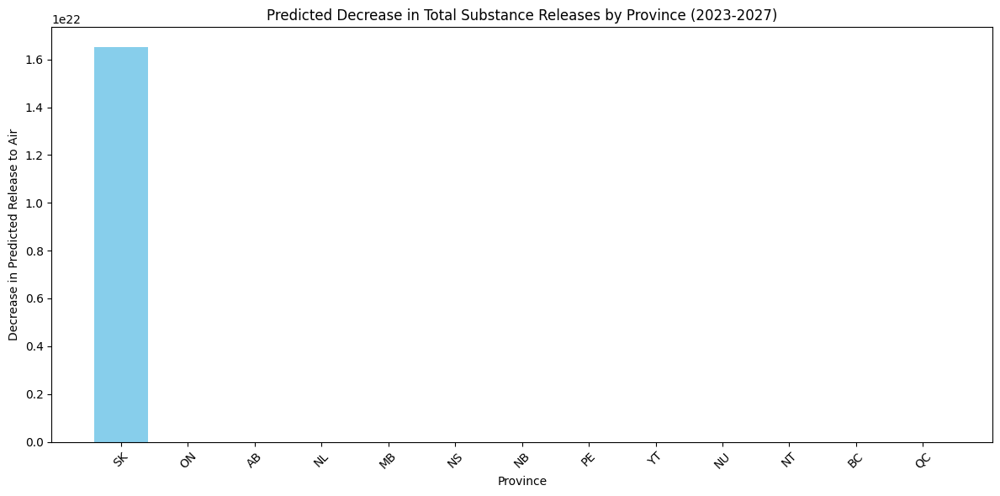

In [ ]:
# Calculate decreases for each province
decrease_analysis = total_predictions.pivot(index='Province', columns='Year', values='Predicted_Release_to_Air')
decrease_analysis['Decrease'] = decrease_analysis[2023] - decrease_analysis[2027]

# Sort by largest decrease
decrease_analysis = decrease_analysis.sort_values(by='Decrease', ascending=False).reset_index()

# Display the province with the largest decrease
largest_decrease_province = decrease_analysis.head(1)
print("\nProvince with the largest decrease:")
print(largest_decrease_province)

# Visualization
import matplotlib.pyplot as plt

# Bar chart for decreases
plt.figure(figsize=(12, 6))
plt.bar(decrease_analysis['Province'], decrease_analysis['Decrease'], color='skyblue')
plt.title("Predicted Decrease in Total Substance Releases by Province (2023-2027)")
plt.xlabel("Province")
plt.ylabel("Decrease in Predicted Release to Air")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [ ]:
# Calculate the total predicted release per province and year
total_predictions = combined_predictions.groupby(['Province', 'Year', 'Substance']).agg({
    'Predicted_Release_to_Air': 'sum'
}).reset_index()

# Analyze decreases for each substance
decrease_analysis_per_substance = {}
for substance_name in total_predictions['Substance'].unique():
    substance_predictions = total_predictions[total_predictions['Substance'] == substance_name]

    # Pivot to calculate decreases
    pivoted = substance_predictions.pivot(index='Province', columns='Year', values='Predicted_Release_to_Air')
    pivoted['Decrease'] = pivoted[2023] - pivoted[2027]
    pivoted = pivoted.reset_index()

    # Store the analysis for the substance
    decrease_analysis_per_substance[substance_name] = pivoted[['Province', 'Decrease']].sort_values(by='Decrease', ascending=False)


In [ ]:
# Assuming each DataFrame in decrease_analysis_per_substance has 'Province', 'Year', and 'Decrease'
merged_decrease_analysis = None

# Iteratively merge each substance's decrease analysis
for substance, df in decrease_analysis_per_substance.items():
    df = df.rename(columns={"Decrease": f"{substance}_Decrease"})  # Rename Decrease column for clarity
    if merged_decrease_analysis is None:
        merged_decrease_analysis = df
    else:
        # Merge only on 'Province' since 'Year' is not present in individual DataFrames
        merged_decrease_analysis = merged_decrease_analysis.merge(
            df, on=['Province'], how='outer'
        )

# Ensure all missing values are handled (optional)
merged_decrease_analysis = merged_decrease_analysis.fillna(0)

# Display the final merged DataFrame
print(merged_decrease_analysis)

Year Province  CO2_Decrease  NO2_Decrease  PM10_Decrease  PM2.5_Decrease  \
0          AB -6.721737e+07  2.483933e+10   1.758774e+06   -9.716871e+07   
1          BC -1.681953e+06 -3.146341e+06  -1.511863e+04   -1.607431e+05   
2          MB -6.105630e+01  6.790945e+05  -1.062574e+02   -6.860479e+03   
3          NB  9.440228e+02  4.709822e+01  -8.973266e+01    1.630074e+02   
4          NL -6.506415e+02  1.686558e+04  -5.134955e+04   -1.049383e+04   
5          NS  8.703850e+01  1.351505e+02   1.970246e+04    1.918099e+01   
6          NT -1.536880e+05  1.492024e+02  -9.444874e+03   -3.384528e-01   
7          NU -4.584679e+01 -3.676904e+04   1.038794e+03    1.732423e+02   
8          ON  1.449816e+06  2.956265e+05   1.760699e+11   -9.950642e+09   
9          PE  0.000000e+00 -3.628429e+00   9.471421e-02    9.405034e-02   
10         QC -5.519115e+09  3.451183e+06   1.080016e+07   -8.470302e+04   
11         SK -9.247929e+06 -6.902970e+03  -5.862150e+02   -1.050831e+03   
12         Y

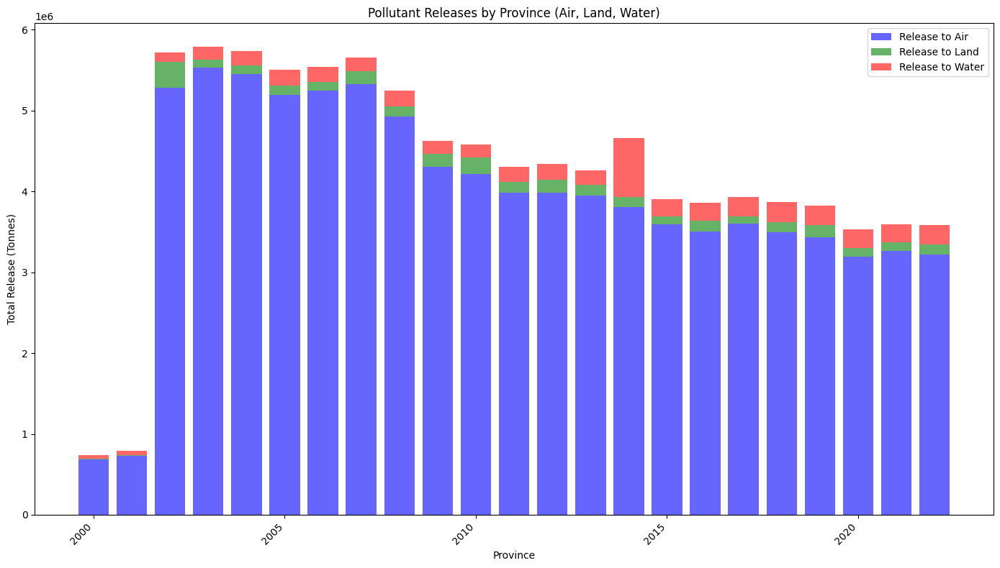

In [ ]:
import matplotlib.pyplot as plt

# Group data by province and sum the release types
province_release_summary = df_Release_2000_2022.groupby('Reporting_Year')[['Release_to_Air', 'Release_to_Land', 'Release_to_Water']].sum()

# Create a bar plot for each release type
plt.figure(figsize=(14, 8))

# Plot the trends for Air, Land, and Water for each province
plt.bar(province_release_summary.index, province_release_summary['Release_to_Air'], label='Release to Air', color='blue', alpha=0.6)
plt.bar(province_release_summary.index, province_release_summary['Release_to_Land'], label='Release to Land', color='green', alpha=0.6, bottom=province_release_summary['Release_to_Air'])
plt.bar(province_release_summary.index, province_release_summary['Release_to_Water'], label='Release to Water', color='red', alpha=0.6, bottom=province_release_summary['Release_to_Air'] + province_release_summary['Release_to_Land'])

# Add labels, title, and legend
plt.title('Pollutant Releases by Province (Air, Land, Water)')
plt.xlabel('Province')
plt.ylabel('Total Release (Tonnes)')
plt.xticks(rotation=45, ha='right')
plt.legend()
plt.tight_layout()

# Show the plot
plt.show()


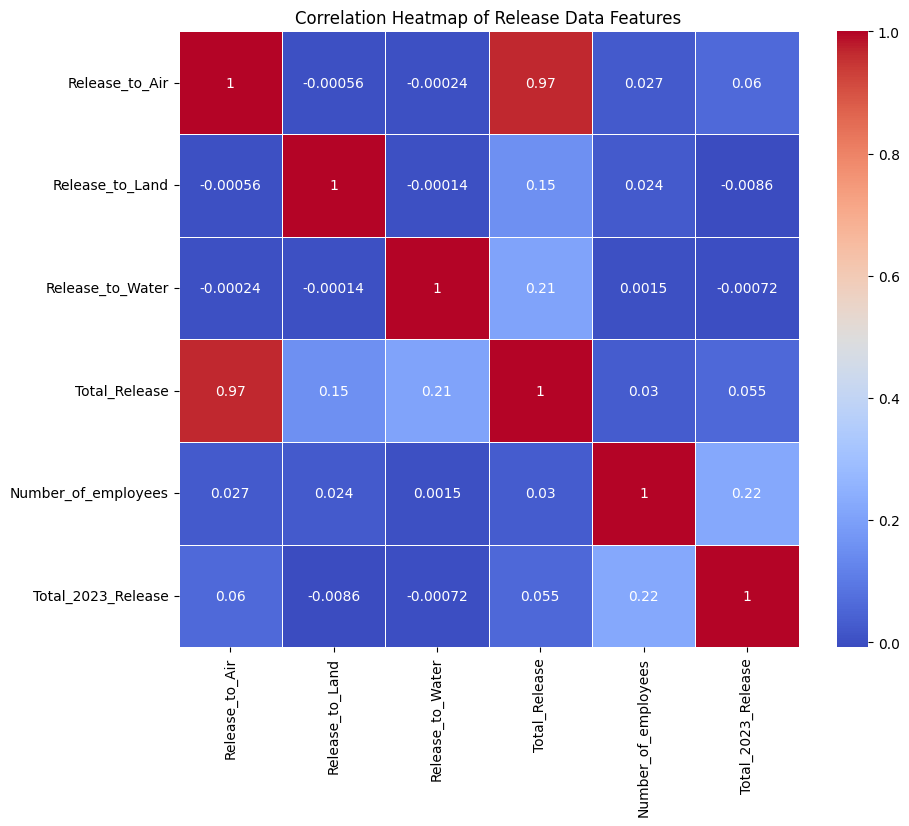

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Select the relevant numerical columns for correlation analysis
correlation_columns = [
    'Release_to_Air',
    'Release_to_Land',
    'Release_to_Water',
    'Total_Release',
    'Number_of_employees',
    'Total_2023_Release'
]

# Create a new DataFrame with the selected columns
numerical_df = merged_data[correlation_columns]

# Calculate the correlation matrix
correlation_matrix = numerical_df.corr()

# Plot the correlation heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=.5)
plt.title('Correlation Heatmap of Release Data Features')
plt.show()


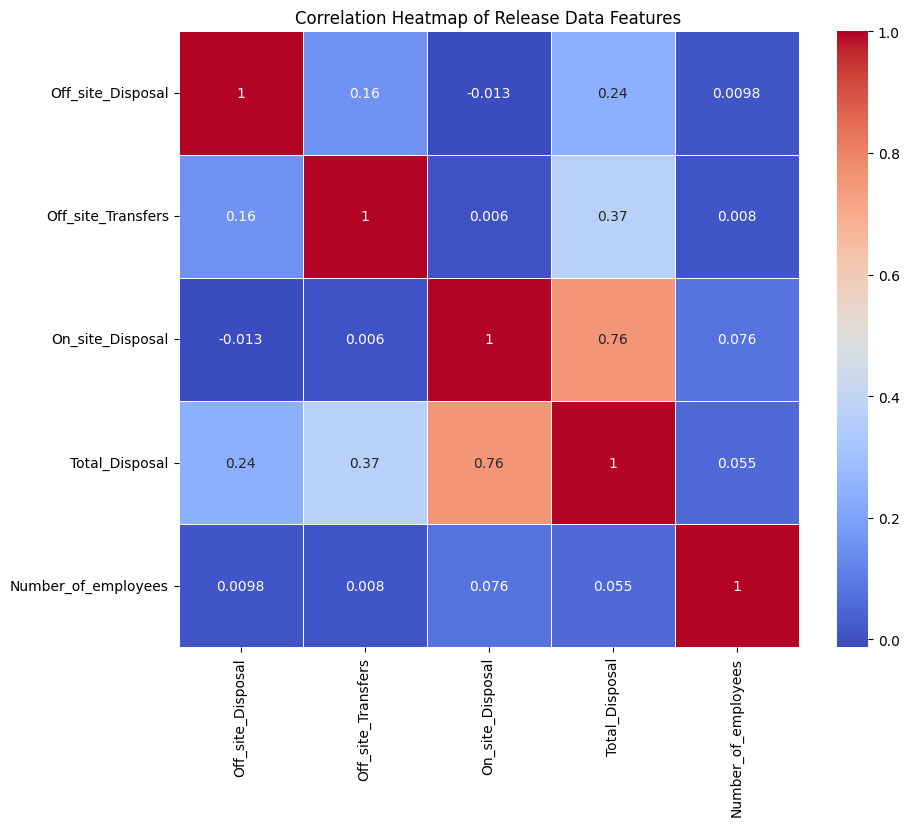

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Select the relevant numerical columns for correlation analysis
correlation_Disposal_columns = [
    'Off_site_Disposal',
    'Off_site_Transfers',
    'On_site_Disposal',
    'Total_Disposal',
    'Number_of_employees'
]

# Create a new DataFrame with the selected columns
numerical_Disposal_df = df_Disposals_2000_2022[correlation_Disposal_columns]

# Calculate the correlation matrix
correlation_matrix = numerical_Disposal_df.corr()

# Plot the correlation heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=.5)
plt.title('Correlation Heatmap of Release Data Features')
plt.show()


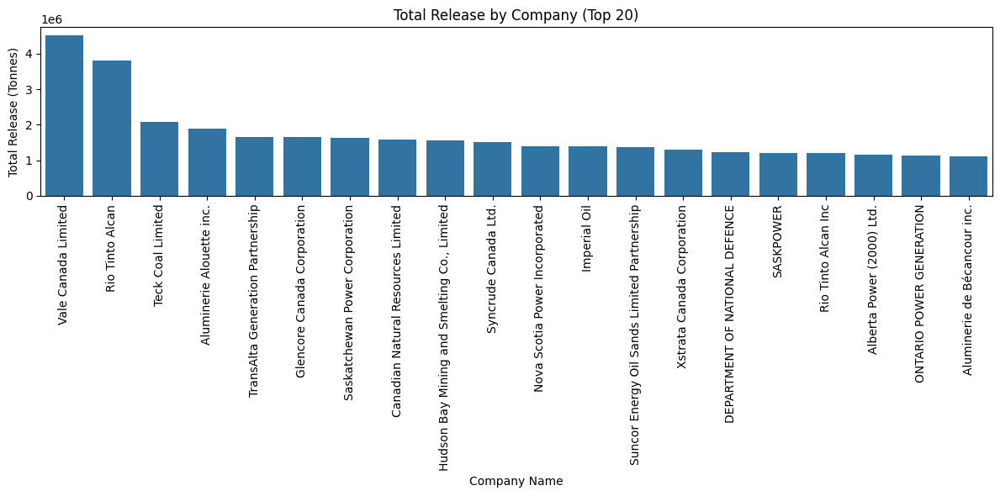

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Aggregate release data by company
company_release = merged_data.groupby('Company_Name')['Total_Release'].sum().reset_index()

# 2. Sort by total release for better visualization
company_release = company_release.sort_values(by=['Total_Release'], ascending=False)

# 3. Select top N companies for plotting (optional)
top_n = 20  # Change this to the desired number of companies
company_release_top = company_release.head(top_n)

# 4. Create the plot using Seaborn
plt.figure(figsize=(12, 6))  # Adjust figure size as needed
sns.barplot(x='Company_Name', y='Total_Release', data=company_release_top)
plt.xticks(rotation=90)  # Rotate x-axis labels for readability
plt.title('Total Release by Company (Top {})'.format(top_n))
plt.xlabel('Company Name')
plt.ylabel('Total Release (Tonnes)')
plt.tight_layout()
plt.show()

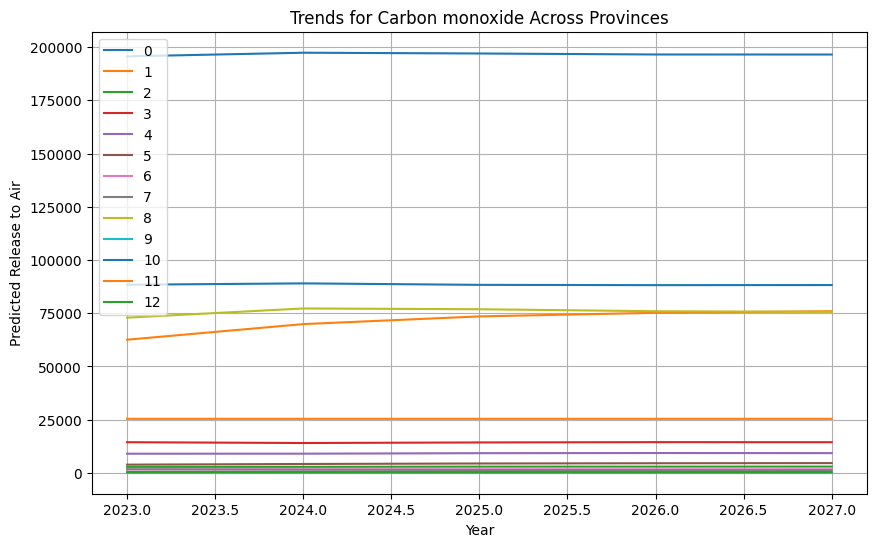

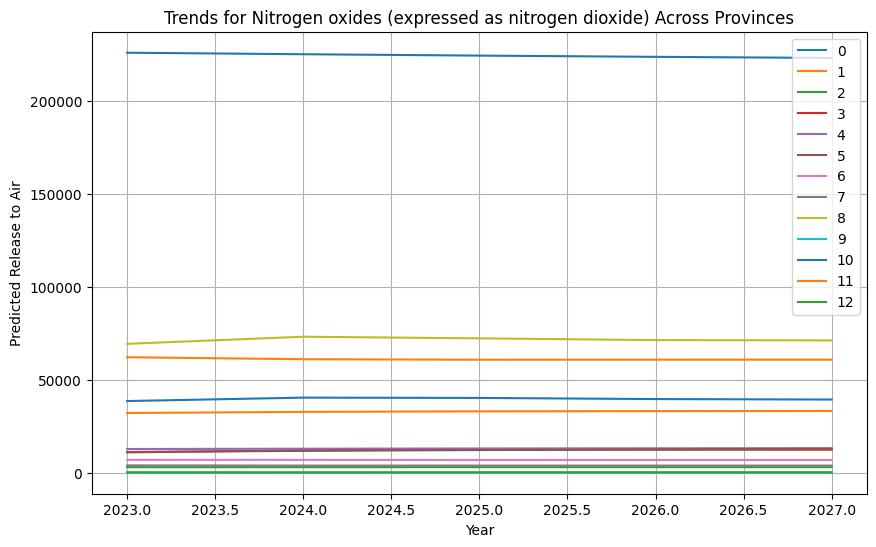

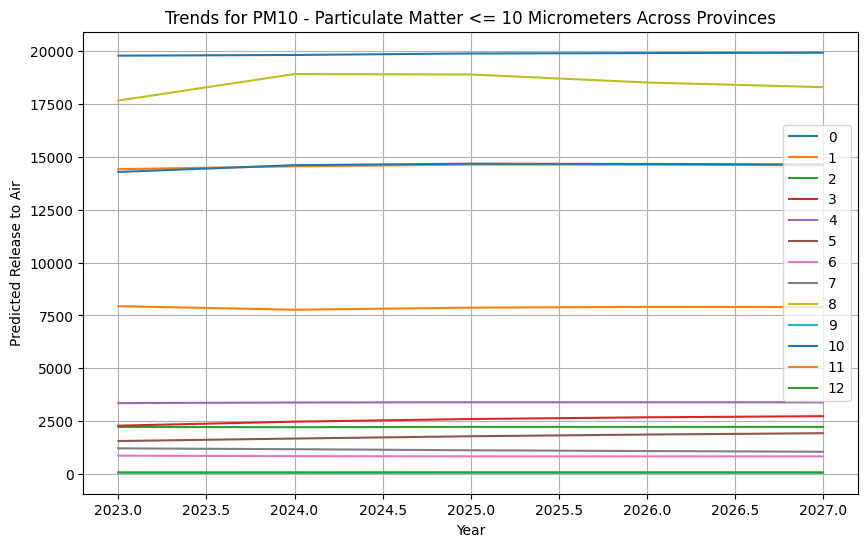

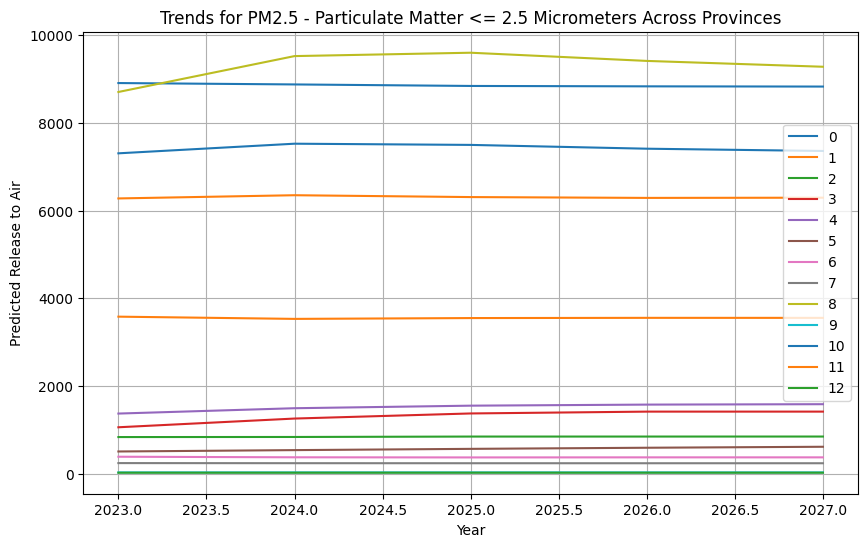

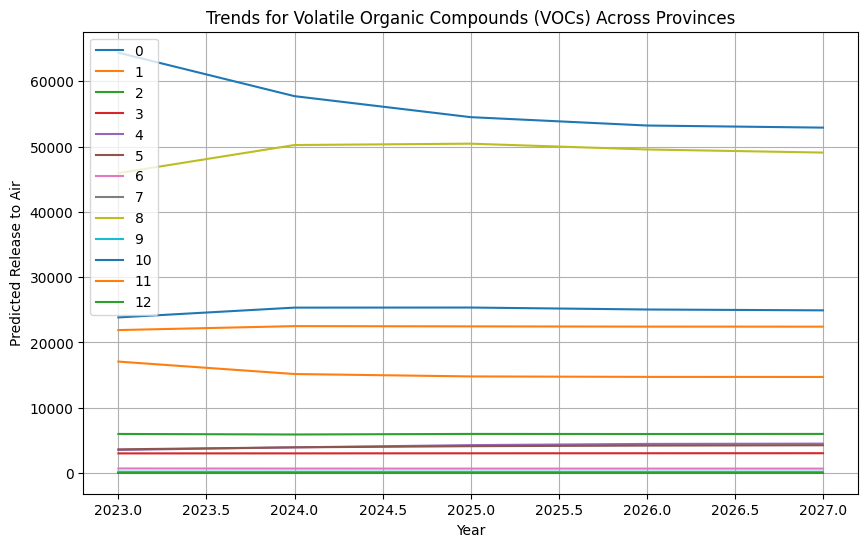

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# `combined_predictions` contains the merged predictions with columns: Province, Year, Substance, Predicted_Release_to_Air

# Analyze Trends for Each Substance Across Provinces
def analyze_trends(combined_predictions):
    trends = combined_predictions.groupby(['Province', 'Substance', 'Year'])['Predicted_Release_to_Air'].sum().reset_index()

    # Plot trends for each substance across provinces
    substances = trends['Substance'].unique()
    for substance in substances:
        plt.figure(figsize=(10, 6))
        substance_data = trends[trends['Substance'] == substance]
        for province in substance_data['Province'].unique():
            province_data = substance_data[substance_data['Province'] == province]
            plt.plot(province_data['Year'], province_data['Predicted_Release_to_Air'], label=province)

        plt.title(f"Trends for {substance} Across Provinces")
        plt.xlabel("Year")
        plt.ylabel("Predicted Release to Air")
        plt.legend()
        plt.grid(True)
        plt.show()
analyze_trends(combined_predictions)



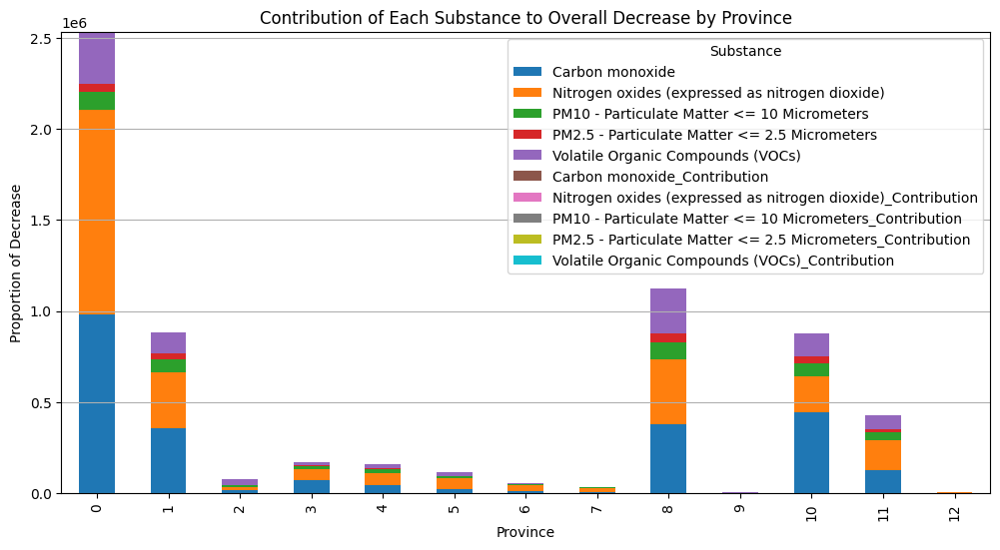

In [ ]:
# Step 2: Compare Substances at the Provincial Level
def compare_substances(combined_predictions):
    # Calculate total decrease for each substance by province
    predictions_grouped = combined_predictions.groupby(['Province', 'Substance'])['Predicted_Release_to_Air'].sum().reset_index()
    decrease_summary = predictions_grouped.pivot(index='Province', columns='Substance', values='Predicted_Release_to_Air')

    # Normalize the decreases to understand contributions
    decrease_summary['Total_Decrease'] = decrease_summary.sum(axis=1)
    for substance in decrease_summary.columns[:-1]:  # Exclude 'Total_Decrease'
        decrease_summary[f"{substance}_Contribution"] = decrease_summary[substance] / decrease_summary['Total_Decrease']

    # Visualize contributions using a stacked bar chart
    decrease_summary.drop('Total_Decrease', axis=1).plot(kind='bar', stacked=True, figsize=(12, 6))
    plt.title("Contribution of Each Substance to Overall Decrease by Province")
    plt.ylabel("Proportion of Decrease")
    plt.xlabel("Province")
    plt.legend(title="Substance")
    plt.grid(axis='y')
    plt.show()
compare_substances(combined_predictions)


In [ ]:
# Highlight Key Provinces for Each Substance
def highlight_key_provinces(combined_predictions):
    key_provinces = combined_predictions.groupby(['Substance', 'Province'])['Predicted_Release_to_Air'].sum().reset_index()
    key_provinces = key_provinces.sort_values(by=['Substance', 'Predicted_Release_to_Air'], ascending=False)

    # Display top 3 provinces for each substance
    top_provinces = key_provinces.groupby('Substance').head(3)
    print("Top 3 Provinces for Each Substance:")
    print(top_provinces)
    return top_provinces

top_provinces = highlight_key_provinces(combined_predictions)


Top 3 Provinces for Each Substance:
                                          Substance  Province  \
52                Volatile Organic Compounds (VOCs)         0   
60                Volatile Organic Compounds (VOCs)         8   
62                Volatile Organic Compounds (VOCs)        10   
47    PM2.5 - Particulate Matter <= 2.5 Micrometers         8   
39    PM2.5 - Particulate Matter <= 2.5 Micrometers         0   
49    PM2.5 - Particulate Matter <= 2.5 Micrometers        10   
26      PM10 - Particulate Matter <= 10 Micrometers         0   
34      PM10 - Particulate Matter <= 10 Micrometers         8   
36      PM10 - Particulate Matter <= 10 Micrometers        10   
13  Nitrogen oxides (expressed as nitrogen dioxide)         0   
21  Nitrogen oxides (expressed as nitrogen dioxide)         8   
14  Nitrogen oxides (expressed as nitrogen dioxide)         1   
0                                   Carbon monoxide         0   
10                                  Carbon monoxide   

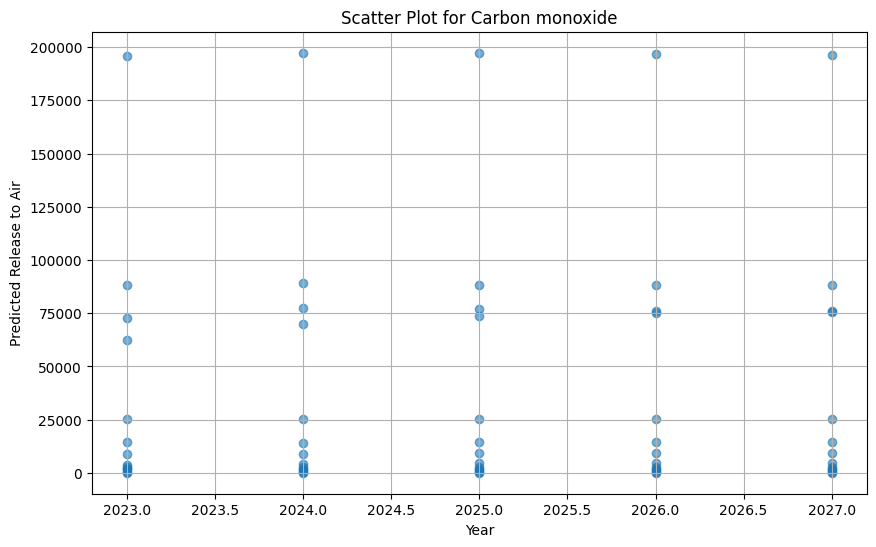

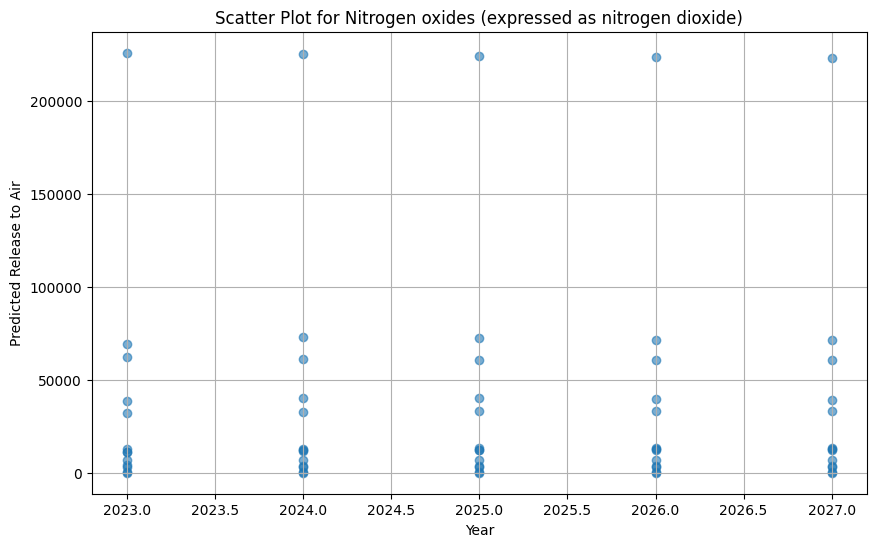

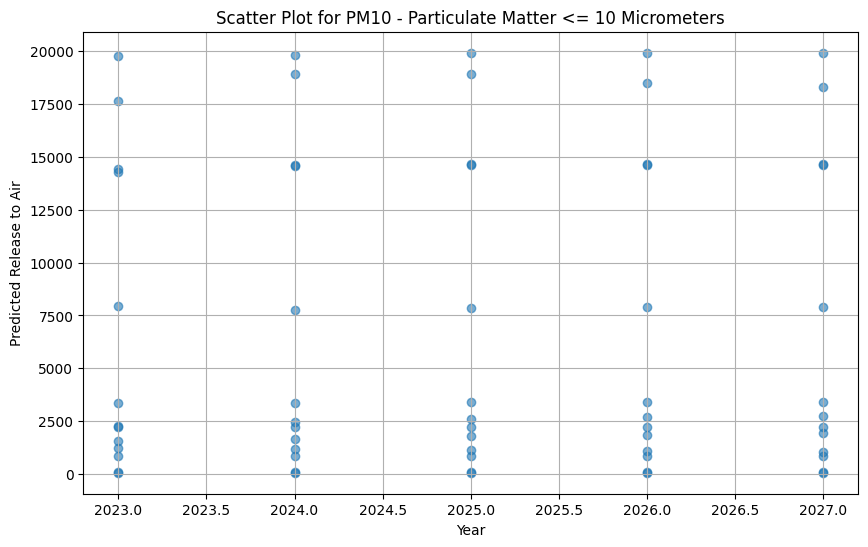

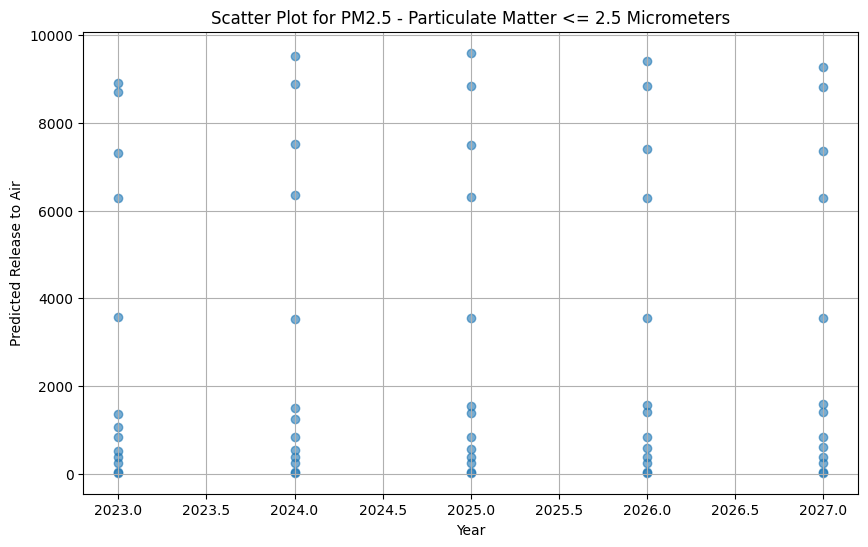

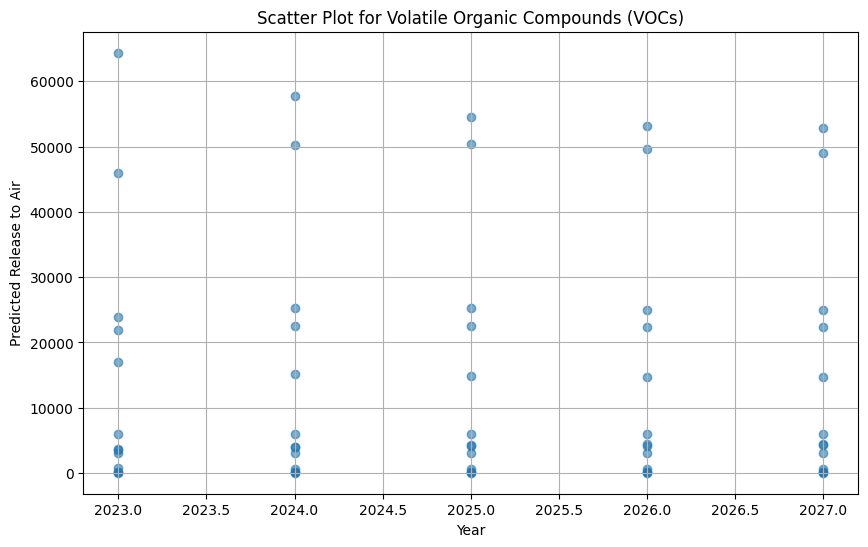

In [ ]:

# Investigate Outliers or Unexpected Trends
def investigate_outliers(combined_predictions):
    # Scatter plot for each substance to identify anomalies
    substances = combined_predictions['Substance'].unique()
    for substance in substances:
        plt.figure(figsize=(10, 6))
        substance_data = combined_predictions[combined_predictions['Substance'] == substance]
        plt.scatter(substance_data['Year'], substance_data['Predicted_Release_to_Air'], alpha=0.6)
        plt.title(f"Scatter Plot for {substance}")
        plt.xlabel("Year")
        plt.ylabel("Predicted Release to Air")
        plt.grid(True)
        plt.show()


investigate_outliers(combined_predictions)



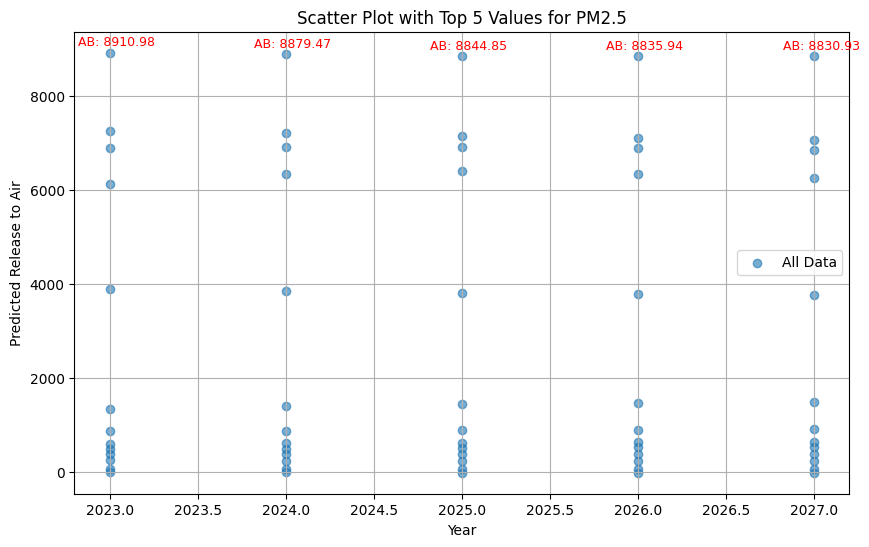

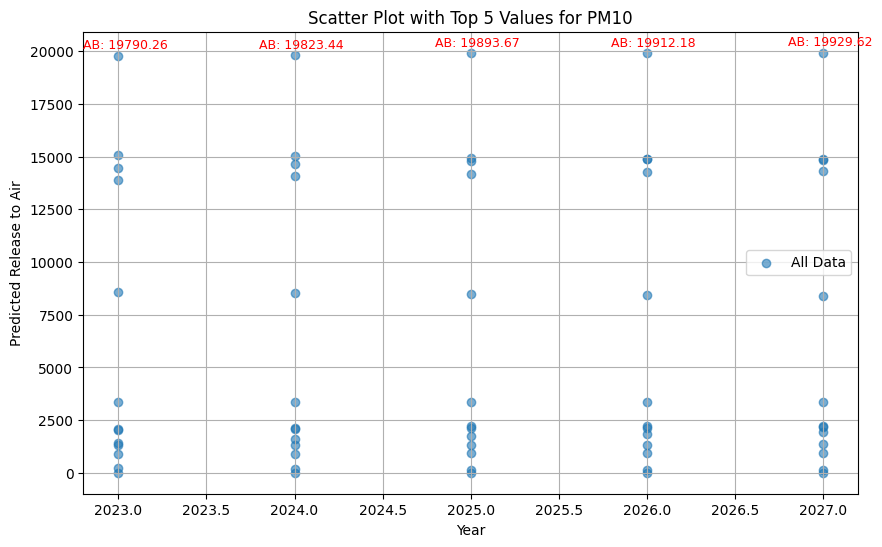

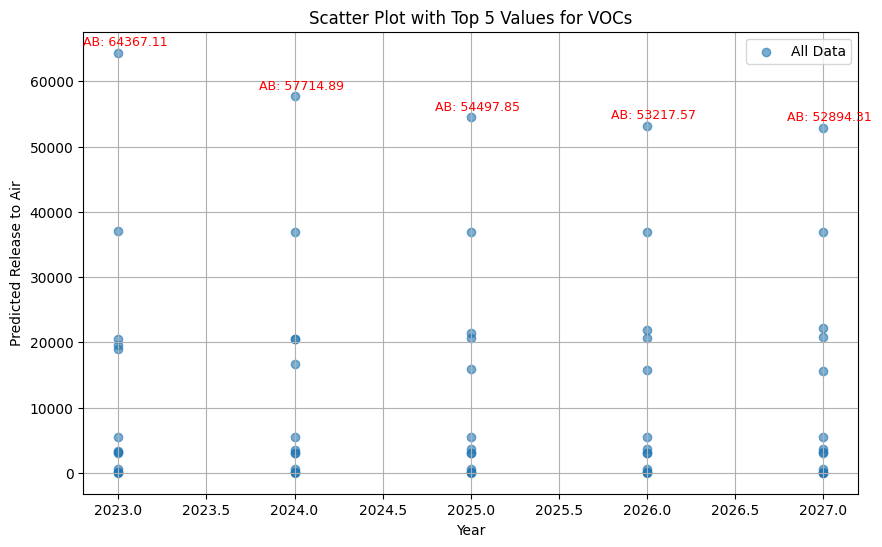

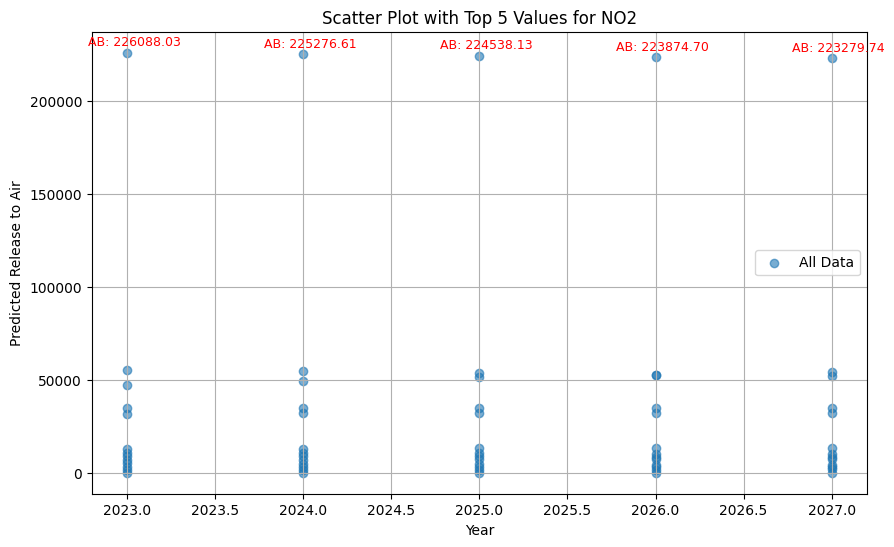

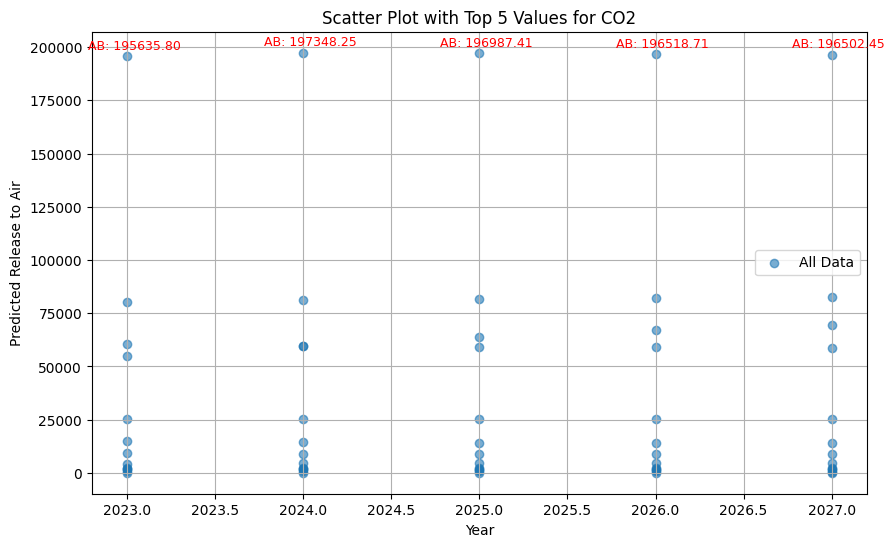

Detailed Outlier Analysis Summary:
  Substance          Mean            Max       Std Dev
0     PM2.5   2860.288517    8910.980143   3170.107005
1      PM10   6459.344074   19929.618962   6797.754717
2      VOCs  12928.727701   64367.105474  16819.768361
3       NO2  34227.234767  226088.026852  58233.948625
4       CO2  35374.916289  197348.253888  54132.214996

Top 5 Predicted Values for Each Substance:
   Substance Province  Year  Predicted_Release_to_Air
0      PM2.5       AB  2023               8910.980143
1      PM2.5       AB  2024               8879.467693
2      PM2.5       AB  2025               8844.853112
3      PM2.5       AB  2026               8835.938592
4      PM2.5       AB  2027               8830.928082
5       PM10       AB  2027              19929.618962
6       PM10       AB  2026              19912.175401
7       PM10       AB  2025              19893.670245
8       PM10       AB  2024              19823.437438
9       PM10       AB  2023              19790.2558

In [ ]:
import seaborn as sns
import numpy as np

# Enhanced Investigation of Outliers
def investigate_outliers_with_details(combined_predictions):
    # Summary table for key statistics and top 5 values
    detailed_summary = []

    substances = combined_predictions['Substance'].unique()
    for substance in substances:
        substance_data = combined_predictions[combined_predictions['Substance'] == substance]

        # Calculate key statistics
        mean_val = substance_data['Predicted_Release_to_Air'].mean()
        max_val = substance_data['Predicted_Release_to_Air'].max()
        std_dev = substance_data['Predicted_Release_to_Air'].std()

        # Identify top 5 highest predicted values
        top_values = substance_data.nlargest(5, 'Predicted_Release_to_Air')
        detailed_summary.append({
            'Substance': substance,
            'Mean': mean_val,
            'Max': max_val,
            'Std Dev': std_dev,
            'Top 5 Values': top_values[['Province', 'Year', 'Predicted_Release_to_Air']].to_dict('records')
        })

        # Scatter plot with annotations for top 5 values
        plt.figure(figsize=(10, 6))
        plt.scatter(substance_data['Year'], substance_data['Predicted_Release_to_Air'], alpha=0.6, label='All Data')
        for _, row in top_values.iterrows():
            plt.annotate(f"{row['Province']}: {row['Predicted_Release_to_Air']:.2f}",
                         (row['Year'], row['Predicted_Release_to_Air']),
                         textcoords="offset points", xytext=(5,5), ha='center', fontsize=9, color='red')
        plt.title(f"Scatter Plot with Top 5 Values for {substance}")
        plt.xlabel("Year")
        plt.ylabel("Predicted Release to Air")
        plt.grid(True)
        plt.legend()
        plt.show()

    # Convert detailed summary to a DataFrame for display
    detailed_summary_df = pd.DataFrame(detailed_summary)

    # Display the summary table
    print("Detailed Outlier Analysis Summary:")
    print(detailed_summary_df[['Substance', 'Mean', 'Max', 'Std Dev']])

    # Optionally, save top 5 detailed records as a table
    top_values_summary = []
    for record in detailed_summary:
        for value in record['Top 5 Values']:
            top_values_summary.append({
                'Substance': record['Substance'],
                'Province': value['Province'],
                'Year': value['Year'],
                'Predicted_Release_to_Air': value['Predicted_Release_to_Air']
            })
    top_values_df = pd.DataFrame(top_values_summary)
    print("\nTop 5 Predicted Values for Each Substance:")
    print(top_values_df)
    return top_values_df

# Run the enhanced outlier investigation
top_values_df = investigate_outliers_with_details(combined_predictions)


In [ ]:
# Summary Recommendations
def summarize_findings(combined_predictions):
    summary = combined_predictions.groupby(['Substance', 'Province'])['Predicted_Release_to_Air'].sum().reset_index()
    summary['Rank'] = summary.groupby('Substance')['Predicted_Release_to_Air'].rank(ascending=True)
    print("Summary of Key Findings:")
    print(summary.sort_values(by=['Substance', 'Rank']))

# Run the analysis
summarize_findings(combined_predictions)

Summary of Key Findings:
                            Substance  Province  Predicted_Release_to_Air  \
9                     Carbon monoxide         9                296.982602   
12                    Carbon monoxide        12               1970.833404   
7                     Carbon monoxide         7               7042.238130   
6                     Carbon monoxide         6               8313.783974   
2                     Carbon monoxide         2              14409.805240   
..                                ...       ...                       ...   
63  Volatile Organic Compounds (VOCs)        11              76423.553224   
53  Volatile Organic Compounds (VOCs)         1             111650.842874   
62  Volatile Organic Compounds (VOCs)        10             124431.504166   
60  Volatile Organic Compounds (VOCs)         8             245216.985355   
52  Volatile Organic Compounds (VOCs)         0             282691.733459   

    Rank  
9    1.0  
12   2.0  
7    3.0  
6    4


# Policy Recommendations for AB:

Alberta may require stricter environmental regulations, investments in clean technologies, and targeted reductions in emissions.
Acknowledging Low Emitters like PE:

While PE contributes less overall, maintaining low emissions is vital for sustainability.

# Emission Summary Table

In [ ]:
print(combined_predictions.head())

   Year  Province        Substance  Predicted_Release_to_Air
0  2023         0  Carbon monoxide             195635.796403
1  2024         0  Carbon monoxide             197348.253888
2  2025         0  Carbon monoxide             196987.414863
3  2026         0  Carbon monoxide             196518.711615
4  2027         0  Carbon monoxide             196502.445908


In [ ]:
# Filter combined_predictions for the year 2024
predictions_2024 = combined_predictions[combined_predictions['Year'] == 2024]

# Summarize emissions by province and substance for the year 2024
emission_summary_2024 = predictions_2024.groupby(['Province', 'Substance'])['Predicted_Release_to_Air'].sum().reset_index()

# Calculate percentage contribution for the year 2024
total_emissions_2024 = emission_summary_2024['Predicted_Release_to_Air'].sum()
emission_summary_2024['Percentage_Contribution'] = (emission_summary_2024['Predicted_Release_to_Air'] / total_emissions_2024) * 100

# Display the summary table for 2024
print("Emission Summary Table for 2024:")
print(emission_summary_2024.head)


Emission Summary Table for 2024:
<bound method NDFrame.head of    Province Substance  Predicted_Release_to_Air  Percentage_Contribution
0        AB       CO2             197348.253888                16.555034
1        AB       NO2             225276.611371                18.897871
2        AB      PM10              19823.437438                 1.662937
3        AB     PM2.5               8879.467693                 0.744876
4        AB      VOCs              57714.892106                 4.841553
..      ...       ...                       ...                      ...
60       YT       CO2                764.540367                 0.064135
61       YT       NO2               1521.508137                 0.127635
62       YT      PM10                172.470707                 0.014468
63       YT     PM2.5                 72.962381                 0.006121
64       YT      VOCs                 36.366972                 0.003051

[65 rows x 4 columns]>


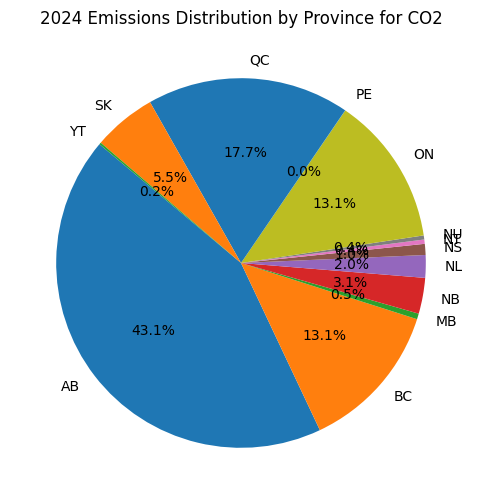

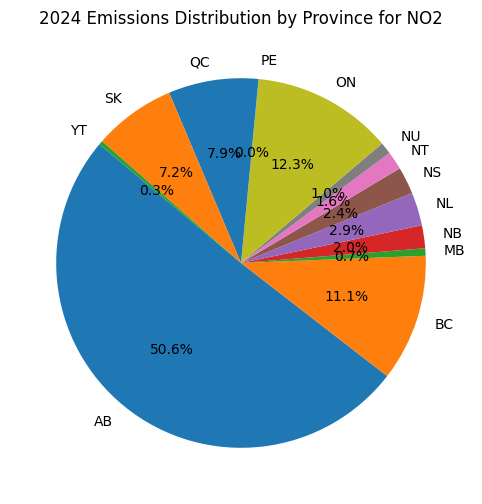

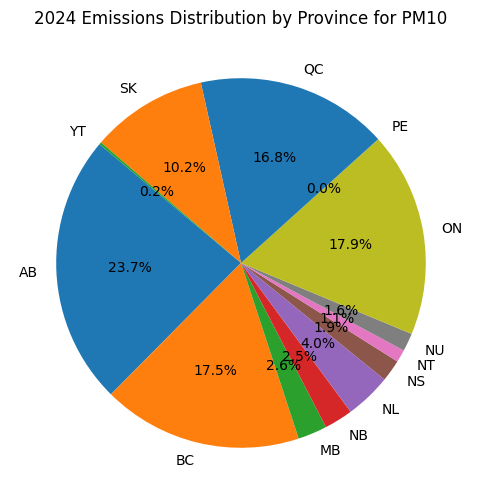

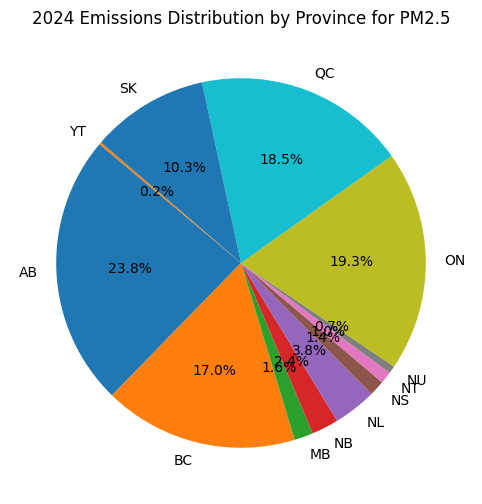

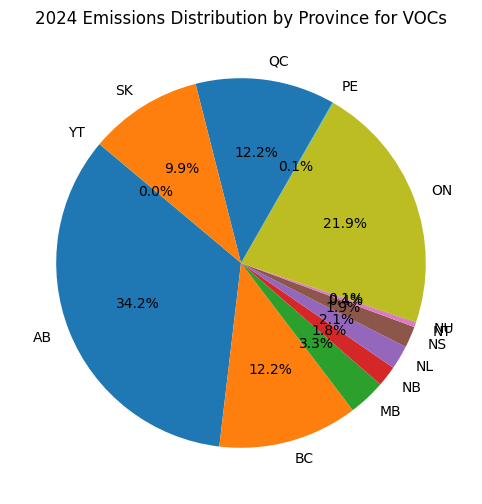

In [ ]:
import matplotlib.pyplot as plt

# Create a pie chart for each substance's emissions for the year 2024
substances = emission_summary_2024['Substance'].unique()

for substance in substances:
    substance_data = emission_summary_2024[emission_summary_2024['Substance'] == substance]

    # Filter out negative values before creating the pie chart
    substance_data = substance_data[substance_data['Predicted_Release_to_Air'] >= 0]

    if not substance_data.empty:  # Check if there's data left after filtering
        plt.figure(figsize=(8, 6))
        plt.pie(
            substance_data['Predicted_Release_to_Air'],
            labels=substance_data['Province'],
            autopct='%1.1f%%',
            startangle=140
        )
        plt.title(f"2024 Emissions Distribution by Province for {substance}")
        plt.show()
    else:
        print(f"No positive emission data for {substance} in 2024. Skipping pie chart.")

In [ ]:
# Summarize emissions by province and substance
emission_summary = combined_predictions.groupby(['Province', 'Substance'])['Predicted_Release_to_Air'].sum().reset_index()

# Calculate percentage contribution
total_emissions = emission_summary['Predicted_Release_to_Air'].sum()
emission_summary['Percentage_Contribution'] = (emission_summary['Predicted_Release_to_Air'] / total_emissions) * 100

# Display the summary table
print("Emission Summary Table:")
print(emission_summary)


Emission Summary Table:
   Province Substance  Predicted_Release_to_Air  Percentage_Contribution
0        AB       CO2              9.829926e+05                16.464757
1        AB       NO2              1.123057e+06                18.810786
2        AB      PM10              9.934916e+04                 1.664061
3        AB     PM2.5              4.430217e+04                 0.742045
4        AB      VOCs              2.826917e+05                 4.734980
..      ...       ...                       ...                      ...
60       YT       CO2              3.577394e+03                 0.059920
61       YT       NO2              7.984193e+03                 0.133732
62       YT      PM10              7.927374e+02                 0.013278
63       YT     PM2.5              3.553764e+02                 0.005952
64       YT      VOCs              1.813866e+02                 0.003038

[65 rows x 4 columns]


In [ ]:
# Predict for 2023 to 2027 and classify predictions into Low, Medium, High levels.

# Filter combined_predictions for years 2023 to 2027
future_predictions = combined_predictions[combined_predictions['Year'].between(2023, 2027)]

# Calculate thresholds for Low, Medium, High based on quantiles
low_threshold = future_predictions['Predicted_Release_to_Air'].quantile(0.33)
high_threshold = future_predictions['Predicted_Release_to_Air'].quantile(0.66)

# Add a classification column
def classify_release(value):
    if value <= low_threshold:
        return "Low"
    elif value <= high_threshold:
        return "Medium"
    else:
        return "High"

future_predictions['Prediction_Level'] = future_predictions['Predicted_Release_to_Air'].apply(classify_release)

# Summarize the classification
classification_summary = future_predictions.groupby(['Substance', 'Year', 'Prediction_Level']).size().reset_index(name='Count')

# Display the updated DataFrame and summary
print("Future Predictions with Classification:")
print(future_predictions)
print("\nClassification Summary:")
print(classification_summary)


Future Predictions with Classification:
     Year Province Substance  Predicted_Release_to_Air Prediction_Level
0    2023       AB     PM2.5               8910.980143           Medium
1    2024       AB     PM2.5               8879.467693           Medium
2    2025       AB     PM2.5               8844.853112           Medium
3    2026       AB     PM2.5               8835.938592           Medium
4    2027       AB     PM2.5               8830.928082           Medium
..    ...      ...       ...                       ...              ...
320  2023       YT       CO2                819.520118              Low
321  2024       YT       CO2                764.540367              Low
322  2025       YT       CO2                710.223141              Low
323  2026       YT       CO2                662.135605              Low
324  2027       YT       CO2                620.974461              Low

[325 rows x 5 columns]

Classification Summary:
   Substance  Year Prediction_Level  Count
0   

# Encoding Prediction_Level

In [ ]:
from sklearn.preprocessing import LabelEncoder

# Initialize LabelEncoder
encoder = LabelEncoder()

# Encode the Prediction_Level column
future_predictions['Prediction_Level_Encoded'] = encoder.fit_transform(future_predictions['Prediction_Level'])

# Display the adjusted DataFrame with the new encoding
print("Future Predictions with Label Encoding:")
print(future_predictions[['Year', 'Province', 'Substance', 'Predicted_Release_to_Air', 'Prediction_Level', 'Prediction_Level_Encoded']])

# Summarize the classification with adjusted encoding
classification_summary = future_predictions.groupby(['Substance', 'Year', 'Prediction_Level', 'Prediction_Level_Encoded']).size().reset_index(name='Count')

# Display the adjusted classification summary
print("\nAdjusted Classification Summary:")
print(classification_summary)


Future Predictions with Label Encoding:
     Year Province Substance  Predicted_Release_to_Air Prediction_Level  \
0    2023       AB     PM2.5               8910.980143           Medium   
1    2024       AB     PM2.5               8879.467693           Medium   
2    2025       AB     PM2.5               8844.853112           Medium   
3    2026       AB     PM2.5               8835.938592           Medium   
4    2027       AB     PM2.5               8830.928082           Medium   
..    ...      ...       ...                       ...              ...   
320  2023       YT       CO2                819.520118              Low   
321  2024       YT       CO2                764.540367              Low   
322  2025       YT       CO2                710.223141              Low   
323  2026       YT       CO2                662.135605              Low   
324  2027       YT       CO2                620.974461              Low   

     Prediction_Level_Encoded  
0                          

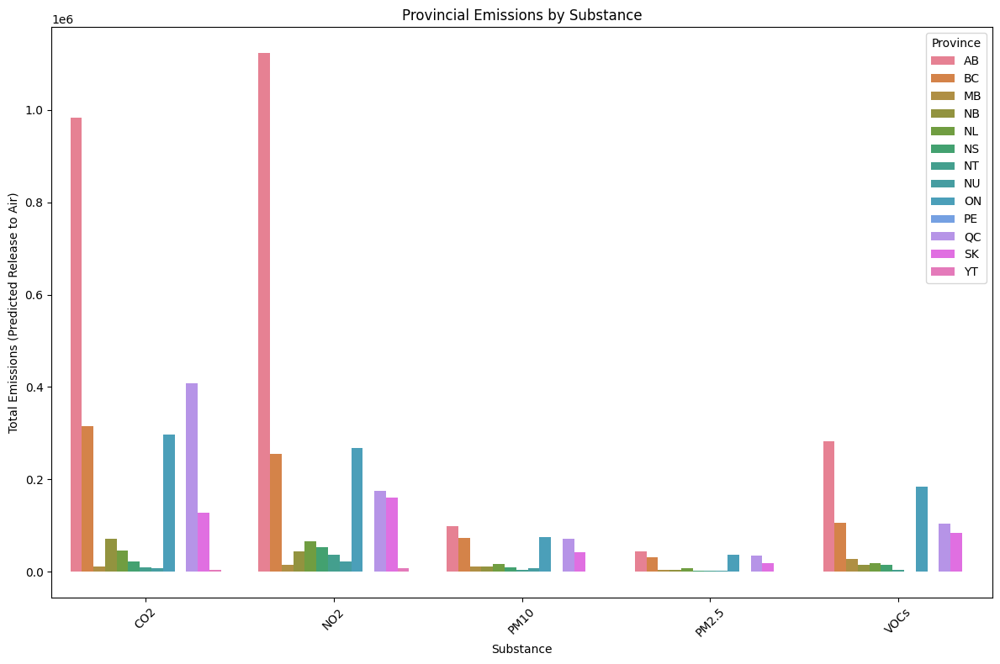

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12, 8))
sns.barplot(
    data=emission_summary,
    x='Substance',
    y='Predicted_Release_to_Air',
    hue='Province'
)
plt.title("Provincial Emissions by Substance")
plt.xlabel("Substance")
plt.ylabel("Total Emissions (Predicted Release to Air)")
plt.legend(title="Province")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


# Applying Normalization for Outlier
- Using Normalization 'MinMaxScaler to see the different with above strategy


In [ ]:
from sklearn.preprocessing import MinMaxScaler
import seaborn as sns
import matplotlib.pyplot as plt

# Define a dictionary for easy access to substances and their data
substances = {
    "PM2.5": PM25_df,
    "PM10": PM10_df,
    "VOCs": VOCs_df,
    "NO2": NO2_df,
    "CO2": CO2_df
}

# Function to normalize data
def normalize_column(data, column_name):
    scaler = MinMaxScaler()
    data[column_name] = scaler.fit_transform(data[[column_name]])
    return data



In [ ]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np

def evaluate_model(y_true, y_pred):
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_true, y_pred)
    return {"MAE": mae, "MSE": mse, "RMSE": rmse, "R^2": r2}
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
import xgboost as xgb
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import train_test_split

# Verify and fix substance DataFrame columns
def verify_substance_data(substance_data):
    required_columns = ['Province', 'Reporting_Year', 'Release_to_Air']
    for column in required_columns:
        if column not in substance_data.columns:
            print(f"Column '{column}' is missing in the DataFrame. Adding placeholder values.")
            if column == 'Province':
                substance_data[column] = 'Unknown'
            elif column == 'Reporting_Year':
                substance_data[column] = 2000  # Replace with a sensible default year
            elif column == 'Release_to_Air':
                substance_data[column] = 0.0  # Default release value
    return substance_data

# Apply the fix for each substance
top_substances = {
    "PM2.5": verify_substance_data(PM25_df),
    "PM10": verify_substance_data(PM10_df),
    "VOCs": verify_substance_data(VOCs_df),
    "NO2": verify_substance_data(NO2_df),
    "CO2": verify_substance_data(CO2_df),
}

# Rerun the model evaluation code
all_results_1 = {}

for substance_name, substance_data in top_substances.items():
    print(f"Processing substance: {substance_name}")

    # Aggregate data by Province and Year
    substance_aggregated = substance_data.groupby(['Province', 'Reporting_Year']).agg({
        'Release_to_Air': 'sum',
    }).reset_index()

    # Prepare lagged features
    substance_aggregated['lag_1'] = substance_aggregated['Release_to_Air'].shift(1)
    substance_aggregated['lag_2'] = substance_aggregated['Release_to_Air'].shift(2)
    substance_aggregated = substance_aggregated.dropna()

    # Define features and target
    X = substance_aggregated[['lag_1', 'lag_2']]
    y = substance_aggregated['Release_to_Air']

    # Split into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Initialize models
    models = {
        "Linear Regression": LinearRegression(),
        "Decision Tree": DecisionTreeRegressor(random_state=42),
        "Random Forest": RandomForestRegressor(n_estimators=100, random_state=42),
        "XGBoost": xgb.XGBRegressor(objective="reg:squarederror", n_estimators=100),
        "KNN": KNeighborsRegressor(n_neighbors=5)
    }

    # Train and evaluate each model
    results_1 = {}
    for model_name, model in models.items():
        # Train the model
        model.fit(X_train, y_train)

        # Predict on the test set
        y_pred = model.predict(X_test)

        # Evaluate the model
        results_1[model_name] = evaluate_model(y_test, y_pred)

    # Store the results for the current substance
    all_results_1[substance_name] = pd.DataFrame(results_1).T

# Combine all results into one DataFrame
final_results_df1 = pd.concat(all_results_1, names=["Substance", "Model"])

# Display the results
print(final_results_df1)


Processing substance: PM2.5


<ipython-input-93-b27c29ba4fb3>:49: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  substance_aggregated = substance_data.groupby(['Province', 'Reporting_Year']).agg({


Processing substance: PM10


<ipython-input-93-b27c29ba4fb3>:49: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  substance_aggregated = substance_data.groupby(['Province', 'Reporting_Year']).agg({


Processing substance: VOCs


<ipython-input-93-b27c29ba4fb3>:49: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  substance_aggregated = substance_data.groupby(['Province', 'Reporting_Year']).agg({


Processing substance: NO2


<ipython-input-93-b27c29ba4fb3>:49: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  substance_aggregated = substance_data.groupby(['Province', 'Reporting_Year']).agg({


Processing substance: CO2


<ipython-input-93-b27c29ba4fb3>:49: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  substance_aggregated = substance_data.groupby(['Province', 'Reporting_Year']).agg({


                                      MAE           MSE          RMSE  \
Substance Model                                                         
PM2.5     Linear Regression    554.376605  1.429596e+06   1195.657346   
          Decision Tree        812.239537  4.707246e+06   2169.618857   
          Random Forest        657.357044  2.189471e+06   1479.686098   
          XGBoost              647.957764  2.186714e+06   1478.754237   
          KNN                  761.990062  2.331440e+06   1526.905510   
PM10      Linear Regression   1293.400053  7.621080e+06   2760.630398   
          Decision Tree       1666.266675  1.237944e+07   3518.442660   
          Random Forest       1440.824849  7.538758e+06   2745.679838   
          XGBoost             1452.733651  7.986697e+06   2826.074482   
          KNN                 1403.194582  7.518994e+06   2742.078425   
VOCs      Linear Regression   3129.075552  5.882972e+07   7670.053237   
          Decision Tree       2863.734816  6.656087

Hyperparameter grids for tuning

In [ ]:
from sklearn.model_selection import GridSearchCV
import pandas as pd
import numpy as np

# Define a function for evaluation metrics
def evaluate_model(y_true, y_pred):
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_true, y_pred)
    return {"MAE": mae, "MSE": mse, "RMSE": rmse, "R^2": r2}

# Hyperparameter grids for tuning
param_grids = {
    "Linear Regression": {},  # No hyperparameters for Linear Regression
    "Decision Tree": {
        "max_depth": [3, 5, 10, None],
        "min_samples_split": [2, 5, 10],
    },
    "Random Forest": {
        "n_estimators": [50, 100, 200],
        "max_depth": [3, 5, 10, None],
        "min_samples_split": [2, 5, 10],
    },
    "XGBoost": {
        "learning_rate": [0.01, 0.1, 0.2],
        "max_depth": [3, 5, 10],
        "n_estimators": [50, 100, 200],
    },
    "KNN": {
        "n_neighbors": [3, 5, 7, 10],
        "weights": ["uniform", "distance"],
    },
}

# Best models and results for each substance
all_results_1 = {}
best_models = {}

for substance_name, substance_data in top_substances.items():
    print(f"Processing substance: {substance_name}")

    # Aggregate data by Province and Year
    substance_aggregated = substance_data.groupby(['Province', 'Reporting_Year']).agg({
        'Release_to_Air': 'sum',
    }).reset_index()

    # Prepare lagged features
    substance_aggregated['lag_1'] = substance_aggregated['Release_to_Air'].shift(1)
    substance_aggregated['lag_2'] = substance_aggregated['Release_to_Air'].shift(2)
    substance_aggregated = substance_aggregated.dropna()

    # Define features and target
    X = substance_aggregated[['lag_1', 'lag_2']]
    y = substance_aggregated['Release_to_Air']

    # Split into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Initialize models
    models = {
        "Linear Regression": LinearRegression(),
        "Decision Tree": DecisionTreeRegressor(random_state=42),
        "Random Forest": RandomForestRegressor(random_state=42),
        "XGBoost": xgb.XGBRegressor(objective="reg:squarederror", random_state=42),
        "KNN": KNeighborsRegressor(),
    }

    # Train and evaluate each model with hyperparameter tuning
    results = {}
    for model_name, model in models.items():
        print(f"Tuning {model_name} for {substance_name}...")
        grid_search = GridSearchCV(model, param_grids[model_name], cv=3, scoring="neg_mean_squared_error", n_jobs=-1)
        grid_search.fit(X_train, y_train)

        # Get best estimator and evaluate
        best_model = grid_search.best_estimator_
        y_pred = best_model.predict(X_test)
        metrics = evaluate_model(y_test, y_pred)
        metrics["Best Parameters"] = grid_search.best_params_

        results[model_name] = metrics

        # Store the best model for further predictions
        if model_name == "Linear Regression":
            best_models[substance_name] = best_model

    # Store the results for the current substance
    all_results[substance_name] = pd.DataFrame(results).T

# Combine all results into one DataFrame
final_results_df = pd.concat(all_results, names=["Substance", "Model"])

# Display the results
print(final_results_df)

# Store best models for future use
print("Best models for each substance:")
for substance, model in best_models.items():
    print(f"{substance}: {model}")


Processing substance: PM2.5
Tuning Linear Regression for PM2.5...


<ipython-input-91-c80b867aadbf>:44: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  substance_aggregated = substance_data.groupby(['Province', 'Reporting_Year']).agg({


Tuning Decision Tree for PM2.5...
Tuning Random Forest for PM2.5...
Tuning XGBoost for PM2.5...
Tuning KNN for PM2.5...
Processing substance: PM10
Tuning Linear Regression for PM10...
Tuning Decision Tree for PM10...


<ipython-input-91-c80b867aadbf>:44: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  substance_aggregated = substance_data.groupby(['Province', 'Reporting_Year']).agg({


Tuning Random Forest for PM10...
Tuning XGBoost for PM10...
Tuning KNN for PM10...
Processing substance: VOCs
Tuning Linear Regression for VOCs...
Tuning Decision Tree for VOCs...


<ipython-input-91-c80b867aadbf>:44: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  substance_aggregated = substance_data.groupby(['Province', 'Reporting_Year']).agg({


Tuning Random Forest for VOCs...
Tuning XGBoost for VOCs...
Tuning KNN for VOCs...
Processing substance: NO2
Tuning Linear Regression for NO2...
Tuning Decision Tree for NO2...


<ipython-input-91-c80b867aadbf>:44: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  substance_aggregated = substance_data.groupby(['Province', 'Reporting_Year']).agg({


Tuning Random Forest for NO2...
Tuning XGBoost for NO2...
Tuning KNN for NO2...
Processing substance: CO2
Tuning Linear Regression for CO2...
Tuning Decision Tree for CO2...


<ipython-input-91-c80b867aadbf>:44: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  substance_aggregated = substance_data.groupby(['Province', 'Reporting_Year']).agg({


Tuning Random Forest for CO2...
Tuning XGBoost for CO2...
Tuning KNN for CO2...
                                      MAE               MSE          RMSE  \
Substance Model                                                             
PM2.5     Linear Regression    554.376605    1429596.490099   1195.657346   
          Decision Tree        629.250782    1459241.876579   1207.990843   
          Random Forest        636.486472    1385809.365902   1177.204046   
          XGBoost              574.148212    1768675.213101   1329.915491   
          KNN                  722.909974     2063353.79523   1436.437884   
PM10      Linear Regression   1293.400053    7621080.196948   2760.630398   
          Decision Tree       1425.346066    7305370.584457   2702.844906   
          Random Forest       1429.363577    6933909.980532   2633.231851   
          XGBoost             1253.814088    6316876.352164   2513.339681   
          KNN                 1304.150829    7448237.358604   2729.145903

In [ ]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression

# Define future years for prediction
future_years = range(2023, 2028)  # Predict for 2023 to 2027

# Dictionary to store predictions for all substances
future_predictions_all = {}

# Predict releases per province for each substance
for substance_name, substance_data in top_substances.items():
    print(f"Processing substance: {substance_name}...")

    # Aggregate data by Province and Year
    substance_aggregated = substance_data.groupby(['Province', 'Reporting_Year']).agg({
        'Release_to_Air': 'sum'
    }).reset_index()

    # Prepare lagged features
    future_predictions = []
    for province in substance_aggregated['Province'].unique():
        province_data = substance_aggregated[substance_aggregated['Province'] == province].copy()

        # Create lagged features
        province_data['lag_1'] = province_data['Release_to_Air'].shift(1)
        province_data['lag_2'] = province_data['Release_to_Air'].shift(2)
        province_data = province_data.dropna()

        # Skip provinces with insufficient data
        if province_data.empty or len(province_data) < 3:
            continue

        # Define features and target
        X = province_data[['lag_1', 'lag_2']]
        y = province_data['Release_to_Air']

        # Train Linear Regression model
        model = LinearRegression()
        model.fit(X, y)

        # Get the last two lag values for prediction
        last_lags = province_data.tail(1)[['lag_1', 'lag_2']].values

        # Predict for future years
        predictions = []
        for year in future_years:
            predicted_value = model.predict(last_lags)[0]
            predictions.append({
                'Year': year,
                'Province': province,
                'Substance': substance_name,
                'Predicted_Release_to_Air': predicted_value
            })

            # Update lags for next year's prediction
            last_lags = [[predicted_value, last_lags[0][0]]]

        future_predictions.extend(predictions)

    # Store predictions for the current substance
    future_predictions_all[substance_name] = pd.DataFrame(future_predictions)

# Combine predictions into one DataFrame
combined_predictions = pd.concat(future_predictions_all.values()).reset_index(drop=True)

# Aggregate predictions by Province and Year
total_predictions = combined_predictions.groupby(['Province', 'Year']).agg({
    'Predicted_Release_to_Air': 'sum'
}).reset_index()

print(total_predictions)


Processing substance: PM2.5...
Processing substance: PM10...


<ipython-input-85-407317204046>:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  substance_aggregated = substance_data.groupby(['Province', 'Reporting_Year']).agg({
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

Processing substance: VOCs...


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n

Processing substance: NO2...
Processing substance: CO2...
   Province  Year  Predicted_Release_to_Air
0        AB  2023             514792.164701
1        AB  2024             509042.662496
2        AB  2025             504761.918466
3        AB  2026             502359.095048
4        AB  2027             501437.046093
..      ...   ...                       ...
60       YT  2023               2583.388610
61       YT  2024               2567.848564
62       YT  2025               2560.726978
63       YT  2026               2575.306036
64       YT  2027               2603.816754

[65 rows x 3 columns]


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature n


Province with the largest decrease:
Year Province           2023           2024           2025           2026  \
0          AB  514792.164701  509042.662496  504761.918466  502359.095048   

Year           2027      Decrease  
0     501437.046093  13355.118608  


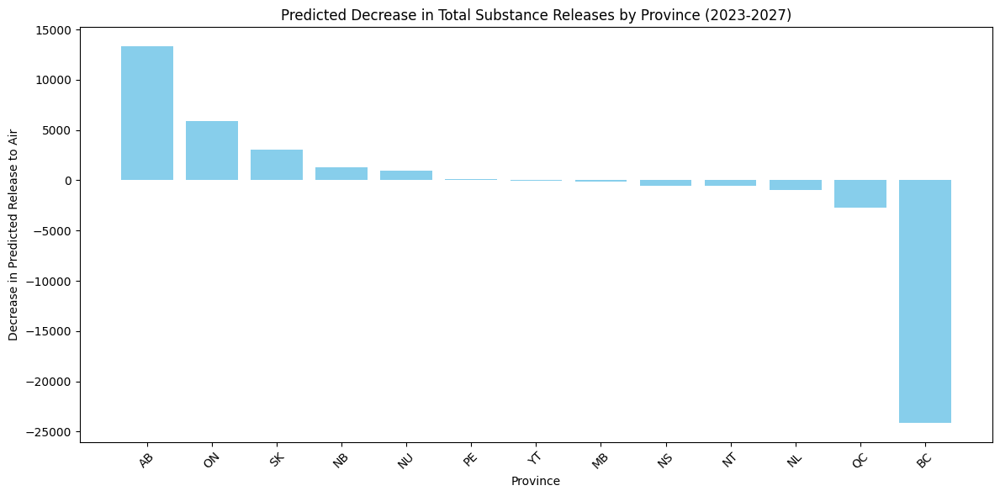

In [ ]:
# Calculate decreases for each province
decrease_analysis = total_predictions.pivot(index='Province', columns='Year', values='Predicted_Release_to_Air')
decrease_analysis['Decrease'] = decrease_analysis[2023] - decrease_analysis[2027]

# Sort by largest decrease
decrease_analysis = decrease_analysis.sort_values(by='Decrease', ascending=False).reset_index()

# Display the province with the largest decrease
largest_decrease_province = decrease_analysis.head(1)
print("\nProvince with the largest decrease:")
print(largest_decrease_province)

# Visualization
import matplotlib.pyplot as plt

# Bar chart for decreases
plt.figure(figsize=(12, 6))
plt.bar(decrease_analysis['Province'], decrease_analysis['Decrease'], color='skyblue')
plt.title("Predicted Decrease in Total Substance Releases by Province (2023-2027)")
plt.xlabel("Province")
plt.ylabel("Decrease in Predicted Release to Air")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()